In [1]:
"""
Quick example: A small second-order optimizer with BackPACK
on the classic MNIST example from PyTorch,
https://github.com/pytorch/examples/blob/master/mnist/main.py

The optimizer we implement uses a constant damping parameter
and uses the diagonal of the GGN/Fisher matrix as a preconditioner;

```
x_{t+1} = x_t - (G_t + bI)^{-1} g_t
```

- `x_t` are the parameters of the model
- `G_t` is the diagonal of the Gauss-Newton/Fisher matrix at `x_t`
- `b` is a damping parameter
- `g_t` is the gradient

"""

import torch
import numpy as np
import torchvision
# The main BackPACK functionalities
from backpack import backpack, extend
# The diagonal GGN extension
from backpack.extensions import DiagGGNMC
# This layer did not exist in Pytorch 1.0
from backpack.core.layers import Flatten

# Hyperparameters
BATCH_SIZE = 64
STEP_SIZE_TRAIN = 0.00001 #from 0.01
STEP_SIZE_HESS = 0.0001
DAMPING = 1.0
MAX_ITER = 6
torch.manual_seed(0)

In [2]:
"""
Step 1: Load data and create the model.

We're going to load the MNIST dataset,
and fit a 3-layer MLP with ReLU activations.
"""


mnist_loader = torch.utils.data.dataloader.DataLoader(
    torchvision.datasets.MNIST(
        './data',
        train=True,
        download=True,
        transform=torchvision.transforms.Compose([
            torchvision.transforms.ToTensor(),
            torchvision.transforms.Normalize(
                (0.1307,), (0.3081,)
            )
        ])),
    batch_size=BATCH_SIZE,
    shuffle=True
)

"""
model = torch.nn.Sequential(
    torch.nn.Conv2d(1, 20, 5, 1),
    torch.nn.ReLU(),
    torch.nn.MaxPool2d(2, 2),
    torch.nn.Conv2d(20, 50, 5, 1),
    torch.nn.ReLU(),
    torch.nn.MaxPool2d(2, 2),
    Flatten(), 
    # Pytorch <1.2 doesn't have a Flatten layer
    torch.nn.Linear(4*4*50, 500),
    torch.nn.ReLU(),
    torch.nn.Linear(500, 10),
)
"""

class LPADirNN(torch.nn.Module):
    def __init__(self):
        
        super(LPADirNN, self).__init__()
        
        self.c1 = torch.nn.Conv2d(1, 20, 5, 1)
        self.relu1 = torch.nn.ReLU()
        self.maxpool2d1 = torch.nn.MaxPool2d(2,2)
        self.c2 = torch.nn.Conv2d(20, 50, 5, 1)
        self.relu2 = torch.nn.ReLU()
        self.maxpool2d2 = torch.nn.MaxPool2d(2,2)
        self.flatten = Flatten()
        self.l1 = torch.nn.Linear(4 * 4 * 50, 500)
        self.relu3 = torch.nn.ReLU()
        self.l2 = torch.nn.Linear(500, 10)
        
    def forward(self, x, phi=False):
        
        x = self.c1(x)
        x = self.relu1(x)
        x = self.maxpool2d1(x)
        x = self.c2(x)
        x = self.relu2(x)
        x = self.maxpool2d2(x)
        x = self.flatten(x)
        x = self.l1(x)
        x = self.relu3(x)
        if phi:
            return(x)
        else:
            x = self.l2(x)
            return(x)
        

def get_accuracy(output, targets):
    """Helper function to print the accuracy"""
    predictions = output.argmax(dim=1, keepdim=True).view_as(targets)
    return predictions.eq(targets).float().mean().item()



In [3]:
"""
Step 2: Create the optimizer.

After we call the backward pass with backpack,
every parameter will have a `diag_ggn_mc` field
in addition to a `grad` field.

We can use it to compute the search direction for that parameter,
```
step_direction = p.grad / (p.diag_ggn_mc + group["damping"])
```
and update the weights
"""


class DiagGGNOptimizer(torch.optim.Optimizer):
    def __init__(self, parameters, step_size, damping):
        super().__init__(
            parameters, 
            dict(step_size=step_size, damping=damping)
        )

    def step(self):
        for group in self.param_groups:
            for p in group["params"]:
                step_direction = p.grad / (p.diag_ggn_mc + group["damping"])
                p.data.add_(-group["step_size"], step_direction)
        return loss


In [4]:
"""
Step 3: Tell BackPACK about the model and loss function, 
create the optimizer, and we will be ready to go
"""

mnist_model = LPADirNN()
loss_function = torch.nn.CrossEntropyLoss()

extend(mnist_model)
extend(loss_function)

mnist_train_optimizer = torch.optim.Adam(mnist_model.parameters(), lr=STEP_SIZE_TRAIN)
#mnist_train_optimizer = torch.optim.SGD(mnist_model.parameters(), lr=0.001, momentum=0.9)

In [5]:
"""
Final step: The training loop!

The only difference with a traditional training loop:
Before calling the backward pass, we will call
```
    with backpack(DiagGGNMC()):
```
BackPACK will then add the diagonal of the GGN in the
`diag_ggn_mc` field during the backward pass.
"""

for iter in range(MAX_ITER):
    for batch_idx, (x, y) in enumerate(mnist_loader):
        max_len = int(np.ceil(len(mnist_loader.dataset)/BATCH_SIZE))
        output = mnist_model(x, phi=False)

        accuracy = get_accuracy(output, y)

        #with backpack(DiagGGNMC()):
        #    loss = loss_function(output, y)
        #    loss.backward()
        #    mnist_optimizer.step()
        
        loss = loss_function(output, y)
        loss.backward()
        mnist_train_optimizer.step()

        print(
            "Iteration {}; {}/{} \t".format(iter, batch_idx, max_len) +
            "Minibatch Loss %.3f  " % (loss) +
            "Accuracy %.0f" % (accuracy * 100) + "%"
        )

MNIST_PATH = "models/mnist_test.pth"
print("saving model at: {}".format(MNIST_PATH))
torch.save(mnist_model.state_dict(), MNIST_PATH)

Iteration 0; 0/938 	Minibatch Loss 2.307  Accuracy 12%
Iteration 0; 1/938 	Minibatch Loss 2.321  Accuracy 8%
Iteration 0; 2/938 	Minibatch Loss 2.338  Accuracy 8%
Iteration 0; 3/938 	Minibatch Loss 2.305  Accuracy 9%
Iteration 0; 4/938 	Minibatch Loss 2.313  Accuracy 6%
Iteration 0; 5/938 	Minibatch Loss 2.295  Accuracy 14%
Iteration 0; 6/938 	Minibatch Loss 2.315  Accuracy 11%
Iteration 0; 7/938 	Minibatch Loss 2.289  Accuracy 14%
Iteration 0; 8/938 	Minibatch Loss 2.323  Accuracy 5%
Iteration 0; 9/938 	Minibatch Loss 2.285  Accuracy 16%
Iteration 0; 10/938 	Minibatch Loss 2.317  Accuracy 5%
Iteration 0; 11/938 	Minibatch Loss 2.292  Accuracy 14%
Iteration 0; 12/938 	Minibatch Loss 2.305  Accuracy 3%
Iteration 0; 13/938 	Minibatch Loss 2.295  Accuracy 16%
Iteration 0; 14/938 	Minibatch Loss 2.285  Accuracy 12%
Iteration 0; 15/938 	Minibatch Loss 2.291  Accuracy 12%
Iteration 0; 16/938 	Minibatch Loss 2.272  Accuracy 11%
Iteration 0; 17/938 	Minibatch Loss 2.278  Accuracy 12%
Iteration

Iteration 0; 149/938 	Minibatch Loss 1.836  Accuracy 75%
Iteration 0; 150/938 	Minibatch Loss 1.829  Accuracy 72%
Iteration 0; 151/938 	Minibatch Loss 1.764  Accuracy 83%
Iteration 0; 152/938 	Minibatch Loss 1.744  Accuracy 83%
Iteration 0; 153/938 	Minibatch Loss 1.835  Accuracy 69%
Iteration 0; 154/938 	Minibatch Loss 1.764  Accuracy 80%
Iteration 0; 155/938 	Minibatch Loss 1.703  Accuracy 91%
Iteration 0; 156/938 	Minibatch Loss 1.785  Accuracy 72%
Iteration 0; 157/938 	Minibatch Loss 1.741  Accuracy 78%
Iteration 0; 158/938 	Minibatch Loss 1.779  Accuracy 77%
Iteration 0; 159/938 	Minibatch Loss 1.691  Accuracy 81%
Iteration 0; 160/938 	Minibatch Loss 1.748  Accuracy 83%
Iteration 0; 161/938 	Minibatch Loss 1.778  Accuracy 70%
Iteration 0; 162/938 	Minibatch Loss 1.768  Accuracy 72%
Iteration 0; 163/938 	Minibatch Loss 1.785  Accuracy 67%
Iteration 0; 164/938 	Minibatch Loss 1.715  Accuracy 73%
Iteration 0; 165/938 	Minibatch Loss 1.754  Accuracy 75%
Iteration 0; 166/938 	Minibatch

Iteration 0; 293/938 	Minibatch Loss 0.992  Accuracy 72%
Iteration 0; 294/938 	Minibatch Loss 0.864  Accuracy 84%
Iteration 0; 295/938 	Minibatch Loss 1.018  Accuracy 73%
Iteration 0; 296/938 	Minibatch Loss 0.930  Accuracy 86%
Iteration 0; 297/938 	Minibatch Loss 0.854  Accuracy 89%
Iteration 0; 298/938 	Minibatch Loss 0.944  Accuracy 81%
Iteration 0; 299/938 	Minibatch Loss 0.889  Accuracy 80%
Iteration 0; 300/938 	Minibatch Loss 0.925  Accuracy 83%
Iteration 0; 301/938 	Minibatch Loss 0.997  Accuracy 78%
Iteration 0; 302/938 	Minibatch Loss 0.854  Accuracy 84%
Iteration 0; 303/938 	Minibatch Loss 1.083  Accuracy 70%
Iteration 0; 304/938 	Minibatch Loss 0.876  Accuracy 81%
Iteration 0; 305/938 	Minibatch Loss 0.822  Accuracy 86%
Iteration 0; 306/938 	Minibatch Loss 0.957  Accuracy 81%
Iteration 0; 307/938 	Minibatch Loss 0.923  Accuracy 80%
Iteration 0; 308/938 	Minibatch Loss 0.882  Accuracy 81%
Iteration 0; 309/938 	Minibatch Loss 0.930  Accuracy 83%
Iteration 0; 310/938 	Minibatch

Iteration 0; 437/938 	Minibatch Loss 0.400  Accuracy 88%
Iteration 0; 438/938 	Minibatch Loss 0.374  Accuracy 91%
Iteration 0; 439/938 	Minibatch Loss 0.633  Accuracy 73%
Iteration 0; 440/938 	Minibatch Loss 0.465  Accuracy 86%
Iteration 0; 441/938 	Minibatch Loss 0.458  Accuracy 88%
Iteration 0; 442/938 	Minibatch Loss 0.550  Accuracy 78%
Iteration 0; 443/938 	Minibatch Loss 0.754  Accuracy 73%
Iteration 0; 444/938 	Minibatch Loss 0.479  Accuracy 86%
Iteration 0; 445/938 	Minibatch Loss 0.530  Accuracy 84%
Iteration 0; 446/938 	Minibatch Loss 0.813  Accuracy 73%
Iteration 0; 447/938 	Minibatch Loss 0.404  Accuracy 91%
Iteration 0; 448/938 	Minibatch Loss 0.641  Accuracy 77%
Iteration 0; 449/938 	Minibatch Loss 0.873  Accuracy 80%
Iteration 0; 450/938 	Minibatch Loss 0.544  Accuracy 81%
Iteration 0; 451/938 	Minibatch Loss 0.509  Accuracy 81%
Iteration 0; 452/938 	Minibatch Loss 0.574  Accuracy 80%
Iteration 0; 453/938 	Minibatch Loss 0.647  Accuracy 73%
Iteration 0; 454/938 	Minibatch

Iteration 0; 582/938 	Minibatch Loss 0.752  Accuracy 80%
Iteration 0; 583/938 	Minibatch Loss 0.709  Accuracy 88%
Iteration 0; 584/938 	Minibatch Loss 0.442  Accuracy 80%
Iteration 0; 585/938 	Minibatch Loss 0.529  Accuracy 81%
Iteration 0; 586/938 	Minibatch Loss 0.657  Accuracy 81%
Iteration 0; 587/938 	Minibatch Loss 0.891  Accuracy 75%
Iteration 0; 588/938 	Minibatch Loss 0.493  Accuracy 84%
Iteration 0; 589/938 	Minibatch Loss 1.026  Accuracy 66%
Iteration 0; 590/938 	Minibatch Loss 0.663  Accuracy 81%
Iteration 0; 591/938 	Minibatch Loss 0.693  Accuracy 80%
Iteration 0; 592/938 	Minibatch Loss 0.677  Accuracy 75%
Iteration 0; 593/938 	Minibatch Loss 0.758  Accuracy 77%
Iteration 0; 594/938 	Minibatch Loss 0.752  Accuracy 69%
Iteration 0; 595/938 	Minibatch Loss 0.553  Accuracy 80%
Iteration 0; 596/938 	Minibatch Loss 0.622  Accuracy 81%
Iteration 0; 597/938 	Minibatch Loss 0.792  Accuracy 77%
Iteration 0; 598/938 	Minibatch Loss 0.531  Accuracy 78%
Iteration 0; 599/938 	Minibatch

Iteration 0; 729/938 	Minibatch Loss 0.440  Accuracy 92%
Iteration 0; 730/938 	Minibatch Loss 0.675  Accuracy 83%
Iteration 0; 731/938 	Minibatch Loss 0.440  Accuracy 84%
Iteration 0; 732/938 	Minibatch Loss 0.415  Accuracy 86%
Iteration 0; 733/938 	Minibatch Loss 0.309  Accuracy 89%
Iteration 0; 734/938 	Minibatch Loss 0.590  Accuracy 80%
Iteration 0; 735/938 	Minibatch Loss 0.436  Accuracy 91%
Iteration 0; 736/938 	Minibatch Loss 0.346  Accuracy 89%
Iteration 0; 737/938 	Minibatch Loss 0.493  Accuracy 84%
Iteration 0; 738/938 	Minibatch Loss 0.584  Accuracy 88%
Iteration 0; 739/938 	Minibatch Loss 0.637  Accuracy 78%
Iteration 0; 740/938 	Minibatch Loss 0.736  Accuracy 80%
Iteration 0; 741/938 	Minibatch Loss 0.564  Accuracy 88%
Iteration 0; 742/938 	Minibatch Loss 0.357  Accuracy 91%
Iteration 0; 743/938 	Minibatch Loss 0.646  Accuracy 88%
Iteration 0; 744/938 	Minibatch Loss 0.283  Accuracy 91%
Iteration 0; 745/938 	Minibatch Loss 0.617  Accuracy 88%
Iteration 0; 746/938 	Minibatch

Iteration 0; 873/938 	Minibatch Loss 0.910  Accuracy 83%
Iteration 0; 874/938 	Minibatch Loss 0.720  Accuracy 81%
Iteration 0; 875/938 	Minibatch Loss 0.598  Accuracy 84%
Iteration 0; 876/938 	Minibatch Loss 0.591  Accuracy 84%
Iteration 0; 877/938 	Minibatch Loss 0.712  Accuracy 86%
Iteration 0; 878/938 	Minibatch Loss 0.601  Accuracy 80%
Iteration 0; 879/938 	Minibatch Loss 0.515  Accuracy 81%
Iteration 0; 880/938 	Minibatch Loss 1.041  Accuracy 77%
Iteration 0; 881/938 	Minibatch Loss 0.994  Accuracy 78%
Iteration 0; 882/938 	Minibatch Loss 0.604  Accuracy 81%
Iteration 0; 883/938 	Minibatch Loss 0.757  Accuracy 84%
Iteration 0; 884/938 	Minibatch Loss 0.553  Accuracy 89%
Iteration 0; 885/938 	Minibatch Loss 0.483  Accuracy 88%
Iteration 0; 886/938 	Minibatch Loss 0.511  Accuracy 81%
Iteration 0; 887/938 	Minibatch Loss 0.255  Accuracy 95%
Iteration 0; 888/938 	Minibatch Loss 0.758  Accuracy 81%
Iteration 0; 889/938 	Minibatch Loss 0.600  Accuracy 84%
Iteration 0; 890/938 	Minibatch

Iteration 1; 84/938 	Minibatch Loss 0.535  Accuracy 83%
Iteration 1; 85/938 	Minibatch Loss 0.936  Accuracy 81%
Iteration 1; 86/938 	Minibatch Loss 0.785  Accuracy 83%
Iteration 1; 87/938 	Minibatch Loss 0.328  Accuracy 89%
Iteration 1; 88/938 	Minibatch Loss 0.382  Accuracy 89%
Iteration 1; 89/938 	Minibatch Loss 0.435  Accuracy 86%
Iteration 1; 90/938 	Minibatch Loss 0.429  Accuracy 92%
Iteration 1; 91/938 	Minibatch Loss 0.719  Accuracy 83%
Iteration 1; 92/938 	Minibatch Loss 1.036  Accuracy 75%
Iteration 1; 93/938 	Minibatch Loss 0.441  Accuracy 83%
Iteration 1; 94/938 	Minibatch Loss 0.642  Accuracy 81%
Iteration 1; 95/938 	Minibatch Loss 0.477  Accuracy 86%
Iteration 1; 96/938 	Minibatch Loss 0.545  Accuracy 88%
Iteration 1; 97/938 	Minibatch Loss 0.527  Accuracy 84%
Iteration 1; 98/938 	Minibatch Loss 0.525  Accuracy 83%
Iteration 1; 99/938 	Minibatch Loss 0.396  Accuracy 88%
Iteration 1; 100/938 	Minibatch Loss 1.065  Accuracy 80%
Iteration 1; 101/938 	Minibatch Loss 0.847  Acc

Iteration 1; 229/938 	Minibatch Loss 0.339  Accuracy 89%
Iteration 1; 230/938 	Minibatch Loss 0.389  Accuracy 88%
Iteration 1; 231/938 	Minibatch Loss 0.344  Accuracy 88%
Iteration 1; 232/938 	Minibatch Loss 0.280  Accuracy 94%
Iteration 1; 233/938 	Minibatch Loss 0.526  Accuracy 83%
Iteration 1; 234/938 	Minibatch Loss 0.271  Accuracy 94%
Iteration 1; 235/938 	Minibatch Loss 0.293  Accuracy 94%
Iteration 1; 236/938 	Minibatch Loss 0.463  Accuracy 86%
Iteration 1; 237/938 	Minibatch Loss 0.439  Accuracy 89%
Iteration 1; 238/938 	Minibatch Loss 0.396  Accuracy 89%
Iteration 1; 239/938 	Minibatch Loss 0.365  Accuracy 91%
Iteration 1; 240/938 	Minibatch Loss 0.508  Accuracy 81%
Iteration 1; 241/938 	Minibatch Loss 0.389  Accuracy 86%
Iteration 1; 242/938 	Minibatch Loss 0.402  Accuracy 88%
Iteration 1; 243/938 	Minibatch Loss 0.178  Accuracy 94%
Iteration 1; 244/938 	Minibatch Loss 0.290  Accuracy 95%
Iteration 1; 245/938 	Minibatch Loss 0.265  Accuracy 92%
Iteration 1; 246/938 	Minibatch

Iteration 1; 373/938 	Minibatch Loss 0.175  Accuracy 94%
Iteration 1; 374/938 	Minibatch Loss 0.506  Accuracy 86%
Iteration 1; 375/938 	Minibatch Loss 0.478  Accuracy 88%
Iteration 1; 376/938 	Minibatch Loss 0.325  Accuracy 94%
Iteration 1; 377/938 	Minibatch Loss 0.400  Accuracy 88%
Iteration 1; 378/938 	Minibatch Loss 0.395  Accuracy 92%
Iteration 1; 379/938 	Minibatch Loss 0.451  Accuracy 86%
Iteration 1; 380/938 	Minibatch Loss 0.329  Accuracy 91%
Iteration 1; 381/938 	Minibatch Loss 0.406  Accuracy 86%
Iteration 1; 382/938 	Minibatch Loss 0.299  Accuracy 89%
Iteration 1; 383/938 	Minibatch Loss 0.515  Accuracy 83%
Iteration 1; 384/938 	Minibatch Loss 0.379  Accuracy 83%
Iteration 1; 385/938 	Minibatch Loss 0.444  Accuracy 84%
Iteration 1; 386/938 	Minibatch Loss 0.300  Accuracy 89%
Iteration 1; 387/938 	Minibatch Loss 0.461  Accuracy 88%
Iteration 1; 388/938 	Minibatch Loss 0.201  Accuracy 94%
Iteration 1; 389/938 	Minibatch Loss 0.456  Accuracy 80%
Iteration 1; 390/938 	Minibatch

Iteration 1; 518/938 	Minibatch Loss 0.212  Accuracy 95%
Iteration 1; 519/938 	Minibatch Loss 0.346  Accuracy 86%
Iteration 1; 520/938 	Minibatch Loss 0.223  Accuracy 95%
Iteration 1; 521/938 	Minibatch Loss 0.427  Accuracy 86%
Iteration 1; 522/938 	Minibatch Loss 0.513  Accuracy 88%
Iteration 1; 523/938 	Minibatch Loss 0.195  Accuracy 97%
Iteration 1; 524/938 	Minibatch Loss 0.352  Accuracy 92%
Iteration 1; 525/938 	Minibatch Loss 0.511  Accuracy 78%
Iteration 1; 526/938 	Minibatch Loss 0.524  Accuracy 83%
Iteration 1; 527/938 	Minibatch Loss 0.517  Accuracy 83%
Iteration 1; 528/938 	Minibatch Loss 0.404  Accuracy 86%
Iteration 1; 529/938 	Minibatch Loss 0.470  Accuracy 88%
Iteration 1; 530/938 	Minibatch Loss 0.329  Accuracy 92%
Iteration 1; 531/938 	Minibatch Loss 0.323  Accuracy 89%
Iteration 1; 532/938 	Minibatch Loss 0.272  Accuracy 94%
Iteration 1; 533/938 	Minibatch Loss 0.188  Accuracy 95%
Iteration 1; 534/938 	Minibatch Loss 0.284  Accuracy 91%
Iteration 1; 535/938 	Minibatch

Iteration 1; 663/938 	Minibatch Loss 0.280  Accuracy 97%
Iteration 1; 664/938 	Minibatch Loss 0.313  Accuracy 91%
Iteration 1; 665/938 	Minibatch Loss 0.292  Accuracy 92%
Iteration 1; 666/938 	Minibatch Loss 0.243  Accuracy 95%
Iteration 1; 667/938 	Minibatch Loss 0.311  Accuracy 91%
Iteration 1; 668/938 	Minibatch Loss 0.200  Accuracy 97%
Iteration 1; 669/938 	Minibatch Loss 0.532  Accuracy 80%
Iteration 1; 670/938 	Minibatch Loss 0.238  Accuracy 95%
Iteration 1; 671/938 	Minibatch Loss 0.423  Accuracy 91%
Iteration 1; 672/938 	Minibatch Loss 0.344  Accuracy 89%
Iteration 1; 673/938 	Minibatch Loss 0.313  Accuracy 95%
Iteration 1; 674/938 	Minibatch Loss 0.335  Accuracy 88%
Iteration 1; 675/938 	Minibatch Loss 0.418  Accuracy 89%
Iteration 1; 676/938 	Minibatch Loss 0.338  Accuracy 89%
Iteration 1; 677/938 	Minibatch Loss 0.492  Accuracy 88%
Iteration 1; 678/938 	Minibatch Loss 0.367  Accuracy 86%
Iteration 1; 679/938 	Minibatch Loss 0.395  Accuracy 91%
Iteration 1; 680/938 	Minibatch

Iteration 1; 807/938 	Minibatch Loss 0.376  Accuracy 94%
Iteration 1; 808/938 	Minibatch Loss 0.417  Accuracy 89%
Iteration 1; 809/938 	Minibatch Loss 0.195  Accuracy 94%
Iteration 1; 810/938 	Minibatch Loss 0.337  Accuracy 92%
Iteration 1; 811/938 	Minibatch Loss 0.241  Accuracy 95%
Iteration 1; 812/938 	Minibatch Loss 0.148  Accuracy 98%
Iteration 1; 813/938 	Minibatch Loss 0.189  Accuracy 92%
Iteration 1; 814/938 	Minibatch Loss 0.466  Accuracy 91%
Iteration 1; 815/938 	Minibatch Loss 0.349  Accuracy 92%
Iteration 1; 816/938 	Minibatch Loss 0.349  Accuracy 89%
Iteration 1; 817/938 	Minibatch Loss 0.291  Accuracy 92%
Iteration 1; 818/938 	Minibatch Loss 0.290  Accuracy 94%
Iteration 1; 819/938 	Minibatch Loss 0.301  Accuracy 92%
Iteration 1; 820/938 	Minibatch Loss 0.459  Accuracy 88%
Iteration 1; 821/938 	Minibatch Loss 0.229  Accuracy 95%
Iteration 1; 822/938 	Minibatch Loss 0.213  Accuracy 95%
Iteration 1; 823/938 	Minibatch Loss 0.269  Accuracy 91%
Iteration 1; 824/938 	Minibatch

Iteration 2; 14/938 	Minibatch Loss 0.444  Accuracy 81%
Iteration 2; 15/938 	Minibatch Loss 0.364  Accuracy 92%
Iteration 2; 16/938 	Minibatch Loss 0.159  Accuracy 95%
Iteration 2; 17/938 	Minibatch Loss 0.176  Accuracy 97%
Iteration 2; 18/938 	Minibatch Loss 0.193  Accuracy 92%
Iteration 2; 19/938 	Minibatch Loss 0.349  Accuracy 91%
Iteration 2; 20/938 	Minibatch Loss 0.291  Accuracy 91%
Iteration 2; 21/938 	Minibatch Loss 0.095  Accuracy 98%
Iteration 2; 22/938 	Minibatch Loss 0.162  Accuracy 94%
Iteration 2; 23/938 	Minibatch Loss 0.357  Accuracy 86%
Iteration 2; 24/938 	Minibatch Loss 0.230  Accuracy 91%
Iteration 2; 25/938 	Minibatch Loss 0.362  Accuracy 88%
Iteration 2; 26/938 	Minibatch Loss 0.259  Accuracy 89%
Iteration 2; 27/938 	Minibatch Loss 0.258  Accuracy 92%
Iteration 2; 28/938 	Minibatch Loss 0.232  Accuracy 91%
Iteration 2; 29/938 	Minibatch Loss 0.169  Accuracy 98%
Iteration 2; 30/938 	Minibatch Loss 0.130  Accuracy 97%
Iteration 2; 31/938 	Minibatch Loss 0.432  Accur

Iteration 2; 163/938 	Minibatch Loss 0.445  Accuracy 91%
Iteration 2; 164/938 	Minibatch Loss 0.116  Accuracy 95%
Iteration 2; 165/938 	Minibatch Loss 0.152  Accuracy 94%
Iteration 2; 166/938 	Minibatch Loss 0.241  Accuracy 89%
Iteration 2; 167/938 	Minibatch Loss 0.072  Accuracy 97%
Iteration 2; 168/938 	Minibatch Loss 0.145  Accuracy 95%
Iteration 2; 169/938 	Minibatch Loss 0.183  Accuracy 92%
Iteration 2; 170/938 	Minibatch Loss 0.221  Accuracy 91%
Iteration 2; 171/938 	Minibatch Loss 0.185  Accuracy 94%
Iteration 2; 172/938 	Minibatch Loss 0.262  Accuracy 94%
Iteration 2; 173/938 	Minibatch Loss 0.216  Accuracy 94%
Iteration 2; 174/938 	Minibatch Loss 0.321  Accuracy 92%
Iteration 2; 175/938 	Minibatch Loss 0.152  Accuracy 94%
Iteration 2; 176/938 	Minibatch Loss 0.262  Accuracy 95%
Iteration 2; 177/938 	Minibatch Loss 0.183  Accuracy 95%
Iteration 2; 178/938 	Minibatch Loss 0.238  Accuracy 94%
Iteration 2; 179/938 	Minibatch Loss 0.243  Accuracy 94%
Iteration 2; 180/938 	Minibatch

Iteration 2; 308/938 	Minibatch Loss 0.238  Accuracy 92%
Iteration 2; 309/938 	Minibatch Loss 0.180  Accuracy 94%
Iteration 2; 310/938 	Minibatch Loss 0.110  Accuracy 95%
Iteration 2; 311/938 	Minibatch Loss 0.090  Accuracy 98%
Iteration 2; 312/938 	Minibatch Loss 0.079  Accuracy 95%
Iteration 2; 313/938 	Minibatch Loss 0.244  Accuracy 94%
Iteration 2; 314/938 	Minibatch Loss 0.177  Accuracy 98%
Iteration 2; 315/938 	Minibatch Loss 0.067  Accuracy 95%
Iteration 2; 316/938 	Minibatch Loss 0.203  Accuracy 92%
Iteration 2; 317/938 	Minibatch Loss 0.187  Accuracy 95%
Iteration 2; 318/938 	Minibatch Loss 0.180  Accuracy 95%
Iteration 2; 319/938 	Minibatch Loss 0.327  Accuracy 89%
Iteration 2; 320/938 	Minibatch Loss 0.425  Accuracy 89%
Iteration 2; 321/938 	Minibatch Loss 0.137  Accuracy 94%
Iteration 2; 322/938 	Minibatch Loss 0.164  Accuracy 94%
Iteration 2; 323/938 	Minibatch Loss 0.340  Accuracy 94%
Iteration 2; 324/938 	Minibatch Loss 0.201  Accuracy 94%
Iteration 2; 325/938 	Minibatch

Iteration 2; 453/938 	Minibatch Loss 0.257  Accuracy 94%
Iteration 2; 454/938 	Minibatch Loss 0.275  Accuracy 91%
Iteration 2; 455/938 	Minibatch Loss 0.302  Accuracy 91%
Iteration 2; 456/938 	Minibatch Loss 0.287  Accuracy 92%
Iteration 2; 457/938 	Minibatch Loss 0.149  Accuracy 97%
Iteration 2; 458/938 	Minibatch Loss 0.402  Accuracy 89%
Iteration 2; 459/938 	Minibatch Loss 0.392  Accuracy 88%
Iteration 2; 460/938 	Minibatch Loss 0.093  Accuracy 97%
Iteration 2; 461/938 	Minibatch Loss 0.199  Accuracy 92%
Iteration 2; 462/938 	Minibatch Loss 0.194  Accuracy 92%
Iteration 2; 463/938 	Minibatch Loss 0.574  Accuracy 94%
Iteration 2; 464/938 	Minibatch Loss 0.075  Accuracy 97%
Iteration 2; 465/938 	Minibatch Loss 0.130  Accuracy 95%
Iteration 2; 466/938 	Minibatch Loss 0.105  Accuracy 95%
Iteration 2; 467/938 	Minibatch Loss 0.100  Accuracy 97%
Iteration 2; 468/938 	Minibatch Loss 0.104  Accuracy 95%
Iteration 2; 469/938 	Minibatch Loss 0.241  Accuracy 91%
Iteration 2; 470/938 	Minibatch

Iteration 2; 601/938 	Minibatch Loss 0.075  Accuracy 97%
Iteration 2; 602/938 	Minibatch Loss 0.162  Accuracy 92%
Iteration 2; 603/938 	Minibatch Loss 0.224  Accuracy 95%
Iteration 2; 604/938 	Minibatch Loss 0.289  Accuracy 92%
Iteration 2; 605/938 	Minibatch Loss 0.075  Accuracy 98%
Iteration 2; 606/938 	Minibatch Loss 0.246  Accuracy 95%
Iteration 2; 607/938 	Minibatch Loss 0.237  Accuracy 94%
Iteration 2; 608/938 	Minibatch Loss 0.096  Accuracy 97%
Iteration 2; 609/938 	Minibatch Loss 0.096  Accuracy 95%
Iteration 2; 610/938 	Minibatch Loss 0.060  Accuracy 98%
Iteration 2; 611/938 	Minibatch Loss 0.186  Accuracy 95%
Iteration 2; 612/938 	Minibatch Loss 0.119  Accuracy 98%
Iteration 2; 613/938 	Minibatch Loss 0.177  Accuracy 92%
Iteration 2; 614/938 	Minibatch Loss 0.283  Accuracy 94%
Iteration 2; 615/938 	Minibatch Loss 0.173  Accuracy 92%
Iteration 2; 616/938 	Minibatch Loss 0.061  Accuracy 98%
Iteration 2; 617/938 	Minibatch Loss 0.078  Accuracy 97%
Iteration 2; 618/938 	Minibatch

Iteration 2; 746/938 	Minibatch Loss 0.200  Accuracy 94%
Iteration 2; 747/938 	Minibatch Loss 0.064  Accuracy 97%
Iteration 2; 748/938 	Minibatch Loss 0.157  Accuracy 97%
Iteration 2; 749/938 	Minibatch Loss 0.143  Accuracy 95%
Iteration 2; 750/938 	Minibatch Loss 0.242  Accuracy 92%
Iteration 2; 751/938 	Minibatch Loss 0.174  Accuracy 94%
Iteration 2; 752/938 	Minibatch Loss 0.231  Accuracy 94%
Iteration 2; 753/938 	Minibatch Loss 0.064  Accuracy 95%
Iteration 2; 754/938 	Minibatch Loss 0.364  Accuracy 94%
Iteration 2; 755/938 	Minibatch Loss 0.606  Accuracy 91%
Iteration 2; 756/938 	Minibatch Loss 0.316  Accuracy 91%
Iteration 2; 757/938 	Minibatch Loss 0.187  Accuracy 95%
Iteration 2; 758/938 	Minibatch Loss 0.300  Accuracy 92%
Iteration 2; 759/938 	Minibatch Loss 0.061  Accuracy 97%
Iteration 2; 760/938 	Minibatch Loss 0.422  Accuracy 97%
Iteration 2; 761/938 	Minibatch Loss 0.297  Accuracy 97%
Iteration 2; 762/938 	Minibatch Loss 0.231  Accuracy 91%
Iteration 2; 763/938 	Minibatch

Iteration 2; 891/938 	Minibatch Loss 0.261  Accuracy 94%
Iteration 2; 892/938 	Minibatch Loss 0.208  Accuracy 91%
Iteration 2; 893/938 	Minibatch Loss 0.418  Accuracy 97%
Iteration 2; 894/938 	Minibatch Loss 0.075  Accuracy 97%
Iteration 2; 895/938 	Minibatch Loss 0.419  Accuracy 94%
Iteration 2; 896/938 	Minibatch Loss 0.071  Accuracy 95%
Iteration 2; 897/938 	Minibatch Loss 0.215  Accuracy 92%
Iteration 2; 898/938 	Minibatch Loss 0.184  Accuracy 94%
Iteration 2; 899/938 	Minibatch Loss 0.576  Accuracy 92%
Iteration 2; 900/938 	Minibatch Loss 0.143  Accuracy 95%
Iteration 2; 901/938 	Minibatch Loss 0.158  Accuracy 95%
Iteration 2; 902/938 	Minibatch Loss 0.080  Accuracy 98%
Iteration 2; 903/938 	Minibatch Loss 0.038  Accuracy 98%
Iteration 2; 904/938 	Minibatch Loss 0.111  Accuracy 95%
Iteration 2; 905/938 	Minibatch Loss 0.179  Accuracy 97%
Iteration 2; 906/938 	Minibatch Loss 0.097  Accuracy 98%
Iteration 2; 907/938 	Minibatch Loss 0.162  Accuracy 97%
Iteration 2; 908/938 	Minibatch

Iteration 3; 102/938 	Minibatch Loss 0.256  Accuracy 94%
Iteration 3; 103/938 	Minibatch Loss 0.213  Accuracy 95%
Iteration 3; 104/938 	Minibatch Loss 0.155  Accuracy 97%
Iteration 3; 105/938 	Minibatch Loss 0.033  Accuracy 98%
Iteration 3; 106/938 	Minibatch Loss 0.120  Accuracy 95%
Iteration 3; 107/938 	Minibatch Loss 0.100  Accuracy 97%
Iteration 3; 108/938 	Minibatch Loss 0.223  Accuracy 95%
Iteration 3; 109/938 	Minibatch Loss 0.112  Accuracy 94%
Iteration 3; 110/938 	Minibatch Loss 0.154  Accuracy 95%
Iteration 3; 111/938 	Minibatch Loss 0.111  Accuracy 95%
Iteration 3; 112/938 	Minibatch Loss 0.050  Accuracy 97%
Iteration 3; 113/938 	Minibatch Loss 0.050  Accuracy 98%
Iteration 3; 114/938 	Minibatch Loss 0.082  Accuracy 98%
Iteration 3; 115/938 	Minibatch Loss 0.153  Accuracy 94%
Iteration 3; 116/938 	Minibatch Loss 0.052  Accuracy 98%
Iteration 3; 117/938 	Minibatch Loss 0.108  Accuracy 97%
Iteration 3; 118/938 	Minibatch Loss 0.052  Accuracy 98%
Iteration 3; 119/938 	Minibatch

Iteration 3; 248/938 	Minibatch Loss 0.166  Accuracy 94%
Iteration 3; 249/938 	Minibatch Loss 0.300  Accuracy 95%
Iteration 3; 250/938 	Minibatch Loss 0.333  Accuracy 92%
Iteration 3; 251/938 	Minibatch Loss 0.073  Accuracy 97%
Iteration 3; 252/938 	Minibatch Loss 0.066  Accuracy 97%
Iteration 3; 253/938 	Minibatch Loss 0.291  Accuracy 97%
Iteration 3; 254/938 	Minibatch Loss 0.043  Accuracy 97%
Iteration 3; 255/938 	Minibatch Loss 0.298  Accuracy 97%
Iteration 3; 256/938 	Minibatch Loss 0.036  Accuracy 98%
Iteration 3; 257/938 	Minibatch Loss 0.168  Accuracy 97%
Iteration 3; 258/938 	Minibatch Loss 0.057  Accuracy 97%
Iteration 3; 259/938 	Minibatch Loss 0.138  Accuracy 95%
Iteration 3; 260/938 	Minibatch Loss 0.227  Accuracy 92%
Iteration 3; 261/938 	Minibatch Loss 0.106  Accuracy 98%
Iteration 3; 262/938 	Minibatch Loss 0.102  Accuracy 95%
Iteration 3; 263/938 	Minibatch Loss 0.029  Accuracy 98%
Iteration 3; 264/938 	Minibatch Loss 0.066  Accuracy 97%
Iteration 3; 265/938 	Minibatch

Iteration 3; 396/938 	Minibatch Loss 0.151  Accuracy 94%
Iteration 3; 397/938 	Minibatch Loss 0.158  Accuracy 97%
Iteration 3; 398/938 	Minibatch Loss 0.031  Accuracy 100%
Iteration 3; 399/938 	Minibatch Loss 0.173  Accuracy 94%
Iteration 3; 400/938 	Minibatch Loss 0.039  Accuracy 98%
Iteration 3; 401/938 	Minibatch Loss 0.104  Accuracy 97%
Iteration 3; 402/938 	Minibatch Loss 0.127  Accuracy 98%
Iteration 3; 403/938 	Minibatch Loss 0.146  Accuracy 97%
Iteration 3; 404/938 	Minibatch Loss 0.240  Accuracy 95%
Iteration 3; 405/938 	Minibatch Loss 0.086  Accuracy 98%
Iteration 3; 406/938 	Minibatch Loss 0.072  Accuracy 97%
Iteration 3; 407/938 	Minibatch Loss 0.033  Accuracy 98%
Iteration 3; 408/938 	Minibatch Loss 0.154  Accuracy 97%
Iteration 3; 409/938 	Minibatch Loss 0.007  Accuracy 100%
Iteration 3; 410/938 	Minibatch Loss 0.087  Accuracy 98%
Iteration 3; 411/938 	Minibatch Loss 0.054  Accuracy 98%
Iteration 3; 412/938 	Minibatch Loss 0.159  Accuracy 95%
Iteration 3; 413/938 	Minibat

Iteration 3; 540/938 	Minibatch Loss 0.197  Accuracy 95%
Iteration 3; 541/938 	Minibatch Loss 0.018  Accuracy 98%
Iteration 3; 542/938 	Minibatch Loss 0.184  Accuracy 97%
Iteration 3; 543/938 	Minibatch Loss 0.053  Accuracy 97%
Iteration 3; 544/938 	Minibatch Loss 0.034  Accuracy 100%
Iteration 3; 545/938 	Minibatch Loss 0.048  Accuracy 100%
Iteration 3; 546/938 	Minibatch Loss 0.172  Accuracy 94%
Iteration 3; 547/938 	Minibatch Loss 0.121  Accuracy 97%
Iteration 3; 548/938 	Minibatch Loss 0.029  Accuracy 100%
Iteration 3; 549/938 	Minibatch Loss 0.105  Accuracy 97%
Iteration 3; 550/938 	Minibatch Loss 0.225  Accuracy 97%
Iteration 3; 551/938 	Minibatch Loss 0.178  Accuracy 95%
Iteration 3; 552/938 	Minibatch Loss 0.194  Accuracy 97%
Iteration 3; 553/938 	Minibatch Loss 0.267  Accuracy 94%
Iteration 3; 554/938 	Minibatch Loss 0.099  Accuracy 97%
Iteration 3; 555/938 	Minibatch Loss 0.099  Accuracy 94%
Iteration 3; 556/938 	Minibatch Loss 0.061  Accuracy 98%
Iteration 3; 557/938 	Miniba

Iteration 3; 686/938 	Minibatch Loss 0.149  Accuracy 95%
Iteration 3; 687/938 	Minibatch Loss 0.024  Accuracy 98%
Iteration 3; 688/938 	Minibatch Loss 0.013  Accuracy 100%
Iteration 3; 689/938 	Minibatch Loss 0.190  Accuracy 95%
Iteration 3; 690/938 	Minibatch Loss 0.016  Accuracy 100%
Iteration 3; 691/938 	Minibatch Loss 0.021  Accuracy 100%
Iteration 3; 692/938 	Minibatch Loss 0.188  Accuracy 92%
Iteration 3; 693/938 	Minibatch Loss 0.072  Accuracy 97%
Iteration 3; 694/938 	Minibatch Loss 0.058  Accuracy 97%
Iteration 3; 695/938 	Minibatch Loss 0.280  Accuracy 92%
Iteration 3; 696/938 	Minibatch Loss 0.038  Accuracy 100%
Iteration 3; 697/938 	Minibatch Loss 0.106  Accuracy 95%
Iteration 3; 698/938 	Minibatch Loss 0.122  Accuracy 94%
Iteration 3; 699/938 	Minibatch Loss 0.021  Accuracy 100%
Iteration 3; 700/938 	Minibatch Loss 0.188  Accuracy 92%
Iteration 3; 701/938 	Minibatch Loss 0.048  Accuracy 97%
Iteration 3; 702/938 	Minibatch Loss 0.100  Accuracy 97%
Iteration 3; 703/938 	Mini

Iteration 3; 833/938 	Minibatch Loss 0.218  Accuracy 92%
Iteration 3; 834/938 	Minibatch Loss 0.027  Accuracy 100%
Iteration 3; 835/938 	Minibatch Loss 0.061  Accuracy 97%
Iteration 3; 836/938 	Minibatch Loss 0.151  Accuracy 94%
Iteration 3; 837/938 	Minibatch Loss 0.061  Accuracy 97%
Iteration 3; 838/938 	Minibatch Loss 0.044  Accuracy 98%
Iteration 3; 839/938 	Minibatch Loss 0.332  Accuracy 91%
Iteration 3; 840/938 	Minibatch Loss 0.047  Accuracy 98%
Iteration 3; 841/938 	Minibatch Loss 0.145  Accuracy 97%
Iteration 3; 842/938 	Minibatch Loss 0.084  Accuracy 97%
Iteration 3; 843/938 	Minibatch Loss 0.086  Accuracy 100%
Iteration 3; 844/938 	Minibatch Loss 0.098  Accuracy 98%
Iteration 3; 845/938 	Minibatch Loss 0.084  Accuracy 97%
Iteration 3; 846/938 	Minibatch Loss 0.654  Accuracy 95%
Iteration 3; 847/938 	Minibatch Loss 0.109  Accuracy 95%
Iteration 3; 848/938 	Minibatch Loss 0.063  Accuracy 98%
Iteration 3; 849/938 	Minibatch Loss 0.032  Accuracy 98%
Iteration 3; 850/938 	Minibat

Iteration 4; 40/938 	Minibatch Loss 0.294  Accuracy 95%
Iteration 4; 41/938 	Minibatch Loss 0.072  Accuracy 98%
Iteration 4; 42/938 	Minibatch Loss 0.079  Accuracy 98%
Iteration 4; 43/938 	Minibatch Loss 0.230  Accuracy 94%
Iteration 4; 44/938 	Minibatch Loss 0.029  Accuracy 100%
Iteration 4; 45/938 	Minibatch Loss 0.134  Accuracy 94%
Iteration 4; 46/938 	Minibatch Loss 0.181  Accuracy 94%
Iteration 4; 47/938 	Minibatch Loss 0.103  Accuracy 97%
Iteration 4; 48/938 	Minibatch Loss 0.237  Accuracy 95%
Iteration 4; 49/938 	Minibatch Loss 0.041  Accuracy 100%
Iteration 4; 50/938 	Minibatch Loss 0.094  Accuracy 97%
Iteration 4; 51/938 	Minibatch Loss 0.026  Accuracy 100%
Iteration 4; 52/938 	Minibatch Loss 0.099  Accuracy 97%
Iteration 4; 53/938 	Minibatch Loss 0.142  Accuracy 97%
Iteration 4; 54/938 	Minibatch Loss 0.101  Accuracy 95%
Iteration 4; 55/938 	Minibatch Loss 0.080  Accuracy 95%
Iteration 4; 56/938 	Minibatch Loss 0.028  Accuracy 100%
Iteration 4; 57/938 	Minibatch Loss 0.104  A

Iteration 4; 186/938 	Minibatch Loss 0.047  Accuracy 98%
Iteration 4; 187/938 	Minibatch Loss 0.080  Accuracy 94%
Iteration 4; 188/938 	Minibatch Loss 0.133  Accuracy 92%
Iteration 4; 189/938 	Minibatch Loss 0.043  Accuracy 98%
Iteration 4; 190/938 	Minibatch Loss 0.304  Accuracy 94%
Iteration 4; 191/938 	Minibatch Loss 0.088  Accuracy 95%
Iteration 4; 192/938 	Minibatch Loss 0.099  Accuracy 95%
Iteration 4; 193/938 	Minibatch Loss 0.144  Accuracy 95%
Iteration 4; 194/938 	Minibatch Loss 0.021  Accuracy 100%
Iteration 4; 195/938 	Minibatch Loss 0.112  Accuracy 98%
Iteration 4; 196/938 	Minibatch Loss 0.052  Accuracy 97%
Iteration 4; 197/938 	Minibatch Loss 0.198  Accuracy 94%
Iteration 4; 198/938 	Minibatch Loss 0.059  Accuracy 97%
Iteration 4; 199/938 	Minibatch Loss 0.027  Accuracy 100%
Iteration 4; 200/938 	Minibatch Loss 0.058  Accuracy 98%
Iteration 4; 201/938 	Minibatch Loss 0.368  Accuracy 91%
Iteration 4; 202/938 	Minibatch Loss 0.318  Accuracy 97%
Iteration 4; 203/938 	Minibat

Iteration 4; 331/938 	Minibatch Loss 0.166  Accuracy 92%
Iteration 4; 332/938 	Minibatch Loss 0.112  Accuracy 95%
Iteration 4; 333/938 	Minibatch Loss 0.186  Accuracy 97%
Iteration 4; 334/938 	Minibatch Loss 0.145  Accuracy 97%
Iteration 4; 335/938 	Minibatch Loss 0.098  Accuracy 95%
Iteration 4; 336/938 	Minibatch Loss 0.158  Accuracy 97%
Iteration 4; 337/938 	Minibatch Loss 0.089  Accuracy 97%
Iteration 4; 338/938 	Minibatch Loss 0.045  Accuracy 100%
Iteration 4; 339/938 	Minibatch Loss 0.029  Accuracy 100%
Iteration 4; 340/938 	Minibatch Loss 0.166  Accuracy 95%
Iteration 4; 341/938 	Minibatch Loss 0.061  Accuracy 98%
Iteration 4; 342/938 	Minibatch Loss 0.126  Accuracy 97%
Iteration 4; 343/938 	Minibatch Loss 0.059  Accuracy 97%
Iteration 4; 344/938 	Minibatch Loss 0.093  Accuracy 97%
Iteration 4; 345/938 	Minibatch Loss 0.078  Accuracy 98%
Iteration 4; 346/938 	Minibatch Loss 0.043  Accuracy 98%
Iteration 4; 347/938 	Minibatch Loss 0.122  Accuracy 97%
Iteration 4; 348/938 	Minibat

Iteration 4; 475/938 	Minibatch Loss 0.046  Accuracy 98%
Iteration 4; 476/938 	Minibatch Loss 0.041  Accuracy 98%
Iteration 4; 477/938 	Minibatch Loss 0.081  Accuracy 97%
Iteration 4; 478/938 	Minibatch Loss 0.141  Accuracy 95%
Iteration 4; 479/938 	Minibatch Loss 0.055  Accuracy 100%
Iteration 4; 480/938 	Minibatch Loss 0.153  Accuracy 95%
Iteration 4; 481/938 	Minibatch Loss 0.142  Accuracy 97%
Iteration 4; 482/938 	Minibatch Loss 0.056  Accuracy 97%
Iteration 4; 483/938 	Minibatch Loss 0.034  Accuracy 98%
Iteration 4; 484/938 	Minibatch Loss 0.050  Accuracy 98%
Iteration 4; 485/938 	Minibatch Loss 0.033  Accuracy 100%
Iteration 4; 486/938 	Minibatch Loss 0.034  Accuracy 100%
Iteration 4; 487/938 	Minibatch Loss 0.051  Accuracy 98%
Iteration 4; 488/938 	Minibatch Loss 0.039  Accuracy 98%
Iteration 4; 489/938 	Minibatch Loss 0.103  Accuracy 95%
Iteration 4; 490/938 	Minibatch Loss 0.032  Accuracy 100%
Iteration 4; 491/938 	Minibatch Loss 0.067  Accuracy 97%
Iteration 4; 492/938 	Minib

Iteration 4; 621/938 	Minibatch Loss 0.133  Accuracy 94%
Iteration 4; 622/938 	Minibatch Loss 0.031  Accuracy 100%
Iteration 4; 623/938 	Minibatch Loss 0.044  Accuracy 98%
Iteration 4; 624/938 	Minibatch Loss 0.176  Accuracy 97%
Iteration 4; 625/938 	Minibatch Loss 0.078  Accuracy 97%
Iteration 4; 626/938 	Minibatch Loss 0.043  Accuracy 98%
Iteration 4; 627/938 	Minibatch Loss 0.070  Accuracy 97%
Iteration 4; 628/938 	Minibatch Loss 0.103  Accuracy 94%
Iteration 4; 629/938 	Minibatch Loss 0.190  Accuracy 97%
Iteration 4; 630/938 	Minibatch Loss 0.259  Accuracy 94%
Iteration 4; 631/938 	Minibatch Loss 0.024  Accuracy 100%
Iteration 4; 632/938 	Minibatch Loss 0.052  Accuracy 98%
Iteration 4; 633/938 	Minibatch Loss 0.066  Accuracy 97%
Iteration 4; 634/938 	Minibatch Loss 0.121  Accuracy 97%
Iteration 4; 635/938 	Minibatch Loss 0.050  Accuracy 97%
Iteration 4; 636/938 	Minibatch Loss 0.105  Accuracy 97%
Iteration 4; 637/938 	Minibatch Loss 0.062  Accuracy 97%
Iteration 4; 638/938 	Minibat

Iteration 4; 765/938 	Minibatch Loss 0.047  Accuracy 98%
Iteration 4; 766/938 	Minibatch Loss 0.091  Accuracy 95%
Iteration 4; 767/938 	Minibatch Loss 0.269  Accuracy 92%
Iteration 4; 768/938 	Minibatch Loss 0.211  Accuracy 95%
Iteration 4; 769/938 	Minibatch Loss 0.048  Accuracy 98%
Iteration 4; 770/938 	Minibatch Loss 0.210  Accuracy 94%
Iteration 4; 771/938 	Minibatch Loss 0.054  Accuracy 98%
Iteration 4; 772/938 	Minibatch Loss 0.081  Accuracy 98%
Iteration 4; 773/938 	Minibatch Loss 0.061  Accuracy 98%
Iteration 4; 774/938 	Minibatch Loss 0.136  Accuracy 95%
Iteration 4; 775/938 	Minibatch Loss 0.052  Accuracy 98%
Iteration 4; 776/938 	Minibatch Loss 0.169  Accuracy 95%
Iteration 4; 777/938 	Minibatch Loss 0.113  Accuracy 95%
Iteration 4; 778/938 	Minibatch Loss 0.059  Accuracy 98%
Iteration 4; 779/938 	Minibatch Loss 0.189  Accuracy 92%
Iteration 4; 780/938 	Minibatch Loss 0.029  Accuracy 100%
Iteration 4; 781/938 	Minibatch Loss 0.083  Accuracy 95%
Iteration 4; 782/938 	Minibatc

Iteration 4; 909/938 	Minibatch Loss 0.026  Accuracy 100%
Iteration 4; 910/938 	Minibatch Loss 0.182  Accuracy 97%
Iteration 4; 911/938 	Minibatch Loss 0.099  Accuracy 95%
Iteration 4; 912/938 	Minibatch Loss 0.029  Accuracy 100%
Iteration 4; 913/938 	Minibatch Loss 0.056  Accuracy 98%
Iteration 4; 914/938 	Minibatch Loss 0.190  Accuracy 94%
Iteration 4; 915/938 	Minibatch Loss 0.058  Accuracy 98%
Iteration 4; 916/938 	Minibatch Loss 0.278  Accuracy 92%
Iteration 4; 917/938 	Minibatch Loss 0.049  Accuracy 98%
Iteration 4; 918/938 	Minibatch Loss 0.166  Accuracy 92%
Iteration 4; 919/938 	Minibatch Loss 0.164  Accuracy 94%
Iteration 4; 920/938 	Minibatch Loss 0.060  Accuracy 98%
Iteration 4; 921/938 	Minibatch Loss 0.136  Accuracy 97%
Iteration 4; 922/938 	Minibatch Loss 0.113  Accuracy 95%
Iteration 4; 923/938 	Minibatch Loss 0.022  Accuracy 100%
Iteration 4; 924/938 	Minibatch Loss 0.076  Accuracy 97%
Iteration 4; 925/938 	Minibatch Loss 0.014  Accuracy 100%
Iteration 4; 926/938 	Minib

Iteration 5; 120/938 	Minibatch Loss 0.092  Accuracy 97%
Iteration 5; 121/938 	Minibatch Loss 0.098  Accuracy 95%
Iteration 5; 122/938 	Minibatch Loss 0.115  Accuracy 97%
Iteration 5; 123/938 	Minibatch Loss 0.077  Accuracy 97%
Iteration 5; 124/938 	Minibatch Loss 0.204  Accuracy 95%
Iteration 5; 125/938 	Minibatch Loss 0.023  Accuracy 98%
Iteration 5; 126/938 	Minibatch Loss 0.032  Accuracy 100%
Iteration 5; 127/938 	Minibatch Loss 0.028  Accuracy 98%
Iteration 5; 128/938 	Minibatch Loss 0.019  Accuracy 100%
Iteration 5; 129/938 	Minibatch Loss 0.078  Accuracy 97%
Iteration 5; 130/938 	Minibatch Loss 0.056  Accuracy 98%
Iteration 5; 131/938 	Minibatch Loss 0.072  Accuracy 97%
Iteration 5; 132/938 	Minibatch Loss 0.014  Accuracy 100%
Iteration 5; 133/938 	Minibatch Loss 0.075  Accuracy 97%
Iteration 5; 134/938 	Minibatch Loss 0.013  Accuracy 100%
Iteration 5; 135/938 	Minibatch Loss 0.064  Accuracy 97%
Iteration 5; 136/938 	Minibatch Loss 0.092  Accuracy 98%
Iteration 5; 137/938 	Minib

Iteration 5; 265/938 	Minibatch Loss 0.071  Accuracy 97%
Iteration 5; 266/938 	Minibatch Loss 0.081  Accuracy 95%
Iteration 5; 267/938 	Minibatch Loss 0.062  Accuracy 97%
Iteration 5; 268/938 	Minibatch Loss 0.068  Accuracy 98%
Iteration 5; 269/938 	Minibatch Loss 0.017  Accuracy 100%
Iteration 5; 270/938 	Minibatch Loss 0.046  Accuracy 98%
Iteration 5; 271/938 	Minibatch Loss 0.111  Accuracy 95%
Iteration 5; 272/938 	Minibatch Loss 0.024  Accuracy 100%
Iteration 5; 273/938 	Minibatch Loss 0.073  Accuracy 97%
Iteration 5; 274/938 	Minibatch Loss 0.060  Accuracy 97%
Iteration 5; 275/938 	Minibatch Loss 0.237  Accuracy 91%
Iteration 5; 276/938 	Minibatch Loss 0.038  Accuracy 98%
Iteration 5; 277/938 	Minibatch Loss 0.266  Accuracy 97%
Iteration 5; 278/938 	Minibatch Loss 0.113  Accuracy 92%
Iteration 5; 279/938 	Minibatch Loss 0.104  Accuracy 97%
Iteration 5; 280/938 	Minibatch Loss 0.123  Accuracy 97%
Iteration 5; 281/938 	Minibatch Loss 0.160  Accuracy 95%
Iteration 5; 282/938 	Minibat

Iteration 5; 409/938 	Minibatch Loss 0.034  Accuracy 98%
Iteration 5; 410/938 	Minibatch Loss 0.166  Accuracy 95%
Iteration 5; 411/938 	Minibatch Loss 0.020  Accuracy 100%
Iteration 5; 412/938 	Minibatch Loss 0.145  Accuracy 94%
Iteration 5; 413/938 	Minibatch Loss 0.135  Accuracy 95%
Iteration 5; 414/938 	Minibatch Loss 0.030  Accuracy 100%
Iteration 5; 415/938 	Minibatch Loss 0.020  Accuracy 100%
Iteration 5; 416/938 	Minibatch Loss 0.095  Accuracy 98%
Iteration 5; 417/938 	Minibatch Loss 0.023  Accuracy 98%
Iteration 5; 418/938 	Minibatch Loss 0.018  Accuracy 100%
Iteration 5; 419/938 	Minibatch Loss 0.029  Accuracy 98%
Iteration 5; 420/938 	Minibatch Loss 0.015  Accuracy 100%
Iteration 5; 421/938 	Minibatch Loss 0.041  Accuracy 97%
Iteration 5; 422/938 	Minibatch Loss 0.041  Accuracy 98%
Iteration 5; 423/938 	Minibatch Loss 0.303  Accuracy 98%
Iteration 5; 424/938 	Minibatch Loss 0.022  Accuracy 100%
Iteration 5; 425/938 	Minibatch Loss 0.075  Accuracy 98%
Iteration 5; 426/938 	Min

Iteration 5; 553/938 	Minibatch Loss 0.178  Accuracy 94%
Iteration 5; 554/938 	Minibatch Loss 0.103  Accuracy 97%
Iteration 5; 555/938 	Minibatch Loss 0.132  Accuracy 95%
Iteration 5; 556/938 	Minibatch Loss 0.023  Accuracy 100%
Iteration 5; 557/938 	Minibatch Loss 0.151  Accuracy 94%
Iteration 5; 558/938 	Minibatch Loss 0.039  Accuracy 98%
Iteration 5; 559/938 	Minibatch Loss 0.169  Accuracy 95%
Iteration 5; 560/938 	Minibatch Loss 0.201  Accuracy 97%
Iteration 5; 561/938 	Minibatch Loss 0.046  Accuracy 98%
Iteration 5; 562/938 	Minibatch Loss 0.185  Accuracy 94%
Iteration 5; 563/938 	Minibatch Loss 0.038  Accuracy 98%
Iteration 5; 564/938 	Minibatch Loss 0.170  Accuracy 95%
Iteration 5; 565/938 	Minibatch Loss 0.027  Accuracy 100%
Iteration 5; 566/938 	Minibatch Loss 0.048  Accuracy 98%
Iteration 5; 567/938 	Minibatch Loss 0.091  Accuracy 98%
Iteration 5; 568/938 	Minibatch Loss 0.060  Accuracy 97%
Iteration 5; 569/938 	Minibatch Loss 0.028  Accuracy 100%
Iteration 5; 570/938 	Miniba

Iteration 5; 698/938 	Minibatch Loss 0.024  Accuracy 100%
Iteration 5; 699/938 	Minibatch Loss 0.049  Accuracy 98%
Iteration 5; 700/938 	Minibatch Loss 0.068  Accuracy 97%
Iteration 5; 701/938 	Minibatch Loss 0.208  Accuracy 97%
Iteration 5; 702/938 	Minibatch Loss 0.089  Accuracy 97%
Iteration 5; 703/938 	Minibatch Loss 0.078  Accuracy 98%
Iteration 5; 704/938 	Minibatch Loss 0.177  Accuracy 94%
Iteration 5; 705/938 	Minibatch Loss 0.050  Accuracy 98%
Iteration 5; 706/938 	Minibatch Loss 0.162  Accuracy 95%
Iteration 5; 707/938 	Minibatch Loss 0.006  Accuracy 100%
Iteration 5; 708/938 	Minibatch Loss 0.040  Accuracy 98%
Iteration 5; 709/938 	Minibatch Loss 0.014  Accuracy 100%
Iteration 5; 710/938 	Minibatch Loss 0.023  Accuracy 100%
Iteration 5; 711/938 	Minibatch Loss 0.068  Accuracy 97%
Iteration 5; 712/938 	Minibatch Loss 0.189  Accuracy 97%
Iteration 5; 713/938 	Minibatch Loss 0.122  Accuracy 95%
Iteration 5; 714/938 	Minibatch Loss 0.095  Accuracy 97%
Iteration 5; 715/938 	Minib

Iteration 5; 845/938 	Minibatch Loss 0.012  Accuracy 100%
Iteration 5; 846/938 	Minibatch Loss 0.083  Accuracy 95%
Iteration 5; 847/938 	Minibatch Loss 0.109  Accuracy 97%
Iteration 5; 848/938 	Minibatch Loss 0.049  Accuracy 98%
Iteration 5; 849/938 	Minibatch Loss 0.030  Accuracy 98%
Iteration 5; 850/938 	Minibatch Loss 0.050  Accuracy 98%
Iteration 5; 851/938 	Minibatch Loss 0.004  Accuracy 100%
Iteration 5; 852/938 	Minibatch Loss 0.158  Accuracy 95%
Iteration 5; 853/938 	Minibatch Loss 0.172  Accuracy 94%
Iteration 5; 854/938 	Minibatch Loss 0.016  Accuracy 100%
Iteration 5; 855/938 	Minibatch Loss 0.283  Accuracy 95%
Iteration 5; 856/938 	Minibatch Loss 0.131  Accuracy 94%
Iteration 5; 857/938 	Minibatch Loss 0.044  Accuracy 98%
Iteration 5; 858/938 	Minibatch Loss 0.030  Accuracy 98%
Iteration 5; 859/938 	Minibatch Loss 0.159  Accuracy 97%
Iteration 5; 860/938 	Minibatch Loss 0.012  Accuracy 100%
Iteration 5; 861/938 	Minibatch Loss 0.019  Accuracy 100%
Iteration 5; 862/938 	Mini

In [152]:
def get_second_order_infos(model, data_loader, optimizer, num_classes, batch_size, save_path):
    print("get the second order information for the trained model")

    mus_last_layer_w = []
    mus_last_layer_b = []
    sigmas_last_layer_w = []
    sigmas_last_layer_b = []
    
    extend(model)
    extend(loss_function)


    for hessian_idx, (x,y) in enumerate(data_loader):

        output = model(x)
        max_len = int(np.ceil(len(data_loader.dataset)/batch_size))

        accuracy = get_accuracy(output, y)

        with backpack(DiagGGNMC()):
            loss = loss_function(output, y)
            loss.backward()
            optimizer.step()

        print("{}/{} batches \t acc: {:3f}".format(hessian_idx, max_len, accuracy))
        groups = optimizer.param_groups
        #print("groups: ", groups)
        mus = []
        sigmas = []
        for g in groups:
            for p in g['params']:
                #print("p.size: ", p.size())
                mus.append(p)
                #print("diag size: ", p.diag_ggn_mc.size())
                sigmas.append(p.diag_ggn_mc)


        #print("mus w: ", mus[-2])
        #print("sigma w: ", sigmas[-2])
        mus_last_layer_w.append(mus[-2].detach())
        mus_last_layer_b.append(mus[-1].detach())
        sigmas_last_layer_w.append(sigmas[-2].detach())
        sigmas_last_layer_b.append(sigmas[-1].detach())

        #if hessian_idx >= 10:
        #    break

    print("saving model at: {}".format(save_path))
    torch.save(model.state_dict(), save_path)

    #print(mus_last_layer_w).size()
    mus_w_mean = torch.cat(mus_last_layer_w).view(-1, num_classes, 500).mean(dim=0)
    mus_b_mean = torch.cat(mus_last_layer_b).view(-1, num_classes).mean(dim=0)
    sigmas_w_mean = torch.cat(sigmas_last_layer_w).view(-1, num_classes, 500).mean(dim=0)
    sigmas_b_mean = torch.cat(sigmas_last_layer_b).view(-1, num_classes).mean(dim=0)
    print("mus w mean: ", mus_w_mean.size())
    print("mus b mean: ", mus_b_mean.size())
    print("sigmas w mean: ", sigmas_w_mean.size())
    print("sigmas b mean: ", sigmas_b_mean.size())
    
    return(mus_w_mean, mus_b_mean, sigmas_w_mean, sigmas_b_mean)


In [7]:
mnist_model = LPADirNN()
print("loading model from: {}".format(MNIST_PATH))
mnist_model.load_state_dict(torch.load(MNIST_PATH))


mnist_hess_optimizer = DiagGGNOptimizer(
    mnist_model.parameters(), 
    step_size=STEP_SIZE_HESS, 
    damping=DAMPING
)

mus_w_mean_mnist, mus_b_mean_mnist, sigmas_w_mean_mnist, sigmas_b_mean_mnist = get_second_order_infos(model=mnist_model, 
                                                                                                     data_loader=mnist_loader,
                                                                                                     optimizer=mnist_hess_optimizer,
                                                                                                     save_path=MNIST_PATH)

loading model from: models/mnist_test.pth
get the second order information for the trained model
0/938 batches 	 acc: 0.984375
1/938 batches 	 acc: 0.984375
2/938 batches 	 acc: 0.953125
3/938 batches 	 acc: 1.000000
4/938 batches 	 acc: 0.984375
5/938 batches 	 acc: 1.000000
6/938 batches 	 acc: 1.000000
7/938 batches 	 acc: 0.968750
8/938 batches 	 acc: 1.000000
9/938 batches 	 acc: 0.953125
10/938 batches 	 acc: 0.984375
11/938 batches 	 acc: 0.968750
12/938 batches 	 acc: 0.968750
13/938 batches 	 acc: 0.984375
14/938 batches 	 acc: 0.984375
15/938 batches 	 acc: 0.968750
16/938 batches 	 acc: 1.000000
17/938 batches 	 acc: 0.984375
18/938 batches 	 acc: 0.984375
19/938 batches 	 acc: 0.984375
20/938 batches 	 acc: 0.968750
21/938 batches 	 acc: 0.984375
22/938 batches 	 acc: 0.968750
23/938 batches 	 acc: 0.984375
24/938 batches 	 acc: 0.953125
25/938 batches 	 acc: 0.968750
26/938 batches 	 acc: 0.984375
27/938 batches 	 acc: 1.000000
28/938 batches 	 acc: 0.984375
29/938 batches

258/938 batches 	 acc: 0.984375
259/938 batches 	 acc: 0.984375
260/938 batches 	 acc: 0.968750
261/938 batches 	 acc: 1.000000
262/938 batches 	 acc: 0.968750
263/938 batches 	 acc: 0.984375
264/938 batches 	 acc: 0.984375
265/938 batches 	 acc: 1.000000
266/938 batches 	 acc: 0.984375
267/938 batches 	 acc: 0.953125
268/938 batches 	 acc: 0.953125
269/938 batches 	 acc: 0.984375
270/938 batches 	 acc: 0.984375
271/938 batches 	 acc: 0.968750
272/938 batches 	 acc: 0.968750
273/938 batches 	 acc: 1.000000
274/938 batches 	 acc: 1.000000
275/938 batches 	 acc: 0.984375
276/938 batches 	 acc: 0.984375
277/938 batches 	 acc: 1.000000
278/938 batches 	 acc: 0.968750
279/938 batches 	 acc: 0.984375
280/938 batches 	 acc: 1.000000
281/938 batches 	 acc: 0.984375
282/938 batches 	 acc: 0.984375
283/938 batches 	 acc: 0.968750
284/938 batches 	 acc: 0.984375
285/938 batches 	 acc: 0.984375
286/938 batches 	 acc: 0.984375
287/938 batches 	 acc: 0.984375
288/938 batches 	 acc: 0.984375
289/938 

516/938 batches 	 acc: 1.000000
517/938 batches 	 acc: 1.000000
518/938 batches 	 acc: 0.953125
519/938 batches 	 acc: 0.968750
520/938 batches 	 acc: 0.968750
521/938 batches 	 acc: 0.968750
522/938 batches 	 acc: 0.984375
523/938 batches 	 acc: 0.953125
524/938 batches 	 acc: 1.000000
525/938 batches 	 acc: 0.984375
526/938 batches 	 acc: 0.968750
527/938 batches 	 acc: 1.000000
528/938 batches 	 acc: 0.921875
529/938 batches 	 acc: 0.906250
530/938 batches 	 acc: 0.984375
531/938 batches 	 acc: 0.968750
532/938 batches 	 acc: 0.968750
533/938 batches 	 acc: 0.968750
534/938 batches 	 acc: 0.984375
535/938 batches 	 acc: 1.000000
536/938 batches 	 acc: 0.937500
537/938 batches 	 acc: 1.000000
538/938 batches 	 acc: 0.968750
539/938 batches 	 acc: 0.984375
540/938 batches 	 acc: 0.984375
541/938 batches 	 acc: 1.000000
542/938 batches 	 acc: 0.968750
543/938 batches 	 acc: 1.000000
544/938 batches 	 acc: 0.968750
545/938 batches 	 acc: 0.953125
546/938 batches 	 acc: 0.984375
547/938 

774/938 batches 	 acc: 0.968750
775/938 batches 	 acc: 0.984375
776/938 batches 	 acc: 1.000000
777/938 batches 	 acc: 1.000000
778/938 batches 	 acc: 0.984375
779/938 batches 	 acc: 1.000000
780/938 batches 	 acc: 0.984375
781/938 batches 	 acc: 1.000000
782/938 batches 	 acc: 0.984375
783/938 batches 	 acc: 0.968750
784/938 batches 	 acc: 0.968750
785/938 batches 	 acc: 1.000000
786/938 batches 	 acc: 1.000000
787/938 batches 	 acc: 0.984375
788/938 batches 	 acc: 0.984375
789/938 batches 	 acc: 1.000000
790/938 batches 	 acc: 0.968750
791/938 batches 	 acc: 0.984375
792/938 batches 	 acc: 0.953125
793/938 batches 	 acc: 1.000000
794/938 batches 	 acc: 0.984375
795/938 batches 	 acc: 1.000000
796/938 batches 	 acc: 0.984375
797/938 batches 	 acc: 0.968750
798/938 batches 	 acc: 1.000000
799/938 batches 	 acc: 0.984375
800/938 batches 	 acc: 1.000000
801/938 batches 	 acc: 0.984375
802/938 batches 	 acc: 0.984375
803/938 batches 	 acc: 0.968750
804/938 batches 	 acc: 1.000000
805/938 

In [8]:
def get_mu_from_Dirichlet(alpha):
    K = len(alpha)
    mu = torch.zeros(K)
    for i in range(K):
        mu_i = torch.log(alpha[i]) - 1/K * torch.sum(torch.log(alpha))
        mu[i] = mu_i
        
    return(torch.Tensor(mu))

def get_Sigma_from_Dirichlet(alpha):
    K = len(alpha)
    sum_of_inv = 1/K * torch.sum(1/alpha)
    Sigma = torch.zeros((K,K))
    for k in range(K):
        for l in range(K):
            delta = 1 if k==l else 0
            Sigma[k][l] = delta * 1/alpha[k] - 1/K*(1/alpha[k] + 1/alpha[l] - sum_of_inv)
            
    return(torch.Tensor(Sigma))


def get_alpha_from_Normal(mu, Sigma):
    alpha = []
    K = len(Sigma[0])
    sum_exp = torch.sum(torch.exp(-1*torch.Tensor(mu)))
    for k in range(K):
        alpha.append(1/Sigma[k][k]*(1 - 2/K + torch.exp(mu[k])/K**2 * sum_exp))
        
    return(torch.Tensor(alpha))

def get_Gaussian_output(x, mu_w, mu_b, sigma_w, sigma_b):
    #get the distributions per class
    n = len(mu_b)
    x = x.view(-1)
    #per_class_mus = []
    per_class_sigmas = []
    for i in range(n):
        #per_class_mus.append(torch.matmul(mu_w[i], x) + mu_b[i])
        #create a diagonal Hessian
        hess = torch.diag(sigma_w[i])
        per_class_sigmas.append(torch.matmul(torch.matmul(x, hess), x) + sigma_b[i])
    
    per_class_mus = torch.matmul(mu_w, x) + mu_b
    mu = torch.tensor(per_class_mus)
    Sigma = torch.diag(torch.tensor(per_class_sigmas))
    #print(mu.size(), Sigma.size())
    return(mu, Sigma)

alpha_test = torch.Tensor([1.3, 1.3])
#print("alpha start: ", alpha_test)
mu_test = get_mu_from_Dirichlet(alpha_test)
#print("mu: ", mu_test)
Sigma_test = get_Sigma_from_Dirichlet(alpha_test)
#print("Sigma: ", Sigma_test)
alpha_end = get_alpha_from_Normal(mu_test, Sigma_test)
#print("alpha end: ", alpha_end)
assert(alpha_test.equal(alpha_end))

In [9]:
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
TEST_BATCH_SIZE = 1
mnist_test_loader = torch.utils.data.dataloader.DataLoader(
    torchvision.datasets.MNIST(
        './data',
        train=False,
        download=True,
        transform=torchvision.transforms.Compose([
            torchvision.transforms.ToTensor(),
            torchvision.transforms.Normalize(
                (0.1307,), (0.3081,)
            )
        ])),
    batch_size=TEST_BATCH_SIZE,
    shuffle=False
)

In [10]:
#test the quality of the predictions
def evaluate_mnist(model, mus_w_mean, mus_b_mean, sigmas_w_mean, sigmas_b_mean, show, test_size=None):
    corrects_alpha = []
    corrects_standard = []

    for test_batch_idx, (x, y) in enumerate(mnist_test_loader):
        phi_x = model(x, phi=True)
        _, out = model(x, phi=False).max(1)
        print("out: ", out)

        mu, Sigma = get_Gaussian_output(phi_x, mus_w_mean, mus_b_mean, sigmas_w_mean, sigmas_b_mean)
        #print("mu: {}; Sigma: {}".format(mu.size(), Sigma.size()))
        alphas = get_alpha_from_Normal(mu, Sigma)
        alphas_norm = alphas/alphas.sum()
        #print("alphas normalized: {} \t true class: {}".format(alphas_norm, y))
        
        if show:
            fig, axs = plt.subplots(nrows=1, ncols=2, sharex=False, figsize=(15, 5))
            #prediction
            axs[0].set_ylim(0,1)
            axs[0].set_xlabel("Numbers")
            axs[0].set_xticks(range(10), ["0", "1", "2", "3", "4", "5", "6", "7", "8", "9"])
            axs[0].set_ylabel("alphas")
            axs[0].bar(range(0,10), alphas_norm.numpy(), alpha=0.2)

            #true
            onehot = torch.zeros(mu.size(0))
            onehot[y] = 1
            axs[0].bar(range(0, 10), onehot, alpha=0.2, color='orange')

            #show image
            axs[1].imshow(x.view(28,28))

            plt.show()
        
        print("alphas: ", alphas)
        _, max_idx = alphas.max(0)
        print("compare pred, true: ", max_idx.view(1), y)
        correct_standard = out.equal(y)
        corrects_standard.append(correct_standard)
        if True in torch.isnan(alphas) or float('inf') in alphas:
            #corrects_alpha.append(correct_standard)
            print("NAN or inf!")
        else:
            correct = max_idx.view(1).equal(y.view(-1))
            corrects_alpha.append(correct)
        

        if test_size and test_batch_idx >= test_size:
            break
        
    acc = np.sum(corrects_alpha)/len(corrects_alpha)
    print("non_nan or inf: ", len(corrects_alpha))
    acc_standard = np.sum(corrects_standard)/len(corrects_standard)
    return(acc, acc_standard)

In [39]:
#test the quality of the predictions
def plot_mnist(model, mus_w_mean, mus_b_mean, sigmas_w_mean, sigmas_b_mean, filename, test_size=10):
    model.eval()
    
    y_list = []
    alpha_list = []
    x_list = [] 

    for test_batch_idx, (x, y) in enumerate(mnist_test_loader):
        phi_x = model(x, phi=True)

        mu, Sigma = get_Gaussian_output(phi_x, mus_w_mean, mus_b_mean, sigmas_w_mean, sigmas_b_mean)
        alphas = get_alpha_from_Normal(mu, Sigma)
        alphas_norm = alphas/alphas.sum()
        #print("alphas normalized: {} \t true class: {}".format(alphas_norm, y))
        
        x_list.append(x)
        y_list.append(y)
        alpha_list.append(alphas_norm)

        if test_size and test_batch_idx >= test_size:
            break
            
    fig, axs = plt.subplots(nrows=test_size, ncols=2, sharex=False, figsize=(15, 3*test_size))
    #prediction
    for i in range(test_size):
        axs[i][0].set_ylim(0,1)
        axs[i][0].set_xlabel("Numbers")
        axs[i][0].set_xticks(range(10), ["0", "1", "2", "3", "4", "5", "6", "7", "8", "9"])
        axs[i][0].set_ylabel("alphas")
        axs[i][0].bar(range(0,10), alpha_list[i].numpy(), alpha=0.2)

        #true
        onehot = torch.zeros(mu.size(0))
        onehot[y_list[i]] = 1
        axs[i][0].bar(range(0, 10), onehot, alpha=0.2, color='orange')

        #show image
        axs[i][1].imshow(x_list[i].view(28,28))

    plt.savefig(filename)
    plt.show()
    
    
    return()

In [11]:
fmnist_test_loader = torch.utils.data.DataLoader(
    torchvision.datasets.FashionMNIST(
        './fmnist', train=False, download=True,
        transform=torchvision.transforms.ToTensor()),
    batch_size=TEST_BATCH_SIZE, shuffle=False)

In [30]:
#test the quality of the predictions
def evaluate_fmnist(model, mus_w_mean, mus_b_mean, sigmas_w_mean, sigmas_b_mean, show, test_size=None):
    model.eval()
    corrects_alpha = []
    corrects_standard = []

    for test_batch_idx, (x, y) in enumerate(fmnist_test_loader):
        phi_x = model(x, phi=True)
        #print("phi_x: ", phi_x)
        _, out = model(x, phi=False).max(1)
        print("out: ", out)

        mu, Sigma = get_Gaussian_output(phi_x, mus_w_mean, mus_b_mean, sigmas_w_mean, sigmas_b_mean)
        alphas = get_alpha_from_Normal(mu, Sigma)
        alphas_norm = alphas/alphas.sum()
        #print("alphas normalized: {} \t true class: {}".format(alphas_norm, y))
        
        if show:
            fig, axs = plt.subplots(nrows=1, ncols=2, sharex=False, figsize=(15, 5))
            #prediction
            axs[0].set_ylim(0,1)
            axs[0].set_xlabel("Categories")
            axs[0].set_xticks(range(10),  ["Top", "Trouser", "Pullover", "Dress", "Coat", "Sandal", "Shirt", "Sneaker", "Bag", "Ankle Boot"])
            axs[0].set_ylabel("Alphas")
            axs[0].bar(range(0,10), alphas_norm.numpy(), alpha=0.2)

            #true
            onehot = torch.zeros(mu.size(0))
            onehot[y] = 1
            axs[0].bar(range(0, 10), onehot, alpha=0.2, color='orange')

            #show image
            axs[1].imshow(x.view(28,28))

            plt.show()
        
        print(alphas)
        _, max_idx = alphas.max(0)
        print(max_idx, y)
        correct_standard = out.equal(y)
        corrects_standard.append(correct_standard)
        if True in torch.isnan(alphas) or float('inf') in alphas:
            #corrects_alpha.append(correct_standard)
            print("NAN or inf!")
        else:
            correct = max_idx.view(1).equal(y.view(-1))
            corrects_alpha.append(correct)
        

        if test_size and test_batch_idx >= test_size:
            break
    
    print("non_nan or inf: ", len(corrects_alpha))
    acc = np.sum(corrects_alpha)/len(corrects_alpha)
    acc_standard = np.sum(corrects_standard)/len(corrects_standard)
    return(acc, acc_standard)

In [37]:
#test the quality of the predictions
def plot_fmnist(model, mus_w_mean, mus_b_mean, sigmas_w_mean, sigmas_b_mean, filename, test_size=10):
    model.eval()
    
    y_list = []
    alpha_list = []
    x_list = [] 

    for test_batch_idx, (x, y) in enumerate(fmnist_test_loader):
        phi_x = model(x, phi=True)

        mu, Sigma = get_Gaussian_output(phi_x, mus_w_mean, mus_b_mean, sigmas_w_mean, sigmas_b_mean)
        alphas = get_alpha_from_Normal(mu, Sigma)
        alphas_norm = alphas/alphas.sum()
        #print("alphas normalized: {} \t true class: {}".format(alphas_norm, y))
        
        x_list.append(x)
        y_list.append(y)
        alpha_list.append(alphas_norm)

        if test_size and test_batch_idx >= test_size:
            break
            
    fig, axs = plt.subplots(nrows=test_size, ncols=2, sharex=False, figsize=(15, 3*test_size))
    #prediction
    for i in range(test_size):
        axs[i][0].set_ylim(0,1)
        axs[i][0].set_xlabel("Categories")
        axs[i][0].set_xticks(range(10),  ["Top", "Trouser", "Pullover", "Dress", "Coat", "Sandal", "Shirt", "Sneaker", "Bag", "Ankle Boot"])
        axs[i][0].set_ylabel("Alphas")
        axs[i][0].bar(range(0,10), alpha_list[i].numpy(), alpha=0.2)

        #true
        onehot = torch.zeros(mu.size(0))
        onehot[y_list[i]] = 1
        axs[i][0].bar(range(0, 10), onehot, alpha=0.2, color='orange')

        #show image
        axs[i][1].imshow(x_list[i].view(28,28))

    plt.savefig(filename)
    plt.show()
    
    return()

loading model from: models/mnist_test.pth
out:  tensor([7])


/home/marius/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


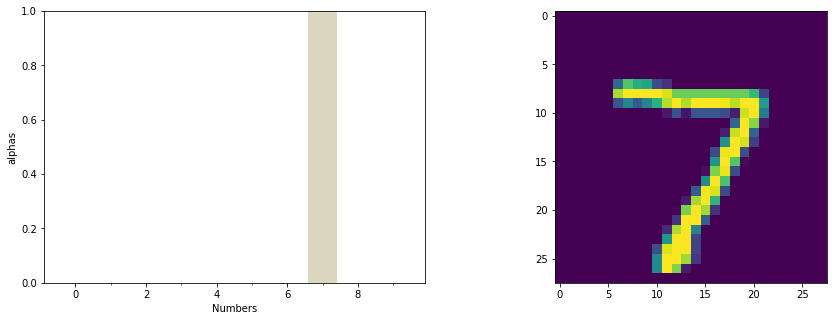

alphas:  tensor([9.1366e+08, 1.5752e+06, 1.9341e+13, 4.0307e+10, 4.3700e+03, 9.1924e+09,
        2.4636e-01, 6.5220e+19, 5.6766e+07, 6.8954e+11])
compare pred, true:  tensor([7]) tensor([7])
out:  tensor([2])


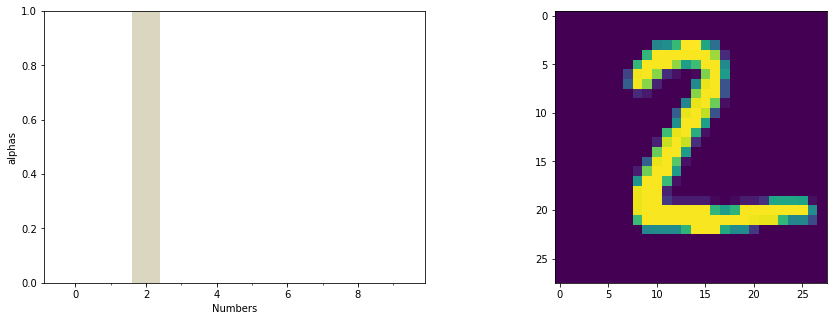

alphas:  tensor([2.0181e+08, 1.6230e+12, 1.0955e+16, 1.8907e+08, 5.2839e-01, 2.2934e+10,
        8.7141e+06, 1.3562e+01, 1.7260e+09, 8.4690e-02])
compare pred, true:  tensor([2]) tensor([2])
out:  tensor([1])


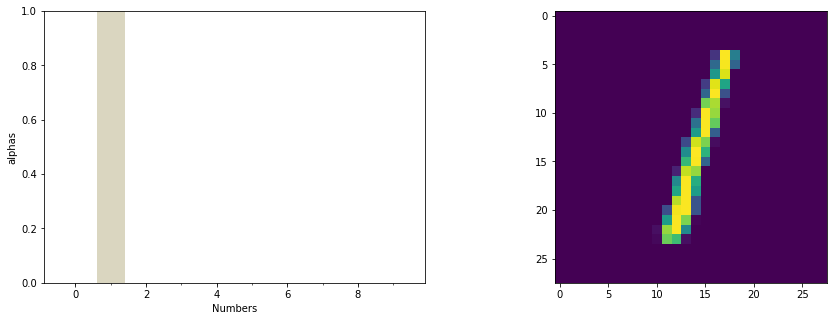

alphas:  tensor([7.9504e-01, 2.0300e+05, 2.6578e+00, 2.3671e-01, 1.7615e+02, 1.2347e+00,
        9.8415e-01, 5.6594e+01, 8.6437e-01, 2.1690e-01])
compare pred, true:  tensor([1]) tensor([1])
out:  tensor([0])


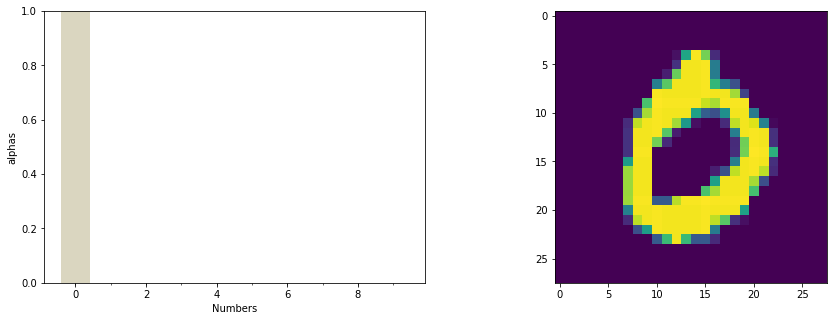

alphas:  tensor([5.9010e+09, 5.7137e-01, 9.1792e+03, 4.0525e-01, 3.0897e+01, 1.2925e+04,
        2.4483e+04, 2.9205e+03, 4.9431e+04, 5.9354e+04])
compare pred, true:  tensor([0]) tensor([0])
out:  tensor([4])


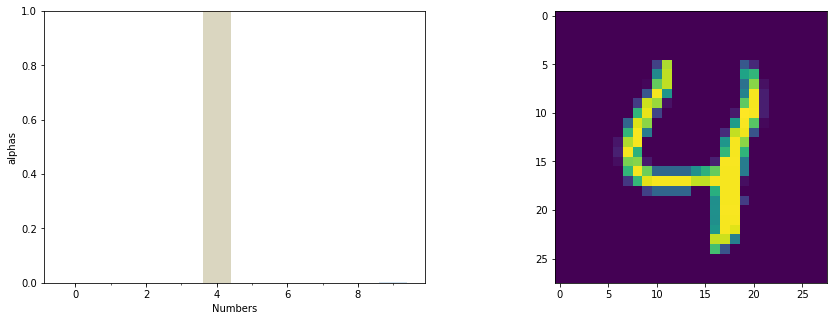

alphas:  tensor([3.3715e+00, 3.8938e-01, 3.3993e+02, 3.1360e-01, 1.4514e+08, 2.7929e+02,
        1.2575e+01, 1.0997e+03, 1.7577e+03, 2.6470e+05])
compare pred, true:  tensor([4]) tensor([4])
out:  tensor([1])


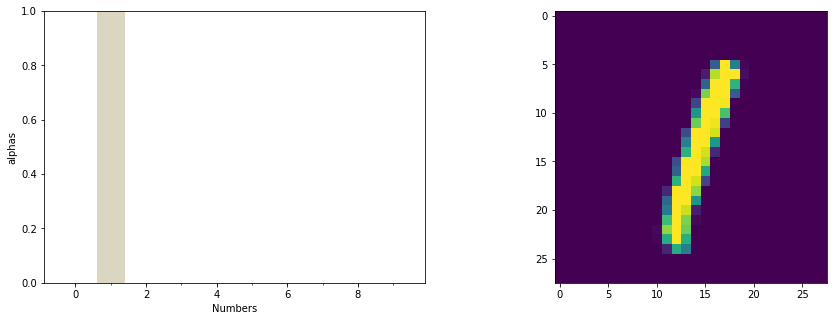

alphas:  tensor([4.9917e-01, 1.1739e+07, 1.2513e+00, 1.2925e-01, 1.7233e+03, 5.9752e-01,
        3.9518e-01, 2.0854e+03, 5.8408e-01, 1.2447e+00])
compare pred, true:  tensor([1]) tensor([1])
out:  tensor([4])


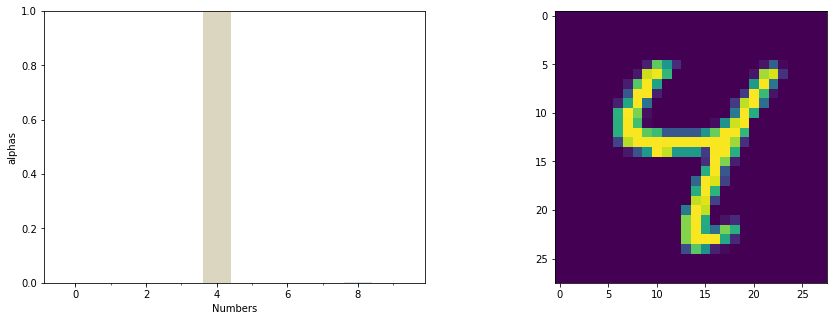

alphas:  tensor([3.5116e-01, 2.4373e+03, 5.5006e+04, 3.0015e+02, 4.8158e+12, 6.1164e+05,
        1.4771e+03, 5.3128e+06, 1.5564e+10, 6.5893e+07])
compare pred, true:  tensor([4]) tensor([4])
out:  tensor([9])


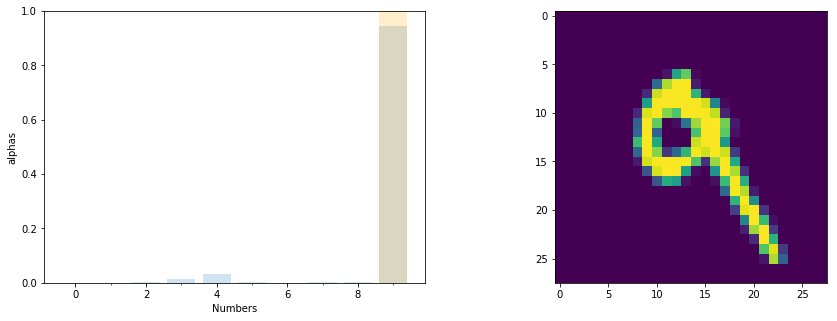

alphas:  tensor([4.9718e-01, 3.5799e+00, 3.0422e+02, 8.4786e+02, 2.2540e+03, 2.4582e+02,
        5.2113e-01, 8.3715e+01, 9.7652e+01, 6.4555e+04])
compare pred, true:  tensor([9]) tensor([9])
out:  tensor([5])


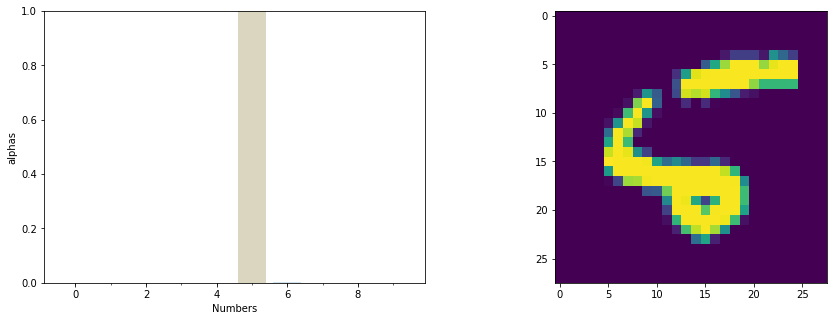

alphas:  tensor([2.7421e+03, 4.0305e-01, 8.0834e+03, 3.5582e+00, 2.6923e+03, 6.5663e+08,
        7.4746e+05, 1.8384e-01, 3.7810e+04, 1.2863e+02])
compare pred, true:  tensor([5]) tensor([5])
out:  tensor([9])


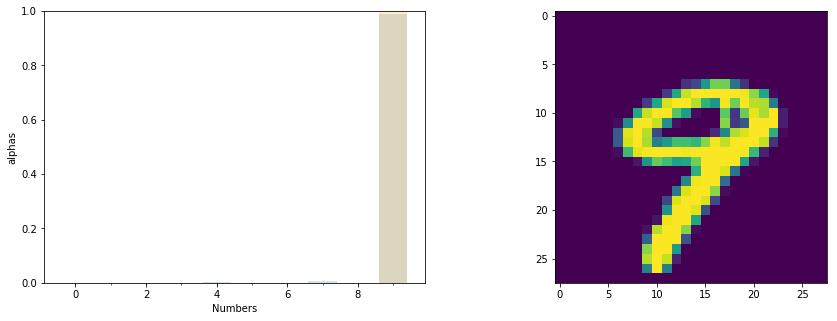

alphas:  tensor([3.5993e+00, 7.0081e-01, 5.3309e+02, 3.4694e+03, 2.8422e+04, 4.2788e+03,
        3.8188e-01, 1.8492e+05, 1.6328e+04, 2.3363e+07])
compare pred, true:  tensor([9]) tensor([9])
out:  tensor([0])


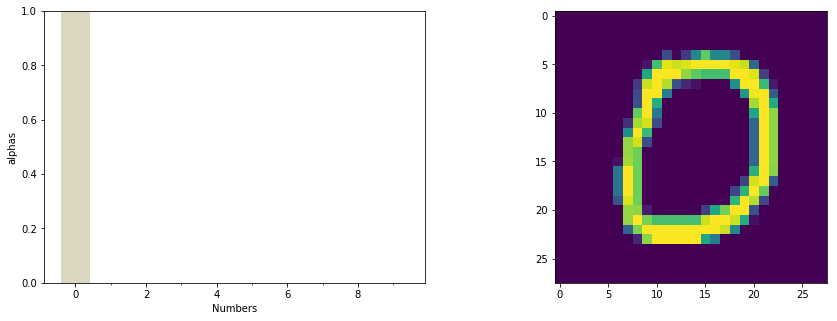

alphas:  tensor([1.6404e+16, 1.9683e-01, 4.9265e+07, 1.4803e+00, 3.4418e+00, 1.1766e+09,
        3.5771e+06, 5.3957e+02, 1.8727e+08, 4.1657e+05])
compare pred, true:  tensor([0]) tensor([0])
out:  tensor([6])


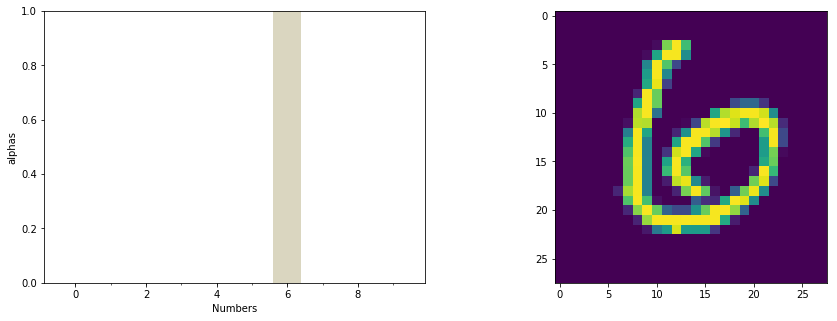

alphas:  tensor([3.3939e+07, 4.7826e-01, 2.5349e+02, 6.3189e+00, 2.2176e+01, 3.2474e+06,
        3.2762e+11, 4.4295e-01, 4.8888e+05, 2.5504e+00])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([9])


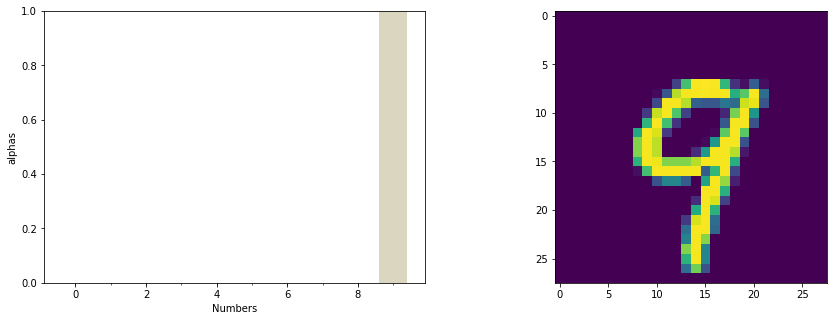

alphas:  tensor([1.4025e+01, 4.7213e-01, 7.3092e+02, 1.2273e+03, 2.7921e+05, 1.1231e+04,
        3.4662e-01, 3.1293e+05, 7.2039e+03, 4.5068e+08])
compare pred, true:  tensor([9]) tensor([9])
out:  tensor([0])


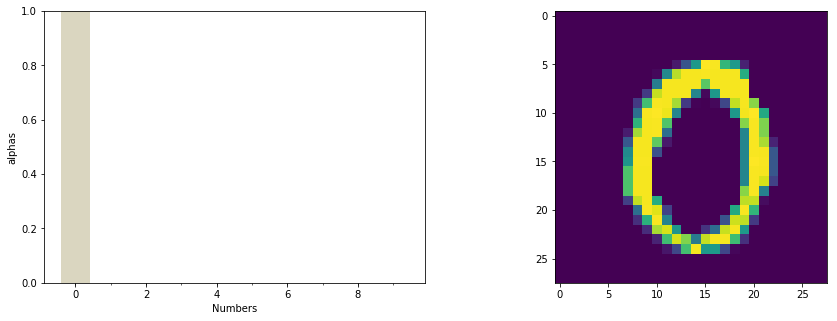

alphas:  tensor([2.0258e+15, 3.0465e-01, 2.0885e+06, 1.2190e-01, 7.6721e+03, 2.3188e+08,
        1.8033e+05, 6.8003e+07, 1.0705e+09, 9.3338e+08])
compare pred, true:  tensor([0]) tensor([0])
out:  tensor([1])


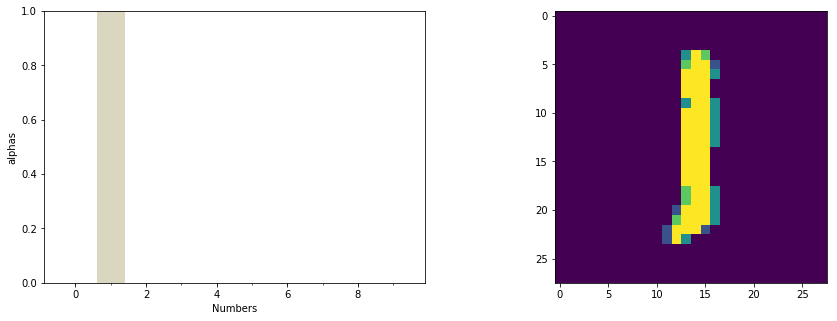

alphas:  tensor([4.7241e-01, 1.1472e+05, 2.9639e-01, 1.2374e-01, 8.6407e+00, 2.5824e-01,
        3.4659e-01, 4.7226e-01, 3.4303e-01, 7.3412e-02])
compare pred, true:  tensor([1]) tensor([1])
out:  tensor([5])


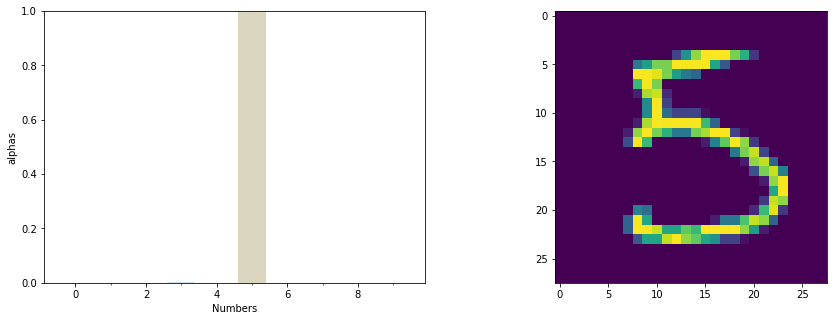

alphas:  tensor([1.4171e-01, 5.3176e-01, 1.7419e+00, 1.1507e+02, 2.0824e-01, 4.1483e+04,
        1.0641e-01, 7.0728e-01, 6.2979e-01, 1.2441e-01])
compare pred, true:  tensor([5]) tensor([5])
out:  tensor([9])


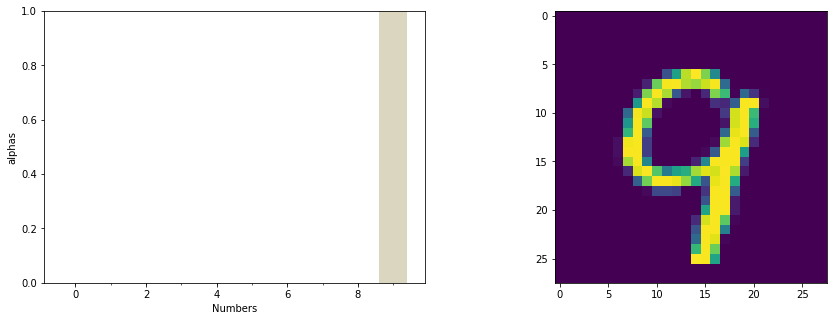

alphas:  tensor([2.4287e+02, 3.0308e-01, 1.0196e+03, 1.3070e+01, 3.7169e+05, 1.5739e+03,
        3.0745e-01, 3.0275e+05, 1.2449e+06, 8.5031e+09])
compare pred, true:  tensor([9]) tensor([9])
out:  tensor([7])


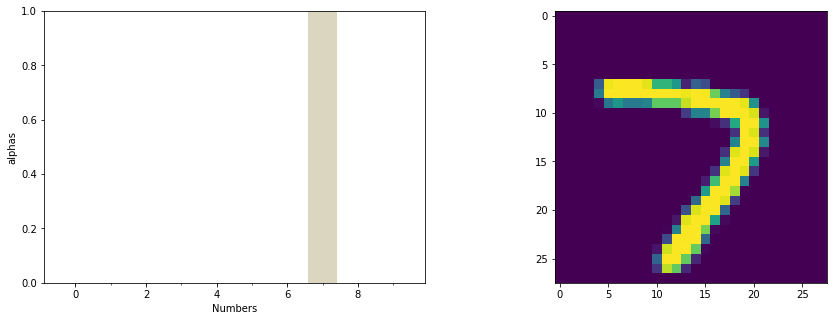

alphas:  tensor([3.1363e+09, 1.1624e+04, 1.8543e+13, 3.6077e+09, 3.3855e+02, 1.5708e+10,
        1.8103e-01, 5.2893e+18, 5.3126e+05, 1.9564e+10])
compare pred, true:  tensor([7]) tensor([7])
out:  tensor([3])


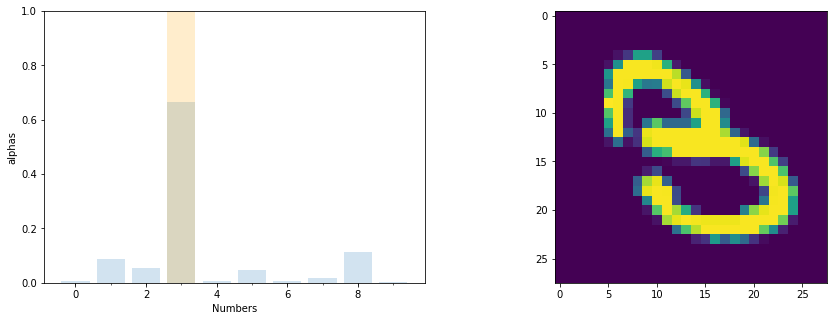

alphas:  tensor([ 0.6241,  8.2784,  5.1250, 64.0431,  0.6399,  4.4246,  0.5089,  1.7436,
        10.8340,  0.2389])
compare pred, true:  tensor([3]) tensor([3])
out:  tensor([4])


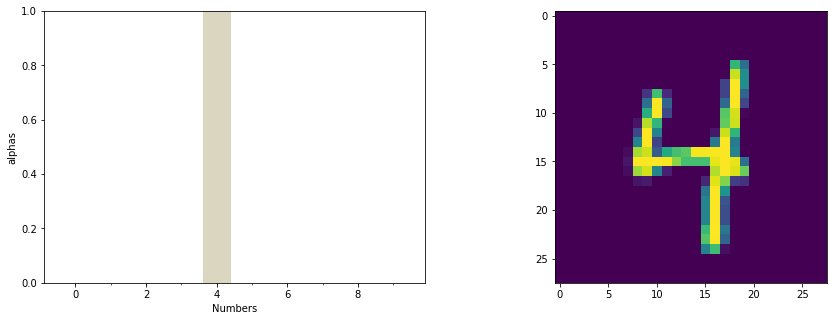

alphas:  tensor([2.9579e-01, 2.4674e+01, 9.7542e+01, 2.3883e-01, 3.5522e+09, 1.4780e+02,
        3.2544e+00, 1.5084e+04, 1.2381e+00, 1.4741e+02])
compare pred, true:  tensor([4]) tensor([4])
out:  tensor([9])


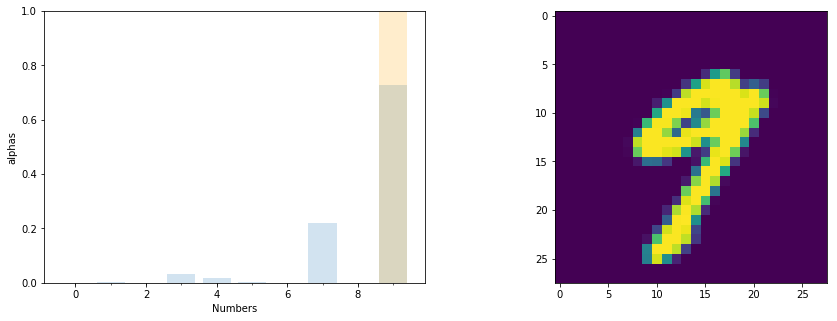

alphas:  tensor([5.9472e+01, 5.7461e+03, 7.4363e+02, 1.1061e+05, 5.3641e+04, 9.9178e+03,
        1.3620e+00, 7.2412e+05, 5.2876e+02, 2.4127e+06])
compare pred, true:  tensor([9]) tensor([9])
out:  tensor([6])


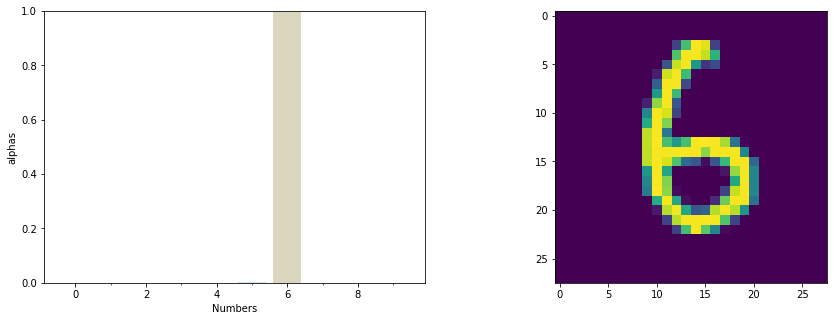

alphas:  tensor([1.3598e+04, 1.5496e+02, 9.3311e+04, 1.5143e+02, 1.9582e+04, 2.9125e+09,
        6.3258e+11, 3.0655e-01, 7.1096e+07, 2.6627e+00])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([6])


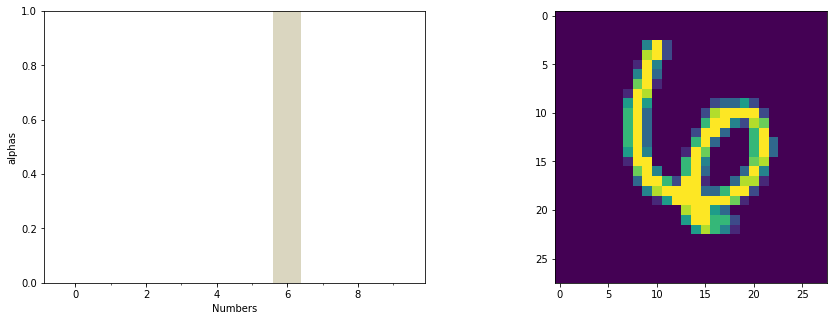

alphas:  tensor([3.6351e+03, 6.1444e-01, 1.0723e+00, 3.7171e-01, 7.7378e+01, 4.5899e+02,
        6.1160e+07, 6.9911e-01, 8.9075e+02, 1.2011e+00])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([5])


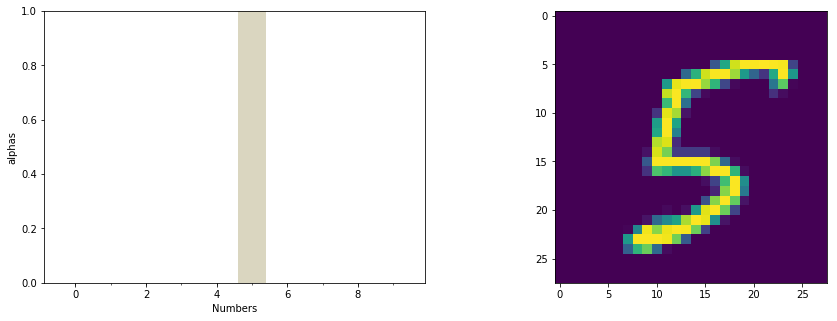

alphas:  tensor([4.3067e+00, 1.6962e+00, 1.8302e+02, 5.1687e+05, 1.0070e+04, 3.2944e+11,
        2.9911e+02, 1.0170e-01, 2.6091e+03, 6.4054e+02])
compare pred, true:  tensor([5]) tensor([5])
out:  tensor([4])


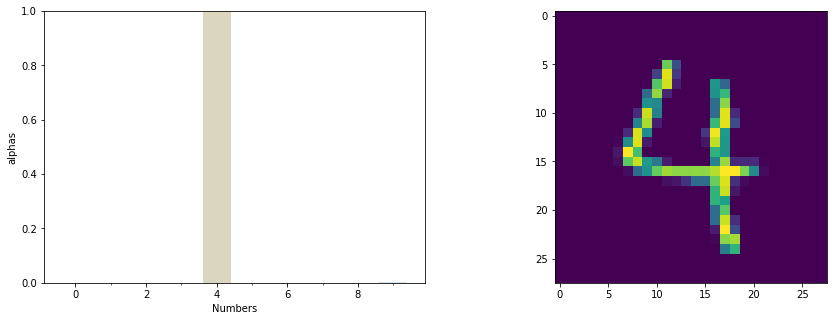

alphas:  tensor([5.7922e-01, 6.4783e-01, 7.2310e+00, 5.8897e-01, 3.3716e+04, 6.3367e+00,
        1.1157e+00, 2.0218e+01, 2.6733e+00, 4.7783e+01])
compare pred, true:  tensor([4]) tensor([4])
out:  tensor([0])


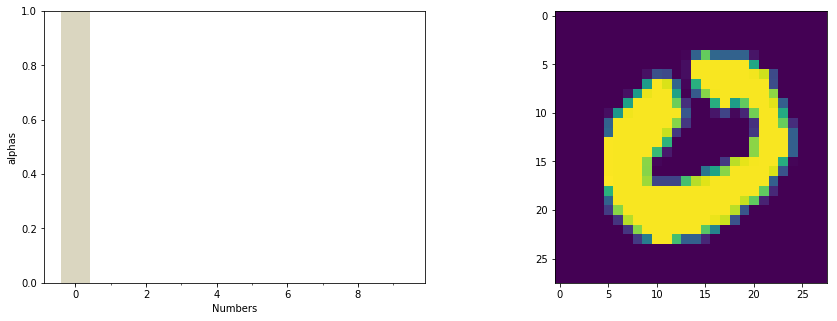

alphas:  tensor([5.8838e+08, 7.1161e-01, 1.0521e+04, 4.5070e-01, 9.0423e+01, 1.2817e+05,
        5.4950e+04, 3.3327e+01, 5.4989e+05, 2.0142e+04])
compare pred, true:  tensor([0]) tensor([0])
out:  tensor([7])


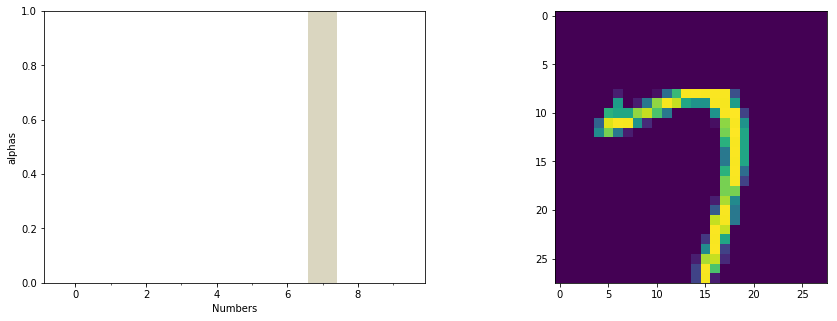

alphas:  tensor([4.2584e+06, 2.3866e+03, 1.8823e+10, 4.6066e+07, 1.2082e+05, 4.5532e+08,
        3.8682e-01, 6.8970e+15, 6.5660e+05, 1.3600e+11])
compare pred, true:  tensor([7]) tensor([7])
out:  tensor([4])


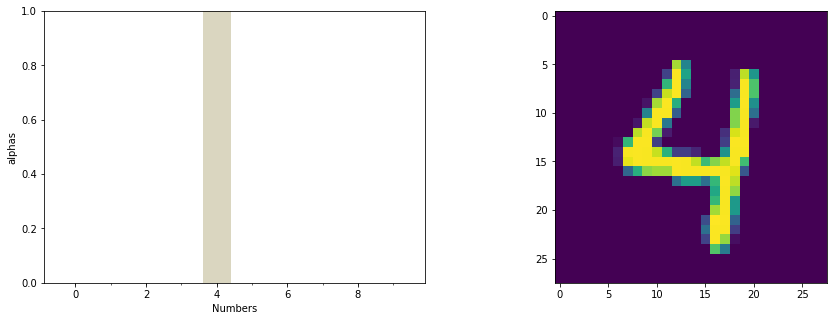

alphas:  tensor([1.4986e-01, 2.2462e-01, 4.1814e+02, 1.3594e-01, 3.7413e+10, 1.3030e+03,
        1.6944e-01, 6.1298e+02, 2.6645e+00, 7.4704e+04])
compare pred, true:  tensor([4]) tensor([4])
out:  tensor([0])


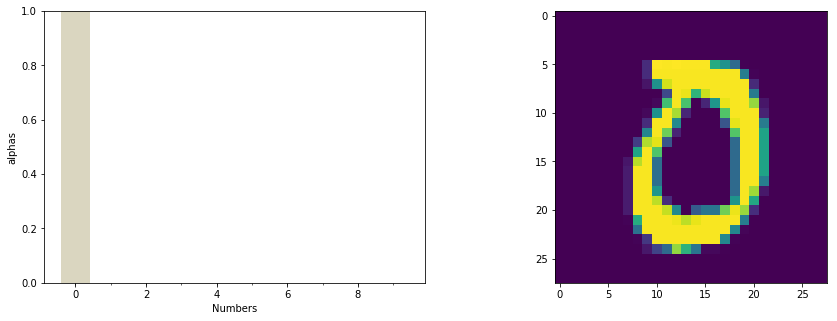

alphas:  tensor([1.3181e+09, 2.8571e-01, 8.3324e+02, 1.5164e-01, 1.5627e-01, 5.4551e+02,
        5.8163e+00, 4.3140e+01, 1.8702e+03, 2.1888e+02])
compare pred, true:  tensor([0]) tensor([0])
out:  tensor([1])


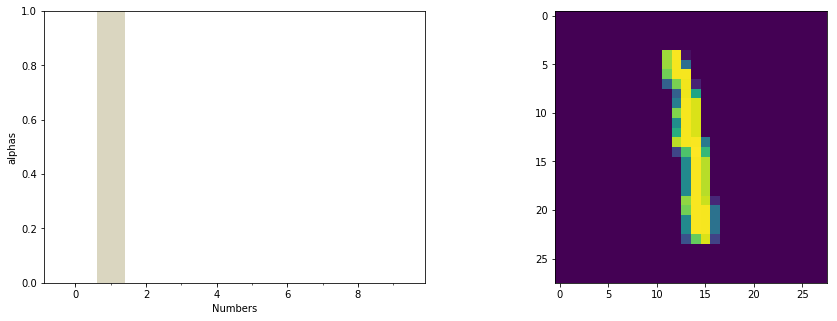

alphas:  tensor([5.9450e-01, 2.5420e+05, 3.1678e-01, 5.8645e-01, 4.1152e+01, 2.1669e+00,
        3.4880e-01, 1.4202e+00, 3.4766e+01, 1.7144e+00])
compare pred, true:  tensor([1]) tensor([1])
out:  tensor([3])


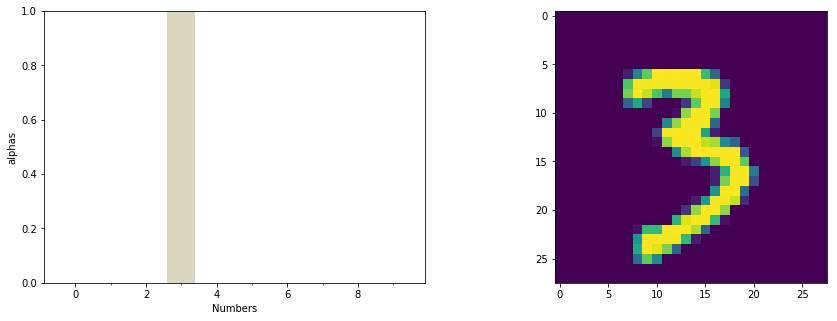

alphas:  tensor([4.4560e-01, 8.1047e+04, 1.9234e+04, 3.6171e+11, 2.8448e+02, 1.9184e+06,
        1.9108e-01, 2.8514e+03, 1.3605e+04, 4.7112e+04])
compare pred, true:  tensor([3]) tensor([3])
out:  tensor([1])


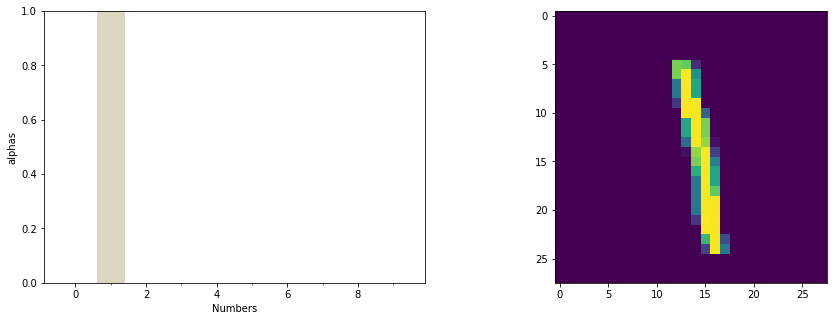

alphas:  tensor([8.4432e-01, 7.2113e+05, 1.3287e+00, 8.2499e-01, 2.1544e+02, 1.7144e+00,
        5.7134e-01, 1.5498e+02, 5.2600e+00, 3.3943e+01])
compare pred, true:  tensor([1]) tensor([1])
out:  tensor([3])


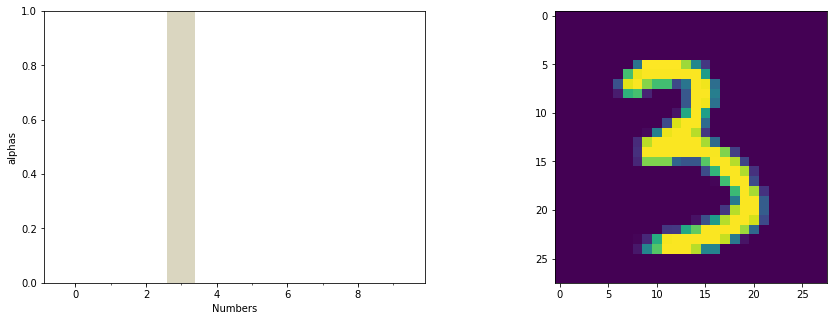

alphas:  tensor([1.9115e-01, 3.1487e+07, 1.7517e+07, 1.1182e+15, 7.5694e+03, 1.8248e+07,
        1.4971e-01, 6.4863e+04, 1.3184e+07, 1.1447e+04])
compare pred, true:  tensor([3]) tensor([3])
out:  tensor([4])


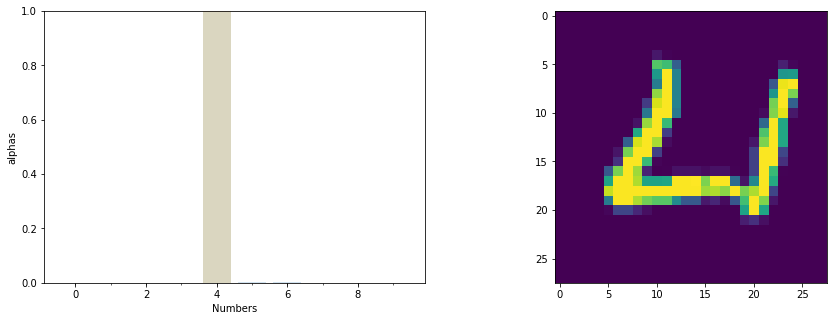

alphas:  tensor([1.4100e+05, 3.4453e-01, 5.1375e+04, 3.0129e-01, 1.3197e+08, 2.1381e+05,
        1.6508e+05, 4.0220e-01, 9.7889e+00, 7.0839e+01])
compare pred, true:  tensor([4]) tensor([4])
out:  tensor([7])


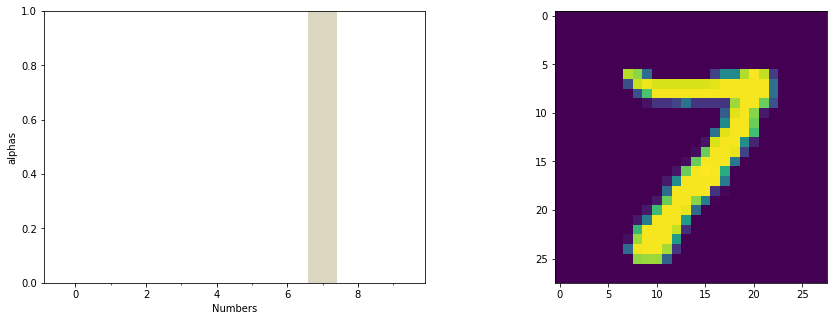

alphas:  tensor([4.0733e+05, 2.3830e+08, 3.7035e+10, 5.7160e+09, 1.5054e+03, 2.8542e+06,
        5.6304e-01, 3.7726e+16, 3.3543e+06, 1.6794e+09])
compare pred, true:  tensor([7]) tensor([7])
out:  tensor([2])


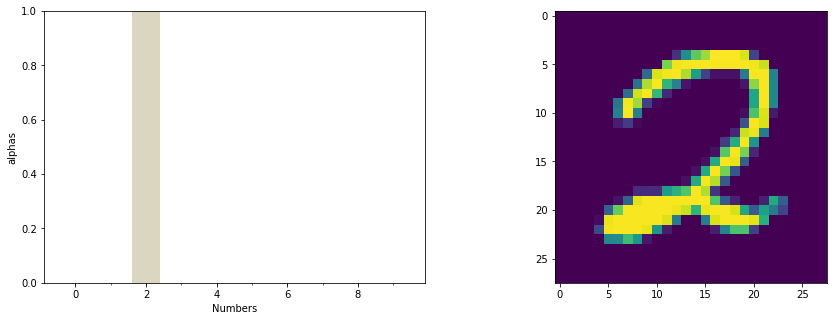

alphas:  tensor([9.6657e+00, 1.9447e+04, 3.8551e+08, 1.1672e+03, 2.1097e-01, 3.1612e+02,
        1.6130e-01, 1.4452e+00, 1.0053e+03, 1.0772e-01])
compare pred, true:  tensor([2]) tensor([2])
out:  tensor([7])


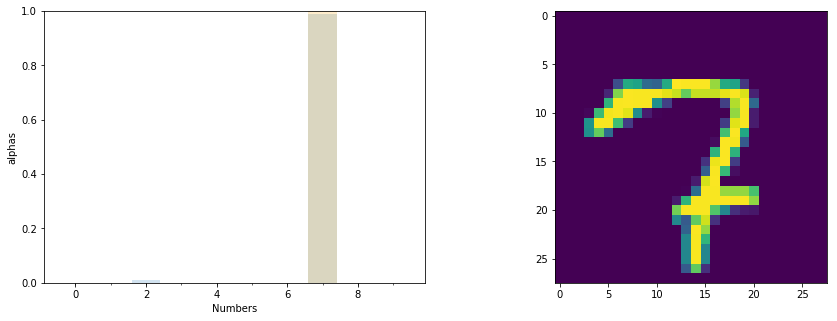

alphas:  tensor([1.1671e+05, 7.1074e+05, 8.2315e+10, 1.4284e+09, 6.5237e+01, 3.3922e+05,
        5.2779e-01, 8.2842e+12, 1.9115e+06, 1.0807e+07])
compare pred, true:  tensor([7]) tensor([7])
out:  tensor([1])


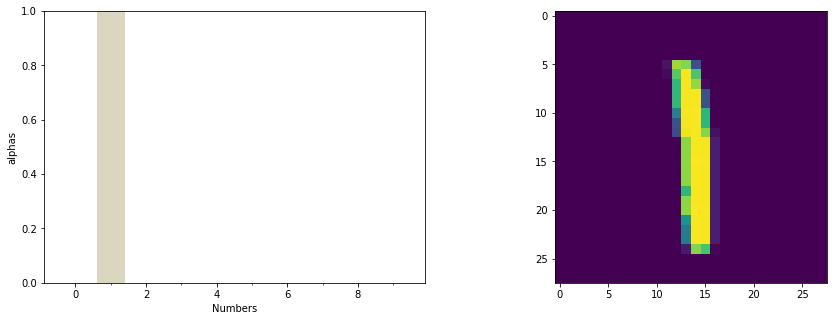

alphas:  tensor([5.0724e-01, 4.6578e+06, 6.0396e-01, 1.6603e-01, 2.7963e+02, 8.1196e-01,
        3.4329e-01, 1.2934e+02, 1.4961e+01, 1.3942e+01])
compare pred, true:  tensor([1]) tensor([1])
out:  tensor([2])


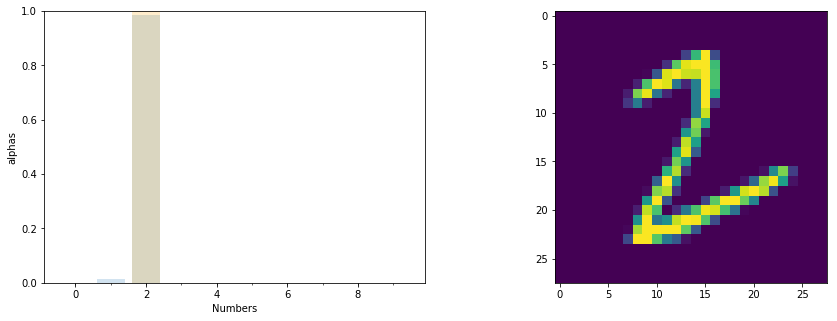

alphas:  tensor([1.5351e+04, 2.1442e+07, 1.5314e+09, 1.7108e+06, 4.4552e-01, 2.0007e+05,
        4.0849e+01, 5.1265e+01, 7.5037e+05, 1.6397e-01])
compare pred, true:  tensor([2]) tensor([2])
out:  tensor([1])


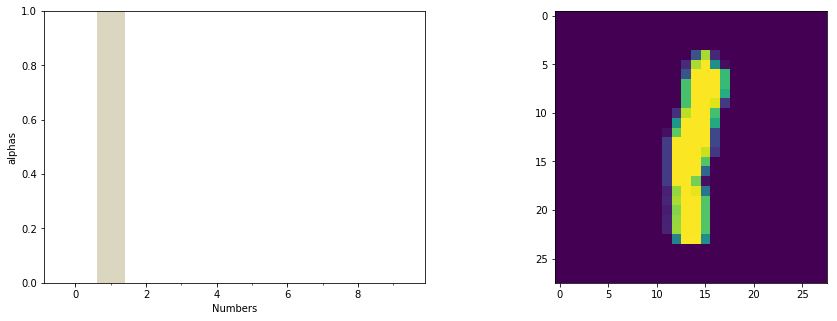

alphas:  tensor([4.5500e-01, 4.5187e+04, 1.6248e-01, 1.3577e-01, 1.7161e+01, 3.5471e-01,
        3.3120e-01, 3.9083e-01, 1.7350e+00, 8.0185e-02])
compare pred, true:  tensor([1]) tensor([1])
out:  tensor([1])


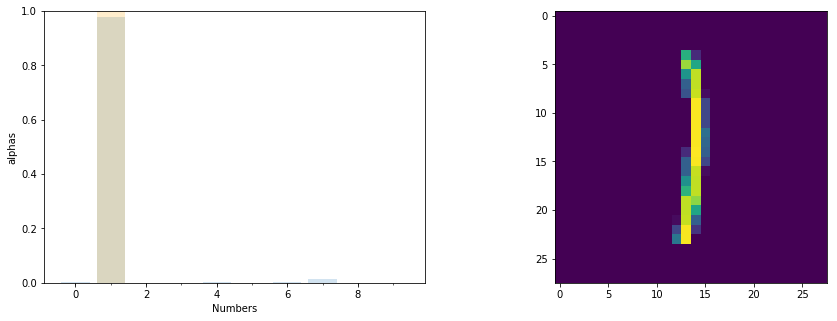

alphas:  tensor([1.9506e+00, 1.3225e+03, 8.1607e-01, 4.2598e-01, 5.5735e+00, 8.5569e-01,
        1.6043e+00, 1.7043e+01, 1.1183e+00, 1.4834e+00])
compare pred, true:  tensor([1]) tensor([1])
out:  tensor([7])


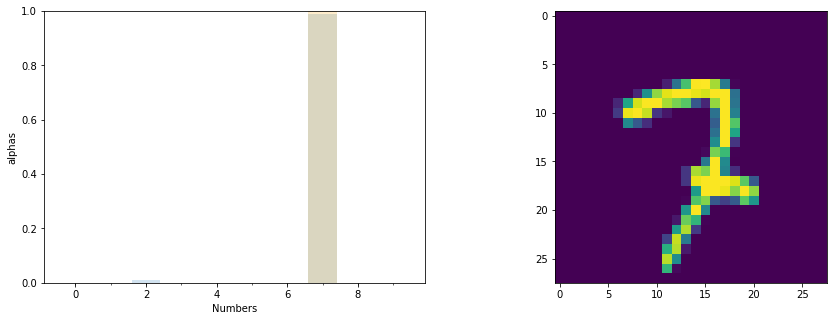

alphas:  tensor([2.3697e+04, 3.3262e+08, 1.7807e+12, 9.9669e+10, 2.4216e+03, 1.8377e+06,
        6.4164e-01, 1.5613e+14, 1.4518e+06, 8.9497e+07])
compare pred, true:  tensor([7]) tensor([7])
out:  tensor([4])


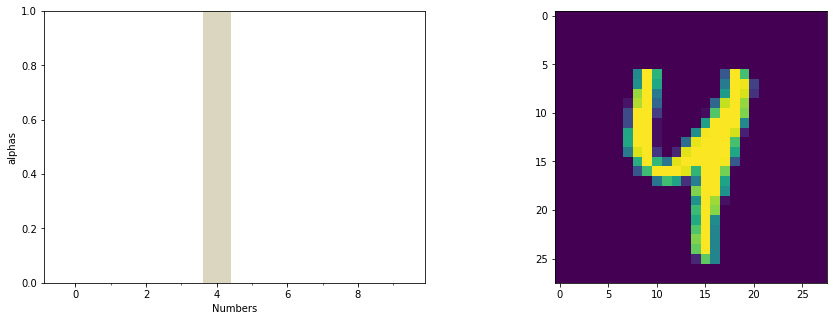

alphas:  tensor([2.5505e-01, 5.4215e+02, 5.6146e-01, 1.8854e-01, 2.5740e+10, 3.4225e+01,
        1.6742e+00, 9.7009e+04, 8.0828e+01, 6.2730e+04])
compare pred, true:  tensor([4]) tensor([4])
out:  tensor([2])


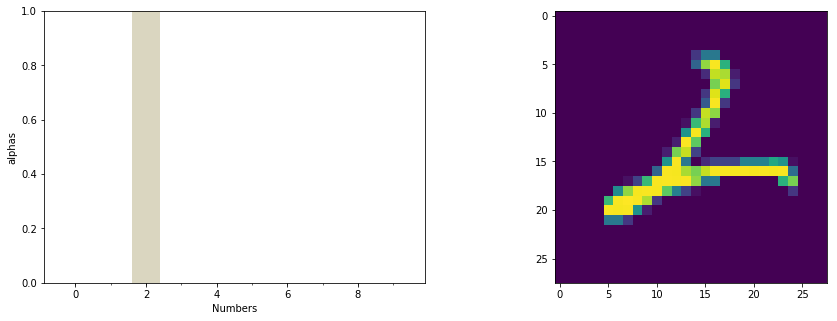

alphas:  tensor([4.0126e-01, 7.6234e+04, 1.8554e+08, 5.0170e+01, 1.5751e+04, 2.2151e+03,
        2.4626e+02, 8.9322e+02, 5.7272e+01, 1.0479e-01])
compare pred, true:  tensor([2]) tensor([2])
out:  tensor([3])


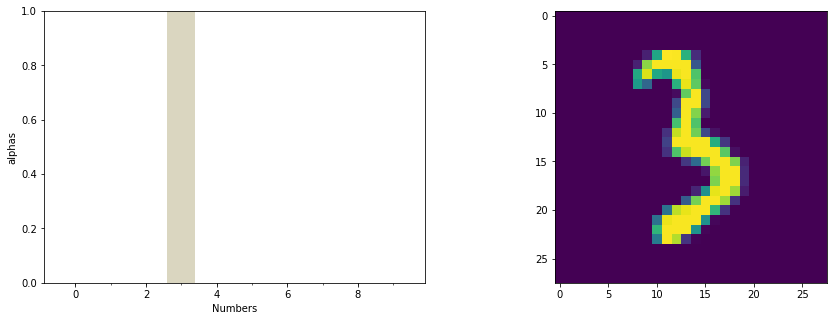

alphas:  tensor([2.8304e-01, 1.6118e+03, 1.4100e+01, 4.0429e+07, 8.7093e+00, 2.4984e+03,
        2.2203e-01, 1.5004e-01, 1.5272e+02, 9.1242e-01])
compare pred, true:  tensor([3]) tensor([3])
out:  tensor([5])


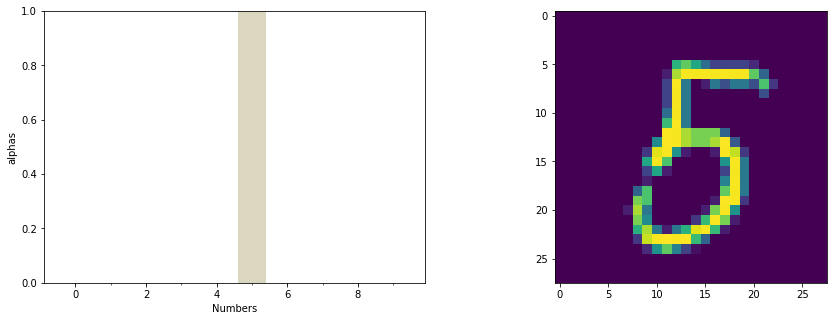

alphas:  tensor([1.8184e-01, 2.2377e-01, 3.6092e-01, 1.3804e+02, 2.1133e-01, 5.4444e+06,
        2.2147e-01, 1.1874e-01, 7.5958e+00, 4.4571e-01])
compare pred, true:  tensor([5]) tensor([5])
out:  tensor([1])


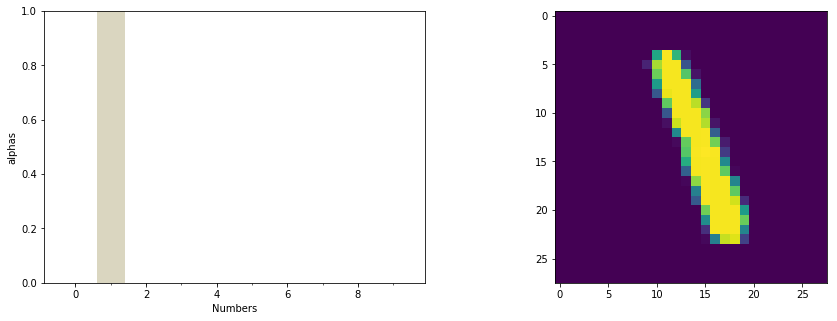

alphas:  tensor([6.0234e-01, 2.1200e+07, 3.1751e+02, 7.7679e+02, 6.1198e+02, 2.6129e+01,
        3.6522e-01, 1.3260e+02, 1.0348e+03, 2.9410e+01])
compare pred, true:  tensor([1]) tensor([1])
out:  tensor([2])


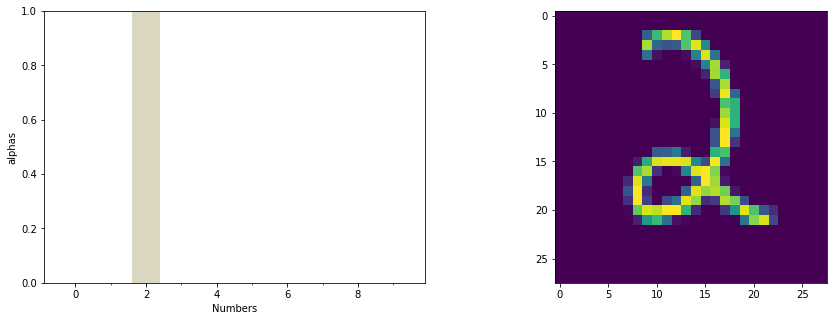

alphas:  tensor([4.5238e+00, 2.5096e+03, 2.7991e+08, 2.9227e+02, 9.9785e+00, 1.0204e+03,
        3.5966e+00, 5.1098e-01, 2.9430e+02, 1.3134e-01])
compare pred, true:  tensor([2]) tensor([2])
out:  tensor([4])


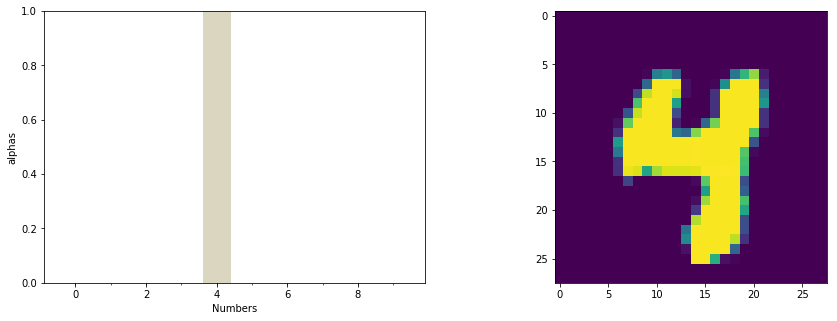

alphas:  tensor([3.1680e-01, 4.4853e-01, 2.5021e+00, 2.0120e-01, 6.2098e+06, 6.1908e+01,
        3.4222e-01, 2.4313e+02, 1.3247e+01, 3.6268e+02])
compare pred, true:  tensor([4]) tensor([4])
out:  tensor([4])


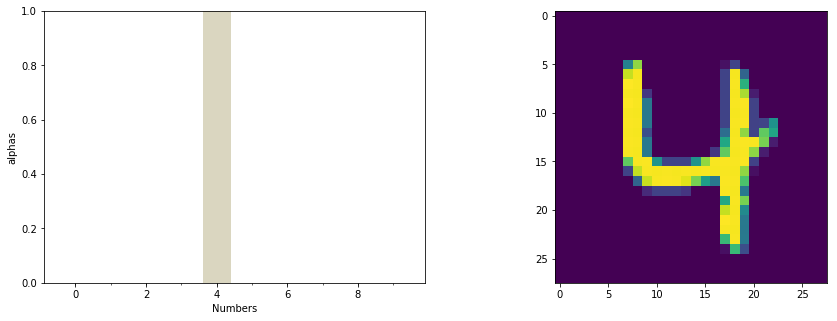

alphas:  tensor([9.8040e+00, 2.6394e-01, 9.3286e+02, 1.9944e-01, 1.8017e+11, 8.5671e+03,
        1.2386e+02, 3.0256e+04, 3.1384e+04, 9.8151e+06])
compare pred, true:  tensor([4]) tensor([4])
out:  tensor([6])


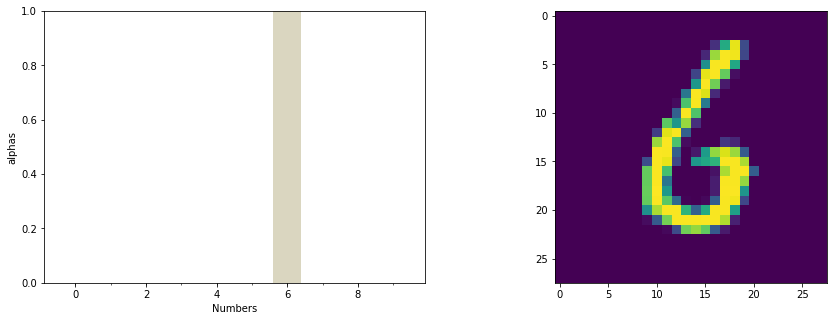

alphas:  tensor([3.5817e+05, 3.2147e+02, 4.8030e+03, 1.8353e+02, 1.5513e+03, 7.7852e+06,
        1.5899e+10, 9.8103e-01, 8.4190e+04, 6.8320e-01])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([3])


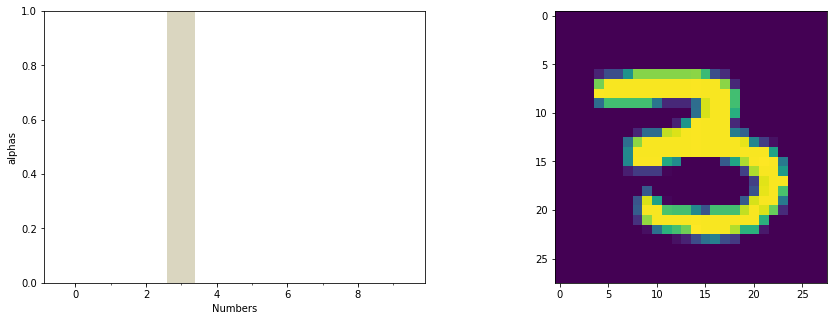

alphas:  tensor([4.6329e-01, 7.0310e+03, 2.0715e+04, 3.0068e+07, 9.7430e-01, 4.1584e+03,
        3.2224e-01, 2.4009e+04, 1.5210e+02, 2.0274e+01])
compare pred, true:  tensor([3]) tensor([3])
out:  tensor([5])


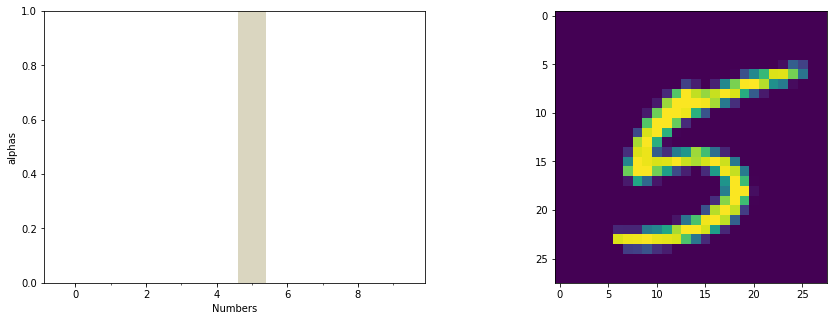

alphas:  tensor([1.4141e-01, 1.9261e-01, 1.0300e+00, 6.0737e+02, 3.8986e+00, 8.9017e+08,
        9.1395e-02, 1.3103e-01, 4.4719e+00, 3.1122e+02])
compare pred, true:  tensor([5]) tensor([5])
out:  tensor([5])


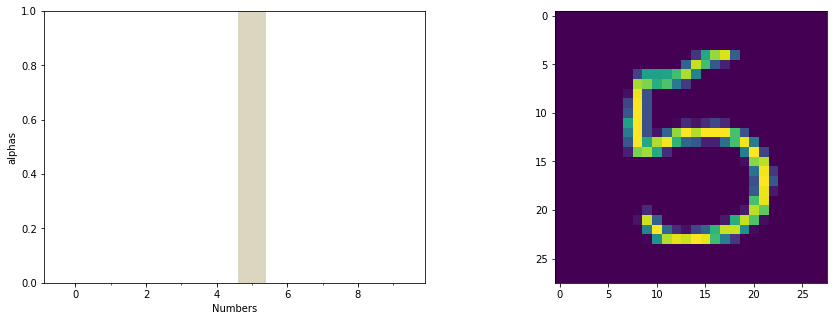

alphas:  tensor([1.1680e-01, 2.9761e-01, 4.4408e-01, 2.1559e+01, 2.9444e+00, 2.6892e+05,
        1.0694e-01, 5.5859e-01, 1.8687e+00, 4.5739e+00])
compare pred, true:  tensor([5]) tensor([5])
out:  tensor([6])


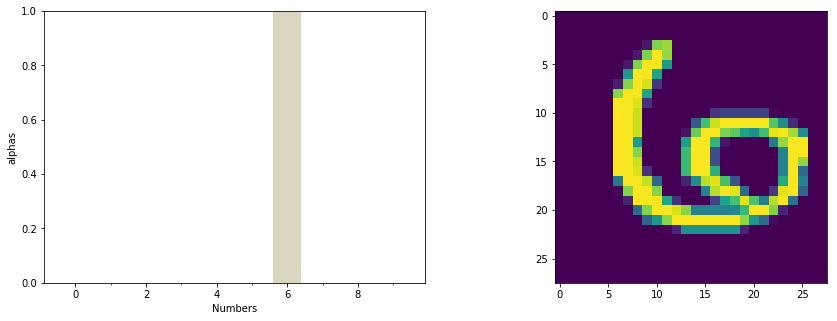

alphas:  tensor([9.3735e+05, 3.9812e-01, 4.2157e+01, 2.9359e-01, 1.9281e+02, 4.1521e+05,
        2.2723e+12, 3.8722e-01, 2.4090e+06, 4.9791e+00])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([0])


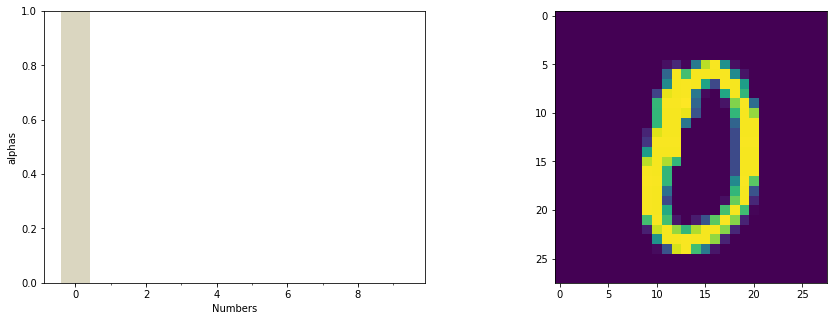

alphas:  tensor([8.1148e+08, 4.7524e-01, 1.4686e+03, 1.5201e-01, 8.4695e-01, 3.8991e+04,
        8.2773e+02, 1.9655e+01, 3.9217e+05, 2.0144e+02])
compare pred, true:  tensor([0]) tensor([0])
out:  tensor([4])


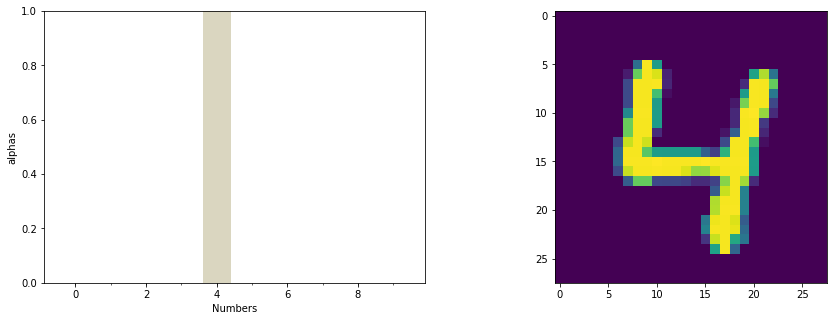

alphas:  tensor([2.7373e-01, 3.1825e-01, 3.5150e+03, 1.7772e-01, 1.1691e+11, 2.6423e+04,
        2.0304e+01, 9.7327e+03, 1.2577e+03, 3.6274e+04])
compare pred, true:  tensor([4]) tensor([4])
out:  tensor([1])


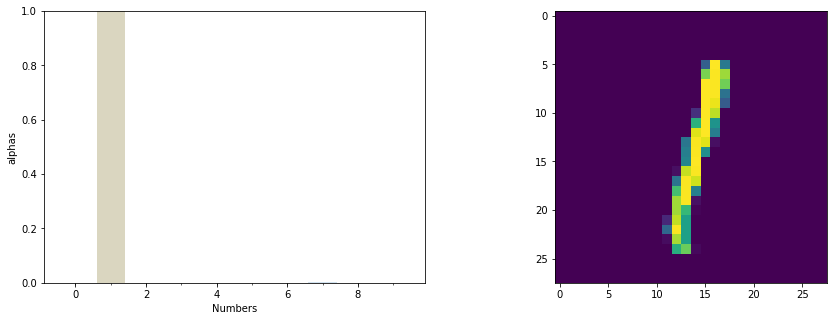

alphas:  tensor([7.0124e-01, 3.9024e+05, 1.6616e+00, 1.5933e-01, 6.4880e+01, 5.7651e-01,
        5.2324e-01, 5.6818e+02, 6.9727e-01, 8.0426e-01])
compare pred, true:  tensor([1]) tensor([1])
out:  tensor([9])


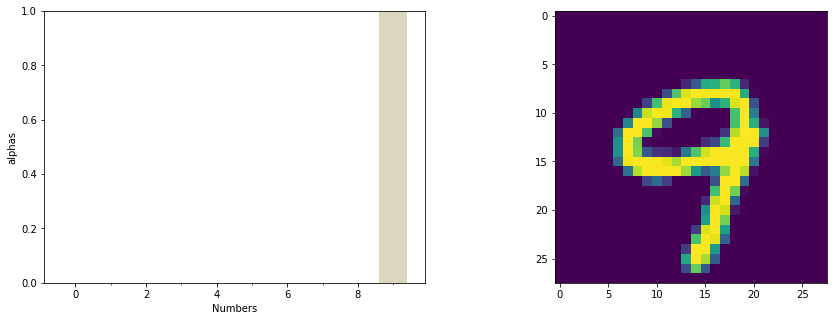

alphas:  tensor([1.3417e+02, 2.9396e-01, 4.3217e+04, 6.7484e+03, 7.3153e+07, 6.8940e+05,
        1.8999e-01, 6.5243e+06, 9.2146e+04, 1.9272e+11])
compare pred, true:  tensor([9]) tensor([9])
out:  tensor([5])


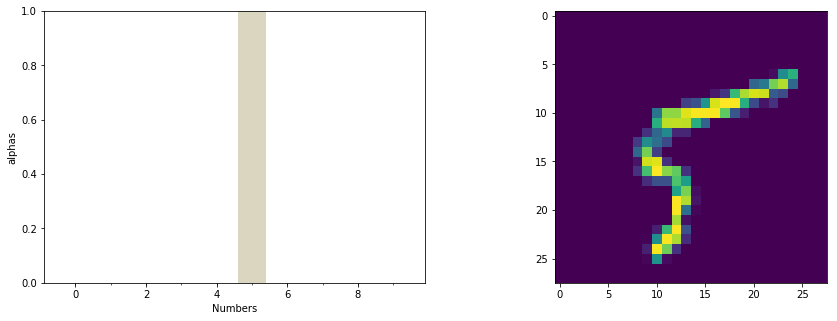

alphas:  tensor([3.5371e-01, 2.7195e-01, 1.1631e-01, 4.6795e-01, 1.5194e-01, 9.2897e+05,
        9.4913e-02, 6.2609e+01, 4.6125e+00, 1.0261e+02])
compare pred, true:  tensor([5]) tensor([5])
out:  tensor([7])


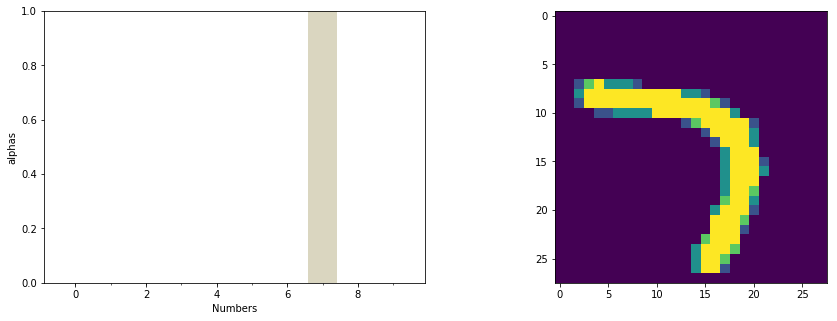

alphas:  tensor([5.4353e+03, 2.8652e+03, 8.4506e+08, 1.2060e+08, 4.5014e+04, 9.8402e+10,
        1.6786e-01, 7.0868e+14, 2.4484e+04, 8.8464e+09])
compare pred, true:  tensor([7]) tensor([7])
out:  tensor([8])


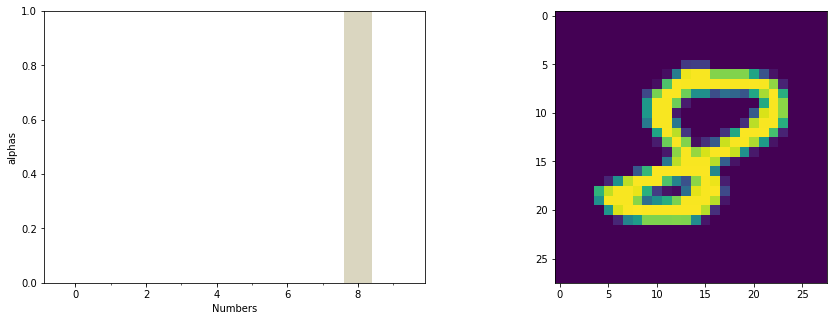

alphas:  tensor([4.0213e+00, 4.2514e-01, 9.7437e+02, 2.4647e+02, 2.0670e-01, 3.3275e+03,
        1.3255e+00, 1.2617e-01, 6.7683e+06, 1.2316e+01])
compare pred, true:  tensor([8]) tensor([8])
out:  tensor([9])


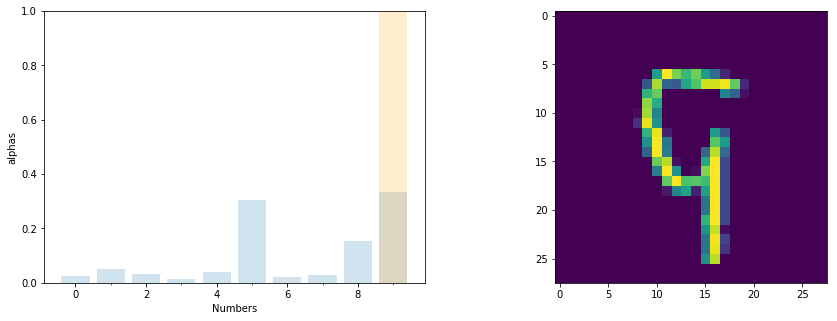

alphas:  tensor([0.6641, 1.2789, 0.7928, 0.3217, 1.0282, 7.8380, 0.5520, 0.7491, 3.9607,
        8.5604])
compare pred, true:  tensor([9]) tensor([9])
out:  tensor([3])


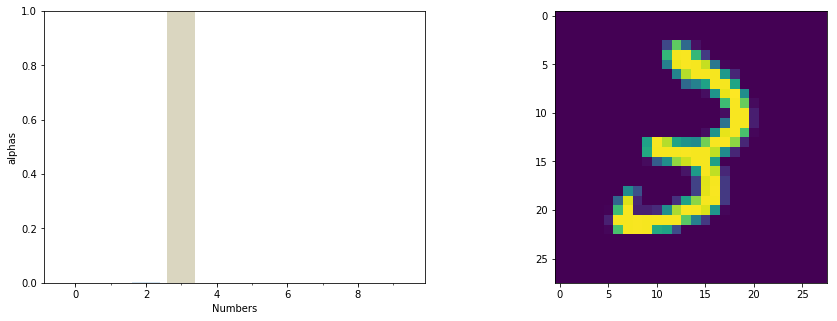

alphas:  tensor([3.5428e+01, 3.5828e+03, 5.9846e+05, 1.4445e+08, 2.6000e+01, 3.8332e+03,
        3.9737e-01, 1.2391e+03, 5.6250e+04, 3.0758e+03])
compare pred, true:  tensor([3]) tensor([3])
out:  tensor([7])


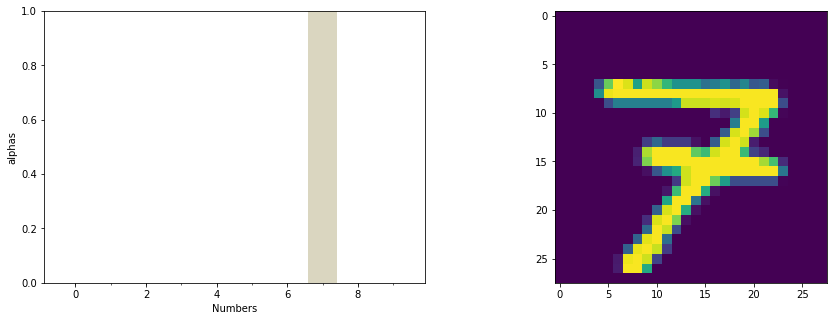

alphas:  tensor([2.6045e+03, 2.9253e+05, 1.8083e+09, 6.8704e+08, 1.0398e+04, 5.6788e+06,
        6.0852e-01, 3.5193e+14, 1.6843e+04, 9.6882e+06])
compare pred, true:  tensor([7]) tensor([7])
out:  tensor([4])


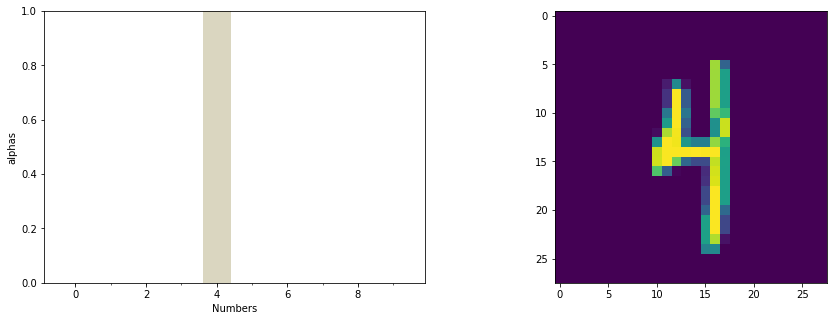

alphas:  tensor([9.7263e-01, 2.6191e+03, 2.0404e+01, 4.7741e+02, 2.4330e+07, 1.4177e+03,
        1.1809e+00, 9.4266e+01, 4.9622e+01, 7.5386e+03])
compare pred, true:  tensor([4]) tensor([4])
out:  tensor([6])


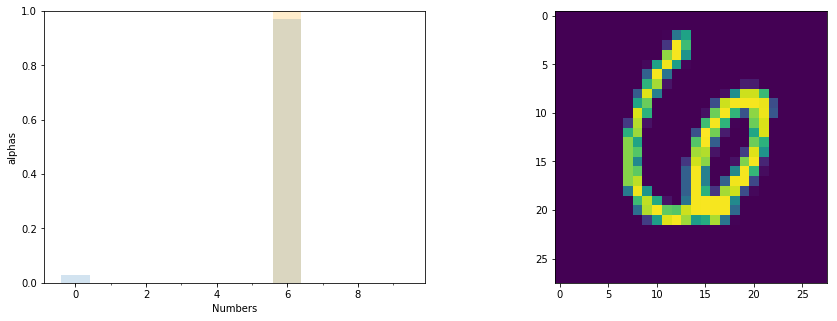

alphas:  tensor([5.1111e+03, 9.2158e-01, 8.6338e-01, 8.8980e-01, 3.7680e+00, 1.4082e+02,
        1.7215e+05, 1.1746e+00, 8.3038e+01, 1.0322e+00])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([4])


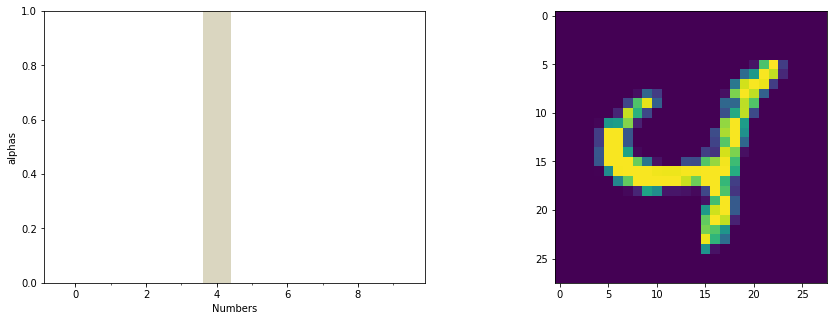

alphas:  tensor([3.9719e-01, 3.4153e-01, 5.5162e+02, 2.7279e-01, 2.4417e+08, 4.2833e+02,
        5.1664e+00, 5.6892e+01, 7.6872e+02, 6.1574e+03])
compare pred, true:  tensor([4]) tensor([4])
out:  tensor([3])


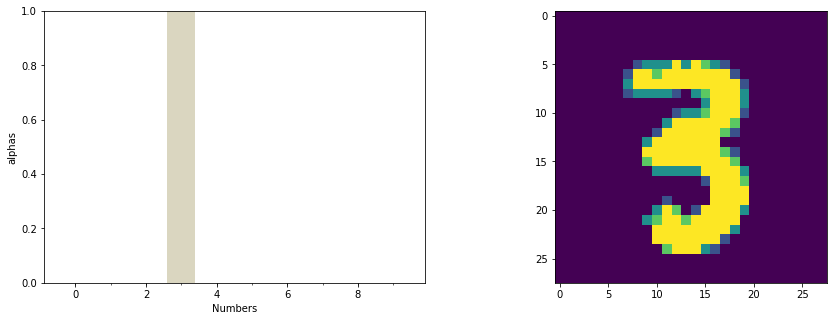

alphas:  tensor([1.7395e+01, 6.3371e+07, 3.1320e+07, 5.1199e+14, 2.1131e+03, 1.2969e+07,
        2.9291e-01, 5.2817e+07, 1.7030e+07, 1.7261e+06])
compare pred, true:  tensor([3]) tensor([3])
out:  tensor([0])


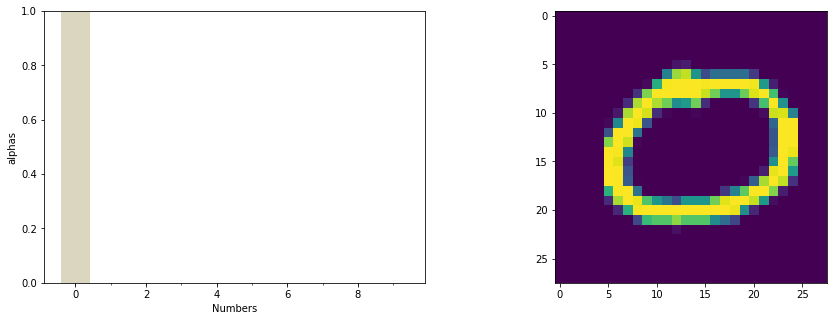

alphas:  tensor([1.2946e+13, 3.0241e-01, 1.5717e+05, 4.1267e+01, 1.4272e+01, 1.7412e+09,
        1.3870e+05, 2.1439e+03, 2.2379e+05, 7.8241e+05])
compare pred, true:  tensor([0]) tensor([0])
out:  tensor([7])


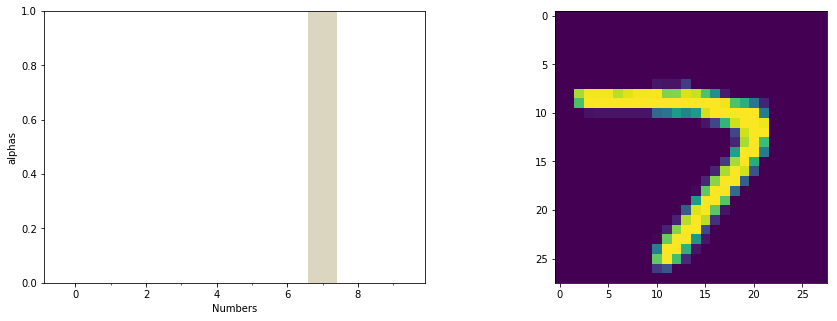

alphas:  tensor([2.7995e+07, 5.6835e+02, 1.1685e+11, 8.1662e+07, 1.8699e+02, 4.4538e+09,
        1.6442e-01, 2.5342e+16, 2.4311e+04, 8.1190e+08])
compare pred, true:  tensor([7]) tensor([7])
out:  tensor([0])


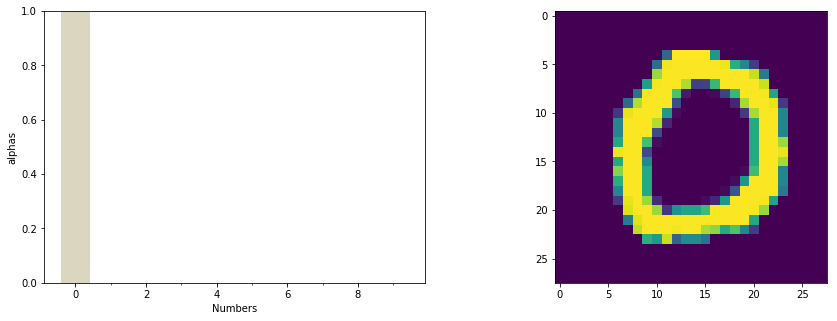

alphas:  tensor([2.5726e+21, 2.0284e-01, 3.0609e+09, 3.8775e+00, 6.4009e+03, 1.5449e+12,
        1.4735e+12, 1.6774e+05, 8.3943e+11, 2.6542e+09])
compare pred, true:  tensor([0]) tensor([0])
out:  tensor([2])


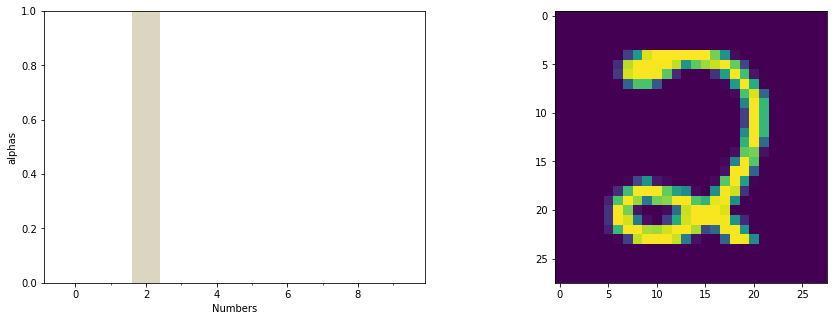

alphas:  tensor([2.3829e+07, 5.3260e+04, 7.4945e+11, 1.0188e+07, 1.5697e-01, 6.4908e+05,
        1.1421e-01, 1.7598e+04, 1.3424e+04, 1.5572e+01])
compare pred, true:  tensor([2]) tensor([2])
out:  tensor([9])


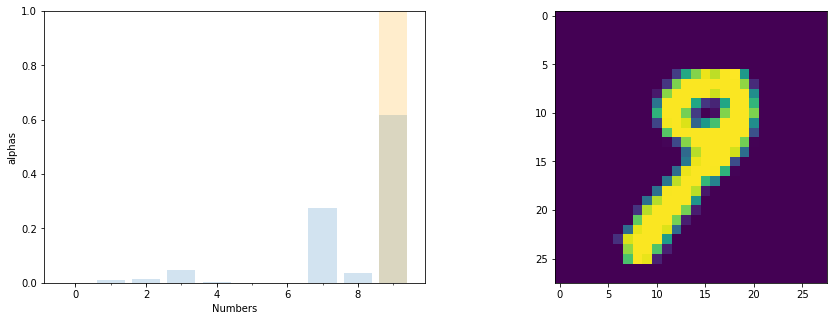

alphas:  tensor([5.2349e+01, 1.3475e+03, 2.2229e+03, 6.9053e+03, 2.5129e+02, 1.2630e+02,
        1.4004e+00, 4.1651e+04, 5.3271e+03, 9.3100e+04])
compare pred, true:  tensor([9]) tensor([9])
out:  tensor([1])


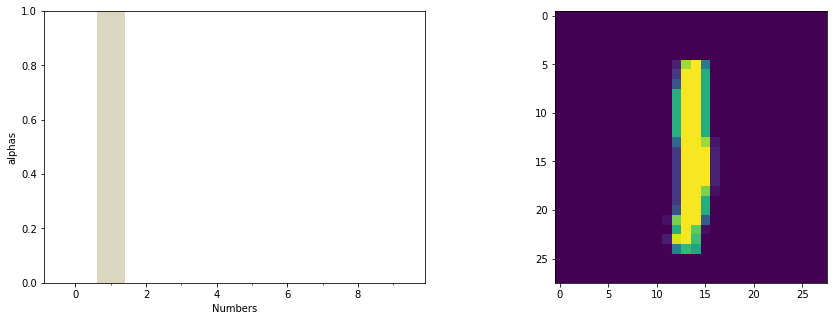

alphas:  tensor([4.8122e-01, 7.5320e+05, 2.0983e-01, 1.2333e-01, 4.9898e+02, 4.7671e-01,
        3.2595e-01, 1.0119e+01, 1.7194e+00, 9.3348e-01])
compare pred, true:  tensor([1]) tensor([1])
out:  tensor([7])


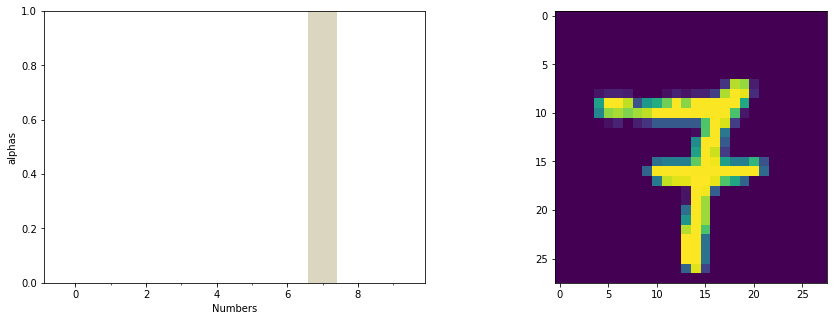

alphas:  tensor([1.1192e+00, 1.7463e+06, 3.5178e+06, 9.8408e+07, 2.8665e+04, 8.6068e+04,
        7.6394e-01, 3.2524e+13, 7.4536e+03, 4.1382e+05])
compare pred, true:  tensor([7]) tensor([7])
out:  tensor([3])


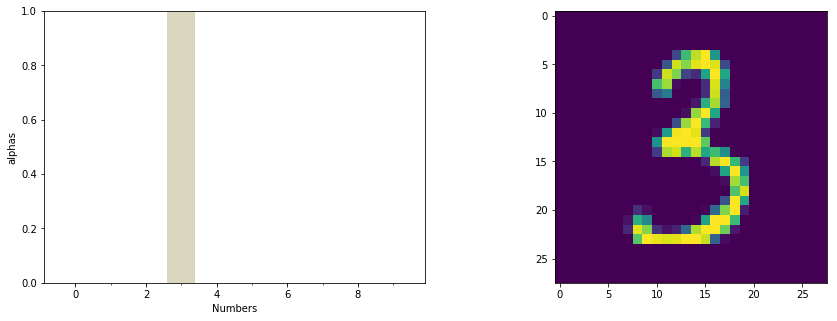

alphas:  tensor([2.0335e-01, 3.3108e+04, 1.8169e+04, 1.5944e+13, 9.7926e+01, 7.3749e+06,
        1.4436e-01, 2.2491e+02, 5.2764e+04, 7.6723e+03])
compare pred, true:  tensor([3]) tensor([3])
out:  tensor([2])


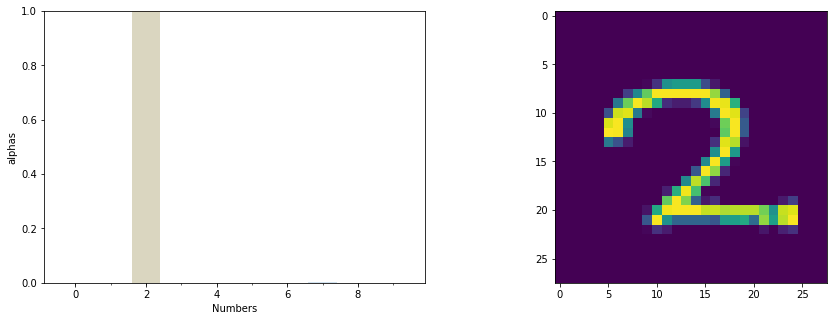

alphas:  tensor([9.7324e+02, 3.0133e+03, 2.6968e+08, 8.5930e+03, 2.0573e-01, 6.5904e+01,
        3.4413e-01, 8.5419e+05, 3.8602e+02, 3.7925e+01])
compare pred, true:  tensor([2]) tensor([2])
out:  tensor([9])


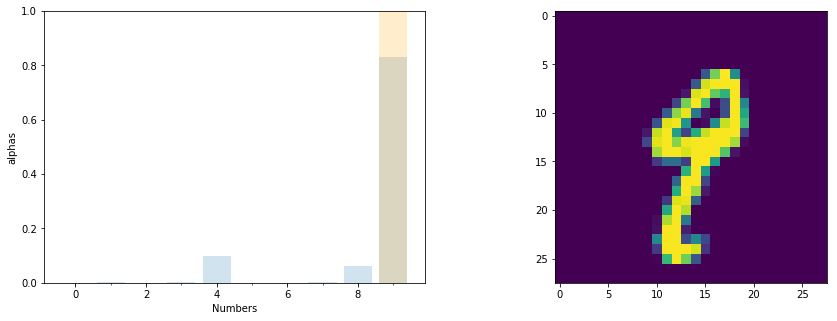

alphas:  tensor([6.3533e-01, 2.4820e+01, 6.5182e-01, 1.0953e+01, 7.1513e+02, 8.4607e-01,
        6.8477e-01, 8.8442e+00, 4.3340e+02, 5.9259e+03])
compare pred, true:  tensor([9]) tensor([9])
out:  tensor([7])


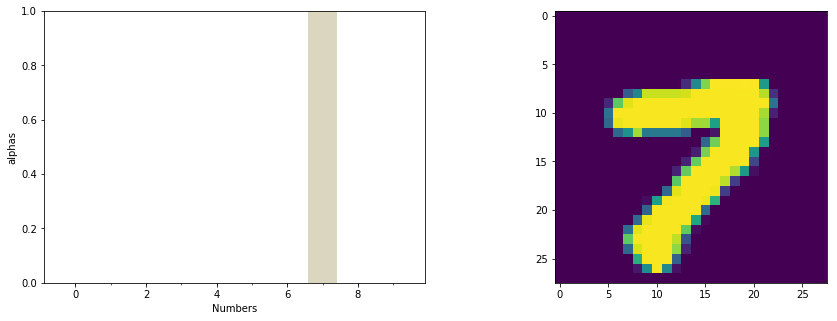

alphas:  tensor([2.6657e+04, 5.0445e+05, 1.7945e+09, 5.8037e+07, 1.2677e+03, 1.5711e+06,
        4.3746e-01, 2.5675e+13, 2.3343e+06, 1.0099e+08])
compare pred, true:  tensor([7]) tensor([7])
out:  tensor([7])


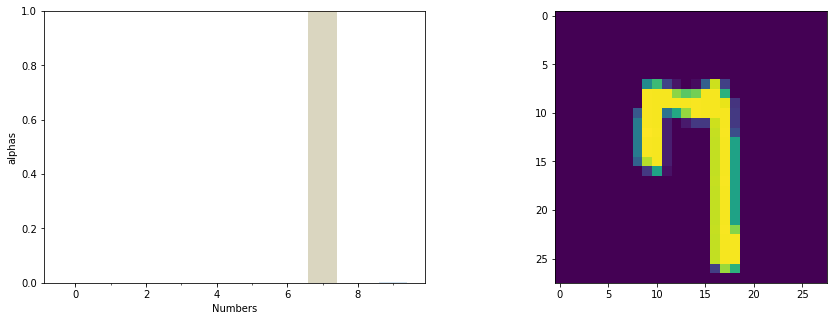

alphas:  tensor([4.3936e+01, 3.1129e+01, 5.8639e+02, 4.4889e+00, 2.5782e+02, 2.0197e+03,
        7.4158e-01, 1.2964e+07, 1.4940e+01, 4.4065e+04])
compare pred, true:  tensor([7]) tensor([7])
out:  tensor([6])


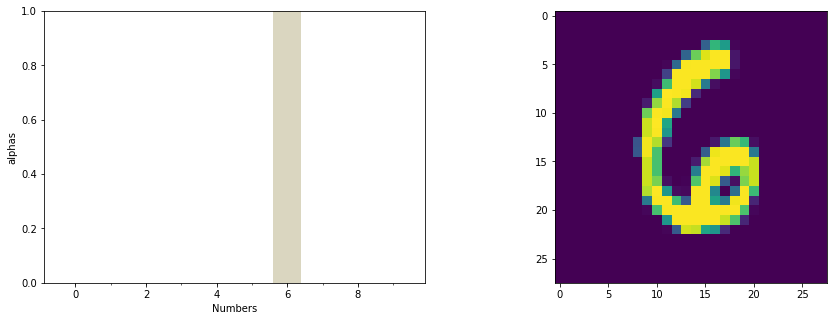

alphas:  tensor([1.8163e+05, 8.8889e+00, 1.7948e+05, 2.1595e+00, 1.5758e+03, 2.1191e+06,
        1.6583e+10, 5.2155e-01, 6.8780e+04, 3.8010e+00])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([2])


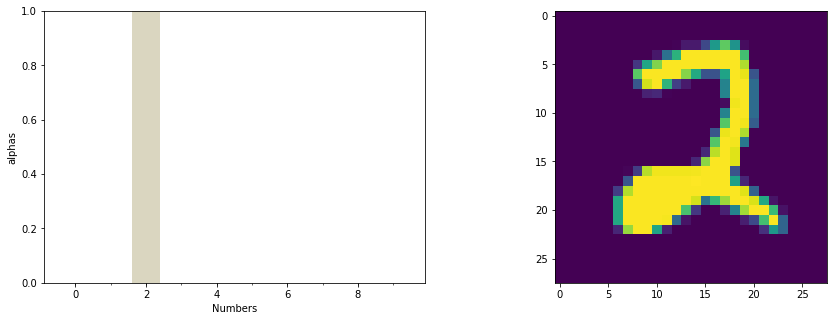

alphas:  tensor([1.6594e+02, 6.6313e+06, 1.9220e+14, 1.9825e+06, 5.0978e+01, 3.0029e+03,
        1.2236e-01, 3.0989e+07, 8.3807e+02, 1.8220e+00])
compare pred, true:  tensor([2]) tensor([2])
out:  tensor([7])


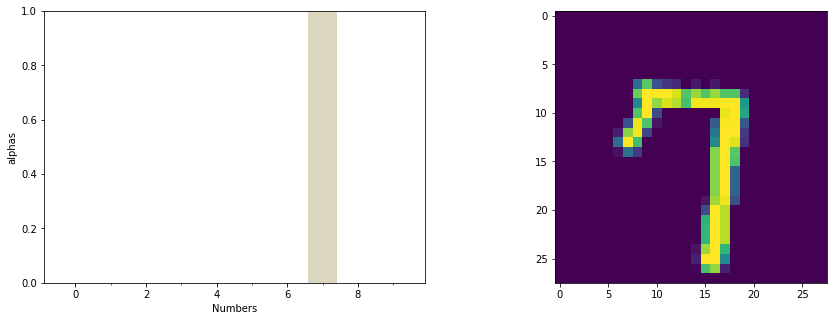

alphas:  tensor([9.2682e+05, 1.5587e+05, 9.6187e+08, 2.0969e+06, 2.8688e+05, 2.4689e+07,
        4.8694e-01, 4.6315e+16, 4.4610e+05, 5.2801e+10])
compare pred, true:  tensor([7]) tensor([7])
out:  tensor([8])


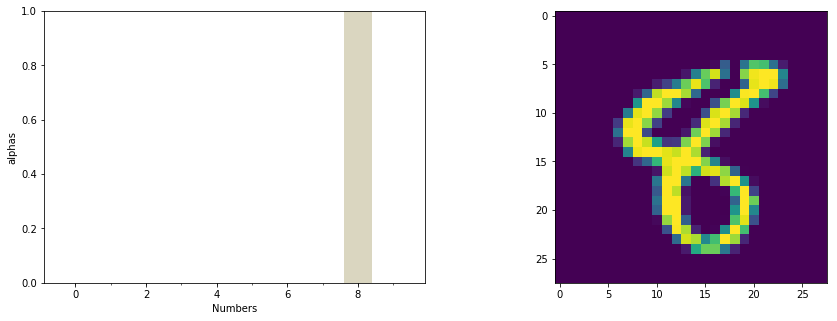

alphas:  tensor([1.9501e-01, 3.7545e-01, 1.1865e+00, 4.3207e-01, 8.3449e-01, 2.1012e+00,
        5.7000e+00, 1.8080e-01, 8.6465e+05, 1.2941e+00])
compare pred, true:  tensor([8]) tensor([8])
out:  tensor([4])


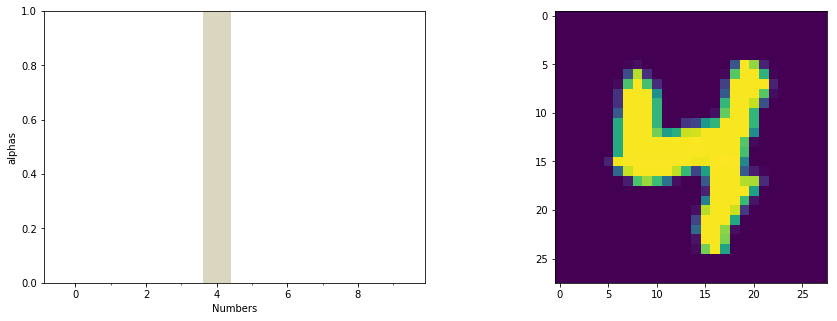

alphas:  tensor([2.7455e-01, 5.1133e-01, 1.2650e+01, 2.4539e-01, 7.0110e+07, 5.3363e+02,
        2.8156e+00, 4.1373e+03, 2.3656e+01, 7.1390e+01])
compare pred, true:  tensor([4]) tensor([4])
out:  tensor([7])


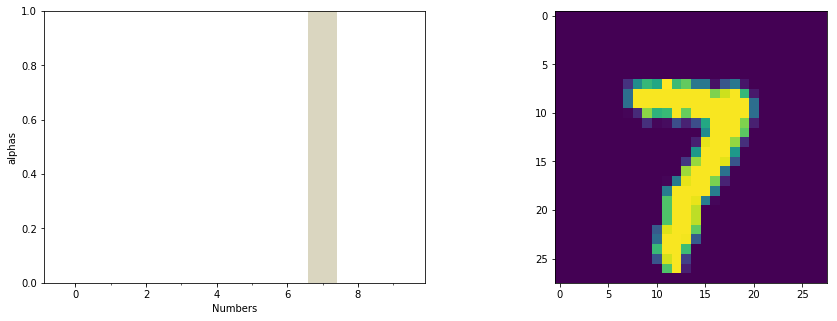

alphas:  tensor([5.7146e+03, 2.2158e+08, 3.9238e+09, 5.0100e+09, 1.9479e+03, 3.1731e+05,
        5.6602e-01, 1.5232e+15, 4.4676e+07, 1.1704e+09])
compare pred, true:  tensor([7]) tensor([7])
out:  tensor([3])


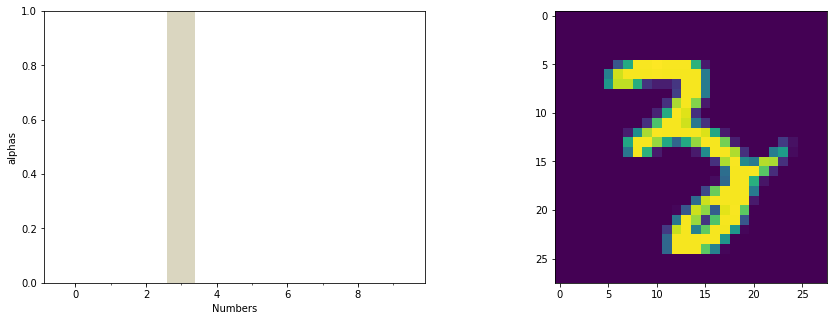

alphas:  tensor([4.0489e-01, 1.8163e+04, 6.0264e+03, 1.7709e+08, 2.1640e+02, 2.5023e+04,
        3.2804e-01, 2.2310e+03, 5.7653e+01, 1.4774e+02])
compare pred, true:  tensor([3]) tensor([3])
out:  tensor([6])


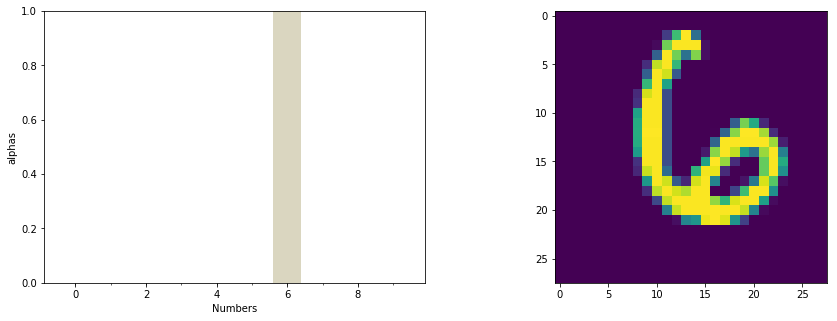

alphas:  tensor([4.9479e+04, 3.5045e-01, 4.4441e+05, 2.3392e-01, 2.7673e+04, 1.3113e+05,
        2.6112e+12, 2.7609e-01, 1.5702e+05, 2.3350e-01])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([1])


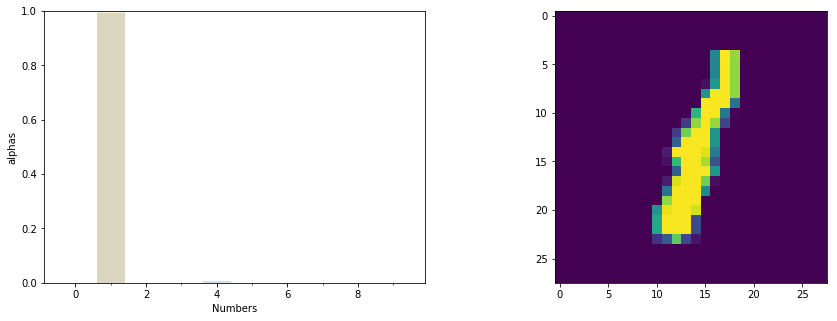

alphas:  tensor([5.3080e-01, 2.0984e+04, 2.0265e-01, 2.0919e-01, 1.6148e+02, 5.7441e-01,
        6.5067e-01, 5.7894e+00, 2.4164e-01, 1.1811e-01])
compare pred, true:  tensor([1]) tensor([1])
out:  tensor([3])


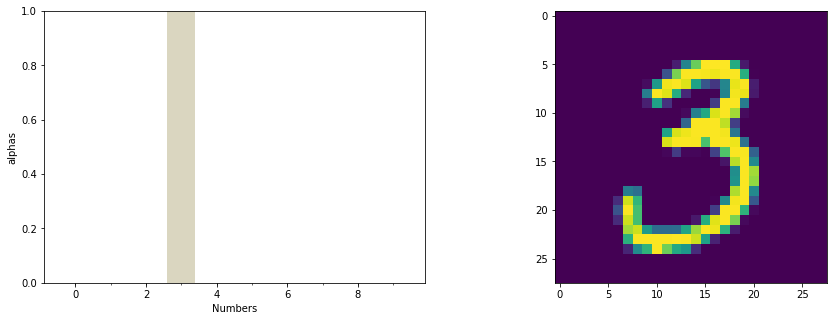

alphas:  tensor([8.4130e+00, 6.7977e+03, 2.9224e+05, 7.2897e+11, 3.3938e+01, 1.4191e+07,
        1.2938e-01, 5.9091e+02, 3.5069e+04, 1.1704e+05])
compare pred, true:  tensor([3]) tensor([3])
out:  tensor([6])


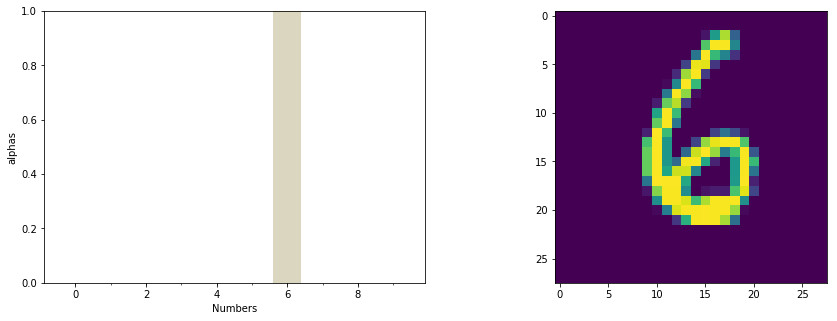

alphas:  tensor([5.7349e+03, 2.3963e+02, 1.2092e+05, 8.2542e+01, 2.0392e+04, 2.6118e+06,
        4.9085e+11, 6.5697e-01, 2.7510e+06, 1.1774e+00])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([9])


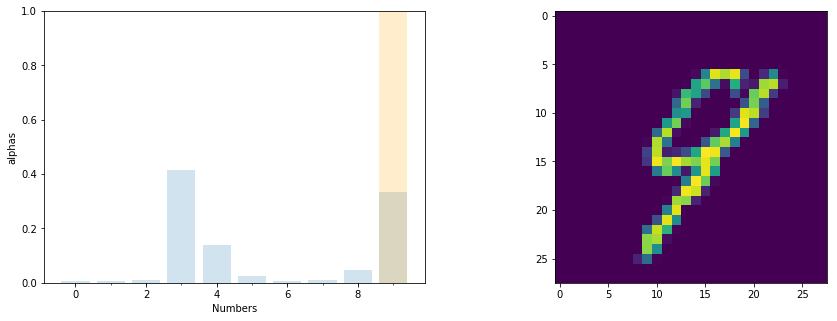

alphas:  tensor([ 1.3222,  1.7503,  2.2738, 91.8362, 30.8925,  5.3758,  1.5705,  2.0644,
        10.3173, 74.2853])
compare pred, true:  tensor([3]) tensor([9])
out:  tensor([3])


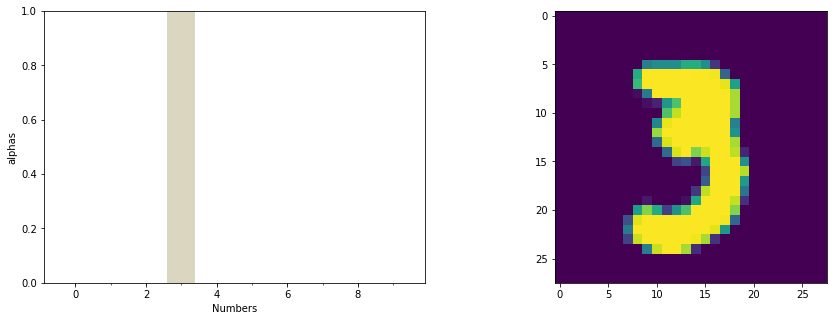

alphas:  tensor([2.6327e+00, 1.9855e+04, 3.9128e+03, 5.9686e+08, 3.8531e+02, 8.3263e+04,
        3.5653e-01, 3.5732e+02, 1.0646e+03, 1.1967e+04])
compare pred, true:  tensor([3]) tensor([3])
out:  tensor([1])


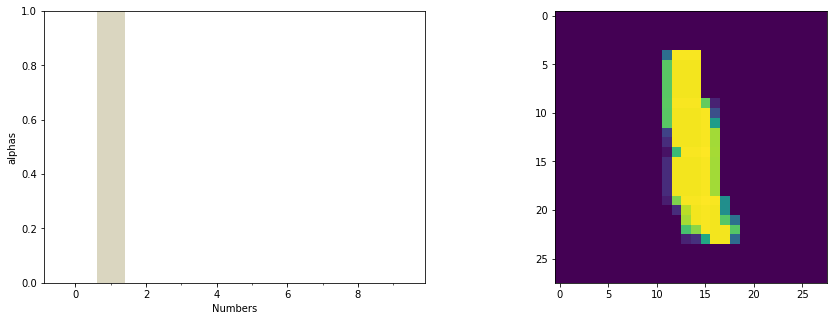

alphas:  tensor([5.2833e-01, 7.0157e+04, 6.8191e+00, 1.3884e-01, 4.9350e+00, 6.0010e-01,
        4.7057e-01, 3.0707e-01, 2.4204e+01, 9.9872e-02])
compare pred, true:  tensor([1]) tensor([1])
out:  tensor([4])


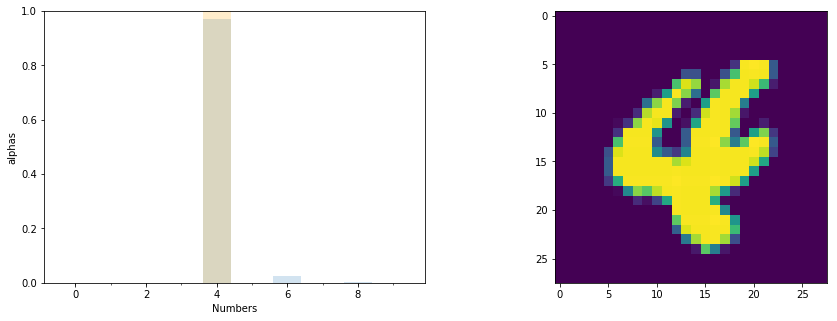

alphas:  tensor([3.0905e+00, 5.9700e-01, 4.1481e+00, 6.8627e-01, 2.1188e+04, 4.7994e+00,
        5.6913e+02, 2.2304e+00, 8.4104e+01, 3.6877e+00])
compare pred, true:  tensor([4]) tensor([4])
out:  tensor([1])


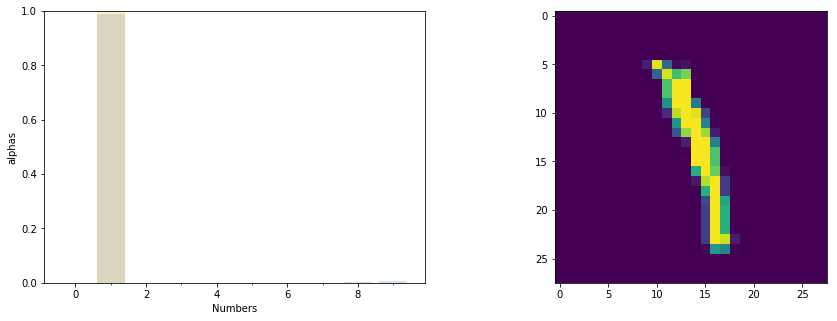

alphas:  tensor([8.6090e-01, 7.5621e+05, 5.3501e+00, 9.9206e+01, 6.3481e+02, 4.4560e+01,
        5.0696e-01, 6.5080e+02, 9.7560e+02, 5.5876e+03])
compare pred, true:  tensor([1]) tensor([1])
out:  tensor([7])


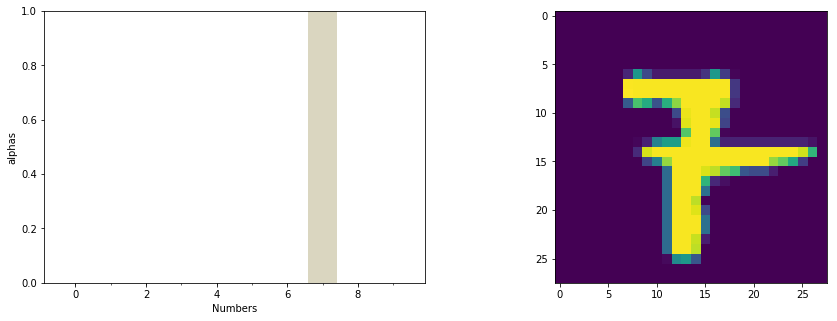

alphas:  tensor([4.9039e-01, 8.3456e+05, 2.7589e+06, 5.0451e+05, 3.5927e+02, 6.4507e+01,
        5.6641e-01, 1.2519e+12, 1.7163e+03, 3.5630e+02])
compare pred, true:  tensor([7]) tensor([7])
out:  tensor([6])


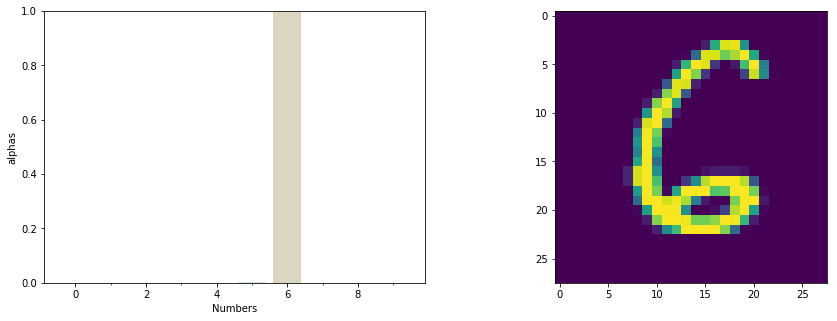

alphas:  tensor([1.2093e+09, 6.3664e+02, 1.0700e+09, 2.0555e+01, 1.7955e+05, 1.3574e+11,
        3.7829e+13, 3.1649e-01, 1.2178e+08, 9.7075e+00])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([9])


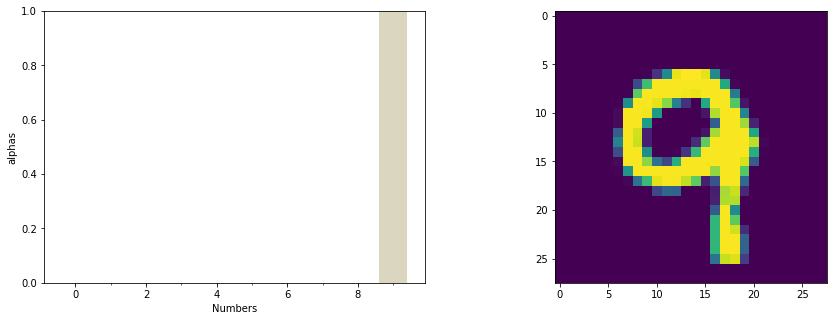

alphas:  tensor([3.5765e+02, 2.6199e-01, 7.6289e+03, 1.8332e+04, 2.3362e+06, 9.7174e+04,
        1.8208e-01, 8.4545e+06, 2.5352e+05, 3.9032e+11])
compare pred, true:  tensor([9]) tensor([9])
non_nan or inf:  100


(0.99, 1.0)

In [13]:
mnist_net = LPADirNN()
print("loading model from: {}".format(MNIST_PATH))
mnist_net.load_state_dict(torch.load(MNIST_PATH))
mnist_net.eval()
evaluate_mnist(model=mnist_net, 
               mus_w_mean=mus_w_mean_mnist,
               mus_b_mean=mus_b_mean_mnist,
               sigmas_w_mean=sigmas_w_mean_mnist,
               sigmas_b_mean=sigmas_b_mean_mnist,
               show=True,
               test_size=99)

/home/marius/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


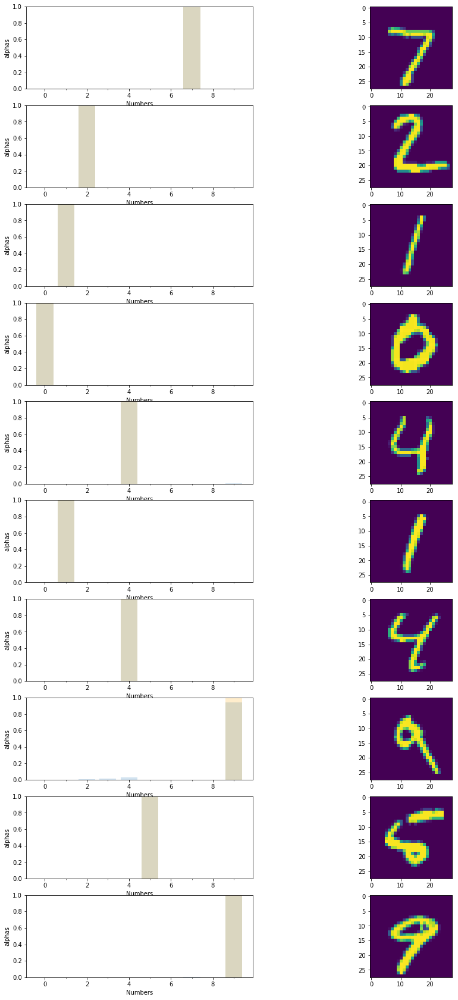

()

In [40]:
plot_mnist(model=mnist_net,
                mus_w_mean=mus_w_mean_mnist,
                mus_b_mean=mus_b_mean_mnist,
                sigmas_w_mean=sigmas_w_mean_mnist,
                sigmas_b_mean=sigmas_b_mean_mnist,
                filename='figures/MNIST_model_on_MNIST.pdf'
               )

loading model from: models/mnist_test.pth
out:  tensor([2])


/home/marius/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


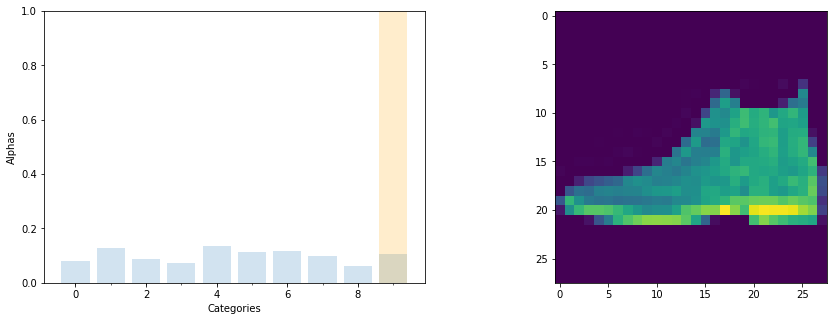

tensor([5.4546, 8.8942, 6.0267, 5.0553, 9.4221, 7.8448, 8.1333, 6.7687, 4.1846,
        7.3915])
tensor(4) tensor([9])
out:  tensor([8])


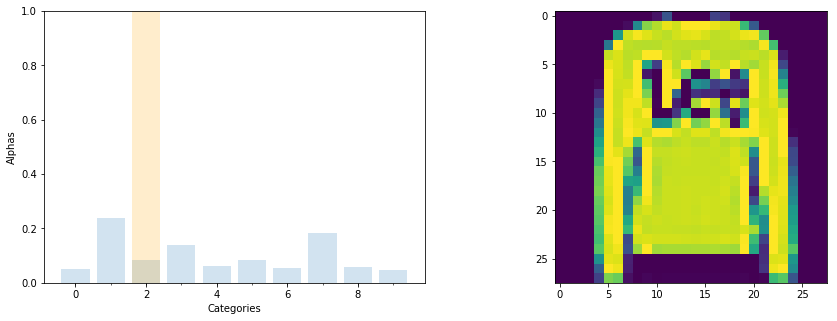

tensor([ 5.5336, 27.0991,  9.3506, 15.6225,  6.8013,  9.4992,  6.0613, 20.8699,
         6.5153,  5.4638])
tensor(1) tensor([2])
out:  tensor([7])


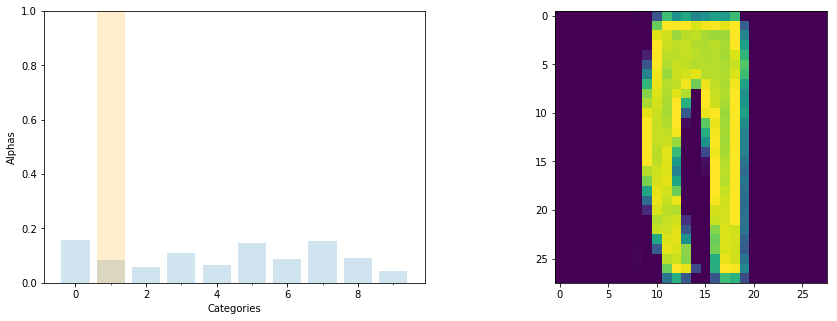

tensor([7.8485, 4.3010, 2.9469, 5.5370, 3.2637, 7.4402, 4.3984, 7.7562, 4.5015,
        2.2675])
tensor(0) tensor([1])
out:  tensor([1])


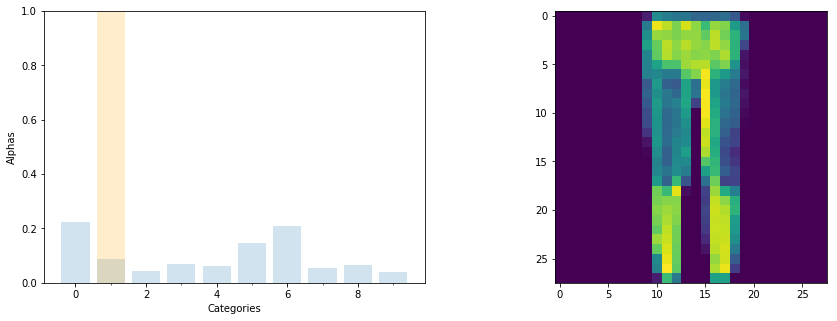

tensor([21.8633,  8.5078,  4.3471,  6.7920,  6.0661, 14.4758, 20.5689,  5.3546,
         6.2467,  3.8716])
tensor(0) tensor([1])
out:  tensor([4])


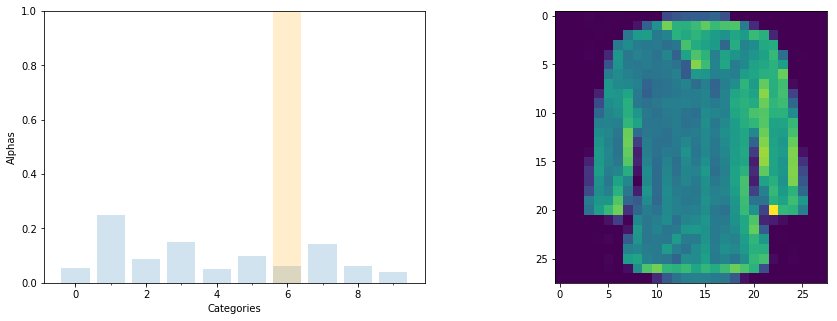

tensor([ 25.1744, 115.5026,  41.5129,  69.7657,  23.4523,  45.2527,  29.5419,
         67.0648,  29.2540,  18.4858])
tensor(1) tensor([6])
out:  tensor([8])


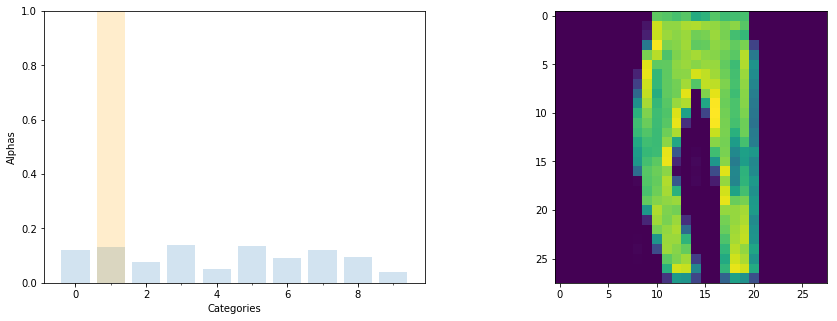

tensor([7.3782, 7.9320, 4.6125, 8.3414, 3.1677, 8.2841, 5.5246, 7.2277, 5.6727,
        2.5072])
tensor(3) tensor([1])
out:  tensor([4])


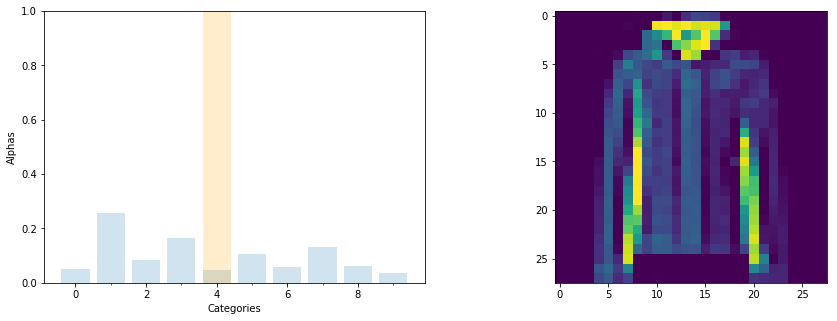

tensor([ 8.8913, 46.7619, 15.2112, 29.5529,  8.7229, 19.3571, 10.5249, 23.8864,
        11.3555,  6.8012])
tensor(1) tensor([4])
out:  tensor([8])


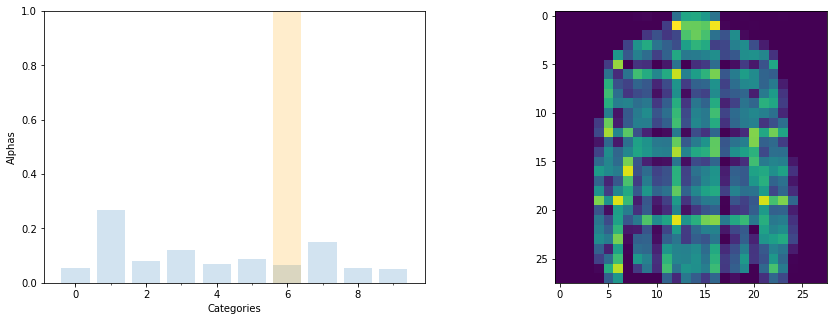

tensor([ 29.2601, 140.5616,  42.6511,  64.2141,  35.5937,  46.6900,  33.8835,
         78.7559,  28.5145,  25.7765])
tensor(1) tensor([6])
out:  tensor([4])


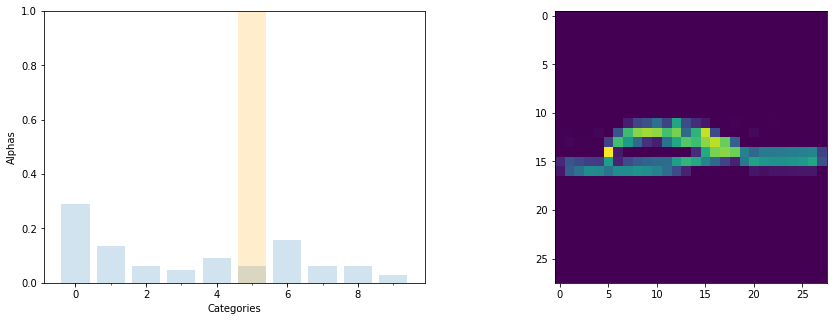

tensor([21.1520,  9.9559,  4.5570,  3.4131,  6.7674,  4.6160, 11.5441,  4.6098,
         4.4847,  2.2394])
tensor(0) tensor([5])
out:  tensor([4])


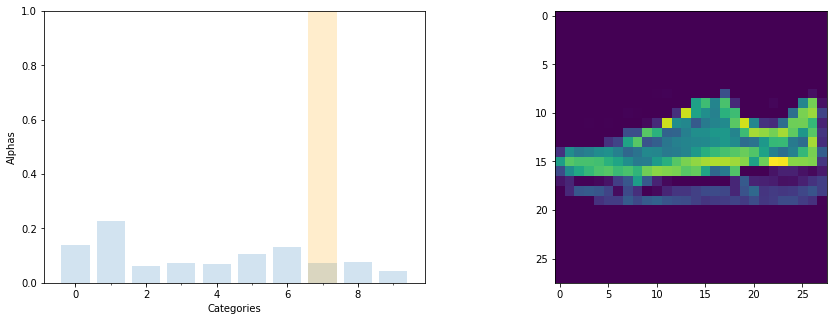

tensor([17.3328, 28.4114,  7.6224,  9.1120,  8.7326, 13.0722, 16.5499,  9.1944,
         9.3603,  5.4329])
tensor(1) tensor([7])
out:  tensor([6])


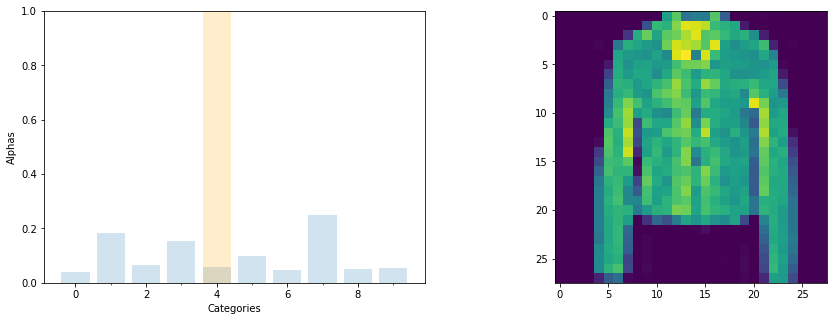

tensor([ 7.0748, 32.5936, 11.5801, 27.0830, 10.2605, 17.7269,  8.3347, 44.1631,
         9.0297,  9.6055])
tensor(7) tensor([4])
out:  tensor([2])


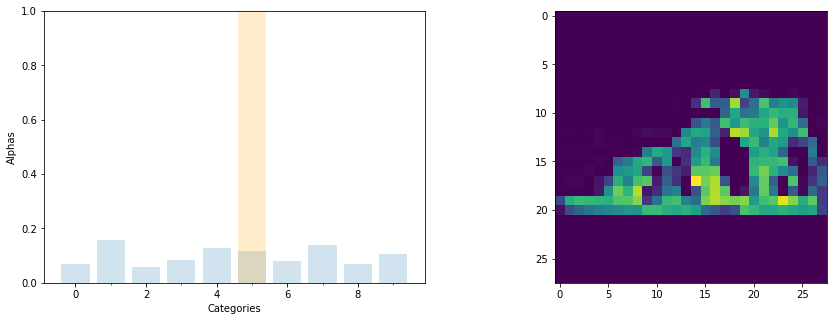

tensor([ 6.0814, 13.6328,  4.9338,  7.2598, 11.1147, 10.0279,  6.9711, 11.9456,
         5.8819,  9.1237])
tensor(1) tensor([5])
out:  tensor([6])


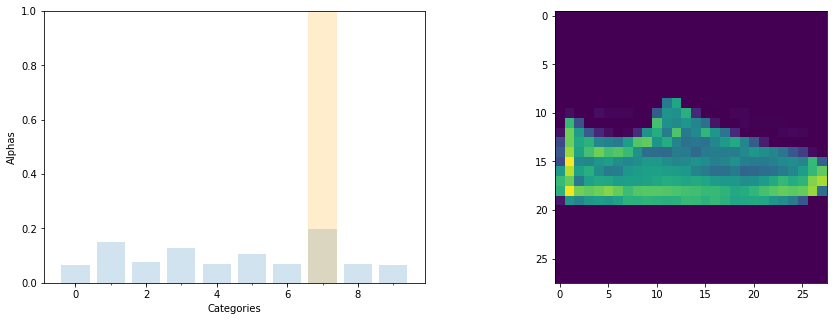

tensor([ 7.9561, 18.5176,  9.5052, 15.9094,  8.4343, 13.3505,  8.7563, 24.6038,
         8.7186,  8.2340])
tensor(7) tensor([7])
out:  tensor([1])


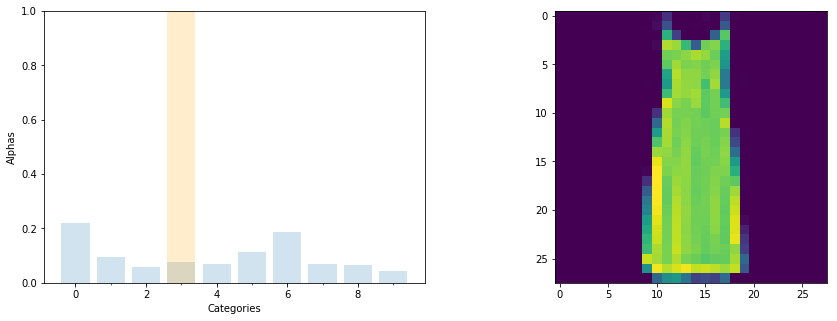

tensor([18.0555,  7.7495,  4.6318,  6.2083,  5.7048,  9.1932, 15.3920,  5.7996,
         5.4498,  3.6364])
tensor(0) tensor([3])
out:  tensor([0])


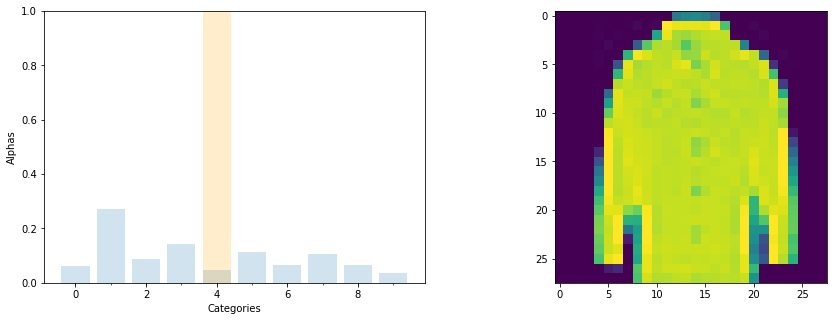

tensor([ 7.6340, 32.9255, 10.4022, 17.5124,  5.9047, 13.5106,  8.0661, 12.9779,
         7.7458,  4.5068])
tensor(1) tensor([4])
out:  tensor([8])


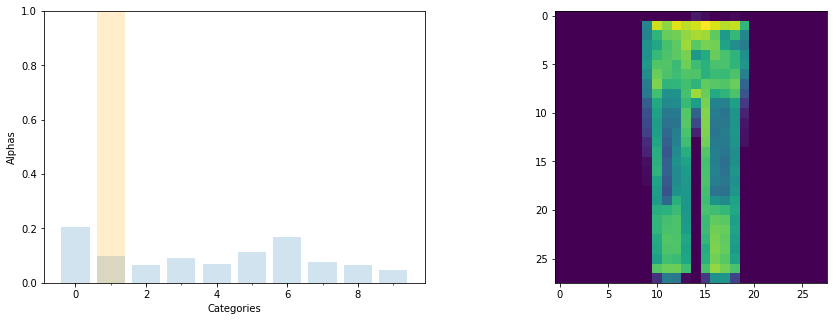

tensor([49.2222, 24.2346, 15.7334, 22.3215, 16.6563, 27.5548, 40.3167, 18.4691,
        15.8465, 11.2785])
tensor(0) tensor([1])
out:  tensor([5])


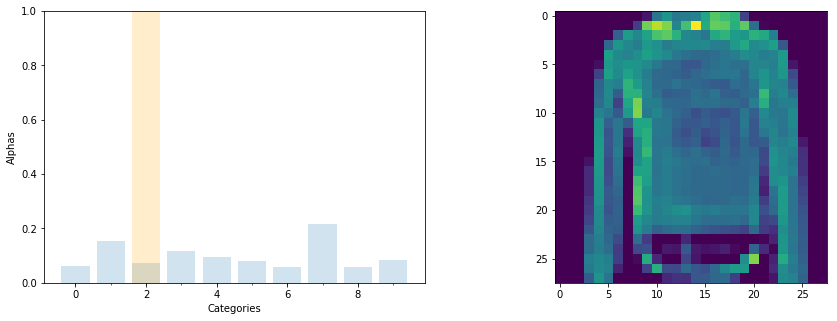

tensor([ 29.3331,  72.4604,  33.4120,  54.3385,  44.7493,  38.1336,  27.4530,
        101.3833,  27.2619,  39.8786])
tensor(7) tensor([2])
out:  tensor([8])


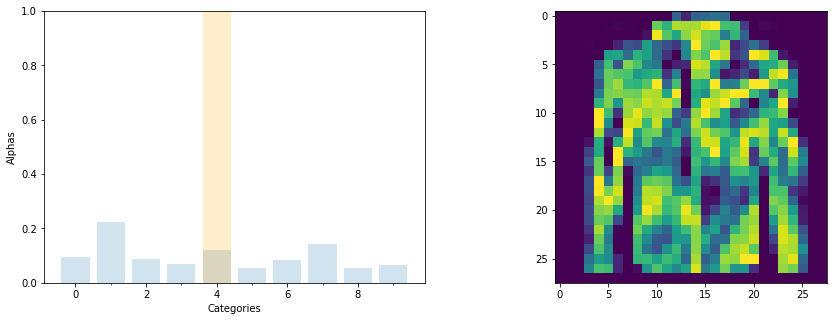

tensor([23.3045, 55.2255, 21.4591, 17.1438, 29.9453, 13.5461, 20.4597, 34.8655,
        13.7356, 15.7492])
tensor(1) tensor([4])
out:  tensor([0])


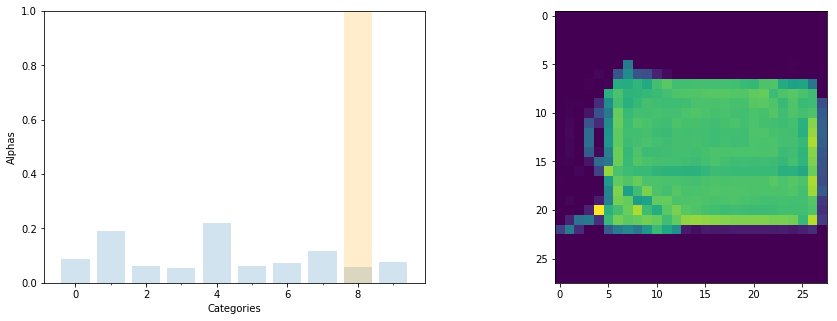

tensor([ 5.8242, 12.9795,  4.0948,  3.6667, 14.9036,  4.1687,  4.8748,  8.0542,
         3.9481,  5.3059])
tensor(4) tensor([8])
out:  tensor([7])


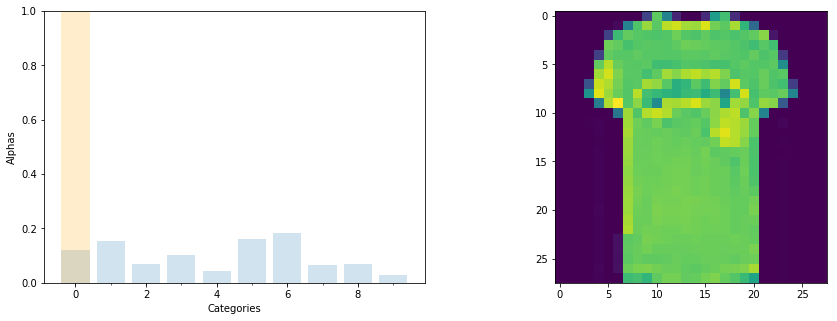

tensor([21.2577, 27.3259, 12.4183, 18.4197,  8.0199, 28.5136, 32.2526, 11.6880,
        12.2615,  5.3978])
tensor(6) tensor([0])
out:  tensor([7])


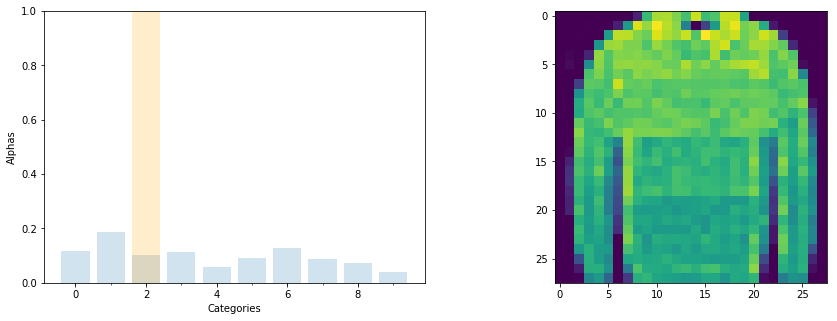

tensor([123.3465, 193.6267, 105.7458, 119.4562,  61.2043,  95.5232, 133.9482,
         92.0372,  76.4809,  41.9980])
tensor(1) tensor([2])
out:  tensor([6])


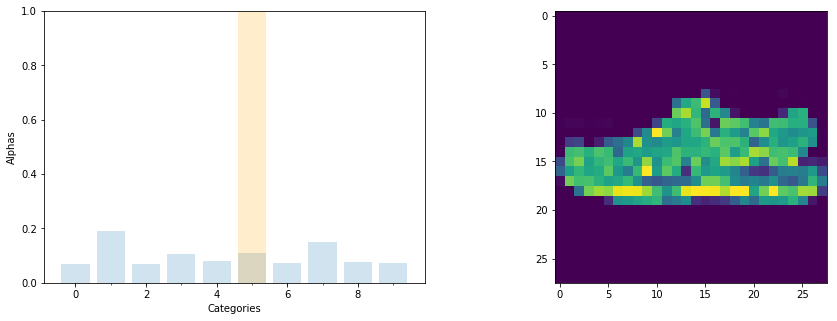

tensor([ 7.5353, 20.5511,  7.3681, 11.6152,  8.5838, 11.7612,  8.0494, 16.2432,
         8.3433,  7.8883])
tensor(1) tensor([5])
out:  tensor([2])


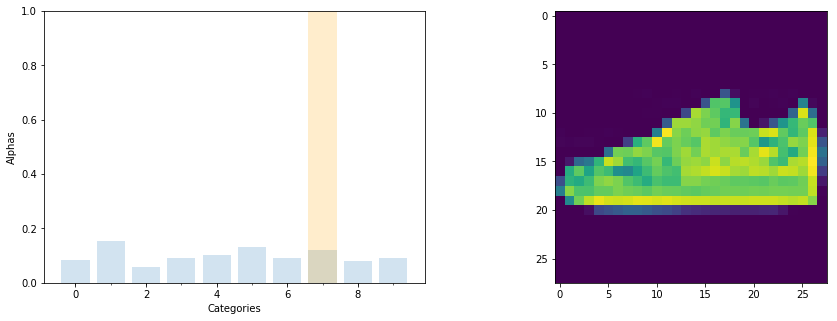

tensor([ 6.5028, 11.9283,  4.5918,  6.9765,  7.7866, 10.0948,  7.0603,  9.2262,
         6.1761,  7.1542])
tensor(1) tensor([7])
out:  tensor([5])


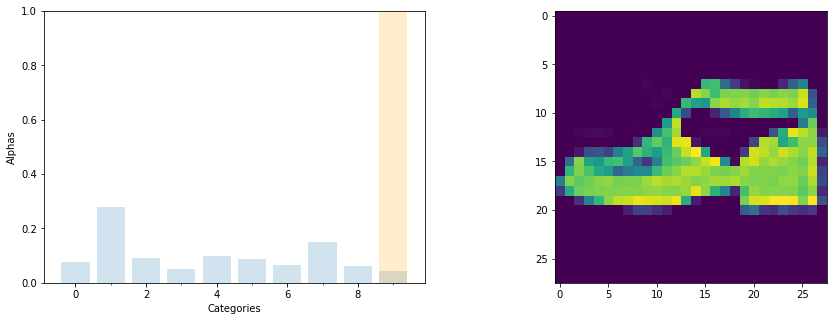

tensor([2.5406, 9.2499, 3.0520, 1.6379, 3.2544, 2.8860, 2.1312, 5.0500, 2.0058,
        1.4837])
tensor(1) tensor([9])
out:  tensor([8])


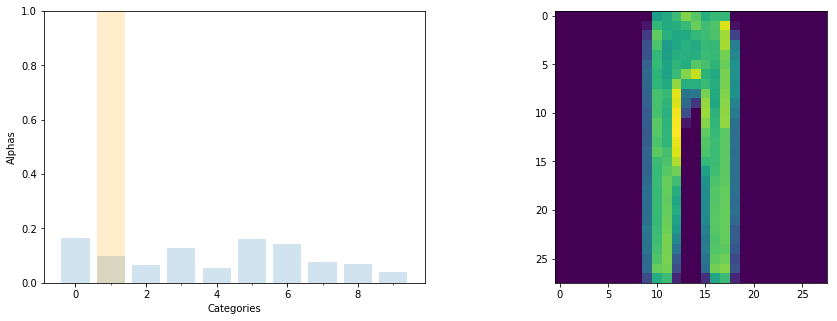

tensor([12.1667,  7.2762,  4.9223,  9.4709,  4.1382, 11.9849, 10.5066,  5.6096,
         5.1617,  2.8593])
tensor(0) tensor([1])
out:  tensor([0])


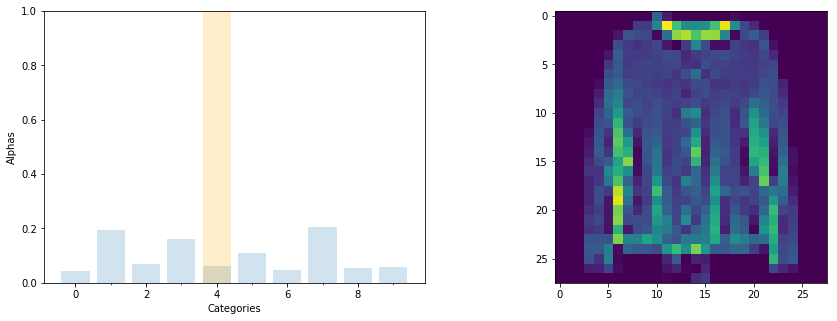

tensor([ 9.9316, 45.3294, 15.9268, 37.7712, 14.6702, 25.3647, 11.4166, 48.4839,
        13.0089, 13.3753])
tensor(7) tensor([4])
out:  tensor([0])


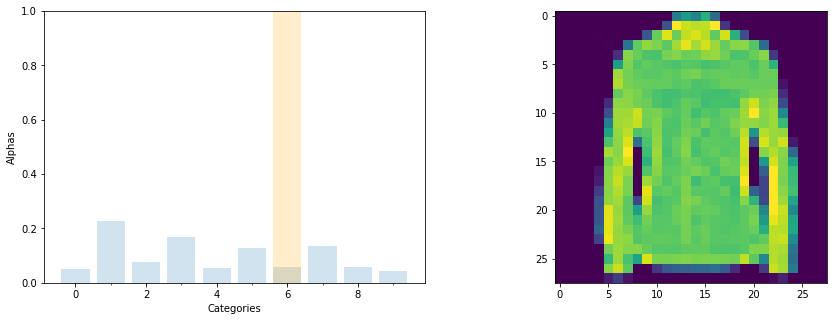

tensor([ 7.7315, 33.2223, 11.1696, 24.7074,  7.9050, 18.6757,  8.8310, 19.8869,
         8.8198,  6.3079])
tensor(1) tensor([6])
out:  tensor([4])


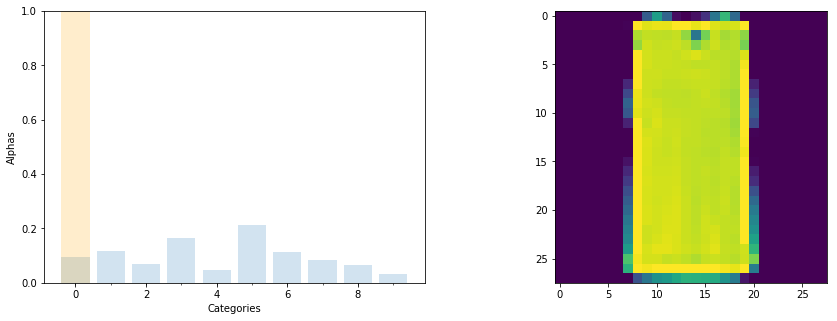

tensor([ 8.7444, 10.7354,  6.4751, 15.0005,  4.2648, 19.5763, 10.4017,  7.5672,
         5.9903,  3.0806])
tensor(5) tensor([0])
out:  tensor([2])


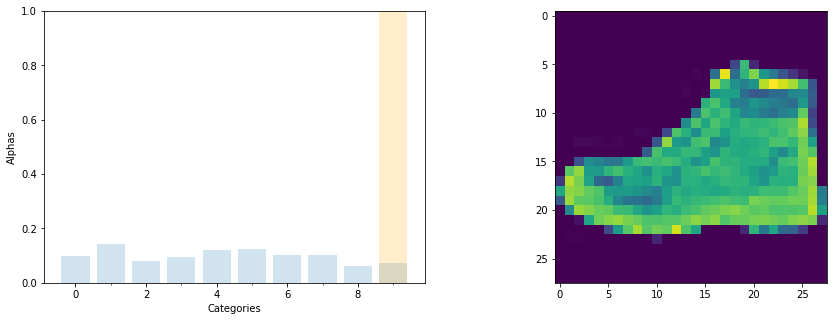

tensor([5.1181, 7.5259, 4.2032, 4.9352, 6.4274, 6.5267, 5.4333, 5.3676, 3.2731,
        3.8884])
tensor(1) tensor([9])
out:  tensor([4])


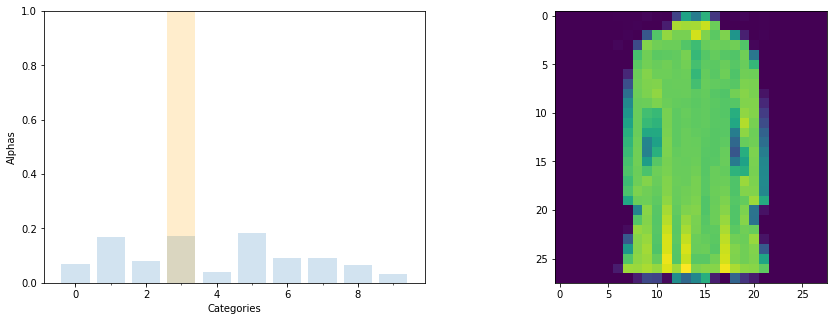

tensor([11.0231, 26.5537, 12.6920, 27.1205,  6.3676, 28.8070, 14.2548, 14.2252,
        10.0534,  4.8336])
tensor(5) tensor([3])
out:  tensor([8])


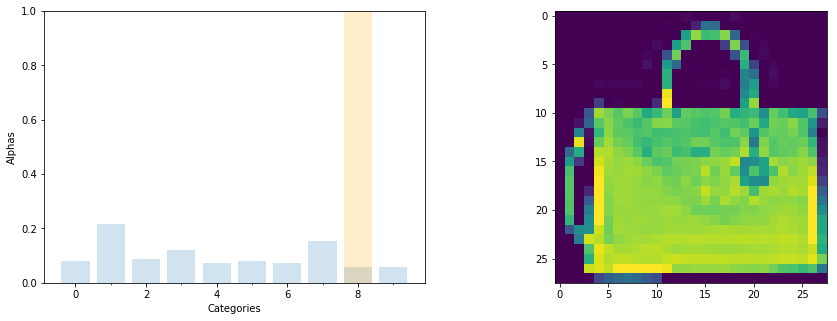

tensor([17.5391, 47.8938, 19.2566, 26.5023, 16.0883, 17.6719, 15.9499, 34.1229,
        13.0148, 13.1198])
tensor(1) tensor([8])
out:  tensor([2])


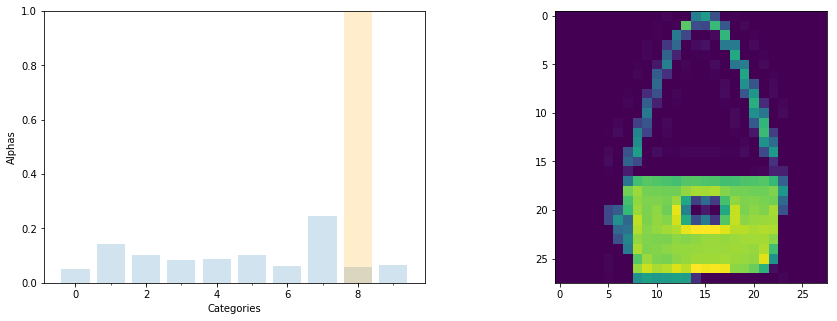

tensor([ 3.6859, 10.2747,  7.2805,  5.8909,  6.1933,  7.2280,  4.5152, 17.5643,
         4.0265,  4.6273])
tensor(7) tensor([8])
out:  tensor([8])


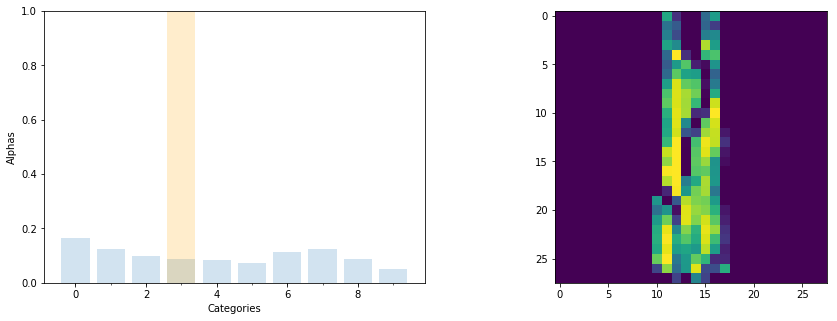

tensor([9.2551, 6.9573, 5.5244, 4.9712, 4.6829, 4.0273, 6.4227, 7.0635, 4.9091,
        2.8320])
tensor(0) tensor([3])
out:  tensor([8])


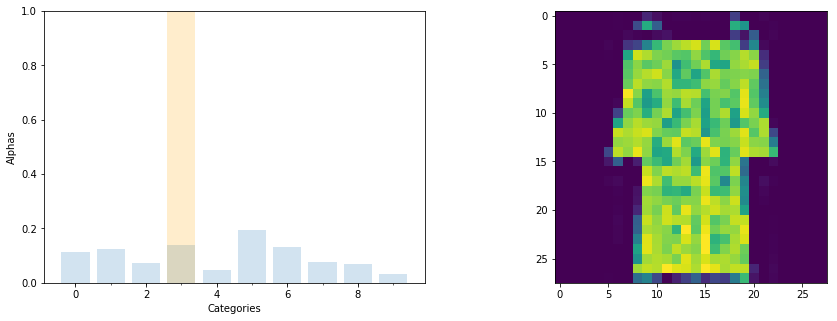

tensor([ 9.6052, 10.4434,  6.0563, 11.7450,  3.9199, 16.1631, 11.0675,  6.3133,
         5.7400,  2.7213])
tensor(5) tensor([3])
out:  tensor([8])


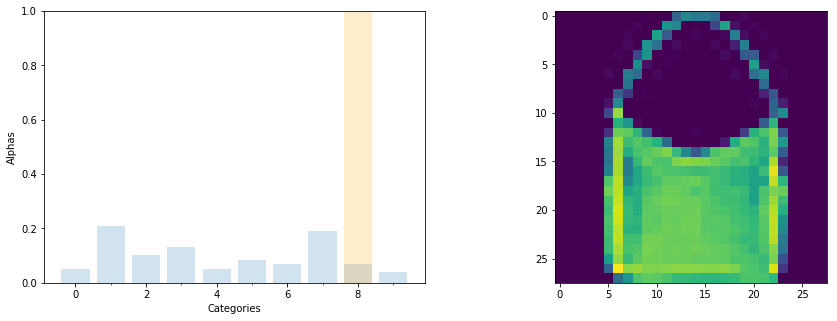

tensor([ 4.4928, 18.2119,  8.7140, 11.3328,  4.5552,  7.3949,  5.9398, 16.4616,
         6.1056,  3.4023])
tensor(1) tensor([8])
out:  tensor([8])


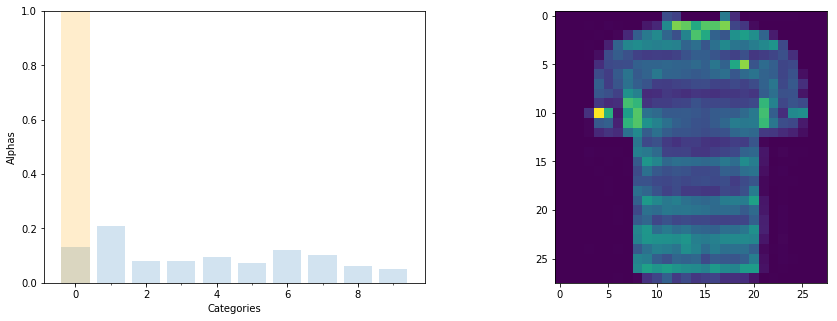

tensor([37.1823, 58.2088, 22.4457, 22.0052, 26.1335, 19.9833, 33.6360, 28.2360,
        17.5649, 14.6990])
tensor(1) tensor([0])
out:  tensor([4])


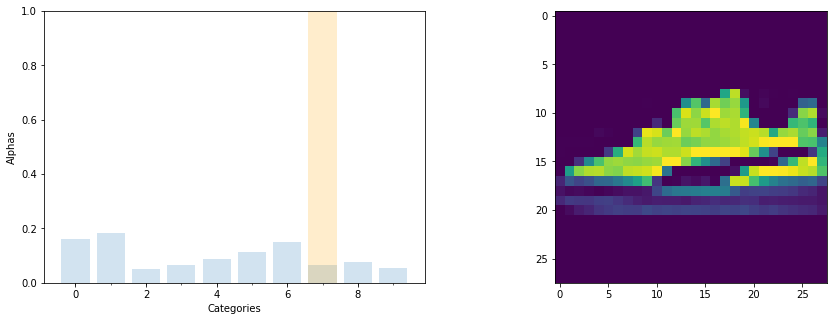

tensor([11.4015, 13.0006,  3.5282,  4.6362,  6.3077,  7.9816, 10.7137,  4.6426,
         5.4458,  3.7743])
tensor(1) tensor([7])
out:  tensor([4])


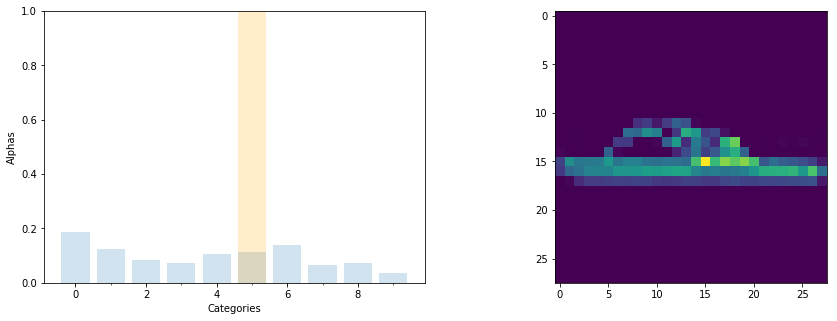

tensor([11.8014,  7.9349,  5.3721,  4.6107,  6.6543,  7.2936,  8.8498,  4.2445,
         4.7451,  2.2260])
tensor(0) tensor([5])
out:  tensor([4])


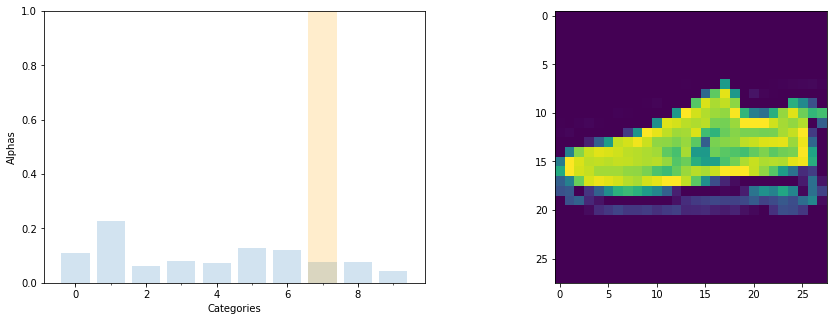

tensor([ 6.9522, 14.2118,  3.8910,  4.9884,  4.6691,  7.9920,  7.5981,  4.9122,
         4.9291,  2.8408])
tensor(1) tensor([7])
out:  tensor([2])


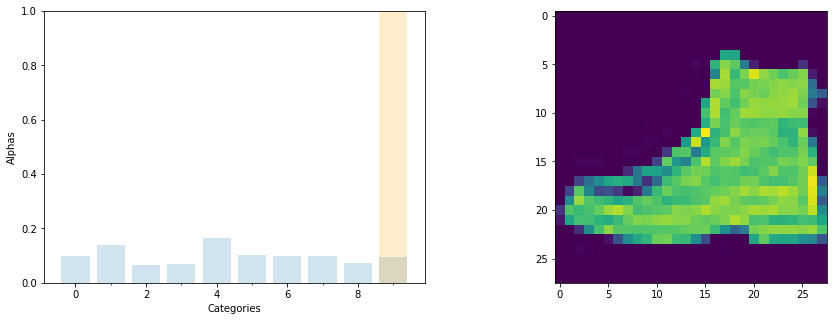

tensor([5.5820, 7.8867, 3.7122, 3.9170, 9.4928, 5.8368, 5.7648, 5.6504, 4.2343,
        5.3618])
tensor(4) tensor([9])
out:  tensor([8])


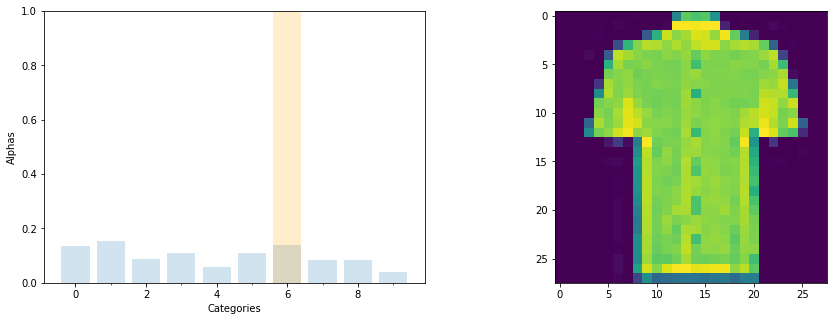

tensor([12.5491, 14.4043,  7.9575, 10.2231,  5.2917, 10.0533, 12.9824,  7.8191,
         7.6966,  3.6359])
tensor(1) tensor([6])
out:  tensor([0])


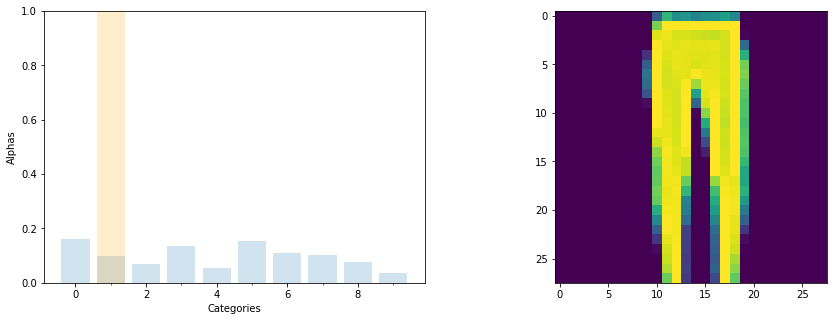

tensor([7.7450, 4.8478, 3.3828, 6.5541, 2.6435, 7.4901, 5.2754, 4.9117, 3.7684,
        1.7534])
tensor(0) tensor([1])
out:  tensor([4])


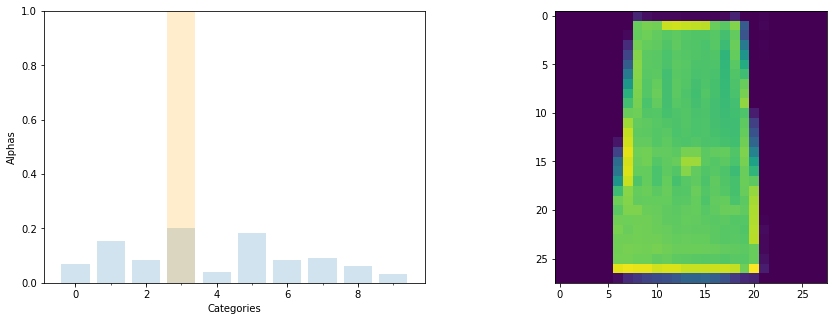

tensor([10.2749, 22.9010, 12.3690, 30.4294,  6.1305, 27.4671, 12.7654, 13.9776,
         9.5265,  4.6562])
tensor(3) tensor([3])
out:  tensor([2])


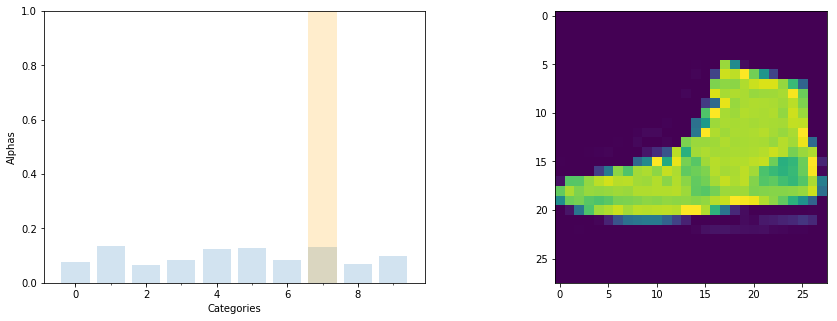

tensor([3.2709, 5.8405, 2.7742, 3.6880, 5.3977, 5.5035, 3.6768, 5.7245, 2.9904,
        4.3119])
tensor(1) tensor([7])
out:  tensor([0])


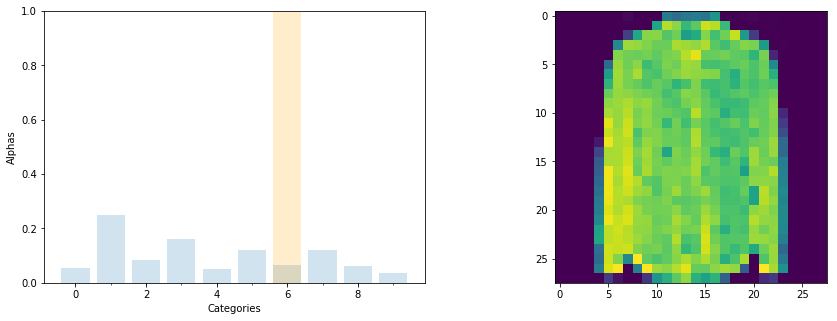

tensor([ 8.8515, 40.8080, 13.5294, 26.4073,  8.0401, 19.6574, 10.4453, 19.9313,
         9.9456,  6.0837])
tensor(1) tensor([6])
out:  tensor([2])


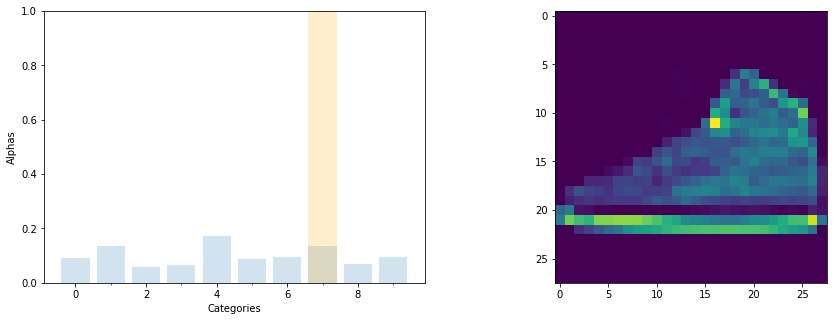

tensor([ 8.1475, 12.2951,  5.2241,  5.9417, 15.3532,  7.9746,  8.4211, 12.0925,
         6.1097,  8.5582])
tensor(4) tensor([7])
out:  tensor([0])


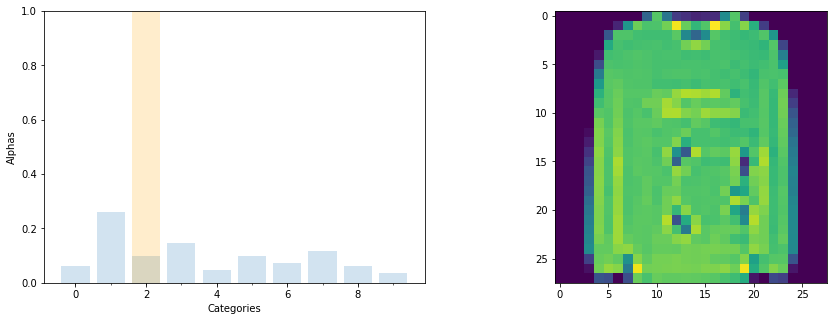

tensor([ 28.2880, 120.3604,  44.8585,  66.6563,  22.1375,  45.0005,  33.7264,
         53.2617,  28.6057,  16.2791])
tensor(1) tensor([2])
out:  tensor([8])


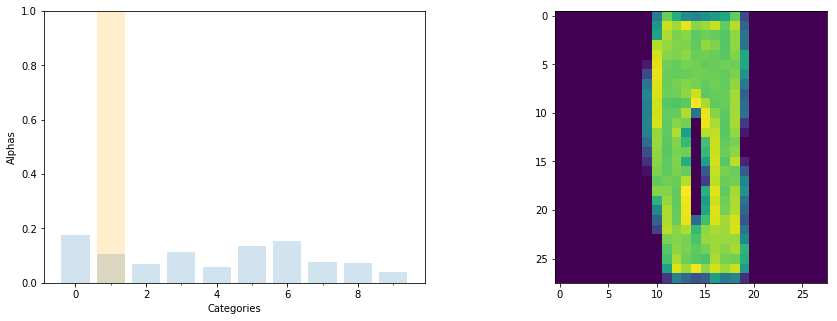

tensor([13.0585,  7.8719,  5.2229,  8.4402,  4.4461, 10.0374, 11.6695,  5.8295,
         5.3604,  3.0586])
tensor(0) tensor([1])
out:  tensor([8])


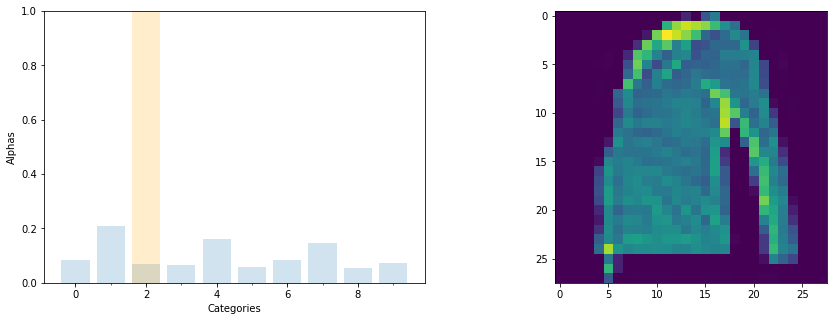

tensor([32.3649, 82.1578, 26.9513, 25.1748, 62.9125, 21.9874, 32.4436, 57.4696,
        20.8592, 27.7380])
tensor(1) tensor([2])
out:  tensor([0])


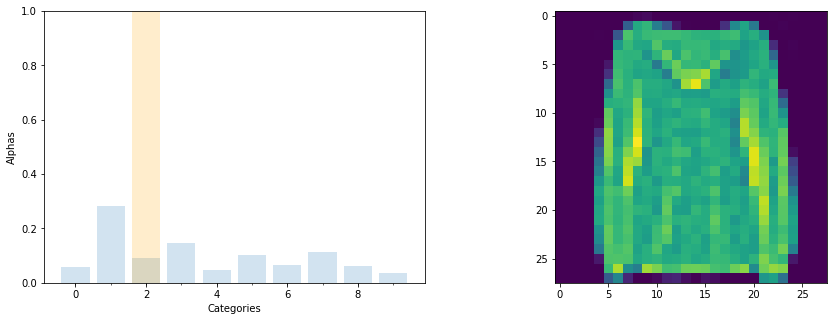

tensor([12.3716, 61.9073, 19.7767, 32.1721, 10.4760, 22.0725, 14.3677, 25.1151,
        13.3501,  7.7277])
tensor(1) tensor([2])
out:  tensor([8])


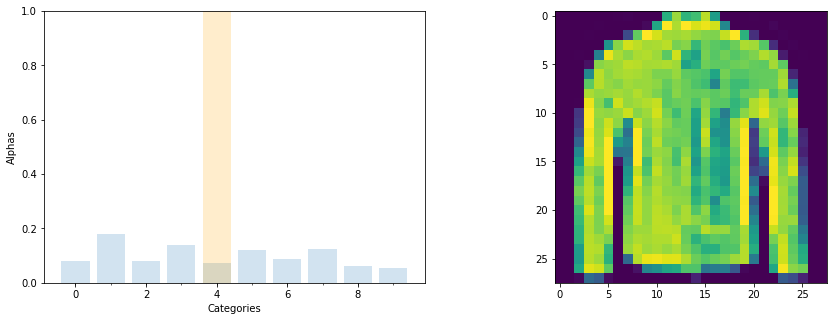

tensor([29.3087, 66.3934, 29.7432, 51.8888, 26.4169, 44.5611, 32.6644, 45.3834,
        23.1002, 19.9024])
tensor(1) tensor([4])
out:  tensor([6])


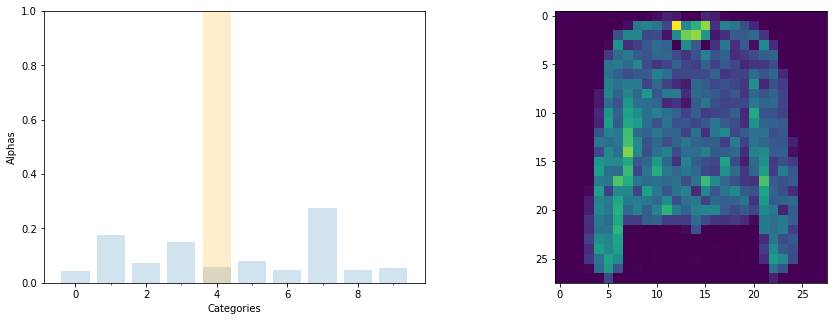

tensor([15.3405, 62.9250, 26.3900, 53.9292, 20.9679, 28.3692, 16.4572, 99.4231,
        17.5857, 19.8418])
tensor(7) tensor([4])
out:  tensor([2])


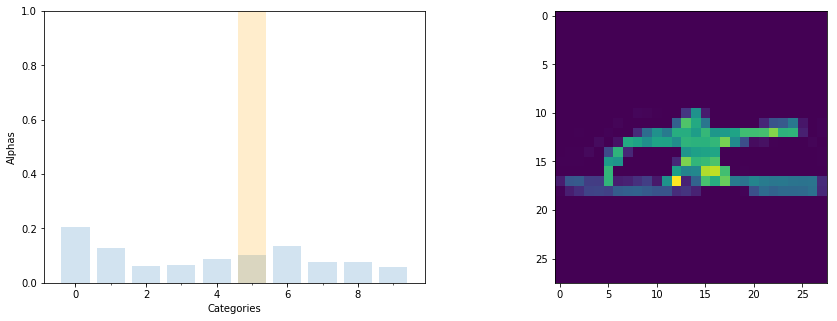

tensor([18.9204, 11.9595,  5.5964,  6.2069,  8.0382,  9.3595, 12.5635,  7.1608,
         7.0204,  5.5022])
tensor(0) tensor([5])
out:  tensor([0])


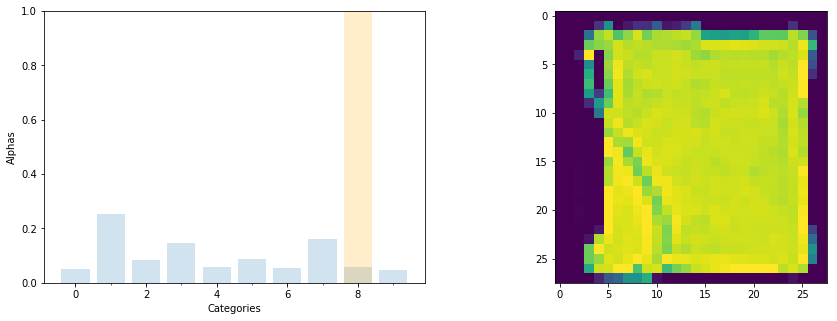

tensor([10.3489, 51.3014, 17.1538, 29.7392, 12.1199, 17.6929, 10.9092, 32.6514,
        11.6169,  9.5574])
tensor(1) tensor([8])
out:  tensor([8])


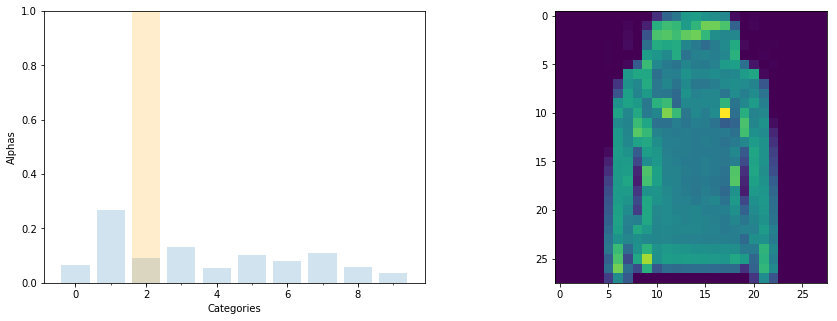

tensor([23.0522, 93.4675, 31.5674, 45.7929, 19.0024, 34.8890, 27.9448, 37.5593,
        20.3363, 13.1012])
tensor(1) tensor([2])
out:  tensor([4])


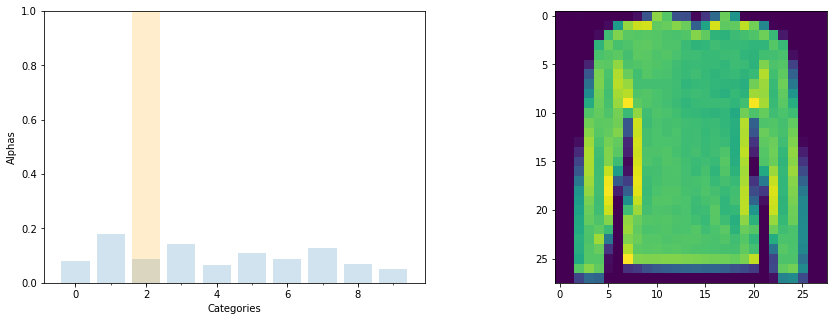

tensor([ 45.5612, 103.8615,  50.6454,  82.1906,  38.4194,  62.1214,  49.6260,
         73.1520,  40.3493,  30.1194])
tensor(1) tensor([2])
out:  tensor([2])


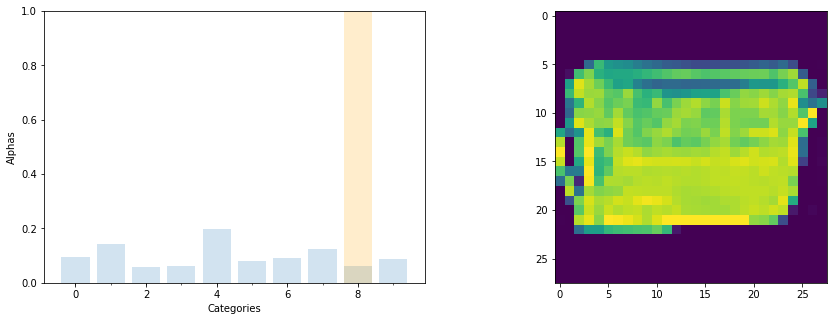

tensor([ 5.6213,  8.2211,  3.3425,  3.5033, 11.5546,  4.6639,  5.2745,  7.1717,
         3.6244,  5.1483])
tensor(4) tensor([8])
out:  tensor([8])


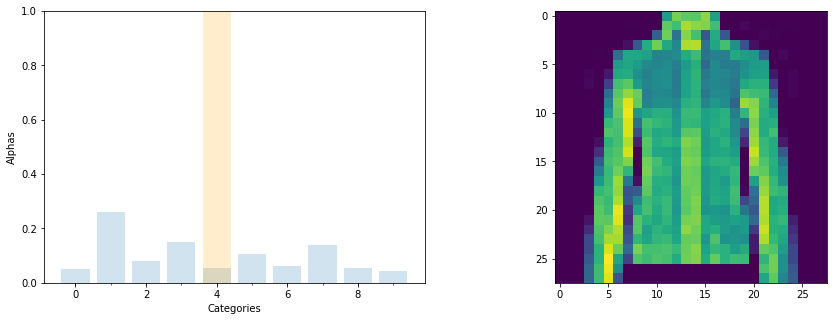

tensor([ 9.6430, 49.0174, 14.9749, 27.9545, 10.4668, 20.0744, 11.3912, 26.0526,
        10.5950,  8.0490])
tensor(1) tensor([4])
out:  tensor([2])


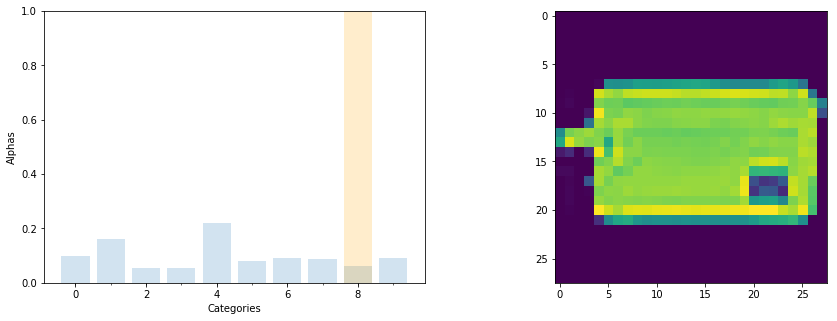

tensor([ 5.6521,  9.1834,  3.1146,  3.1486, 12.6640,  4.5025,  5.2376,  4.9648,
         3.4735,  5.1536])
tensor(4) tensor([8])
out:  tensor([8])


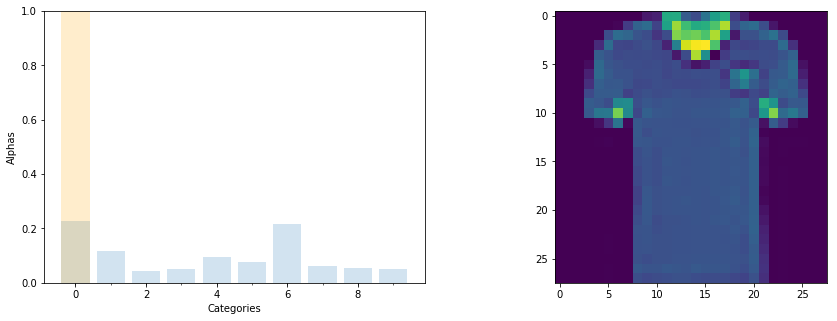

tensor([123.3531,  63.6258,  24.4744,  27.7111,  52.2257,  41.4887, 117.3639,
         33.4554,  30.1175,  27.1362])
tensor(0) tensor([0])
out:  tensor([2])


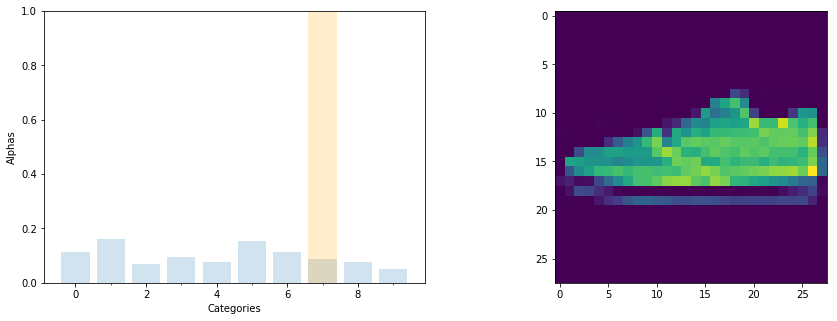

tensor([ 8.0297, 11.4944,  4.8983,  6.6839,  5.3144, 10.9678,  8.0924,  6.2079,
         5.4759,  3.4923])
tensor(1) tensor([7])
out:  tensor([6])


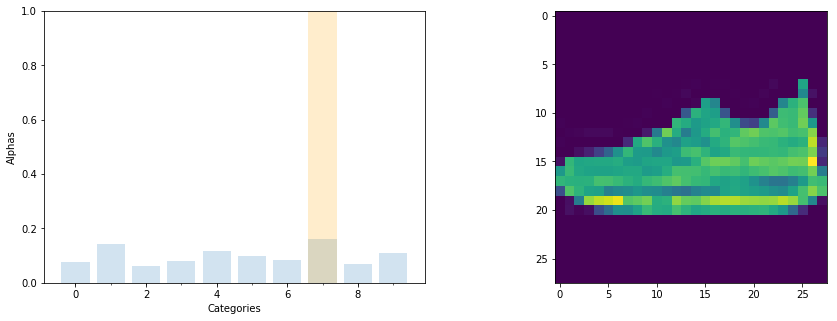

tensor([ 8.0423, 15.0660,  6.3206,  8.5128, 12.3190, 10.2381,  8.8423, 16.9800,
         7.1139, 11.5517])
tensor(7) tensor([7])
out:  tensor([8])


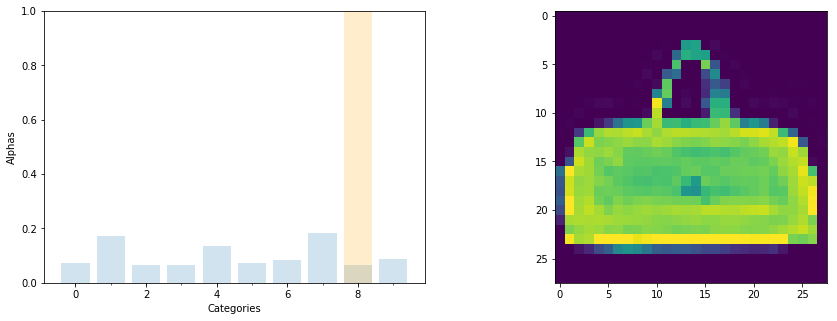

tensor([ 5.0899, 12.1817,  4.5736,  4.7427,  9.7542,  5.1067,  5.9655, 13.0779,
         4.7207,  6.1217])
tensor(7) tensor([8])
out:  tensor([0])


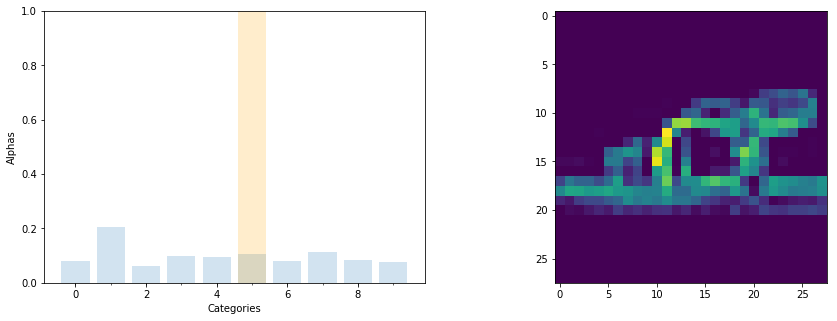

tensor([18.8877, 48.4627, 14.7545, 23.0597, 22.1699, 24.8890, 18.8411, 26.4198,
        19.6865, 18.1264])
tensor(1) tensor([5])
out:  tensor([7])


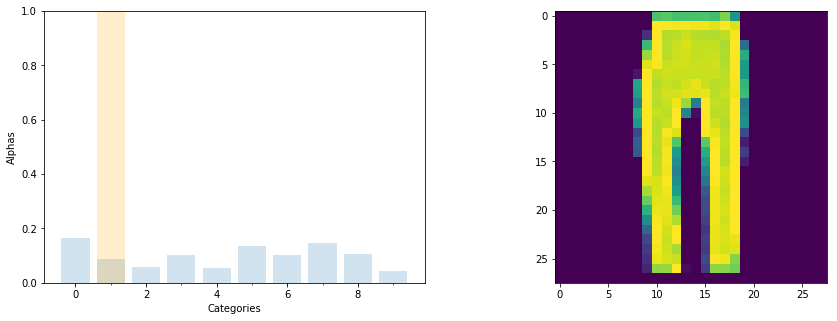

tensor([7.6357, 4.1170, 2.6936, 4.6699, 2.4731, 6.2712, 4.6669, 6.7076, 4.9275,
        2.0180])
tensor(0) tensor([1])
out:  tensor([8])


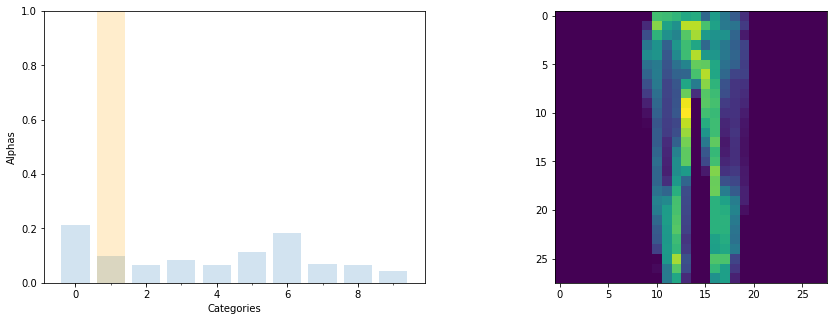

tensor([42.7017, 19.6319, 13.0504, 16.7464, 12.7786, 22.5895, 36.9241, 14.1248,
        13.0240,  8.3754])
tensor(0) tensor([1])
out:  tensor([8])


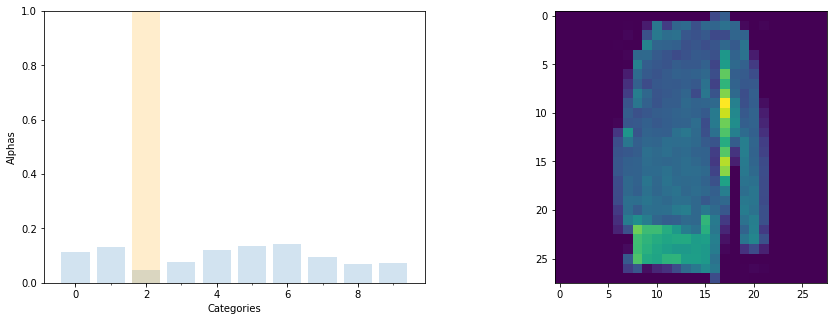

tensor([49.4025, 56.7624, 21.3664, 33.1726, 52.7670, 58.5895, 62.0235, 41.0549,
        29.5895, 31.9349])
tensor(6) tensor([2])
out:  tensor([4])


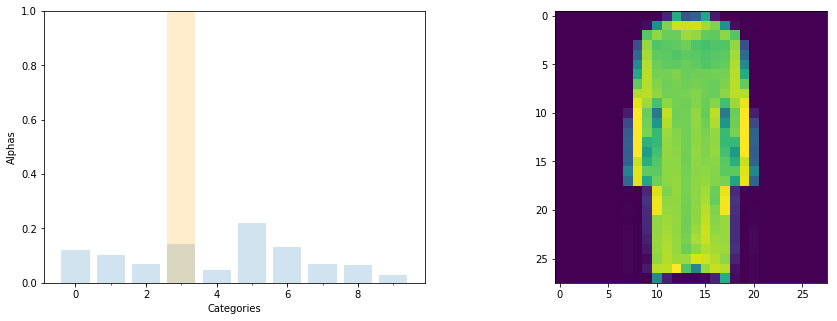

tensor([ 9.4345,  8.0073,  5.4243, 11.2908,  3.7171, 17.2800, 10.4578,  5.5604,
         5.0271,  2.2441])
tensor(5) tensor([3])
out:  tensor([5])


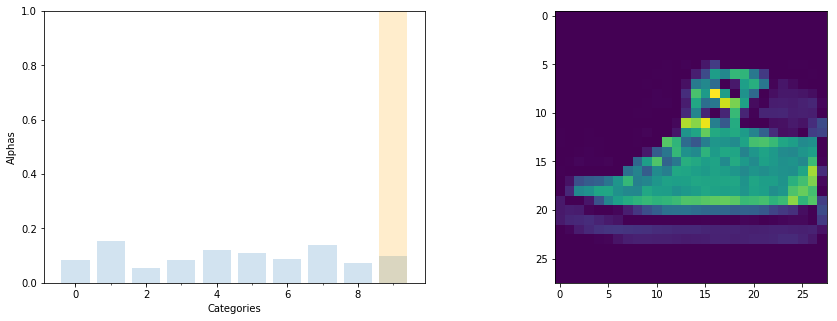

tensor([12.5941, 23.1168,  8.0867, 12.5570, 18.5203, 16.6299, 13.1935, 21.0930,
        10.9650, 15.0344])
tensor(1) tensor([9])
out:  tensor([8])


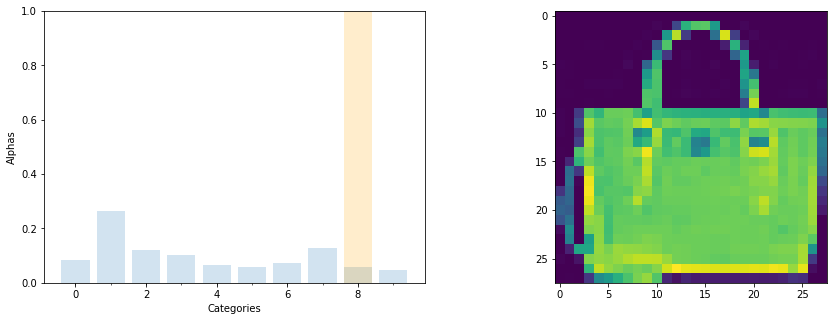

tensor([15.4660, 49.5100, 22.7692, 19.2424, 12.4037, 10.9683, 13.6118, 24.4220,
        11.2431,  8.5971])
tensor(1) tensor([8])
out:  tensor([4])


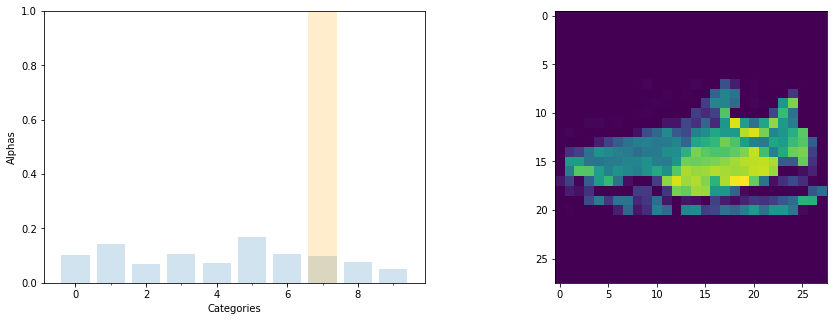

tensor([ 8.2482, 11.4624,  5.5430,  8.4979,  5.9036, 13.4741,  8.4662,  7.8136,
         6.0633,  4.0325])
tensor(5) tensor([7])
out:  tensor([7])


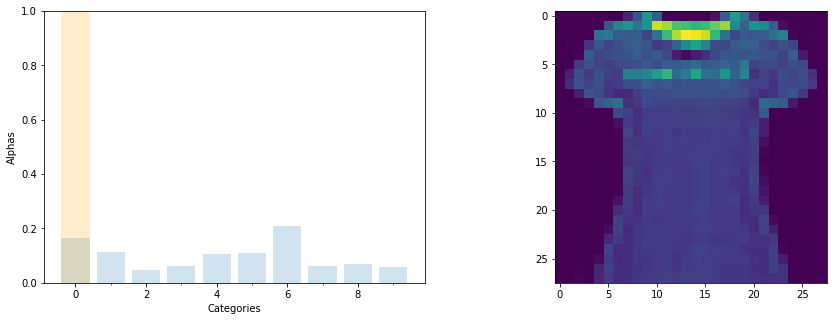

tensor([191.8453, 132.4114,  52.7545,  72.2887, 125.1124, 126.8892, 242.1519,
         72.7430,  80.7622,  65.4377])
tensor(6) tensor([0])
out:  tensor([0])


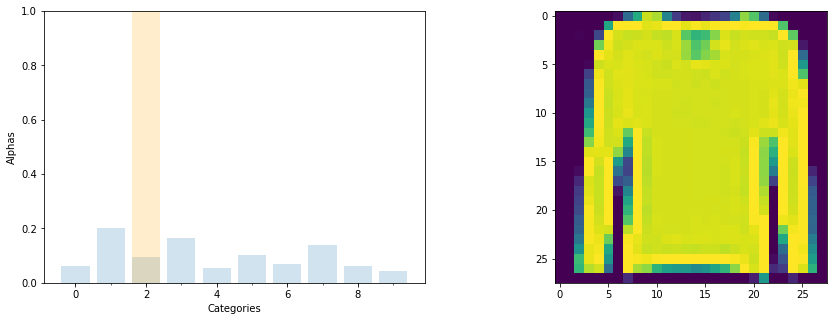

tensor([24.9975, 81.5085, 38.0732, 66.7298, 22.4162, 41.7261, 27.6421, 55.3045,
        24.9551, 17.6301])
tensor(1) tensor([2])
out:  tensor([4])


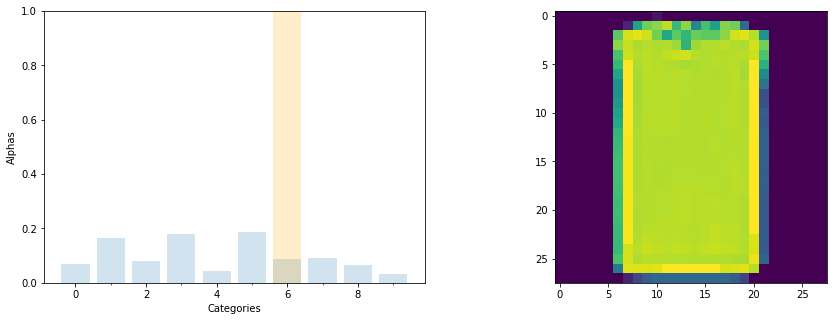

tensor([ 6.9169, 16.1749,  7.9551, 17.7180,  4.1532, 18.2000,  8.4764,  9.0354,
         6.2932,  3.0338])
tensor(5) tensor([6])
out:  tensor([8])


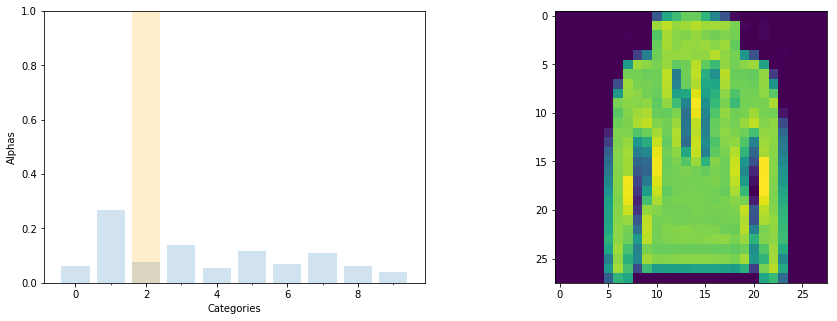

tensor([ 8.1997, 36.0749, 10.5714, 18.6460,  7.4720, 15.7471,  9.5378, 14.7958,
         8.5408,  5.5297])
tensor(1) tensor([2])
out:  tensor([8])


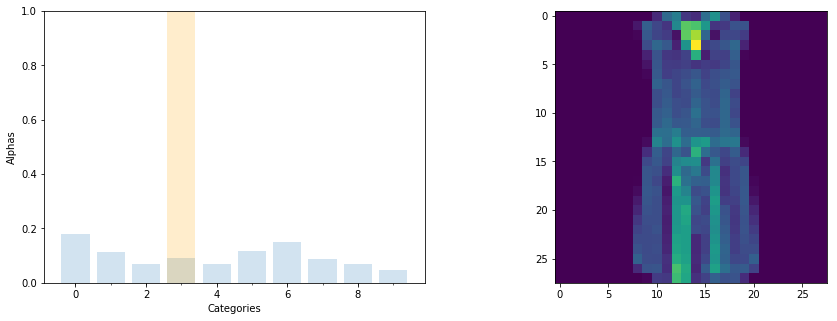

tensor([134.7627,  85.6868,  51.7582,  68.3842,  51.2541,  88.1240, 110.9430,
         66.1848,  51.9816,  35.1151])
tensor(0) tensor([3])
out:  tensor([8])


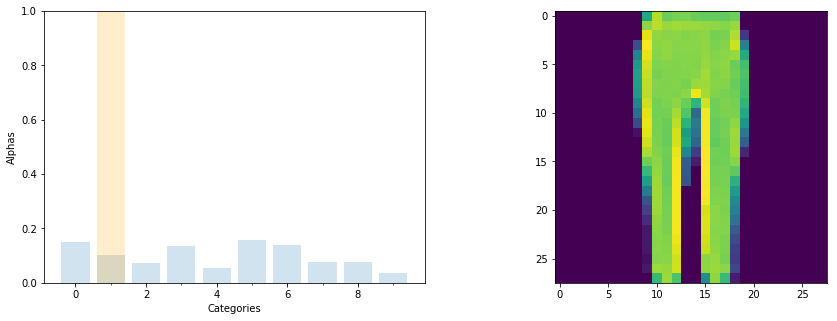

tensor([10.1868,  6.7995,  4.8997,  9.0894,  3.5903, 10.4589,  9.3665,  5.2495,
         5.0532,  2.4102])
tensor(5) tensor([1])
out:  tensor([0])


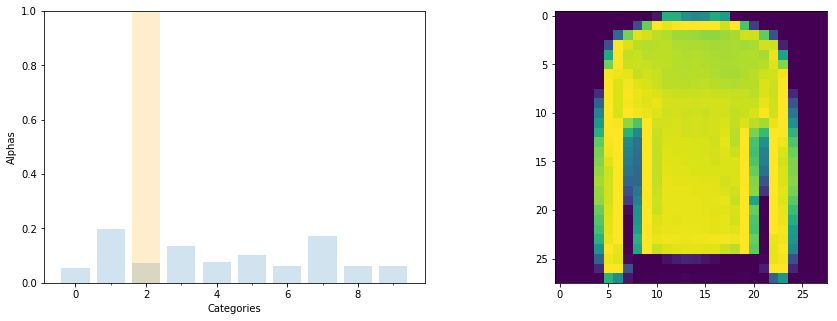

tensor([ 8.2106, 29.1374, 10.8841, 20.0545, 11.3709, 15.2317,  9.0822, 25.5951,
         8.8988,  9.2894])
tensor(1) tensor([2])
out:  tensor([2])


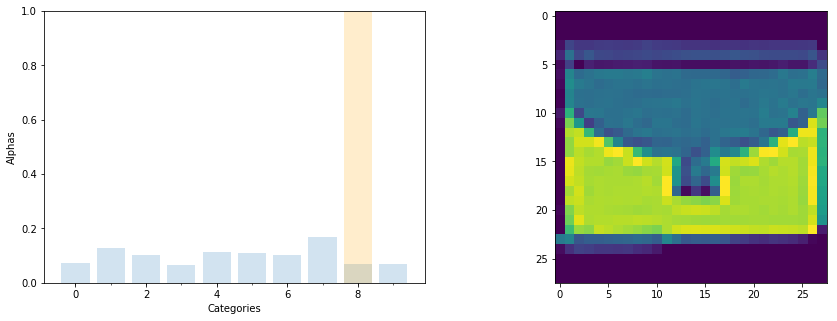

tensor([ 5.2046,  9.2153,  7.3009,  4.6736,  8.0484,  7.8693,  7.4481, 12.1588,
         4.9582,  5.1101])
tensor(7) tensor([8])
out:  tensor([0])


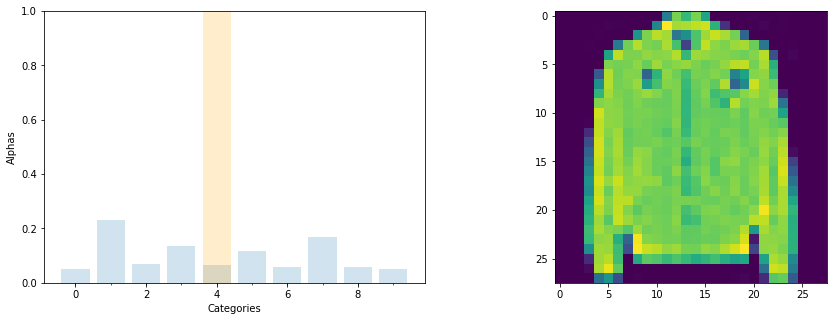

tensor([ 9.9595, 46.2572, 13.9872, 27.2952, 13.0698, 23.2320, 11.9537, 33.6721,
        11.8351, 10.4300])
tensor(1) tensor([4])
out:  tensor([7])


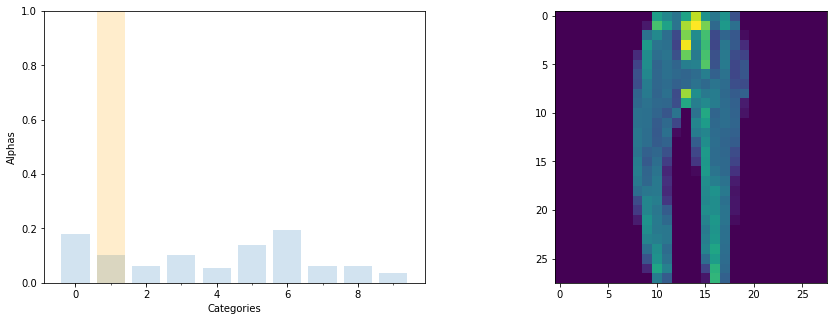

tensor([55.0685, 31.4325, 18.9911, 30.5418, 16.7568, 42.3968, 59.5352, 18.9230,
        19.1950, 10.9896])
tensor(6) tensor([1])
out:  tensor([8])


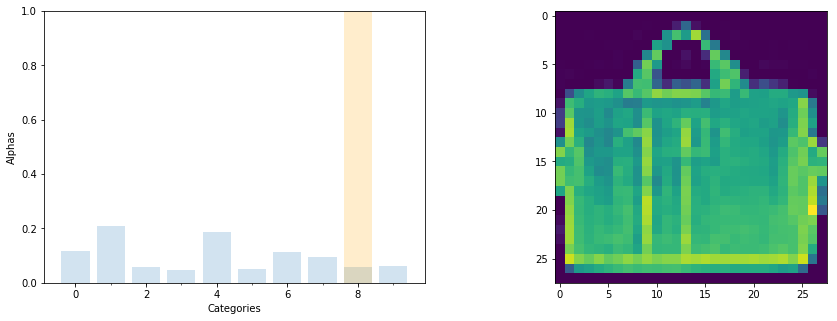

tensor([16.5546, 29.5517,  8.3447,  6.8080, 26.3857,  7.3802, 15.9056, 13.2120,
         8.2837,  8.4819])
tensor(1) tensor([8])
out:  tensor([5])


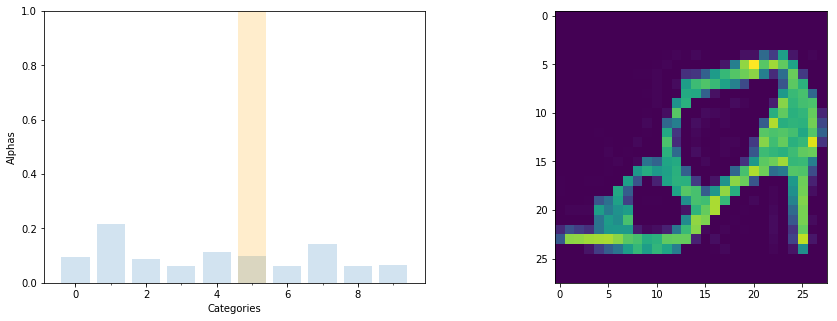

tensor([ 4.4951, 10.4295,  4.1981,  2.9267,  5.4460,  4.7269,  3.0211,  6.9539,
         2.9152,  3.0795])
tensor(1) tensor([5])
out:  tensor([2])


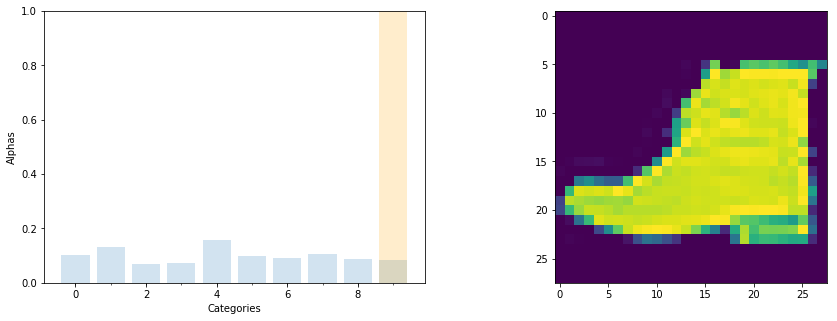

tensor([4.2662, 5.4581, 2.8153, 2.9687, 6.6095, 4.1721, 3.7755, 4.4375, 3.6244,
        3.4380])
tensor(4) tensor([9])
out:  tensor([5])


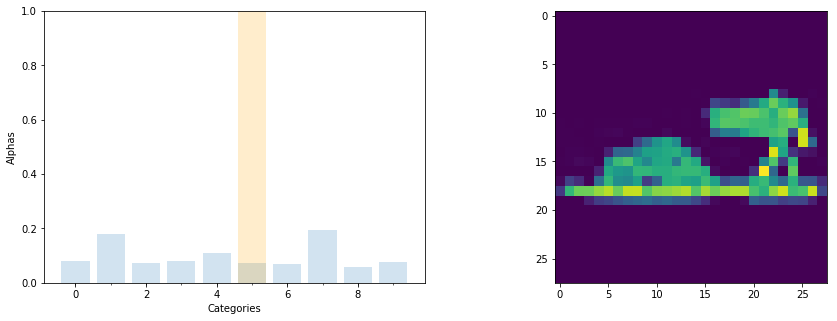

tensor([ 7.2365, 16.0453,  6.6068,  6.9806,  9.6752,  6.5935,  6.2480, 17.1991,
         5.0538,  6.8382])
tensor(7) tensor([5])
out:  tensor([7])


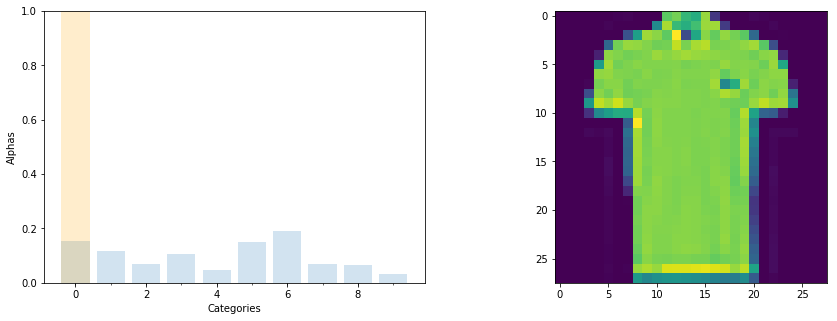

tensor([22.0196, 16.9493, 10.0981, 15.3770,  6.7798, 21.4356, 27.2734,  9.7700,
         9.4027,  4.6457])
tensor(6) tensor([0])
out:  tensor([1])


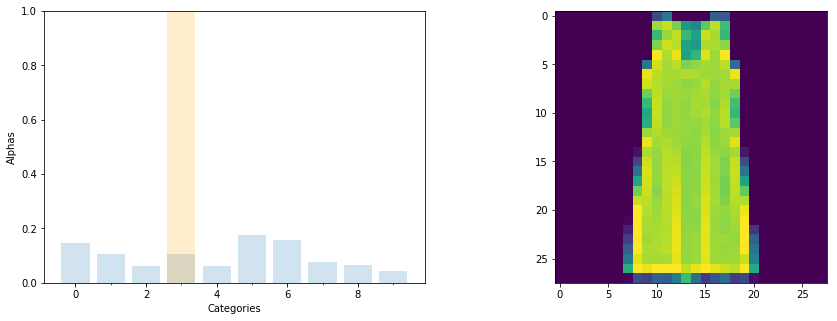

tensor([12.9083,  9.2408,  5.3323,  9.3976,  5.4483, 15.2771, 13.9305,  6.5580,
         5.8277,  3.7833])
tensor(5) tensor([3])
out:  tensor([7])


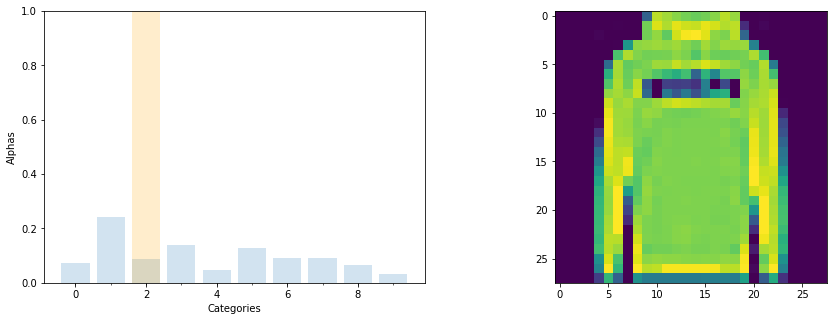

tensor([10.3599, 34.7903, 12.6919, 20.1677,  6.6386, 18.1040, 13.0446, 13.2358,
         9.5998,  4.6529])
tensor(1) tensor([2])
out:  tensor([8])


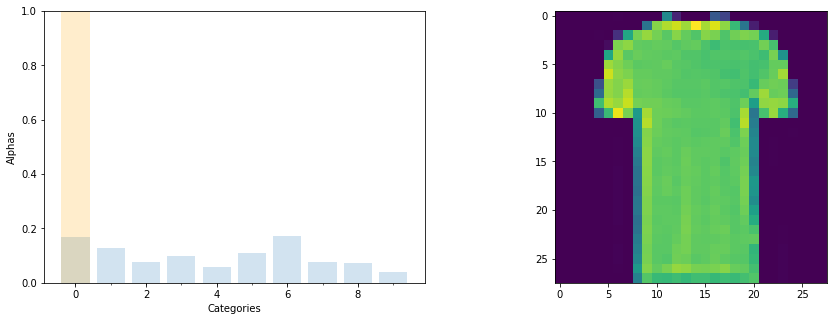

tensor([20.0477, 15.0663,  8.8281, 11.7379,  6.9698, 12.9702, 20.4413,  8.9963,
         8.4790,  4.6409])
tensor(6) tensor([0])
out:  tensor([8])


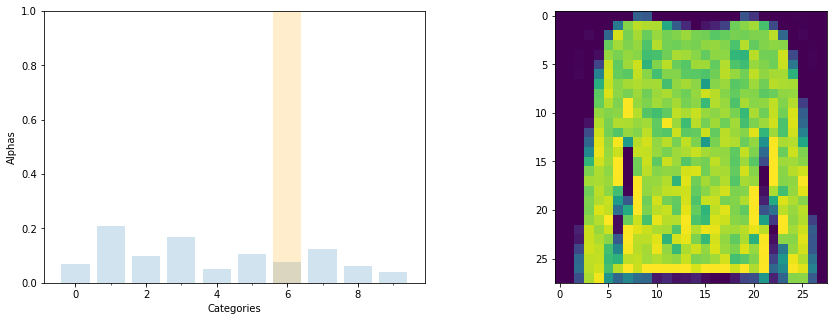

tensor([26.5708, 80.9753, 37.9123, 64.2418, 19.8430, 40.3070, 28.8591, 47.5920,
        23.1169, 15.2418])
tensor(1) tensor([6])
out:  tensor([2])


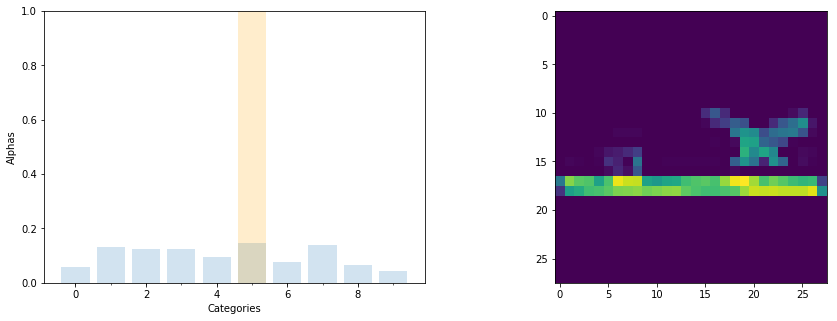

tensor([2.9976, 6.8678, 6.5169, 6.5234, 5.0006, 7.6590, 3.9983, 7.3232, 3.4025,
        2.2828])
tensor(5) tensor([5])
out:  tensor([8])


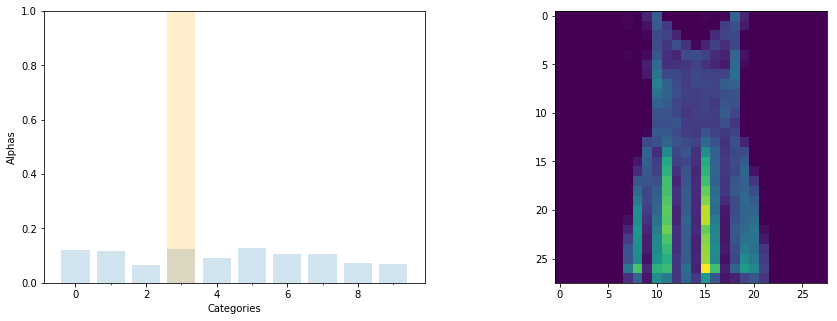

tensor([79.8847, 76.7117, 43.8059, 81.8375, 61.1917, 84.5646, 70.0446, 70.0244,
        46.9260, 45.7035])
tensor(5) tensor([3])
out:  tensor([0])


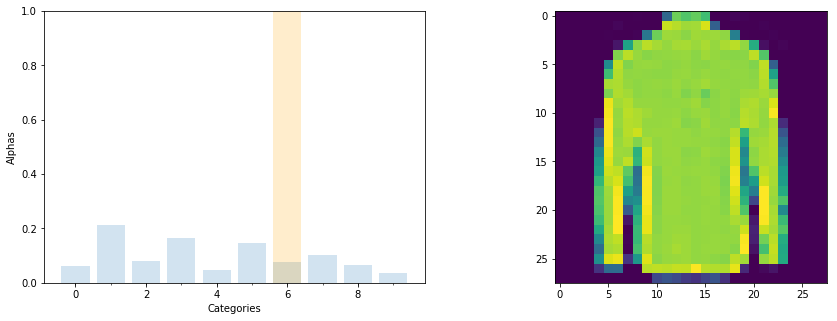

tensor([ 9.8063, 33.0829, 12.5439, 25.4111,  7.4150, 22.9834, 12.1181, 16.1128,
        10.1109,  5.5290])
tensor(1) tensor([6])
out:  tensor([2])


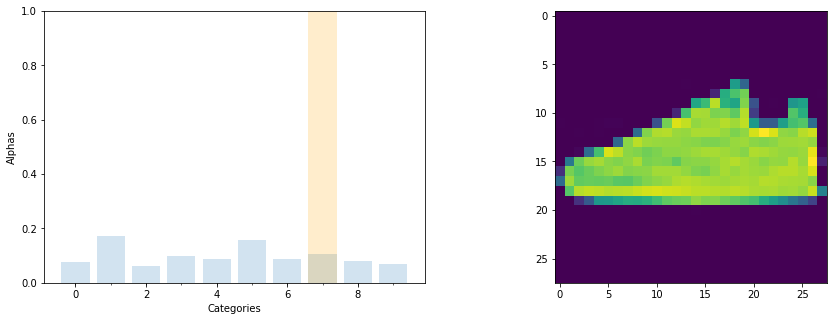

tensor([ 4.7994, 10.5551,  3.6847,  5.9681,  5.2693,  9.7545,  5.3807,  6.5610,
         5.0289,  4.3263])
tensor(1) tensor([7])
out:  tensor([8])


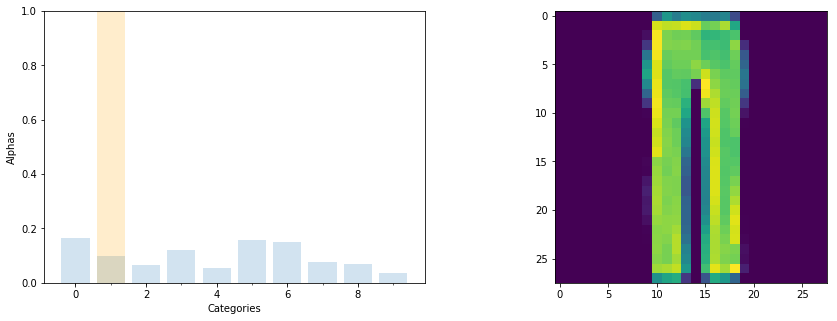

tensor([10.4016,  6.2848,  4.0947,  7.5285,  3.5088,  9.9388,  9.4186,  4.7712,
         4.3828,  2.3717])
tensor(0) tensor([1])
out:  tensor([8])


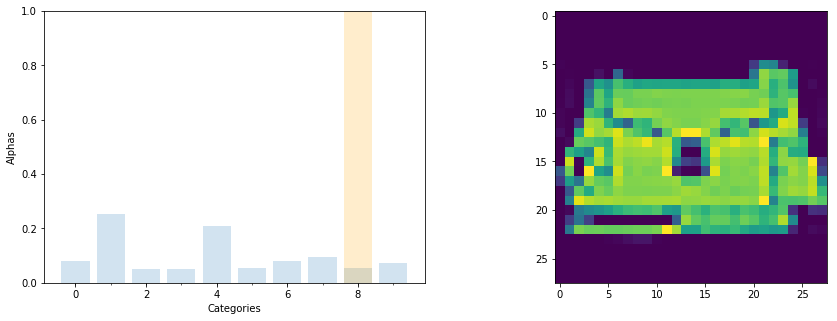

tensor([ 9.1019, 28.2311,  5.6208,  5.6867, 23.1164,  5.9608,  9.0788, 10.3700,
         5.9237,  8.1247])
tensor(1) tensor([8])
out:  tensor([8])


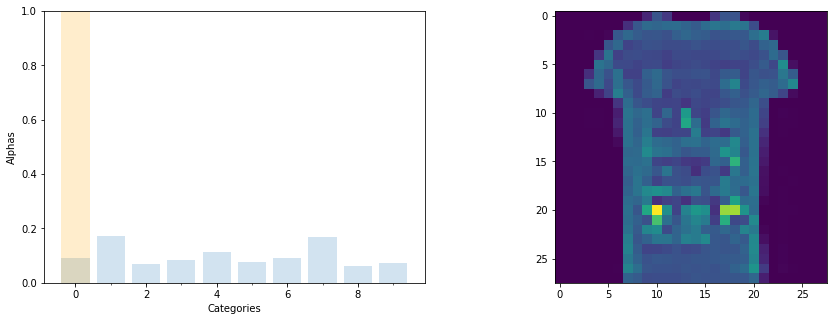

tensor([ 59.9059, 113.4378,  46.3727,  55.0042,  74.8555,  51.3140,  60.0557,
        112.3579,  39.9026,  49.4117])
tensor(1) tensor([0])
out:  tensor([4])


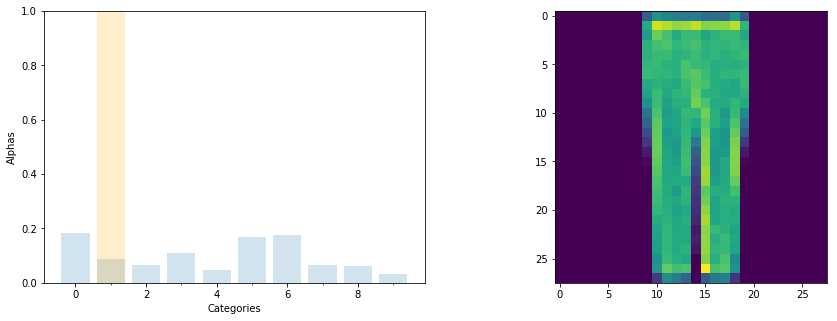

tensor([32.0340, 15.5067, 11.2073, 19.0910,  8.4038, 29.3416, 30.6847, 11.4008,
        11.0994,  5.7676])
tensor(0) tensor([1])
out:  tensor([0])


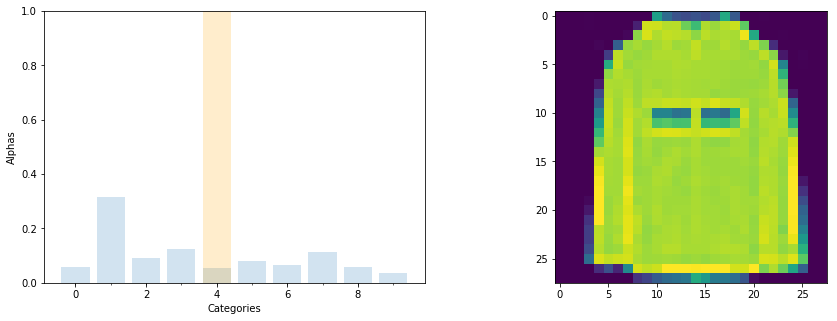

tensor([12.4231, 68.8311, 19.9196, 26.6780, 11.7410, 17.6967, 14.0314, 24.6147,
        12.9560,  8.1504])
tensor(1) tensor([4])
out:  tensor([0])


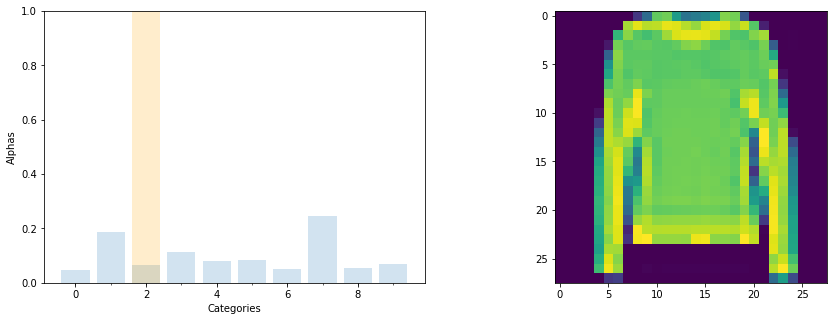

tensor([ 5.3172, 20.8975,  7.1922, 12.3954,  9.1152,  9.5233,  5.6260, 27.2704,
         6.1362,  7.7145])
tensor(7) tensor([2])
non_nan or inf:  100


(0.05, 0.1)

In [14]:
mnist_net = LPADirNN()
print("loading model from: {}".format(MNIST_PATH))
mnist_net.load_state_dict(torch.load(MNIST_PATH))
mnist_net.eval()
evaluate_fmnist(model=mnist_net,
                mus_w_mean=mus_w_mean_mnist,
                mus_b_mean=mus_b_mean_mnist,
                sigmas_w_mean=sigmas_w_mean_mnist,
                sigmas_b_mean=sigmas_b_mean_mnist,
                show=True,
                test_size=99)

/home/marius/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


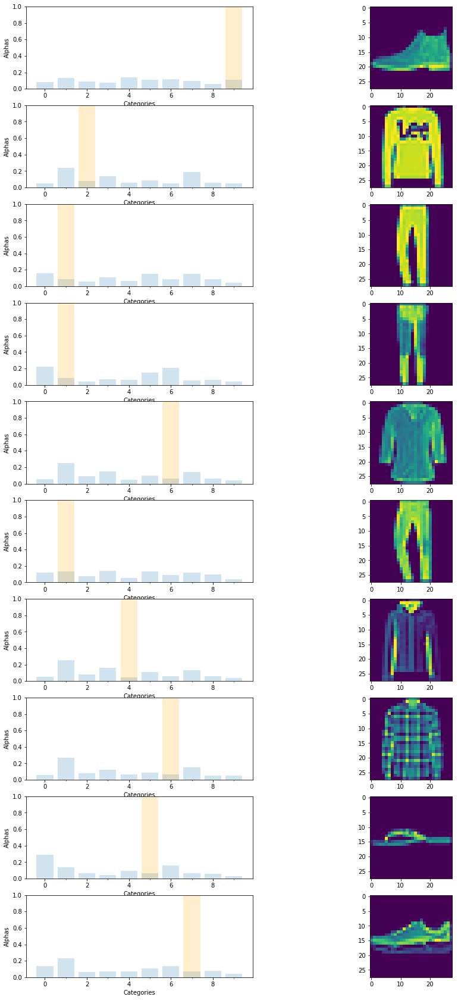

()

In [41]:
plot_fmnist(model=mnist_net,
                mus_w_mean=mus_w_mean_mnist,
                mus_b_mean=mus_b_mean_mnist,
                sigmas_w_mean=sigmas_w_mean_mnist,
                sigmas_b_mean=sigmas_b_mean_mnist,
                filename='figures/MNIST_model_on_FMNIST.pdf'
               )

# Now: Train on FMNIST and test on MNIST

In [173]:
STEP_SIZE_TRAIN_FMNIST = 1 * 10e-6
BATCH_SIZE_FMNIST = 128
MAX_ITER_FMNIST = 35
TEST_BATCH_SIZE_FMNIST = 1
STEP_SIZE_HESS_FMNIST = 1 * 10e-7

In [174]:
train_loader_fmnist = torch.utils.data.DataLoader(
    torchvision.datasets.FashionMNIST(
        './fmnist', train=True, download=True,
        transform=torchvision.transforms.ToTensor()),
    batch_size=BATCH_SIZE_FMNIST, shuffle=True)

test_loader_fmnist = torch.utils.data.DataLoader(
    torchvision.datasets.FashionMNIST(
        './fmnist', train=False, download=True,
        transform=torchvision.transforms.ToTensor()),
    batch_size=TEST_BATCH_SIZE_FMNIST, shuffle=False)

In [175]:
"""
Step 3: Tell BackPACK about the model and loss function, 
create the optimizer, and we will be ready to go
"""

fmnist_model = LPADirNN()
loss_function = torch.nn.CrossEntropyLoss()

extend(fmnist_model)
extend(loss_function)

fmnist_train_optimizer = torch.optim.Adam(fmnist_model.parameters(), lr=STEP_SIZE_TRAIN_FMNIST)

In [176]:
"""
Final step: The training loop!

The only difference with a traditional training loop:
Before calling the backward pass, we will call
```
    with backpack(DiagGGNMC()):
```
BackPACK will then add the diagonal of the GGN in the
`diag_ggn_mc` field during the backward pass.
"""

for iter in range(MAX_ITER_FMNIST):
    for batch_idx, (x, y) in enumerate(train_loader_fmnist):
        max_len = int(np.ceil(len(train_loader_fmnist.dataset)/BATCH_SIZE_FMNIST))
        output = fmnist_model(x, phi=False)

        accuracy = get_accuracy(output, y)

        #with backpack(DiagGGNMC()):
        #    loss = loss_function(output, y)
        #    loss.backward()
        #    fmnist_optimizer.step()
        
        loss = loss_function(output, y)
        loss.backward()
        fmnist_train_optimizer.step()


        print(
            "Iteration {}; {}/{} \t".format(iter, batch_idx, max_len) +
            "Minibatch Loss %.3f  " % (loss) +
            "Accuracy %.0f" % (accuracy * 100) + "%"
        )

FMNIST_PATH = "models/fmnist_test.pth"
print("saving model at: {}".format(FMNIST_PATH))
torch.save(fmnist_model.state_dict(), FMNIST_PATH)

Iteration 0; 0/469 	Minibatch Loss 2.301  Accuracy 11%
Iteration 0; 1/469 	Minibatch Loss 2.299  Accuracy 12%
Iteration 0; 2/469 	Minibatch Loss 2.303  Accuracy 8%
Iteration 0; 3/469 	Minibatch Loss 2.303  Accuracy 5%
Iteration 0; 4/469 	Minibatch Loss 2.300  Accuracy 8%
Iteration 0; 5/469 	Minibatch Loss 2.300  Accuracy 8%
Iteration 0; 6/469 	Minibatch Loss 2.297  Accuracy 8%
Iteration 0; 7/469 	Minibatch Loss 2.297  Accuracy 12%
Iteration 0; 8/469 	Minibatch Loss 2.296  Accuracy 10%
Iteration 0; 9/469 	Minibatch Loss 2.300  Accuracy 5%
Iteration 0; 10/469 	Minibatch Loss 2.300  Accuracy 9%
Iteration 0; 11/469 	Minibatch Loss 2.294  Accuracy 9%
Iteration 0; 12/469 	Minibatch Loss 2.296  Accuracy 9%
Iteration 0; 13/469 	Minibatch Loss 2.295  Accuracy 9%
Iteration 0; 14/469 	Minibatch Loss 2.296  Accuracy 8%
Iteration 0; 15/469 	Minibatch Loss 2.292  Accuracy 14%
Iteration 0; 16/469 	Minibatch Loss 2.294  Accuracy 9%
Iteration 0; 17/469 	Minibatch Loss 2.294  Accuracy 4%
Iteration 0; 18

Iteration 0; 146/469 	Minibatch Loss 2.157  Accuracy 53%
Iteration 0; 147/469 	Minibatch Loss 2.158  Accuracy 55%
Iteration 0; 148/469 	Minibatch Loss 2.141  Accuracy 55%
Iteration 0; 149/469 	Minibatch Loss 2.152  Accuracy 52%
Iteration 0; 150/469 	Minibatch Loss 2.147  Accuracy 59%
Iteration 0; 151/469 	Minibatch Loss 2.146  Accuracy 56%
Iteration 0; 152/469 	Minibatch Loss 2.133  Accuracy 59%
Iteration 0; 153/469 	Minibatch Loss 2.138  Accuracy 56%
Iteration 0; 154/469 	Minibatch Loss 2.140  Accuracy 52%
Iteration 0; 155/469 	Minibatch Loss 2.142  Accuracy 60%
Iteration 0; 156/469 	Minibatch Loss 2.136  Accuracy 53%
Iteration 0; 157/469 	Minibatch Loss 2.144  Accuracy 52%
Iteration 0; 158/469 	Minibatch Loss 2.134  Accuracy 61%
Iteration 0; 159/469 	Minibatch Loss 2.143  Accuracy 55%
Iteration 0; 160/469 	Minibatch Loss 2.135  Accuracy 61%
Iteration 0; 161/469 	Minibatch Loss 2.115  Accuracy 66%
Iteration 0; 162/469 	Minibatch Loss 2.126  Accuracy 60%
Iteration 0; 163/469 	Minibatch

Iteration 0; 292/469 	Minibatch Loss 1.707  Accuracy 57%
Iteration 0; 293/469 	Minibatch Loss 1.739  Accuracy 59%
Iteration 0; 294/469 	Minibatch Loss 1.687  Accuracy 58%
Iteration 0; 295/469 	Minibatch Loss 1.643  Accuracy 59%
Iteration 0; 296/469 	Minibatch Loss 1.734  Accuracy 55%
Iteration 0; 297/469 	Minibatch Loss 1.726  Accuracy 62%
Iteration 0; 298/469 	Minibatch Loss 1.685  Accuracy 62%
Iteration 0; 299/469 	Minibatch Loss 1.717  Accuracy 60%
Iteration 0; 300/469 	Minibatch Loss 1.647  Accuracy 66%
Iteration 0; 301/469 	Minibatch Loss 1.739  Accuracy 55%
Iteration 0; 302/469 	Minibatch Loss 1.680  Accuracy 60%
Iteration 0; 303/469 	Minibatch Loss 1.645  Accuracy 66%
Iteration 0; 304/469 	Minibatch Loss 1.707  Accuracy 59%
Iteration 0; 305/469 	Minibatch Loss 1.672  Accuracy 62%
Iteration 0; 306/469 	Minibatch Loss 1.632  Accuracy 60%
Iteration 0; 307/469 	Minibatch Loss 1.726  Accuracy 61%
Iteration 0; 308/469 	Minibatch Loss 1.596  Accuracy 66%
Iteration 0; 309/469 	Minibatch

Iteration 0; 436/469 	Minibatch Loss 1.171  Accuracy 69%
Iteration 0; 437/469 	Minibatch Loss 1.266  Accuracy 63%
Iteration 0; 438/469 	Minibatch Loss 1.291  Accuracy 59%
Iteration 0; 439/469 	Minibatch Loss 1.311  Accuracy 64%
Iteration 0; 440/469 	Minibatch Loss 1.178  Accuracy 66%
Iteration 0; 441/469 	Minibatch Loss 1.241  Accuracy 65%
Iteration 0; 442/469 	Minibatch Loss 1.212  Accuracy 60%
Iteration 0; 443/469 	Minibatch Loss 1.249  Accuracy 64%
Iteration 0; 444/469 	Minibatch Loss 1.205  Accuracy 65%
Iteration 0; 445/469 	Minibatch Loss 1.267  Accuracy 64%
Iteration 0; 446/469 	Minibatch Loss 1.101  Accuracy 69%
Iteration 0; 447/469 	Minibatch Loss 1.188  Accuracy 66%
Iteration 0; 448/469 	Minibatch Loss 1.184  Accuracy 64%
Iteration 0; 449/469 	Minibatch Loss 1.190  Accuracy 64%
Iteration 0; 450/469 	Minibatch Loss 1.281  Accuracy 60%
Iteration 0; 451/469 	Minibatch Loss 1.269  Accuracy 54%
Iteration 0; 452/469 	Minibatch Loss 1.188  Accuracy 70%
Iteration 0; 453/469 	Minibatch

Iteration 1; 114/469 	Minibatch Loss 0.895  Accuracy 70%
Iteration 1; 115/469 	Minibatch Loss 0.970  Accuracy 64%
Iteration 1; 116/469 	Minibatch Loss 0.882  Accuracy 76%
Iteration 1; 117/469 	Minibatch Loss 0.836  Accuracy 67%
Iteration 1; 118/469 	Minibatch Loss 0.986  Accuracy 67%
Iteration 1; 119/469 	Minibatch Loss 1.001  Accuracy 67%
Iteration 1; 120/469 	Minibatch Loss 0.945  Accuracy 64%
Iteration 1; 121/469 	Minibatch Loss 0.820  Accuracy 78%
Iteration 1; 122/469 	Minibatch Loss 0.964  Accuracy 65%
Iteration 1; 123/469 	Minibatch Loss 1.066  Accuracy 62%
Iteration 1; 124/469 	Minibatch Loss 0.885  Accuracy 72%
Iteration 1; 125/469 	Minibatch Loss 0.806  Accuracy 71%
Iteration 1; 126/469 	Minibatch Loss 0.844  Accuracy 71%
Iteration 1; 127/469 	Minibatch Loss 1.003  Accuracy 63%
Iteration 1; 128/469 	Minibatch Loss 0.949  Accuracy 66%
Iteration 1; 129/469 	Minibatch Loss 1.006  Accuracy 67%
Iteration 1; 130/469 	Minibatch Loss 0.989  Accuracy 65%
Iteration 1; 131/469 	Minibatch

Iteration 1; 260/469 	Minibatch Loss 0.847  Accuracy 70%
Iteration 1; 261/469 	Minibatch Loss 0.951  Accuracy 64%
Iteration 1; 262/469 	Minibatch Loss 0.912  Accuracy 56%
Iteration 1; 263/469 	Minibatch Loss 0.935  Accuracy 60%
Iteration 1; 264/469 	Minibatch Loss 0.926  Accuracy 61%
Iteration 1; 265/469 	Minibatch Loss 0.884  Accuracy 59%
Iteration 1; 266/469 	Minibatch Loss 0.937  Accuracy 63%
Iteration 1; 267/469 	Minibatch Loss 0.931  Accuracy 65%
Iteration 1; 268/469 	Minibatch Loss 0.914  Accuracy 66%
Iteration 1; 269/469 	Minibatch Loss 0.867  Accuracy 63%
Iteration 1; 270/469 	Minibatch Loss 0.849  Accuracy 65%
Iteration 1; 271/469 	Minibatch Loss 0.890  Accuracy 62%
Iteration 1; 272/469 	Minibatch Loss 1.127  Accuracy 66%
Iteration 1; 273/469 	Minibatch Loss 0.800  Accuracy 64%
Iteration 1; 274/469 	Minibatch Loss 0.807  Accuracy 70%
Iteration 1; 275/469 	Minibatch Loss 0.869  Accuracy 66%
Iteration 1; 276/469 	Minibatch Loss 0.910  Accuracy 61%
Iteration 1; 277/469 	Minibatch

Iteration 1; 405/469 	Minibatch Loss 0.849  Accuracy 68%
Iteration 1; 406/469 	Minibatch Loss 0.945  Accuracy 66%
Iteration 1; 407/469 	Minibatch Loss 1.144  Accuracy 57%
Iteration 1; 408/469 	Minibatch Loss 1.100  Accuracy 59%
Iteration 1; 409/469 	Minibatch Loss 1.007  Accuracy 59%
Iteration 1; 410/469 	Minibatch Loss 1.122  Accuracy 56%
Iteration 1; 411/469 	Minibatch Loss 1.114  Accuracy 62%
Iteration 1; 412/469 	Minibatch Loss 1.033  Accuracy 61%
Iteration 1; 413/469 	Minibatch Loss 1.122  Accuracy 59%
Iteration 1; 414/469 	Minibatch Loss 1.204  Accuracy 56%
Iteration 1; 415/469 	Minibatch Loss 1.383  Accuracy 62%
Iteration 1; 416/469 	Minibatch Loss 0.974  Accuracy 66%
Iteration 1; 417/469 	Minibatch Loss 1.106  Accuracy 62%
Iteration 1; 418/469 	Minibatch Loss 0.991  Accuracy 64%
Iteration 1; 419/469 	Minibatch Loss 1.270  Accuracy 52%
Iteration 1; 420/469 	Minibatch Loss 1.217  Accuracy 55%
Iteration 1; 421/469 	Minibatch Loss 1.286  Accuracy 55%
Iteration 1; 422/469 	Minibatch

Iteration 2; 83/469 	Minibatch Loss 1.094  Accuracy 66%
Iteration 2; 84/469 	Minibatch Loss 1.469  Accuracy 55%
Iteration 2; 85/469 	Minibatch Loss 1.217  Accuracy 64%
Iteration 2; 86/469 	Minibatch Loss 1.334  Accuracy 58%
Iteration 2; 87/469 	Minibatch Loss 1.538  Accuracy 55%
Iteration 2; 88/469 	Minibatch Loss 1.082  Accuracy 66%
Iteration 2; 89/469 	Minibatch Loss 1.190  Accuracy 67%
Iteration 2; 90/469 	Minibatch Loss 1.228  Accuracy 66%
Iteration 2; 91/469 	Minibatch Loss 1.194  Accuracy 61%
Iteration 2; 92/469 	Minibatch Loss 1.178  Accuracy 59%
Iteration 2; 93/469 	Minibatch Loss 1.423  Accuracy 55%
Iteration 2; 94/469 	Minibatch Loss 1.217  Accuracy 60%
Iteration 2; 95/469 	Minibatch Loss 1.153  Accuracy 63%
Iteration 2; 96/469 	Minibatch Loss 1.142  Accuracy 59%
Iteration 2; 97/469 	Minibatch Loss 1.016  Accuracy 62%
Iteration 2; 98/469 	Minibatch Loss 0.966  Accuracy 64%
Iteration 2; 99/469 	Minibatch Loss 1.004  Accuracy 65%
Iteration 2; 100/469 	Minibatch Loss 1.016  Accu

Iteration 2; 230/469 	Minibatch Loss 1.550  Accuracy 61%
Iteration 2; 231/469 	Minibatch Loss 1.360  Accuracy 60%
Iteration 2; 232/469 	Minibatch Loss 1.189  Accuracy 57%
Iteration 2; 233/469 	Minibatch Loss 1.136  Accuracy 68%
Iteration 2; 234/469 	Minibatch Loss 1.355  Accuracy 61%
Iteration 2; 235/469 	Minibatch Loss 1.224  Accuracy 64%
Iteration 2; 236/469 	Minibatch Loss 1.268  Accuracy 56%
Iteration 2; 237/469 	Minibatch Loss 1.193  Accuracy 61%
Iteration 2; 238/469 	Minibatch Loss 1.519  Accuracy 48%
Iteration 2; 239/469 	Minibatch Loss 1.330  Accuracy 61%
Iteration 2; 240/469 	Minibatch Loss 1.099  Accuracy 67%
Iteration 2; 241/469 	Minibatch Loss 1.057  Accuracy 64%
Iteration 2; 242/469 	Minibatch Loss 1.023  Accuracy 72%
Iteration 2; 243/469 	Minibatch Loss 0.890  Accuracy 66%
Iteration 2; 244/469 	Minibatch Loss 1.087  Accuracy 73%
Iteration 2; 245/469 	Minibatch Loss 1.202  Accuracy 58%
Iteration 2; 246/469 	Minibatch Loss 1.364  Accuracy 57%
Iteration 2; 247/469 	Minibatch

Iteration 2; 374/469 	Minibatch Loss 1.054  Accuracy 70%
Iteration 2; 375/469 	Minibatch Loss 1.025  Accuracy 67%
Iteration 2; 376/469 	Minibatch Loss 1.185  Accuracy 58%
Iteration 2; 377/469 	Minibatch Loss 0.869  Accuracy 72%
Iteration 2; 378/469 	Minibatch Loss 0.775  Accuracy 70%
Iteration 2; 379/469 	Minibatch Loss 0.673  Accuracy 77%
Iteration 2; 380/469 	Minibatch Loss 0.879  Accuracy 69%
Iteration 2; 381/469 	Minibatch Loss 1.026  Accuracy 63%
Iteration 2; 382/469 	Minibatch Loss 0.983  Accuracy 67%
Iteration 2; 383/469 	Minibatch Loss 0.775  Accuracy 73%
Iteration 2; 384/469 	Minibatch Loss 1.007  Accuracy 65%
Iteration 2; 385/469 	Minibatch Loss 1.114  Accuracy 60%
Iteration 2; 386/469 	Minibatch Loss 1.066  Accuracy 63%
Iteration 2; 387/469 	Minibatch Loss 0.809  Accuracy 73%
Iteration 2; 388/469 	Minibatch Loss 0.879  Accuracy 63%
Iteration 2; 389/469 	Minibatch Loss 0.960  Accuracy 66%
Iteration 2; 390/469 	Minibatch Loss 0.882  Accuracy 66%
Iteration 2; 391/469 	Minibatch

Iteration 3; 51/469 	Minibatch Loss 0.958  Accuracy 64%
Iteration 3; 52/469 	Minibatch Loss 1.014  Accuracy 61%
Iteration 3; 53/469 	Minibatch Loss 0.817  Accuracy 70%
Iteration 3; 54/469 	Minibatch Loss 0.960  Accuracy 60%
Iteration 3; 55/469 	Minibatch Loss 0.906  Accuracy 68%
Iteration 3; 56/469 	Minibatch Loss 0.950  Accuracy 69%
Iteration 3; 57/469 	Minibatch Loss 0.945  Accuracy 71%
Iteration 3; 58/469 	Minibatch Loss 0.973  Accuracy 61%
Iteration 3; 59/469 	Minibatch Loss 0.808  Accuracy 66%
Iteration 3; 60/469 	Minibatch Loss 0.886  Accuracy 66%
Iteration 3; 61/469 	Minibatch Loss 0.844  Accuracy 69%
Iteration 3; 62/469 	Minibatch Loss 0.864  Accuracy 67%
Iteration 3; 63/469 	Minibatch Loss 0.841  Accuracy 70%
Iteration 3; 64/469 	Minibatch Loss 0.971  Accuracy 60%
Iteration 3; 65/469 	Minibatch Loss 0.852  Accuracy 66%
Iteration 3; 66/469 	Minibatch Loss 0.887  Accuracy 66%
Iteration 3; 67/469 	Minibatch Loss 0.894  Accuracy 66%
Iteration 3; 68/469 	Minibatch Loss 0.875  Accur

Iteration 3; 196/469 	Minibatch Loss 0.751  Accuracy 75%
Iteration 3; 197/469 	Minibatch Loss 0.821  Accuracy 71%
Iteration 3; 198/469 	Minibatch Loss 0.689  Accuracy 79%
Iteration 3; 199/469 	Minibatch Loss 0.688  Accuracy 78%
Iteration 3; 200/469 	Minibatch Loss 0.777  Accuracy 73%
Iteration 3; 201/469 	Minibatch Loss 0.897  Accuracy 65%
Iteration 3; 202/469 	Minibatch Loss 0.793  Accuracy 72%
Iteration 3; 203/469 	Minibatch Loss 0.757  Accuracy 73%
Iteration 3; 204/469 	Minibatch Loss 0.879  Accuracy 67%
Iteration 3; 205/469 	Minibatch Loss 1.014  Accuracy 57%
Iteration 3; 206/469 	Minibatch Loss 0.881  Accuracy 70%
Iteration 3; 207/469 	Minibatch Loss 0.896  Accuracy 70%
Iteration 3; 208/469 	Minibatch Loss 0.740  Accuracy 76%
Iteration 3; 209/469 	Minibatch Loss 0.845  Accuracy 72%
Iteration 3; 210/469 	Minibatch Loss 0.854  Accuracy 70%
Iteration 3; 211/469 	Minibatch Loss 0.703  Accuracy 77%
Iteration 3; 212/469 	Minibatch Loss 0.801  Accuracy 70%
Iteration 3; 213/469 	Minibatch

Iteration 3; 341/469 	Minibatch Loss 0.884  Accuracy 66%
Iteration 3; 342/469 	Minibatch Loss 0.808  Accuracy 71%
Iteration 3; 343/469 	Minibatch Loss 0.952  Accuracy 66%
Iteration 3; 344/469 	Minibatch Loss 0.800  Accuracy 71%
Iteration 3; 345/469 	Minibatch Loss 0.768  Accuracy 72%
Iteration 3; 346/469 	Minibatch Loss 0.855  Accuracy 68%
Iteration 3; 347/469 	Minibatch Loss 0.746  Accuracy 75%
Iteration 3; 348/469 	Minibatch Loss 0.727  Accuracy 78%
Iteration 3; 349/469 	Minibatch Loss 0.811  Accuracy 70%
Iteration 3; 350/469 	Minibatch Loss 0.724  Accuracy 73%
Iteration 3; 351/469 	Minibatch Loss 0.913  Accuracy 70%
Iteration 3; 352/469 	Minibatch Loss 0.908  Accuracy 62%
Iteration 3; 353/469 	Minibatch Loss 0.744  Accuracy 75%
Iteration 3; 354/469 	Minibatch Loss 0.889  Accuracy 66%
Iteration 3; 355/469 	Minibatch Loss 0.810  Accuracy 73%
Iteration 3; 356/469 	Minibatch Loss 0.819  Accuracy 70%
Iteration 3; 357/469 	Minibatch Loss 0.806  Accuracy 64%
Iteration 3; 358/469 	Minibatch

Iteration 4; 19/469 	Minibatch Loss 0.710  Accuracy 74%
Iteration 4; 20/469 	Minibatch Loss 0.784  Accuracy 70%
Iteration 4; 21/469 	Minibatch Loss 0.600  Accuracy 80%
Iteration 4; 22/469 	Minibatch Loss 0.732  Accuracy 70%
Iteration 4; 23/469 	Minibatch Loss 0.771  Accuracy 70%
Iteration 4; 24/469 	Minibatch Loss 0.734  Accuracy 73%
Iteration 4; 25/469 	Minibatch Loss 0.804  Accuracy 67%
Iteration 4; 26/469 	Minibatch Loss 0.762  Accuracy 76%
Iteration 4; 27/469 	Minibatch Loss 0.704  Accuracy 76%
Iteration 4; 28/469 	Minibatch Loss 0.749  Accuracy 67%
Iteration 4; 29/469 	Minibatch Loss 0.683  Accuracy 77%
Iteration 4; 30/469 	Minibatch Loss 0.653  Accuracy 78%
Iteration 4; 31/469 	Minibatch Loss 0.761  Accuracy 69%
Iteration 4; 32/469 	Minibatch Loss 0.708  Accuracy 70%
Iteration 4; 33/469 	Minibatch Loss 0.798  Accuracy 67%
Iteration 4; 34/469 	Minibatch Loss 0.754  Accuracy 69%
Iteration 4; 35/469 	Minibatch Loss 0.664  Accuracy 70%
Iteration 4; 36/469 	Minibatch Loss 0.674  Accur

Iteration 4; 165/469 	Minibatch Loss 0.605  Accuracy 80%
Iteration 4; 166/469 	Minibatch Loss 0.523  Accuracy 81%
Iteration 4; 167/469 	Minibatch Loss 0.592  Accuracy 80%
Iteration 4; 168/469 	Minibatch Loss 0.709  Accuracy 74%
Iteration 4; 169/469 	Minibatch Loss 0.813  Accuracy 62%
Iteration 4; 170/469 	Minibatch Loss 0.652  Accuracy 71%
Iteration 4; 171/469 	Minibatch Loss 0.727  Accuracy 72%
Iteration 4; 172/469 	Minibatch Loss 0.743  Accuracy 72%
Iteration 4; 173/469 	Minibatch Loss 0.796  Accuracy 67%
Iteration 4; 174/469 	Minibatch Loss 0.681  Accuracy 73%
Iteration 4; 175/469 	Minibatch Loss 0.825  Accuracy 67%
Iteration 4; 176/469 	Minibatch Loss 0.619  Accuracy 80%
Iteration 4; 177/469 	Minibatch Loss 0.730  Accuracy 73%
Iteration 4; 178/469 	Minibatch Loss 0.700  Accuracy 72%
Iteration 4; 179/469 	Minibatch Loss 0.631  Accuracy 73%
Iteration 4; 180/469 	Minibatch Loss 0.701  Accuracy 70%
Iteration 4; 181/469 	Minibatch Loss 0.634  Accuracy 76%
Iteration 4; 182/469 	Minibatch

Iteration 4; 309/469 	Minibatch Loss 0.570  Accuracy 78%
Iteration 4; 310/469 	Minibatch Loss 0.678  Accuracy 74%
Iteration 4; 311/469 	Minibatch Loss 0.751  Accuracy 72%
Iteration 4; 312/469 	Minibatch Loss 0.608  Accuracy 77%
Iteration 4; 313/469 	Minibatch Loss 0.506  Accuracy 81%
Iteration 4; 314/469 	Minibatch Loss 0.817  Accuracy 70%
Iteration 4; 315/469 	Minibatch Loss 0.761  Accuracy 70%
Iteration 4; 316/469 	Minibatch Loss 0.696  Accuracy 75%
Iteration 4; 317/469 	Minibatch Loss 0.665  Accuracy 73%
Iteration 4; 318/469 	Minibatch Loss 0.446  Accuracy 84%
Iteration 4; 319/469 	Minibatch Loss 0.801  Accuracy 69%
Iteration 4; 320/469 	Minibatch Loss 0.789  Accuracy 71%
Iteration 4; 321/469 	Minibatch Loss 0.662  Accuracy 72%
Iteration 4; 322/469 	Minibatch Loss 0.658  Accuracy 75%
Iteration 4; 323/469 	Minibatch Loss 0.709  Accuracy 77%
Iteration 4; 324/469 	Minibatch Loss 0.570  Accuracy 81%
Iteration 4; 325/469 	Minibatch Loss 0.726  Accuracy 75%
Iteration 4; 326/469 	Minibatch

Iteration 4; 455/469 	Minibatch Loss 0.654  Accuracy 80%
Iteration 4; 456/469 	Minibatch Loss 0.723  Accuracy 69%
Iteration 4; 457/469 	Minibatch Loss 0.760  Accuracy 67%
Iteration 4; 458/469 	Minibatch Loss 0.678  Accuracy 79%
Iteration 4; 459/469 	Minibatch Loss 0.618  Accuracy 77%
Iteration 4; 460/469 	Minibatch Loss 0.627  Accuracy 77%
Iteration 4; 461/469 	Minibatch Loss 0.515  Accuracy 79%
Iteration 4; 462/469 	Minibatch Loss 0.623  Accuracy 77%
Iteration 4; 463/469 	Minibatch Loss 0.595  Accuracy 80%
Iteration 4; 464/469 	Minibatch Loss 0.696  Accuracy 73%
Iteration 4; 465/469 	Minibatch Loss 0.718  Accuracy 72%
Iteration 4; 466/469 	Minibatch Loss 0.613  Accuracy 79%
Iteration 4; 467/469 	Minibatch Loss 0.653  Accuracy 73%
Iteration 4; 468/469 	Minibatch Loss 0.721  Accuracy 73%
Iteration 5; 0/469 	Minibatch Loss 0.741  Accuracy 73%
Iteration 5; 1/469 	Minibatch Loss 0.576  Accuracy 75%
Iteration 5; 2/469 	Minibatch Loss 0.571  Accuracy 77%
Iteration 5; 3/469 	Minibatch Loss 0.

Iteration 5; 132/469 	Minibatch Loss 0.557  Accuracy 74%
Iteration 5; 133/469 	Minibatch Loss 0.652  Accuracy 74%
Iteration 5; 134/469 	Minibatch Loss 0.706  Accuracy 70%
Iteration 5; 135/469 	Minibatch Loss 0.481  Accuracy 76%
Iteration 5; 136/469 	Minibatch Loss 0.661  Accuracy 74%
Iteration 5; 137/469 	Minibatch Loss 0.624  Accuracy 78%
Iteration 5; 138/469 	Minibatch Loss 0.585  Accuracy 75%
Iteration 5; 139/469 	Minibatch Loss 0.677  Accuracy 76%
Iteration 5; 140/469 	Minibatch Loss 0.518  Accuracy 81%
Iteration 5; 141/469 	Minibatch Loss 0.735  Accuracy 70%
Iteration 5; 142/469 	Minibatch Loss 0.627  Accuracy 76%
Iteration 5; 143/469 	Minibatch Loss 0.648  Accuracy 73%
Iteration 5; 144/469 	Minibatch Loss 0.745  Accuracy 74%
Iteration 5; 145/469 	Minibatch Loss 0.703  Accuracy 73%
Iteration 5; 146/469 	Minibatch Loss 0.674  Accuracy 71%
Iteration 5; 147/469 	Minibatch Loss 0.641  Accuracy 75%
Iteration 5; 148/469 	Minibatch Loss 0.735  Accuracy 71%
Iteration 5; 149/469 	Minibatch

Iteration 5; 276/469 	Minibatch Loss 0.644  Accuracy 76%
Iteration 5; 277/469 	Minibatch Loss 0.605  Accuracy 77%
Iteration 5; 278/469 	Minibatch Loss 0.755  Accuracy 70%
Iteration 5; 279/469 	Minibatch Loss 0.625  Accuracy 72%
Iteration 5; 280/469 	Minibatch Loss 0.804  Accuracy 71%
Iteration 5; 281/469 	Minibatch Loss 0.639  Accuracy 73%
Iteration 5; 282/469 	Minibatch Loss 0.594  Accuracy 76%
Iteration 5; 283/469 	Minibatch Loss 0.882  Accuracy 73%
Iteration 5; 284/469 	Minibatch Loss 0.577  Accuracy 77%
Iteration 5; 285/469 	Minibatch Loss 0.572  Accuracy 80%
Iteration 5; 286/469 	Minibatch Loss 0.672  Accuracy 76%
Iteration 5; 287/469 	Minibatch Loss 0.713  Accuracy 73%
Iteration 5; 288/469 	Minibatch Loss 0.779  Accuracy 75%
Iteration 5; 289/469 	Minibatch Loss 0.625  Accuracy 74%
Iteration 5; 290/469 	Minibatch Loss 0.685  Accuracy 73%
Iteration 5; 291/469 	Minibatch Loss 0.431  Accuracy 83%
Iteration 5; 292/469 	Minibatch Loss 0.687  Accuracy 72%
Iteration 5; 293/469 	Minibatch

Iteration 5; 421/469 	Minibatch Loss 0.605  Accuracy 78%
Iteration 5; 422/469 	Minibatch Loss 0.469  Accuracy 77%
Iteration 5; 423/469 	Minibatch Loss 0.583  Accuracy 79%
Iteration 5; 424/469 	Minibatch Loss 0.555  Accuracy 79%
Iteration 5; 425/469 	Minibatch Loss 0.638  Accuracy 77%
Iteration 5; 426/469 	Minibatch Loss 0.781  Accuracy 74%
Iteration 5; 427/469 	Minibatch Loss 0.578  Accuracy 80%
Iteration 5; 428/469 	Minibatch Loss 0.672  Accuracy 76%
Iteration 5; 429/469 	Minibatch Loss 0.615  Accuracy 74%
Iteration 5; 430/469 	Minibatch Loss 0.700  Accuracy 73%
Iteration 5; 431/469 	Minibatch Loss 0.596  Accuracy 80%
Iteration 5; 432/469 	Minibatch Loss 0.731  Accuracy 70%
Iteration 5; 433/469 	Minibatch Loss 0.662  Accuracy 78%
Iteration 5; 434/469 	Minibatch Loss 0.568  Accuracy 75%
Iteration 5; 435/469 	Minibatch Loss 0.605  Accuracy 75%
Iteration 5; 436/469 	Minibatch Loss 0.618  Accuracy 81%
Iteration 5; 437/469 	Minibatch Loss 0.627  Accuracy 78%
Iteration 5; 438/469 	Minibatch

Iteration 6; 98/469 	Minibatch Loss 0.578  Accuracy 76%
Iteration 6; 99/469 	Minibatch Loss 0.555  Accuracy 73%
Iteration 6; 100/469 	Minibatch Loss 0.523  Accuracy 78%
Iteration 6; 101/469 	Minibatch Loss 0.650  Accuracy 75%
Iteration 6; 102/469 	Minibatch Loss 0.820  Accuracy 73%
Iteration 6; 103/469 	Minibatch Loss 0.629  Accuracy 76%
Iteration 6; 104/469 	Minibatch Loss 0.593  Accuracy 77%
Iteration 6; 105/469 	Minibatch Loss 0.731  Accuracy 70%
Iteration 6; 106/469 	Minibatch Loss 0.486  Accuracy 80%
Iteration 6; 107/469 	Minibatch Loss 0.489  Accuracy 79%
Iteration 6; 108/469 	Minibatch Loss 0.632  Accuracy 76%
Iteration 6; 109/469 	Minibatch Loss 0.717  Accuracy 78%
Iteration 6; 110/469 	Minibatch Loss 0.432  Accuracy 86%
Iteration 6; 111/469 	Minibatch Loss 0.567  Accuracy 79%
Iteration 6; 112/469 	Minibatch Loss 0.712  Accuracy 70%
Iteration 6; 113/469 	Minibatch Loss 0.546  Accuracy 82%
Iteration 6; 114/469 	Minibatch Loss 0.532  Accuracy 80%
Iteration 6; 115/469 	Minibatch L

Iteration 6; 244/469 	Minibatch Loss 0.636  Accuracy 76%
Iteration 6; 245/469 	Minibatch Loss 0.465  Accuracy 82%
Iteration 6; 246/469 	Minibatch Loss 0.573  Accuracy 73%
Iteration 6; 247/469 	Minibatch Loss 0.650  Accuracy 78%
Iteration 6; 248/469 	Minibatch Loss 0.662  Accuracy 75%
Iteration 6; 249/469 	Minibatch Loss 0.537  Accuracy 77%
Iteration 6; 250/469 	Minibatch Loss 0.547  Accuracy 77%
Iteration 6; 251/469 	Minibatch Loss 0.635  Accuracy 77%
Iteration 6; 252/469 	Minibatch Loss 0.670  Accuracy 78%
Iteration 6; 253/469 	Minibatch Loss 0.677  Accuracy 76%
Iteration 6; 254/469 	Minibatch Loss 0.630  Accuracy 72%
Iteration 6; 255/469 	Minibatch Loss 0.685  Accuracy 79%
Iteration 6; 256/469 	Minibatch Loss 0.794  Accuracy 75%
Iteration 6; 257/469 	Minibatch Loss 0.649  Accuracy 73%
Iteration 6; 258/469 	Minibatch Loss 0.637  Accuracy 73%
Iteration 6; 259/469 	Minibatch Loss 0.673  Accuracy 74%
Iteration 6; 260/469 	Minibatch Loss 0.798  Accuracy 72%
Iteration 6; 261/469 	Minibatch

Iteration 6; 390/469 	Minibatch Loss 0.648  Accuracy 71%
Iteration 6; 391/469 	Minibatch Loss 0.568  Accuracy 73%
Iteration 6; 392/469 	Minibatch Loss 0.557  Accuracy 80%
Iteration 6; 393/469 	Minibatch Loss 0.755  Accuracy 78%
Iteration 6; 394/469 	Minibatch Loss 0.630  Accuracy 78%
Iteration 6; 395/469 	Minibatch Loss 0.534  Accuracy 77%
Iteration 6; 396/469 	Minibatch Loss 0.607  Accuracy 76%
Iteration 6; 397/469 	Minibatch Loss 0.633  Accuracy 73%
Iteration 6; 398/469 	Minibatch Loss 0.646  Accuracy 72%
Iteration 6; 399/469 	Minibatch Loss 0.521  Accuracy 79%
Iteration 6; 400/469 	Minibatch Loss 0.538  Accuracy 73%
Iteration 6; 401/469 	Minibatch Loss 0.724  Accuracy 73%
Iteration 6; 402/469 	Minibatch Loss 0.386  Accuracy 83%
Iteration 6; 403/469 	Minibatch Loss 0.691  Accuracy 74%
Iteration 6; 404/469 	Minibatch Loss 0.396  Accuracy 86%
Iteration 6; 405/469 	Minibatch Loss 0.515  Accuracy 78%
Iteration 6; 406/469 	Minibatch Loss 0.549  Accuracy 77%
Iteration 6; 407/469 	Minibatch

Iteration 7; 68/469 	Minibatch Loss 0.540  Accuracy 77%
Iteration 7; 69/469 	Minibatch Loss 0.525  Accuracy 78%
Iteration 7; 70/469 	Minibatch Loss 0.739  Accuracy 70%
Iteration 7; 71/469 	Minibatch Loss 0.482  Accuracy 84%
Iteration 7; 72/469 	Minibatch Loss 0.636  Accuracy 71%
Iteration 7; 73/469 	Minibatch Loss 0.638  Accuracy 72%
Iteration 7; 74/469 	Minibatch Loss 0.485  Accuracy 81%
Iteration 7; 75/469 	Minibatch Loss 0.591  Accuracy 76%
Iteration 7; 76/469 	Minibatch Loss 0.621  Accuracy 80%
Iteration 7; 77/469 	Minibatch Loss 0.585  Accuracy 77%
Iteration 7; 78/469 	Minibatch Loss 0.447  Accuracy 85%
Iteration 7; 79/469 	Minibatch Loss 0.531  Accuracy 79%
Iteration 7; 80/469 	Minibatch Loss 0.521  Accuracy 80%
Iteration 7; 81/469 	Minibatch Loss 0.561  Accuracy 77%
Iteration 7; 82/469 	Minibatch Loss 0.501  Accuracy 80%
Iteration 7; 83/469 	Minibatch Loss 0.565  Accuracy 80%
Iteration 7; 84/469 	Minibatch Loss 0.595  Accuracy 73%
Iteration 7; 85/469 	Minibatch Loss 0.413  Accur

Iteration 7; 215/469 	Minibatch Loss 0.546  Accuracy 80%
Iteration 7; 216/469 	Minibatch Loss 0.567  Accuracy 76%
Iteration 7; 217/469 	Minibatch Loss 0.536  Accuracy 83%
Iteration 7; 218/469 	Minibatch Loss 0.536  Accuracy 80%
Iteration 7; 219/469 	Minibatch Loss 0.540  Accuracy 80%
Iteration 7; 220/469 	Minibatch Loss 0.651  Accuracy 73%
Iteration 7; 221/469 	Minibatch Loss 0.624  Accuracy 77%
Iteration 7; 222/469 	Minibatch Loss 0.542  Accuracy 79%
Iteration 7; 223/469 	Minibatch Loss 0.574  Accuracy 80%
Iteration 7; 224/469 	Minibatch Loss 0.501  Accuracy 83%
Iteration 7; 225/469 	Minibatch Loss 0.437  Accuracy 80%
Iteration 7; 226/469 	Minibatch Loss 0.506  Accuracy 83%
Iteration 7; 227/469 	Minibatch Loss 0.649  Accuracy 77%
Iteration 7; 228/469 	Minibatch Loss 0.417  Accuracy 83%
Iteration 7; 229/469 	Minibatch Loss 0.549  Accuracy 79%
Iteration 7; 230/469 	Minibatch Loss 0.552  Accuracy 82%
Iteration 7; 231/469 	Minibatch Loss 0.536  Accuracy 77%
Iteration 7; 232/469 	Minibatch

Iteration 7; 359/469 	Minibatch Loss 0.649  Accuracy 77%
Iteration 7; 360/469 	Minibatch Loss 0.432  Accuracy 82%
Iteration 7; 361/469 	Minibatch Loss 0.567  Accuracy 74%
Iteration 7; 362/469 	Minibatch Loss 0.596  Accuracy 73%
Iteration 7; 363/469 	Minibatch Loss 0.471  Accuracy 82%
Iteration 7; 364/469 	Minibatch Loss 0.542  Accuracy 75%
Iteration 7; 365/469 	Minibatch Loss 0.518  Accuracy 81%
Iteration 7; 366/469 	Minibatch Loss 0.460  Accuracy 83%
Iteration 7; 367/469 	Minibatch Loss 0.541  Accuracy 76%
Iteration 7; 368/469 	Minibatch Loss 0.523  Accuracy 79%
Iteration 7; 369/469 	Minibatch Loss 0.573  Accuracy 79%
Iteration 7; 370/469 	Minibatch Loss 0.601  Accuracy 80%
Iteration 7; 371/469 	Minibatch Loss 0.526  Accuracy 81%
Iteration 7; 372/469 	Minibatch Loss 0.529  Accuracy 77%
Iteration 7; 373/469 	Minibatch Loss 0.521  Accuracy 78%
Iteration 7; 374/469 	Minibatch Loss 0.689  Accuracy 72%
Iteration 7; 375/469 	Minibatch Loss 0.552  Accuracy 80%
Iteration 7; 376/469 	Minibatch

Iteration 8; 37/469 	Minibatch Loss 0.487  Accuracy 79%
Iteration 8; 38/469 	Minibatch Loss 0.390  Accuracy 84%
Iteration 8; 39/469 	Minibatch Loss 0.628  Accuracy 74%
Iteration 8; 40/469 	Minibatch Loss 0.526  Accuracy 81%
Iteration 8; 41/469 	Minibatch Loss 0.689  Accuracy 75%
Iteration 8; 42/469 	Minibatch Loss 0.529  Accuracy 77%
Iteration 8; 43/469 	Minibatch Loss 0.559  Accuracy 76%
Iteration 8; 44/469 	Minibatch Loss 0.581  Accuracy 80%
Iteration 8; 45/469 	Minibatch Loss 0.512  Accuracy 79%
Iteration 8; 46/469 	Minibatch Loss 0.568  Accuracy 83%
Iteration 8; 47/469 	Minibatch Loss 0.535  Accuracy 80%
Iteration 8; 48/469 	Minibatch Loss 0.488  Accuracy 82%
Iteration 8; 49/469 	Minibatch Loss 0.612  Accuracy 77%
Iteration 8; 50/469 	Minibatch Loss 0.510  Accuracy 82%
Iteration 8; 51/469 	Minibatch Loss 0.578  Accuracy 75%
Iteration 8; 52/469 	Minibatch Loss 0.674  Accuracy 80%
Iteration 8; 53/469 	Minibatch Loss 0.588  Accuracy 77%
Iteration 8; 54/469 	Minibatch Loss 0.584  Accur

Iteration 8; 184/469 	Minibatch Loss 0.488  Accuracy 80%
Iteration 8; 185/469 	Minibatch Loss 0.598  Accuracy 75%
Iteration 8; 186/469 	Minibatch Loss 0.517  Accuracy 81%
Iteration 8; 187/469 	Minibatch Loss 0.664  Accuracy 77%
Iteration 8; 188/469 	Minibatch Loss 0.495  Accuracy 80%
Iteration 8; 189/469 	Minibatch Loss 0.485  Accuracy 84%
Iteration 8; 190/469 	Minibatch Loss 0.519  Accuracy 79%
Iteration 8; 191/469 	Minibatch Loss 0.547  Accuracy 80%
Iteration 8; 192/469 	Minibatch Loss 0.589  Accuracy 78%
Iteration 8; 193/469 	Minibatch Loss 0.709  Accuracy 78%
Iteration 8; 194/469 	Minibatch Loss 0.446  Accuracy 83%
Iteration 8; 195/469 	Minibatch Loss 0.502  Accuracy 79%
Iteration 8; 196/469 	Minibatch Loss 0.580  Accuracy 80%
Iteration 8; 197/469 	Minibatch Loss 0.615  Accuracy 77%
Iteration 8; 198/469 	Minibatch Loss 0.504  Accuracy 84%
Iteration 8; 199/469 	Minibatch Loss 0.454  Accuracy 82%
Iteration 8; 200/469 	Minibatch Loss 0.481  Accuracy 81%
Iteration 8; 201/469 	Minibatch

Iteration 8; 328/469 	Minibatch Loss 0.520  Accuracy 80%
Iteration 8; 329/469 	Minibatch Loss 0.685  Accuracy 74%
Iteration 8; 330/469 	Minibatch Loss 0.510  Accuracy 83%
Iteration 8; 331/469 	Minibatch Loss 0.647  Accuracy 73%
Iteration 8; 332/469 	Minibatch Loss 0.639  Accuracy 77%
Iteration 8; 333/469 	Minibatch Loss 0.644  Accuracy 75%
Iteration 8; 334/469 	Minibatch Loss 0.556  Accuracy 79%
Iteration 8; 335/469 	Minibatch Loss 0.544  Accuracy 79%
Iteration 8; 336/469 	Minibatch Loss 0.406  Accuracy 85%
Iteration 8; 337/469 	Minibatch Loss 0.551  Accuracy 77%
Iteration 8; 338/469 	Minibatch Loss 0.589  Accuracy 78%
Iteration 8; 339/469 	Minibatch Loss 0.546  Accuracy 80%
Iteration 8; 340/469 	Minibatch Loss 0.629  Accuracy 78%
Iteration 8; 341/469 	Minibatch Loss 0.541  Accuracy 80%
Iteration 8; 342/469 	Minibatch Loss 0.642  Accuracy 77%
Iteration 8; 343/469 	Minibatch Loss 0.544  Accuracy 78%
Iteration 8; 344/469 	Minibatch Loss 0.549  Accuracy 81%
Iteration 8; 345/469 	Minibatch

Iteration 9; 5/469 	Minibatch Loss 0.402  Accuracy 83%
Iteration 9; 6/469 	Minibatch Loss 0.595  Accuracy 80%
Iteration 9; 7/469 	Minibatch Loss 0.561  Accuracy 78%
Iteration 9; 8/469 	Minibatch Loss 0.588  Accuracy 80%
Iteration 9; 9/469 	Minibatch Loss 0.688  Accuracy 73%
Iteration 9; 10/469 	Minibatch Loss 0.723  Accuracy 79%
Iteration 9; 11/469 	Minibatch Loss 0.475  Accuracy 80%
Iteration 9; 12/469 	Minibatch Loss 0.635  Accuracy 77%
Iteration 9; 13/469 	Minibatch Loss 0.657  Accuracy 77%
Iteration 9; 14/469 	Minibatch Loss 0.572  Accuracy 85%
Iteration 9; 15/469 	Minibatch Loss 0.650  Accuracy 78%
Iteration 9; 16/469 	Minibatch Loss 0.432  Accuracy 83%
Iteration 9; 17/469 	Minibatch Loss 0.524  Accuracy 82%
Iteration 9; 18/469 	Minibatch Loss 0.589  Accuracy 80%
Iteration 9; 19/469 	Minibatch Loss 0.670  Accuracy 76%
Iteration 9; 20/469 	Minibatch Loss 0.570  Accuracy 76%
Iteration 9; 21/469 	Minibatch Loss 0.517  Accuracy 80%
Iteration 9; 22/469 	Minibatch Loss 0.590  Accuracy 7

Iteration 9; 153/469 	Minibatch Loss 0.619  Accuracy 79%
Iteration 9; 154/469 	Minibatch Loss 0.715  Accuracy 78%
Iteration 9; 155/469 	Minibatch Loss 0.500  Accuracy 78%
Iteration 9; 156/469 	Minibatch Loss 0.592  Accuracy 81%
Iteration 9; 157/469 	Minibatch Loss 0.662  Accuracy 77%
Iteration 9; 158/469 	Minibatch Loss 0.427  Accuracy 84%
Iteration 9; 159/469 	Minibatch Loss 0.597  Accuracy 77%
Iteration 9; 160/469 	Minibatch Loss 0.498  Accuracy 77%
Iteration 9; 161/469 	Minibatch Loss 0.456  Accuracy 84%
Iteration 9; 162/469 	Minibatch Loss 0.558  Accuracy 77%
Iteration 9; 163/469 	Minibatch Loss 0.447  Accuracy 84%
Iteration 9; 164/469 	Minibatch Loss 0.440  Accuracy 78%
Iteration 9; 165/469 	Minibatch Loss 0.730  Accuracy 76%
Iteration 9; 166/469 	Minibatch Loss 0.443  Accuracy 80%
Iteration 9; 167/469 	Minibatch Loss 0.556  Accuracy 81%
Iteration 9; 168/469 	Minibatch Loss 0.493  Accuracy 85%
Iteration 9; 169/469 	Minibatch Loss 0.622  Accuracy 80%
Iteration 9; 170/469 	Minibatch

Iteration 9; 297/469 	Minibatch Loss 0.537  Accuracy 80%
Iteration 9; 298/469 	Minibatch Loss 0.441  Accuracy 82%
Iteration 9; 299/469 	Minibatch Loss 0.541  Accuracy 81%
Iteration 9; 300/469 	Minibatch Loss 0.475  Accuracy 80%
Iteration 9; 301/469 	Minibatch Loss 0.678  Accuracy 74%
Iteration 9; 302/469 	Minibatch Loss 0.543  Accuracy 80%
Iteration 9; 303/469 	Minibatch Loss 0.478  Accuracy 79%
Iteration 9; 304/469 	Minibatch Loss 0.500  Accuracy 83%
Iteration 9; 305/469 	Minibatch Loss 0.592  Accuracy 73%
Iteration 9; 306/469 	Minibatch Loss 0.590  Accuracy 76%
Iteration 9; 307/469 	Minibatch Loss 0.499  Accuracy 78%
Iteration 9; 308/469 	Minibatch Loss 0.769  Accuracy 70%
Iteration 9; 309/469 	Minibatch Loss 0.491  Accuracy 79%
Iteration 9; 310/469 	Minibatch Loss 0.498  Accuracy 76%
Iteration 9; 311/469 	Minibatch Loss 0.408  Accuracy 85%
Iteration 9; 312/469 	Minibatch Loss 0.428  Accuracy 80%
Iteration 9; 313/469 	Minibatch Loss 0.567  Accuracy 76%
Iteration 9; 314/469 	Minibatch

Iteration 9; 441/469 	Minibatch Loss 0.499  Accuracy 80%
Iteration 9; 442/469 	Minibatch Loss 0.544  Accuracy 80%
Iteration 9; 443/469 	Minibatch Loss 0.388  Accuracy 85%
Iteration 9; 444/469 	Minibatch Loss 0.584  Accuracy 78%
Iteration 9; 445/469 	Minibatch Loss 0.635  Accuracy 80%
Iteration 9; 446/469 	Minibatch Loss 0.624  Accuracy 75%
Iteration 9; 447/469 	Minibatch Loss 0.551  Accuracy 82%
Iteration 9; 448/469 	Minibatch Loss 0.368  Accuracy 85%
Iteration 9; 449/469 	Minibatch Loss 0.455  Accuracy 80%
Iteration 9; 450/469 	Minibatch Loss 0.446  Accuracy 80%
Iteration 9; 451/469 	Minibatch Loss 0.426  Accuracy 84%
Iteration 9; 452/469 	Minibatch Loss 0.598  Accuracy 75%
Iteration 9; 453/469 	Minibatch Loss 0.496  Accuracy 81%
Iteration 9; 454/469 	Minibatch Loss 0.547  Accuracy 79%
Iteration 9; 455/469 	Minibatch Loss 0.706  Accuracy 73%
Iteration 9; 456/469 	Minibatch Loss 0.666  Accuracy 78%
Iteration 9; 457/469 	Minibatch Loss 0.597  Accuracy 80%
Iteration 9; 458/469 	Minibatch

Iteration 10; 116/469 	Minibatch Loss 0.487  Accuracy 77%
Iteration 10; 117/469 	Minibatch Loss 0.594  Accuracy 78%
Iteration 10; 118/469 	Minibatch Loss 0.695  Accuracy 73%
Iteration 10; 119/469 	Minibatch Loss 0.417  Accuracy 81%
Iteration 10; 120/469 	Minibatch Loss 0.535  Accuracy 81%
Iteration 10; 121/469 	Minibatch Loss 0.442  Accuracy 82%
Iteration 10; 122/469 	Minibatch Loss 0.525  Accuracy 83%
Iteration 10; 123/469 	Minibatch Loss 0.584  Accuracy 82%
Iteration 10; 124/469 	Minibatch Loss 0.540  Accuracy 83%
Iteration 10; 125/469 	Minibatch Loss 0.587  Accuracy 79%
Iteration 10; 126/469 	Minibatch Loss 0.547  Accuracy 77%
Iteration 10; 127/469 	Minibatch Loss 0.467  Accuracy 80%
Iteration 10; 128/469 	Minibatch Loss 0.630  Accuracy 82%
Iteration 10; 129/469 	Minibatch Loss 0.491  Accuracy 77%
Iteration 10; 130/469 	Minibatch Loss 0.676  Accuracy 76%
Iteration 10; 131/469 	Minibatch Loss 0.553  Accuracy 79%
Iteration 10; 132/469 	Minibatch Loss 0.486  Accuracy 81%
Iteration 10; 

Iteration 10; 259/469 	Minibatch Loss 0.501  Accuracy 79%
Iteration 10; 260/469 	Minibatch Loss 0.420  Accuracy 82%
Iteration 10; 261/469 	Minibatch Loss 0.492  Accuracy 82%
Iteration 10; 262/469 	Minibatch Loss 0.492  Accuracy 80%
Iteration 10; 263/469 	Minibatch Loss 0.336  Accuracy 87%
Iteration 10; 264/469 	Minibatch Loss 0.527  Accuracy 83%
Iteration 10; 265/469 	Minibatch Loss 0.692  Accuracy 67%
Iteration 10; 266/469 	Minibatch Loss 0.473  Accuracy 85%
Iteration 10; 267/469 	Minibatch Loss 0.355  Accuracy 87%
Iteration 10; 268/469 	Minibatch Loss 0.460  Accuracy 79%
Iteration 10; 269/469 	Minibatch Loss 0.601  Accuracy 76%
Iteration 10; 270/469 	Minibatch Loss 0.404  Accuracy 83%
Iteration 10; 271/469 	Minibatch Loss 0.619  Accuracy 83%
Iteration 10; 272/469 	Minibatch Loss 0.509  Accuracy 80%
Iteration 10; 273/469 	Minibatch Loss 0.546  Accuracy 76%
Iteration 10; 274/469 	Minibatch Loss 0.498  Accuracy 80%
Iteration 10; 275/469 	Minibatch Loss 0.591  Accuracy 77%
Iteration 10; 

Iteration 10; 402/469 	Minibatch Loss 0.542  Accuracy 84%
Iteration 10; 403/469 	Minibatch Loss 0.399  Accuracy 86%
Iteration 10; 404/469 	Minibatch Loss 0.468  Accuracy 81%
Iteration 10; 405/469 	Minibatch Loss 0.538  Accuracy 83%
Iteration 10; 406/469 	Minibatch Loss 0.675  Accuracy 75%
Iteration 10; 407/469 	Minibatch Loss 0.459  Accuracy 84%
Iteration 10; 408/469 	Minibatch Loss 0.436  Accuracy 87%
Iteration 10; 409/469 	Minibatch Loss 0.506  Accuracy 80%
Iteration 10; 410/469 	Minibatch Loss 0.593  Accuracy 77%
Iteration 10; 411/469 	Minibatch Loss 0.599  Accuracy 80%
Iteration 10; 412/469 	Minibatch Loss 0.583  Accuracy 75%
Iteration 10; 413/469 	Minibatch Loss 0.461  Accuracy 85%
Iteration 10; 414/469 	Minibatch Loss 0.475  Accuracy 83%
Iteration 10; 415/469 	Minibatch Loss 0.554  Accuracy 80%
Iteration 10; 416/469 	Minibatch Loss 0.626  Accuracy 73%
Iteration 10; 417/469 	Minibatch Loss 0.510  Accuracy 79%
Iteration 10; 418/469 	Minibatch Loss 0.662  Accuracy 76%
Iteration 10; 

Iteration 11; 77/469 	Minibatch Loss 0.648  Accuracy 74%
Iteration 11; 78/469 	Minibatch Loss 0.567  Accuracy 79%
Iteration 11; 79/469 	Minibatch Loss 0.542  Accuracy 80%
Iteration 11; 80/469 	Minibatch Loss 0.573  Accuracy 83%
Iteration 11; 81/469 	Minibatch Loss 0.401  Accuracy 85%
Iteration 11; 82/469 	Minibatch Loss 0.405  Accuracy 87%
Iteration 11; 83/469 	Minibatch Loss 0.509  Accuracy 85%
Iteration 11; 84/469 	Minibatch Loss 0.455  Accuracy 80%
Iteration 11; 85/469 	Minibatch Loss 0.328  Accuracy 88%
Iteration 11; 86/469 	Minibatch Loss 0.482  Accuracy 86%
Iteration 11; 87/469 	Minibatch Loss 0.505  Accuracy 78%
Iteration 11; 88/469 	Minibatch Loss 0.512  Accuracy 77%
Iteration 11; 89/469 	Minibatch Loss 0.544  Accuracy 77%
Iteration 11; 90/469 	Minibatch Loss 0.604  Accuracy 80%
Iteration 11; 91/469 	Minibatch Loss 0.414  Accuracy 81%
Iteration 11; 92/469 	Minibatch Loss 0.551  Accuracy 77%
Iteration 11; 93/469 	Minibatch Loss 0.520  Accuracy 78%
Iteration 11; 94/469 	Minibatch

Iteration 11; 219/469 	Minibatch Loss 0.477  Accuracy 81%
Iteration 11; 220/469 	Minibatch Loss 0.550  Accuracy 77%
Iteration 11; 221/469 	Minibatch Loss 0.537  Accuracy 81%
Iteration 11; 222/469 	Minibatch Loss 0.554  Accuracy 79%
Iteration 11; 223/469 	Minibatch Loss 0.392  Accuracy 87%
Iteration 11; 224/469 	Minibatch Loss 0.441  Accuracy 84%
Iteration 11; 225/469 	Minibatch Loss 0.495  Accuracy 82%
Iteration 11; 226/469 	Minibatch Loss 0.497  Accuracy 84%
Iteration 11; 227/469 	Minibatch Loss 0.493  Accuracy 82%
Iteration 11; 228/469 	Minibatch Loss 0.357  Accuracy 84%
Iteration 11; 229/469 	Minibatch Loss 0.470  Accuracy 84%
Iteration 11; 230/469 	Minibatch Loss 0.549  Accuracy 81%
Iteration 11; 231/469 	Minibatch Loss 0.470  Accuracy 80%
Iteration 11; 232/469 	Minibatch Loss 0.419  Accuracy 79%
Iteration 11; 233/469 	Minibatch Loss 0.407  Accuracy 84%
Iteration 11; 234/469 	Minibatch Loss 0.467  Accuracy 80%
Iteration 11; 235/469 	Minibatch Loss 0.598  Accuracy 80%
Iteration 11; 

Iteration 11; 361/469 	Minibatch Loss 0.412  Accuracy 82%
Iteration 11; 362/469 	Minibatch Loss 0.569  Accuracy 77%
Iteration 11; 363/469 	Minibatch Loss 0.591  Accuracy 77%
Iteration 11; 364/469 	Minibatch Loss 0.547  Accuracy 81%
Iteration 11; 365/469 	Minibatch Loss 0.602  Accuracy 76%
Iteration 11; 366/469 	Minibatch Loss 0.452  Accuracy 83%
Iteration 11; 367/469 	Minibatch Loss 0.567  Accuracy 77%
Iteration 11; 368/469 	Minibatch Loss 0.631  Accuracy 76%
Iteration 11; 369/469 	Minibatch Loss 0.487  Accuracy 83%
Iteration 11; 370/469 	Minibatch Loss 0.528  Accuracy 78%
Iteration 11; 371/469 	Minibatch Loss 0.481  Accuracy 82%
Iteration 11; 372/469 	Minibatch Loss 0.596  Accuracy 77%
Iteration 11; 373/469 	Minibatch Loss 0.408  Accuracy 84%
Iteration 11; 374/469 	Minibatch Loss 0.503  Accuracy 77%
Iteration 11; 375/469 	Minibatch Loss 0.431  Accuracy 85%
Iteration 11; 376/469 	Minibatch Loss 0.499  Accuracy 84%
Iteration 11; 377/469 	Minibatch Loss 0.495  Accuracy 80%
Iteration 11; 

Iteration 12; 36/469 	Minibatch Loss 0.498  Accuracy 82%
Iteration 12; 37/469 	Minibatch Loss 0.388  Accuracy 86%
Iteration 12; 38/469 	Minibatch Loss 0.458  Accuracy 83%
Iteration 12; 39/469 	Minibatch Loss 0.357  Accuracy 88%
Iteration 12; 40/469 	Minibatch Loss 0.520  Accuracy 81%
Iteration 12; 41/469 	Minibatch Loss 0.605  Accuracy 76%
Iteration 12; 42/469 	Minibatch Loss 0.426  Accuracy 85%
Iteration 12; 43/469 	Minibatch Loss 0.481  Accuracy 81%
Iteration 12; 44/469 	Minibatch Loss 0.540  Accuracy 76%
Iteration 12; 45/469 	Minibatch Loss 0.627  Accuracy 73%
Iteration 12; 46/469 	Minibatch Loss 0.541  Accuracy 80%
Iteration 12; 47/469 	Minibatch Loss 0.509  Accuracy 80%
Iteration 12; 48/469 	Minibatch Loss 0.551  Accuracy 84%
Iteration 12; 49/469 	Minibatch Loss 0.573  Accuracy 77%
Iteration 12; 50/469 	Minibatch Loss 0.585  Accuracy 77%
Iteration 12; 51/469 	Minibatch Loss 0.506  Accuracy 84%
Iteration 12; 52/469 	Minibatch Loss 0.520  Accuracy 80%
Iteration 12; 53/469 	Minibatch

Iteration 12; 179/469 	Minibatch Loss 0.393  Accuracy 84%
Iteration 12; 180/469 	Minibatch Loss 0.458  Accuracy 84%
Iteration 12; 181/469 	Minibatch Loss 0.386  Accuracy 88%
Iteration 12; 182/469 	Minibatch Loss 0.537  Accuracy 84%
Iteration 12; 183/469 	Minibatch Loss 0.531  Accuracy 77%
Iteration 12; 184/469 	Minibatch Loss 0.423  Accuracy 83%
Iteration 12; 185/469 	Minibatch Loss 0.438  Accuracy 85%
Iteration 12; 186/469 	Minibatch Loss 0.533  Accuracy 82%
Iteration 12; 187/469 	Minibatch Loss 0.565  Accuracy 79%
Iteration 12; 188/469 	Minibatch Loss 0.559  Accuracy 77%
Iteration 12; 189/469 	Minibatch Loss 0.417  Accuracy 83%
Iteration 12; 190/469 	Minibatch Loss 0.510  Accuracy 78%
Iteration 12; 191/469 	Minibatch Loss 0.473  Accuracy 81%
Iteration 12; 192/469 	Minibatch Loss 0.472  Accuracy 80%
Iteration 12; 193/469 	Minibatch Loss 0.591  Accuracy 78%
Iteration 12; 194/469 	Minibatch Loss 0.528  Accuracy 80%
Iteration 12; 195/469 	Minibatch Loss 0.443  Accuracy 85%
Iteration 12; 

Iteration 12; 322/469 	Minibatch Loss 0.458  Accuracy 82%
Iteration 12; 323/469 	Minibatch Loss 0.562  Accuracy 80%
Iteration 12; 324/469 	Minibatch Loss 0.489  Accuracy 82%
Iteration 12; 325/469 	Minibatch Loss 0.439  Accuracy 84%
Iteration 12; 326/469 	Minibatch Loss 0.530  Accuracy 77%
Iteration 12; 327/469 	Minibatch Loss 0.476  Accuracy 80%
Iteration 12; 328/469 	Minibatch Loss 0.445  Accuracy 85%
Iteration 12; 329/469 	Minibatch Loss 0.450  Accuracy 84%
Iteration 12; 330/469 	Minibatch Loss 0.391  Accuracy 86%
Iteration 12; 331/469 	Minibatch Loss 0.534  Accuracy 80%
Iteration 12; 332/469 	Minibatch Loss 0.412  Accuracy 84%
Iteration 12; 333/469 	Minibatch Loss 0.470  Accuracy 80%
Iteration 12; 334/469 	Minibatch Loss 0.624  Accuracy 76%
Iteration 12; 335/469 	Minibatch Loss 0.465  Accuracy 83%
Iteration 12; 336/469 	Minibatch Loss 0.447  Accuracy 82%
Iteration 12; 337/469 	Minibatch Loss 0.608  Accuracy 80%
Iteration 12; 338/469 	Minibatch Loss 0.435  Accuracy 82%
Iteration 12; 

Iteration 12; 464/469 	Minibatch Loss 0.588  Accuracy 77%
Iteration 12; 465/469 	Minibatch Loss 0.414  Accuracy 88%
Iteration 12; 466/469 	Minibatch Loss 0.422  Accuracy 84%
Iteration 12; 467/469 	Minibatch Loss 0.337  Accuracy 86%
Iteration 12; 468/469 	Minibatch Loss 0.443  Accuracy 82%
Iteration 13; 0/469 	Minibatch Loss 0.505  Accuracy 80%
Iteration 13; 1/469 	Minibatch Loss 0.555  Accuracy 76%
Iteration 13; 2/469 	Minibatch Loss 0.410  Accuracy 86%
Iteration 13; 3/469 	Minibatch Loss 0.376  Accuracy 86%
Iteration 13; 4/469 	Minibatch Loss 0.467  Accuracy 84%
Iteration 13; 5/469 	Minibatch Loss 0.370  Accuracy 86%
Iteration 13; 6/469 	Minibatch Loss 0.471  Accuracy 82%
Iteration 13; 7/469 	Minibatch Loss 0.427  Accuracy 84%
Iteration 13; 8/469 	Minibatch Loss 0.542  Accuracy 81%
Iteration 13; 9/469 	Minibatch Loss 0.609  Accuracy 80%
Iteration 13; 10/469 	Minibatch Loss 0.494  Accuracy 81%
Iteration 13; 11/469 	Minibatch Loss 0.347  Accuracy 91%
Iteration 13; 12/469 	Minibatch Loss

Iteration 13; 139/469 	Minibatch Loss 0.538  Accuracy 80%
Iteration 13; 140/469 	Minibatch Loss 0.426  Accuracy 84%
Iteration 13; 141/469 	Minibatch Loss 0.373  Accuracy 83%
Iteration 13; 142/469 	Minibatch Loss 0.403  Accuracy 88%
Iteration 13; 143/469 	Minibatch Loss 0.576  Accuracy 74%
Iteration 13; 144/469 	Minibatch Loss 0.574  Accuracy 80%
Iteration 13; 145/469 	Minibatch Loss 0.439  Accuracy 84%
Iteration 13; 146/469 	Minibatch Loss 0.402  Accuracy 80%
Iteration 13; 147/469 	Minibatch Loss 0.683  Accuracy 79%
Iteration 13; 148/469 	Minibatch Loss 0.512  Accuracy 79%
Iteration 13; 149/469 	Minibatch Loss 0.674  Accuracy 77%
Iteration 13; 150/469 	Minibatch Loss 0.488  Accuracy 84%
Iteration 13; 151/469 	Minibatch Loss 0.403  Accuracy 81%
Iteration 13; 152/469 	Minibatch Loss 0.471  Accuracy 84%
Iteration 13; 153/469 	Minibatch Loss 0.450  Accuracy 82%
Iteration 13; 154/469 	Minibatch Loss 0.446  Accuracy 84%
Iteration 13; 155/469 	Minibatch Loss 0.530  Accuracy 81%
Iteration 13; 

Iteration 13; 282/469 	Minibatch Loss 0.358  Accuracy 87%
Iteration 13; 283/469 	Minibatch Loss 0.486  Accuracy 82%
Iteration 13; 284/469 	Minibatch Loss 0.548  Accuracy 80%
Iteration 13; 285/469 	Minibatch Loss 0.387  Accuracy 86%
Iteration 13; 286/469 	Minibatch Loss 0.341  Accuracy 86%
Iteration 13; 287/469 	Minibatch Loss 0.533  Accuracy 78%
Iteration 13; 288/469 	Minibatch Loss 0.523  Accuracy 84%
Iteration 13; 289/469 	Minibatch Loss 0.520  Accuracy 81%
Iteration 13; 290/469 	Minibatch Loss 0.485  Accuracy 85%
Iteration 13; 291/469 	Minibatch Loss 0.626  Accuracy 80%
Iteration 13; 292/469 	Minibatch Loss 0.356  Accuracy 86%
Iteration 13; 293/469 	Minibatch Loss 0.508  Accuracy 80%
Iteration 13; 294/469 	Minibatch Loss 0.518  Accuracy 79%
Iteration 13; 295/469 	Minibatch Loss 0.385  Accuracy 86%
Iteration 13; 296/469 	Minibatch Loss 0.531  Accuracy 82%
Iteration 13; 297/469 	Minibatch Loss 0.505  Accuracy 80%
Iteration 13; 298/469 	Minibatch Loss 0.467  Accuracy 85%
Iteration 13; 

Iteration 13; 424/469 	Minibatch Loss 0.457  Accuracy 86%
Iteration 13; 425/469 	Minibatch Loss 0.564  Accuracy 81%
Iteration 13; 426/469 	Minibatch Loss 0.415  Accuracy 88%
Iteration 13; 427/469 	Minibatch Loss 0.335  Accuracy 91%
Iteration 13; 428/469 	Minibatch Loss 0.475  Accuracy 80%
Iteration 13; 429/469 	Minibatch Loss 0.455  Accuracy 86%
Iteration 13; 430/469 	Minibatch Loss 0.482  Accuracy 81%
Iteration 13; 431/469 	Minibatch Loss 0.502  Accuracy 81%
Iteration 13; 432/469 	Minibatch Loss 0.486  Accuracy 80%
Iteration 13; 433/469 	Minibatch Loss 0.686  Accuracy 80%
Iteration 13; 434/469 	Minibatch Loss 0.430  Accuracy 84%
Iteration 13; 435/469 	Minibatch Loss 0.451  Accuracy 84%
Iteration 13; 436/469 	Minibatch Loss 0.333  Accuracy 91%
Iteration 13; 437/469 	Minibatch Loss 0.511  Accuracy 82%
Iteration 13; 438/469 	Minibatch Loss 0.503  Accuracy 84%
Iteration 13; 439/469 	Minibatch Loss 0.423  Accuracy 85%
Iteration 13; 440/469 	Minibatch Loss 0.654  Accuracy 81%
Iteration 13; 

Iteration 14; 99/469 	Minibatch Loss 0.517  Accuracy 84%
Iteration 14; 100/469 	Minibatch Loss 0.686  Accuracy 79%
Iteration 14; 101/469 	Minibatch Loss 0.537  Accuracy 82%
Iteration 14; 102/469 	Minibatch Loss 0.460  Accuracy 82%
Iteration 14; 103/469 	Minibatch Loss 0.468  Accuracy 81%
Iteration 14; 104/469 	Minibatch Loss 0.411  Accuracy 82%
Iteration 14; 105/469 	Minibatch Loss 0.582  Accuracy 84%
Iteration 14; 106/469 	Minibatch Loss 0.573  Accuracy 80%
Iteration 14; 107/469 	Minibatch Loss 0.408  Accuracy 85%
Iteration 14; 108/469 	Minibatch Loss 0.419  Accuracy 88%
Iteration 14; 109/469 	Minibatch Loss 0.455  Accuracy 83%
Iteration 14; 110/469 	Minibatch Loss 0.398  Accuracy 84%
Iteration 14; 111/469 	Minibatch Loss 0.429  Accuracy 86%
Iteration 14; 112/469 	Minibatch Loss 0.454  Accuracy 82%
Iteration 14; 113/469 	Minibatch Loss 0.522  Accuracy 80%
Iteration 14; 114/469 	Minibatch Loss 0.463  Accuracy 82%
Iteration 14; 115/469 	Minibatch Loss 0.505  Accuracy 82%
Iteration 14; 1

Iteration 14; 243/469 	Minibatch Loss 0.444  Accuracy 82%
Iteration 14; 244/469 	Minibatch Loss 0.352  Accuracy 87%
Iteration 14; 245/469 	Minibatch Loss 0.656  Accuracy 77%
Iteration 14; 246/469 	Minibatch Loss 0.495  Accuracy 81%
Iteration 14; 247/469 	Minibatch Loss 0.513  Accuracy 82%
Iteration 14; 248/469 	Minibatch Loss 0.341  Accuracy 86%
Iteration 14; 249/469 	Minibatch Loss 0.544  Accuracy 81%
Iteration 14; 250/469 	Minibatch Loss 0.432  Accuracy 86%
Iteration 14; 251/469 	Minibatch Loss 0.384  Accuracy 86%
Iteration 14; 252/469 	Minibatch Loss 0.479  Accuracy 80%
Iteration 14; 253/469 	Minibatch Loss 0.480  Accuracy 83%
Iteration 14; 254/469 	Minibatch Loss 0.542  Accuracy 84%
Iteration 14; 255/469 	Minibatch Loss 0.457  Accuracy 87%
Iteration 14; 256/469 	Minibatch Loss 0.464  Accuracy 82%
Iteration 14; 257/469 	Minibatch Loss 0.513  Accuracy 81%
Iteration 14; 258/469 	Minibatch Loss 0.527  Accuracy 83%
Iteration 14; 259/469 	Minibatch Loss 0.457  Accuracy 87%
Iteration 14; 

Iteration 14; 387/469 	Minibatch Loss 0.458  Accuracy 87%
Iteration 14; 388/469 	Minibatch Loss 0.419  Accuracy 84%
Iteration 14; 389/469 	Minibatch Loss 0.527  Accuracy 81%
Iteration 14; 390/469 	Minibatch Loss 0.710  Accuracy 79%
Iteration 14; 391/469 	Minibatch Loss 0.516  Accuracy 87%
Iteration 14; 392/469 	Minibatch Loss 0.388  Accuracy 84%
Iteration 14; 393/469 	Minibatch Loss 0.437  Accuracy 85%
Iteration 14; 394/469 	Minibatch Loss 0.444  Accuracy 80%
Iteration 14; 395/469 	Minibatch Loss 0.385  Accuracy 88%
Iteration 14; 396/469 	Minibatch Loss 0.590  Accuracy 80%
Iteration 14; 397/469 	Minibatch Loss 0.435  Accuracy 86%
Iteration 14; 398/469 	Minibatch Loss 0.342  Accuracy 89%
Iteration 14; 399/469 	Minibatch Loss 0.483  Accuracy 84%
Iteration 14; 400/469 	Minibatch Loss 0.470  Accuracy 83%
Iteration 14; 401/469 	Minibatch Loss 0.667  Accuracy 78%
Iteration 14; 402/469 	Minibatch Loss 0.538  Accuracy 79%
Iteration 14; 403/469 	Minibatch Loss 0.469  Accuracy 91%
Iteration 14; 

Iteration 15; 62/469 	Minibatch Loss 0.493  Accuracy 84%
Iteration 15; 63/469 	Minibatch Loss 0.463  Accuracy 77%
Iteration 15; 64/469 	Minibatch Loss 0.297  Accuracy 87%
Iteration 15; 65/469 	Minibatch Loss 0.499  Accuracy 78%
Iteration 15; 66/469 	Minibatch Loss 0.528  Accuracy 81%
Iteration 15; 67/469 	Minibatch Loss 0.385  Accuracy 84%
Iteration 15; 68/469 	Minibatch Loss 0.430  Accuracy 81%
Iteration 15; 69/469 	Minibatch Loss 0.682  Accuracy 78%
Iteration 15; 70/469 	Minibatch Loss 0.447  Accuracy 80%
Iteration 15; 71/469 	Minibatch Loss 0.348  Accuracy 88%
Iteration 15; 72/469 	Minibatch Loss 0.344  Accuracy 88%
Iteration 15; 73/469 	Minibatch Loss 0.486  Accuracy 80%
Iteration 15; 74/469 	Minibatch Loss 0.439  Accuracy 83%
Iteration 15; 75/469 	Minibatch Loss 0.417  Accuracy 84%
Iteration 15; 76/469 	Minibatch Loss 0.439  Accuracy 84%
Iteration 15; 77/469 	Minibatch Loss 0.414  Accuracy 84%
Iteration 15; 78/469 	Minibatch Loss 0.317  Accuracy 88%
Iteration 15; 79/469 	Minibatch

Iteration 15; 206/469 	Minibatch Loss 0.446  Accuracy 83%
Iteration 15; 207/469 	Minibatch Loss 0.439  Accuracy 84%
Iteration 15; 208/469 	Minibatch Loss 0.377  Accuracy 87%
Iteration 15; 209/469 	Minibatch Loss 0.481  Accuracy 84%
Iteration 15; 210/469 	Minibatch Loss 0.525  Accuracy 80%
Iteration 15; 211/469 	Minibatch Loss 0.560  Accuracy 80%
Iteration 15; 212/469 	Minibatch Loss 0.507  Accuracy 79%
Iteration 15; 213/469 	Minibatch Loss 0.408  Accuracy 84%
Iteration 15; 214/469 	Minibatch Loss 0.376  Accuracy 82%
Iteration 15; 215/469 	Minibatch Loss 0.438  Accuracy 80%
Iteration 15; 216/469 	Minibatch Loss 0.392  Accuracy 83%
Iteration 15; 217/469 	Minibatch Loss 0.477  Accuracy 83%
Iteration 15; 218/469 	Minibatch Loss 0.575  Accuracy 81%
Iteration 15; 219/469 	Minibatch Loss 0.415  Accuracy 86%
Iteration 15; 220/469 	Minibatch Loss 0.372  Accuracy 85%
Iteration 15; 221/469 	Minibatch Loss 0.405  Accuracy 87%
Iteration 15; 222/469 	Minibatch Loss 0.435  Accuracy 84%
Iteration 15; 

Iteration 15; 348/469 	Minibatch Loss 0.429  Accuracy 83%
Iteration 15; 349/469 	Minibatch Loss 0.383  Accuracy 82%
Iteration 15; 350/469 	Minibatch Loss 0.462  Accuracy 81%
Iteration 15; 351/469 	Minibatch Loss 0.556  Accuracy 79%
Iteration 15; 352/469 	Minibatch Loss 0.412  Accuracy 83%
Iteration 15; 353/469 	Minibatch Loss 0.536  Accuracy 83%
Iteration 15; 354/469 	Minibatch Loss 0.437  Accuracy 84%
Iteration 15; 355/469 	Minibatch Loss 0.553  Accuracy 83%
Iteration 15; 356/469 	Minibatch Loss 0.360  Accuracy 86%
Iteration 15; 357/469 	Minibatch Loss 0.392  Accuracy 84%
Iteration 15; 358/469 	Minibatch Loss 0.556  Accuracy 77%
Iteration 15; 359/469 	Minibatch Loss 0.410  Accuracy 84%
Iteration 15; 360/469 	Minibatch Loss 0.296  Accuracy 88%
Iteration 15; 361/469 	Minibatch Loss 0.574  Accuracy 78%
Iteration 15; 362/469 	Minibatch Loss 0.467  Accuracy 82%
Iteration 15; 363/469 	Minibatch Loss 0.565  Accuracy 75%
Iteration 15; 364/469 	Minibatch Loss 0.421  Accuracy 84%
Iteration 15; 

Iteration 16; 23/469 	Minibatch Loss 0.538  Accuracy 84%
Iteration 16; 24/469 	Minibatch Loss 0.485  Accuracy 86%
Iteration 16; 25/469 	Minibatch Loss 0.396  Accuracy 84%
Iteration 16; 26/469 	Minibatch Loss 0.440  Accuracy 86%
Iteration 16; 27/469 	Minibatch Loss 0.480  Accuracy 84%
Iteration 16; 28/469 	Minibatch Loss 0.395  Accuracy 86%
Iteration 16; 29/469 	Minibatch Loss 0.520  Accuracy 81%
Iteration 16; 30/469 	Minibatch Loss 0.386  Accuracy 84%
Iteration 16; 31/469 	Minibatch Loss 0.496  Accuracy 84%
Iteration 16; 32/469 	Minibatch Loss 0.468  Accuracy 84%
Iteration 16; 33/469 	Minibatch Loss 0.416  Accuracy 84%
Iteration 16; 34/469 	Minibatch Loss 0.365  Accuracy 86%
Iteration 16; 35/469 	Minibatch Loss 0.404  Accuracy 84%
Iteration 16; 36/469 	Minibatch Loss 0.364  Accuracy 86%
Iteration 16; 37/469 	Minibatch Loss 0.441  Accuracy 84%
Iteration 16; 38/469 	Minibatch Loss 0.337  Accuracy 88%
Iteration 16; 39/469 	Minibatch Loss 0.494  Accuracy 80%
Iteration 16; 40/469 	Minibatch

Iteration 16; 167/469 	Minibatch Loss 0.458  Accuracy 80%
Iteration 16; 168/469 	Minibatch Loss 0.626  Accuracy 75%
Iteration 16; 169/469 	Minibatch Loss 0.385  Accuracy 85%
Iteration 16; 170/469 	Minibatch Loss 0.451  Accuracy 83%
Iteration 16; 171/469 	Minibatch Loss 0.474  Accuracy 80%
Iteration 16; 172/469 	Minibatch Loss 0.326  Accuracy 88%
Iteration 16; 173/469 	Minibatch Loss 0.370  Accuracy 85%
Iteration 16; 174/469 	Minibatch Loss 0.396  Accuracy 84%
Iteration 16; 175/469 	Minibatch Loss 0.611  Accuracy 74%
Iteration 16; 176/469 	Minibatch Loss 0.479  Accuracy 83%
Iteration 16; 177/469 	Minibatch Loss 0.473  Accuracy 80%
Iteration 16; 178/469 	Minibatch Loss 0.398  Accuracy 82%
Iteration 16; 179/469 	Minibatch Loss 0.409  Accuracy 86%
Iteration 16; 180/469 	Minibatch Loss 0.585  Accuracy 78%
Iteration 16; 181/469 	Minibatch Loss 0.517  Accuracy 85%
Iteration 16; 182/469 	Minibatch Loss 0.426  Accuracy 80%
Iteration 16; 183/469 	Minibatch Loss 0.442  Accuracy 87%
Iteration 16; 

Iteration 16; 309/469 	Minibatch Loss 0.380  Accuracy 88%
Iteration 16; 310/469 	Minibatch Loss 0.371  Accuracy 88%
Iteration 16; 311/469 	Minibatch Loss 0.422  Accuracy 86%
Iteration 16; 312/469 	Minibatch Loss 0.611  Accuracy 76%
Iteration 16; 313/469 	Minibatch Loss 0.623  Accuracy 77%
Iteration 16; 314/469 	Minibatch Loss 0.379  Accuracy 85%
Iteration 16; 315/469 	Minibatch Loss 0.526  Accuracy 82%
Iteration 16; 316/469 	Minibatch Loss 0.431  Accuracy 84%
Iteration 16; 317/469 	Minibatch Loss 0.497  Accuracy 78%
Iteration 16; 318/469 	Minibatch Loss 0.352  Accuracy 84%
Iteration 16; 319/469 	Minibatch Loss 0.532  Accuracy 81%
Iteration 16; 320/469 	Minibatch Loss 0.323  Accuracy 89%
Iteration 16; 321/469 	Minibatch Loss 0.531  Accuracy 78%
Iteration 16; 322/469 	Minibatch Loss 0.510  Accuracy 81%
Iteration 16; 323/469 	Minibatch Loss 0.350  Accuracy 85%
Iteration 16; 324/469 	Minibatch Loss 0.419  Accuracy 87%
Iteration 16; 325/469 	Minibatch Loss 0.555  Accuracy 83%
Iteration 16; 

Iteration 16; 451/469 	Minibatch Loss 0.484  Accuracy 88%
Iteration 16; 452/469 	Minibatch Loss 0.328  Accuracy 85%
Iteration 16; 453/469 	Minibatch Loss 0.380  Accuracy 86%
Iteration 16; 454/469 	Minibatch Loss 0.377  Accuracy 92%
Iteration 16; 455/469 	Minibatch Loss 0.553  Accuracy 82%
Iteration 16; 456/469 	Minibatch Loss 0.402  Accuracy 85%
Iteration 16; 457/469 	Minibatch Loss 0.287  Accuracy 91%
Iteration 16; 458/469 	Minibatch Loss 0.433  Accuracy 86%
Iteration 16; 459/469 	Minibatch Loss 0.407  Accuracy 86%
Iteration 16; 460/469 	Minibatch Loss 0.513  Accuracy 84%
Iteration 16; 461/469 	Minibatch Loss 0.447  Accuracy 81%
Iteration 16; 462/469 	Minibatch Loss 0.400  Accuracy 84%
Iteration 16; 463/469 	Minibatch Loss 0.467  Accuracy 80%
Iteration 16; 464/469 	Minibatch Loss 0.386  Accuracy 88%
Iteration 16; 465/469 	Minibatch Loss 0.453  Accuracy 84%
Iteration 16; 466/469 	Minibatch Loss 0.378  Accuracy 84%
Iteration 16; 467/469 	Minibatch Loss 0.566  Accuracy 79%
Iteration 16; 

Iteration 17; 126/469 	Minibatch Loss 0.419  Accuracy 84%
Iteration 17; 127/469 	Minibatch Loss 0.370  Accuracy 85%
Iteration 17; 128/469 	Minibatch Loss 0.563  Accuracy 79%
Iteration 17; 129/469 	Minibatch Loss 0.477  Accuracy 84%
Iteration 17; 130/469 	Minibatch Loss 0.400  Accuracy 83%
Iteration 17; 131/469 	Minibatch Loss 0.570  Accuracy 80%
Iteration 17; 132/469 	Minibatch Loss 0.321  Accuracy 87%
Iteration 17; 133/469 	Minibatch Loss 0.609  Accuracy 75%
Iteration 17; 134/469 	Minibatch Loss 0.354  Accuracy 88%
Iteration 17; 135/469 	Minibatch Loss 0.548  Accuracy 81%
Iteration 17; 136/469 	Minibatch Loss 0.236  Accuracy 92%
Iteration 17; 137/469 	Minibatch Loss 0.502  Accuracy 81%
Iteration 17; 138/469 	Minibatch Loss 0.473  Accuracy 80%
Iteration 17; 139/469 	Minibatch Loss 0.405  Accuracy 85%
Iteration 17; 140/469 	Minibatch Loss 0.676  Accuracy 80%
Iteration 17; 141/469 	Minibatch Loss 0.343  Accuracy 87%
Iteration 17; 142/469 	Minibatch Loss 0.520  Accuracy 84%
Iteration 17; 

Iteration 17; 269/469 	Minibatch Loss 0.419  Accuracy 82%
Iteration 17; 270/469 	Minibatch Loss 0.445  Accuracy 85%
Iteration 17; 271/469 	Minibatch Loss 0.336  Accuracy 88%
Iteration 17; 272/469 	Minibatch Loss 0.483  Accuracy 82%
Iteration 17; 273/469 	Minibatch Loss 0.397  Accuracy 85%
Iteration 17; 274/469 	Minibatch Loss 0.316  Accuracy 88%
Iteration 17; 275/469 	Minibatch Loss 0.414  Accuracy 83%
Iteration 17; 276/469 	Minibatch Loss 0.412  Accuracy 84%
Iteration 17; 277/469 	Minibatch Loss 0.422  Accuracy 86%
Iteration 17; 278/469 	Minibatch Loss 0.362  Accuracy 83%
Iteration 17; 279/469 	Minibatch Loss 0.404  Accuracy 89%
Iteration 17; 280/469 	Minibatch Loss 0.302  Accuracy 91%
Iteration 17; 281/469 	Minibatch Loss 0.447  Accuracy 87%
Iteration 17; 282/469 	Minibatch Loss 0.502  Accuracy 80%
Iteration 17; 283/469 	Minibatch Loss 0.265  Accuracy 90%
Iteration 17; 284/469 	Minibatch Loss 0.452  Accuracy 84%
Iteration 17; 285/469 	Minibatch Loss 0.382  Accuracy 88%
Iteration 17; 

Iteration 17; 413/469 	Minibatch Loss 0.491  Accuracy 82%
Iteration 17; 414/469 	Minibatch Loss 0.498  Accuracy 82%
Iteration 17; 415/469 	Minibatch Loss 0.365  Accuracy 88%
Iteration 17; 416/469 	Minibatch Loss 0.401  Accuracy 84%
Iteration 17; 417/469 	Minibatch Loss 0.436  Accuracy 82%
Iteration 17; 418/469 	Minibatch Loss 0.455  Accuracy 84%
Iteration 17; 419/469 	Minibatch Loss 0.501  Accuracy 79%
Iteration 17; 420/469 	Minibatch Loss 0.509  Accuracy 84%
Iteration 17; 421/469 	Minibatch Loss 0.358  Accuracy 84%
Iteration 17; 422/469 	Minibatch Loss 0.471  Accuracy 84%
Iteration 17; 423/469 	Minibatch Loss 0.443  Accuracy 87%
Iteration 17; 424/469 	Minibatch Loss 0.256  Accuracy 91%
Iteration 17; 425/469 	Minibatch Loss 0.501  Accuracy 83%
Iteration 17; 426/469 	Minibatch Loss 0.477  Accuracy 78%
Iteration 17; 427/469 	Minibatch Loss 0.299  Accuracy 91%
Iteration 17; 428/469 	Minibatch Loss 0.383  Accuracy 87%
Iteration 17; 429/469 	Minibatch Loss 0.396  Accuracy 86%
Iteration 17; 

Iteration 18; 88/469 	Minibatch Loss 0.497  Accuracy 83%
Iteration 18; 89/469 	Minibatch Loss 0.380  Accuracy 89%
Iteration 18; 90/469 	Minibatch Loss 0.541  Accuracy 81%
Iteration 18; 91/469 	Minibatch Loss 0.331  Accuracy 88%
Iteration 18; 92/469 	Minibatch Loss 0.340  Accuracy 88%
Iteration 18; 93/469 	Minibatch Loss 0.450  Accuracy 78%
Iteration 18; 94/469 	Minibatch Loss 0.343  Accuracy 88%
Iteration 18; 95/469 	Minibatch Loss 0.461  Accuracy 84%
Iteration 18; 96/469 	Minibatch Loss 0.438  Accuracy 80%
Iteration 18; 97/469 	Minibatch Loss 0.378  Accuracy 87%
Iteration 18; 98/469 	Minibatch Loss 0.534  Accuracy 80%
Iteration 18; 99/469 	Minibatch Loss 0.459  Accuracy 81%
Iteration 18; 100/469 	Minibatch Loss 0.484  Accuracy 80%
Iteration 18; 101/469 	Minibatch Loss 0.539  Accuracy 87%
Iteration 18; 102/469 	Minibatch Loss 0.511  Accuracy 80%
Iteration 18; 103/469 	Minibatch Loss 0.491  Accuracy 80%
Iteration 18; 104/469 	Minibatch Loss 0.371  Accuracy 86%
Iteration 18; 105/469 	Min

Iteration 18; 230/469 	Minibatch Loss 0.475  Accuracy 81%
Iteration 18; 231/469 	Minibatch Loss 0.606  Accuracy 80%
Iteration 18; 232/469 	Minibatch Loss 0.466  Accuracy 87%
Iteration 18; 233/469 	Minibatch Loss 0.479  Accuracy 84%
Iteration 18; 234/469 	Minibatch Loss 0.477  Accuracy 80%
Iteration 18; 235/469 	Minibatch Loss 0.397  Accuracy 85%
Iteration 18; 236/469 	Minibatch Loss 0.462  Accuracy 82%
Iteration 18; 237/469 	Minibatch Loss 0.265  Accuracy 90%
Iteration 18; 238/469 	Minibatch Loss 0.400  Accuracy 84%
Iteration 18; 239/469 	Minibatch Loss 0.382  Accuracy 88%
Iteration 18; 240/469 	Minibatch Loss 0.411  Accuracy 86%
Iteration 18; 241/469 	Minibatch Loss 0.325  Accuracy 90%
Iteration 18; 242/469 	Minibatch Loss 0.454  Accuracy 84%
Iteration 18; 243/469 	Minibatch Loss 0.585  Accuracy 74%
Iteration 18; 244/469 	Minibatch Loss 0.408  Accuracy 85%
Iteration 18; 245/469 	Minibatch Loss 0.323  Accuracy 88%
Iteration 18; 246/469 	Minibatch Loss 0.391  Accuracy 88%
Iteration 18; 

Iteration 18; 374/469 	Minibatch Loss 0.398  Accuracy 82%
Iteration 18; 375/469 	Minibatch Loss 0.308  Accuracy 86%
Iteration 18; 376/469 	Minibatch Loss 0.505  Accuracy 84%
Iteration 18; 377/469 	Minibatch Loss 0.373  Accuracy 88%
Iteration 18; 378/469 	Minibatch Loss 0.420  Accuracy 85%
Iteration 18; 379/469 	Minibatch Loss 0.371  Accuracy 89%
Iteration 18; 380/469 	Minibatch Loss 0.596  Accuracy 80%
Iteration 18; 381/469 	Minibatch Loss 0.352  Accuracy 85%
Iteration 18; 382/469 	Minibatch Loss 0.452  Accuracy 88%
Iteration 18; 383/469 	Minibatch Loss 0.428  Accuracy 83%
Iteration 18; 384/469 	Minibatch Loss 0.359  Accuracy 86%
Iteration 18; 385/469 	Minibatch Loss 0.490  Accuracy 87%
Iteration 18; 386/469 	Minibatch Loss 0.384  Accuracy 88%
Iteration 18; 387/469 	Minibatch Loss 0.278  Accuracy 91%
Iteration 18; 388/469 	Minibatch Loss 0.409  Accuracy 86%
Iteration 18; 389/469 	Minibatch Loss 0.342  Accuracy 89%
Iteration 18; 390/469 	Minibatch Loss 0.360  Accuracy 87%
Iteration 18; 

Iteration 19; 50/469 	Minibatch Loss 0.439  Accuracy 82%
Iteration 19; 51/469 	Minibatch Loss 0.452  Accuracy 85%
Iteration 19; 52/469 	Minibatch Loss 0.325  Accuracy 91%
Iteration 19; 53/469 	Minibatch Loss 0.372  Accuracy 88%
Iteration 19; 54/469 	Minibatch Loss 0.342  Accuracy 89%
Iteration 19; 55/469 	Minibatch Loss 0.348  Accuracy 87%
Iteration 19; 56/469 	Minibatch Loss 0.346  Accuracy 88%
Iteration 19; 57/469 	Minibatch Loss 0.327  Accuracy 88%
Iteration 19; 58/469 	Minibatch Loss 0.527  Accuracy 80%
Iteration 19; 59/469 	Minibatch Loss 0.281  Accuracy 88%
Iteration 19; 60/469 	Minibatch Loss 0.398  Accuracy 84%
Iteration 19; 61/469 	Minibatch Loss 0.326  Accuracy 84%
Iteration 19; 62/469 	Minibatch Loss 0.415  Accuracy 83%
Iteration 19; 63/469 	Minibatch Loss 0.346  Accuracy 86%
Iteration 19; 64/469 	Minibatch Loss 0.354  Accuracy 88%
Iteration 19; 65/469 	Minibatch Loss 0.316  Accuracy 87%
Iteration 19; 66/469 	Minibatch Loss 0.454  Accuracy 84%
Iteration 19; 67/469 	Minibatch

Iteration 19; 194/469 	Minibatch Loss 0.416  Accuracy 80%
Iteration 19; 195/469 	Minibatch Loss 0.424  Accuracy 88%
Iteration 19; 196/469 	Minibatch Loss 0.416  Accuracy 84%
Iteration 19; 197/469 	Minibatch Loss 0.449  Accuracy 82%
Iteration 19; 198/469 	Minibatch Loss 0.344  Accuracy 86%
Iteration 19; 199/469 	Minibatch Loss 0.329  Accuracy 89%
Iteration 19; 200/469 	Minibatch Loss 0.412  Accuracy 86%
Iteration 19; 201/469 	Minibatch Loss 0.358  Accuracy 91%
Iteration 19; 202/469 	Minibatch Loss 0.453  Accuracy 82%
Iteration 19; 203/469 	Minibatch Loss 0.294  Accuracy 93%
Iteration 19; 204/469 	Minibatch Loss 0.414  Accuracy 83%
Iteration 19; 205/469 	Minibatch Loss 0.360  Accuracy 88%
Iteration 19; 206/469 	Minibatch Loss 0.471  Accuracy 88%
Iteration 19; 207/469 	Minibatch Loss 0.404  Accuracy 83%
Iteration 19; 208/469 	Minibatch Loss 0.359  Accuracy 86%
Iteration 19; 209/469 	Minibatch Loss 0.480  Accuracy 86%
Iteration 19; 210/469 	Minibatch Loss 0.434  Accuracy 84%
Iteration 19; 

Iteration 19; 338/469 	Minibatch Loss 0.470  Accuracy 84%
Iteration 19; 339/469 	Minibatch Loss 0.319  Accuracy 89%
Iteration 19; 340/469 	Minibatch Loss 0.360  Accuracy 82%
Iteration 19; 341/469 	Minibatch Loss 0.440  Accuracy 86%
Iteration 19; 342/469 	Minibatch Loss 0.341  Accuracy 84%
Iteration 19; 343/469 	Minibatch Loss 0.515  Accuracy 78%
Iteration 19; 344/469 	Minibatch Loss 0.392  Accuracy 87%
Iteration 19; 345/469 	Minibatch Loss 0.390  Accuracy 84%
Iteration 19; 346/469 	Minibatch Loss 0.491  Accuracy 84%
Iteration 19; 347/469 	Minibatch Loss 0.322  Accuracy 91%
Iteration 19; 348/469 	Minibatch Loss 0.473  Accuracy 84%
Iteration 19; 349/469 	Minibatch Loss 0.325  Accuracy 88%
Iteration 19; 350/469 	Minibatch Loss 0.297  Accuracy 88%
Iteration 19; 351/469 	Minibatch Loss 0.395  Accuracy 87%
Iteration 19; 352/469 	Minibatch Loss 0.372  Accuracy 84%
Iteration 19; 353/469 	Minibatch Loss 0.342  Accuracy 90%
Iteration 19; 354/469 	Minibatch Loss 0.377  Accuracy 84%
Iteration 19; 

Iteration 20; 13/469 	Minibatch Loss 0.360  Accuracy 91%
Iteration 20; 14/469 	Minibatch Loss 0.253  Accuracy 91%
Iteration 20; 15/469 	Minibatch Loss 0.350  Accuracy 89%
Iteration 20; 16/469 	Minibatch Loss 0.471  Accuracy 78%
Iteration 20; 17/469 	Minibatch Loss 0.406  Accuracy 88%
Iteration 20; 18/469 	Minibatch Loss 0.327  Accuracy 88%
Iteration 20; 19/469 	Minibatch Loss 0.368  Accuracy 85%
Iteration 20; 20/469 	Minibatch Loss 0.506  Accuracy 82%
Iteration 20; 21/469 	Minibatch Loss 0.284  Accuracy 91%
Iteration 20; 22/469 	Minibatch Loss 0.414  Accuracy 84%
Iteration 20; 23/469 	Minibatch Loss 0.365  Accuracy 88%
Iteration 20; 24/469 	Minibatch Loss 0.319  Accuracy 87%
Iteration 20; 25/469 	Minibatch Loss 0.468  Accuracy 84%
Iteration 20; 26/469 	Minibatch Loss 0.330  Accuracy 86%
Iteration 20; 27/469 	Minibatch Loss 0.487  Accuracy 84%
Iteration 20; 28/469 	Minibatch Loss 0.375  Accuracy 85%
Iteration 20; 29/469 	Minibatch Loss 0.237  Accuracy 91%
Iteration 20; 30/469 	Minibatch

Iteration 20; 156/469 	Minibatch Loss 0.373  Accuracy 84%
Iteration 20; 157/469 	Minibatch Loss 0.304  Accuracy 87%
Iteration 20; 158/469 	Minibatch Loss 0.427  Accuracy 86%
Iteration 20; 159/469 	Minibatch Loss 0.323  Accuracy 90%
Iteration 20; 160/469 	Minibatch Loss 0.475  Accuracy 84%
Iteration 20; 161/469 	Minibatch Loss 0.360  Accuracy 86%
Iteration 20; 162/469 	Minibatch Loss 0.330  Accuracy 87%
Iteration 20; 163/469 	Minibatch Loss 0.412  Accuracy 85%
Iteration 20; 164/469 	Minibatch Loss 0.495  Accuracy 82%
Iteration 20; 165/469 	Minibatch Loss 0.350  Accuracy 87%
Iteration 20; 166/469 	Minibatch Loss 0.353  Accuracy 84%
Iteration 20; 167/469 	Minibatch Loss 0.324  Accuracy 89%
Iteration 20; 168/469 	Minibatch Loss 0.433  Accuracy 84%
Iteration 20; 169/469 	Minibatch Loss 0.314  Accuracy 88%
Iteration 20; 170/469 	Minibatch Loss 0.430  Accuracy 84%
Iteration 20; 171/469 	Minibatch Loss 0.314  Accuracy 87%
Iteration 20; 172/469 	Minibatch Loss 0.312  Accuracy 88%
Iteration 20; 

Iteration 20; 300/469 	Minibatch Loss 0.415  Accuracy 88%
Iteration 20; 301/469 	Minibatch Loss 0.230  Accuracy 94%
Iteration 20; 302/469 	Minibatch Loss 0.375  Accuracy 85%
Iteration 20; 303/469 	Minibatch Loss 0.518  Accuracy 83%
Iteration 20; 304/469 	Minibatch Loss 0.531  Accuracy 79%
Iteration 20; 305/469 	Minibatch Loss 0.406  Accuracy 84%
Iteration 20; 306/469 	Minibatch Loss 0.403  Accuracy 83%
Iteration 20; 307/469 	Minibatch Loss 0.390  Accuracy 87%
Iteration 20; 308/469 	Minibatch Loss 0.425  Accuracy 84%
Iteration 20; 309/469 	Minibatch Loss 0.424  Accuracy 86%
Iteration 20; 310/469 	Minibatch Loss 0.463  Accuracy 80%
Iteration 20; 311/469 	Minibatch Loss 0.424  Accuracy 80%
Iteration 20; 312/469 	Minibatch Loss 0.422  Accuracy 83%
Iteration 20; 313/469 	Minibatch Loss 0.310  Accuracy 90%
Iteration 20; 314/469 	Minibatch Loss 0.543  Accuracy 84%
Iteration 20; 315/469 	Minibatch Loss 0.479  Accuracy 84%
Iteration 20; 316/469 	Minibatch Loss 0.349  Accuracy 88%
Iteration 20; 

Iteration 20; 443/469 	Minibatch Loss 0.367  Accuracy 88%
Iteration 20; 444/469 	Minibatch Loss 0.411  Accuracy 82%
Iteration 20; 445/469 	Minibatch Loss 0.244  Accuracy 91%
Iteration 20; 446/469 	Minibatch Loss 0.414  Accuracy 83%
Iteration 20; 447/469 	Minibatch Loss 0.513  Accuracy 80%
Iteration 20; 448/469 	Minibatch Loss 0.392  Accuracy 87%
Iteration 20; 449/469 	Minibatch Loss 0.308  Accuracy 89%
Iteration 20; 450/469 	Minibatch Loss 0.455  Accuracy 80%
Iteration 20; 451/469 	Minibatch Loss 0.403  Accuracy 88%
Iteration 20; 452/469 	Minibatch Loss 0.390  Accuracy 82%
Iteration 20; 453/469 	Minibatch Loss 0.443  Accuracy 83%
Iteration 20; 454/469 	Minibatch Loss 0.504  Accuracy 84%
Iteration 20; 455/469 	Minibatch Loss 0.387  Accuracy 87%
Iteration 20; 456/469 	Minibatch Loss 0.313  Accuracy 89%
Iteration 20; 457/469 	Minibatch Loss 0.339  Accuracy 84%
Iteration 20; 458/469 	Minibatch Loss 0.278  Accuracy 91%
Iteration 20; 459/469 	Minibatch Loss 0.388  Accuracy 90%
Iteration 20; 

Iteration 21; 120/469 	Minibatch Loss 0.524  Accuracy 84%
Iteration 21; 121/469 	Minibatch Loss 0.418  Accuracy 84%
Iteration 21; 122/469 	Minibatch Loss 0.264  Accuracy 91%
Iteration 21; 123/469 	Minibatch Loss 0.313  Accuracy 87%
Iteration 21; 124/469 	Minibatch Loss 0.338  Accuracy 88%
Iteration 21; 125/469 	Minibatch Loss 0.458  Accuracy 84%
Iteration 21; 126/469 	Minibatch Loss 0.531  Accuracy 81%
Iteration 21; 127/469 	Minibatch Loss 0.425  Accuracy 85%
Iteration 21; 128/469 	Minibatch Loss 0.434  Accuracy 87%
Iteration 21; 129/469 	Minibatch Loss 0.453  Accuracy 83%
Iteration 21; 130/469 	Minibatch Loss 0.438  Accuracy 84%
Iteration 21; 131/469 	Minibatch Loss 0.450  Accuracy 84%
Iteration 21; 132/469 	Minibatch Loss 0.350  Accuracy 88%
Iteration 21; 133/469 	Minibatch Loss 0.361  Accuracy 84%
Iteration 21; 134/469 	Minibatch Loss 0.355  Accuracy 84%
Iteration 21; 135/469 	Minibatch Loss 0.458  Accuracy 84%
Iteration 21; 136/469 	Minibatch Loss 0.460  Accuracy 85%
Iteration 21; 

Iteration 21; 264/469 	Minibatch Loss 0.510  Accuracy 84%
Iteration 21; 265/469 	Minibatch Loss 0.527  Accuracy 77%
Iteration 21; 266/469 	Minibatch Loss 0.453  Accuracy 84%
Iteration 21; 267/469 	Minibatch Loss 0.412  Accuracy 87%
Iteration 21; 268/469 	Minibatch Loss 0.319  Accuracy 88%
Iteration 21; 269/469 	Minibatch Loss 0.359  Accuracy 86%
Iteration 21; 270/469 	Minibatch Loss 0.386  Accuracy 88%
Iteration 21; 271/469 	Minibatch Loss 0.361  Accuracy 89%
Iteration 21; 272/469 	Minibatch Loss 0.384  Accuracy 85%
Iteration 21; 273/469 	Minibatch Loss 0.315  Accuracy 86%
Iteration 21; 274/469 	Minibatch Loss 0.490  Accuracy 80%
Iteration 21; 275/469 	Minibatch Loss 0.305  Accuracy 88%
Iteration 21; 276/469 	Minibatch Loss 0.285  Accuracy 91%
Iteration 21; 277/469 	Minibatch Loss 0.501  Accuracy 80%
Iteration 21; 278/469 	Minibatch Loss 0.239  Accuracy 91%
Iteration 21; 279/469 	Minibatch Loss 0.341  Accuracy 87%
Iteration 21; 280/469 	Minibatch Loss 0.425  Accuracy 78%
Iteration 21; 

Iteration 21; 407/469 	Minibatch Loss 0.467  Accuracy 82%
Iteration 21; 408/469 	Minibatch Loss 0.315  Accuracy 88%
Iteration 21; 409/469 	Minibatch Loss 0.373  Accuracy 84%
Iteration 21; 410/469 	Minibatch Loss 0.431  Accuracy 84%
Iteration 21; 411/469 	Minibatch Loss 0.541  Accuracy 80%
Iteration 21; 412/469 	Minibatch Loss 0.388  Accuracy 90%
Iteration 21; 413/469 	Minibatch Loss 0.423  Accuracy 77%
Iteration 21; 414/469 	Minibatch Loss 0.414  Accuracy 84%
Iteration 21; 415/469 	Minibatch Loss 0.358  Accuracy 84%
Iteration 21; 416/469 	Minibatch Loss 0.355  Accuracy 88%
Iteration 21; 417/469 	Minibatch Loss 0.318  Accuracy 89%
Iteration 21; 418/469 	Minibatch Loss 0.329  Accuracy 91%
Iteration 21; 419/469 	Minibatch Loss 0.370  Accuracy 86%
Iteration 21; 420/469 	Minibatch Loss 0.336  Accuracy 87%
Iteration 21; 421/469 	Minibatch Loss 0.567  Accuracy 80%
Iteration 21; 422/469 	Minibatch Loss 0.427  Accuracy 81%
Iteration 21; 423/469 	Minibatch Loss 0.421  Accuracy 88%
Iteration 21; 

Iteration 22; 82/469 	Minibatch Loss 0.358  Accuracy 85%
Iteration 22; 83/469 	Minibatch Loss 0.335  Accuracy 88%
Iteration 22; 84/469 	Minibatch Loss 0.404  Accuracy 85%
Iteration 22; 85/469 	Minibatch Loss 0.318  Accuracy 88%
Iteration 22; 86/469 	Minibatch Loss 0.360  Accuracy 88%
Iteration 22; 87/469 	Minibatch Loss 0.425  Accuracy 84%
Iteration 22; 88/469 	Minibatch Loss 0.365  Accuracy 84%
Iteration 22; 89/469 	Minibatch Loss 0.334  Accuracy 88%
Iteration 22; 90/469 	Minibatch Loss 0.262  Accuracy 88%
Iteration 22; 91/469 	Minibatch Loss 0.399  Accuracy 84%
Iteration 22; 92/469 	Minibatch Loss 0.362  Accuracy 84%
Iteration 22; 93/469 	Minibatch Loss 0.399  Accuracy 86%
Iteration 22; 94/469 	Minibatch Loss 0.305  Accuracy 86%
Iteration 22; 95/469 	Minibatch Loss 0.399  Accuracy 85%
Iteration 22; 96/469 	Minibatch Loss 0.433  Accuracy 84%
Iteration 22; 97/469 	Minibatch Loss 0.467  Accuracy 84%
Iteration 22; 98/469 	Minibatch Loss 0.471  Accuracy 84%
Iteration 22; 99/469 	Minibatch

Iteration 22; 224/469 	Minibatch Loss 0.349  Accuracy 87%
Iteration 22; 225/469 	Minibatch Loss 0.415  Accuracy 84%
Iteration 22; 226/469 	Minibatch Loss 0.316  Accuracy 89%
Iteration 22; 227/469 	Minibatch Loss 0.347  Accuracy 87%
Iteration 22; 228/469 	Minibatch Loss 0.384  Accuracy 84%
Iteration 22; 229/469 	Minibatch Loss 0.411  Accuracy 83%
Iteration 22; 230/469 	Minibatch Loss 0.354  Accuracy 87%
Iteration 22; 231/469 	Minibatch Loss 0.295  Accuracy 88%
Iteration 22; 232/469 	Minibatch Loss 0.414  Accuracy 84%
Iteration 22; 233/469 	Minibatch Loss 0.391  Accuracy 83%
Iteration 22; 234/469 	Minibatch Loss 0.370  Accuracy 87%
Iteration 22; 235/469 	Minibatch Loss 0.294  Accuracy 87%
Iteration 22; 236/469 	Minibatch Loss 0.444  Accuracy 88%
Iteration 22; 237/469 	Minibatch Loss 0.381  Accuracy 89%
Iteration 22; 238/469 	Minibatch Loss 0.451  Accuracy 84%
Iteration 22; 239/469 	Minibatch Loss 0.342  Accuracy 89%
Iteration 22; 240/469 	Minibatch Loss 0.375  Accuracy 85%
Iteration 22; 

Iteration 22; 366/469 	Minibatch Loss 0.416  Accuracy 85%
Iteration 22; 367/469 	Minibatch Loss 0.434  Accuracy 80%
Iteration 22; 368/469 	Minibatch Loss 0.421  Accuracy 84%
Iteration 22; 369/469 	Minibatch Loss 0.241  Accuracy 93%
Iteration 22; 370/469 	Minibatch Loss 0.325  Accuracy 87%
Iteration 22; 371/469 	Minibatch Loss 0.336  Accuracy 85%
Iteration 22; 372/469 	Minibatch Loss 0.427  Accuracy 85%
Iteration 22; 373/469 	Minibatch Loss 0.485  Accuracy 86%
Iteration 22; 374/469 	Minibatch Loss 0.418  Accuracy 85%
Iteration 22; 375/469 	Minibatch Loss 0.388  Accuracy 84%
Iteration 22; 376/469 	Minibatch Loss 0.415  Accuracy 84%
Iteration 22; 377/469 	Minibatch Loss 0.319  Accuracy 88%
Iteration 22; 378/469 	Minibatch Loss 0.271  Accuracy 89%
Iteration 22; 379/469 	Minibatch Loss 0.590  Accuracy 79%
Iteration 22; 380/469 	Minibatch Loss 0.457  Accuracy 88%
Iteration 22; 381/469 	Minibatch Loss 0.334  Accuracy 86%
Iteration 22; 382/469 	Minibatch Loss 0.364  Accuracy 84%
Iteration 22; 

Iteration 23; 41/469 	Minibatch Loss 0.326  Accuracy 85%
Iteration 23; 42/469 	Minibatch Loss 0.521  Accuracy 81%
Iteration 23; 43/469 	Minibatch Loss 0.269  Accuracy 91%
Iteration 23; 44/469 	Minibatch Loss 0.385  Accuracy 83%
Iteration 23; 45/469 	Minibatch Loss 0.382  Accuracy 88%
Iteration 23; 46/469 	Minibatch Loss 0.246  Accuracy 94%
Iteration 23; 47/469 	Minibatch Loss 0.279  Accuracy 89%
Iteration 23; 48/469 	Minibatch Loss 0.413  Accuracy 90%
Iteration 23; 49/469 	Minibatch Loss 0.347  Accuracy 85%
Iteration 23; 50/469 	Minibatch Loss 0.348  Accuracy 84%
Iteration 23; 51/469 	Minibatch Loss 0.337  Accuracy 84%
Iteration 23; 52/469 	Minibatch Loss 0.361  Accuracy 86%
Iteration 23; 53/469 	Minibatch Loss 0.316  Accuracy 88%
Iteration 23; 54/469 	Minibatch Loss 0.249  Accuracy 92%
Iteration 23; 55/469 	Minibatch Loss 0.335  Accuracy 83%
Iteration 23; 56/469 	Minibatch Loss 0.272  Accuracy 90%
Iteration 23; 57/469 	Minibatch Loss 0.353  Accuracy 84%
Iteration 23; 58/469 	Minibatch

Iteration 23; 185/469 	Minibatch Loss 0.260  Accuracy 90%
Iteration 23; 186/469 	Minibatch Loss 0.480  Accuracy 83%
Iteration 23; 187/469 	Minibatch Loss 0.422  Accuracy 83%
Iteration 23; 188/469 	Minibatch Loss 0.438  Accuracy 84%
Iteration 23; 189/469 	Minibatch Loss 0.407  Accuracy 87%
Iteration 23; 190/469 	Minibatch Loss 0.372  Accuracy 86%
Iteration 23; 191/469 	Minibatch Loss 0.369  Accuracy 90%
Iteration 23; 192/469 	Minibatch Loss 0.339  Accuracy 86%
Iteration 23; 193/469 	Minibatch Loss 0.387  Accuracy 83%
Iteration 23; 194/469 	Minibatch Loss 0.391  Accuracy 84%
Iteration 23; 195/469 	Minibatch Loss 0.266  Accuracy 92%
Iteration 23; 196/469 	Minibatch Loss 0.441  Accuracy 82%
Iteration 23; 197/469 	Minibatch Loss 0.385  Accuracy 84%
Iteration 23; 198/469 	Minibatch Loss 0.366  Accuracy 87%
Iteration 23; 199/469 	Minibatch Loss 0.355  Accuracy 83%
Iteration 23; 200/469 	Minibatch Loss 0.380  Accuracy 86%
Iteration 23; 201/469 	Minibatch Loss 0.354  Accuracy 84%
Iteration 23; 

Iteration 23; 329/469 	Minibatch Loss 0.534  Accuracy 80%
Iteration 23; 330/469 	Minibatch Loss 0.464  Accuracy 84%
Iteration 23; 331/469 	Minibatch Loss 0.407  Accuracy 87%
Iteration 23; 332/469 	Minibatch Loss 0.394  Accuracy 84%
Iteration 23; 333/469 	Minibatch Loss 0.419  Accuracy 86%
Iteration 23; 334/469 	Minibatch Loss 0.403  Accuracy 88%
Iteration 23; 335/469 	Minibatch Loss 0.319  Accuracy 87%
Iteration 23; 336/469 	Minibatch Loss 0.340  Accuracy 87%
Iteration 23; 337/469 	Minibatch Loss 0.446  Accuracy 81%
Iteration 23; 338/469 	Minibatch Loss 0.412  Accuracy 82%
Iteration 23; 339/469 	Minibatch Loss 0.372  Accuracy 87%
Iteration 23; 340/469 	Minibatch Loss 0.513  Accuracy 84%
Iteration 23; 341/469 	Minibatch Loss 0.417  Accuracy 88%
Iteration 23; 342/469 	Minibatch Loss 0.410  Accuracy 84%
Iteration 23; 343/469 	Minibatch Loss 0.402  Accuracy 87%
Iteration 23; 344/469 	Minibatch Loss 0.346  Accuracy 87%
Iteration 23; 345/469 	Minibatch Loss 0.368  Accuracy 84%
Iteration 23; 

Iteration 24; 4/469 	Minibatch Loss 0.370  Accuracy 87%
Iteration 24; 5/469 	Minibatch Loss 0.445  Accuracy 80%
Iteration 24; 6/469 	Minibatch Loss 0.309  Accuracy 90%
Iteration 24; 7/469 	Minibatch Loss 0.419  Accuracy 78%
Iteration 24; 8/469 	Minibatch Loss 0.404  Accuracy 86%
Iteration 24; 9/469 	Minibatch Loss 0.477  Accuracy 84%
Iteration 24; 10/469 	Minibatch Loss 0.309  Accuracy 90%
Iteration 24; 11/469 	Minibatch Loss 0.391  Accuracy 90%
Iteration 24; 12/469 	Minibatch Loss 0.485  Accuracy 80%
Iteration 24; 13/469 	Minibatch Loss 0.419  Accuracy 84%
Iteration 24; 14/469 	Minibatch Loss 0.336  Accuracy 84%
Iteration 24; 15/469 	Minibatch Loss 0.293  Accuracy 88%
Iteration 24; 16/469 	Minibatch Loss 0.255  Accuracy 91%
Iteration 24; 17/469 	Minibatch Loss 0.478  Accuracy 79%
Iteration 24; 18/469 	Minibatch Loss 0.300  Accuracy 91%
Iteration 24; 19/469 	Minibatch Loss 0.365  Accuracy 84%
Iteration 24; 20/469 	Minibatch Loss 0.411  Accuracy 87%
Iteration 24; 21/469 	Minibatch Loss 

Iteration 24; 148/469 	Minibatch Loss 0.372  Accuracy 89%
Iteration 24; 149/469 	Minibatch Loss 0.307  Accuracy 89%
Iteration 24; 150/469 	Minibatch Loss 0.368  Accuracy 89%
Iteration 24; 151/469 	Minibatch Loss 0.392  Accuracy 87%
Iteration 24; 152/469 	Minibatch Loss 0.352  Accuracy 84%
Iteration 24; 153/469 	Minibatch Loss 0.451  Accuracy 84%
Iteration 24; 154/469 	Minibatch Loss 0.343  Accuracy 88%
Iteration 24; 155/469 	Minibatch Loss 0.477  Accuracy 85%
Iteration 24; 156/469 	Minibatch Loss 0.334  Accuracy 86%
Iteration 24; 157/469 	Minibatch Loss 0.325  Accuracy 89%
Iteration 24; 158/469 	Minibatch Loss 0.471  Accuracy 84%
Iteration 24; 159/469 	Minibatch Loss 0.407  Accuracy 89%
Iteration 24; 160/469 	Minibatch Loss 0.294  Accuracy 89%
Iteration 24; 161/469 	Minibatch Loss 0.348  Accuracy 89%
Iteration 24; 162/469 	Minibatch Loss 0.285  Accuracy 91%
Iteration 24; 163/469 	Minibatch Loss 0.440  Accuracy 83%
Iteration 24; 164/469 	Minibatch Loss 0.432  Accuracy 86%
Iteration 24; 

Iteration 24; 291/469 	Minibatch Loss 0.292  Accuracy 89%
Iteration 24; 292/469 	Minibatch Loss 0.297  Accuracy 88%
Iteration 24; 293/469 	Minibatch Loss 0.331  Accuracy 88%
Iteration 24; 294/469 	Minibatch Loss 0.371  Accuracy 88%
Iteration 24; 295/469 	Minibatch Loss 0.233  Accuracy 93%
Iteration 24; 296/469 	Minibatch Loss 0.456  Accuracy 83%
Iteration 24; 297/469 	Minibatch Loss 0.410  Accuracy 85%
Iteration 24; 298/469 	Minibatch Loss 0.247  Accuracy 91%
Iteration 24; 299/469 	Minibatch Loss 0.353  Accuracy 87%
Iteration 24; 300/469 	Minibatch Loss 0.320  Accuracy 87%
Iteration 24; 301/469 	Minibatch Loss 0.434  Accuracy 85%
Iteration 24; 302/469 	Minibatch Loss 0.400  Accuracy 85%
Iteration 24; 303/469 	Minibatch Loss 0.310  Accuracy 90%
Iteration 24; 304/469 	Minibatch Loss 0.348  Accuracy 88%
Iteration 24; 305/469 	Minibatch Loss 0.328  Accuracy 88%
Iteration 24; 306/469 	Minibatch Loss 0.343  Accuracy 88%
Iteration 24; 307/469 	Minibatch Loss 0.382  Accuracy 88%
Iteration 24; 

Iteration 24; 434/469 	Minibatch Loss 0.432  Accuracy 84%
Iteration 24; 435/469 	Minibatch Loss 0.302  Accuracy 90%
Iteration 24; 436/469 	Minibatch Loss 0.281  Accuracy 88%
Iteration 24; 437/469 	Minibatch Loss 0.327  Accuracy 90%
Iteration 24; 438/469 	Minibatch Loss 0.214  Accuracy 91%
Iteration 24; 439/469 	Minibatch Loss 0.386  Accuracy 88%
Iteration 24; 440/469 	Minibatch Loss 0.240  Accuracy 92%
Iteration 24; 441/469 	Minibatch Loss 0.389  Accuracy 84%
Iteration 24; 442/469 	Minibatch Loss 0.402  Accuracy 88%
Iteration 24; 443/469 	Minibatch Loss 0.354  Accuracy 86%
Iteration 24; 444/469 	Minibatch Loss 0.324  Accuracy 88%
Iteration 24; 445/469 	Minibatch Loss 0.339  Accuracy 88%
Iteration 24; 446/469 	Minibatch Loss 0.411  Accuracy 87%
Iteration 24; 447/469 	Minibatch Loss 0.302  Accuracy 88%
Iteration 24; 448/469 	Minibatch Loss 0.433  Accuracy 89%
Iteration 24; 449/469 	Minibatch Loss 0.353  Accuracy 87%
Iteration 24; 450/469 	Minibatch Loss 0.302  Accuracy 90%
Iteration 24; 

Iteration 25; 110/469 	Minibatch Loss 0.310  Accuracy 88%
Iteration 25; 111/469 	Minibatch Loss 0.523  Accuracy 83%
Iteration 25; 112/469 	Minibatch Loss 0.357  Accuracy 88%
Iteration 25; 113/469 	Minibatch Loss 0.461  Accuracy 83%
Iteration 25; 114/469 	Minibatch Loss 0.282  Accuracy 90%
Iteration 25; 115/469 	Minibatch Loss 0.258  Accuracy 88%
Iteration 25; 116/469 	Minibatch Loss 0.247  Accuracy 91%
Iteration 25; 117/469 	Minibatch Loss 0.321  Accuracy 87%
Iteration 25; 118/469 	Minibatch Loss 0.387  Accuracy 87%
Iteration 25; 119/469 	Minibatch Loss 0.386  Accuracy 87%
Iteration 25; 120/469 	Minibatch Loss 0.394  Accuracy 86%
Iteration 25; 121/469 	Minibatch Loss 0.282  Accuracy 91%
Iteration 25; 122/469 	Minibatch Loss 0.334  Accuracy 87%
Iteration 25; 123/469 	Minibatch Loss 0.283  Accuracy 89%
Iteration 25; 124/469 	Minibatch Loss 0.337  Accuracy 89%
Iteration 25; 125/469 	Minibatch Loss 0.348  Accuracy 87%
Iteration 25; 126/469 	Minibatch Loss 0.456  Accuracy 80%
Iteration 25; 

Iteration 25; 253/469 	Minibatch Loss 0.338  Accuracy 84%
Iteration 25; 254/469 	Minibatch Loss 0.276  Accuracy 91%
Iteration 25; 255/469 	Minibatch Loss 0.380  Accuracy 88%
Iteration 25; 256/469 	Minibatch Loss 0.229  Accuracy 92%
Iteration 25; 257/469 	Minibatch Loss 0.305  Accuracy 90%
Iteration 25; 258/469 	Minibatch Loss 0.279  Accuracy 89%
Iteration 25; 259/469 	Minibatch Loss 0.344  Accuracy 88%
Iteration 25; 260/469 	Minibatch Loss 0.370  Accuracy 88%
Iteration 25; 261/469 	Minibatch Loss 0.346  Accuracy 88%
Iteration 25; 262/469 	Minibatch Loss 0.309  Accuracy 90%
Iteration 25; 263/469 	Minibatch Loss 0.224  Accuracy 91%
Iteration 25; 264/469 	Minibatch Loss 0.326  Accuracy 89%
Iteration 25; 265/469 	Minibatch Loss 0.361  Accuracy 87%
Iteration 25; 266/469 	Minibatch Loss 0.244  Accuracy 93%
Iteration 25; 267/469 	Minibatch Loss 0.367  Accuracy 86%
Iteration 25; 268/469 	Minibatch Loss 0.338  Accuracy 86%
Iteration 25; 269/469 	Minibatch Loss 0.436  Accuracy 84%
Iteration 25; 

Iteration 25; 397/469 	Minibatch Loss 0.414  Accuracy 83%
Iteration 25; 398/469 	Minibatch Loss 0.348  Accuracy 86%
Iteration 25; 399/469 	Minibatch Loss 0.383  Accuracy 84%
Iteration 25; 400/469 	Minibatch Loss 0.338  Accuracy 88%
Iteration 25; 401/469 	Minibatch Loss 0.345  Accuracy 88%
Iteration 25; 402/469 	Minibatch Loss 0.448  Accuracy 85%
Iteration 25; 403/469 	Minibatch Loss 0.243  Accuracy 91%
Iteration 25; 404/469 	Minibatch Loss 0.358  Accuracy 88%
Iteration 25; 405/469 	Minibatch Loss 0.288  Accuracy 90%
Iteration 25; 406/469 	Minibatch Loss 0.311  Accuracy 88%
Iteration 25; 407/469 	Minibatch Loss 0.389  Accuracy 83%
Iteration 25; 408/469 	Minibatch Loss 0.353  Accuracy 85%
Iteration 25; 409/469 	Minibatch Loss 0.411  Accuracy 87%
Iteration 25; 410/469 	Minibatch Loss 0.262  Accuracy 93%
Iteration 25; 411/469 	Minibatch Loss 0.345  Accuracy 88%
Iteration 25; 412/469 	Minibatch Loss 0.336  Accuracy 88%
Iteration 25; 413/469 	Minibatch Loss 0.356  Accuracy 88%
Iteration 25; 

Iteration 26; 71/469 	Minibatch Loss 0.280  Accuracy 91%
Iteration 26; 72/469 	Minibatch Loss 0.407  Accuracy 86%
Iteration 26; 73/469 	Minibatch Loss 0.365  Accuracy 88%
Iteration 26; 74/469 	Minibatch Loss 0.262  Accuracy 88%
Iteration 26; 75/469 	Minibatch Loss 0.280  Accuracy 91%
Iteration 26; 76/469 	Minibatch Loss 0.303  Accuracy 88%
Iteration 26; 77/469 	Minibatch Loss 0.299  Accuracy 87%
Iteration 26; 78/469 	Minibatch Loss 0.361  Accuracy 90%
Iteration 26; 79/469 	Minibatch Loss 0.363  Accuracy 88%
Iteration 26; 80/469 	Minibatch Loss 0.390  Accuracy 84%
Iteration 26; 81/469 	Minibatch Loss 0.218  Accuracy 93%
Iteration 26; 82/469 	Minibatch Loss 0.352  Accuracy 87%
Iteration 26; 83/469 	Minibatch Loss 0.361  Accuracy 91%
Iteration 26; 84/469 	Minibatch Loss 0.341  Accuracy 88%
Iteration 26; 85/469 	Minibatch Loss 0.368  Accuracy 89%
Iteration 26; 86/469 	Minibatch Loss 0.392  Accuracy 84%
Iteration 26; 87/469 	Minibatch Loss 0.304  Accuracy 88%
Iteration 26; 88/469 	Minibatch

Iteration 26; 213/469 	Minibatch Loss 0.274  Accuracy 91%
Iteration 26; 214/469 	Minibatch Loss 0.369  Accuracy 85%
Iteration 26; 215/469 	Minibatch Loss 0.343  Accuracy 85%
Iteration 26; 216/469 	Minibatch Loss 0.331  Accuracy 90%
Iteration 26; 217/469 	Minibatch Loss 0.374  Accuracy 84%
Iteration 26; 218/469 	Minibatch Loss 0.335  Accuracy 88%
Iteration 26; 219/469 	Minibatch Loss 0.232  Accuracy 90%
Iteration 26; 220/469 	Minibatch Loss 0.248  Accuracy 91%
Iteration 26; 221/469 	Minibatch Loss 0.308  Accuracy 90%
Iteration 26; 222/469 	Minibatch Loss 0.264  Accuracy 91%
Iteration 26; 223/469 	Minibatch Loss 0.336  Accuracy 86%
Iteration 26; 224/469 	Minibatch Loss 0.274  Accuracy 90%
Iteration 26; 225/469 	Minibatch Loss 0.463  Accuracy 86%
Iteration 26; 226/469 	Minibatch Loss 0.308  Accuracy 88%
Iteration 26; 227/469 	Minibatch Loss 0.243  Accuracy 94%
Iteration 26; 228/469 	Minibatch Loss 0.209  Accuracy 94%
Iteration 26; 229/469 	Minibatch Loss 0.236  Accuracy 91%
Iteration 26; 

Iteration 26; 356/469 	Minibatch Loss 0.386  Accuracy 88%
Iteration 26; 357/469 	Minibatch Loss 0.368  Accuracy 87%
Iteration 26; 358/469 	Minibatch Loss 0.404  Accuracy 88%
Iteration 26; 359/469 	Minibatch Loss 0.306  Accuracy 88%
Iteration 26; 360/469 	Minibatch Loss 0.430  Accuracy 81%
Iteration 26; 361/469 	Minibatch Loss 0.394  Accuracy 84%
Iteration 26; 362/469 	Minibatch Loss 0.313  Accuracy 88%
Iteration 26; 363/469 	Minibatch Loss 0.258  Accuracy 89%
Iteration 26; 364/469 	Minibatch Loss 0.378  Accuracy 85%
Iteration 26; 365/469 	Minibatch Loss 0.387  Accuracy 87%
Iteration 26; 366/469 	Minibatch Loss 0.230  Accuracy 92%
Iteration 26; 367/469 	Minibatch Loss 0.387  Accuracy 87%
Iteration 26; 368/469 	Minibatch Loss 0.356  Accuracy 91%
Iteration 26; 369/469 	Minibatch Loss 0.321  Accuracy 90%
Iteration 26; 370/469 	Minibatch Loss 0.273  Accuracy 91%
Iteration 26; 371/469 	Minibatch Loss 0.284  Accuracy 89%
Iteration 26; 372/469 	Minibatch Loss 0.329  Accuracy 87%
Iteration 26; 

Iteration 27; 31/469 	Minibatch Loss 0.462  Accuracy 84%
Iteration 27; 32/469 	Minibatch Loss 0.380  Accuracy 85%
Iteration 27; 33/469 	Minibatch Loss 0.306  Accuracy 89%
Iteration 27; 34/469 	Minibatch Loss 0.421  Accuracy 84%
Iteration 27; 35/469 	Minibatch Loss 0.312  Accuracy 89%
Iteration 27; 36/469 	Minibatch Loss 0.485  Accuracy 84%
Iteration 27; 37/469 	Minibatch Loss 0.306  Accuracy 86%
Iteration 27; 38/469 	Minibatch Loss 0.362  Accuracy 88%
Iteration 27; 39/469 	Minibatch Loss 0.242  Accuracy 93%
Iteration 27; 40/469 	Minibatch Loss 0.381  Accuracy 86%
Iteration 27; 41/469 	Minibatch Loss 0.213  Accuracy 93%
Iteration 27; 42/469 	Minibatch Loss 0.215  Accuracy 94%
Iteration 27; 43/469 	Minibatch Loss 0.308  Accuracy 90%
Iteration 27; 44/469 	Minibatch Loss 0.383  Accuracy 86%
Iteration 27; 45/469 	Minibatch Loss 0.418  Accuracy 86%
Iteration 27; 46/469 	Minibatch Loss 0.357  Accuracy 88%
Iteration 27; 47/469 	Minibatch Loss 0.335  Accuracy 87%
Iteration 27; 48/469 	Minibatch

Iteration 27; 174/469 	Minibatch Loss 0.277  Accuracy 91%
Iteration 27; 175/469 	Minibatch Loss 0.397  Accuracy 84%
Iteration 27; 176/469 	Minibatch Loss 0.388  Accuracy 82%
Iteration 27; 177/469 	Minibatch Loss 0.476  Accuracy 82%
Iteration 27; 178/469 	Minibatch Loss 0.244  Accuracy 93%
Iteration 27; 179/469 	Minibatch Loss 0.366  Accuracy 84%
Iteration 27; 180/469 	Minibatch Loss 0.323  Accuracy 90%
Iteration 27; 181/469 	Minibatch Loss 0.304  Accuracy 89%
Iteration 27; 182/469 	Minibatch Loss 0.316  Accuracy 86%
Iteration 27; 183/469 	Minibatch Loss 0.330  Accuracy 86%
Iteration 27; 184/469 	Minibatch Loss 0.352  Accuracy 88%
Iteration 27; 185/469 	Minibatch Loss 0.328  Accuracy 90%
Iteration 27; 186/469 	Minibatch Loss 0.357  Accuracy 90%
Iteration 27; 187/469 	Minibatch Loss 0.199  Accuracy 91%
Iteration 27; 188/469 	Minibatch Loss 0.331  Accuracy 89%
Iteration 27; 189/469 	Minibatch Loss 0.280  Accuracy 89%
Iteration 27; 190/469 	Minibatch Loss 0.249  Accuracy 91%
Iteration 27; 

Iteration 27; 318/469 	Minibatch Loss 0.333  Accuracy 89%
Iteration 27; 319/469 	Minibatch Loss 0.338  Accuracy 89%
Iteration 27; 320/469 	Minibatch Loss 0.298  Accuracy 88%
Iteration 27; 321/469 	Minibatch Loss 0.293  Accuracy 90%
Iteration 27; 322/469 	Minibatch Loss 0.345  Accuracy 88%
Iteration 27; 323/469 	Minibatch Loss 0.246  Accuracy 90%
Iteration 27; 324/469 	Minibatch Loss 0.415  Accuracy 88%
Iteration 27; 325/469 	Minibatch Loss 0.295  Accuracy 87%
Iteration 27; 326/469 	Minibatch Loss 0.423  Accuracy 84%
Iteration 27; 327/469 	Minibatch Loss 0.331  Accuracy 87%
Iteration 27; 328/469 	Minibatch Loss 0.321  Accuracy 88%
Iteration 27; 329/469 	Minibatch Loss 0.371  Accuracy 88%
Iteration 27; 330/469 	Minibatch Loss 0.249  Accuracy 91%
Iteration 27; 331/469 	Minibatch Loss 0.240  Accuracy 88%
Iteration 27; 332/469 	Minibatch Loss 0.367  Accuracy 88%
Iteration 27; 333/469 	Minibatch Loss 0.200  Accuracy 95%
Iteration 27; 334/469 	Minibatch Loss 0.342  Accuracy 87%
Iteration 27; 

Iteration 27; 462/469 	Minibatch Loss 0.298  Accuracy 87%
Iteration 27; 463/469 	Minibatch Loss 0.293  Accuracy 88%
Iteration 27; 464/469 	Minibatch Loss 0.486  Accuracy 84%
Iteration 27; 465/469 	Minibatch Loss 0.376  Accuracy 88%
Iteration 27; 466/469 	Minibatch Loss 0.270  Accuracy 91%
Iteration 27; 467/469 	Minibatch Loss 0.246  Accuracy 92%
Iteration 27; 468/469 	Minibatch Loss 0.342  Accuracy 92%
Iteration 28; 0/469 	Minibatch Loss 0.400  Accuracy 85%
Iteration 28; 1/469 	Minibatch Loss 0.266  Accuracy 88%
Iteration 28; 2/469 	Minibatch Loss 0.329  Accuracy 84%
Iteration 28; 3/469 	Minibatch Loss 0.321  Accuracy 87%
Iteration 28; 4/469 	Minibatch Loss 0.333  Accuracy 90%
Iteration 28; 5/469 	Minibatch Loss 0.333  Accuracy 91%
Iteration 28; 6/469 	Minibatch Loss 0.456  Accuracy 86%
Iteration 28; 7/469 	Minibatch Loss 0.351  Accuracy 90%
Iteration 28; 8/469 	Minibatch Loss 0.293  Accuracy 89%
Iteration 28; 9/469 	Minibatch Loss 0.340  Accuracy 88%
Iteration 28; 10/469 	Minibatch Lo

Iteration 28; 137/469 	Minibatch Loss 0.392  Accuracy 86%
Iteration 28; 138/469 	Minibatch Loss 0.336  Accuracy 88%
Iteration 28; 139/469 	Minibatch Loss 0.376  Accuracy 87%
Iteration 28; 140/469 	Minibatch Loss 0.372  Accuracy 89%
Iteration 28; 141/469 	Minibatch Loss 0.361  Accuracy 83%
Iteration 28; 142/469 	Minibatch Loss 0.270  Accuracy 90%
Iteration 28; 143/469 	Minibatch Loss 0.371  Accuracy 84%
Iteration 28; 144/469 	Minibatch Loss 0.322  Accuracy 89%
Iteration 28; 145/469 	Minibatch Loss 0.466  Accuracy 87%
Iteration 28; 146/469 	Minibatch Loss 0.336  Accuracy 91%
Iteration 28; 147/469 	Minibatch Loss 0.319  Accuracy 90%
Iteration 28; 148/469 	Minibatch Loss 0.423  Accuracy 85%
Iteration 28; 149/469 	Minibatch Loss 0.362  Accuracy 87%
Iteration 28; 150/469 	Minibatch Loss 0.304  Accuracy 88%
Iteration 28; 151/469 	Minibatch Loss 0.572  Accuracy 81%
Iteration 28; 152/469 	Minibatch Loss 0.387  Accuracy 86%
Iteration 28; 153/469 	Minibatch Loss 0.269  Accuracy 90%
Iteration 28; 

Iteration 28; 281/469 	Minibatch Loss 0.292  Accuracy 90%
Iteration 28; 282/469 	Minibatch Loss 0.419  Accuracy 85%
Iteration 28; 283/469 	Minibatch Loss 0.393  Accuracy 84%
Iteration 28; 284/469 	Minibatch Loss 0.382  Accuracy 87%
Iteration 28; 285/469 	Minibatch Loss 0.336  Accuracy 84%
Iteration 28; 286/469 	Minibatch Loss 0.365  Accuracy 86%
Iteration 28; 287/469 	Minibatch Loss 0.296  Accuracy 88%
Iteration 28; 288/469 	Minibatch Loss 0.327  Accuracy 86%
Iteration 28; 289/469 	Minibatch Loss 0.380  Accuracy 85%
Iteration 28; 290/469 	Minibatch Loss 0.293  Accuracy 90%
Iteration 28; 291/469 	Minibatch Loss 0.385  Accuracy 85%
Iteration 28; 292/469 	Minibatch Loss 0.334  Accuracy 84%
Iteration 28; 293/469 	Minibatch Loss 0.294  Accuracy 90%
Iteration 28; 294/469 	Minibatch Loss 0.312  Accuracy 90%
Iteration 28; 295/469 	Minibatch Loss 0.422  Accuracy 84%
Iteration 28; 296/469 	Minibatch Loss 0.478  Accuracy 80%
Iteration 28; 297/469 	Minibatch Loss 0.337  Accuracy 90%
Iteration 28; 

Iteration 28; 424/469 	Minibatch Loss 0.280  Accuracy 89%
Iteration 28; 425/469 	Minibatch Loss 0.180  Accuracy 93%
Iteration 28; 426/469 	Minibatch Loss 0.329  Accuracy 87%
Iteration 28; 427/469 	Minibatch Loss 0.302  Accuracy 88%
Iteration 28; 428/469 	Minibatch Loss 0.317  Accuracy 88%
Iteration 28; 429/469 	Minibatch Loss 0.271  Accuracy 88%
Iteration 28; 430/469 	Minibatch Loss 0.338  Accuracy 86%
Iteration 28; 431/469 	Minibatch Loss 0.305  Accuracy 88%
Iteration 28; 432/469 	Minibatch Loss 0.275  Accuracy 90%
Iteration 28; 433/469 	Minibatch Loss 0.387  Accuracy 86%
Iteration 28; 434/469 	Minibatch Loss 0.317  Accuracy 88%
Iteration 28; 435/469 	Minibatch Loss 0.354  Accuracy 84%
Iteration 28; 436/469 	Minibatch Loss 0.266  Accuracy 91%
Iteration 28; 437/469 	Minibatch Loss 0.369  Accuracy 88%
Iteration 28; 438/469 	Minibatch Loss 0.450  Accuracy 84%
Iteration 28; 439/469 	Minibatch Loss 0.303  Accuracy 89%
Iteration 28; 440/469 	Minibatch Loss 0.349  Accuracy 89%
Iteration 28; 

Iteration 29; 100/469 	Minibatch Loss 0.353  Accuracy 88%
Iteration 29; 101/469 	Minibatch Loss 0.364  Accuracy 88%
Iteration 29; 102/469 	Minibatch Loss 0.241  Accuracy 94%
Iteration 29; 103/469 	Minibatch Loss 0.278  Accuracy 89%
Iteration 29; 104/469 	Minibatch Loss 0.328  Accuracy 90%
Iteration 29; 105/469 	Minibatch Loss 0.369  Accuracy 88%
Iteration 29; 106/469 	Minibatch Loss 0.304  Accuracy 91%
Iteration 29; 107/469 	Minibatch Loss 0.400  Accuracy 88%
Iteration 29; 108/469 	Minibatch Loss 0.333  Accuracy 88%
Iteration 29; 109/469 	Minibatch Loss 0.349  Accuracy 88%
Iteration 29; 110/469 	Minibatch Loss 0.311  Accuracy 88%
Iteration 29; 111/469 	Minibatch Loss 0.372  Accuracy 88%
Iteration 29; 112/469 	Minibatch Loss 0.285  Accuracy 89%
Iteration 29; 113/469 	Minibatch Loss 0.320  Accuracy 88%
Iteration 29; 114/469 	Minibatch Loss 0.392  Accuracy 87%
Iteration 29; 115/469 	Minibatch Loss 0.297  Accuracy 90%
Iteration 29; 116/469 	Minibatch Loss 0.316  Accuracy 88%
Iteration 29; 

Iteration 29; 243/469 	Minibatch Loss 0.345  Accuracy 88%
Iteration 29; 244/469 	Minibatch Loss 0.327  Accuracy 87%
Iteration 29; 245/469 	Minibatch Loss 0.439  Accuracy 85%
Iteration 29; 246/469 	Minibatch Loss 0.307  Accuracy 89%
Iteration 29; 247/469 	Minibatch Loss 0.328  Accuracy 90%
Iteration 29; 248/469 	Minibatch Loss 0.279  Accuracy 92%
Iteration 29; 249/469 	Minibatch Loss 0.194  Accuracy 92%
Iteration 29; 250/469 	Minibatch Loss 0.335  Accuracy 88%
Iteration 29; 251/469 	Minibatch Loss 0.292  Accuracy 91%
Iteration 29; 252/469 	Minibatch Loss 0.206  Accuracy 91%
Iteration 29; 253/469 	Minibatch Loss 0.215  Accuracy 88%
Iteration 29; 254/469 	Minibatch Loss 0.288  Accuracy 88%
Iteration 29; 255/469 	Minibatch Loss 0.369  Accuracy 89%
Iteration 29; 256/469 	Minibatch Loss 0.265  Accuracy 95%
Iteration 29; 257/469 	Minibatch Loss 0.356  Accuracy 87%
Iteration 29; 258/469 	Minibatch Loss 0.267  Accuracy 89%
Iteration 29; 259/469 	Minibatch Loss 0.196  Accuracy 93%
Iteration 29; 

Iteration 29; 386/469 	Minibatch Loss 0.248  Accuracy 89%
Iteration 29; 387/469 	Minibatch Loss 0.330  Accuracy 89%
Iteration 29; 388/469 	Minibatch Loss 0.342  Accuracy 89%
Iteration 29; 389/469 	Minibatch Loss 0.264  Accuracy 91%
Iteration 29; 390/469 	Minibatch Loss 0.359  Accuracy 87%
Iteration 29; 391/469 	Minibatch Loss 0.385  Accuracy 85%
Iteration 29; 392/469 	Minibatch Loss 0.259  Accuracy 92%
Iteration 29; 393/469 	Minibatch Loss 0.352  Accuracy 87%
Iteration 29; 394/469 	Minibatch Loss 0.305  Accuracy 87%
Iteration 29; 395/469 	Minibatch Loss 0.274  Accuracy 90%
Iteration 29; 396/469 	Minibatch Loss 0.307  Accuracy 91%
Iteration 29; 397/469 	Minibatch Loss 0.277  Accuracy 87%
Iteration 29; 398/469 	Minibatch Loss 0.315  Accuracy 86%
Iteration 29; 399/469 	Minibatch Loss 0.290  Accuracy 91%
Iteration 29; 400/469 	Minibatch Loss 0.317  Accuracy 88%
Iteration 29; 401/469 	Minibatch Loss 0.236  Accuracy 92%
Iteration 29; 402/469 	Minibatch Loss 0.289  Accuracy 89%
Iteration 29; 

Iteration 30; 60/469 	Minibatch Loss 0.253  Accuracy 91%
Iteration 30; 61/469 	Minibatch Loss 0.289  Accuracy 91%
Iteration 30; 62/469 	Minibatch Loss 0.375  Accuracy 86%
Iteration 30; 63/469 	Minibatch Loss 0.249  Accuracy 91%
Iteration 30; 64/469 	Minibatch Loss 0.211  Accuracy 90%
Iteration 30; 65/469 	Minibatch Loss 0.403  Accuracy 81%
Iteration 30; 66/469 	Minibatch Loss 0.370  Accuracy 85%
Iteration 30; 67/469 	Minibatch Loss 0.347  Accuracy 84%
Iteration 30; 68/469 	Minibatch Loss 0.362  Accuracy 87%
Iteration 30; 69/469 	Minibatch Loss 0.309  Accuracy 89%
Iteration 30; 70/469 	Minibatch Loss 0.197  Accuracy 91%
Iteration 30; 71/469 	Minibatch Loss 0.376  Accuracy 90%
Iteration 30; 72/469 	Minibatch Loss 0.371  Accuracy 83%
Iteration 30; 73/469 	Minibatch Loss 0.306  Accuracy 91%
Iteration 30; 74/469 	Minibatch Loss 0.389  Accuracy 84%
Iteration 30; 75/469 	Minibatch Loss 0.271  Accuracy 91%
Iteration 30; 76/469 	Minibatch Loss 0.415  Accuracy 87%
Iteration 30; 77/469 	Minibatch

Iteration 30; 203/469 	Minibatch Loss 0.439  Accuracy 86%
Iteration 30; 204/469 	Minibatch Loss 0.294  Accuracy 91%
Iteration 30; 205/469 	Minibatch Loss 0.373  Accuracy 87%
Iteration 30; 206/469 	Minibatch Loss 0.253  Accuracy 92%
Iteration 30; 207/469 	Minibatch Loss 0.275  Accuracy 89%
Iteration 30; 208/469 	Minibatch Loss 0.298  Accuracy 92%
Iteration 30; 209/469 	Minibatch Loss 0.294  Accuracy 91%
Iteration 30; 210/469 	Minibatch Loss 0.351  Accuracy 88%
Iteration 30; 211/469 	Minibatch Loss 0.354  Accuracy 88%
Iteration 30; 212/469 	Minibatch Loss 0.343  Accuracy 88%
Iteration 30; 213/469 	Minibatch Loss 0.193  Accuracy 92%
Iteration 30; 214/469 	Minibatch Loss 0.612  Accuracy 81%
Iteration 30; 215/469 	Minibatch Loss 0.295  Accuracy 89%
Iteration 30; 216/469 	Minibatch Loss 0.408  Accuracy 84%
Iteration 30; 217/469 	Minibatch Loss 0.273  Accuracy 88%
Iteration 30; 218/469 	Minibatch Loss 0.288  Accuracy 91%
Iteration 30; 219/469 	Minibatch Loss 0.271  Accuracy 90%
Iteration 30; 

Iteration 30; 347/469 	Minibatch Loss 0.303  Accuracy 86%
Iteration 30; 348/469 	Minibatch Loss 0.327  Accuracy 86%
Iteration 30; 349/469 	Minibatch Loss 0.277  Accuracy 91%
Iteration 30; 350/469 	Minibatch Loss 0.319  Accuracy 87%
Iteration 30; 351/469 	Minibatch Loss 0.181  Accuracy 95%
Iteration 30; 352/469 	Minibatch Loss 0.338  Accuracy 85%
Iteration 30; 353/469 	Minibatch Loss 0.322  Accuracy 88%
Iteration 30; 354/469 	Minibatch Loss 0.250  Accuracy 91%
Iteration 30; 355/469 	Minibatch Loss 0.286  Accuracy 87%
Iteration 30; 356/469 	Minibatch Loss 0.195  Accuracy 92%
Iteration 30; 357/469 	Minibatch Loss 0.443  Accuracy 89%
Iteration 30; 358/469 	Minibatch Loss 0.255  Accuracy 88%
Iteration 30; 359/469 	Minibatch Loss 0.277  Accuracy 92%
Iteration 30; 360/469 	Minibatch Loss 0.226  Accuracy 92%
Iteration 30; 361/469 	Minibatch Loss 0.503  Accuracy 84%
Iteration 30; 362/469 	Minibatch Loss 0.251  Accuracy 91%
Iteration 30; 363/469 	Minibatch Loss 0.361  Accuracy 86%
Iteration 30; 

Iteration 31; 22/469 	Minibatch Loss 0.267  Accuracy 91%
Iteration 31; 23/469 	Minibatch Loss 0.334  Accuracy 89%
Iteration 31; 24/469 	Minibatch Loss 0.344  Accuracy 91%
Iteration 31; 25/469 	Minibatch Loss 0.397  Accuracy 84%
Iteration 31; 26/469 	Minibatch Loss 0.317  Accuracy 88%
Iteration 31; 27/469 	Minibatch Loss 0.393  Accuracy 86%
Iteration 31; 28/469 	Minibatch Loss 0.241  Accuracy 88%
Iteration 31; 29/469 	Minibatch Loss 0.396  Accuracy 86%
Iteration 31; 30/469 	Minibatch Loss 0.289  Accuracy 92%
Iteration 31; 31/469 	Minibatch Loss 0.374  Accuracy 88%
Iteration 31; 32/469 	Minibatch Loss 0.299  Accuracy 91%
Iteration 31; 33/469 	Minibatch Loss 0.331  Accuracy 86%
Iteration 31; 34/469 	Minibatch Loss 0.291  Accuracy 89%
Iteration 31; 35/469 	Minibatch Loss 0.432  Accuracy 85%
Iteration 31; 36/469 	Minibatch Loss 0.260  Accuracy 92%
Iteration 31; 37/469 	Minibatch Loss 0.296  Accuracy 89%
Iteration 31; 38/469 	Minibatch Loss 0.397  Accuracy 86%
Iteration 31; 39/469 	Minibatch

Iteration 31; 165/469 	Minibatch Loss 0.365  Accuracy 88%
Iteration 31; 166/469 	Minibatch Loss 0.231  Accuracy 93%
Iteration 31; 167/469 	Minibatch Loss 0.248  Accuracy 88%
Iteration 31; 168/469 	Minibatch Loss 0.236  Accuracy 88%
Iteration 31; 169/469 	Minibatch Loss 0.274  Accuracy 88%
Iteration 31; 170/469 	Minibatch Loss 0.224  Accuracy 94%
Iteration 31; 171/469 	Minibatch Loss 0.385  Accuracy 88%
Iteration 31; 172/469 	Minibatch Loss 0.339  Accuracy 88%
Iteration 31; 173/469 	Minibatch Loss 0.227  Accuracy 92%
Iteration 31; 174/469 	Minibatch Loss 0.462  Accuracy 84%
Iteration 31; 175/469 	Minibatch Loss 0.486  Accuracy 82%
Iteration 31; 176/469 	Minibatch Loss 0.278  Accuracy 91%
Iteration 31; 177/469 	Minibatch Loss 0.286  Accuracy 91%
Iteration 31; 178/469 	Minibatch Loss 0.275  Accuracy 92%
Iteration 31; 179/469 	Minibatch Loss 0.258  Accuracy 90%
Iteration 31; 180/469 	Minibatch Loss 0.348  Accuracy 87%
Iteration 31; 181/469 	Minibatch Loss 0.258  Accuracy 92%
Iteration 31; 

Iteration 31; 308/469 	Minibatch Loss 0.177  Accuracy 91%
Iteration 31; 309/469 	Minibatch Loss 0.230  Accuracy 92%
Iteration 31; 310/469 	Minibatch Loss 0.280  Accuracy 91%
Iteration 31; 311/469 	Minibatch Loss 0.305  Accuracy 89%
Iteration 31; 312/469 	Minibatch Loss 0.320  Accuracy 88%
Iteration 31; 313/469 	Minibatch Loss 0.225  Accuracy 91%
Iteration 31; 314/469 	Minibatch Loss 0.269  Accuracy 91%
Iteration 31; 315/469 	Minibatch Loss 0.283  Accuracy 90%
Iteration 31; 316/469 	Minibatch Loss 0.263  Accuracy 89%
Iteration 31; 317/469 	Minibatch Loss 0.293  Accuracy 88%
Iteration 31; 318/469 	Minibatch Loss 0.334  Accuracy 87%
Iteration 31; 319/469 	Minibatch Loss 0.216  Accuracy 92%
Iteration 31; 320/469 	Minibatch Loss 0.524  Accuracy 84%
Iteration 31; 321/469 	Minibatch Loss 0.245  Accuracy 92%
Iteration 31; 322/469 	Minibatch Loss 0.433  Accuracy 84%
Iteration 31; 323/469 	Minibatch Loss 0.451  Accuracy 85%
Iteration 31; 324/469 	Minibatch Loss 0.329  Accuracy 90%
Iteration 31; 

Iteration 31; 451/469 	Minibatch Loss 0.261  Accuracy 88%
Iteration 31; 452/469 	Minibatch Loss 0.404  Accuracy 86%
Iteration 31; 453/469 	Minibatch Loss 0.349  Accuracy 88%
Iteration 31; 454/469 	Minibatch Loss 0.263  Accuracy 91%
Iteration 31; 455/469 	Minibatch Loss 0.251  Accuracy 92%
Iteration 31; 456/469 	Minibatch Loss 0.276  Accuracy 89%
Iteration 31; 457/469 	Minibatch Loss 0.244  Accuracy 91%
Iteration 31; 458/469 	Minibatch Loss 0.347  Accuracy 93%
Iteration 31; 459/469 	Minibatch Loss 0.467  Accuracy 87%
Iteration 31; 460/469 	Minibatch Loss 0.185  Accuracy 91%
Iteration 31; 461/469 	Minibatch Loss 0.311  Accuracy 89%
Iteration 31; 462/469 	Minibatch Loss 0.330  Accuracy 91%
Iteration 31; 463/469 	Minibatch Loss 0.300  Accuracy 88%
Iteration 31; 464/469 	Minibatch Loss 0.193  Accuracy 91%
Iteration 31; 465/469 	Minibatch Loss 0.331  Accuracy 87%
Iteration 31; 466/469 	Minibatch Loss 0.337  Accuracy 88%
Iteration 31; 467/469 	Minibatch Loss 0.230  Accuracy 95%
Iteration 31; 

Iteration 32; 128/469 	Minibatch Loss 0.267  Accuracy 91%
Iteration 32; 129/469 	Minibatch Loss 0.266  Accuracy 90%
Iteration 32; 130/469 	Minibatch Loss 0.393  Accuracy 86%
Iteration 32; 131/469 	Minibatch Loss 0.300  Accuracy 88%
Iteration 32; 132/469 	Minibatch Loss 0.212  Accuracy 91%
Iteration 32; 133/469 	Minibatch Loss 0.217  Accuracy 95%
Iteration 32; 134/469 	Minibatch Loss 0.251  Accuracy 89%
Iteration 32; 135/469 	Minibatch Loss 0.476  Accuracy 82%
Iteration 32; 136/469 	Minibatch Loss 0.425  Accuracy 86%
Iteration 32; 137/469 	Minibatch Loss 0.236  Accuracy 90%
Iteration 32; 138/469 	Minibatch Loss 0.255  Accuracy 88%
Iteration 32; 139/469 	Minibatch Loss 0.388  Accuracy 87%
Iteration 32; 140/469 	Minibatch Loss 0.280  Accuracy 91%
Iteration 32; 141/469 	Minibatch Loss 0.341  Accuracy 89%
Iteration 32; 142/469 	Minibatch Loss 0.480  Accuracy 84%
Iteration 32; 143/469 	Minibatch Loss 0.322  Accuracy 88%
Iteration 32; 144/469 	Minibatch Loss 0.260  Accuracy 90%
Iteration 32; 

Iteration 32; 271/469 	Minibatch Loss 0.296  Accuracy 91%
Iteration 32; 272/469 	Minibatch Loss 0.422  Accuracy 85%
Iteration 32; 273/469 	Minibatch Loss 0.279  Accuracy 90%
Iteration 32; 274/469 	Minibatch Loss 0.223  Accuracy 94%
Iteration 32; 275/469 	Minibatch Loss 0.330  Accuracy 88%
Iteration 32; 276/469 	Minibatch Loss 0.373  Accuracy 88%
Iteration 32; 277/469 	Minibatch Loss 0.432  Accuracy 85%
Iteration 32; 278/469 	Minibatch Loss 0.293  Accuracy 90%
Iteration 32; 279/469 	Minibatch Loss 0.334  Accuracy 88%
Iteration 32; 280/469 	Minibatch Loss 0.279  Accuracy 91%
Iteration 32; 281/469 	Minibatch Loss 0.338  Accuracy 88%
Iteration 32; 282/469 	Minibatch Loss 0.332  Accuracy 91%
Iteration 32; 283/469 	Minibatch Loss 0.302  Accuracy 88%
Iteration 32; 284/469 	Minibatch Loss 0.319  Accuracy 91%
Iteration 32; 285/469 	Minibatch Loss 0.337  Accuracy 88%
Iteration 32; 286/469 	Minibatch Loss 0.204  Accuracy 91%
Iteration 32; 287/469 	Minibatch Loss 0.426  Accuracy 86%
Iteration 32; 

Iteration 32; 415/469 	Minibatch Loss 0.362  Accuracy 89%
Iteration 32; 416/469 	Minibatch Loss 0.343  Accuracy 87%
Iteration 32; 417/469 	Minibatch Loss 0.341  Accuracy 89%
Iteration 32; 418/469 	Minibatch Loss 0.213  Accuracy 92%
Iteration 32; 419/469 	Minibatch Loss 0.231  Accuracy 92%
Iteration 32; 420/469 	Minibatch Loss 0.318  Accuracy 87%
Iteration 32; 421/469 	Minibatch Loss 0.365  Accuracy 88%
Iteration 32; 422/469 	Minibatch Loss 0.293  Accuracy 88%
Iteration 32; 423/469 	Minibatch Loss 0.301  Accuracy 88%
Iteration 32; 424/469 	Minibatch Loss 0.311  Accuracy 91%
Iteration 32; 425/469 	Minibatch Loss 0.402  Accuracy 85%
Iteration 32; 426/469 	Minibatch Loss 0.285  Accuracy 90%
Iteration 32; 427/469 	Minibatch Loss 0.237  Accuracy 87%
Iteration 32; 428/469 	Minibatch Loss 0.290  Accuracy 91%
Iteration 32; 429/469 	Minibatch Loss 0.280  Accuracy 91%
Iteration 32; 430/469 	Minibatch Loss 0.307  Accuracy 89%
Iteration 32; 431/469 	Minibatch Loss 0.423  Accuracy 85%
Iteration 32; 

Iteration 33; 90/469 	Minibatch Loss 0.193  Accuracy 94%
Iteration 33; 91/469 	Minibatch Loss 0.129  Accuracy 95%
Iteration 33; 92/469 	Minibatch Loss 0.331  Accuracy 88%
Iteration 33; 93/469 	Minibatch Loss 0.315  Accuracy 89%
Iteration 33; 94/469 	Minibatch Loss 0.380  Accuracy 88%
Iteration 33; 95/469 	Minibatch Loss 0.349  Accuracy 91%
Iteration 33; 96/469 	Minibatch Loss 0.199  Accuracy 93%
Iteration 33; 97/469 	Minibatch Loss 0.245  Accuracy 93%
Iteration 33; 98/469 	Minibatch Loss 0.242  Accuracy 91%
Iteration 33; 99/469 	Minibatch Loss 0.229  Accuracy 94%
Iteration 33; 100/469 	Minibatch Loss 0.276  Accuracy 88%
Iteration 33; 101/469 	Minibatch Loss 0.279  Accuracy 88%
Iteration 33; 102/469 	Minibatch Loss 0.386  Accuracy 87%
Iteration 33; 103/469 	Minibatch Loss 0.354  Accuracy 87%
Iteration 33; 104/469 	Minibatch Loss 0.342  Accuracy 88%
Iteration 33; 105/469 	Minibatch Loss 0.367  Accuracy 88%
Iteration 33; 106/469 	Minibatch Loss 0.295  Accuracy 88%
Iteration 33; 107/469 	M

Iteration 33; 233/469 	Minibatch Loss 0.281  Accuracy 92%
Iteration 33; 234/469 	Minibatch Loss 0.480  Accuracy 84%
Iteration 33; 235/469 	Minibatch Loss 0.307  Accuracy 91%
Iteration 33; 236/469 	Minibatch Loss 0.240  Accuracy 94%
Iteration 33; 237/469 	Minibatch Loss 0.299  Accuracy 91%
Iteration 33; 238/469 	Minibatch Loss 0.267  Accuracy 89%
Iteration 33; 239/469 	Minibatch Loss 0.368  Accuracy 91%
Iteration 33; 240/469 	Minibatch Loss 0.296  Accuracy 90%
Iteration 33; 241/469 	Minibatch Loss 0.341  Accuracy 90%
Iteration 33; 242/469 	Minibatch Loss 0.389  Accuracy 83%
Iteration 33; 243/469 	Minibatch Loss 0.404  Accuracy 80%
Iteration 33; 244/469 	Minibatch Loss 0.299  Accuracy 88%
Iteration 33; 245/469 	Minibatch Loss 0.275  Accuracy 88%
Iteration 33; 246/469 	Minibatch Loss 0.272  Accuracy 87%
Iteration 33; 247/469 	Minibatch Loss 0.269  Accuracy 88%
Iteration 33; 248/469 	Minibatch Loss 0.437  Accuracy 82%
Iteration 33; 249/469 	Minibatch Loss 0.193  Accuracy 91%
Iteration 33; 

Iteration 33; 376/469 	Minibatch Loss 0.365  Accuracy 87%
Iteration 33; 377/469 	Minibatch Loss 0.255  Accuracy 91%
Iteration 33; 378/469 	Minibatch Loss 0.263  Accuracy 88%
Iteration 33; 379/469 	Minibatch Loss 0.349  Accuracy 91%
Iteration 33; 380/469 	Minibatch Loss 0.264  Accuracy 89%
Iteration 33; 381/469 	Minibatch Loss 0.328  Accuracy 88%
Iteration 33; 382/469 	Minibatch Loss 0.203  Accuracy 91%
Iteration 33; 383/469 	Minibatch Loss 0.325  Accuracy 91%
Iteration 33; 384/469 	Minibatch Loss 0.305  Accuracy 92%
Iteration 33; 385/469 	Minibatch Loss 0.234  Accuracy 91%
Iteration 33; 386/469 	Minibatch Loss 0.415  Accuracy 86%
Iteration 33; 387/469 	Minibatch Loss 0.245  Accuracy 88%
Iteration 33; 388/469 	Minibatch Loss 0.274  Accuracy 89%
Iteration 33; 389/469 	Minibatch Loss 0.244  Accuracy 90%
Iteration 33; 390/469 	Minibatch Loss 0.208  Accuracy 91%
Iteration 33; 391/469 	Minibatch Loss 0.306  Accuracy 89%
Iteration 33; 392/469 	Minibatch Loss 0.300  Accuracy 91%
Iteration 33; 

Iteration 34; 51/469 	Minibatch Loss 0.311  Accuracy 88%
Iteration 34; 52/469 	Minibatch Loss 0.323  Accuracy 88%
Iteration 34; 53/469 	Minibatch Loss 0.270  Accuracy 92%
Iteration 34; 54/469 	Minibatch Loss 0.339  Accuracy 88%
Iteration 34; 55/469 	Minibatch Loss 0.337  Accuracy 91%
Iteration 34; 56/469 	Minibatch Loss 0.245  Accuracy 90%
Iteration 34; 57/469 	Minibatch Loss 0.393  Accuracy 87%
Iteration 34; 58/469 	Minibatch Loss 0.257  Accuracy 91%
Iteration 34; 59/469 	Minibatch Loss 0.351  Accuracy 86%
Iteration 34; 60/469 	Minibatch Loss 0.327  Accuracy 88%
Iteration 34; 61/469 	Minibatch Loss 0.328  Accuracy 90%
Iteration 34; 62/469 	Minibatch Loss 0.321  Accuracy 88%
Iteration 34; 63/469 	Minibatch Loss 0.427  Accuracy 86%
Iteration 34; 64/469 	Minibatch Loss 0.184  Accuracy 92%
Iteration 34; 65/469 	Minibatch Loss 0.259  Accuracy 88%
Iteration 34; 66/469 	Minibatch Loss 0.253  Accuracy 90%
Iteration 34; 67/469 	Minibatch Loss 0.417  Accuracy 87%
Iteration 34; 68/469 	Minibatch

Iteration 34; 194/469 	Minibatch Loss 0.273  Accuracy 91%
Iteration 34; 195/469 	Minibatch Loss 0.213  Accuracy 89%
Iteration 34; 196/469 	Minibatch Loss 0.210  Accuracy 93%
Iteration 34; 197/469 	Minibatch Loss 0.224  Accuracy 91%
Iteration 34; 198/469 	Minibatch Loss 0.306  Accuracy 91%
Iteration 34; 199/469 	Minibatch Loss 0.208  Accuracy 91%
Iteration 34; 200/469 	Minibatch Loss 0.329  Accuracy 91%
Iteration 34; 201/469 	Minibatch Loss 0.299  Accuracy 89%
Iteration 34; 202/469 	Minibatch Loss 0.244  Accuracy 92%
Iteration 34; 203/469 	Minibatch Loss 0.249  Accuracy 90%
Iteration 34; 204/469 	Minibatch Loss 0.326  Accuracy 87%
Iteration 34; 205/469 	Minibatch Loss 0.222  Accuracy 91%
Iteration 34; 206/469 	Minibatch Loss 0.202  Accuracy 93%
Iteration 34; 207/469 	Minibatch Loss 0.285  Accuracy 90%
Iteration 34; 208/469 	Minibatch Loss 0.175  Accuracy 94%
Iteration 34; 209/469 	Minibatch Loss 0.430  Accuracy 87%
Iteration 34; 210/469 	Minibatch Loss 0.256  Accuracy 90%
Iteration 34; 

Iteration 34; 336/469 	Minibatch Loss 0.373  Accuracy 88%
Iteration 34; 337/469 	Minibatch Loss 0.347  Accuracy 89%
Iteration 34; 338/469 	Minibatch Loss 0.252  Accuracy 88%
Iteration 34; 339/469 	Minibatch Loss 0.442  Accuracy 84%
Iteration 34; 340/469 	Minibatch Loss 0.251  Accuracy 91%
Iteration 34; 341/469 	Minibatch Loss 0.355  Accuracy 87%
Iteration 34; 342/469 	Minibatch Loss 0.282  Accuracy 90%
Iteration 34; 343/469 	Minibatch Loss 0.298  Accuracy 90%
Iteration 34; 344/469 	Minibatch Loss 0.373  Accuracy 83%
Iteration 34; 345/469 	Minibatch Loss 0.255  Accuracy 90%
Iteration 34; 346/469 	Minibatch Loss 0.283  Accuracy 91%
Iteration 34; 347/469 	Minibatch Loss 0.251  Accuracy 89%
Iteration 34; 348/469 	Minibatch Loss 0.285  Accuracy 88%
Iteration 34; 349/469 	Minibatch Loss 0.341  Accuracy 87%
Iteration 34; 350/469 	Minibatch Loss 0.347  Accuracy 88%
Iteration 34; 351/469 	Minibatch Loss 0.196  Accuracy 95%
Iteration 34; 352/469 	Minibatch Loss 0.227  Accuracy 93%
Iteration 34; 

In [177]:
fmnist_model = LPADirNN()
print("loading model from: {}".format(FMNIST_PATH))
fmnist_model.load_state_dict(torch.load(FMNIST_PATH))


fmnist_hess_optimizer = DiagGGNOptimizer(
    fmnist_model.parameters(), 
    step_size=STEP_SIZE_HESS_FMNIST, 
    damping=DAMPING
)

mus_w_mean_fmnist, mus_b_mean_fmnist, sigmas_w_mean_fmnist, sigmas_b_mean_fmnist = get_second_order_infos(model=fmnist_model, 
                                                                                                     data_loader=train_loader_fmnist,
                                                                                                     optimizer=fmnist_hess_optimizer,
                                                                                                     batch_size=BATCH_SIZE_FMNIST,
                                                                                                     num_classes=10,
                                                                                                     save_path=FMNIST_PATH)

loading model from: models/fmnist_test.pth
get the second order information for the trained model
0/469 batches 	 acc: 0.921875
1/469 batches 	 acc: 0.914062
2/469 batches 	 acc: 0.906250
3/469 batches 	 acc: 0.929688
4/469 batches 	 acc: 0.914062
5/469 batches 	 acc: 0.914062
6/469 batches 	 acc: 0.937500
7/469 batches 	 acc: 0.906250
8/469 batches 	 acc: 0.921875
9/469 batches 	 acc: 0.906250
10/469 batches 	 acc: 0.898438
11/469 batches 	 acc: 0.882812
12/469 batches 	 acc: 0.906250
13/469 batches 	 acc: 0.890625
14/469 batches 	 acc: 0.882812
15/469 batches 	 acc: 0.914062
16/469 batches 	 acc: 0.890625
17/469 batches 	 acc: 0.851562
18/469 batches 	 acc: 0.867188
19/469 batches 	 acc: 0.898438
20/469 batches 	 acc: 0.890625
21/469 batches 	 acc: 0.835938
22/469 batches 	 acc: 0.898438
23/469 batches 	 acc: 0.898438
24/469 batches 	 acc: 0.921875
25/469 batches 	 acc: 0.906250
26/469 batches 	 acc: 0.921875
27/469 batches 	 acc: 0.914062
28/469 batches 	 acc: 0.914062
29/469 batche

258/469 batches 	 acc: 0.890625
259/469 batches 	 acc: 0.851562
260/469 batches 	 acc: 0.898438
261/469 batches 	 acc: 0.898438
262/469 batches 	 acc: 0.882812
263/469 batches 	 acc: 0.859375
264/469 batches 	 acc: 0.835938
265/469 batches 	 acc: 0.898438
266/469 batches 	 acc: 0.851562
267/469 batches 	 acc: 0.828125
268/469 batches 	 acc: 0.898438
269/469 batches 	 acc: 0.875000
270/469 batches 	 acc: 0.906250
271/469 batches 	 acc: 0.921875
272/469 batches 	 acc: 0.882812
273/469 batches 	 acc: 0.945312
274/469 batches 	 acc: 0.867188
275/469 batches 	 acc: 0.914062
276/469 batches 	 acc: 0.898438
277/469 batches 	 acc: 0.906250
278/469 batches 	 acc: 0.882812
279/469 batches 	 acc: 0.890625
280/469 batches 	 acc: 0.937500
281/469 batches 	 acc: 0.890625
282/469 batches 	 acc: 0.906250
283/469 batches 	 acc: 0.867188
284/469 batches 	 acc: 0.898438
285/469 batches 	 acc: 0.914062
286/469 batches 	 acc: 0.953125
287/469 batches 	 acc: 0.882812
288/469 batches 	 acc: 0.921875
289/469 

loading model from: models/fmnist_test.pth
out:  tensor([9])


/home/marius/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


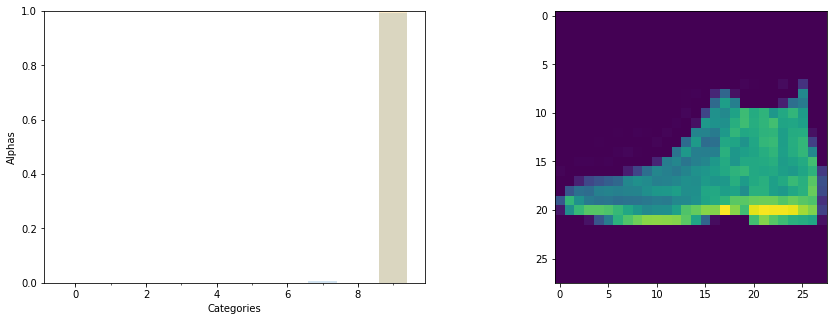

tensor([1.3846e+12, 1.7610e-01, 5.6824e+04, 1.5908e+04, 7.4197e+00, 1.7934e+20,
        3.9517e+07, 2.5824e+23, 4.2953e+15, 3.3172e+25])
tensor(9) tensor([9])
out:  tensor([2])


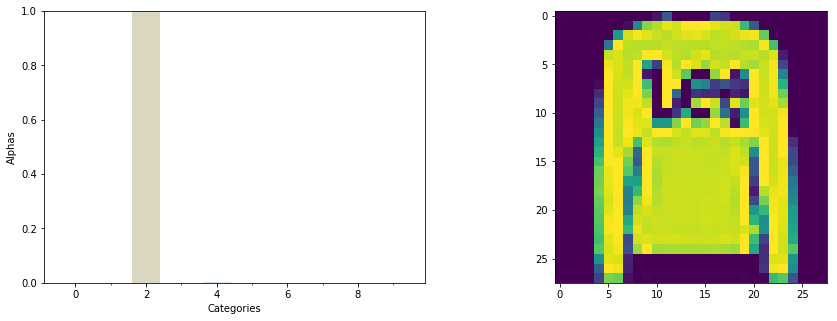

tensor([1.7048e+07, 3.0984e+03, 6.3661e+10, 4.2499e+04, 1.0171e+08, 3.0468e+01,
        2.3814e+07, 1.1064e-01, 1.9139e+07, 1.5587e-01])
tensor(2) tensor([2])
out:  tensor([1])


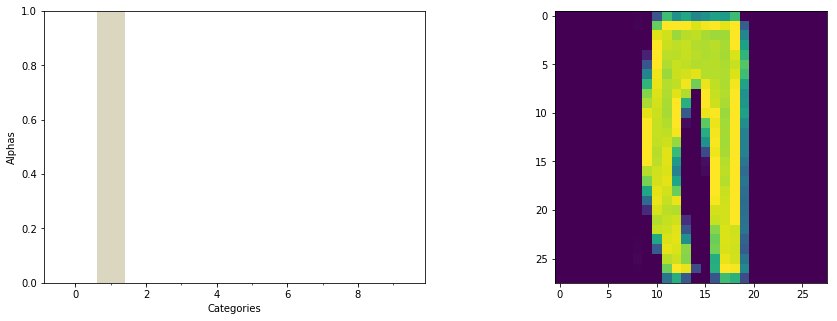

tensor([1.9091e+05, 2.2576e+13, 6.5606e+02, 5.3628e+06, 1.8755e+06, 3.6919e+01,
        5.5579e+06, 2.7954e-02, 8.5078e+05, 4.5153e-02])
tensor(1) tensor([1])
out:  tensor([1])


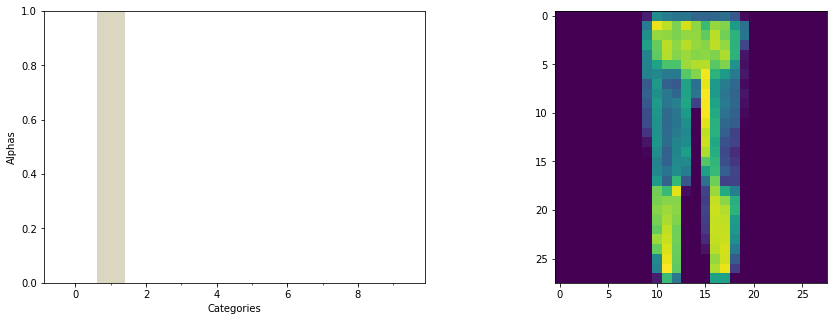

tensor([1.7424e+05, 1.0840e+16, 9.7453e+03, 3.1242e+07, 6.3771e+06, 5.2970e+02,
        8.0011e+06, 2.7042e-02, 1.8214e+05, 2.8653e-01])
tensor(1) tensor([1])
out:  tensor([6])


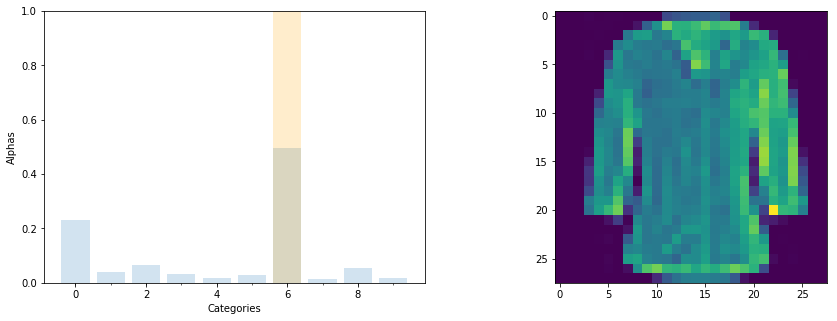

tensor([ 9.2928,  1.6001,  2.6045,  1.3808,  0.7228,  1.2085, 19.9707,  0.5780,
         2.2362,  0.7838])
tensor(6) tensor([6])
out:  tensor([1])


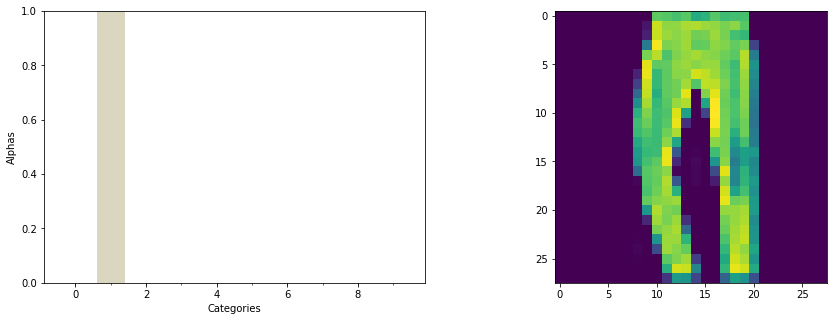

tensor([5.4408e+07, 2.2950e+14, 3.9424e+07, 1.3289e+08, 8.4848e+08, 5.2809e+02,
        2.7953e+07, 8.8816e-02, 6.7459e+07, 1.0429e-01])
tensor(1) tensor([1])
out:  tensor([4])


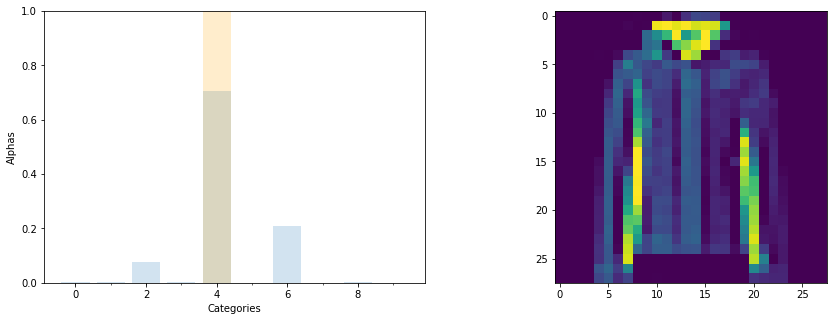

tensor([1.9533e+12, 2.6330e+12, 6.8701e+13, 1.2378e+12, 6.2806e+14, 5.1227e+02,
        1.8620e+14, 1.8014e-01, 1.7631e+12, 2.9917e-01])
tensor(4) tensor([4])
out:  tensor([6])


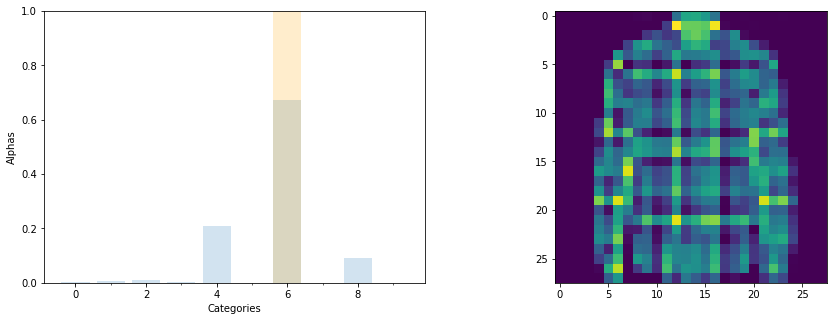

tensor([3.1203e+03, 5.7911e+03, 7.3036e+03, 3.0004e+03, 1.6885e+05, 3.3516e+00,
        5.4236e+05, 6.7516e-01, 7.3902e+04, 9.5898e-01])
tensor(6) tensor([6])
out:  tensor([5])


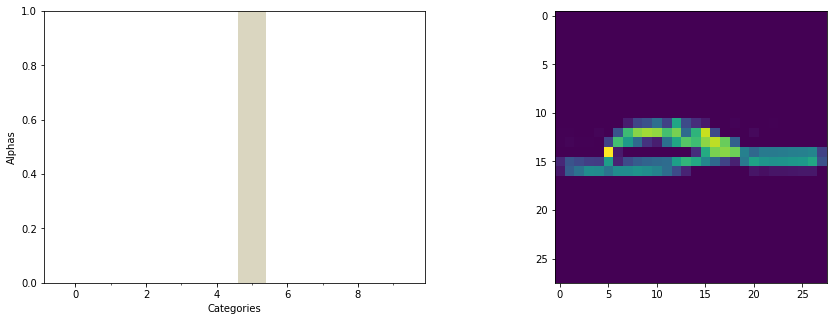

tensor([2.6232e+05, 5.6188e-02, 3.0552e+01, 1.1314e+01, 2.8490e-02, 3.8883e+13,
        3.2267e-01, 1.8314e+09, 2.1866e+05, 3.2818e+03])
tensor(5) tensor([5])
out:  tensor([7])


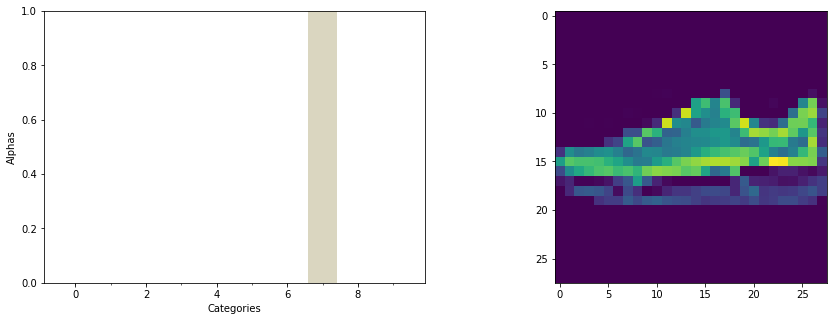

tensor([7.4484e+03, 1.8205e-01, 1.3209e+00, 7.6468e-01, 7.3830e-02, 1.7637e+08,
        8.2968e-01, 1.3137e+12, 1.8763e+05, 1.0892e+08])
tensor(7) tensor([7])
out:  tensor([4])


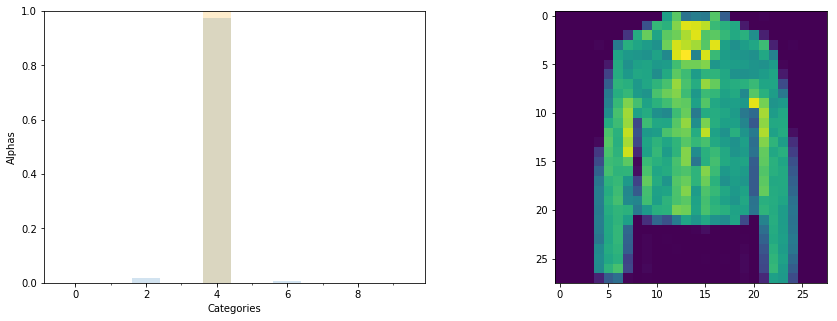

tensor([7.3336e+01, 3.0308e+03, 5.5905e+05, 1.4057e+02, 2.8176e+07, 1.2297e+00,
        1.7856e+05, 3.0429e-01, 4.6535e+02, 4.0970e-01])
tensor(4) tensor([4])
out:  tensor([5])


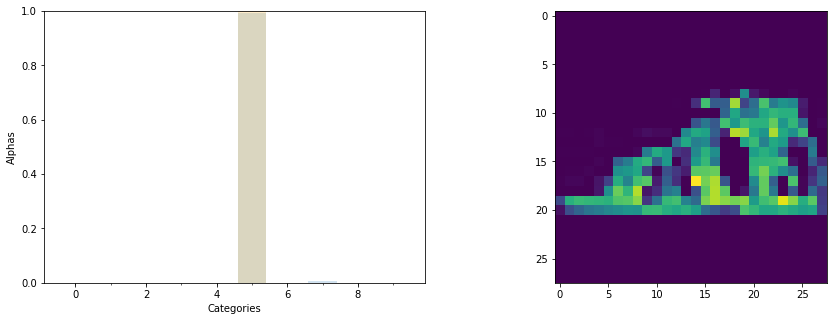

tensor([2.5774e+00, 1.7805e-01, 6.8369e-02, 7.9705e-02, 5.3891e-02, 6.4860e+04,
        1.7118e-01, 4.6694e+02, 3.7525e+01, 4.4275e+00])
tensor(5) tensor([5])
out:  tensor([5])


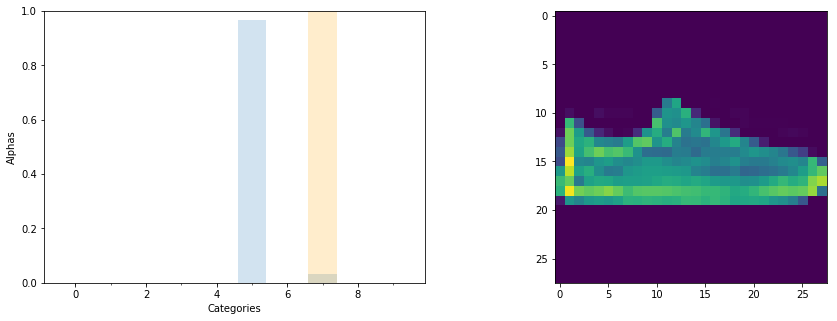

tensor([5.9728e+12, 9.1143e-02, 3.9586e+05, 1.8220e+05, 5.1201e+02, 5.9205e+19,
        6.7117e+04, 1.9657e+18, 1.7405e+16, 1.8112e+16])
tensor(5) tensor([7])
out:  tensor([3])


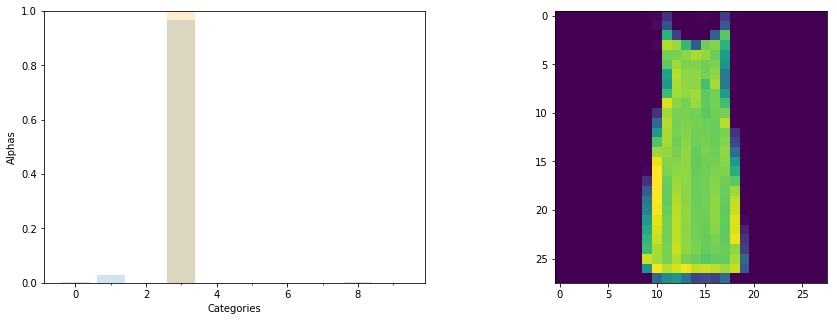

tensor([1.8423e+02, 2.2255e+03, 1.1916e+00, 7.5539e+04, 1.8175e+00, 5.7515e-02,
        2.2124e+01, 2.8761e-02, 1.0343e+02, 8.6617e-02])
tensor(3) tensor([3])
out:  tensor([4])


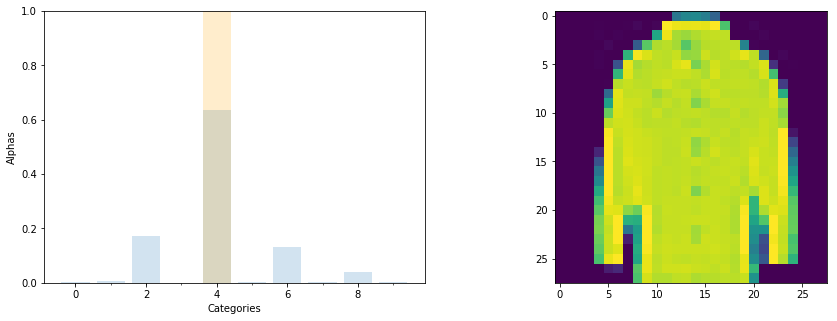

tensor([  0.5688,   1.5074,  39.3080,   0.2343, 144.8368,   0.7140,  30.1906,
          0.3337,   9.3695,   0.4257])
tensor(4) tensor([4])
out:  tensor([1])


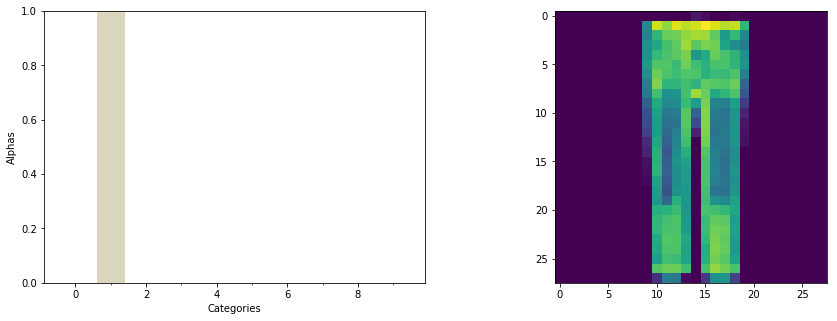

tensor([6.4110e+00, 5.1326e+07, 1.5587e+00, 4.2115e+02, 2.9472e+02, 3.3331e+00,
        3.7586e+02, 5.5360e-02, 3.1541e+00, 7.8061e-01])
tensor(1) tensor([1])
out:  tensor([2])


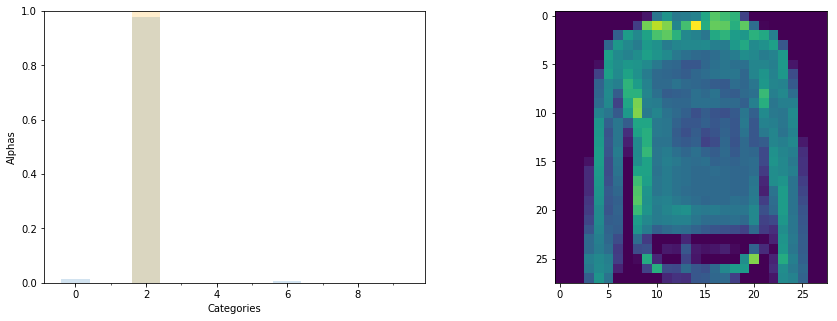

tensor([9.3263e+06, 6.1284e+03, 7.0272e+08, 6.7016e+04, 2.4845e+05, 1.0506e+01,
        5.5274e+06, 4.4901e-01, 3.9471e+05, 6.3835e-01])
tensor(2) tensor([2])
out:  tensor([6])


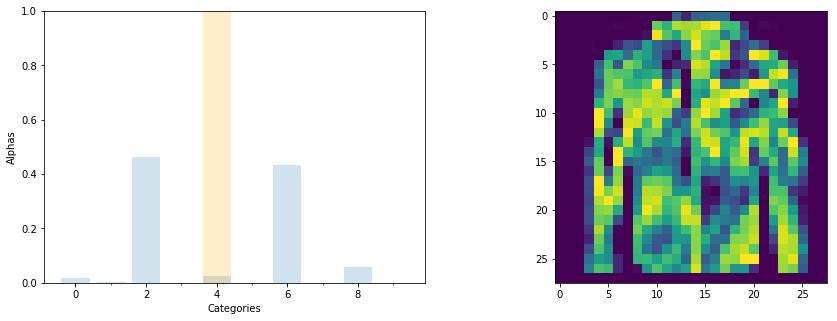

tensor([8.3648e+05, 9.9446e+04, 2.0074e+07, 1.4221e+04, 1.1203e+06, 5.2009e+01,
        1.8759e+07, 2.1853e-01, 2.5036e+06, 3.1550e-01])
tensor(2) tensor([4])
out:  tensor([8])


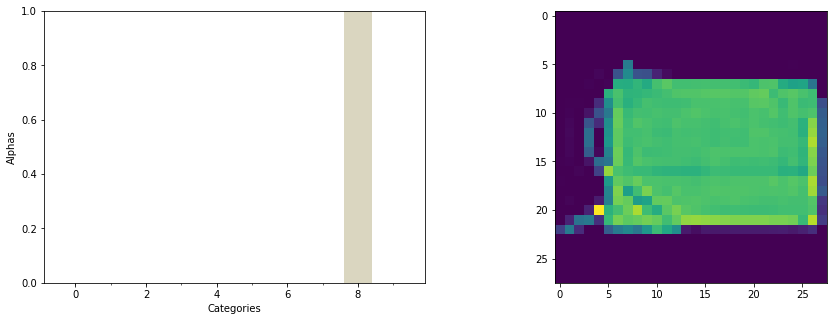

tensor([1.4971e+02, 8.0429e-01, 4.4822e+00, 1.8230e-01, 7.3315e-01, 4.3953e-01,
        1.0789e+01, 2.1215e-01, 4.8731e+05, 2.1517e-01])
tensor(8) tensor([8])
out:  tensor([0])


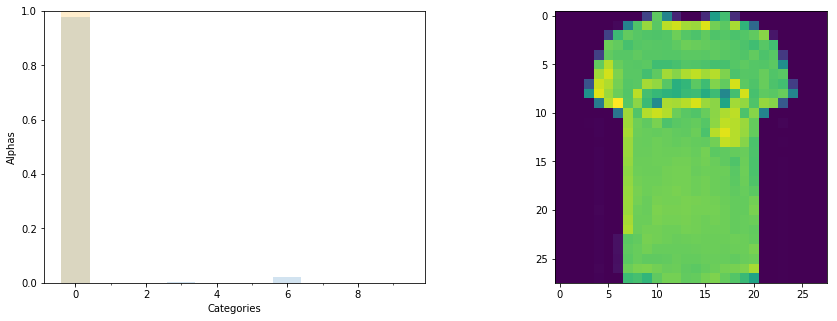

tensor([1.4658e+07, 1.3950e+01, 2.2245e+03, 2.2161e+04, 7.1247e-01, 7.5465e-01,
        3.0923e+05, 1.0547e-01, 4.9087e+02, 1.5546e-01])
tensor(0) tensor([0])
out:  tensor([2])


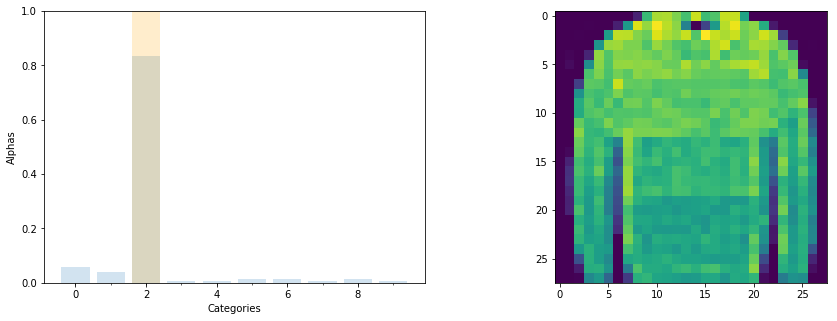

tensor([ 12.8923,   8.9040, 181.7089,   1.3091,   1.1468,   2.6589,   3.2739,
          1.3714,   2.9987,   1.8337])
tensor(2) tensor([2])
out:  tensor([7])


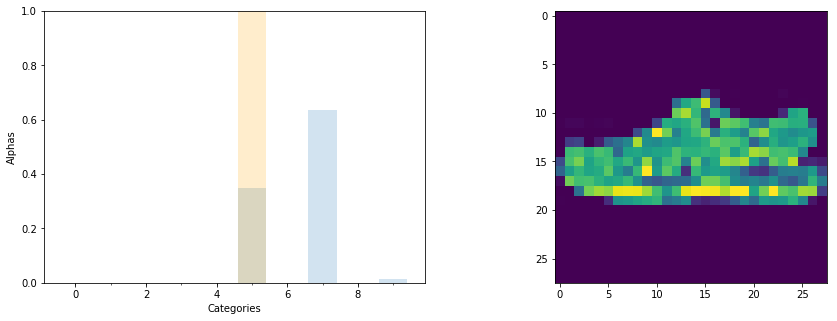

tensor([8.5044e+03, 1.7366e-01, 3.8724e-01, 6.0181e+00, 6.8099e-02, 2.3088e+10,
        7.5115e+00, 4.2177e+10, 6.1946e+06, 9.1895e+08])
tensor(7) tensor([5])
out:  tensor([7])


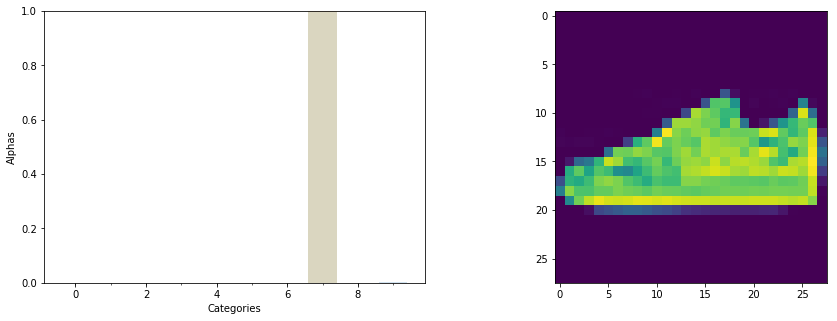

tensor([1.2594e+05, 1.3406e-01, 4.8462e+00, 9.6988e+00, 5.4275e-02, 3.1218e+11,
        2.9503e+01, 1.4199e+15, 1.4250e+08, 3.5792e+12])
tensor(7) tensor([7])
out:  tensor([5])


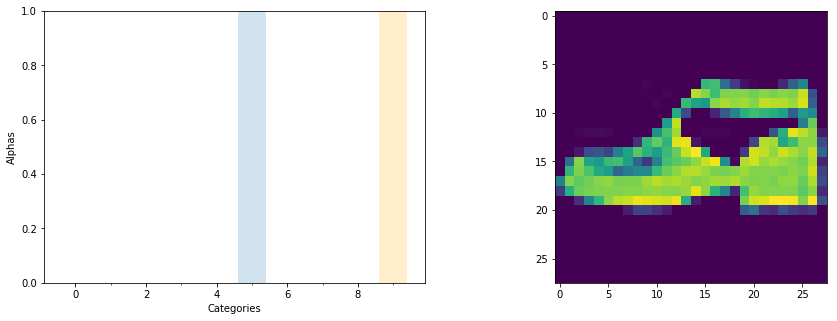

tensor([4.8936e+06, 8.0634e-02, 2.0145e+01, 4.8446e+01, 4.8053e-02, 9.7842e+15,
        8.0564e+00, 9.0184e+12, 5.7998e+09, 7.7237e+11])
tensor(5) tensor([9])
out:  tensor([1])


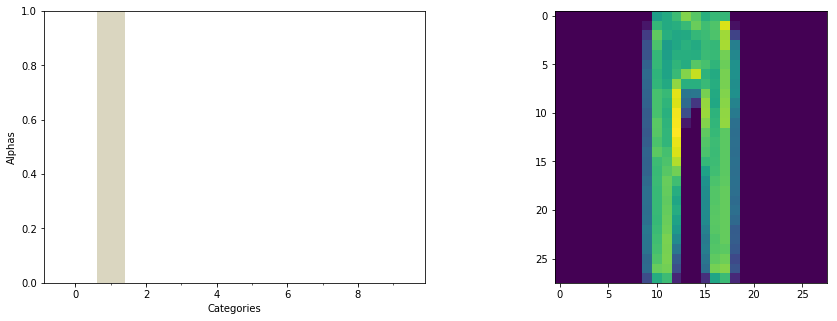

tensor([6.1702e+02, 4.8233e+09, 5.1405e+01, 1.7791e+05, 2.5091e+04, 1.3847e+01,
        5.3028e+03, 3.0630e-02, 3.6992e+03, 6.5920e-02])
tensor(1) tensor([1])
out:  tensor([6])


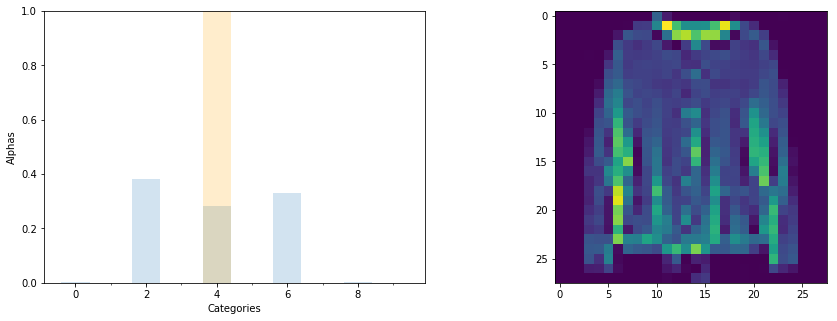

tensor([2.7783e+07, 1.6991e+06, 3.2535e+09, 9.8483e+05, 2.3924e+09, 1.0071e+01,
        2.7972e+09, 3.0138e-01, 3.1893e+07, 4.3381e-01])
tensor(2) tensor([4])
out:  tensor([6])


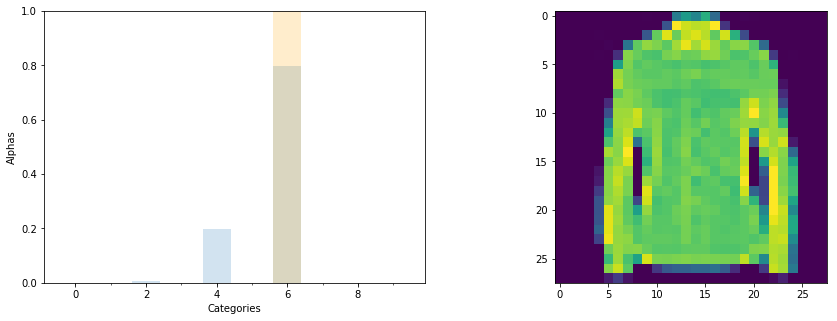

tensor([6.4266e+03, 3.0894e+03, 2.9583e+05, 3.6974e+03, 1.2183e+07, 3.1053e+00,
        4.8911e+07, 2.3475e-01, 1.8237e+04, 3.1346e-01])
tensor(6) tensor([6])
out:  tensor([0])


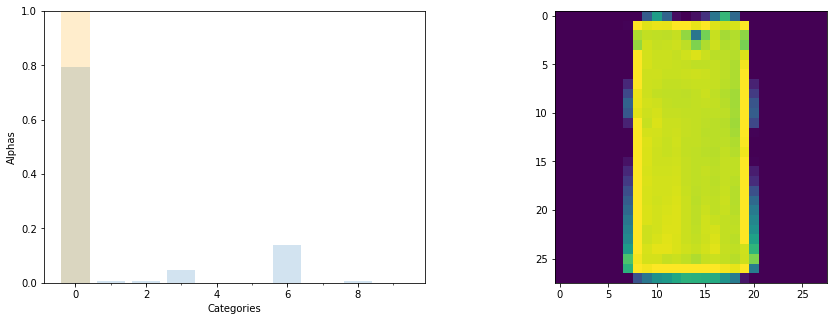

tensor([1.2663e+03, 1.0279e+01, 1.0861e+01, 7.6052e+01, 3.8726e-01, 1.3194e-01,
        2.2207e+02, 6.6884e-02, 7.6851e+00, 1.1327e-01])
tensor(0) tensor([0])
out:  tensor([9])


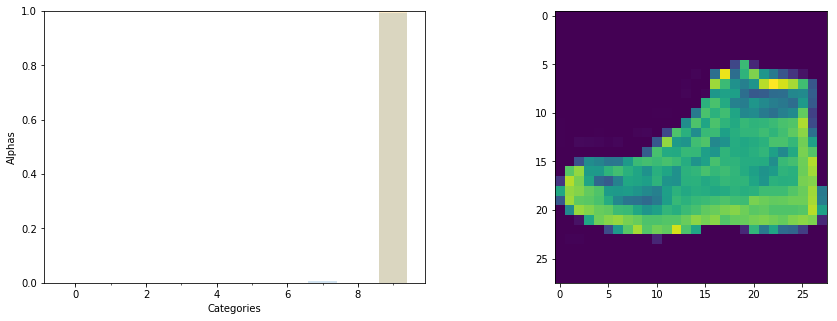

tensor([3.7153e+08, 2.8624e-01, 5.5186e+02, 4.7769e+02, 5.6729e-01, 6.2037e+13,
        6.1553e+05, 5.2041e+16, 7.8987e+11, 7.2789e+18])
tensor(9) tensor([9])
out:  tensor([4])


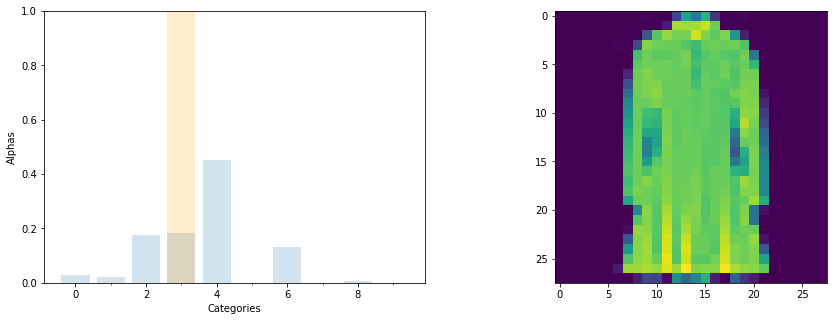

tensor([4.2904e+02, 3.2781e+02, 2.5601e+03, 2.6394e+03, 6.5670e+03, 1.9477e-01,
        1.9032e+03, 1.2251e-01, 7.8818e+01, 1.9571e-01])
tensor(4) tensor([3])
out:  tensor([8])


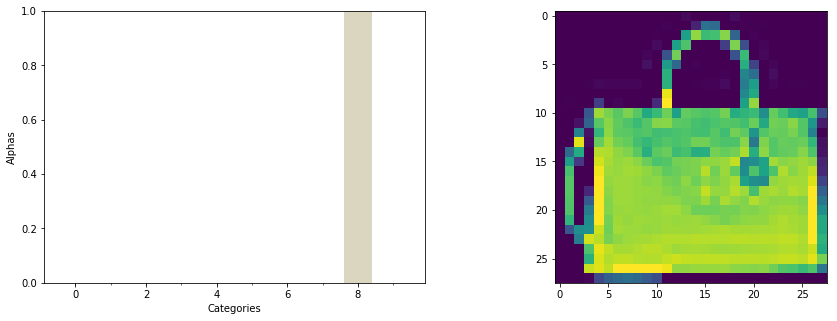

tensor([4.3214e+06, 2.9206e-01, 1.4773e+04, 6.6417e+00, 5.3879e+03, 1.0960e+05,
        1.5853e+02, 7.7705e+03, 4.1759e+14, 2.7016e+03])
tensor(8) tensor([8])
out:  tensor([8])


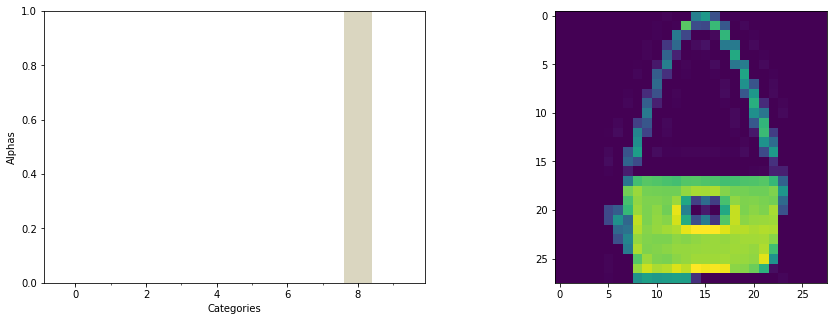

tensor([3.7045e+07, 3.8548e-02, 1.0543e+05, 5.0851e+05, 5.7893e+06, 4.7976e+06,
        3.6239e+01, 2.6166e+03, 4.1023e+15, 4.1355e-02])
tensor(8) tensor([8])
out:  tensor([3])


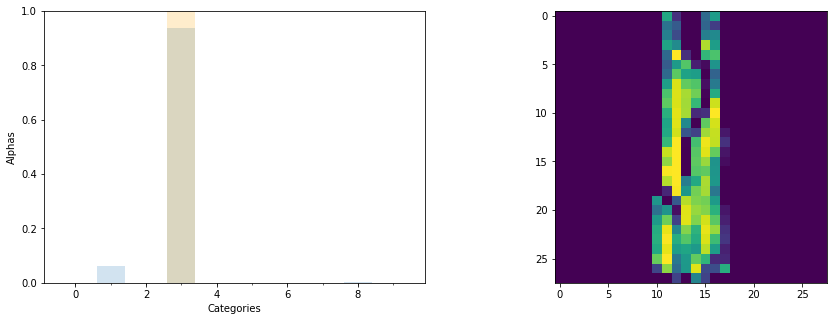

tensor([1.8828e+06, 4.4752e+08, 1.3276e+05, 6.7516e+09, 5.6272e+05, 1.8909e+02,
        1.5291e+05, 2.3094e-02, 1.4067e+07, 3.5795e-02])
tensor(3) tensor([3])
out:  tensor([3])


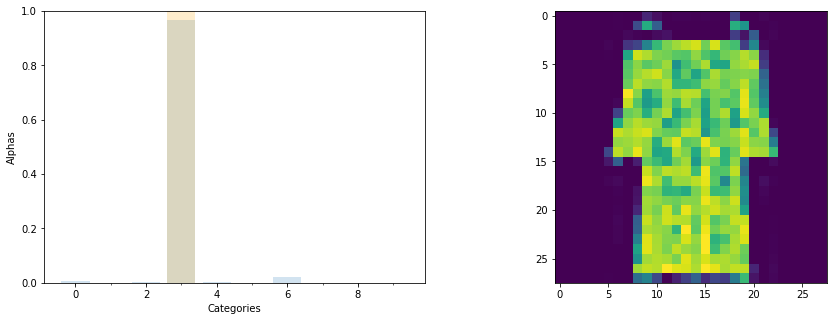

tensor([3.5979e+02, 9.3035e+00, 6.6887e+01, 4.4363e+04, 1.6136e+02, 1.1974e-01,
        9.4041e+02, 6.0279e-02, 4.4828e+01, 8.6613e-02])
tensor(3) tensor([3])
out:  tensor([8])


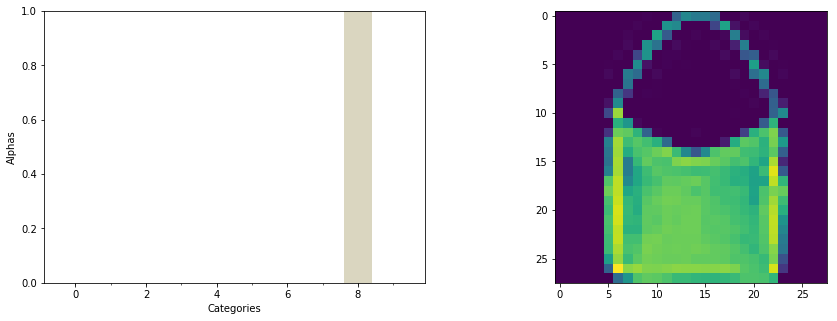

tensor([1.3246e+11, 5.9162e-02, 3.0190e+10, 3.4761e+05, 1.3287e+09, 2.9129e+09,
        2.8779e+03, 2.4770e+01, 4.9324e+15, 4.7737e-02])
tensor(8) tensor([8])
out:  tensor([0])


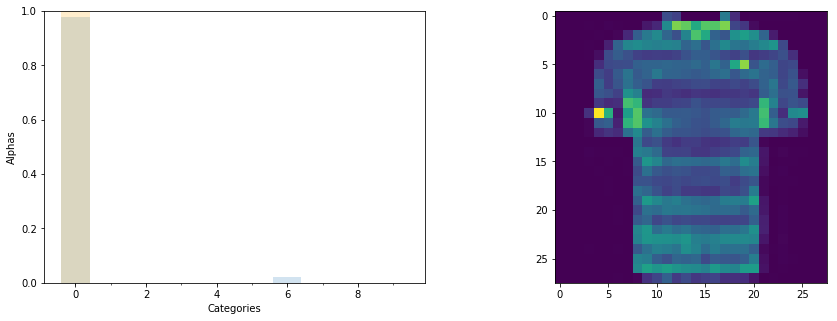

tensor([1.7736e+10, 3.9891e+03, 5.3928e+06, 1.1341e+06, 1.9061e+03, 9.9167e-01,
        4.0288e+08, 2.3935e-01, 1.0694e+06, 3.5269e-01])
tensor(0) tensor([0])
out:  tensor([7])


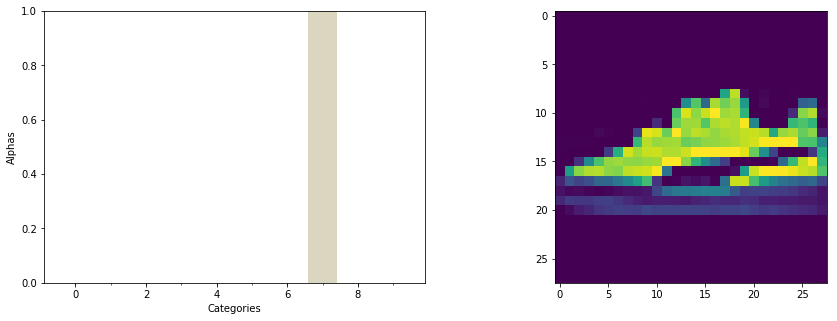

tensor([3.4233e+04, 9.6566e-02, 3.2020e+00, 3.4305e+00, 4.2044e-02, 2.0648e+09,
        7.4739e-01, 1.8436e+14, 5.6915e+06, 3.4730e+08])
tensor(7) tensor([7])
out:  tensor([5])


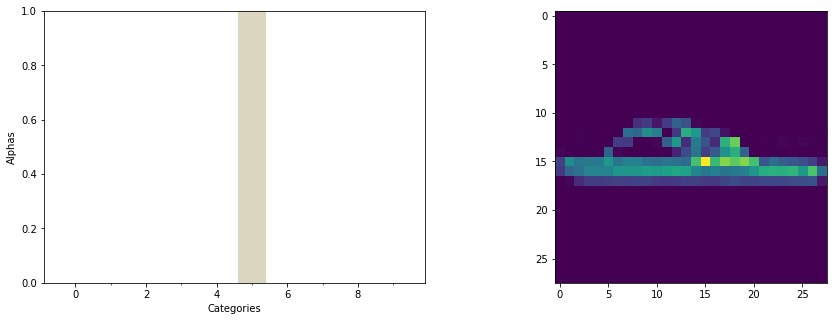

tensor([5.8706e+06, 5.4204e-02, 3.6177e+01, 4.6178e+02, 5.3231e-02, 8.5903e+15,
        1.7565e+00, 6.4345e+12, 9.5213e+08, 1.6693e+08])
tensor(5) tensor([5])
out:  tensor([7])


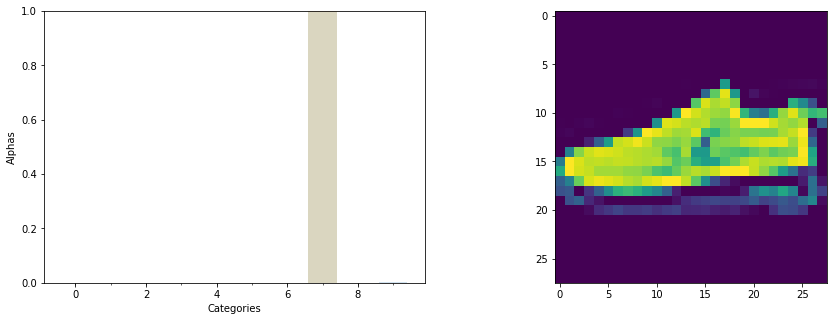

tensor([6.6422e+04, 2.0328e-01, 7.8300e-01, 9.1260e-01, 6.6519e-02, 5.2779e+09,
        2.9892e+01, 1.7364e+13, 1.6157e+07, 4.1407e+10])
tensor(7) tensor([7])
out:  tensor([9])


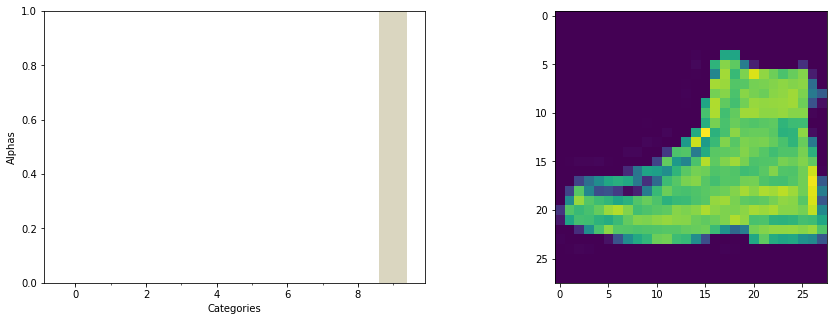

tensor([9.0605e+12, 2.5073e-01, 3.2654e+05, 1.5351e+04, 5.8602e+01, 3.9569e+18,
        1.1604e+09, 2.0358e+23, 1.9372e+16, 4.3600e+26])
tensor(9) tensor([9])
out:  tensor([0])


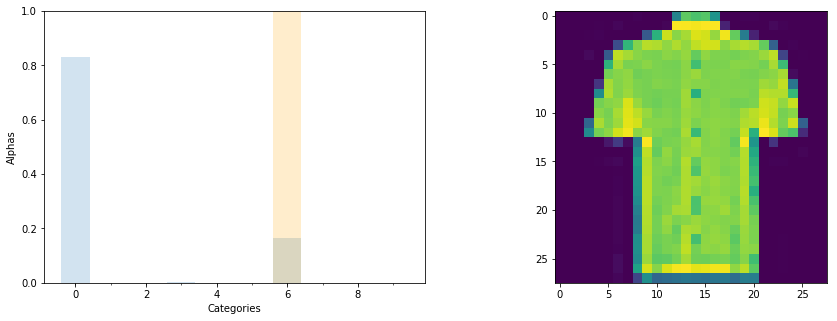

tensor([4.3166e+04, 1.2800e+00, 3.6112e+01, 1.5139e+02, 6.2047e+00, 3.6656e-01,
        8.6322e+03, 1.8882e-01, 3.8771e+01, 2.4549e-01])
tensor(0) tensor([6])
out:  tensor([1])


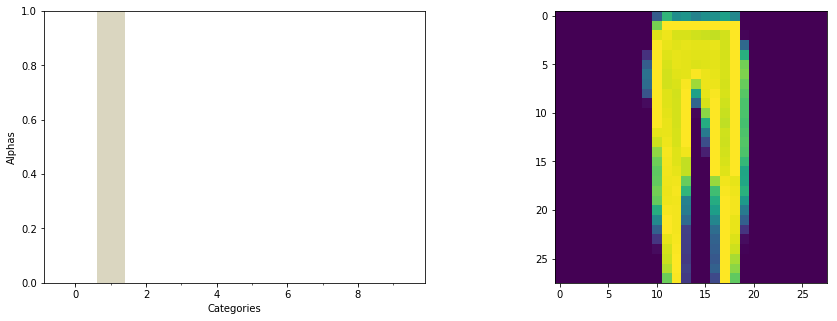

tensor([6.8708e+02, 1.2758e+10, 1.0460e+00, 1.6167e+04, 4.6501e+03, 8.3033e+01,
        9.7236e+04, 2.7909e-02, 2.6862e+03, 9.5808e-02])
tensor(1) tensor([1])
out:  tensor([3])


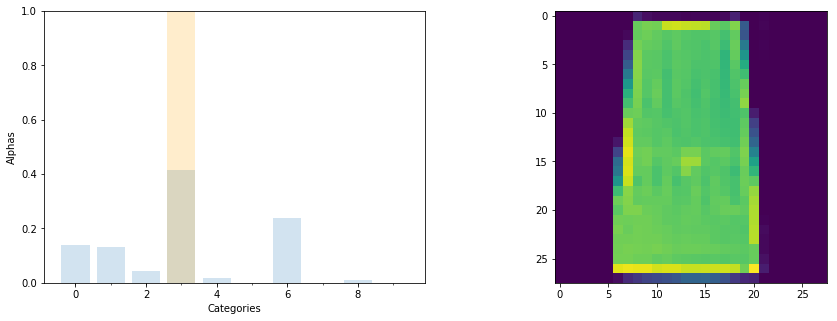

tensor([8.1643e+01, 7.8657e+01, 2.6524e+01, 2.4654e+02, 1.0773e+01, 2.0268e-01,
        1.4081e+02, 1.2527e-01, 6.0376e+00, 1.8541e-01])
tensor(3) tensor([3])
out:  tensor([7])


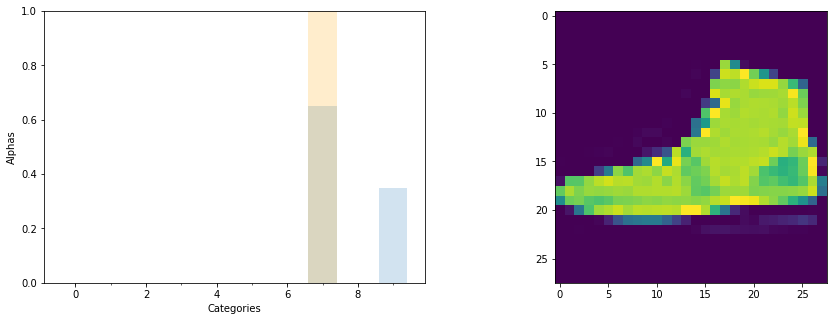

tensor([3.7898e+09, 2.0517e-01, 1.3807e+02, 3.0114e+03, 1.3904e-01, 4.5267e+14,
        5.1503e+06, 1.5284e+19, 8.5564e+09, 8.1802e+18])
tensor(7) tensor([7])
out:  tensor([6])


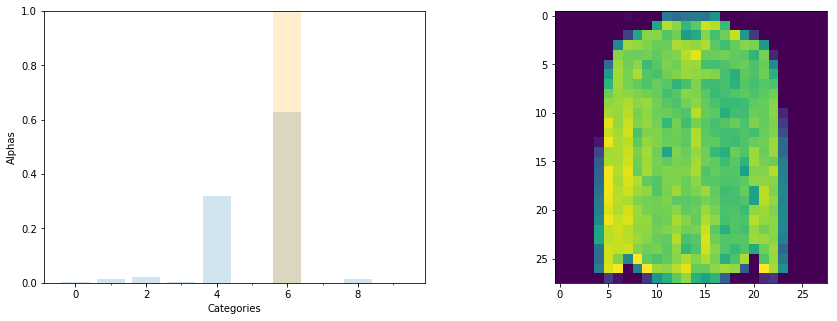

tensor([2.3263e+01, 1.4756e+02, 2.0182e+02, 3.4010e+01, 3.1647e+03, 1.4151e+00,
        6.2304e+03, 8.0670e-01, 1.3698e+02, 1.1278e+00])
tensor(6) tensor([6])
out:  tensor([7])


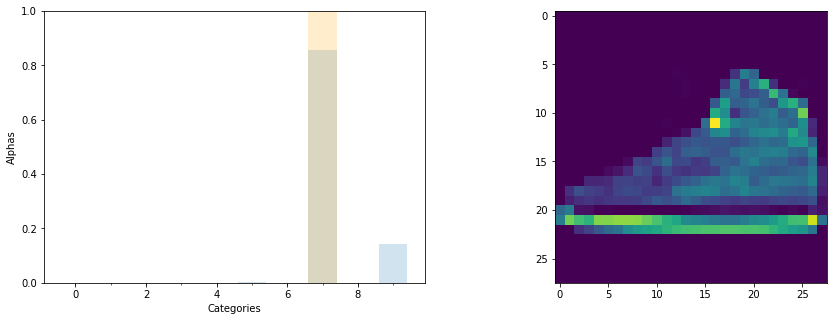

tensor([1.9106e+06, 2.4154e-01, 1.1789e+02, 1.1595e+02, 1.4967e-01, 1.8065e+12,
        2.1078e+03, 8.9087e+14, 9.8190e+07, 1.4864e+14])
tensor(7) tensor([7])
out:  tensor([2])


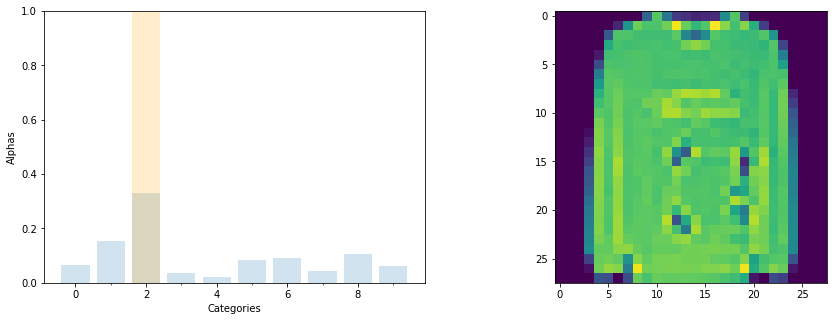

tensor([ 2.6498,  6.2300, 13.2122,  1.4492,  0.9299,  3.3814,  3.7247,  1.8116,
         4.2701,  2.5419])
tensor(2) tensor([2])
out:  tensor([1])


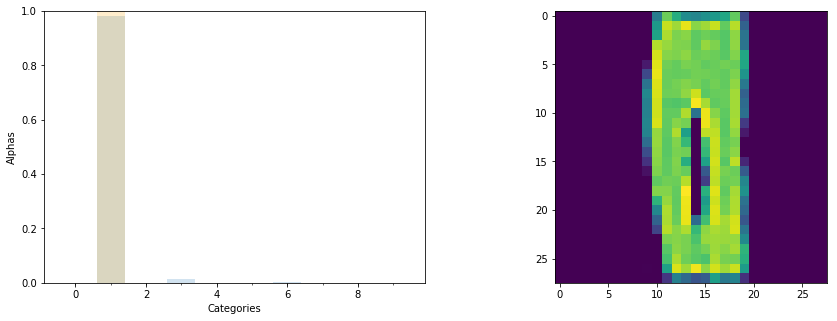

tensor([8.1188e+02, 1.7108e+06, 1.4015e+00, 2.3146e+04, 9.8493e+01, 5.0584e+00,
        6.2992e+03, 3.4024e-02, 4.9883e+02, 2.6718e-01])
tensor(1) tensor([1])
out:  tensor([2])


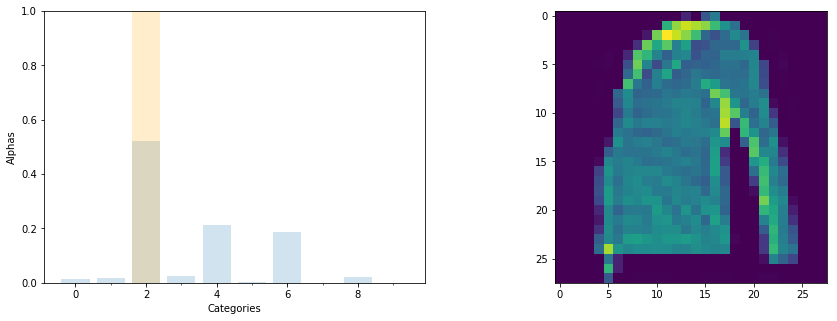

tensor([1.1499e+01, 1.4186e+01, 3.9140e+02, 1.8457e+01, 1.5916e+02, 1.3439e+00,
        1.3960e+02, 2.5147e-01, 1.5774e+01, 4.4701e-01])
tensor(2) tensor([2])
out:  tensor([6])


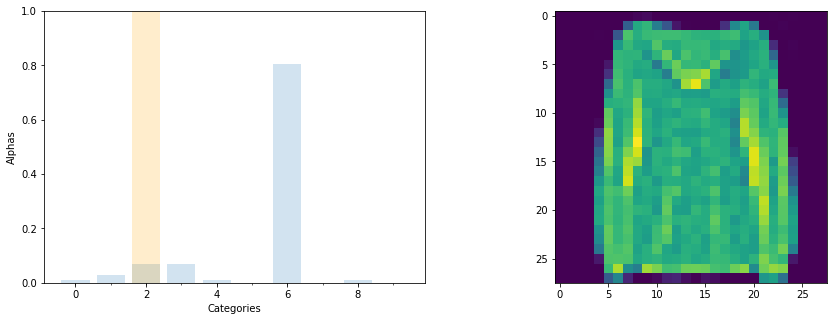

tensor([3.1068e+01, 8.4840e+01, 2.1564e+02, 2.0959e+02, 2.9050e+01, 1.7305e+00,
        2.4787e+03, 9.2246e-01, 2.9271e+01, 1.1850e+00])
tensor(6) tensor([2])
out:  tensor([4])


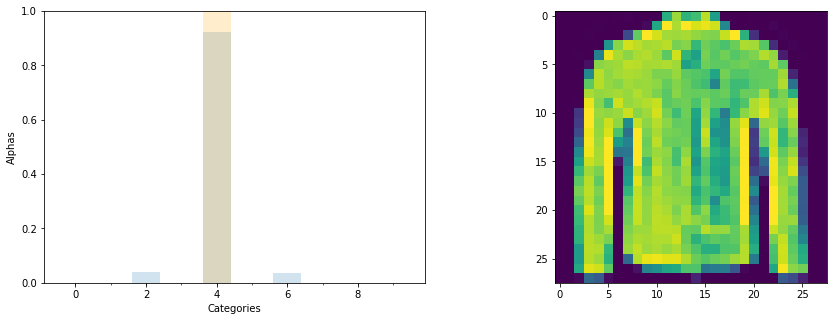

tensor([1.0735e+04, 2.0524e+03, 9.3565e+06, 3.7526e+02, 2.1429e+08, 1.8979e+00,
        8.5197e+06, 2.4028e-01, 2.4968e+04, 6.3289e-01])
tensor(4) tensor([4])
out:  tensor([4])


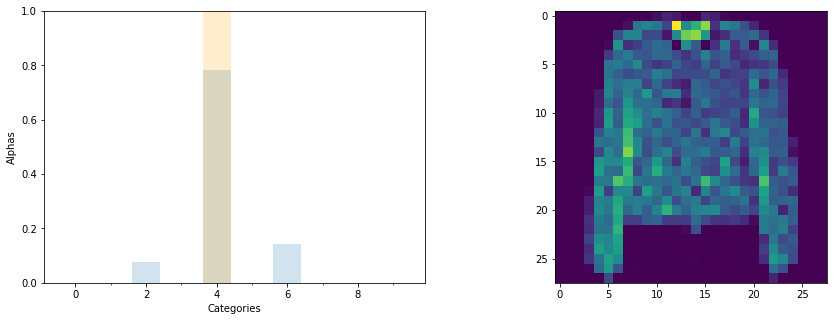

tensor([6.0905e+02, 1.3632e+04, 2.4662e+06, 3.3637e+02, 2.5477e+07, 3.1203e+00,
        4.6109e+06, 4.8404e-01, 5.0522e+03, 6.2883e-01])
tensor(4) tensor([4])
out:  tensor([5])


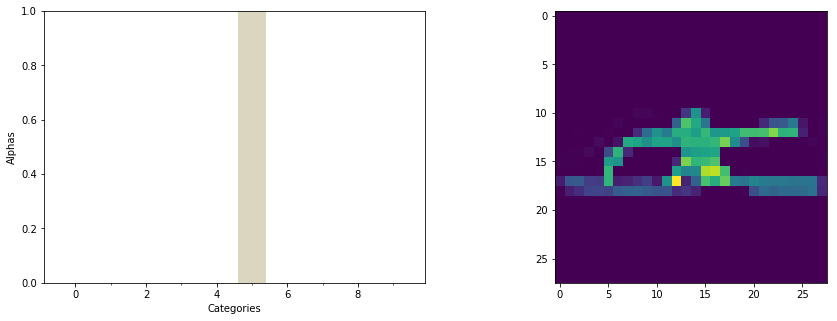

tensor([1.0090e+00, 7.3172e-02, 5.9498e-02, 5.3135e-02, 2.9578e-02, 2.1544e+07,
        1.8137e-02, 4.6301e+02, 2.9977e+01, 1.0379e+00])
tensor(5) tensor([5])
out:  tensor([8])


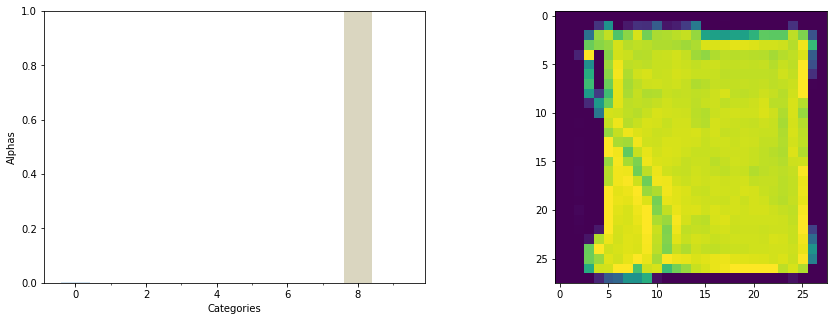

tensor([1.6950e+03, 9.5881e-01, 1.7461e+02, 1.9619e-01, 3.8570e-01, 7.6259e-01,
        3.2880e+02, 2.8085e-01, 1.2316e+06, 6.1190e-01])
tensor(8) tensor([8])
out:  tensor([2])


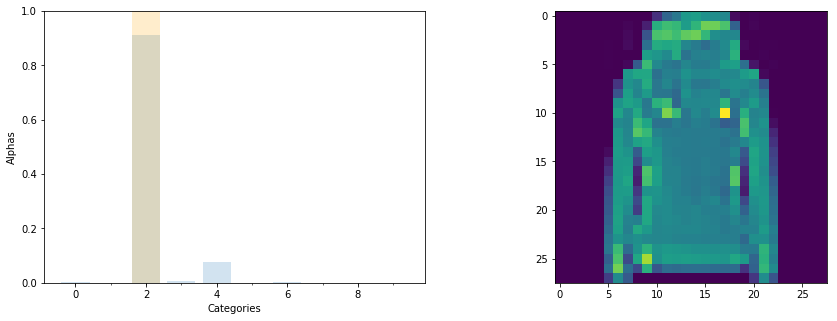

tensor([8.6335e+02, 5.9309e+02, 5.4401e+05, 3.3905e+03, 4.5447e+04, 4.7869e-01,
        1.3900e+03, 3.1636e-01, 1.5421e+02, 4.5372e-01])
tensor(2) tensor([2])
out:  tensor([2])


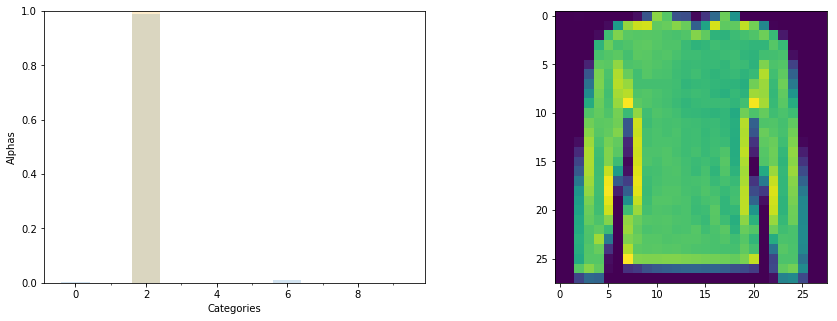

tensor([6.7239e+05, 9.6025e+02, 1.9368e+08, 4.8456e+02, 3.5048e+04, 8.3314e+00,
        1.7209e+06, 2.6807e-01, 1.2850e+04, 3.8085e-01])
tensor(2) tensor([2])
out:  tensor([8])


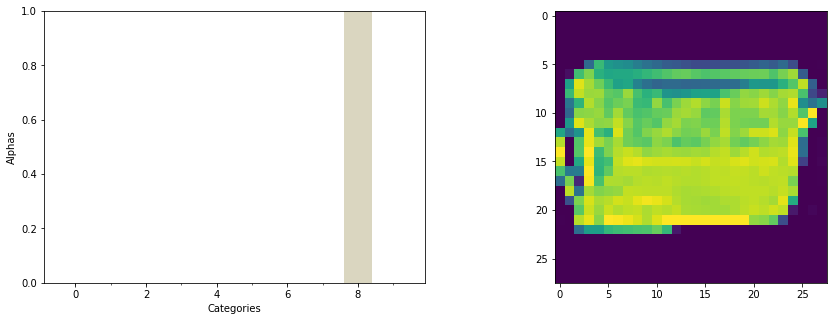

tensor([2.0001e+03, 7.6070e-01, 3.0814e+00, 2.3190e-01, 7.3215e-01, 4.9448e+01,
        8.7114e+01, 1.9982e+01, 6.1545e+08, 5.3269e+01])
tensor(8) tensor([8])
out:  tensor([6])


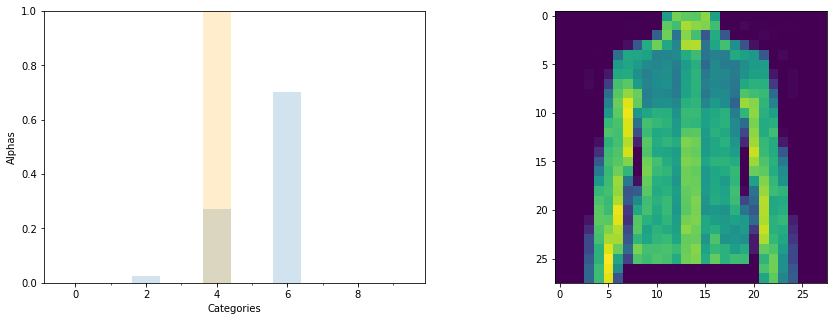

tensor([7.1626e+07, 7.8022e+06, 1.1734e+11, 6.2888e+07, 1.2418e+12, 8.4821e+00,
        3.2247e+12, 2.2999e-01, 2.0871e+07, 3.2921e-01])
tensor(6) tensor([4])
out:  tensor([8])


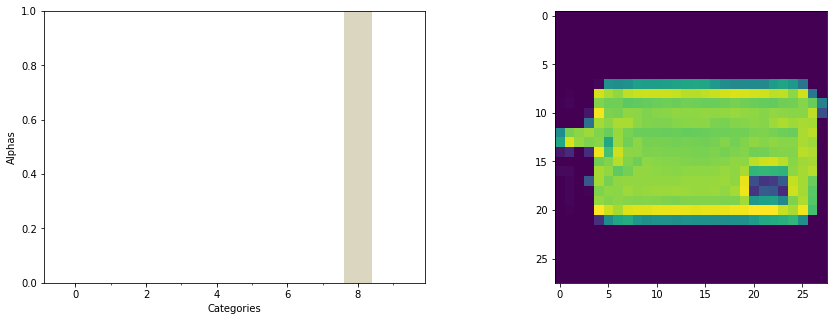

tensor([1.2115e+03, 6.6667e-01, 1.1228e+00, 1.8174e-01, 1.6853e+00, 3.1022e+00,
        5.8345e+01, 6.8015e-01, 1.4982e+07, 5.4403e-01])
tensor(8) tensor([8])
out:  tensor([0])


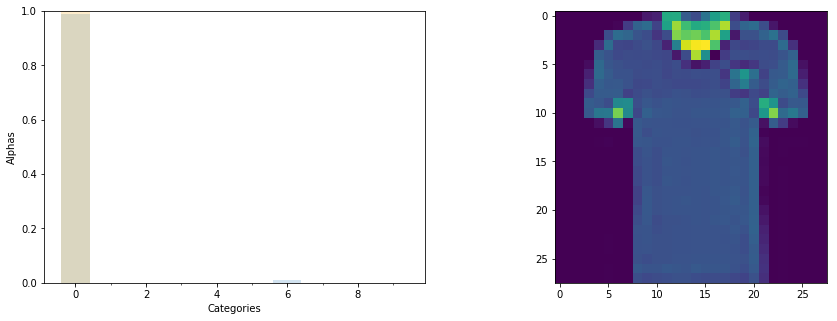

tensor([5.5519e+08, 5.0831e+00, 5.1148e+04, 4.9817e+02, 1.9777e+00, 3.9557e-01,
        6.5064e+06, 2.4020e-01, 2.1718e+03, 3.6627e-01])
tensor(0) tensor([0])
out:  tensor([7])


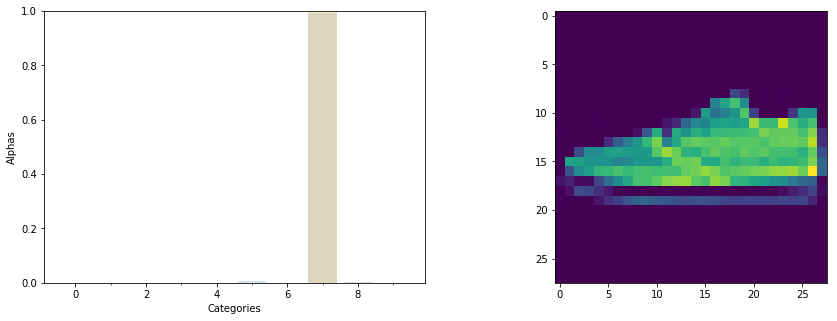

tensor([1.4585e+04, 2.1987e-01, 9.4076e-01, 2.4329e+00, 7.9780e-02, 1.9661e+07,
        2.4246e+00, 3.3569e+09, 4.2553e+06, 2.5141e+06])
tensor(7) tensor([7])
out:  tensor([7])


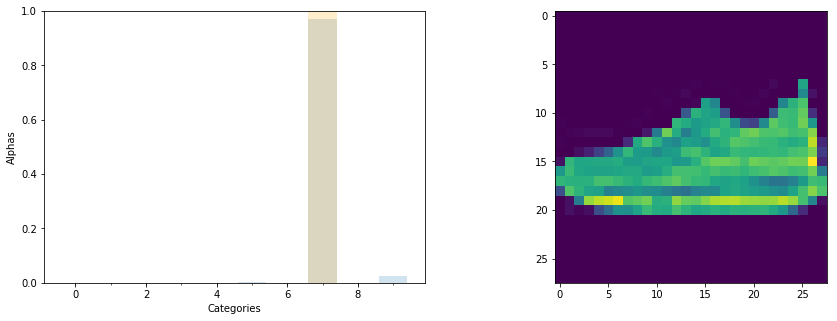

tensor([2.4487e+08, 1.5993e-01, 1.3298e+03, 4.1043e+02, 3.9660e-01, 2.5031e+15,
        5.9443e+02, 7.7466e+17, 3.9492e+11, 2.0383e+16])
tensor(7) tensor([7])
out:  tensor([8])


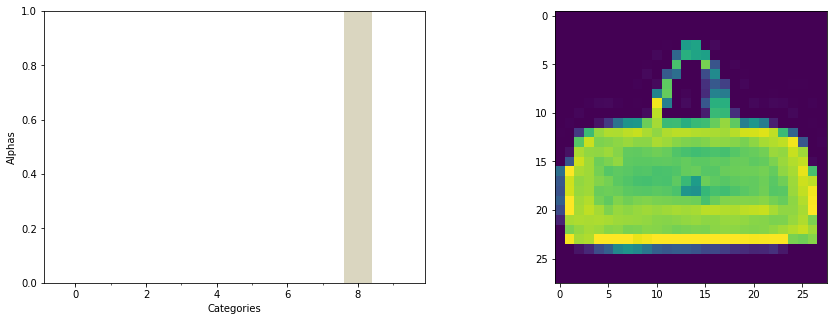

tensor([2.6485e+05, 1.3988e-01, 1.4063e+03, 2.8979e+01, 2.0781e+03, 3.8447e+07,
        1.1809e+01, 1.8096e+07, 6.5377e+13, 1.9014e+05])
tensor(8) tensor([8])
out:  tensor([5])


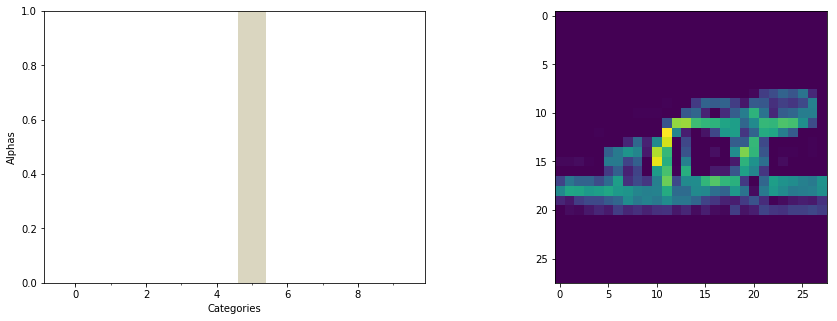

tensor([1.5447e+00, 1.1536e-01, 1.2147e-01, 4.4020e-02, 4.5895e-02, 1.8816e+06,
        2.6846e-02, 4.4483e+02, 8.4666e+00, 2.5079e-01])
tensor(5) tensor([5])
out:  tensor([1])


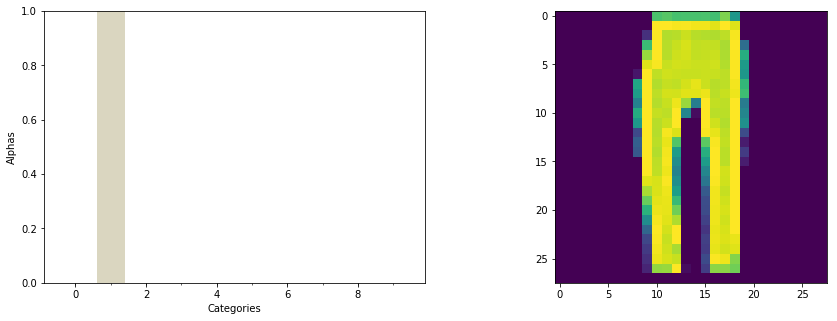

tensor([1.4564e+05, 1.2682e+15, 2.4538e+04, 2.1675e+06, 1.7171e+08, 1.6129e+01,
        1.6527e+06, 3.4838e-02, 8.4324e+05, 5.5947e-02])
tensor(1) tensor([1])
out:  tensor([1])


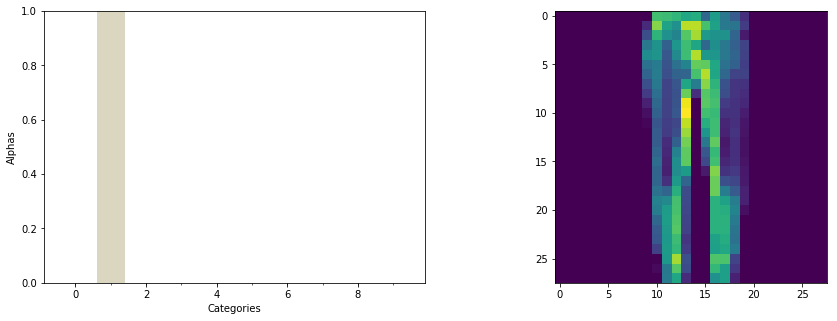

tensor([4.8704e+04, 1.2986e+12, 6.2885e+03, 2.2367e+06, 1.5233e+05, 7.3483e+01,
        4.3065e+05, 4.4532e-02, 3.8707e+03, 4.6357e-01])
tensor(1) tensor([1])
out:  tensor([3])


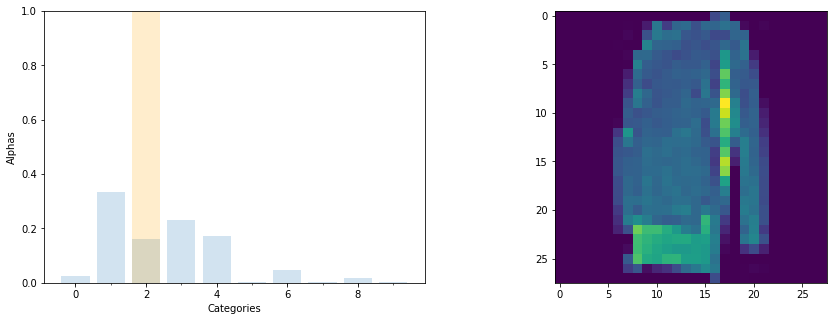

tensor([ 2.4239, 32.7392, 15.5810, 22.6539, 16.8142,  0.3095,  4.7209,  0.1635,
         1.8845,  0.3053])
tensor(1) tensor([2])
out:  tensor([3])


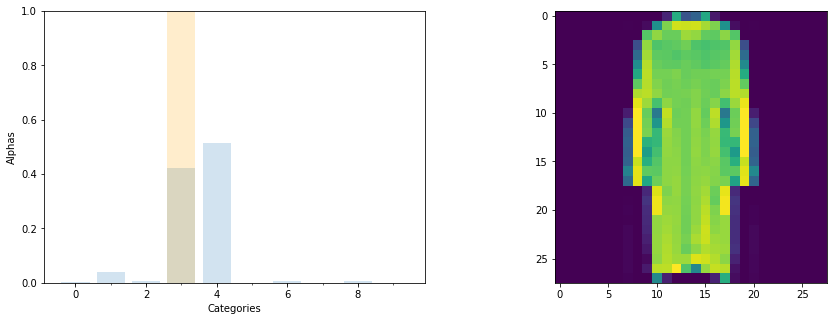

tensor([7.9693e-01, 1.7040e+01, 3.6537e+00, 1.8749e+02, 2.2742e+02, 1.3029e-01,
        2.1980e+00, 6.0972e-02, 3.4644e+00, 9.9710e-02])
tensor(4) tensor([3])
out:  tensor([7])


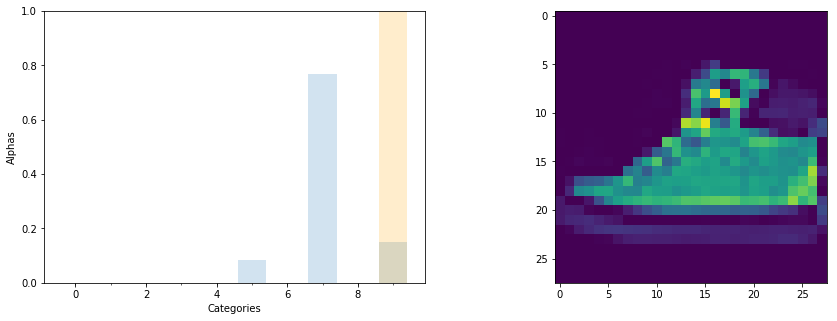

tensor([5.4191e+00, 1.7528e-01, 1.1229e-01, 1.4928e+00, 6.5108e-02, 6.2720e+05,
        1.7418e+00, 5.8256e+06, 3.3194e+02, 1.1336e+06])
tensor(7) tensor([9])
out:  tensor([8])


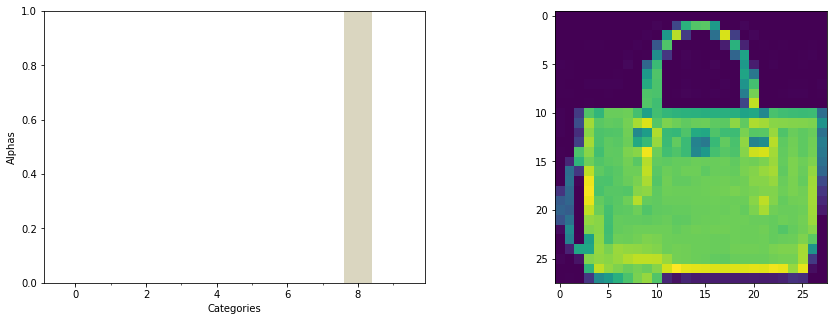

tensor([3.1808e+06, 1.8805e-01, 2.2790e+03, 6.0971e+02, 3.2423e+03, 2.3192e+04,
        1.1151e+03, 3.8967e+03, 7.0351e+14, 3.9368e+01])
tensor(8) tensor([8])
out:  tensor([7])


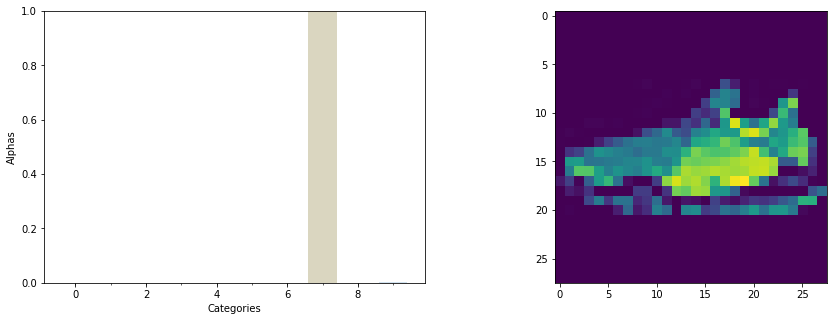

tensor([3.1648e+04, 2.5908e-01, 3.9243e+00, 8.0515e+00, 1.9434e-01, 9.7432e+06,
        2.1769e+01, 2.7355e+10, 2.1117e+07, 4.5897e+07])
tensor(7) tensor([7])
out:  tensor([0])


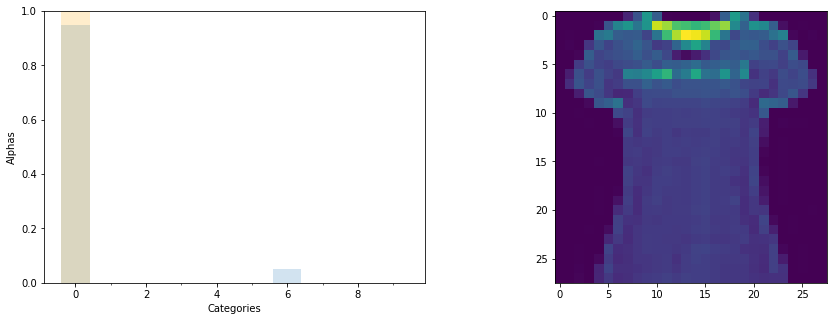

tensor([2.6933e+08, 5.7935e+01, 9.0504e+04, 4.6792e+04, 3.3969e+00, 4.6979e-01,
        1.4613e+07, 2.3969e-01, 1.3412e+03, 4.3668e-01])
tensor(0) tensor([0])
out:  tensor([2])


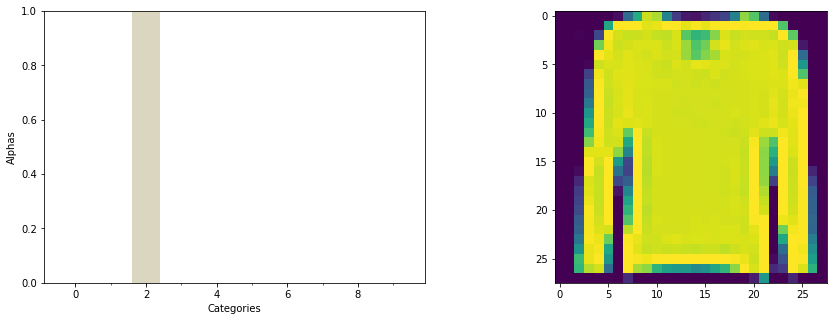

tensor([3.5163e+06, 1.8185e+02, 3.2464e+09, 1.1231e+02, 8.0972e+03, 3.0260e+00,
        2.4588e+06, 1.9489e-01, 1.7666e+05, 5.0916e-01])
tensor(2) tensor([2])
out:  tensor([6])


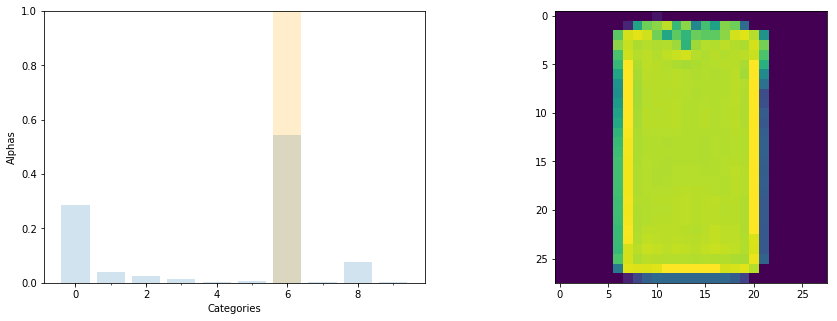

tensor([17.7212,  2.4886,  1.4401,  0.9273,  0.2480,  0.3029, 33.5636,  0.1503,
         4.6184,  0.2201])
tensor(6) tensor([6])
out:  tensor([2])


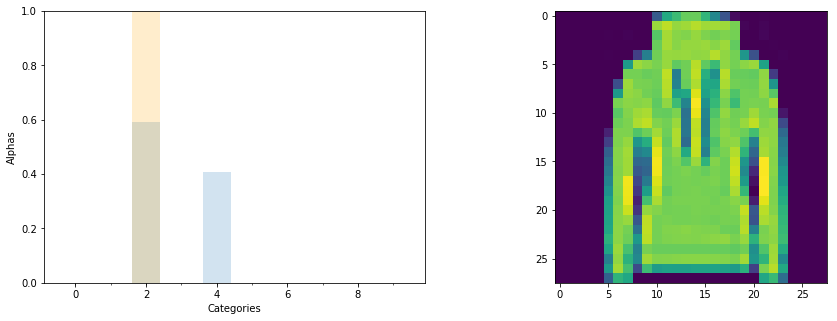

tensor([3.0173e+02, 2.4491e+02, 2.3201e+06, 5.1324e+02, 1.5909e+06, 6.7227e-01,
        2.6844e+03, 2.1933e-01, 3.2214e+02, 3.0386e-01])
tensor(2) tensor([2])
out:  tensor([3])


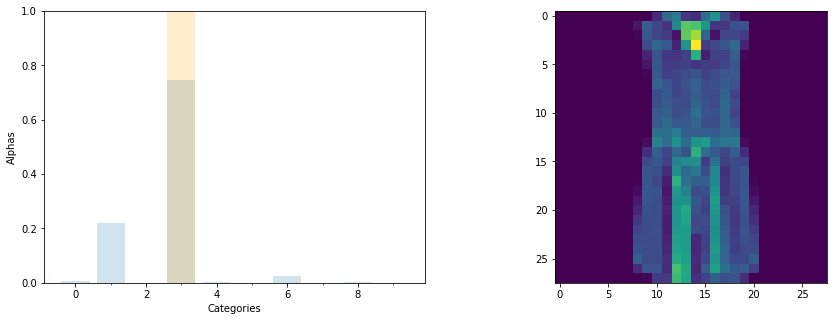

tensor([1.2430e+02, 3.7067e+03, 2.4411e+00, 1.2523e+04, 2.5562e+01, 1.4008e-01,
        4.1278e+02, 8.3542e-02, 2.4952e+01, 1.7824e-01])
tensor(3) tensor([3])
out:  tensor([1])


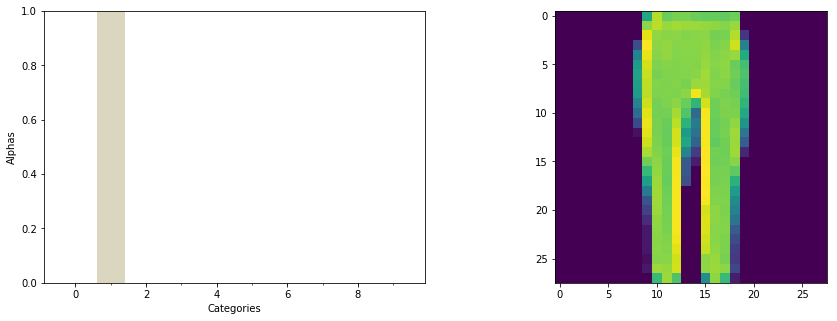

tensor([7.9136e+03, 2.3610e+14, 6.0263e+02, 1.5446e+05, 2.8941e+06, 1.2388e+01,
        4.6324e+05, 3.5855e-02, 1.5123e+04, 6.9731e-02])
tensor(1) tensor([1])
out:  tensor([2])


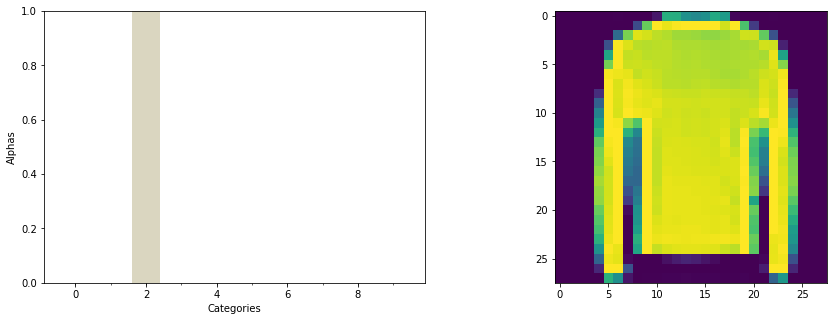

tensor([6.9781e+07, 4.6963e+03, 2.5130e+12, 3.2926e+04, 3.2192e+08, 1.1108e+01,
        1.8450e+09, 1.4212e-01, 7.3906e+06, 3.9088e-01])
tensor(2) tensor([2])
out:  tensor([8])


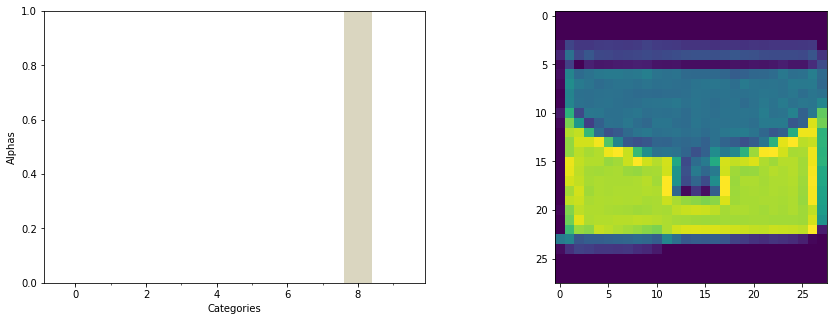

tensor([5.0743e-01, 8.3685e-01, 4.2968e-01, 2.0508e-01, 1.5290e-01, 3.7065e+00,
        3.9975e-01, 1.9146e-01, 4.0724e+04, 2.2832e-01])
tensor(8) tensor([8])
out:  tensor([4])


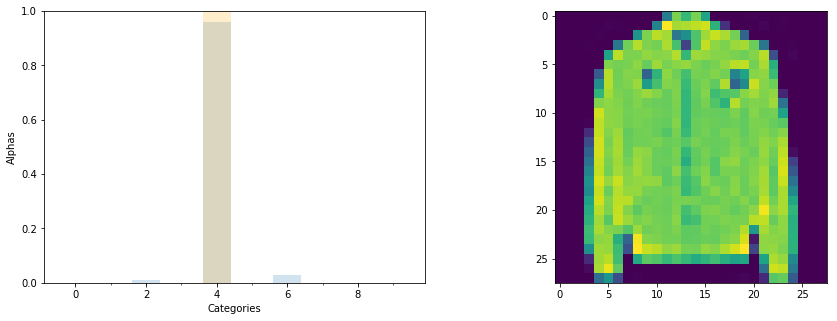

tensor([4.9578e+00, 3.3602e+01, 2.4608e+03, 2.4112e+00, 2.3731e+05, 9.2826e-01,
        7.0887e+03, 4.3465e-01, 2.2508e+02, 5.6347e-01])
tensor(4) tensor([4])
out:  tensor([1])


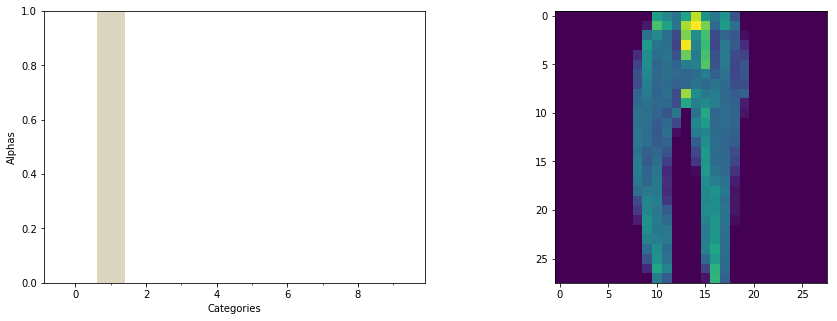

tensor([1.4684e+06, 6.2919e+11, 4.0421e+05, 6.3667e+04, 9.7086e+05, 1.0872e+02,
        1.1938e+05, 8.9846e-02, 7.3197e+04, 1.3950e-01])
tensor(1) tensor([1])
out:  tensor([8])


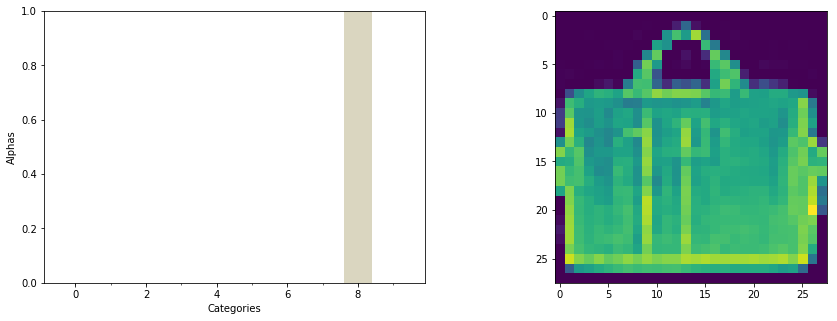

tensor([3.6364e+03, 1.0300e+00, 4.4169e+01, 2.9760e-01, 2.4430e+01, 4.0706e-01,
        5.2254e+01, 3.5417e-01, 3.5835e+08, 2.8408e-01])
tensor(8) tensor([8])
out:  tensor([5])


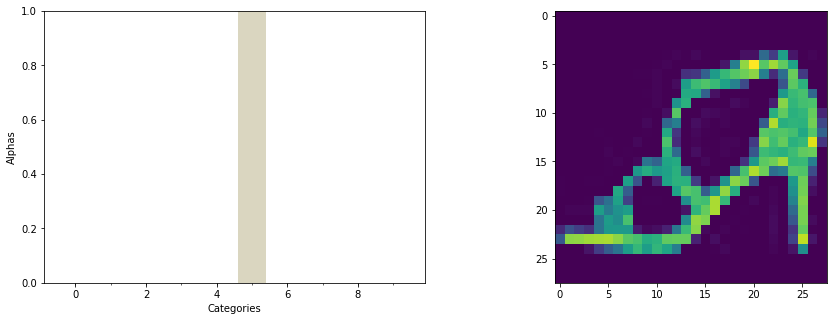

tensor([9.6580e+02, 5.8687e-02, 6.4921e+00, 2.1644e-02, 2.3379e-02, 7.6635e+12,
        1.3562e-02, 2.9937e+08, 1.1724e+02, 4.0320e+02])
tensor(5) tensor([5])
out:  tensor([9])


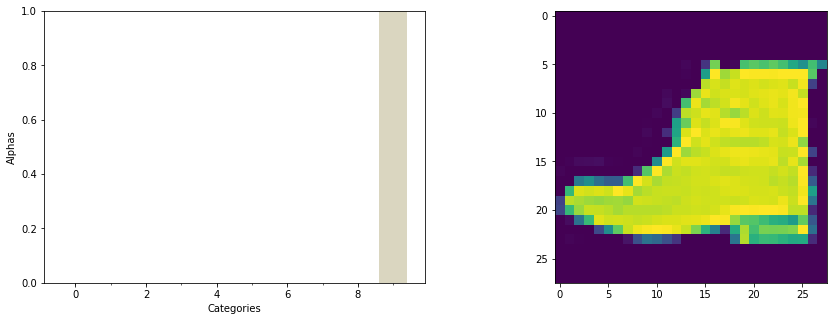

tensor([8.4704e+14, 1.8951e-01, 2.6431e+06, 1.4636e+05, 1.8043e+01, 2.5240e+21,
        5.3879e+10, 8.4518e+25, 1.1422e+20, 2.4530e+31])
tensor(9) tensor([9])
out:  tensor([5])


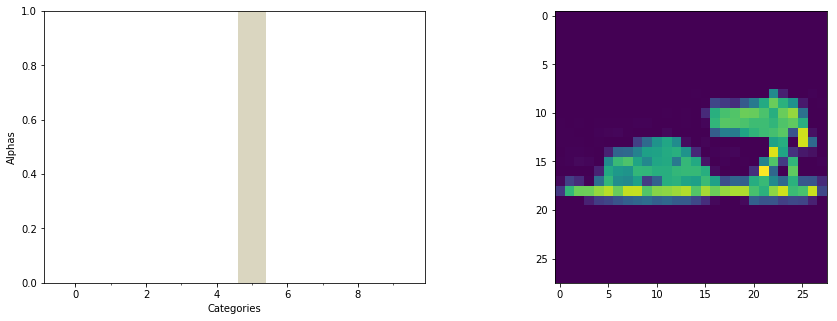

tensor([2.9255e+06, 8.3494e-02, 7.7019e+01, 6.2900e+00, 1.2762e-01, 1.1889e+16,
        1.8155e-01, 3.8124e+12, 6.0579e+07, 5.6601e+06])
tensor(5) tensor([5])
out:  tensor([0])


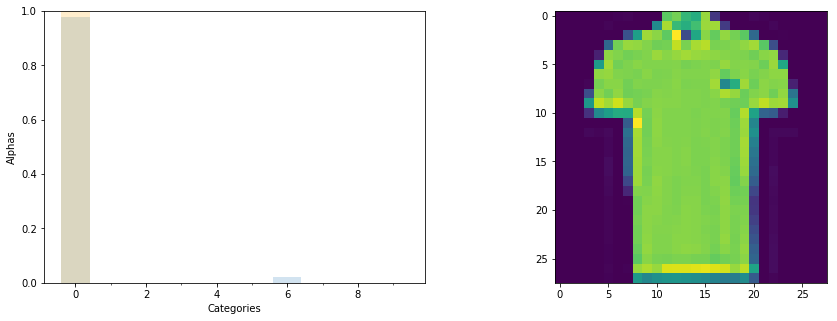

tensor([2.3712e+07, 2.6883e+01, 5.8706e+03, 1.4811e+04, 3.0921e+01, 3.9765e-01,
        5.3551e+05, 1.0749e-01, 7.3361e+02, 1.5603e-01])
tensor(0) tensor([0])
out:  tensor([3])


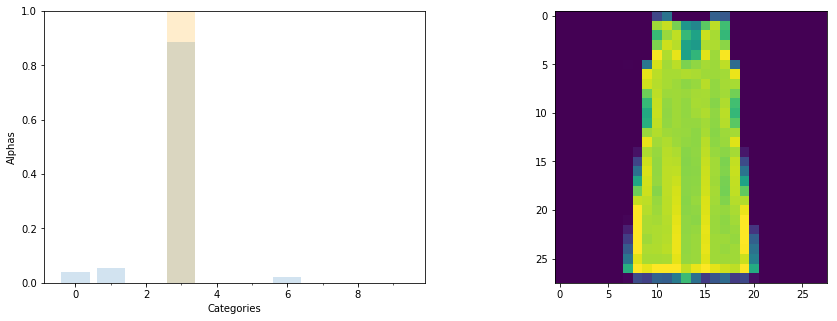

tensor([1.6429e+03, 2.3672e+03, 4.5606e+00, 3.7963e+04, 9.8605e+00, 1.2854e-01,
        8.5940e+02, 4.5576e-02, 4.2781e+01, 2.0622e-01])
tensor(3) tensor([3])
out:  tensor([2])


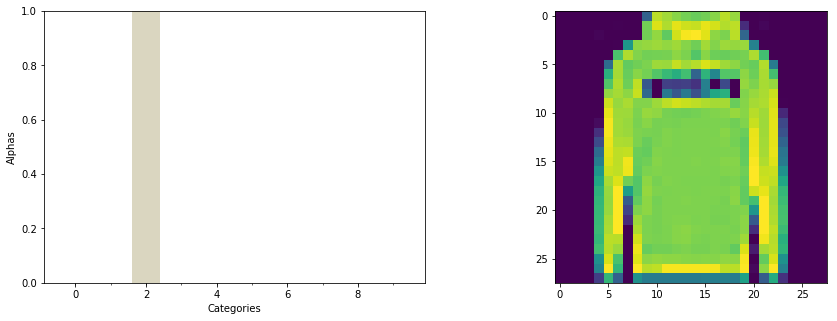

tensor([1.7700e+05, 1.1808e+02, 3.8198e+08, 1.1500e+03, 3.9841e+04, 1.6325e+00,
        3.1232e+04, 2.3153e-01, 2.2891e+04, 3.1296e-01])
tensor(2) tensor([2])
out:  tensor([0])


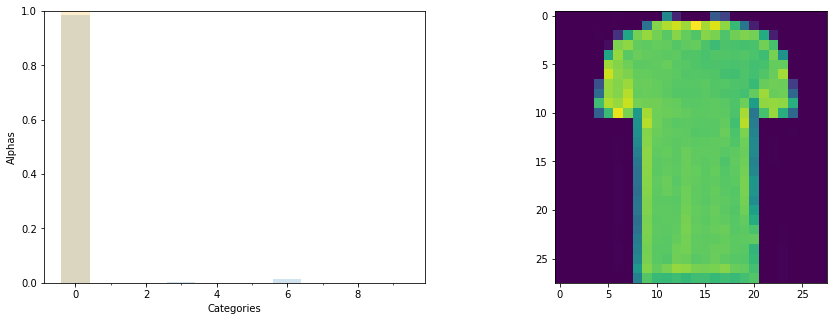

tensor([7.6483e+07, 7.8548e+00, 1.5725e+04, 1.2278e+05, 1.6826e+00, 3.8197e-01,
        1.0943e+06, 1.0408e-01, 1.4796e+03, 1.5080e-01])
tensor(0) tensor([0])
out:  tensor([2])


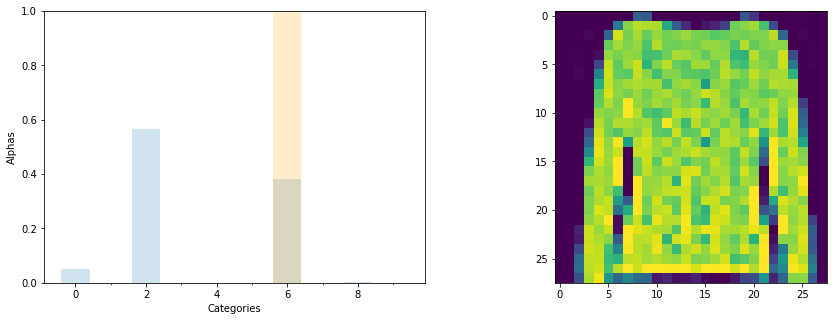

tensor([2.3227e+05, 3.7918e+02, 2.6666e+06, 1.3505e+03, 1.1020e+03, 2.4834e+00,
        1.7967e+06, 4.0819e-01, 1.0308e+04, 5.5983e-01])
tensor(2) tensor([6])
out:  tensor([5])


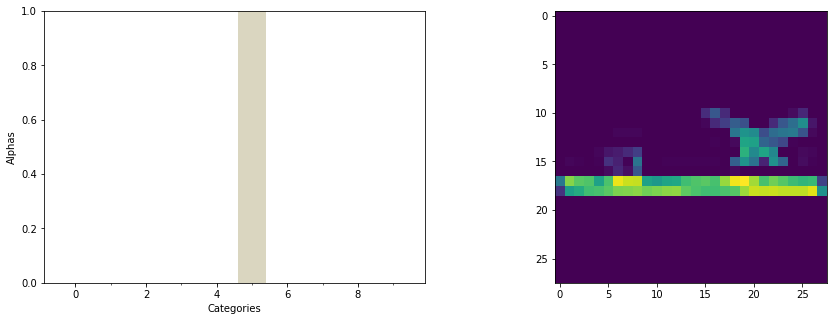

tensor([1.6552e+07, 7.9374e-02, 1.0433e+01, 8.8257e+00, 8.5008e-02, 3.4371e+18,
        1.6305e+00, 1.5221e+15, 6.5357e+07, 6.9968e+09])
tensor(5) tensor([5])
out:  tensor([3])


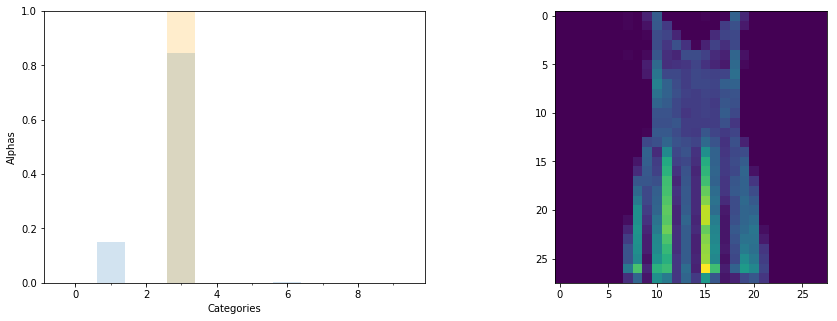

tensor([1.4104e+07, 2.3876e+09, 4.5706e+03, 1.3461e+10, 3.5301e+05, 9.5042e-01,
        2.5261e+07, 4.4423e-02, 3.2476e+06, 8.7627e-02])
tensor(3) tensor([3])
out:  tensor([6])


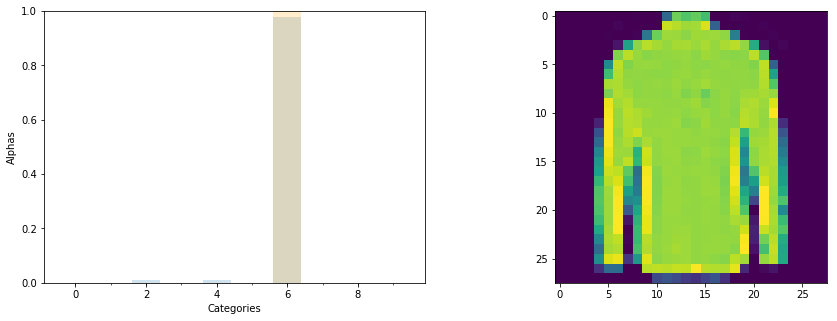

tensor([3.6398e+04, 7.1897e+03, 1.1664e+06, 2.8017e+03, 1.0835e+06, 1.7678e+00,
        1.1255e+08, 3.1559e-01, 4.8312e+04, 4.3015e-01])
tensor(6) tensor([6])
out:  tensor([7])


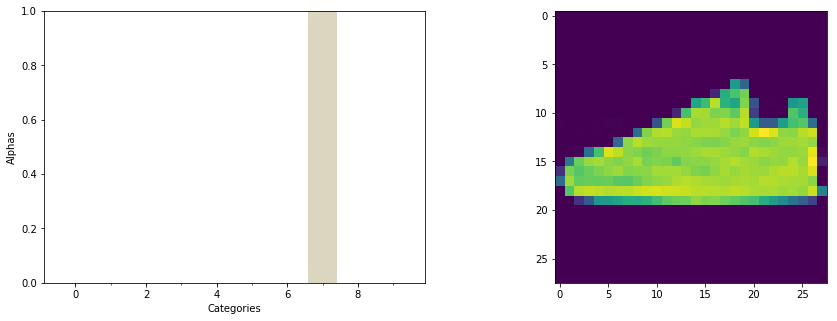

tensor([2.0162e+04, 1.7811e-01, 4.7331e+00, 1.5616e+00, 6.5252e-02, 1.8925e+09,
        1.1766e+01, 3.1548e+13, 2.7656e+06, 1.3890e+10])
tensor(7) tensor([7])
out:  tensor([1])


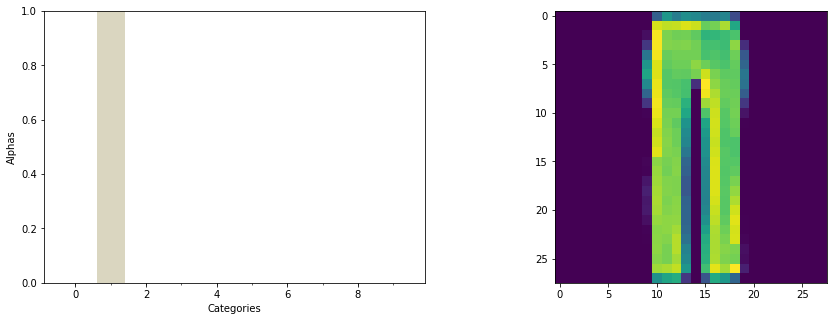

tensor([1.5012e+03, 7.9095e+10, 1.8670e+01, 3.3181e+05, 7.5700e+04, 2.6624e+01,
        4.2842e+04, 2.5158e-02, 9.4756e+03, 1.9918e-01])
tensor(1) tensor([1])
out:  tensor([8])


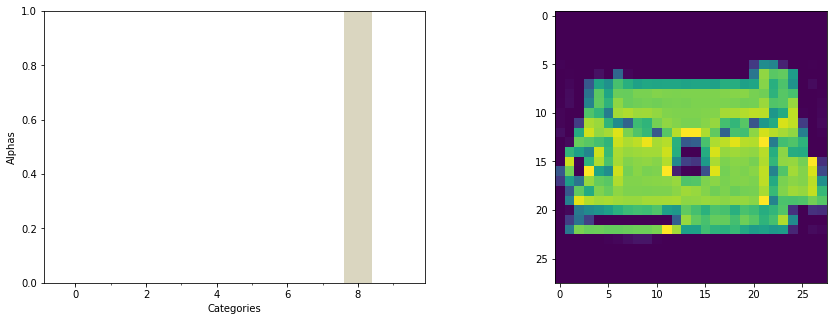

tensor([1.2659e+03, 5.4767e-01, 2.3835e+01, 2.6149e-01, 9.7268e-01, 5.2591e+00,
        3.8227e+01, 7.5607e-01, 2.7070e+06, 1.5457e-01])
tensor(8) tensor([8])
out:  tensor([0])


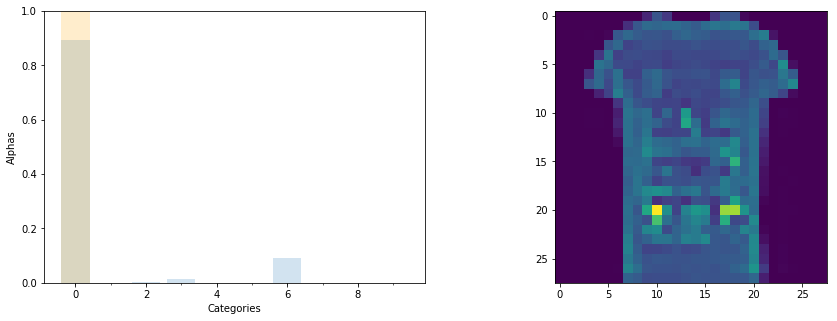

tensor([3.2204e+07, 2.0516e+04, 9.4619e+04, 4.9924e+05, 1.3538e+02, 1.2196e+00,
        3.2332e+06, 2.0251e-01, 6.6702e+03, 2.9743e-01])
tensor(0) tensor([0])
out:  tensor([1])


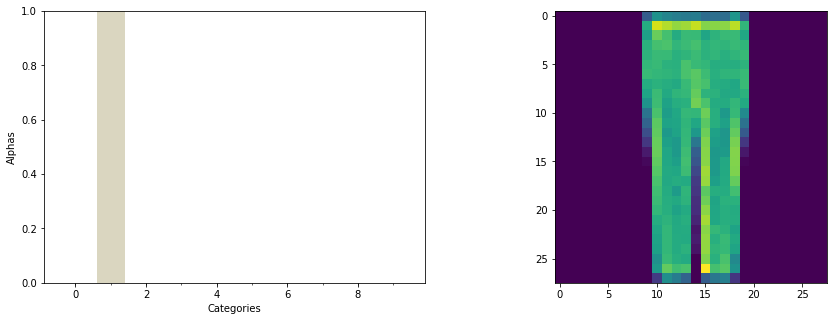

tensor([1.5578e-01, 2.7572e+05, 7.5557e-02, 4.0199e+00, 5.2410e+00, 8.1230e-01,
        1.8224e+01, 5.4684e-02, 4.4234e-01, 4.7640e-01])
tensor(1) tensor([1])
out:  tensor([2])


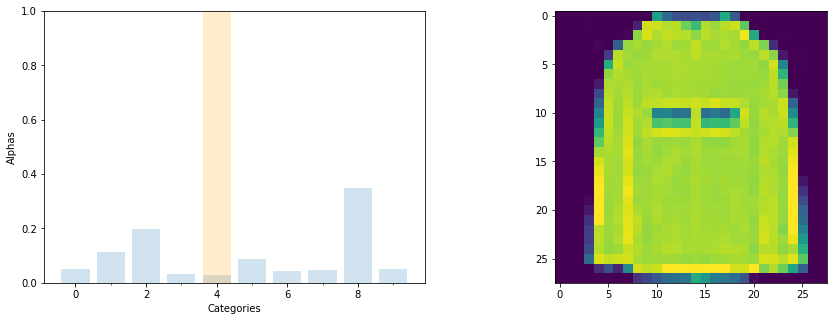

tensor([0.5746, 1.3198, 2.2865, 0.3933, 0.3389, 0.9955, 0.4939, 0.5358, 4.0179,
        0.6083])
tensor(8) tensor([4])
out:  tensor([2])


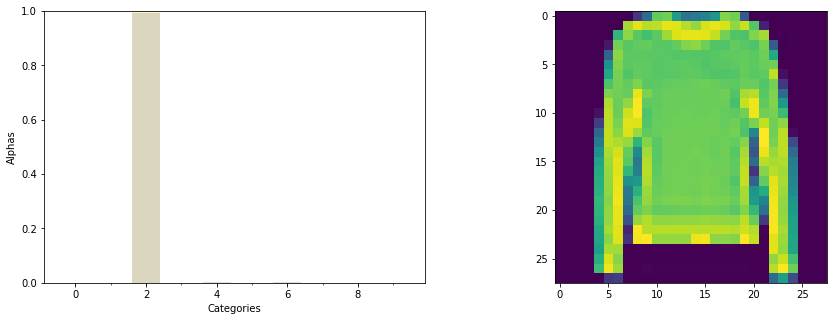

tensor([3.5559e+04, 2.1407e+03, 1.3062e+09, 3.3000e+03, 3.1975e+06, 2.1492e+00,
        5.2394e+06, 2.5287e-01, 2.0188e+03, 3.4077e-01])
tensor(2) tensor([2])
non_nan or inf:  100


(0.86, 0.87)

In [178]:
fmnist_model = LPADirNN()
print("loading model from: {}".format(FMNIST_PATH))
fmnist_model.load_state_dict(torch.load(FMNIST_PATH))
fmnist_model.eval()
evaluate_fmnist(model=fmnist_model,
                mus_w_mean=mus_w_mean_fmnist,
                mus_b_mean=mus_b_mean_fmnist,
                sigmas_w_mean=sigmas_w_mean_fmnist,
                sigmas_b_mean=sigmas_b_mean_fmnist,
                show=True,
                test_size=99)

In [179]:
fmnist_model = LPADirNN()
print("loading model from: {}".format(FMNIST_PATH))
fmnist_model.load_state_dict(torch.load(FMNIST_PATH))
fmnist_model.eval()
evaluate_mnist(model=fmnist_model,
               mus_w_mean=mus_w_mean_fmnist,
               mus_b_mean=mus_b_mean_fmnist,
               sigmas_w_mean=sigmas_w_mean_fmnist,
               sigmas_b_mean=sigmas_b_mean_fmnist,
               show=False,
               test_size=99)

loading model from: models/fmnist_test.pth
out:  tensor([5])
alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, nan])
compare pred, true:  tensor([9]) tensor([7])
NAN or inf!
out:  tensor([8])
alphas:  tensor([       inf, 1.0559e+24, 4.1582e+17, 5.1806e+23, 1.6157e+23,        inf,
        3.5077e+12, 3.9093e+12,        inf, 6.1601e-04])
compare pred, true:  tensor([8]) tensor([2])
NAN or inf!
out:  tensor([0])
alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, nan, inf, inf])
compare pred, true:  tensor([7]) tensor([1])
NAN or inf!
out:  tensor([8])
alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, nan])
compare pred, true:  tensor([9]) tensor([0])
NAN or inf!
out:  tensor([8])
alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, nan, inf, nan])
compare pred, true:  tensor([7]) tensor([4])
NAN or inf!
out:  tensor([0])
alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, nan, inf, inf])
compare pred, true:  tensor([7]) tensor([1])
NAN or inf!
out:  tensor([8])
alp

/home/marius/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


out:  tensor([8])
alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, nan])
compare pred, true:  tensor([9]) tensor([6])
NAN or inf!
out:  tensor([0])
alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, nan])
compare pred, true:  tensor([9]) tensor([5])
NAN or inf!
out:  tensor([8])
alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, nan])
compare pred, true:  tensor([9]) tensor([4])
NAN or inf!
out:  tensor([8])
alphas:  tensor([inf, nan, inf, inf, inf, inf, inf, inf, inf, nan])
compare pred, true:  tensor([1]) tensor([0])
NAN or inf!
out:  tensor([5])
alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, nan])
compare pred, true:  tensor([9]) tensor([7])
NAN or inf!
out:  tensor([8])
alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, nan])
compare pred, true:  tensor([9]) tensor([4])
NAN or inf!
out:  tensor([8])
alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, nan])
compare pred, true:  tensor([9]) tensor([0])
NAN or inf!

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, nan])
compare pred, true:  tensor([9]) tensor([4])
NAN or inf!
out:  tensor([0])
alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, nan, inf, nan])
compare pred, true:  tensor([7]) tensor([1])
NAN or inf!
out:  tensor([8])
alphas:  tensor([       inf, 2.2417e+15, 5.5015e+29, 2.0673e+06, 7.0477e+14, 1.1683e+08,
        6.2488e+17, 5.7111e-04,        inf, 6.6102e+08])
compare pred, true:  tensor([8]) tensor([7])
NAN or inf!
out:  tensor([8])
alphas:  tensor([inf, nan, inf, inf, inf, inf, inf, inf, inf, nan])
compare pred, true:  tensor([1]) tensor([6])
NAN or inf!
out:  tensor([8])
alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, nan])
compare pred, true:  tensor([9]) tensor([9])
NAN or inf!
non_nan or inf:  2


(0.0, 0.02)

# Check out CIFAR10 and CIFAR100

In [240]:
STEP_SIZE_TRAIN_CIFAR10 = 1 * 10e-6
BATCH_SIZE_CIFAR10 = 128
MAX_ITER_CIFAR10 = 70
TEST_BATCH_SIZE_CIFAR10 = 1
HESS_BATCH_SIZE_CIFAR10 = 32
STEP_SIZE_HESS_CIFAR10 = 1 * 10e-8

In [227]:
transform = torchvision.transforms.Compose(
    [torchvision.transforms.ToTensor(),
     torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='./cifar10', train=True,
                                        download=True, transform=transform)
CIFAR10_train_loader = torch.utils.data.DataLoader(trainset, batch_size=BATCH_SIZE_CIFAR10,
                                          shuffle=False)

testset = torchvision.datasets.CIFAR10(root='./cifar10', train=False,
                                       download=True, transform=transform)
CIFAR10_test_loader = torch.utils.data.DataLoader(testset, batch_size=TEST_BATCH_SIZE_CIFAR10,
                                         shuffle=False)

CIFAR10_classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

Files already downloaded and verified
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([49])
torch.Size([1, 3, 32, 32])


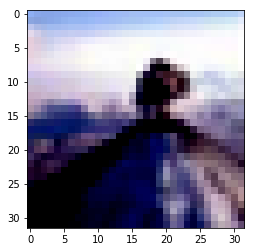

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([33])
torch.Size([1, 3, 32, 32])


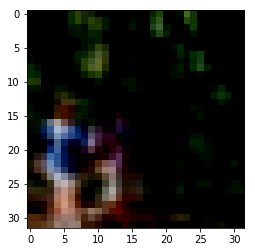

tensor([72])
torch.Size([1, 3, 32, 32])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


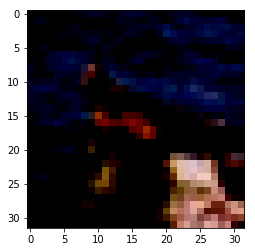

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([51])
torch.Size([1, 3, 32, 32])


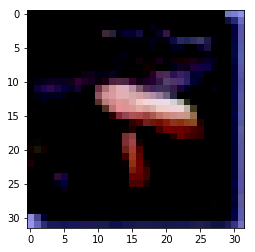

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([71])
torch.Size([1, 3, 32, 32])


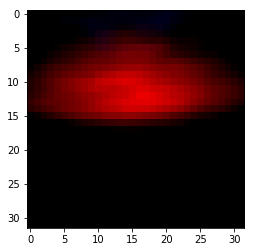

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([92])
torch.Size([1, 3, 32, 32])


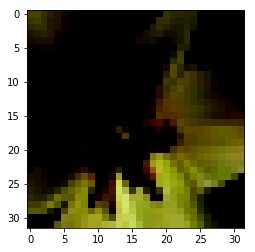

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([15])
torch.Size([1, 3, 32, 32])


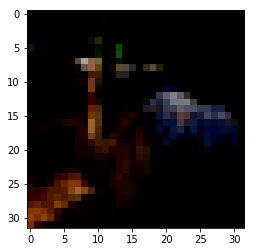

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([14])
torch.Size([1, 3, 32, 32])


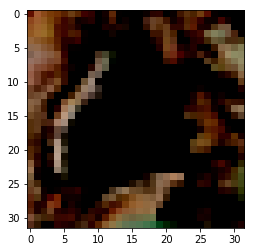

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([23])
torch.Size([1, 3, 32, 32])


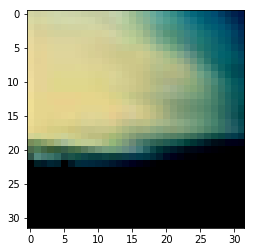

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([0])
torch.Size([1, 3, 32, 32])


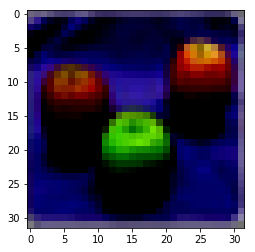

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([71])
torch.Size([1, 3, 32, 32])


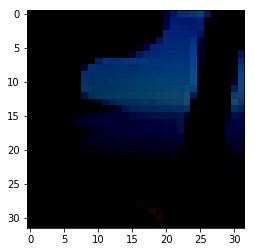

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([75])
torch.Size([1, 3, 32, 32])


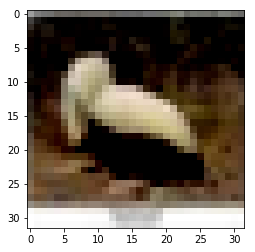

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([81])
torch.Size([1, 3, 32, 32])


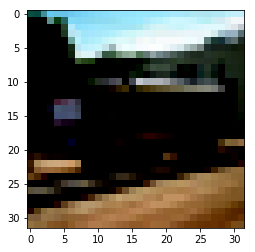

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([69])
torch.Size([1, 3, 32, 32])


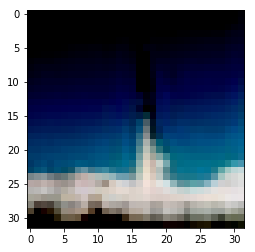

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([40])
torch.Size([1, 3, 32, 32])


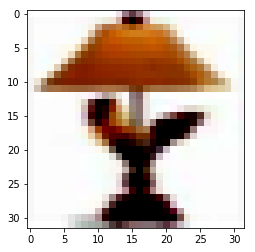

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([43])
torch.Size([1, 3, 32, 32])


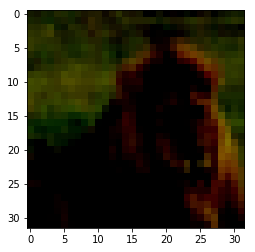

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([92])
torch.Size([1, 3, 32, 32])


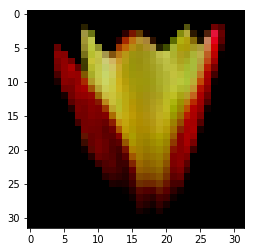

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([97])
torch.Size([1, 3, 32, 32])


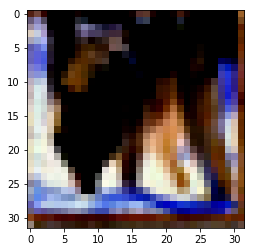

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([70])
torch.Size([1, 3, 32, 32])


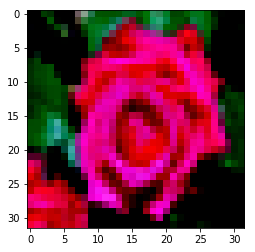

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([53])
torch.Size([1, 3, 32, 32])


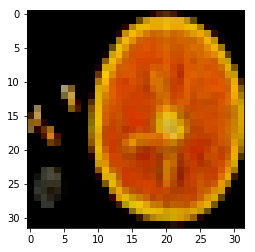

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([70])
torch.Size([1, 3, 32, 32])


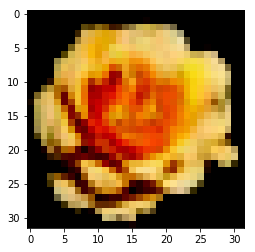

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([49])
torch.Size([1, 3, 32, 32])


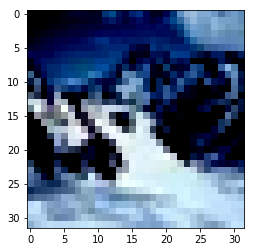

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([75])
torch.Size([1, 3, 32, 32])


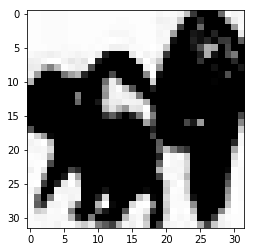

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([29])
torch.Size([1, 3, 32, 32])


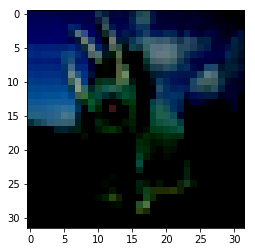

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([21])
torch.Size([1, 3, 32, 32])


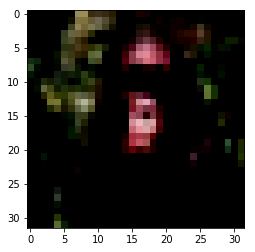

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([16])
torch.Size([1, 3, 32, 32])


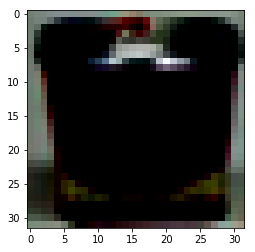

tensor([39])
torch.Size([1, 3, 32, 32])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


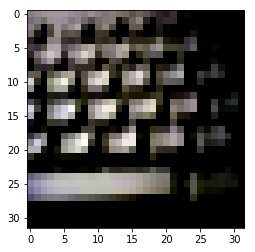

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([8])
torch.Size([1, 3, 32, 32])


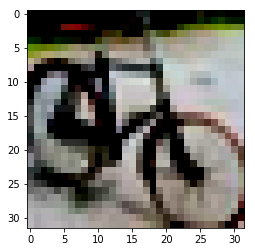

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([8])
torch.Size([1, 3, 32, 32])


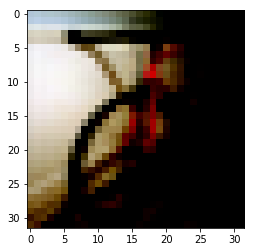

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([70])
torch.Size([1, 3, 32, 32])


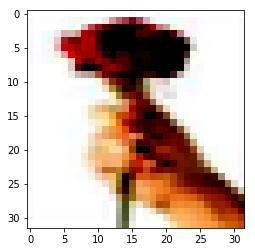

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([20])
torch.Size([1, 3, 32, 32])


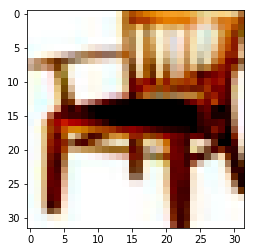

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([61])
torch.Size([1, 3, 32, 32])


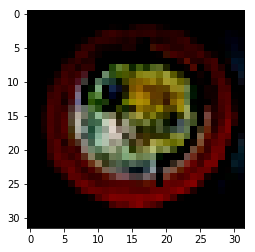

tensor([41])
torch.Size([1, 3, 32, 32])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


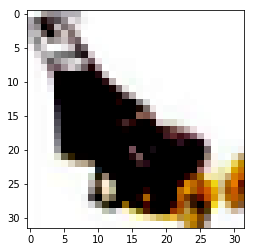

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([93])
torch.Size([1, 3, 32, 32])


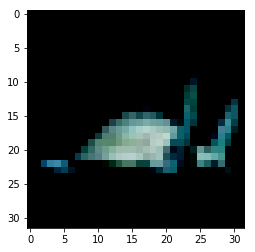

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([56])
torch.Size([1, 3, 32, 32])


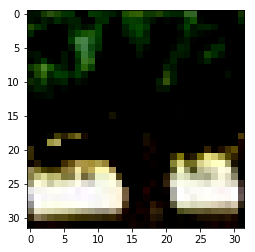

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([73])
torch.Size([1, 3, 32, 32])


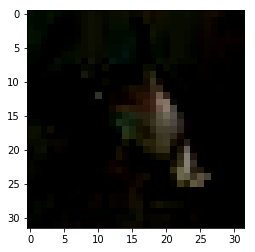

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([58])
torch.Size([1, 3, 32, 32])


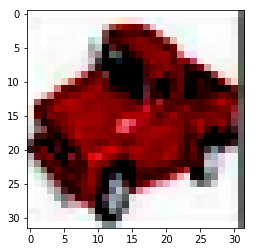

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([11])
torch.Size([1, 3, 32, 32])


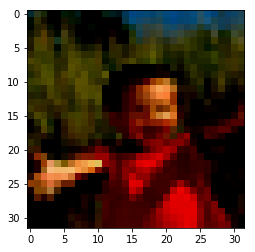

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([25])
torch.Size([1, 3, 32, 32])


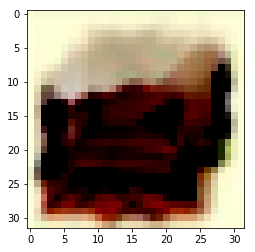

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([37])
torch.Size([1, 3, 32, 32])


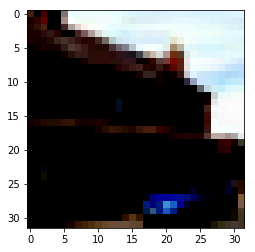

tensor([63])
torch.Size([1, 3, 32, 32])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


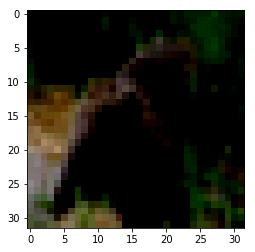

tensor([24])
torch.Size([1, 3, 32, 32])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


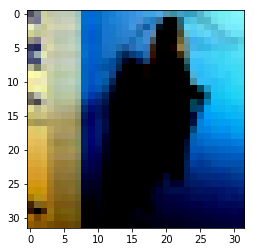

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([49])
torch.Size([1, 3, 32, 32])


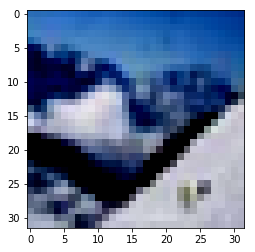

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([73])
torch.Size([1, 3, 32, 32])


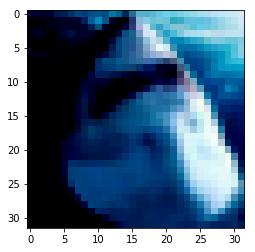

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([56])
torch.Size([1, 3, 32, 32])


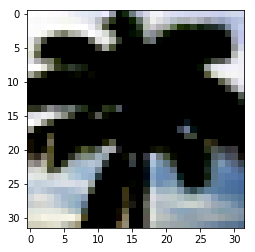

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([22])
torch.Size([1, 3, 32, 32])


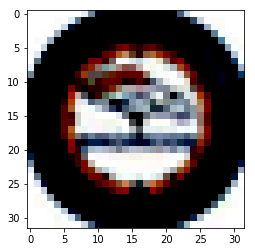

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([41])
torch.Size([1, 3, 32, 32])


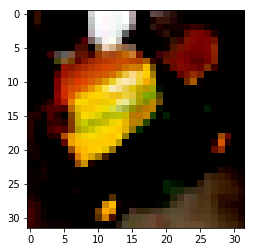

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([58])
torch.Size([1, 3, 32, 32])


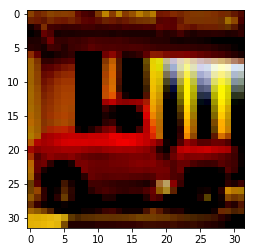

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([75])
torch.Size([1, 3, 32, 32])


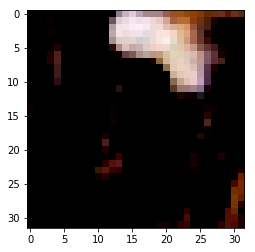

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([17])
torch.Size([1, 3, 32, 32])


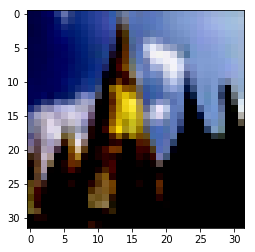

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([4])
torch.Size([1, 3, 32, 32])


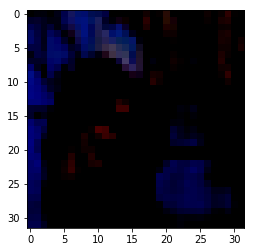

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([6])
torch.Size([1, 3, 32, 32])


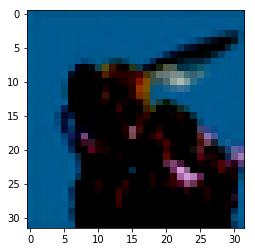

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([9])
torch.Size([1, 3, 32, 32])


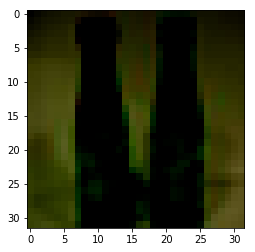

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([57])
torch.Size([1, 3, 32, 32])


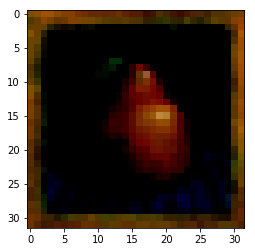

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([2])
torch.Size([1, 3, 32, 32])


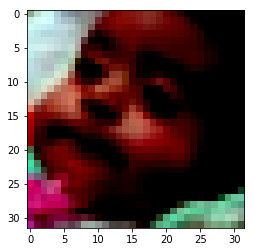

tensor([32])
torch.Size([1, 3, 32, 32])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


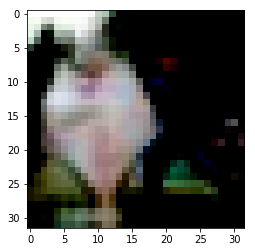

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([71])
torch.Size([1, 3, 32, 32])


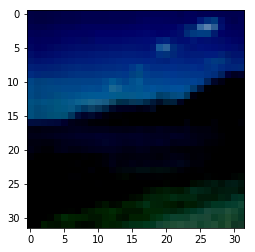

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([52])
torch.Size([1, 3, 32, 32])


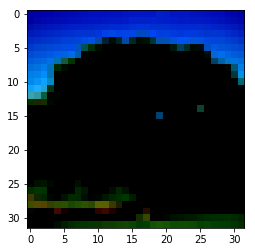

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([42])
torch.Size([1, 3, 32, 32])


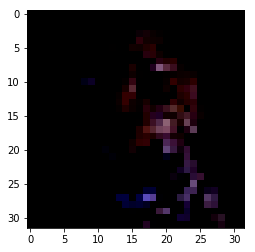

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([69])
torch.Size([1, 3, 32, 32])


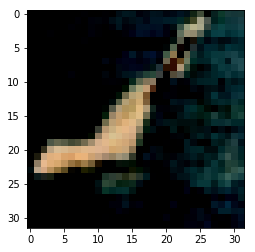

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([77])
torch.Size([1, 3, 32, 32])


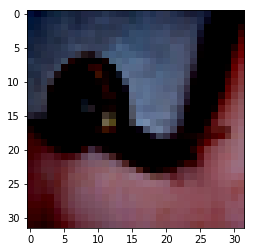

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([27])
torch.Size([1, 3, 32, 32])


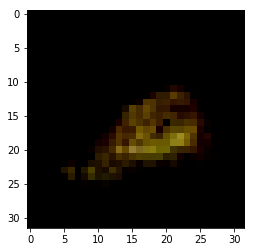

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([15])
torch.Size([1, 3, 32, 32])


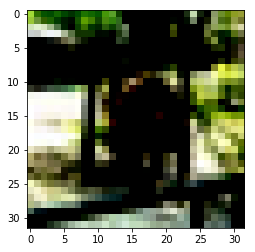

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([65])
torch.Size([1, 3, 32, 32])


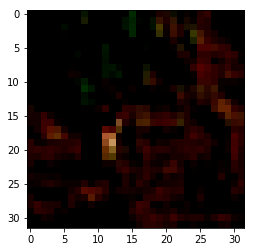

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([7])
torch.Size([1, 3, 32, 32])


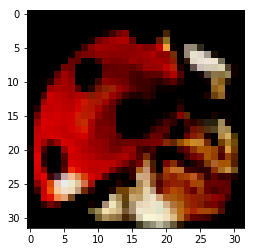

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([35])
torch.Size([1, 3, 32, 32])


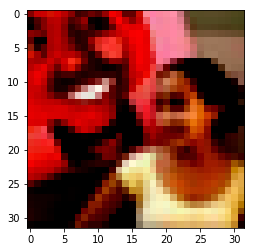

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([43])
torch.Size([1, 3, 32, 32])


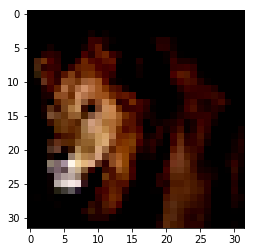

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([82])
torch.Size([1, 3, 32, 32])


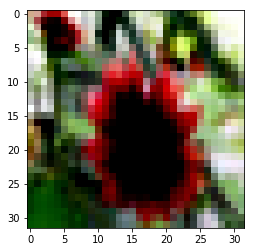

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([63])
torch.Size([1, 3, 32, 32])


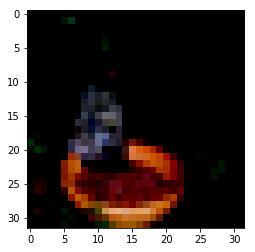

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([92])
torch.Size([1, 3, 32, 32])


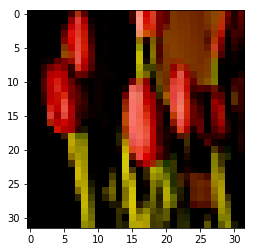

tensor([66])
torch.Size([1, 3, 32, 32])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


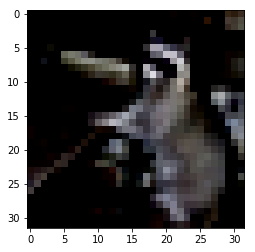

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([90])
torch.Size([1, 3, 32, 32])


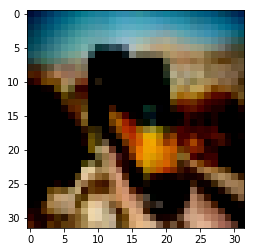

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([67])
torch.Size([1, 3, 32, 32])


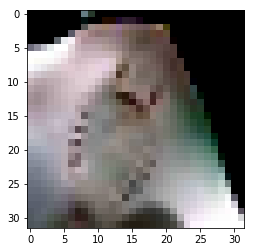

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([91])
torch.Size([1, 3, 32, 32])


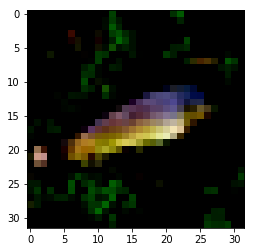

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([32])
torch.Size([1, 3, 32, 32])


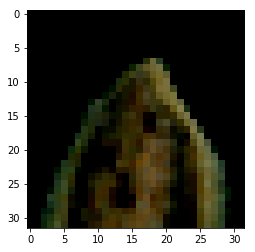

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([32])
torch.Size([1, 3, 32, 32])


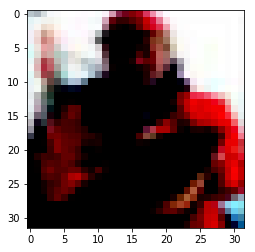

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([82])
torch.Size([1, 3, 32, 32])


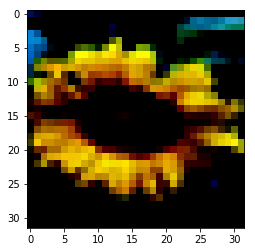

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([10])
torch.Size([1, 3, 32, 32])


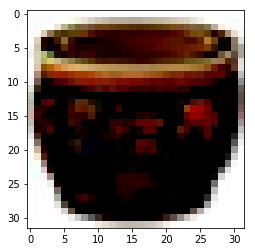

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([77])
torch.Size([1, 3, 32, 32])


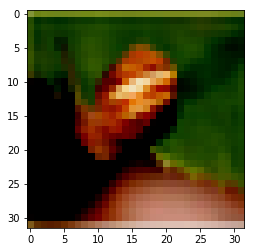

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([22])
torch.Size([1, 3, 32, 32])


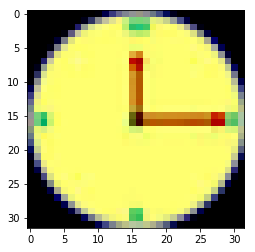

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([71])
torch.Size([1, 3, 32, 32])


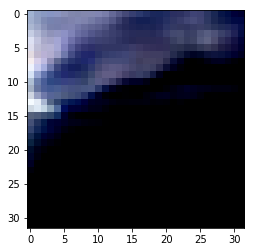

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([78])
torch.Size([1, 3, 32, 32])


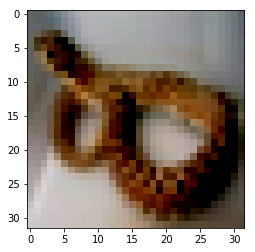

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([54])
torch.Size([1, 3, 32, 32])


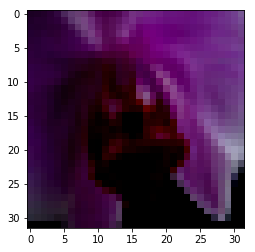

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([6])
torch.Size([1, 3, 32, 32])


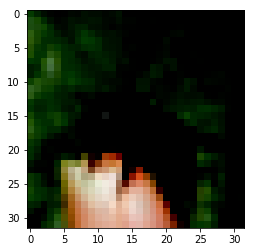

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([29])
torch.Size([1, 3, 32, 32])


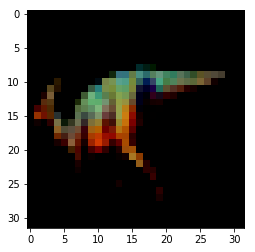

tensor([89])
torch.Size([1, 3, 32, 32])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


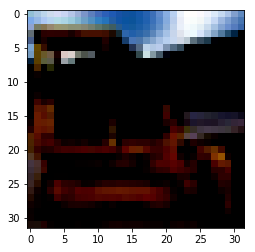

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([78])
torch.Size([1, 3, 32, 32])


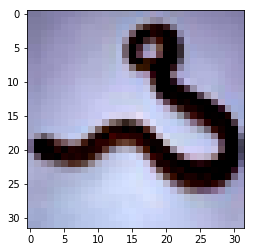

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([33])
torch.Size([1, 3, 32, 32])


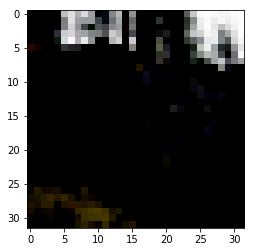

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([11])
torch.Size([1, 3, 32, 32])


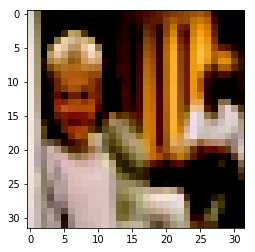

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([67])
torch.Size([1, 3, 32, 32])


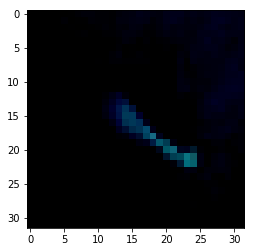

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([22])
torch.Size([1, 3, 32, 32])


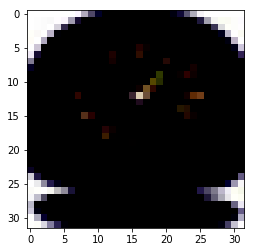

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([18])
torch.Size([1, 3, 32, 32])


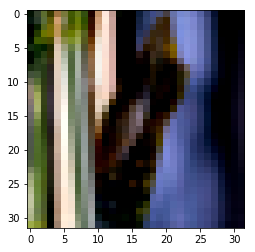

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([27])
torch.Size([1, 3, 32, 32])


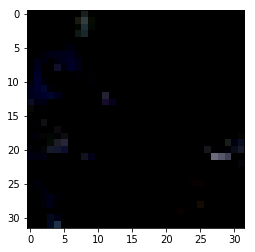

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([21])
torch.Size([1, 3, 32, 32])


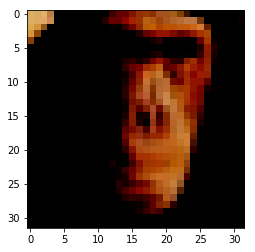

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([13])
torch.Size([1, 3, 32, 32])


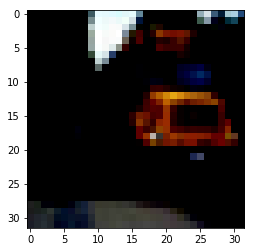

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([21])
torch.Size([1, 3, 32, 32])


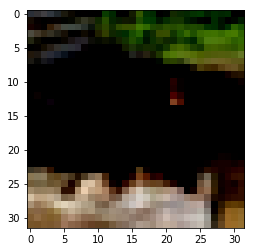

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([50])
torch.Size([1, 3, 32, 32])


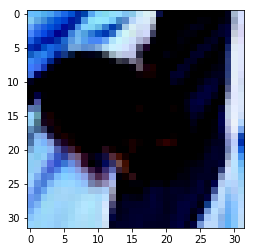

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([75])
torch.Size([1, 3, 32, 32])


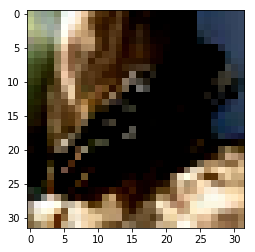

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([37])
torch.Size([1, 3, 32, 32])


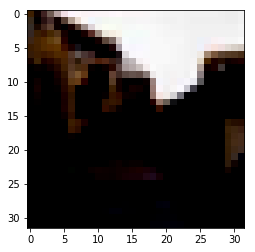

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([35])
torch.Size([1, 3, 32, 32])


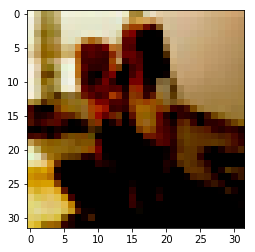

tensor([26])
torch.Size([1, 3, 32, 32])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


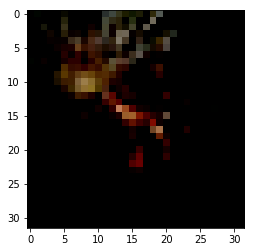

In [229]:
for idx, (x,y) in enumerate(CIFAR100_test_loader):
    print(y)
    print(x.size())
    plt.imshow(x.view(3, 32, 32).permute(1, 2, 0))
    plt.show()
    
    if idx >= 10: break

In [230]:
# make a new network for cifar10 and 100

class LPADirNN_CIFAR(torch.nn.Module):
    def __init__(self, num_classes=10):
        
        super(LPADirNN_CIFAR, self).__init__()
        
        self.c1 = torch.nn.Conv2d(3, 20, 5, 1)
        self.relu1 = torch.nn.ReLU()
        self.maxpool2d1 = torch.nn.MaxPool2d(2,2)
        self.c2 = torch.nn.Conv2d(20, 50, 5, 1)
        self.relu2 = torch.nn.ReLU()
        self.maxpool2d2 = torch.nn.MaxPool2d(2,2)
        self.flatten = Flatten()
        self.l1 = torch.nn.Linear(5 * 5 * 50, 500)
        self.relu3 = torch.nn.ReLU()
        self.l2 = torch.nn.Linear(500, num_classes)
        
    def forward(self, x, phi=False):
        
        x = self.c1(x)
        x = self.relu1(x)
        x = self.maxpool2d1(x)
        x = self.c2(x)
        x = self.relu2(x)
        x = self.maxpool2d2(x)
        x = self.flatten(x)
        x = self.l1(x)
        x = self.relu3(x)
        if phi:
            return(x)
        else:
            x = self.l2(x)
            return(x)

In [231]:
CIFAR10_model = LPADirNN_CIFAR()
loss_function = torch.nn.CrossEntropyLoss()

CIFAR10_train_optimizer = torch.optim.Adam(CIFAR10_model.parameters(), lr=STEP_SIZE_TRAIN_CIFAR10)

In [232]:
for iter in range(MAX_ITER_CIFAR10):
    for batch_idx, (x, y) in enumerate(CIFAR10_train_loader):
        max_len = int(np.ceil(len(CIFAR10_train_loader.dataset)/BATCH_SIZE))
        output = CIFAR10_model(x, phi=False)

        accuracy = get_accuracy(output, y)

        #with backpack(DiagGGNMC()):
        #    loss = loss_function(output, y)
        #    loss.backward()
        #    mnist_optimizer.step()
        
        loss = loss_function(output, y)
        loss.backward()
        CIFAR10_train_optimizer.step()

        print(
            "Iteration {}; {}/{} \t".format(iter, batch_idx, max_len) +
            "Minibatch Loss %.3f  " % (loss) +
            "Accuracy %.0f" % (accuracy * 100) + "%"
        )

CIFAR10_PATH = "models/CIFAR10_model.pth"
print("saving model at: {}".format(CIFAR10_PATH))
torch.save(CIFAR10_model.state_dict(), CIFAR10_PATH)

Iteration 0; 0/782 	Minibatch Loss 2.299  Accuracy 16%
Iteration 0; 1/782 	Minibatch Loss 2.304  Accuracy 10%
Iteration 0; 2/782 	Minibatch Loss 2.302  Accuracy 14%
Iteration 0; 3/782 	Minibatch Loss 2.303  Accuracy 11%
Iteration 0; 4/782 	Minibatch Loss 2.302  Accuracy 9%
Iteration 0; 5/782 	Minibatch Loss 2.300  Accuracy 12%
Iteration 0; 6/782 	Minibatch Loss 2.294  Accuracy 10%
Iteration 0; 7/782 	Minibatch Loss 2.305  Accuracy 6%
Iteration 0; 8/782 	Minibatch Loss 2.286  Accuracy 16%
Iteration 0; 9/782 	Minibatch Loss 2.295  Accuracy 14%
Iteration 0; 10/782 	Minibatch Loss 2.301  Accuracy 9%
Iteration 0; 11/782 	Minibatch Loss 2.299  Accuracy 9%
Iteration 0; 12/782 	Minibatch Loss 2.299  Accuracy 9%
Iteration 0; 13/782 	Minibatch Loss 2.293  Accuracy 12%
Iteration 0; 14/782 	Minibatch Loss 2.298  Accuracy 5%
Iteration 0; 15/782 	Minibatch Loss 2.297  Accuracy 9%
Iteration 0; 16/782 	Minibatch Loss 2.295  Accuracy 7%
Iteration 0; 17/782 	Minibatch Loss 2.295  Accuracy 11%
Iteration 

Iteration 0; 147/782 	Minibatch Loss 2.146  Accuracy 28%
Iteration 0; 148/782 	Minibatch Loss 2.186  Accuracy 16%
Iteration 0; 149/782 	Minibatch Loss 2.162  Accuracy 25%
Iteration 0; 150/782 	Minibatch Loss 2.172  Accuracy 18%
Iteration 0; 151/782 	Minibatch Loss 2.127  Accuracy 25%
Iteration 0; 152/782 	Minibatch Loss 2.115  Accuracy 27%
Iteration 0; 153/782 	Minibatch Loss 2.121  Accuracy 27%
Iteration 0; 154/782 	Minibatch Loss 2.136  Accuracy 27%
Iteration 0; 155/782 	Minibatch Loss 2.104  Accuracy 23%
Iteration 0; 156/782 	Minibatch Loss 2.170  Accuracy 20%
Iteration 0; 157/782 	Minibatch Loss 2.121  Accuracy 27%
Iteration 0; 158/782 	Minibatch Loss 2.088  Accuracy 27%
Iteration 0; 159/782 	Minibatch Loss 2.112  Accuracy 25%
Iteration 0; 160/782 	Minibatch Loss 2.140  Accuracy 28%
Iteration 0; 161/782 	Minibatch Loss 2.115  Accuracy 30%
Iteration 0; 162/782 	Minibatch Loss 2.058  Accuracy 30%
Iteration 0; 163/782 	Minibatch Loss 2.096  Accuracy 26%
Iteration 0; 164/782 	Minibatch

Iteration 0; 291/782 	Minibatch Loss 1.928  Accuracy 33%
Iteration 0; 292/782 	Minibatch Loss 2.021  Accuracy 20%
Iteration 0; 293/782 	Minibatch Loss 1.945  Accuracy 37%
Iteration 0; 294/782 	Minibatch Loss 1.966  Accuracy 31%
Iteration 0; 295/782 	Minibatch Loss 1.896  Accuracy 34%
Iteration 0; 296/782 	Minibatch Loss 1.974  Accuracy 25%
Iteration 0; 297/782 	Minibatch Loss 1.970  Accuracy 27%
Iteration 0; 298/782 	Minibatch Loss 1.952  Accuracy 28%
Iteration 0; 299/782 	Minibatch Loss 1.954  Accuracy 34%
Iteration 0; 300/782 	Minibatch Loss 1.963  Accuracy 34%
Iteration 0; 301/782 	Minibatch Loss 1.872  Accuracy 32%
Iteration 0; 302/782 	Minibatch Loss 1.967  Accuracy 33%
Iteration 0; 303/782 	Minibatch Loss 1.831  Accuracy 34%
Iteration 0; 304/782 	Minibatch Loss 1.899  Accuracy 30%
Iteration 0; 305/782 	Minibatch Loss 1.965  Accuracy 30%
Iteration 0; 306/782 	Minibatch Loss 1.997  Accuracy 23%
Iteration 0; 307/782 	Minibatch Loss 1.973  Accuracy 31%
Iteration 0; 308/782 	Minibatch

Iteration 1; 45/782 	Minibatch Loss 1.977  Accuracy 26%
Iteration 1; 46/782 	Minibatch Loss 1.930  Accuracy 28%
Iteration 1; 47/782 	Minibatch Loss 2.050  Accuracy 26%
Iteration 1; 48/782 	Minibatch Loss 1.959  Accuracy 27%
Iteration 1; 49/782 	Minibatch Loss 2.097  Accuracy 27%
Iteration 1; 50/782 	Minibatch Loss 2.038  Accuracy 27%
Iteration 1; 51/782 	Minibatch Loss 2.209  Accuracy 27%
Iteration 1; 52/782 	Minibatch Loss 1.947  Accuracy 30%
Iteration 1; 53/782 	Minibatch Loss 2.094  Accuracy 30%
Iteration 1; 54/782 	Minibatch Loss 1.995  Accuracy 27%
Iteration 1; 55/782 	Minibatch Loss 2.015  Accuracy 29%
Iteration 1; 56/782 	Minibatch Loss 2.004  Accuracy 35%
Iteration 1; 57/782 	Minibatch Loss 2.100  Accuracy 23%
Iteration 1; 58/782 	Minibatch Loss 1.810  Accuracy 34%
Iteration 1; 59/782 	Minibatch Loss 2.204  Accuracy 23%
Iteration 1; 60/782 	Minibatch Loss 1.936  Accuracy 29%
Iteration 1; 61/782 	Minibatch Loss 2.068  Accuracy 23%
Iteration 1; 62/782 	Minibatch Loss 1.983  Accur

Iteration 1; 191/782 	Minibatch Loss 1.800  Accuracy 30%
Iteration 1; 192/782 	Minibatch Loss 1.895  Accuracy 30%
Iteration 1; 193/782 	Minibatch Loss 1.944  Accuracy 27%
Iteration 1; 194/782 	Minibatch Loss 1.970  Accuracy 31%
Iteration 1; 195/782 	Minibatch Loss 1.857  Accuracy 35%
Iteration 1; 196/782 	Minibatch Loss 1.835  Accuracy 34%
Iteration 1; 197/782 	Minibatch Loss 1.948  Accuracy 30%
Iteration 1; 198/782 	Minibatch Loss 1.845  Accuracy 38%
Iteration 1; 199/782 	Minibatch Loss 1.906  Accuracy 34%
Iteration 1; 200/782 	Minibatch Loss 2.039  Accuracy 29%
Iteration 1; 201/782 	Minibatch Loss 1.865  Accuracy 34%
Iteration 1; 202/782 	Minibatch Loss 1.887  Accuracy 27%
Iteration 1; 203/782 	Minibatch Loss 1.778  Accuracy 28%
Iteration 1; 204/782 	Minibatch Loss 1.802  Accuracy 34%
Iteration 1; 205/782 	Minibatch Loss 1.909  Accuracy 30%
Iteration 1; 206/782 	Minibatch Loss 1.936  Accuracy 23%
Iteration 1; 207/782 	Minibatch Loss 1.836  Accuracy 30%
Iteration 1; 208/782 	Minibatch

Iteration 1; 335/782 	Minibatch Loss 2.026  Accuracy 20%
Iteration 1; 336/782 	Minibatch Loss 1.932  Accuracy 25%
Iteration 1; 337/782 	Minibatch Loss 2.002  Accuracy 20%
Iteration 1; 338/782 	Minibatch Loss 1.902  Accuracy 24%
Iteration 1; 339/782 	Minibatch Loss 2.051  Accuracy 22%
Iteration 1; 340/782 	Minibatch Loss 2.003  Accuracy 20%
Iteration 1; 341/782 	Minibatch Loss 1.897  Accuracy 26%
Iteration 1; 342/782 	Minibatch Loss 2.004  Accuracy 27%
Iteration 1; 343/782 	Minibatch Loss 1.962  Accuracy 27%
Iteration 1; 344/782 	Minibatch Loss 1.994  Accuracy 27%
Iteration 1; 345/782 	Minibatch Loss 2.018  Accuracy 23%
Iteration 1; 346/782 	Minibatch Loss 1.964  Accuracy 27%
Iteration 1; 347/782 	Minibatch Loss 2.020  Accuracy 22%
Iteration 1; 348/782 	Minibatch Loss 1.967  Accuracy 26%
Iteration 1; 349/782 	Minibatch Loss 1.959  Accuracy 25%
Iteration 1; 350/782 	Minibatch Loss 1.987  Accuracy 20%
Iteration 1; 351/782 	Minibatch Loss 1.889  Accuracy 27%
Iteration 1; 352/782 	Minibatch

Iteration 2; 90/782 	Minibatch Loss 1.862  Accuracy 37%
Iteration 2; 91/782 	Minibatch Loss 1.855  Accuracy 38%
Iteration 2; 92/782 	Minibatch Loss 2.011  Accuracy 23%
Iteration 2; 93/782 	Minibatch Loss 1.933  Accuracy 39%
Iteration 2; 94/782 	Minibatch Loss 1.931  Accuracy 31%
Iteration 2; 95/782 	Minibatch Loss 1.906  Accuracy 39%
Iteration 2; 96/782 	Minibatch Loss 1.962  Accuracy 32%
Iteration 2; 97/782 	Minibatch Loss 1.925  Accuracy 34%
Iteration 2; 98/782 	Minibatch Loss 1.933  Accuracy 30%
Iteration 2; 99/782 	Minibatch Loss 1.950  Accuracy 34%
Iteration 2; 100/782 	Minibatch Loss 1.943  Accuracy 32%
Iteration 2; 101/782 	Minibatch Loss 1.907  Accuracy 30%
Iteration 2; 102/782 	Minibatch Loss 1.949  Accuracy 36%
Iteration 2; 103/782 	Minibatch Loss 1.964  Accuracy 31%
Iteration 2; 104/782 	Minibatch Loss 1.948  Accuracy 36%
Iteration 2; 105/782 	Minibatch Loss 1.907  Accuracy 41%
Iteration 2; 106/782 	Minibatch Loss 1.936  Accuracy 35%
Iteration 2; 107/782 	Minibatch Loss 1.92

Iteration 2; 234/782 	Minibatch Loss 1.830  Accuracy 43%
Iteration 2; 235/782 	Minibatch Loss 1.926  Accuracy 33%
Iteration 2; 236/782 	Minibatch Loss 1.902  Accuracy 31%
Iteration 2; 237/782 	Minibatch Loss 1.830  Accuracy 30%
Iteration 2; 238/782 	Minibatch Loss 1.939  Accuracy 33%
Iteration 2; 239/782 	Minibatch Loss 1.973  Accuracy 30%
Iteration 2; 240/782 	Minibatch Loss 1.973  Accuracy 34%
Iteration 2; 241/782 	Minibatch Loss 1.860  Accuracy 32%
Iteration 2; 242/782 	Minibatch Loss 1.861  Accuracy 33%
Iteration 2; 243/782 	Minibatch Loss 1.916  Accuracy 39%
Iteration 2; 244/782 	Minibatch Loss 1.789  Accuracy 45%
Iteration 2; 245/782 	Minibatch Loss 1.996  Accuracy 27%
Iteration 2; 246/782 	Minibatch Loss 1.832  Accuracy 34%
Iteration 2; 247/782 	Minibatch Loss 1.864  Accuracy 30%
Iteration 2; 248/782 	Minibatch Loss 1.900  Accuracy 36%
Iteration 2; 249/782 	Minibatch Loss 1.892  Accuracy 38%
Iteration 2; 250/782 	Minibatch Loss 1.902  Accuracy 36%
Iteration 2; 251/782 	Minibatch

Iteration 2; 379/782 	Minibatch Loss 1.756  Accuracy 41%
Iteration 2; 380/782 	Minibatch Loss 1.775  Accuracy 38%
Iteration 2; 381/782 	Minibatch Loss 1.788  Accuracy 38%
Iteration 2; 382/782 	Minibatch Loss 1.780  Accuracy 37%
Iteration 2; 383/782 	Minibatch Loss 1.854  Accuracy 34%
Iteration 2; 384/782 	Minibatch Loss 1.617  Accuracy 45%
Iteration 2; 385/782 	Minibatch Loss 1.769  Accuracy 34%
Iteration 2; 386/782 	Minibatch Loss 1.795  Accuracy 38%
Iteration 2; 387/782 	Minibatch Loss 1.769  Accuracy 38%
Iteration 2; 388/782 	Minibatch Loss 1.806  Accuracy 34%
Iteration 2; 389/782 	Minibatch Loss 1.710  Accuracy 43%
Iteration 2; 390/782 	Minibatch Loss 1.904  Accuracy 30%
Iteration 3; 0/782 	Minibatch Loss 1.770  Accuracy 38%
Iteration 3; 1/782 	Minibatch Loss 1.687  Accuracy 37%
Iteration 3; 2/782 	Minibatch Loss 1.629  Accuracy 41%
Iteration 3; 3/782 	Minibatch Loss 1.828  Accuracy 29%
Iteration 3; 4/782 	Minibatch Loss 1.797  Accuracy 34%
Iteration 3; 5/782 	Minibatch Loss 1.812 

Iteration 3; 134/782 	Minibatch Loss 1.814  Accuracy 41%
Iteration 3; 135/782 	Minibatch Loss 1.829  Accuracy 38%
Iteration 3; 136/782 	Minibatch Loss 1.562  Accuracy 42%
Iteration 3; 137/782 	Minibatch Loss 1.686  Accuracy 38%
Iteration 3; 138/782 	Minibatch Loss 1.924  Accuracy 37%
Iteration 3; 139/782 	Minibatch Loss 1.671  Accuracy 38%
Iteration 3; 140/782 	Minibatch Loss 1.730  Accuracy 35%
Iteration 3; 141/782 	Minibatch Loss 1.796  Accuracy 42%
Iteration 3; 142/782 	Minibatch Loss 1.769  Accuracy 41%
Iteration 3; 143/782 	Minibatch Loss 1.781  Accuracy 34%
Iteration 3; 144/782 	Minibatch Loss 1.779  Accuracy 38%
Iteration 3; 145/782 	Minibatch Loss 1.760  Accuracy 40%
Iteration 3; 146/782 	Minibatch Loss 1.755  Accuracy 41%
Iteration 3; 147/782 	Minibatch Loss 1.785  Accuracy 38%
Iteration 3; 148/782 	Minibatch Loss 1.919  Accuracy 30%
Iteration 3; 149/782 	Minibatch Loss 1.784  Accuracy 34%
Iteration 3; 150/782 	Minibatch Loss 1.828  Accuracy 35%
Iteration 3; 151/782 	Minibatch

Iteration 3; 279/782 	Minibatch Loss 1.721  Accuracy 41%
Iteration 3; 280/782 	Minibatch Loss 1.611  Accuracy 40%
Iteration 3; 281/782 	Minibatch Loss 1.802  Accuracy 42%
Iteration 3; 282/782 	Minibatch Loss 1.635  Accuracy 38%
Iteration 3; 283/782 	Minibatch Loss 1.590  Accuracy 41%
Iteration 3; 284/782 	Minibatch Loss 1.559  Accuracy 41%
Iteration 3; 285/782 	Minibatch Loss 1.538  Accuracy 42%
Iteration 3; 286/782 	Minibatch Loss 1.689  Accuracy 32%
Iteration 3; 287/782 	Minibatch Loss 1.691  Accuracy 34%
Iteration 3; 288/782 	Minibatch Loss 1.797  Accuracy 32%
Iteration 3; 289/782 	Minibatch Loss 1.607  Accuracy 46%
Iteration 3; 290/782 	Minibatch Loss 1.742  Accuracy 30%
Iteration 3; 291/782 	Minibatch Loss 1.691  Accuracy 34%
Iteration 3; 292/782 	Minibatch Loss 1.642  Accuracy 38%
Iteration 3; 293/782 	Minibatch Loss 1.681  Accuracy 39%
Iteration 3; 294/782 	Minibatch Loss 1.783  Accuracy 38%
Iteration 3; 295/782 	Minibatch Loss 1.649  Accuracy 37%
Iteration 3; 296/782 	Minibatch

Iteration 4; 33/782 	Minibatch Loss 1.756  Accuracy 32%
Iteration 4; 34/782 	Minibatch Loss 1.595  Accuracy 41%
Iteration 4; 35/782 	Minibatch Loss 1.733  Accuracy 34%
Iteration 4; 36/782 	Minibatch Loss 1.612  Accuracy 47%
Iteration 4; 37/782 	Minibatch Loss 1.759  Accuracy 39%
Iteration 4; 38/782 	Minibatch Loss 1.740  Accuracy 40%
Iteration 4; 39/782 	Minibatch Loss 1.793  Accuracy 32%
Iteration 4; 40/782 	Minibatch Loss 1.610  Accuracy 44%
Iteration 4; 41/782 	Minibatch Loss 1.671  Accuracy 37%
Iteration 4; 42/782 	Minibatch Loss 1.668  Accuracy 38%
Iteration 4; 43/782 	Minibatch Loss 1.490  Accuracy 45%
Iteration 4; 44/782 	Minibatch Loss 1.627  Accuracy 37%
Iteration 4; 45/782 	Minibatch Loss 1.622  Accuracy 47%
Iteration 4; 46/782 	Minibatch Loss 1.555  Accuracy 43%
Iteration 4; 47/782 	Minibatch Loss 1.613  Accuracy 35%
Iteration 4; 48/782 	Minibatch Loss 1.606  Accuracy 41%
Iteration 4; 49/782 	Minibatch Loss 1.564  Accuracy 38%
Iteration 4; 50/782 	Minibatch Loss 1.594  Accur

Iteration 4; 179/782 	Minibatch Loss 1.620  Accuracy 46%
Iteration 4; 180/782 	Minibatch Loss 1.522  Accuracy 40%
Iteration 4; 181/782 	Minibatch Loss 1.693  Accuracy 37%
Iteration 4; 182/782 	Minibatch Loss 1.492  Accuracy 46%
Iteration 4; 183/782 	Minibatch Loss 1.784  Accuracy 41%
Iteration 4; 184/782 	Minibatch Loss 1.635  Accuracy 40%
Iteration 4; 185/782 	Minibatch Loss 1.678  Accuracy 43%
Iteration 4; 186/782 	Minibatch Loss 1.603  Accuracy 45%
Iteration 4; 187/782 	Minibatch Loss 1.519  Accuracy 44%
Iteration 4; 188/782 	Minibatch Loss 1.602  Accuracy 38%
Iteration 4; 189/782 	Minibatch Loss 1.571  Accuracy 42%
Iteration 4; 190/782 	Minibatch Loss 1.571  Accuracy 42%
Iteration 4; 191/782 	Minibatch Loss 1.619  Accuracy 42%
Iteration 4; 192/782 	Minibatch Loss 1.564  Accuracy 40%
Iteration 4; 193/782 	Minibatch Loss 1.748  Accuracy 34%
Iteration 4; 194/782 	Minibatch Loss 1.592  Accuracy 49%
Iteration 4; 195/782 	Minibatch Loss 1.537  Accuracy 41%
Iteration 4; 196/782 	Minibatch

Iteration 4; 324/782 	Minibatch Loss 1.715  Accuracy 34%
Iteration 4; 325/782 	Minibatch Loss 1.669  Accuracy 38%
Iteration 4; 326/782 	Minibatch Loss 1.568  Accuracy 48%
Iteration 4; 327/782 	Minibatch Loss 1.615  Accuracy 39%
Iteration 4; 328/782 	Minibatch Loss 1.678  Accuracy 34%
Iteration 4; 329/782 	Minibatch Loss 1.661  Accuracy 41%
Iteration 4; 330/782 	Minibatch Loss 1.545  Accuracy 47%
Iteration 4; 331/782 	Minibatch Loss 1.519  Accuracy 48%
Iteration 4; 332/782 	Minibatch Loss 1.849  Accuracy 38%
Iteration 4; 333/782 	Minibatch Loss 1.535  Accuracy 44%
Iteration 4; 334/782 	Minibatch Loss 1.652  Accuracy 39%
Iteration 4; 335/782 	Minibatch Loss 1.714  Accuracy 35%
Iteration 4; 336/782 	Minibatch Loss 1.603  Accuracy 40%
Iteration 4; 337/782 	Minibatch Loss 1.640  Accuracy 41%
Iteration 4; 338/782 	Minibatch Loss 1.547  Accuracy 39%
Iteration 4; 339/782 	Minibatch Loss 1.697  Accuracy 38%
Iteration 4; 340/782 	Minibatch Loss 1.521  Accuracy 39%
Iteration 4; 341/782 	Minibatch

Iteration 5; 79/782 	Minibatch Loss 1.815  Accuracy 32%
Iteration 5; 80/782 	Minibatch Loss 1.624  Accuracy 44%
Iteration 5; 81/782 	Minibatch Loss 1.757  Accuracy 37%
Iteration 5; 82/782 	Minibatch Loss 1.827  Accuracy 38%
Iteration 5; 83/782 	Minibatch Loss 1.608  Accuracy 45%
Iteration 5; 84/782 	Minibatch Loss 1.661  Accuracy 41%
Iteration 5; 85/782 	Minibatch Loss 1.691  Accuracy 34%
Iteration 5; 86/782 	Minibatch Loss 1.742  Accuracy 38%
Iteration 5; 87/782 	Minibatch Loss 1.546  Accuracy 41%
Iteration 5; 88/782 	Minibatch Loss 1.721  Accuracy 38%
Iteration 5; 89/782 	Minibatch Loss 1.687  Accuracy 40%
Iteration 5; 90/782 	Minibatch Loss 1.492  Accuracy 50%
Iteration 5; 91/782 	Minibatch Loss 1.488  Accuracy 48%
Iteration 5; 92/782 	Minibatch Loss 1.728  Accuracy 36%
Iteration 5; 93/782 	Minibatch Loss 1.612  Accuracy 38%
Iteration 5; 94/782 	Minibatch Loss 1.574  Accuracy 36%
Iteration 5; 95/782 	Minibatch Loss 1.587  Accuracy 43%
Iteration 5; 96/782 	Minibatch Loss 1.725  Accur

Iteration 5; 224/782 	Minibatch Loss 1.571  Accuracy 41%
Iteration 5; 225/782 	Minibatch Loss 1.282  Accuracy 55%
Iteration 5; 226/782 	Minibatch Loss 1.517  Accuracy 45%
Iteration 5; 227/782 	Minibatch Loss 1.829  Accuracy 40%
Iteration 5; 228/782 	Minibatch Loss 1.580  Accuracy 41%
Iteration 5; 229/782 	Minibatch Loss 1.504  Accuracy 43%
Iteration 5; 230/782 	Minibatch Loss 1.588  Accuracy 40%
Iteration 5; 231/782 	Minibatch Loss 1.617  Accuracy 37%
Iteration 5; 232/782 	Minibatch Loss 1.476  Accuracy 47%
Iteration 5; 233/782 	Minibatch Loss 1.592  Accuracy 42%
Iteration 5; 234/782 	Minibatch Loss 1.560  Accuracy 41%
Iteration 5; 235/782 	Minibatch Loss 1.580  Accuracy 45%
Iteration 5; 236/782 	Minibatch Loss 1.727  Accuracy 36%
Iteration 5; 237/782 	Minibatch Loss 1.528  Accuracy 38%
Iteration 5; 238/782 	Minibatch Loss 1.576  Accuracy 42%
Iteration 5; 239/782 	Minibatch Loss 1.803  Accuracy 39%
Iteration 5; 240/782 	Minibatch Loss 1.777  Accuracy 33%
Iteration 5; 241/782 	Minibatch

Iteration 5; 368/782 	Minibatch Loss 1.454  Accuracy 48%
Iteration 5; 369/782 	Minibatch Loss 1.317  Accuracy 55%
Iteration 5; 370/782 	Minibatch Loss 1.567  Accuracy 45%
Iteration 5; 371/782 	Minibatch Loss 1.616  Accuracy 42%
Iteration 5; 372/782 	Minibatch Loss 1.449  Accuracy 48%
Iteration 5; 373/782 	Minibatch Loss 1.549  Accuracy 42%
Iteration 5; 374/782 	Minibatch Loss 1.531  Accuracy 43%
Iteration 5; 375/782 	Minibatch Loss 1.697  Accuracy 39%
Iteration 5; 376/782 	Minibatch Loss 1.497  Accuracy 48%
Iteration 5; 377/782 	Minibatch Loss 1.534  Accuracy 46%
Iteration 5; 378/782 	Minibatch Loss 1.578  Accuracy 40%
Iteration 5; 379/782 	Minibatch Loss 1.620  Accuracy 40%
Iteration 5; 380/782 	Minibatch Loss 1.523  Accuracy 50%
Iteration 5; 381/782 	Minibatch Loss 1.509  Accuracy 47%
Iteration 5; 382/782 	Minibatch Loss 1.522  Accuracy 48%
Iteration 5; 383/782 	Minibatch Loss 1.624  Accuracy 37%
Iteration 5; 384/782 	Minibatch Loss 1.294  Accuracy 56%
Iteration 5; 385/782 	Minibatch

Iteration 6; 123/782 	Minibatch Loss 1.613  Accuracy 38%
Iteration 6; 124/782 	Minibatch Loss 1.725  Accuracy 41%
Iteration 6; 125/782 	Minibatch Loss 1.526  Accuracy 44%
Iteration 6; 126/782 	Minibatch Loss 1.634  Accuracy 44%
Iteration 6; 127/782 	Minibatch Loss 1.527  Accuracy 40%
Iteration 6; 128/782 	Minibatch Loss 1.392  Accuracy 52%
Iteration 6; 129/782 	Minibatch Loss 1.680  Accuracy 38%
Iteration 6; 130/782 	Minibatch Loss 1.534  Accuracy 35%
Iteration 6; 131/782 	Minibatch Loss 1.607  Accuracy 39%
Iteration 6; 132/782 	Minibatch Loss 1.388  Accuracy 52%
Iteration 6; 133/782 	Minibatch Loss 1.497  Accuracy 41%
Iteration 6; 134/782 	Minibatch Loss 1.579  Accuracy 47%
Iteration 6; 135/782 	Minibatch Loss 1.608  Accuracy 40%
Iteration 6; 136/782 	Minibatch Loss 1.474  Accuracy 48%
Iteration 6; 137/782 	Minibatch Loss 1.532  Accuracy 42%
Iteration 6; 138/782 	Minibatch Loss 1.624  Accuracy 45%
Iteration 6; 139/782 	Minibatch Loss 1.452  Accuracy 46%
Iteration 6; 140/782 	Minibatch

Iteration 6; 267/782 	Minibatch Loss 1.462  Accuracy 50%
Iteration 6; 268/782 	Minibatch Loss 1.590  Accuracy 39%
Iteration 6; 269/782 	Minibatch Loss 1.586  Accuracy 45%
Iteration 6; 270/782 	Minibatch Loss 1.499  Accuracy 47%
Iteration 6; 271/782 	Minibatch Loss 1.455  Accuracy 48%
Iteration 6; 272/782 	Minibatch Loss 1.524  Accuracy 38%
Iteration 6; 273/782 	Minibatch Loss 1.657  Accuracy 38%
Iteration 6; 274/782 	Minibatch Loss 1.617  Accuracy 38%
Iteration 6; 275/782 	Minibatch Loss 1.666  Accuracy 35%
Iteration 6; 276/782 	Minibatch Loss 1.485  Accuracy 43%
Iteration 6; 277/782 	Minibatch Loss 1.546  Accuracy 41%
Iteration 6; 278/782 	Minibatch Loss 1.638  Accuracy 41%
Iteration 6; 279/782 	Minibatch Loss 1.620  Accuracy 38%
Iteration 6; 280/782 	Minibatch Loss 1.547  Accuracy 42%
Iteration 6; 281/782 	Minibatch Loss 1.586  Accuracy 40%
Iteration 6; 282/782 	Minibatch Loss 1.598  Accuracy 41%
Iteration 6; 283/782 	Minibatch Loss 1.600  Accuracy 45%
Iteration 6; 284/782 	Minibatch

Iteration 7; 21/782 	Minibatch Loss 1.612  Accuracy 40%
Iteration 7; 22/782 	Minibatch Loss 1.452  Accuracy 48%
Iteration 7; 23/782 	Minibatch Loss 1.635  Accuracy 39%
Iteration 7; 24/782 	Minibatch Loss 1.601  Accuracy 41%
Iteration 7; 25/782 	Minibatch Loss 1.581  Accuracy 41%
Iteration 7; 26/782 	Minibatch Loss 1.623  Accuracy 40%
Iteration 7; 27/782 	Minibatch Loss 1.451  Accuracy 43%
Iteration 7; 28/782 	Minibatch Loss 1.517  Accuracy 48%
Iteration 7; 29/782 	Minibatch Loss 1.404  Accuracy 50%
Iteration 7; 30/782 	Minibatch Loss 1.622  Accuracy 45%
Iteration 7; 31/782 	Minibatch Loss 1.485  Accuracy 47%
Iteration 7; 32/782 	Minibatch Loss 1.532  Accuracy 46%
Iteration 7; 33/782 	Minibatch Loss 1.450  Accuracy 50%
Iteration 7; 34/782 	Minibatch Loss 1.360  Accuracy 47%
Iteration 7; 35/782 	Minibatch Loss 1.502  Accuracy 43%
Iteration 7; 36/782 	Minibatch Loss 1.455  Accuracy 45%
Iteration 7; 37/782 	Minibatch Loss 1.656  Accuracy 48%
Iteration 7; 38/782 	Minibatch Loss 1.566  Accur

Iteration 7; 167/782 	Minibatch Loss 1.601  Accuracy 38%
Iteration 7; 168/782 	Minibatch Loss 1.374  Accuracy 51%
Iteration 7; 169/782 	Minibatch Loss 1.442  Accuracy 48%
Iteration 7; 170/782 	Minibatch Loss 1.627  Accuracy 38%
Iteration 7; 171/782 	Minibatch Loss 1.358  Accuracy 50%
Iteration 7; 172/782 	Minibatch Loss 1.412  Accuracy 47%
Iteration 7; 173/782 	Minibatch Loss 1.470  Accuracy 47%
Iteration 7; 174/782 	Minibatch Loss 1.435  Accuracy 48%
Iteration 7; 175/782 	Minibatch Loss 1.414  Accuracy 53%
Iteration 7; 176/782 	Minibatch Loss 1.469  Accuracy 45%
Iteration 7; 177/782 	Minibatch Loss 1.453  Accuracy 48%
Iteration 7; 178/782 	Minibatch Loss 1.453  Accuracy 51%
Iteration 7; 179/782 	Minibatch Loss 1.504  Accuracy 47%
Iteration 7; 180/782 	Minibatch Loss 1.410  Accuracy 44%
Iteration 7; 181/782 	Minibatch Loss 1.482  Accuracy 47%
Iteration 7; 182/782 	Minibatch Loss 1.332  Accuracy 51%
Iteration 7; 183/782 	Minibatch Loss 1.587  Accuracy 45%
Iteration 7; 184/782 	Minibatch

Iteration 7; 311/782 	Minibatch Loss 1.339  Accuracy 48%
Iteration 7; 312/782 	Minibatch Loss 1.310  Accuracy 55%
Iteration 7; 313/782 	Minibatch Loss 1.520  Accuracy 45%
Iteration 7; 314/782 	Minibatch Loss 1.503  Accuracy 49%
Iteration 7; 315/782 	Minibatch Loss 1.498  Accuracy 41%
Iteration 7; 316/782 	Minibatch Loss 1.462  Accuracy 51%
Iteration 7; 317/782 	Minibatch Loss 1.358  Accuracy 52%
Iteration 7; 318/782 	Minibatch Loss 1.521  Accuracy 50%
Iteration 7; 319/782 	Minibatch Loss 1.533  Accuracy 45%
Iteration 7; 320/782 	Minibatch Loss 1.575  Accuracy 42%
Iteration 7; 321/782 	Minibatch Loss 1.433  Accuracy 46%
Iteration 7; 322/782 	Minibatch Loss 1.504  Accuracy 44%
Iteration 7; 323/782 	Minibatch Loss 1.343  Accuracy 52%
Iteration 7; 324/782 	Minibatch Loss 1.658  Accuracy 40%
Iteration 7; 325/782 	Minibatch Loss 1.433  Accuracy 51%
Iteration 7; 326/782 	Minibatch Loss 1.372  Accuracy 54%
Iteration 7; 327/782 	Minibatch Loss 1.493  Accuracy 48%
Iteration 7; 328/782 	Minibatch

Iteration 8; 67/782 	Minibatch Loss 1.504  Accuracy 50%
Iteration 8; 68/782 	Minibatch Loss 1.624  Accuracy 44%
Iteration 8; 69/782 	Minibatch Loss 1.607  Accuracy 40%
Iteration 8; 70/782 	Minibatch Loss 1.674  Accuracy 44%
Iteration 8; 71/782 	Minibatch Loss 1.411  Accuracy 45%
Iteration 8; 72/782 	Minibatch Loss 1.446  Accuracy 48%
Iteration 8; 73/782 	Minibatch Loss 1.525  Accuracy 43%
Iteration 8; 74/782 	Minibatch Loss 1.366  Accuracy 48%
Iteration 8; 75/782 	Minibatch Loss 1.588  Accuracy 47%
Iteration 8; 76/782 	Minibatch Loss 1.390  Accuracy 46%
Iteration 8; 77/782 	Minibatch Loss 1.390  Accuracy 45%
Iteration 8; 78/782 	Minibatch Loss 1.492  Accuracy 45%
Iteration 8; 79/782 	Minibatch Loss 1.711  Accuracy 43%
Iteration 8; 80/782 	Minibatch Loss 1.576  Accuracy 48%
Iteration 8; 81/782 	Minibatch Loss 1.600  Accuracy 37%
Iteration 8; 82/782 	Minibatch Loss 1.653  Accuracy 44%
Iteration 8; 83/782 	Minibatch Loss 1.389  Accuracy 52%
Iteration 8; 84/782 	Minibatch Loss 1.459  Accur

Iteration 8; 212/782 	Minibatch Loss 1.517  Accuracy 38%
Iteration 8; 213/782 	Minibatch Loss 1.469  Accuracy 49%
Iteration 8; 214/782 	Minibatch Loss 1.653  Accuracy 33%
Iteration 8; 215/782 	Minibatch Loss 1.419  Accuracy 49%
Iteration 8; 216/782 	Minibatch Loss 1.556  Accuracy 46%
Iteration 8; 217/782 	Minibatch Loss 1.482  Accuracy 48%
Iteration 8; 218/782 	Minibatch Loss 1.467  Accuracy 46%
Iteration 8; 219/782 	Minibatch Loss 1.475  Accuracy 52%
Iteration 8; 220/782 	Minibatch Loss 1.457  Accuracy 46%
Iteration 8; 221/782 	Minibatch Loss 1.442  Accuracy 47%
Iteration 8; 222/782 	Minibatch Loss 1.545  Accuracy 43%
Iteration 8; 223/782 	Minibatch Loss 1.516  Accuracy 45%
Iteration 8; 224/782 	Minibatch Loss 1.539  Accuracy 41%
Iteration 8; 225/782 	Minibatch Loss 1.314  Accuracy 51%
Iteration 8; 226/782 	Minibatch Loss 1.392  Accuracy 52%
Iteration 8; 227/782 	Minibatch Loss 1.598  Accuracy 46%
Iteration 8; 228/782 	Minibatch Loss 1.475  Accuracy 42%
Iteration 8; 229/782 	Minibatch

Iteration 8; 356/782 	Minibatch Loss 1.401  Accuracy 47%
Iteration 8; 357/782 	Minibatch Loss 1.469  Accuracy 53%
Iteration 8; 358/782 	Minibatch Loss 1.381  Accuracy 45%
Iteration 8; 359/782 	Minibatch Loss 1.479  Accuracy 47%
Iteration 8; 360/782 	Minibatch Loss 1.291  Accuracy 56%
Iteration 8; 361/782 	Minibatch Loss 1.397  Accuracy 47%
Iteration 8; 362/782 	Minibatch Loss 1.280  Accuracy 55%
Iteration 8; 363/782 	Minibatch Loss 1.660  Accuracy 41%
Iteration 8; 364/782 	Minibatch Loss 1.414  Accuracy 46%
Iteration 8; 365/782 	Minibatch Loss 1.322  Accuracy 53%
Iteration 8; 366/782 	Minibatch Loss 1.455  Accuracy 51%
Iteration 8; 367/782 	Minibatch Loss 1.407  Accuracy 49%
Iteration 8; 368/782 	Minibatch Loss 1.320  Accuracy 50%
Iteration 8; 369/782 	Minibatch Loss 1.192  Accuracy 59%
Iteration 8; 370/782 	Minibatch Loss 1.383  Accuracy 49%
Iteration 8; 371/782 	Minibatch Loss 1.389  Accuracy 54%
Iteration 8; 372/782 	Minibatch Loss 1.387  Accuracy 44%
Iteration 8; 373/782 	Minibatch

Iteration 9; 112/782 	Minibatch Loss 1.586  Accuracy 45%
Iteration 9; 113/782 	Minibatch Loss 1.410  Accuracy 48%
Iteration 9; 114/782 	Minibatch Loss 1.542  Accuracy 39%
Iteration 9; 115/782 	Minibatch Loss 1.568  Accuracy 41%
Iteration 9; 116/782 	Minibatch Loss 1.543  Accuracy 48%
Iteration 9; 117/782 	Minibatch Loss 1.560  Accuracy 47%
Iteration 9; 118/782 	Minibatch Loss 1.572  Accuracy 44%
Iteration 9; 119/782 	Minibatch Loss 1.393  Accuracy 52%
Iteration 9; 120/782 	Minibatch Loss 1.544  Accuracy 47%
Iteration 9; 121/782 	Minibatch Loss 1.606  Accuracy 41%
Iteration 9; 122/782 	Minibatch Loss 1.506  Accuracy 48%
Iteration 9; 123/782 	Minibatch Loss 1.433  Accuracy 47%
Iteration 9; 124/782 	Minibatch Loss 1.638  Accuracy 46%
Iteration 9; 125/782 	Minibatch Loss 1.415  Accuracy 49%
Iteration 9; 126/782 	Minibatch Loss 1.489  Accuracy 48%
Iteration 9; 127/782 	Minibatch Loss 1.458  Accuracy 41%
Iteration 9; 128/782 	Minibatch Loss 1.309  Accuracy 54%
Iteration 9; 129/782 	Minibatch

Iteration 9; 256/782 	Minibatch Loss 1.499  Accuracy 41%
Iteration 9; 257/782 	Minibatch Loss 1.562  Accuracy 43%
Iteration 9; 258/782 	Minibatch Loss 1.506  Accuracy 46%
Iteration 9; 259/782 	Minibatch Loss 1.461  Accuracy 48%
Iteration 9; 260/782 	Minibatch Loss 1.556  Accuracy 41%
Iteration 9; 261/782 	Minibatch Loss 1.575  Accuracy 41%
Iteration 9; 262/782 	Minibatch Loss 1.581  Accuracy 45%
Iteration 9; 263/782 	Minibatch Loss 1.487  Accuracy 46%
Iteration 9; 264/782 	Minibatch Loss 1.604  Accuracy 39%
Iteration 9; 265/782 	Minibatch Loss 1.501  Accuracy 43%
Iteration 9; 266/782 	Minibatch Loss 1.307  Accuracy 59%
Iteration 9; 267/782 	Minibatch Loss 1.297  Accuracy 53%
Iteration 9; 268/782 	Minibatch Loss 1.531  Accuracy 40%
Iteration 9; 269/782 	Minibatch Loss 1.465  Accuracy 41%
Iteration 9; 270/782 	Minibatch Loss 1.449  Accuracy 48%
Iteration 9; 271/782 	Minibatch Loss 1.425  Accuracy 53%
Iteration 9; 272/782 	Minibatch Loss 1.411  Accuracy 45%
Iteration 9; 273/782 	Minibatch

Iteration 10; 9/782 	Minibatch Loss 1.355  Accuracy 46%
Iteration 10; 10/782 	Minibatch Loss 1.387  Accuracy 52%
Iteration 10; 11/782 	Minibatch Loss 1.353  Accuracy 52%
Iteration 10; 12/782 	Minibatch Loss 1.398  Accuracy 51%
Iteration 10; 13/782 	Minibatch Loss 1.265  Accuracy 61%
Iteration 10; 14/782 	Minibatch Loss 1.194  Accuracy 60%
Iteration 10; 15/782 	Minibatch Loss 1.531  Accuracy 41%
Iteration 10; 16/782 	Minibatch Loss 1.355  Accuracy 52%
Iteration 10; 17/782 	Minibatch Loss 1.340  Accuracy 56%
Iteration 10; 18/782 	Minibatch Loss 1.404  Accuracy 48%
Iteration 10; 19/782 	Minibatch Loss 1.417  Accuracy 50%
Iteration 10; 20/782 	Minibatch Loss 1.207  Accuracy 59%
Iteration 10; 21/782 	Minibatch Loss 1.509  Accuracy 46%
Iteration 10; 22/782 	Minibatch Loss 1.136  Accuracy 59%
Iteration 10; 23/782 	Minibatch Loss 1.496  Accuracy 41%
Iteration 10; 24/782 	Minibatch Loss 1.494  Accuracy 50%
Iteration 10; 25/782 	Minibatch Loss 1.401  Accuracy 54%
Iteration 10; 26/782 	Minibatch 

Iteration 10; 153/782 	Minibatch Loss 1.390  Accuracy 51%
Iteration 10; 154/782 	Minibatch Loss 1.471  Accuracy 46%
Iteration 10; 155/782 	Minibatch Loss 1.330  Accuracy 53%
Iteration 10; 156/782 	Minibatch Loss 1.554  Accuracy 46%
Iteration 10; 157/782 	Minibatch Loss 1.490  Accuracy 42%
Iteration 10; 158/782 	Minibatch Loss 1.719  Accuracy 41%
Iteration 10; 159/782 	Minibatch Loss 1.538  Accuracy 42%
Iteration 10; 160/782 	Minibatch Loss 1.488  Accuracy 45%
Iteration 10; 161/782 	Minibatch Loss 1.460  Accuracy 43%
Iteration 10; 162/782 	Minibatch Loss 1.356  Accuracy 53%
Iteration 10; 163/782 	Minibatch Loss 1.249  Accuracy 52%
Iteration 10; 164/782 	Minibatch Loss 1.483  Accuracy 45%
Iteration 10; 165/782 	Minibatch Loss 1.478  Accuracy 44%
Iteration 10; 166/782 	Minibatch Loss 1.552  Accuracy 45%
Iteration 10; 167/782 	Minibatch Loss 1.499  Accuracy 46%
Iteration 10; 168/782 	Minibatch Loss 1.336  Accuracy 57%
Iteration 10; 169/782 	Minibatch Loss 1.386  Accuracy 48%
Iteration 10; 

Iteration 10; 295/782 	Minibatch Loss 1.322  Accuracy 54%
Iteration 10; 296/782 	Minibatch Loss 1.518  Accuracy 46%
Iteration 10; 297/782 	Minibatch Loss 1.500  Accuracy 38%
Iteration 10; 298/782 	Minibatch Loss 1.314  Accuracy 55%
Iteration 10; 299/782 	Minibatch Loss 1.337  Accuracy 53%
Iteration 10; 300/782 	Minibatch Loss 1.395  Accuracy 50%
Iteration 10; 301/782 	Minibatch Loss 1.288  Accuracy 54%
Iteration 10; 302/782 	Minibatch Loss 1.295  Accuracy 55%
Iteration 10; 303/782 	Minibatch Loss 1.071  Accuracy 63%
Iteration 10; 304/782 	Minibatch Loss 1.387  Accuracy 40%
Iteration 10; 305/782 	Minibatch Loss 1.338  Accuracy 47%
Iteration 10; 306/782 	Minibatch Loss 1.338  Accuracy 50%
Iteration 10; 307/782 	Minibatch Loss 1.328  Accuracy 52%
Iteration 10; 308/782 	Minibatch Loss 1.359  Accuracy 56%
Iteration 10; 309/782 	Minibatch Loss 1.464  Accuracy 46%
Iteration 10; 310/782 	Minibatch Loss 1.374  Accuracy 50%
Iteration 10; 311/782 	Minibatch Loss 1.201  Accuracy 55%
Iteration 10; 

Iteration 11; 47/782 	Minibatch Loss 1.451  Accuracy 48%
Iteration 11; 48/782 	Minibatch Loss 1.451  Accuracy 50%
Iteration 11; 49/782 	Minibatch Loss 1.334  Accuracy 50%
Iteration 11; 50/782 	Minibatch Loss 1.352  Accuracy 55%
Iteration 11; 51/782 	Minibatch Loss 1.430  Accuracy 45%
Iteration 11; 52/782 	Minibatch Loss 1.336  Accuracy 51%
Iteration 11; 53/782 	Minibatch Loss 1.444  Accuracy 49%
Iteration 11; 54/782 	Minibatch Loss 1.343  Accuracy 52%
Iteration 11; 55/782 	Minibatch Loss 1.375  Accuracy 48%
Iteration 11; 56/782 	Minibatch Loss 1.303  Accuracy 55%
Iteration 11; 57/782 	Minibatch Loss 1.373  Accuracy 52%
Iteration 11; 58/782 	Minibatch Loss 1.283  Accuracy 53%
Iteration 11; 59/782 	Minibatch Loss 1.502  Accuracy 40%
Iteration 11; 60/782 	Minibatch Loss 1.476  Accuracy 48%
Iteration 11; 61/782 	Minibatch Loss 1.410  Accuracy 51%
Iteration 11; 62/782 	Minibatch Loss 1.488  Accuracy 46%
Iteration 11; 63/782 	Minibatch Loss 1.357  Accuracy 55%
Iteration 11; 64/782 	Minibatch

Iteration 11; 190/782 	Minibatch Loss 1.324  Accuracy 47%
Iteration 11; 191/782 	Minibatch Loss 1.332  Accuracy 48%
Iteration 11; 192/782 	Minibatch Loss 1.192  Accuracy 56%
Iteration 11; 193/782 	Minibatch Loss 1.406  Accuracy 48%
Iteration 11; 194/782 	Minibatch Loss 1.294  Accuracy 55%
Iteration 11; 195/782 	Minibatch Loss 1.231  Accuracy 59%
Iteration 11; 196/782 	Minibatch Loss 1.286  Accuracy 55%
Iteration 11; 197/782 	Minibatch Loss 1.407  Accuracy 48%
Iteration 11; 198/782 	Minibatch Loss 1.438  Accuracy 48%
Iteration 11; 199/782 	Minibatch Loss 1.286  Accuracy 51%
Iteration 11; 200/782 	Minibatch Loss 1.312  Accuracy 49%
Iteration 11; 201/782 	Minibatch Loss 1.177  Accuracy 59%
Iteration 11; 202/782 	Minibatch Loss 1.434  Accuracy 48%
Iteration 11; 203/782 	Minibatch Loss 1.169  Accuracy 55%
Iteration 11; 204/782 	Minibatch Loss 1.286  Accuracy 58%
Iteration 11; 205/782 	Minibatch Loss 1.297  Accuracy 54%
Iteration 11; 206/782 	Minibatch Loss 1.411  Accuracy 52%
Iteration 11; 

Iteration 11; 332/782 	Minibatch Loss 1.514  Accuracy 47%
Iteration 11; 333/782 	Minibatch Loss 1.218  Accuracy 53%
Iteration 11; 334/782 	Minibatch Loss 1.403  Accuracy 54%
Iteration 11; 335/782 	Minibatch Loss 1.592  Accuracy 46%
Iteration 11; 336/782 	Minibatch Loss 1.334  Accuracy 49%
Iteration 11; 337/782 	Minibatch Loss 1.545  Accuracy 41%
Iteration 11; 338/782 	Minibatch Loss 1.298  Accuracy 49%
Iteration 11; 339/782 	Minibatch Loss 1.378  Accuracy 47%
Iteration 11; 340/782 	Minibatch Loss 1.235  Accuracy 55%
Iteration 11; 341/782 	Minibatch Loss 1.252  Accuracy 52%
Iteration 11; 342/782 	Minibatch Loss 1.546  Accuracy 46%
Iteration 11; 343/782 	Minibatch Loss 1.324  Accuracy 53%
Iteration 11; 344/782 	Minibatch Loss 1.417  Accuracy 52%
Iteration 11; 345/782 	Minibatch Loss 1.477  Accuracy 52%
Iteration 11; 346/782 	Minibatch Loss 1.425  Accuracy 41%
Iteration 11; 347/782 	Minibatch Loss 1.377  Accuracy 52%
Iteration 11; 348/782 	Minibatch Loss 1.389  Accuracy 51%
Iteration 11; 

Iteration 12; 85/782 	Minibatch Loss 1.358  Accuracy 55%
Iteration 12; 86/782 	Minibatch Loss 1.466  Accuracy 45%
Iteration 12; 87/782 	Minibatch Loss 1.217  Accuracy 55%
Iteration 12; 88/782 	Minibatch Loss 1.303  Accuracy 49%
Iteration 12; 89/782 	Minibatch Loss 1.321  Accuracy 52%
Iteration 12; 90/782 	Minibatch Loss 1.331  Accuracy 51%
Iteration 12; 91/782 	Minibatch Loss 1.209  Accuracy 55%
Iteration 12; 92/782 	Minibatch Loss 1.385  Accuracy 48%
Iteration 12; 93/782 	Minibatch Loss 1.271  Accuracy 48%
Iteration 12; 94/782 	Minibatch Loss 1.310  Accuracy 52%
Iteration 12; 95/782 	Minibatch Loss 1.305  Accuracy 57%
Iteration 12; 96/782 	Minibatch Loss 1.384  Accuracy 55%
Iteration 12; 97/782 	Minibatch Loss 1.284  Accuracy 59%
Iteration 12; 98/782 	Minibatch Loss 1.420  Accuracy 51%
Iteration 12; 99/782 	Minibatch Loss 1.410  Accuracy 46%
Iteration 12; 100/782 	Minibatch Loss 1.328  Accuracy 53%
Iteration 12; 101/782 	Minibatch Loss 1.330  Accuracy 48%
Iteration 12; 102/782 	Miniba

Iteration 12; 227/782 	Minibatch Loss 1.508  Accuracy 54%
Iteration 12; 228/782 	Minibatch Loss 1.362  Accuracy 49%
Iteration 12; 229/782 	Minibatch Loss 1.236  Accuracy 59%
Iteration 12; 230/782 	Minibatch Loss 1.338  Accuracy 49%
Iteration 12; 231/782 	Minibatch Loss 1.408  Accuracy 53%
Iteration 12; 232/782 	Minibatch Loss 1.170  Accuracy 59%
Iteration 12; 233/782 	Minibatch Loss 1.395  Accuracy 50%
Iteration 12; 234/782 	Minibatch Loss 1.293  Accuracy 55%
Iteration 12; 235/782 	Minibatch Loss 1.483  Accuracy 41%
Iteration 12; 236/782 	Minibatch Loss 1.282  Accuracy 51%
Iteration 12; 237/782 	Minibatch Loss 1.237  Accuracy 56%
Iteration 12; 238/782 	Minibatch Loss 1.305  Accuracy 52%
Iteration 12; 239/782 	Minibatch Loss 1.423  Accuracy 49%
Iteration 12; 240/782 	Minibatch Loss 1.452  Accuracy 52%
Iteration 12; 241/782 	Minibatch Loss 1.281  Accuracy 55%
Iteration 12; 242/782 	Minibatch Loss 1.208  Accuracy 59%
Iteration 12; 243/782 	Minibatch Loss 1.337  Accuracy 54%
Iteration 12; 

Iteration 12; 370/782 	Minibatch Loss 1.320  Accuracy 56%
Iteration 12; 371/782 	Minibatch Loss 1.308  Accuracy 53%
Iteration 12; 372/782 	Minibatch Loss 1.292  Accuracy 52%
Iteration 12; 373/782 	Minibatch Loss 1.435  Accuracy 45%
Iteration 12; 374/782 	Minibatch Loss 1.335  Accuracy 52%
Iteration 12; 375/782 	Minibatch Loss 1.394  Accuracy 46%
Iteration 12; 376/782 	Minibatch Loss 1.260  Accuracy 55%
Iteration 12; 377/782 	Minibatch Loss 1.234  Accuracy 60%
Iteration 12; 378/782 	Minibatch Loss 1.276  Accuracy 52%
Iteration 12; 379/782 	Minibatch Loss 1.331  Accuracy 55%
Iteration 12; 380/782 	Minibatch Loss 1.307  Accuracy 52%
Iteration 12; 381/782 	Minibatch Loss 1.243  Accuracy 56%
Iteration 12; 382/782 	Minibatch Loss 1.325  Accuracy 53%
Iteration 12; 383/782 	Minibatch Loss 1.369  Accuracy 53%
Iteration 12; 384/782 	Minibatch Loss 1.132  Accuracy 57%
Iteration 12; 385/782 	Minibatch Loss 1.392  Accuracy 52%
Iteration 12; 386/782 	Minibatch Loss 1.211  Accuracy 58%
Iteration 12; 

Iteration 13; 124/782 	Minibatch Loss 1.468  Accuracy 48%
Iteration 13; 125/782 	Minibatch Loss 1.213  Accuracy 55%
Iteration 13; 126/782 	Minibatch Loss 1.223  Accuracy 59%
Iteration 13; 127/782 	Minibatch Loss 1.299  Accuracy 52%
Iteration 13; 128/782 	Minibatch Loss 1.237  Accuracy 55%
Iteration 13; 129/782 	Minibatch Loss 1.430  Accuracy 52%
Iteration 13; 130/782 	Minibatch Loss 1.325  Accuracy 48%
Iteration 13; 131/782 	Minibatch Loss 1.365  Accuracy 49%
Iteration 13; 132/782 	Minibatch Loss 1.135  Accuracy 56%
Iteration 13; 133/782 	Minibatch Loss 1.273  Accuracy 52%
Iteration 13; 134/782 	Minibatch Loss 1.157  Accuracy 60%
Iteration 13; 135/782 	Minibatch Loss 1.358  Accuracy 51%
Iteration 13; 136/782 	Minibatch Loss 1.205  Accuracy 59%
Iteration 13; 137/782 	Minibatch Loss 1.176  Accuracy 59%
Iteration 13; 138/782 	Minibatch Loss 1.458  Accuracy 48%
Iteration 13; 139/782 	Minibatch Loss 1.143  Accuracy 58%
Iteration 13; 140/782 	Minibatch Loss 1.317  Accuracy 51%
Iteration 13; 

Iteration 13; 267/782 	Minibatch Loss 1.233  Accuracy 59%
Iteration 13; 268/782 	Minibatch Loss 1.391  Accuracy 50%
Iteration 13; 269/782 	Minibatch Loss 1.291  Accuracy 55%
Iteration 13; 270/782 	Minibatch Loss 1.351  Accuracy 51%
Iteration 13; 271/782 	Minibatch Loss 1.227  Accuracy 58%
Iteration 13; 272/782 	Minibatch Loss 1.223  Accuracy 49%
Iteration 13; 273/782 	Minibatch Loss 1.370  Accuracy 53%
Iteration 13; 274/782 	Minibatch Loss 1.328  Accuracy 50%
Iteration 13; 275/782 	Minibatch Loss 1.325  Accuracy 49%
Iteration 13; 276/782 	Minibatch Loss 1.208  Accuracy 55%
Iteration 13; 277/782 	Minibatch Loss 1.187  Accuracy 61%
Iteration 13; 278/782 	Minibatch Loss 1.383  Accuracy 52%
Iteration 13; 279/782 	Minibatch Loss 1.273  Accuracy 57%
Iteration 13; 280/782 	Minibatch Loss 1.358  Accuracy 52%
Iteration 13; 281/782 	Minibatch Loss 1.286  Accuracy 55%
Iteration 13; 282/782 	Minibatch Loss 1.319  Accuracy 52%
Iteration 13; 283/782 	Minibatch Loss 1.304  Accuracy 55%
Iteration 13; 

Iteration 14; 19/782 	Minibatch Loss 1.314  Accuracy 52%
Iteration 14; 20/782 	Minibatch Loss 1.062  Accuracy 62%
Iteration 14; 21/782 	Minibatch Loss 1.478  Accuracy 45%
Iteration 14; 22/782 	Minibatch Loss 1.102  Accuracy 62%
Iteration 14; 23/782 	Minibatch Loss 1.414  Accuracy 44%
Iteration 14; 24/782 	Minibatch Loss 1.336  Accuracy 52%
Iteration 14; 25/782 	Minibatch Loss 1.282  Accuracy 56%
Iteration 14; 26/782 	Minibatch Loss 1.431  Accuracy 55%
Iteration 14; 27/782 	Minibatch Loss 1.213  Accuracy 56%
Iteration 14; 28/782 	Minibatch Loss 1.332  Accuracy 55%
Iteration 14; 29/782 	Minibatch Loss 1.198  Accuracy 59%
Iteration 14; 30/782 	Minibatch Loss 1.394  Accuracy 51%
Iteration 14; 31/782 	Minibatch Loss 1.286  Accuracy 55%
Iteration 14; 32/782 	Minibatch Loss 1.314  Accuracy 54%
Iteration 14; 33/782 	Minibatch Loss 1.230  Accuracy 52%
Iteration 14; 34/782 	Minibatch Loss 1.114  Accuracy 58%
Iteration 14; 35/782 	Minibatch Loss 1.293  Accuracy 54%
Iteration 14; 36/782 	Minibatch

Iteration 14; 163/782 	Minibatch Loss 1.108  Accuracy 60%
Iteration 14; 164/782 	Minibatch Loss 1.127  Accuracy 59%
Iteration 14; 165/782 	Minibatch Loss 1.255  Accuracy 55%
Iteration 14; 166/782 	Minibatch Loss 1.198  Accuracy 55%
Iteration 14; 167/782 	Minibatch Loss 1.330  Accuracy 58%
Iteration 14; 168/782 	Minibatch Loss 1.094  Accuracy 66%
Iteration 14; 169/782 	Minibatch Loss 1.199  Accuracy 59%
Iteration 14; 170/782 	Minibatch Loss 1.400  Accuracy 48%
Iteration 14; 171/782 	Minibatch Loss 1.112  Accuracy 61%
Iteration 14; 172/782 	Minibatch Loss 1.181  Accuracy 57%
Iteration 14; 173/782 	Minibatch Loss 1.198  Accuracy 57%
Iteration 14; 174/782 	Minibatch Loss 1.216  Accuracy 59%
Iteration 14; 175/782 	Minibatch Loss 1.215  Accuracy 52%
Iteration 14; 176/782 	Minibatch Loss 1.213  Accuracy 60%
Iteration 14; 177/782 	Minibatch Loss 1.141  Accuracy 58%
Iteration 14; 178/782 	Minibatch Loss 1.203  Accuracy 59%
Iteration 14; 179/782 	Minibatch Loss 1.261  Accuracy 62%
Iteration 14; 

Iteration 14; 305/782 	Minibatch Loss 1.267  Accuracy 54%
Iteration 14; 306/782 	Minibatch Loss 1.124  Accuracy 53%
Iteration 14; 307/782 	Minibatch Loss 1.212  Accuracy 59%
Iteration 14; 308/782 	Minibatch Loss 1.357  Accuracy 53%
Iteration 14; 309/782 	Minibatch Loss 1.320  Accuracy 49%
Iteration 14; 310/782 	Minibatch Loss 1.335  Accuracy 56%
Iteration 14; 311/782 	Minibatch Loss 1.138  Accuracy 61%
Iteration 14; 312/782 	Minibatch Loss 1.102  Accuracy 59%
Iteration 14; 313/782 	Minibatch Loss 1.192  Accuracy 58%
Iteration 14; 314/782 	Minibatch Loss 1.268  Accuracy 52%
Iteration 14; 315/782 	Minibatch Loss 1.307  Accuracy 51%
Iteration 14; 316/782 	Minibatch Loss 1.212  Accuracy 59%
Iteration 14; 317/782 	Minibatch Loss 1.156  Accuracy 59%
Iteration 14; 318/782 	Minibatch Loss 1.197  Accuracy 64%
Iteration 14; 319/782 	Minibatch Loss 1.409  Accuracy 54%
Iteration 14; 320/782 	Minibatch Loss 1.428  Accuracy 47%
Iteration 14; 321/782 	Minibatch Loss 1.175  Accuracy 59%
Iteration 14; 

Iteration 15; 58/782 	Minibatch Loss 1.239  Accuracy 57%
Iteration 15; 59/782 	Minibatch Loss 1.282  Accuracy 51%
Iteration 15; 60/782 	Minibatch Loss 1.342  Accuracy 52%
Iteration 15; 61/782 	Minibatch Loss 1.273  Accuracy 55%
Iteration 15; 62/782 	Minibatch Loss 1.251  Accuracy 59%
Iteration 15; 63/782 	Minibatch Loss 1.240  Accuracy 51%
Iteration 15; 64/782 	Minibatch Loss 1.265  Accuracy 56%
Iteration 15; 65/782 	Minibatch Loss 1.000  Accuracy 64%
Iteration 15; 66/782 	Minibatch Loss 1.241  Accuracy 59%
Iteration 15; 67/782 	Minibatch Loss 1.213  Accuracy 57%
Iteration 15; 68/782 	Minibatch Loss 1.390  Accuracy 55%
Iteration 15; 69/782 	Minibatch Loss 1.304  Accuracy 52%
Iteration 15; 70/782 	Minibatch Loss 1.384  Accuracy 52%
Iteration 15; 71/782 	Minibatch Loss 1.206  Accuracy 57%
Iteration 15; 72/782 	Minibatch Loss 1.134  Accuracy 58%
Iteration 15; 73/782 	Minibatch Loss 1.168  Accuracy 63%
Iteration 15; 74/782 	Minibatch Loss 1.076  Accuracy 61%
Iteration 15; 75/782 	Minibatch

Iteration 15; 200/782 	Minibatch Loss 1.331  Accuracy 48%
Iteration 15; 201/782 	Minibatch Loss 1.121  Accuracy 62%
Iteration 15; 202/782 	Minibatch Loss 1.307  Accuracy 53%
Iteration 15; 203/782 	Minibatch Loss 1.058  Accuracy 59%
Iteration 15; 204/782 	Minibatch Loss 1.079  Accuracy 65%
Iteration 15; 205/782 	Minibatch Loss 1.099  Accuracy 59%
Iteration 15; 206/782 	Minibatch Loss 1.242  Accuracy 52%
Iteration 15; 207/782 	Minibatch Loss 1.176  Accuracy 56%
Iteration 15; 208/782 	Minibatch Loss 1.253  Accuracy 51%
Iteration 15; 209/782 	Minibatch Loss 1.346  Accuracy 51%
Iteration 15; 210/782 	Minibatch Loss 1.249  Accuracy 59%
Iteration 15; 211/782 	Minibatch Loss 1.296  Accuracy 52%
Iteration 15; 212/782 	Minibatch Loss 1.230  Accuracy 54%
Iteration 15; 213/782 	Minibatch Loss 1.190  Accuracy 53%
Iteration 15; 214/782 	Minibatch Loss 1.249  Accuracy 51%
Iteration 15; 215/782 	Minibatch Loss 1.210  Accuracy 54%
Iteration 15; 216/782 	Minibatch Loss 1.181  Accuracy 61%
Iteration 15; 

Iteration 15; 342/782 	Minibatch Loss 1.330  Accuracy 50%
Iteration 15; 343/782 	Minibatch Loss 1.155  Accuracy 58%
Iteration 15; 344/782 	Minibatch Loss 1.258  Accuracy 54%
Iteration 15; 345/782 	Minibatch Loss 1.357  Accuracy 53%
Iteration 15; 346/782 	Minibatch Loss 1.353  Accuracy 54%
Iteration 15; 347/782 	Minibatch Loss 1.312  Accuracy 54%
Iteration 15; 348/782 	Minibatch Loss 1.242  Accuracy 57%
Iteration 15; 349/782 	Minibatch Loss 1.152  Accuracy 60%
Iteration 15; 350/782 	Minibatch Loss 1.189  Accuracy 55%
Iteration 15; 351/782 	Minibatch Loss 1.078  Accuracy 60%
Iteration 15; 352/782 	Minibatch Loss 1.247  Accuracy 58%
Iteration 15; 353/782 	Minibatch Loss 1.377  Accuracy 52%
Iteration 15; 354/782 	Minibatch Loss 1.026  Accuracy 59%
Iteration 15; 355/782 	Minibatch Loss 1.125  Accuracy 57%
Iteration 15; 356/782 	Minibatch Loss 1.193  Accuracy 54%
Iteration 15; 357/782 	Minibatch Loss 1.220  Accuracy 62%
Iteration 15; 358/782 	Minibatch Loss 1.098  Accuracy 63%
Iteration 15; 

Iteration 16; 95/782 	Minibatch Loss 1.180  Accuracy 59%
Iteration 16; 96/782 	Minibatch Loss 1.295  Accuracy 55%
Iteration 16; 97/782 	Minibatch Loss 1.191  Accuracy 62%
Iteration 16; 98/782 	Minibatch Loss 1.393  Accuracy 50%
Iteration 16; 99/782 	Minibatch Loss 1.242  Accuracy 59%
Iteration 16; 100/782 	Minibatch Loss 1.198  Accuracy 60%
Iteration 16; 101/782 	Minibatch Loss 1.191  Accuracy 58%
Iteration 16; 102/782 	Minibatch Loss 1.196  Accuracy 56%
Iteration 16; 103/782 	Minibatch Loss 1.175  Accuracy 51%
Iteration 16; 104/782 	Minibatch Loss 1.302  Accuracy 58%
Iteration 16; 105/782 	Minibatch Loss 1.193  Accuracy 62%
Iteration 16; 106/782 	Minibatch Loss 1.169  Accuracy 54%
Iteration 16; 107/782 	Minibatch Loss 1.341  Accuracy 50%
Iteration 16; 108/782 	Minibatch Loss 1.173  Accuracy 55%
Iteration 16; 109/782 	Minibatch Loss 1.155  Accuracy 62%
Iteration 16; 110/782 	Minibatch Loss 1.304  Accuracy 54%
Iteration 16; 111/782 	Minibatch Loss 1.367  Accuracy 52%
Iteration 16; 112/7

Iteration 16; 237/782 	Minibatch Loss 1.133  Accuracy 59%
Iteration 16; 238/782 	Minibatch Loss 1.117  Accuracy 59%
Iteration 16; 239/782 	Minibatch Loss 1.287  Accuracy 54%
Iteration 16; 240/782 	Minibatch Loss 1.349  Accuracy 53%
Iteration 16; 241/782 	Minibatch Loss 1.051  Accuracy 63%
Iteration 16; 242/782 	Minibatch Loss 1.118  Accuracy 60%
Iteration 16; 243/782 	Minibatch Loss 1.217  Accuracy 58%
Iteration 16; 244/782 	Minibatch Loss 1.048  Accuracy 66%
Iteration 16; 245/782 	Minibatch Loss 1.254  Accuracy 56%
Iteration 16; 246/782 	Minibatch Loss 1.118  Accuracy 60%
Iteration 16; 247/782 	Minibatch Loss 1.240  Accuracy 57%
Iteration 16; 248/782 	Minibatch Loss 1.169  Accuracy 62%
Iteration 16; 249/782 	Minibatch Loss 1.213  Accuracy 61%
Iteration 16; 250/782 	Minibatch Loss 1.249  Accuracy 55%
Iteration 16; 251/782 	Minibatch Loss 1.254  Accuracy 57%
Iteration 16; 252/782 	Minibatch Loss 1.217  Accuracy 53%
Iteration 16; 253/782 	Minibatch Loss 1.230  Accuracy 59%
Iteration 16; 

Iteration 16; 380/782 	Minibatch Loss 1.226  Accuracy 56%
Iteration 16; 381/782 	Minibatch Loss 1.108  Accuracy 65%
Iteration 16; 382/782 	Minibatch Loss 1.154  Accuracy 59%
Iteration 16; 383/782 	Minibatch Loss 1.196  Accuracy 56%
Iteration 16; 384/782 	Minibatch Loss 1.012  Accuracy 62%
Iteration 16; 385/782 	Minibatch Loss 1.311  Accuracy 49%
Iteration 16; 386/782 	Minibatch Loss 1.073  Accuracy 63%
Iteration 16; 387/782 	Minibatch Loss 1.300  Accuracy 52%
Iteration 16; 388/782 	Minibatch Loss 1.172  Accuracy 59%
Iteration 16; 389/782 	Minibatch Loss 1.021  Accuracy 67%
Iteration 16; 390/782 	Minibatch Loss 1.198  Accuracy 60%
Iteration 17; 0/782 	Minibatch Loss 1.105  Accuracy 63%
Iteration 17; 1/782 	Minibatch Loss 1.192  Accuracy 61%
Iteration 17; 2/782 	Minibatch Loss 1.078  Accuracy 59%
Iteration 17; 3/782 	Minibatch Loss 1.157  Accuracy 52%
Iteration 17; 4/782 	Minibatch Loss 1.200  Accuracy 62%
Iteration 17; 5/782 	Minibatch Loss 1.243  Accuracy 55%
Iteration 17; 6/782 	Minib

Iteration 17; 133/782 	Minibatch Loss 1.114  Accuracy 64%
Iteration 17; 134/782 	Minibatch Loss 0.970  Accuracy 69%
Iteration 17; 135/782 	Minibatch Loss 1.228  Accuracy 55%
Iteration 17; 136/782 	Minibatch Loss 1.120  Accuracy 60%
Iteration 17; 137/782 	Minibatch Loss 1.083  Accuracy 63%
Iteration 17; 138/782 	Minibatch Loss 1.384  Accuracy 55%
Iteration 17; 139/782 	Minibatch Loss 1.046  Accuracy 67%
Iteration 17; 140/782 	Minibatch Loss 1.219  Accuracy 56%
Iteration 17; 141/782 	Minibatch Loss 1.135  Accuracy 57%
Iteration 17; 142/782 	Minibatch Loss 1.175  Accuracy 57%
Iteration 17; 143/782 	Minibatch Loss 1.144  Accuracy 62%
Iteration 17; 144/782 	Minibatch Loss 1.265  Accuracy 55%
Iteration 17; 145/782 	Minibatch Loss 1.188  Accuracy 54%
Iteration 17; 146/782 	Minibatch Loss 1.219  Accuracy 62%
Iteration 17; 147/782 	Minibatch Loss 1.091  Accuracy 63%
Iteration 17; 148/782 	Minibatch Loss 1.386  Accuracy 52%
Iteration 17; 149/782 	Minibatch Loss 1.302  Accuracy 58%
Iteration 17; 

Iteration 17; 275/782 	Minibatch Loss 1.238  Accuracy 55%
Iteration 17; 276/782 	Minibatch Loss 1.114  Accuracy 62%
Iteration 17; 277/782 	Minibatch Loss 1.054  Accuracy 66%
Iteration 17; 278/782 	Minibatch Loss 1.249  Accuracy 56%
Iteration 17; 279/782 	Minibatch Loss 1.146  Accuracy 62%
Iteration 17; 280/782 	Minibatch Loss 1.244  Accuracy 57%
Iteration 17; 281/782 	Minibatch Loss 1.236  Accuracy 59%
Iteration 17; 282/782 	Minibatch Loss 1.221  Accuracy 59%
Iteration 17; 283/782 	Minibatch Loss 1.210  Accuracy 62%
Iteration 17; 284/782 	Minibatch Loss 1.112  Accuracy 61%
Iteration 17; 285/782 	Minibatch Loss 1.077  Accuracy 59%
Iteration 17; 286/782 	Minibatch Loss 1.086  Accuracy 59%
Iteration 17; 287/782 	Minibatch Loss 1.004  Accuracy 66%
Iteration 17; 288/782 	Minibatch Loss 1.260  Accuracy 52%
Iteration 17; 289/782 	Minibatch Loss 1.204  Accuracy 55%
Iteration 17; 290/782 	Minibatch Loss 1.186  Accuracy 55%
Iteration 17; 291/782 	Minibatch Loss 1.265  Accuracy 55%
Iteration 17; 

Iteration 18; 26/782 	Minibatch Loss 1.249  Accuracy 62%
Iteration 18; 27/782 	Minibatch Loss 1.006  Accuracy 64%
Iteration 18; 28/782 	Minibatch Loss 1.115  Accuracy 59%
Iteration 18; 29/782 	Minibatch Loss 1.050  Accuracy 60%
Iteration 18; 30/782 	Minibatch Loss 1.192  Accuracy 54%
Iteration 18; 31/782 	Minibatch Loss 1.187  Accuracy 55%
Iteration 18; 32/782 	Minibatch Loss 1.186  Accuracy 59%
Iteration 18; 33/782 	Minibatch Loss 1.082  Accuracy 55%
Iteration 18; 34/782 	Minibatch Loss 0.953  Accuracy 64%
Iteration 18; 35/782 	Minibatch Loss 1.155  Accuracy 57%
Iteration 18; 36/782 	Minibatch Loss 1.017  Accuracy 59%
Iteration 18; 37/782 	Minibatch Loss 1.209  Accuracy 62%
Iteration 18; 38/782 	Minibatch Loss 1.259  Accuracy 58%
Iteration 18; 39/782 	Minibatch Loss 1.316  Accuracy 60%
Iteration 18; 40/782 	Minibatch Loss 1.176  Accuracy 59%
Iteration 18; 41/782 	Minibatch Loss 1.134  Accuracy 58%
Iteration 18; 42/782 	Minibatch Loss 1.242  Accuracy 58%
Iteration 18; 43/782 	Minibatch

Iteration 18; 169/782 	Minibatch Loss 1.095  Accuracy 62%
Iteration 18; 170/782 	Minibatch Loss 1.276  Accuracy 58%
Iteration 18; 171/782 	Minibatch Loss 1.047  Accuracy 61%
Iteration 18; 172/782 	Minibatch Loss 1.077  Accuracy 62%
Iteration 18; 173/782 	Minibatch Loss 1.148  Accuracy 55%
Iteration 18; 174/782 	Minibatch Loss 1.171  Accuracy 59%
Iteration 18; 175/782 	Minibatch Loss 1.175  Accuracy 62%
Iteration 18; 176/782 	Minibatch Loss 1.062  Accuracy 63%
Iteration 18; 177/782 	Minibatch Loss 1.124  Accuracy 61%
Iteration 18; 178/782 	Minibatch Loss 1.148  Accuracy 57%
Iteration 18; 179/782 	Minibatch Loss 1.181  Accuracy 59%
Iteration 18; 180/782 	Minibatch Loss 1.154  Accuracy 59%
Iteration 18; 181/782 	Minibatch Loss 1.126  Accuracy 59%
Iteration 18; 182/782 	Minibatch Loss 0.861  Accuracy 71%
Iteration 18; 183/782 	Minibatch Loss 1.285  Accuracy 59%
Iteration 18; 184/782 	Minibatch Loss 0.989  Accuracy 67%
Iteration 18; 185/782 	Minibatch Loss 1.002  Accuracy 65%
Iteration 18; 

Iteration 18; 311/782 	Minibatch Loss 1.092  Accuracy 60%
Iteration 18; 312/782 	Minibatch Loss 0.939  Accuracy 67%
Iteration 18; 313/782 	Minibatch Loss 1.099  Accuracy 61%
Iteration 18; 314/782 	Minibatch Loss 1.205  Accuracy 55%
Iteration 18; 315/782 	Minibatch Loss 1.176  Accuracy 62%
Iteration 18; 316/782 	Minibatch Loss 1.130  Accuracy 61%
Iteration 18; 317/782 	Minibatch Loss 1.003  Accuracy 61%
Iteration 18; 318/782 	Minibatch Loss 1.133  Accuracy 59%
Iteration 18; 319/782 	Minibatch Loss 1.344  Accuracy 52%
Iteration 18; 320/782 	Minibatch Loss 1.259  Accuracy 52%
Iteration 18; 321/782 	Minibatch Loss 1.105  Accuracy 63%
Iteration 18; 322/782 	Minibatch Loss 1.252  Accuracy 53%
Iteration 18; 323/782 	Minibatch Loss 1.098  Accuracy 62%
Iteration 18; 324/782 	Minibatch Loss 1.428  Accuracy 56%
Iteration 18; 325/782 	Minibatch Loss 1.016  Accuracy 65%
Iteration 18; 326/782 	Minibatch Loss 1.002  Accuracy 68%
Iteration 18; 327/782 	Minibatch Loss 1.245  Accuracy 56%
Iteration 18; 

Iteration 19; 63/782 	Minibatch Loss 1.118  Accuracy 62%
Iteration 19; 64/782 	Minibatch Loss 1.069  Accuracy 64%
Iteration 19; 65/782 	Minibatch Loss 0.913  Accuracy 69%
Iteration 19; 66/782 	Minibatch Loss 1.156  Accuracy 61%
Iteration 19; 67/782 	Minibatch Loss 1.076  Accuracy 62%
Iteration 19; 68/782 	Minibatch Loss 1.293  Accuracy 51%
Iteration 19; 69/782 	Minibatch Loss 1.135  Accuracy 61%
Iteration 19; 70/782 	Minibatch Loss 1.197  Accuracy 63%
Iteration 19; 71/782 	Minibatch Loss 1.100  Accuracy 60%
Iteration 19; 72/782 	Minibatch Loss 1.029  Accuracy 63%
Iteration 19; 73/782 	Minibatch Loss 1.112  Accuracy 66%
Iteration 19; 74/782 	Minibatch Loss 1.047  Accuracy 62%
Iteration 19; 75/782 	Minibatch Loss 1.109  Accuracy 59%
Iteration 19; 76/782 	Minibatch Loss 1.184  Accuracy 54%
Iteration 19; 77/782 	Minibatch Loss 1.041  Accuracy 58%
Iteration 19; 78/782 	Minibatch Loss 1.101  Accuracy 58%
Iteration 19; 79/782 	Minibatch Loss 1.266  Accuracy 55%
Iteration 19; 80/782 	Minibatch

Iteration 19; 205/782 	Minibatch Loss 1.022  Accuracy 66%
Iteration 19; 206/782 	Minibatch Loss 1.113  Accuracy 58%
Iteration 19; 207/782 	Minibatch Loss 1.076  Accuracy 60%
Iteration 19; 208/782 	Minibatch Loss 1.049  Accuracy 59%
Iteration 19; 209/782 	Minibatch Loss 1.240  Accuracy 58%
Iteration 19; 210/782 	Minibatch Loss 1.067  Accuracy 61%
Iteration 19; 211/782 	Minibatch Loss 1.174  Accuracy 58%
Iteration 19; 212/782 	Minibatch Loss 1.123  Accuracy 61%
Iteration 19; 213/782 	Minibatch Loss 1.046  Accuracy 66%
Iteration 19; 214/782 	Minibatch Loss 1.112  Accuracy 59%
Iteration 19; 215/782 	Minibatch Loss 1.143  Accuracy 61%
Iteration 19; 216/782 	Minibatch Loss 1.027  Accuracy 62%
Iteration 19; 217/782 	Minibatch Loss 1.081  Accuracy 64%
Iteration 19; 218/782 	Minibatch Loss 1.090  Accuracy 61%
Iteration 19; 219/782 	Minibatch Loss 1.060  Accuracy 61%
Iteration 19; 220/782 	Minibatch Loss 1.090  Accuracy 60%
Iteration 19; 221/782 	Minibatch Loss 0.946  Accuracy 66%
Iteration 19; 

Iteration 19; 347/782 	Minibatch Loss 1.208  Accuracy 55%
Iteration 19; 348/782 	Minibatch Loss 1.104  Accuracy 63%
Iteration 19; 349/782 	Minibatch Loss 1.001  Accuracy 65%
Iteration 19; 350/782 	Minibatch Loss 1.104  Accuracy 56%
Iteration 19; 351/782 	Minibatch Loss 0.919  Accuracy 67%
Iteration 19; 352/782 	Minibatch Loss 1.133  Accuracy 66%
Iteration 19; 353/782 	Minibatch Loss 1.253  Accuracy 57%
Iteration 19; 354/782 	Minibatch Loss 0.984  Accuracy 62%
Iteration 19; 355/782 	Minibatch Loss 1.044  Accuracy 62%
Iteration 19; 356/782 	Minibatch Loss 1.148  Accuracy 54%
Iteration 19; 357/782 	Minibatch Loss 1.119  Accuracy 70%
Iteration 19; 358/782 	Minibatch Loss 1.048  Accuracy 63%
Iteration 19; 359/782 	Minibatch Loss 1.177  Accuracy 60%
Iteration 19; 360/782 	Minibatch Loss 0.972  Accuracy 70%
Iteration 19; 361/782 	Minibatch Loss 1.150  Accuracy 60%
Iteration 19; 362/782 	Minibatch Loss 1.108  Accuracy 65%
Iteration 19; 363/782 	Minibatch Loss 1.374  Accuracy 54%
Iteration 19; 

Iteration 20; 101/782 	Minibatch Loss 1.078  Accuracy 56%
Iteration 20; 102/782 	Minibatch Loss 1.098  Accuracy 61%
Iteration 20; 103/782 	Minibatch Loss 1.200  Accuracy 52%
Iteration 20; 104/782 	Minibatch Loss 1.156  Accuracy 59%
Iteration 20; 105/782 	Minibatch Loss 1.060  Accuracy 64%
Iteration 20; 106/782 	Minibatch Loss 1.020  Accuracy 62%
Iteration 20; 107/782 	Minibatch Loss 1.252  Accuracy 52%
Iteration 20; 108/782 	Minibatch Loss 1.119  Accuracy 59%
Iteration 20; 109/782 	Minibatch Loss 1.096  Accuracy 58%
Iteration 20; 110/782 	Minibatch Loss 1.094  Accuracy 59%
Iteration 20; 111/782 	Minibatch Loss 1.178  Accuracy 53%
Iteration 20; 112/782 	Minibatch Loss 1.130  Accuracy 60%
Iteration 20; 113/782 	Minibatch Loss 1.046  Accuracy 65%
Iteration 20; 114/782 	Minibatch Loss 1.183  Accuracy 63%
Iteration 20; 115/782 	Minibatch Loss 0.980  Accuracy 64%
Iteration 20; 116/782 	Minibatch Loss 1.180  Accuracy 58%
Iteration 20; 117/782 	Minibatch Loss 1.132  Accuracy 59%
Iteration 20; 

Iteration 20; 244/782 	Minibatch Loss 0.912  Accuracy 72%
Iteration 20; 245/782 	Minibatch Loss 1.072  Accuracy 62%
Iteration 20; 246/782 	Minibatch Loss 1.085  Accuracy 61%
Iteration 20; 247/782 	Minibatch Loss 1.153  Accuracy 57%
Iteration 20; 248/782 	Minibatch Loss 1.036  Accuracy 64%
Iteration 20; 249/782 	Minibatch Loss 1.124  Accuracy 62%
Iteration 20; 250/782 	Minibatch Loss 1.116  Accuracy 63%
Iteration 20; 251/782 	Minibatch Loss 1.029  Accuracy 60%
Iteration 20; 252/782 	Minibatch Loss 1.086  Accuracy 63%
Iteration 20; 253/782 	Minibatch Loss 1.175  Accuracy 60%
Iteration 20; 254/782 	Minibatch Loss 1.126  Accuracy 61%
Iteration 20; 255/782 	Minibatch Loss 1.054  Accuracy 62%
Iteration 20; 256/782 	Minibatch Loss 1.192  Accuracy 57%
Iteration 20; 257/782 	Minibatch Loss 1.177  Accuracy 55%
Iteration 20; 258/782 	Minibatch Loss 1.173  Accuracy 57%
Iteration 20; 259/782 	Minibatch Loss 1.027  Accuracy 66%
Iteration 20; 260/782 	Minibatch Loss 1.137  Accuracy 59%
Iteration 20; 

Iteration 20; 386/782 	Minibatch Loss 1.036  Accuracy 67%
Iteration 20; 387/782 	Minibatch Loss 1.175  Accuracy 60%
Iteration 20; 388/782 	Minibatch Loss 1.066  Accuracy 59%
Iteration 20; 389/782 	Minibatch Loss 0.907  Accuracy 71%
Iteration 20; 390/782 	Minibatch Loss 1.045  Accuracy 65%
Iteration 21; 0/782 	Minibatch Loss 1.041  Accuracy 66%
Iteration 21; 1/782 	Minibatch Loss 1.018  Accuracy 68%
Iteration 21; 2/782 	Minibatch Loss 1.084  Accuracy 61%
Iteration 21; 3/782 	Minibatch Loss 1.051  Accuracy 62%
Iteration 21; 4/782 	Minibatch Loss 1.187  Accuracy 60%
Iteration 21; 5/782 	Minibatch Loss 1.038  Accuracy 63%
Iteration 21; 6/782 	Minibatch Loss 1.265  Accuracy 58%
Iteration 21; 7/782 	Minibatch Loss 0.926  Accuracy 66%
Iteration 21; 8/782 	Minibatch Loss 1.008  Accuracy 60%
Iteration 21; 9/782 	Minibatch Loss 1.064  Accuracy 60%
Iteration 21; 10/782 	Minibatch Loss 1.127  Accuracy 65%
Iteration 21; 11/782 	Minibatch Loss 1.121  Accuracy 65%
Iteration 21; 12/782 	Minibatch Loss

Iteration 21; 139/782 	Minibatch Loss 0.904  Accuracy 66%
Iteration 21; 140/782 	Minibatch Loss 1.052  Accuracy 61%
Iteration 21; 141/782 	Minibatch Loss 0.996  Accuracy 61%
Iteration 21; 142/782 	Minibatch Loss 1.080  Accuracy 60%
Iteration 21; 143/782 	Minibatch Loss 1.065  Accuracy 66%
Iteration 21; 144/782 	Minibatch Loss 1.177  Accuracy 58%
Iteration 21; 145/782 	Minibatch Loss 1.057  Accuracy 60%
Iteration 21; 146/782 	Minibatch Loss 1.100  Accuracy 64%
Iteration 21; 147/782 	Minibatch Loss 0.965  Accuracy 65%
Iteration 21; 148/782 	Minibatch Loss 1.159  Accuracy 59%
Iteration 21; 149/782 	Minibatch Loss 1.173  Accuracy 60%
Iteration 21; 150/782 	Minibatch Loss 1.062  Accuracy 61%
Iteration 21; 151/782 	Minibatch Loss 1.046  Accuracy 64%
Iteration 21; 152/782 	Minibatch Loss 1.051  Accuracy 64%
Iteration 21; 153/782 	Minibatch Loss 1.129  Accuracy 59%
Iteration 21; 154/782 	Minibatch Loss 1.180  Accuracy 56%
Iteration 21; 155/782 	Minibatch Loss 1.065  Accuracy 64%
Iteration 21; 

Iteration 21; 281/782 	Minibatch Loss 1.028  Accuracy 62%
Iteration 21; 282/782 	Minibatch Loss 1.106  Accuracy 57%
Iteration 21; 283/782 	Minibatch Loss 1.111  Accuracy 65%
Iteration 21; 284/782 	Minibatch Loss 1.085  Accuracy 63%
Iteration 21; 285/782 	Minibatch Loss 1.109  Accuracy 57%
Iteration 21; 286/782 	Minibatch Loss 1.118  Accuracy 64%
Iteration 21; 287/782 	Minibatch Loss 0.923  Accuracy 66%
Iteration 21; 288/782 	Minibatch Loss 1.204  Accuracy 53%
Iteration 21; 289/782 	Minibatch Loss 1.055  Accuracy 66%
Iteration 21; 290/782 	Minibatch Loss 1.104  Accuracy 61%
Iteration 21; 291/782 	Minibatch Loss 1.181  Accuracy 57%
Iteration 21; 292/782 	Minibatch Loss 1.075  Accuracy 63%
Iteration 21; 293/782 	Minibatch Loss 1.066  Accuracy 64%
Iteration 21; 294/782 	Minibatch Loss 1.136  Accuracy 59%
Iteration 21; 295/782 	Minibatch Loss 0.987  Accuracy 67%
Iteration 21; 296/782 	Minibatch Loss 1.111  Accuracy 59%
Iteration 21; 297/782 	Minibatch Loss 1.095  Accuracy 59%
Iteration 21; 

Iteration 22; 32/782 	Minibatch Loss 1.075  Accuracy 62%
Iteration 22; 33/782 	Minibatch Loss 0.929  Accuracy 66%
Iteration 22; 34/782 	Minibatch Loss 0.943  Accuracy 71%
Iteration 22; 35/782 	Minibatch Loss 1.054  Accuracy 58%
Iteration 22; 36/782 	Minibatch Loss 0.892  Accuracy 63%
Iteration 22; 37/782 	Minibatch Loss 1.179  Accuracy 65%
Iteration 22; 38/782 	Minibatch Loss 1.215  Accuracy 56%
Iteration 22; 39/782 	Minibatch Loss 1.266  Accuracy 55%
Iteration 22; 40/782 	Minibatch Loss 1.099  Accuracy 64%
Iteration 22; 41/782 	Minibatch Loss 1.073  Accuracy 62%
Iteration 22; 42/782 	Minibatch Loss 1.153  Accuracy 59%
Iteration 22; 43/782 	Minibatch Loss 0.970  Accuracy 66%
Iteration 22; 44/782 	Minibatch Loss 1.027  Accuracy 59%
Iteration 22; 45/782 	Minibatch Loss 1.045  Accuracy 58%
Iteration 22; 46/782 	Minibatch Loss 0.900  Accuracy 66%
Iteration 22; 47/782 	Minibatch Loss 1.080  Accuracy 58%
Iteration 22; 48/782 	Minibatch Loss 1.100  Accuracy 66%
Iteration 22; 49/782 	Minibatch

Iteration 22; 176/782 	Minibatch Loss 0.956  Accuracy 64%
Iteration 22; 177/782 	Minibatch Loss 1.117  Accuracy 62%
Iteration 22; 178/782 	Minibatch Loss 1.072  Accuracy 62%
Iteration 22; 179/782 	Minibatch Loss 1.092  Accuracy 60%
Iteration 22; 180/782 	Minibatch Loss 0.972  Accuracy 64%
Iteration 22; 181/782 	Minibatch Loss 1.044  Accuracy 64%
Iteration 22; 182/782 	Minibatch Loss 0.804  Accuracy 71%
Iteration 22; 183/782 	Minibatch Loss 1.180  Accuracy 59%
Iteration 22; 184/782 	Minibatch Loss 0.942  Accuracy 62%
Iteration 22; 185/782 	Minibatch Loss 0.897  Accuracy 69%
Iteration 22; 186/782 	Minibatch Loss 0.946  Accuracy 66%
Iteration 22; 187/782 	Minibatch Loss 0.994  Accuracy 59%
Iteration 22; 188/782 	Minibatch Loss 1.010  Accuracy 63%
Iteration 22; 189/782 	Minibatch Loss 1.042  Accuracy 67%
Iteration 22; 190/782 	Minibatch Loss 1.018  Accuracy 65%
Iteration 22; 191/782 	Minibatch Loss 0.990  Accuracy 63%
Iteration 22; 192/782 	Minibatch Loss 0.880  Accuracy 69%
Iteration 22; 

Iteration 22; 318/782 	Minibatch Loss 1.004  Accuracy 66%
Iteration 22; 319/782 	Minibatch Loss 1.297  Accuracy 59%
Iteration 22; 320/782 	Minibatch Loss 1.159  Accuracy 54%
Iteration 22; 321/782 	Minibatch Loss 0.981  Accuracy 64%
Iteration 22; 322/782 	Minibatch Loss 1.104  Accuracy 62%
Iteration 22; 323/782 	Minibatch Loss 0.974  Accuracy 63%
Iteration 22; 324/782 	Minibatch Loss 1.323  Accuracy 54%
Iteration 22; 325/782 	Minibatch Loss 0.930  Accuracy 70%
Iteration 22; 326/782 	Minibatch Loss 0.953  Accuracy 66%
Iteration 22; 327/782 	Minibatch Loss 1.097  Accuracy 64%
Iteration 22; 328/782 	Minibatch Loss 0.983  Accuracy 66%
Iteration 22; 329/782 	Minibatch Loss 1.118  Accuracy 59%
Iteration 22; 330/782 	Minibatch Loss 0.883  Accuracy 68%
Iteration 22; 331/782 	Minibatch Loss 0.944  Accuracy 61%
Iteration 22; 332/782 	Minibatch Loss 1.131  Accuracy 59%
Iteration 22; 333/782 	Minibatch Loss 0.879  Accuracy 69%
Iteration 22; 334/782 	Minibatch Loss 1.024  Accuracy 65%
Iteration 22; 

Iteration 23; 70/782 	Minibatch Loss 1.163  Accuracy 56%
Iteration 23; 71/782 	Minibatch Loss 1.027  Accuracy 66%
Iteration 23; 72/782 	Minibatch Loss 1.007  Accuracy 66%
Iteration 23; 73/782 	Minibatch Loss 1.028  Accuracy 64%
Iteration 23; 74/782 	Minibatch Loss 0.874  Accuracy 69%
Iteration 23; 75/782 	Minibatch Loss 0.997  Accuracy 62%
Iteration 23; 76/782 	Minibatch Loss 1.105  Accuracy 59%
Iteration 23; 77/782 	Minibatch Loss 1.117  Accuracy 57%
Iteration 23; 78/782 	Minibatch Loss 1.046  Accuracy 64%
Iteration 23; 79/782 	Minibatch Loss 1.109  Accuracy 65%
Iteration 23; 80/782 	Minibatch Loss 1.024  Accuracy 69%
Iteration 23; 81/782 	Minibatch Loss 1.148  Accuracy 64%
Iteration 23; 82/782 	Minibatch Loss 1.018  Accuracy 62%
Iteration 23; 83/782 	Minibatch Loss 0.931  Accuracy 67%
Iteration 23; 84/782 	Minibatch Loss 1.081  Accuracy 64%
Iteration 23; 85/782 	Minibatch Loss 1.160  Accuracy 62%
Iteration 23; 86/782 	Minibatch Loss 1.233  Accuracy 59%
Iteration 23; 87/782 	Minibatch

Iteration 23; 212/782 	Minibatch Loss 1.079  Accuracy 62%
Iteration 23; 213/782 	Minibatch Loss 0.965  Accuracy 69%
Iteration 23; 214/782 	Minibatch Loss 0.987  Accuracy 66%
Iteration 23; 215/782 	Minibatch Loss 0.987  Accuracy 70%
Iteration 23; 216/782 	Minibatch Loss 0.922  Accuracy 67%
Iteration 23; 217/782 	Minibatch Loss 0.973  Accuracy 65%
Iteration 23; 218/782 	Minibatch Loss 0.965  Accuracy 62%
Iteration 23; 219/782 	Minibatch Loss 1.010  Accuracy 66%
Iteration 23; 220/782 	Minibatch Loss 0.951  Accuracy 70%
Iteration 23; 221/782 	Minibatch Loss 0.883  Accuracy 67%
Iteration 23; 222/782 	Minibatch Loss 1.049  Accuracy 62%
Iteration 23; 223/782 	Minibatch Loss 1.062  Accuracy 64%
Iteration 23; 224/782 	Minibatch Loss 1.060  Accuracy 56%
Iteration 23; 225/782 	Minibatch Loss 0.845  Accuracy 68%
Iteration 23; 226/782 	Minibatch Loss 0.906  Accuracy 67%
Iteration 23; 227/782 	Minibatch Loss 1.155  Accuracy 61%
Iteration 23; 228/782 	Minibatch Loss 0.996  Accuracy 67%
Iteration 23; 

Iteration 23; 354/782 	Minibatch Loss 0.842  Accuracy 67%
Iteration 23; 355/782 	Minibatch Loss 0.920  Accuracy 65%
Iteration 23; 356/782 	Minibatch Loss 1.045  Accuracy 58%
Iteration 23; 357/782 	Minibatch Loss 0.967  Accuracy 70%
Iteration 23; 358/782 	Minibatch Loss 0.965  Accuracy 64%
Iteration 23; 359/782 	Minibatch Loss 1.074  Accuracy 62%
Iteration 23; 360/782 	Minibatch Loss 0.772  Accuracy 74%
Iteration 23; 361/782 	Minibatch Loss 1.075  Accuracy 56%
Iteration 23; 362/782 	Minibatch Loss 1.004  Accuracy 64%
Iteration 23; 363/782 	Minibatch Loss 1.240  Accuracy 55%
Iteration 23; 364/782 	Minibatch Loss 0.996  Accuracy 65%
Iteration 23; 365/782 	Minibatch Loss 0.977  Accuracy 66%
Iteration 23; 366/782 	Minibatch Loss 1.100  Accuracy 62%
Iteration 23; 367/782 	Minibatch Loss 1.173  Accuracy 55%
Iteration 23; 368/782 	Minibatch Loss 0.958  Accuracy 66%
Iteration 23; 369/782 	Minibatch Loss 0.902  Accuracy 66%
Iteration 23; 370/782 	Minibatch Loss 1.046  Accuracy 61%
Iteration 23; 

Iteration 24; 107/782 	Minibatch Loss 1.188  Accuracy 59%
Iteration 24; 108/782 	Minibatch Loss 1.060  Accuracy 66%
Iteration 24; 109/782 	Minibatch Loss 1.025  Accuracy 62%
Iteration 24; 110/782 	Minibatch Loss 1.003  Accuracy 65%
Iteration 24; 111/782 	Minibatch Loss 1.101  Accuracy 59%
Iteration 24; 112/782 	Minibatch Loss 1.059  Accuracy 62%
Iteration 24; 113/782 	Minibatch Loss 0.889  Accuracy 70%
Iteration 24; 114/782 	Minibatch Loss 1.072  Accuracy 65%
Iteration 24; 115/782 	Minibatch Loss 0.959  Accuracy 64%
Iteration 24; 116/782 	Minibatch Loss 1.115  Accuracy 57%
Iteration 24; 117/782 	Minibatch Loss 0.950  Accuracy 66%
Iteration 24; 118/782 	Minibatch Loss 1.035  Accuracy 57%
Iteration 24; 119/782 	Minibatch Loss 0.898  Accuracy 67%
Iteration 24; 120/782 	Minibatch Loss 1.011  Accuracy 66%
Iteration 24; 121/782 	Minibatch Loss 1.165  Accuracy 61%
Iteration 24; 122/782 	Minibatch Loss 1.025  Accuracy 62%
Iteration 24; 123/782 	Minibatch Loss 1.037  Accuracy 59%
Iteration 24; 

Iteration 24; 249/782 	Minibatch Loss 1.022  Accuracy 67%
Iteration 24; 250/782 	Minibatch Loss 1.034  Accuracy 62%
Iteration 24; 251/782 	Minibatch Loss 1.064  Accuracy 62%
Iteration 24; 252/782 	Minibatch Loss 1.025  Accuracy 60%
Iteration 24; 253/782 	Minibatch Loss 1.093  Accuracy 61%
Iteration 24; 254/782 	Minibatch Loss 1.075  Accuracy 62%
Iteration 24; 255/782 	Minibatch Loss 0.992  Accuracy 62%
Iteration 24; 256/782 	Minibatch Loss 1.095  Accuracy 63%
Iteration 24; 257/782 	Minibatch Loss 1.084  Accuracy 61%
Iteration 24; 258/782 	Minibatch Loss 1.113  Accuracy 60%
Iteration 24; 259/782 	Minibatch Loss 0.978  Accuracy 64%
Iteration 24; 260/782 	Minibatch Loss 1.050  Accuracy 57%
Iteration 24; 261/782 	Minibatch Loss 1.055  Accuracy 61%
Iteration 24; 262/782 	Minibatch Loss 1.233  Accuracy 54%
Iteration 24; 263/782 	Minibatch Loss 0.859  Accuracy 70%
Iteration 24; 264/782 	Minibatch Loss 1.070  Accuracy 56%
Iteration 24; 265/782 	Minibatch Loss 1.149  Accuracy 62%
Iteration 24; 

Iteration 25; 0/782 	Minibatch Loss 0.963  Accuracy 69%
Iteration 25; 1/782 	Minibatch Loss 0.983  Accuracy 70%
Iteration 25; 2/782 	Minibatch Loss 1.019  Accuracy 65%
Iteration 25; 3/782 	Minibatch Loss 0.937  Accuracy 71%
Iteration 25; 4/782 	Minibatch Loss 1.076  Accuracy 59%
Iteration 25; 5/782 	Minibatch Loss 1.011  Accuracy 64%
Iteration 25; 6/782 	Minibatch Loss 1.104  Accuracy 62%
Iteration 25; 7/782 	Minibatch Loss 0.879  Accuracy 71%
Iteration 25; 8/782 	Minibatch Loss 0.909  Accuracy 66%
Iteration 25; 9/782 	Minibatch Loss 0.964  Accuracy 63%
Iteration 25; 10/782 	Minibatch Loss 1.018  Accuracy 64%
Iteration 25; 11/782 	Minibatch Loss 0.993  Accuracy 64%
Iteration 25; 12/782 	Minibatch Loss 1.013  Accuracy 66%
Iteration 25; 13/782 	Minibatch Loss 1.000  Accuracy 70%
Iteration 25; 14/782 	Minibatch Loss 0.763  Accuracy 76%
Iteration 25; 15/782 	Minibatch Loss 1.140  Accuracy 52%
Iteration 25; 16/782 	Minibatch Loss 0.844  Accuracy 72%
Iteration 25; 17/782 	Minibatch Loss 0.95

Iteration 25; 144/782 	Minibatch Loss 1.039  Accuracy 66%
Iteration 25; 145/782 	Minibatch Loss 0.937  Accuracy 70%
Iteration 25; 146/782 	Minibatch Loss 1.017  Accuracy 66%
Iteration 25; 147/782 	Minibatch Loss 0.913  Accuracy 68%
Iteration 25; 148/782 	Minibatch Loss 1.121  Accuracy 62%
Iteration 25; 149/782 	Minibatch Loss 1.051  Accuracy 60%
Iteration 25; 150/782 	Minibatch Loss 0.917  Accuracy 68%
Iteration 25; 151/782 	Minibatch Loss 0.892  Accuracy 69%
Iteration 25; 152/782 	Minibatch Loss 0.997  Accuracy 61%
Iteration 25; 153/782 	Minibatch Loss 1.005  Accuracy 66%
Iteration 25; 154/782 	Minibatch Loss 1.128  Accuracy 60%
Iteration 25; 155/782 	Minibatch Loss 1.020  Accuracy 64%
Iteration 25; 156/782 	Minibatch Loss 1.041  Accuracy 63%
Iteration 25; 157/782 	Minibatch Loss 1.022  Accuracy 62%
Iteration 25; 158/782 	Minibatch Loss 1.027  Accuracy 62%
Iteration 25; 159/782 	Minibatch Loss 1.005  Accuracy 62%
Iteration 25; 160/782 	Minibatch Loss 0.983  Accuracy 66%
Iteration 25; 

Iteration 25; 286/782 	Minibatch Loss 0.998  Accuracy 67%
Iteration 25; 287/782 	Minibatch Loss 0.872  Accuracy 70%
Iteration 25; 288/782 	Minibatch Loss 1.070  Accuracy 59%
Iteration 25; 289/782 	Minibatch Loss 0.924  Accuracy 72%
Iteration 25; 290/782 	Minibatch Loss 1.052  Accuracy 57%
Iteration 25; 291/782 	Minibatch Loss 1.112  Accuracy 55%
Iteration 25; 292/782 	Minibatch Loss 0.962  Accuracy 63%
Iteration 25; 293/782 	Minibatch Loss 0.933  Accuracy 66%
Iteration 25; 294/782 	Minibatch Loss 1.099  Accuracy 62%
Iteration 25; 295/782 	Minibatch Loss 0.921  Accuracy 70%
Iteration 25; 296/782 	Minibatch Loss 1.042  Accuracy 62%
Iteration 25; 297/782 	Minibatch Loss 1.009  Accuracy 63%
Iteration 25; 298/782 	Minibatch Loss 0.927  Accuracy 67%
Iteration 25; 299/782 	Minibatch Loss 1.099  Accuracy 67%
Iteration 25; 300/782 	Minibatch Loss 0.944  Accuracy 66%
Iteration 25; 301/782 	Minibatch Loss 0.914  Accuracy 63%
Iteration 25; 302/782 	Minibatch Loss 0.858  Accuracy 70%
Iteration 25; 

Iteration 26; 39/782 	Minibatch Loss 1.193  Accuracy 59%
Iteration 26; 40/782 	Minibatch Loss 1.005  Accuracy 66%
Iteration 26; 41/782 	Minibatch Loss 0.995  Accuracy 65%
Iteration 26; 42/782 	Minibatch Loss 1.161  Accuracy 59%
Iteration 26; 43/782 	Minibatch Loss 0.866  Accuracy 73%
Iteration 26; 44/782 	Minibatch Loss 0.925  Accuracy 66%
Iteration 26; 45/782 	Minibatch Loss 0.942  Accuracy 66%
Iteration 26; 46/782 	Minibatch Loss 0.825  Accuracy 72%
Iteration 26; 47/782 	Minibatch Loss 0.962  Accuracy 67%
Iteration 26; 48/782 	Minibatch Loss 1.068  Accuracy 68%
Iteration 26; 49/782 	Minibatch Loss 0.933  Accuracy 65%
Iteration 26; 50/782 	Minibatch Loss 0.900  Accuracy 70%
Iteration 26; 51/782 	Minibatch Loss 1.055  Accuracy 58%
Iteration 26; 52/782 	Minibatch Loss 0.950  Accuracy 71%
Iteration 26; 53/782 	Minibatch Loss 1.010  Accuracy 67%
Iteration 26; 54/782 	Minibatch Loss 0.884  Accuracy 65%
Iteration 26; 55/782 	Minibatch Loss 0.969  Accuracy 66%
Iteration 26; 56/782 	Minibatch

Iteration 26; 183/782 	Minibatch Loss 1.151  Accuracy 59%
Iteration 26; 184/782 	Minibatch Loss 0.971  Accuracy 62%
Iteration 26; 185/782 	Minibatch Loss 0.932  Accuracy 66%
Iteration 26; 186/782 	Minibatch Loss 0.928  Accuracy 68%
Iteration 26; 187/782 	Minibatch Loss 0.883  Accuracy 69%
Iteration 26; 188/782 	Minibatch Loss 0.980  Accuracy 69%
Iteration 26; 189/782 	Minibatch Loss 0.997  Accuracy 70%
Iteration 26; 190/782 	Minibatch Loss 1.001  Accuracy 70%
Iteration 26; 191/782 	Minibatch Loss 0.884  Accuracy 67%
Iteration 26; 192/782 	Minibatch Loss 0.761  Accuracy 74%
Iteration 26; 193/782 	Minibatch Loss 1.150  Accuracy 60%
Iteration 26; 194/782 	Minibatch Loss 1.054  Accuracy 57%
Iteration 26; 195/782 	Minibatch Loss 0.809  Accuracy 73%
Iteration 26; 196/782 	Minibatch Loss 0.869  Accuracy 72%
Iteration 26; 197/782 	Minibatch Loss 1.011  Accuracy 62%
Iteration 26; 198/782 	Minibatch Loss 1.092  Accuracy 64%
Iteration 26; 199/782 	Minibatch Loss 0.984  Accuracy 71%
Iteration 26; 

Iteration 26; 325/782 	Minibatch Loss 0.853  Accuracy 73%
Iteration 26; 326/782 	Minibatch Loss 0.893  Accuracy 65%
Iteration 26; 327/782 	Minibatch Loss 0.998  Accuracy 66%
Iteration 26; 328/782 	Minibatch Loss 0.900  Accuracy 73%
Iteration 26; 329/782 	Minibatch Loss 0.978  Accuracy 65%
Iteration 26; 330/782 	Minibatch Loss 0.745  Accuracy 72%
Iteration 26; 331/782 	Minibatch Loss 0.856  Accuracy 66%
Iteration 26; 332/782 	Minibatch Loss 0.973  Accuracy 64%
Iteration 26; 333/782 	Minibatch Loss 0.822  Accuracy 68%
Iteration 26; 334/782 	Minibatch Loss 0.904  Accuracy 71%
Iteration 26; 335/782 	Minibatch Loss 1.170  Accuracy 65%
Iteration 26; 336/782 	Minibatch Loss 0.924  Accuracy 69%
Iteration 26; 337/782 	Minibatch Loss 1.082  Accuracy 59%
Iteration 26; 338/782 	Minibatch Loss 0.817  Accuracy 62%
Iteration 26; 339/782 	Minibatch Loss 1.008  Accuracy 63%
Iteration 26; 340/782 	Minibatch Loss 0.874  Accuracy 70%
Iteration 26; 341/782 	Minibatch Loss 0.881  Accuracy 68%
Iteration 26; 

Iteration 27; 78/782 	Minibatch Loss 0.822  Accuracy 73%
Iteration 27; 79/782 	Minibatch Loss 0.965  Accuracy 66%
Iteration 27; 80/782 	Minibatch Loss 0.897  Accuracy 70%
Iteration 27; 81/782 	Minibatch Loss 1.047  Accuracy 64%
Iteration 27; 82/782 	Minibatch Loss 0.937  Accuracy 70%
Iteration 27; 83/782 	Minibatch Loss 0.860  Accuracy 72%
Iteration 27; 84/782 	Minibatch Loss 0.975  Accuracy 70%
Iteration 27; 85/782 	Minibatch Loss 1.064  Accuracy 64%
Iteration 27; 86/782 	Minibatch Loss 1.095  Accuracy 62%
Iteration 27; 87/782 	Minibatch Loss 0.785  Accuracy 77%
Iteration 27; 88/782 	Minibatch Loss 0.987  Accuracy 63%
Iteration 27; 89/782 	Minibatch Loss 0.906  Accuracy 67%
Iteration 27; 90/782 	Minibatch Loss 0.880  Accuracy 68%
Iteration 27; 91/782 	Minibatch Loss 0.877  Accuracy 67%
Iteration 27; 92/782 	Minibatch Loss 0.972  Accuracy 69%
Iteration 27; 93/782 	Minibatch Loss 0.899  Accuracy 68%
Iteration 27; 94/782 	Minibatch Loss 1.041  Accuracy 64%
Iteration 27; 95/782 	Minibatch

Iteration 27; 220/782 	Minibatch Loss 0.933  Accuracy 68%
Iteration 27; 221/782 	Minibatch Loss 0.834  Accuracy 71%
Iteration 27; 222/782 	Minibatch Loss 1.021  Accuracy 65%
Iteration 27; 223/782 	Minibatch Loss 0.976  Accuracy 67%
Iteration 27; 224/782 	Minibatch Loss 0.947  Accuracy 61%
Iteration 27; 225/782 	Minibatch Loss 0.727  Accuracy 74%
Iteration 27; 226/782 	Minibatch Loss 0.824  Accuracy 73%
Iteration 27; 227/782 	Minibatch Loss 1.093  Accuracy 59%
Iteration 27; 228/782 	Minibatch Loss 0.976  Accuracy 68%
Iteration 27; 229/782 	Minibatch Loss 0.708  Accuracy 77%
Iteration 27; 230/782 	Minibatch Loss 0.770  Accuracy 72%
Iteration 27; 231/782 	Minibatch Loss 0.917  Accuracy 68%
Iteration 27; 232/782 	Minibatch Loss 0.853  Accuracy 68%
Iteration 27; 233/782 	Minibatch Loss 0.898  Accuracy 70%
Iteration 27; 234/782 	Minibatch Loss 0.781  Accuracy 74%
Iteration 27; 235/782 	Minibatch Loss 0.932  Accuracy 61%
Iteration 27; 236/782 	Minibatch Loss 0.895  Accuracy 70%
Iteration 27; 

Iteration 27; 362/782 	Minibatch Loss 0.905  Accuracy 68%
Iteration 27; 363/782 	Minibatch Loss 1.114  Accuracy 62%
Iteration 27; 364/782 	Minibatch Loss 0.916  Accuracy 63%
Iteration 27; 365/782 	Minibatch Loss 0.865  Accuracy 65%
Iteration 27; 366/782 	Minibatch Loss 0.970  Accuracy 70%
Iteration 27; 367/782 	Minibatch Loss 1.121  Accuracy 57%
Iteration 27; 368/782 	Minibatch Loss 0.861  Accuracy 66%
Iteration 27; 369/782 	Minibatch Loss 0.893  Accuracy 65%
Iteration 27; 370/782 	Minibatch Loss 0.983  Accuracy 59%
Iteration 27; 371/782 	Minibatch Loss 0.935  Accuracy 68%
Iteration 27; 372/782 	Minibatch Loss 0.874  Accuracy 67%
Iteration 27; 373/782 	Minibatch Loss 1.054  Accuracy 64%
Iteration 27; 374/782 	Minibatch Loss 0.936  Accuracy 62%
Iteration 27; 375/782 	Minibatch Loss 1.041  Accuracy 66%
Iteration 27; 376/782 	Minibatch Loss 0.853  Accuracy 70%
Iteration 27; 377/782 	Minibatch Loss 0.798  Accuracy 77%
Iteration 27; 378/782 	Minibatch Loss 0.831  Accuracy 73%
Iteration 27; 

Iteration 28; 116/782 	Minibatch Loss 1.029  Accuracy 58%
Iteration 28; 117/782 	Minibatch Loss 0.853  Accuracy 71%
Iteration 28; 118/782 	Minibatch Loss 0.881  Accuracy 67%
Iteration 28; 119/782 	Minibatch Loss 0.789  Accuracy 69%
Iteration 28; 120/782 	Minibatch Loss 0.864  Accuracy 70%
Iteration 28; 121/782 	Minibatch Loss 1.008  Accuracy 66%
Iteration 28; 122/782 	Minibatch Loss 1.007  Accuracy 64%
Iteration 28; 123/782 	Minibatch Loss 0.932  Accuracy 66%
Iteration 28; 124/782 	Minibatch Loss 0.982  Accuracy 66%
Iteration 28; 125/782 	Minibatch Loss 0.837  Accuracy 78%
Iteration 28; 126/782 	Minibatch Loss 0.856  Accuracy 67%
Iteration 28; 127/782 	Minibatch Loss 0.885  Accuracy 62%
Iteration 28; 128/782 	Minibatch Loss 0.887  Accuracy 69%
Iteration 28; 129/782 	Minibatch Loss 1.009  Accuracy 67%
Iteration 28; 130/782 	Minibatch Loss 0.868  Accuracy 70%
Iteration 28; 131/782 	Minibatch Loss 0.843  Accuracy 71%
Iteration 28; 132/782 	Minibatch Loss 0.784  Accuracy 72%
Iteration 28; 

Iteration 28; 258/782 	Minibatch Loss 1.019  Accuracy 67%
Iteration 28; 259/782 	Minibatch Loss 0.981  Accuracy 66%
Iteration 28; 260/782 	Minibatch Loss 0.961  Accuracy 66%
Iteration 28; 261/782 	Minibatch Loss 0.987  Accuracy 62%
Iteration 28; 262/782 	Minibatch Loss 1.145  Accuracy 61%
Iteration 28; 263/782 	Minibatch Loss 0.774  Accuracy 78%
Iteration 28; 264/782 	Minibatch Loss 0.973  Accuracy 65%
Iteration 28; 265/782 	Minibatch Loss 0.990  Accuracy 60%
Iteration 28; 266/782 	Minibatch Loss 0.869  Accuracy 70%
Iteration 28; 267/782 	Minibatch Loss 0.772  Accuracy 69%
Iteration 28; 268/782 	Minibatch Loss 1.025  Accuracy 63%
Iteration 28; 269/782 	Minibatch Loss 0.869  Accuracy 68%
Iteration 28; 270/782 	Minibatch Loss 0.811  Accuracy 72%
Iteration 28; 271/782 	Minibatch Loss 0.872  Accuracy 70%
Iteration 28; 272/782 	Minibatch Loss 0.824  Accuracy 68%
Iteration 28; 273/782 	Minibatch Loss 0.971  Accuracy 66%
Iteration 28; 274/782 	Minibatch Loss 1.042  Accuracy 60%
Iteration 28; 

Iteration 29; 10/782 	Minibatch Loss 1.010  Accuracy 67%
Iteration 29; 11/782 	Minibatch Loss 0.948  Accuracy 70%
Iteration 29; 12/782 	Minibatch Loss 0.925  Accuracy 68%
Iteration 29; 13/782 	Minibatch Loss 0.975  Accuracy 67%
Iteration 29; 14/782 	Minibatch Loss 0.706  Accuracy 78%
Iteration 29; 15/782 	Minibatch Loss 1.067  Accuracy 66%
Iteration 29; 16/782 	Minibatch Loss 0.720  Accuracy 77%
Iteration 29; 17/782 	Minibatch Loss 0.882  Accuracy 71%
Iteration 29; 18/782 	Minibatch Loss 0.817  Accuracy 73%
Iteration 29; 19/782 	Minibatch Loss 0.900  Accuracy 66%
Iteration 29; 20/782 	Minibatch Loss 0.640  Accuracy 77%
Iteration 29; 21/782 	Minibatch Loss 1.066  Accuracy 65%
Iteration 29; 22/782 	Minibatch Loss 0.791  Accuracy 73%
Iteration 29; 23/782 	Minibatch Loss 1.039  Accuracy 66%
Iteration 29; 24/782 	Minibatch Loss 0.926  Accuracy 70%
Iteration 29; 25/782 	Minibatch Loss 0.833  Accuracy 68%
Iteration 29; 26/782 	Minibatch Loss 1.025  Accuracy 64%
Iteration 29; 27/782 	Minibatch

Iteration 29; 154/782 	Minibatch Loss 1.103  Accuracy 61%
Iteration 29; 155/782 	Minibatch Loss 0.898  Accuracy 70%
Iteration 29; 156/782 	Minibatch Loss 0.889  Accuracy 69%
Iteration 29; 157/782 	Minibatch Loss 1.004  Accuracy 62%
Iteration 29; 158/782 	Minibatch Loss 0.903  Accuracy 67%
Iteration 29; 159/782 	Minibatch Loss 0.919  Accuracy 65%
Iteration 29; 160/782 	Minibatch Loss 0.851  Accuracy 73%
Iteration 29; 161/782 	Minibatch Loss 0.850  Accuracy 69%
Iteration 29; 162/782 	Minibatch Loss 0.838  Accuracy 70%
Iteration 29; 163/782 	Minibatch Loss 0.767  Accuracy 73%
Iteration 29; 164/782 	Minibatch Loss 0.777  Accuracy 73%
Iteration 29; 165/782 	Minibatch Loss 0.817  Accuracy 65%
Iteration 29; 166/782 	Minibatch Loss 0.991  Accuracy 64%
Iteration 29; 167/782 	Minibatch Loss 0.977  Accuracy 69%
Iteration 29; 168/782 	Minibatch Loss 0.854  Accuracy 69%
Iteration 29; 169/782 	Minibatch Loss 0.917  Accuracy 73%
Iteration 29; 170/782 	Minibatch Loss 0.989  Accuracy 68%
Iteration 29; 

Iteration 29; 296/782 	Minibatch Loss 0.937  Accuracy 70%
Iteration 29; 297/782 	Minibatch Loss 0.895  Accuracy 66%
Iteration 29; 298/782 	Minibatch Loss 0.847  Accuracy 67%
Iteration 29; 299/782 	Minibatch Loss 0.988  Accuracy 70%
Iteration 29; 300/782 	Minibatch Loss 0.852  Accuracy 68%
Iteration 29; 301/782 	Minibatch Loss 0.847  Accuracy 67%
Iteration 29; 302/782 	Minibatch Loss 0.818  Accuracy 70%
Iteration 29; 303/782 	Minibatch Loss 0.787  Accuracy 73%
Iteration 29; 304/782 	Minibatch Loss 0.921  Accuracy 64%
Iteration 29; 305/782 	Minibatch Loss 0.978  Accuracy 62%
Iteration 29; 306/782 	Minibatch Loss 0.834  Accuracy 73%
Iteration 29; 307/782 	Minibatch Loss 0.874  Accuracy 68%
Iteration 29; 308/782 	Minibatch Loss 0.959  Accuracy 67%
Iteration 29; 309/782 	Minibatch Loss 0.949  Accuracy 66%
Iteration 29; 310/782 	Minibatch Loss 0.985  Accuracy 73%
Iteration 29; 311/782 	Minibatch Loss 0.823  Accuracy 70%
Iteration 29; 312/782 	Minibatch Loss 0.793  Accuracy 72%
Iteration 29; 

Iteration 30; 49/782 	Minibatch Loss 0.840  Accuracy 71%
Iteration 30; 50/782 	Minibatch Loss 0.831  Accuracy 70%
Iteration 30; 51/782 	Minibatch Loss 0.942  Accuracy 59%
Iteration 30; 52/782 	Minibatch Loss 0.918  Accuracy 71%
Iteration 30; 53/782 	Minibatch Loss 0.919  Accuracy 68%
Iteration 30; 54/782 	Minibatch Loss 0.853  Accuracy 67%
Iteration 30; 55/782 	Minibatch Loss 0.938  Accuracy 66%
Iteration 30; 56/782 	Minibatch Loss 0.822  Accuracy 71%
Iteration 30; 57/782 	Minibatch Loss 0.886  Accuracy 69%
Iteration 30; 58/782 	Minibatch Loss 0.863  Accuracy 71%
Iteration 30; 59/782 	Minibatch Loss 1.012  Accuracy 62%
Iteration 30; 60/782 	Minibatch Loss 0.897  Accuracy 68%
Iteration 30; 61/782 	Minibatch Loss 0.868  Accuracy 71%
Iteration 30; 62/782 	Minibatch Loss 0.878  Accuracy 72%
Iteration 30; 63/782 	Minibatch Loss 0.870  Accuracy 68%
Iteration 30; 64/782 	Minibatch Loss 0.792  Accuracy 73%
Iteration 30; 65/782 	Minibatch Loss 0.680  Accuracy 73%
Iteration 30; 66/782 	Minibatch

Iteration 30; 193/782 	Minibatch Loss 0.964  Accuracy 65%
Iteration 30; 194/782 	Minibatch Loss 0.954  Accuracy 63%
Iteration 30; 195/782 	Minibatch Loss 0.692  Accuracy 79%
Iteration 30; 196/782 	Minibatch Loss 0.791  Accuracy 72%
Iteration 30; 197/782 	Minibatch Loss 0.881  Accuracy 71%
Iteration 30; 198/782 	Minibatch Loss 0.945  Accuracy 65%
Iteration 30; 199/782 	Minibatch Loss 0.948  Accuracy 72%
Iteration 30; 200/782 	Minibatch Loss 0.975  Accuracy 59%
Iteration 30; 201/782 	Minibatch Loss 0.825  Accuracy 71%
Iteration 30; 202/782 	Minibatch Loss 0.950  Accuracy 66%
Iteration 30; 203/782 	Minibatch Loss 0.723  Accuracy 77%
Iteration 30; 204/782 	Minibatch Loss 0.734  Accuracy 77%
Iteration 30; 205/782 	Minibatch Loss 0.741  Accuracy 78%
Iteration 30; 206/782 	Minibatch Loss 0.858  Accuracy 72%
Iteration 30; 207/782 	Minibatch Loss 0.763  Accuracy 73%
Iteration 30; 208/782 	Minibatch Loss 0.815  Accuracy 74%
Iteration 30; 209/782 	Minibatch Loss 1.066  Accuracy 64%
Iteration 30; 

Iteration 30; 335/782 	Minibatch Loss 1.114  Accuracy 64%
Iteration 30; 336/782 	Minibatch Loss 0.904  Accuracy 66%
Iteration 30; 337/782 	Minibatch Loss 0.901  Accuracy 70%
Iteration 30; 338/782 	Minibatch Loss 0.763  Accuracy 71%
Iteration 30; 339/782 	Minibatch Loss 0.942  Accuracy 67%
Iteration 30; 340/782 	Minibatch Loss 0.816  Accuracy 72%
Iteration 30; 341/782 	Minibatch Loss 0.861  Accuracy 70%
Iteration 30; 342/782 	Minibatch Loss 0.975  Accuracy 68%
Iteration 30; 343/782 	Minibatch Loss 0.931  Accuracy 71%
Iteration 30; 344/782 	Minibatch Loss 0.917  Accuracy 62%
Iteration 30; 345/782 	Minibatch Loss 0.933  Accuracy 66%
Iteration 30; 346/782 	Minibatch Loss 0.941  Accuracy 66%
Iteration 30; 347/782 	Minibatch Loss 0.925  Accuracy 70%
Iteration 30; 348/782 	Minibatch Loss 0.824  Accuracy 73%
Iteration 30; 349/782 	Minibatch Loss 0.746  Accuracy 75%
Iteration 30; 350/782 	Minibatch Loss 0.836  Accuracy 69%
Iteration 30; 351/782 	Minibatch Loss 0.649  Accuracy 78%
Iteration 30; 

Iteration 31; 88/782 	Minibatch Loss 0.866  Accuracy 71%
Iteration 31; 89/782 	Minibatch Loss 0.861  Accuracy 71%
Iteration 31; 90/782 	Minibatch Loss 0.791  Accuracy 70%
Iteration 31; 91/782 	Minibatch Loss 0.748  Accuracy 71%
Iteration 31; 92/782 	Minibatch Loss 0.950  Accuracy 67%
Iteration 31; 93/782 	Minibatch Loss 0.860  Accuracy 70%
Iteration 31; 94/782 	Minibatch Loss 0.926  Accuracy 70%
Iteration 31; 95/782 	Minibatch Loss 0.892  Accuracy 67%
Iteration 31; 96/782 	Minibatch Loss 1.158  Accuracy 58%
Iteration 31; 97/782 	Minibatch Loss 0.910  Accuracy 66%
Iteration 31; 98/782 	Minibatch Loss 0.986  Accuracy 62%
Iteration 31; 99/782 	Minibatch Loss 0.816  Accuracy 72%
Iteration 31; 100/782 	Minibatch Loss 0.894  Accuracy 70%
Iteration 31; 101/782 	Minibatch Loss 0.802  Accuracy 73%
Iteration 31; 102/782 	Minibatch Loss 0.868  Accuracy 70%
Iteration 31; 103/782 	Minibatch Loss 0.863  Accuracy 66%
Iteration 31; 104/782 	Minibatch Loss 0.802  Accuracy 73%
Iteration 31; 105/782 	Min

Iteration 31; 230/782 	Minibatch Loss 0.776  Accuracy 71%
Iteration 31; 231/782 	Minibatch Loss 0.851  Accuracy 73%
Iteration 31; 232/782 	Minibatch Loss 0.750  Accuracy 66%
Iteration 31; 233/782 	Minibatch Loss 0.794  Accuracy 72%
Iteration 31; 234/782 	Minibatch Loss 0.670  Accuracy 77%
Iteration 31; 235/782 	Minibatch Loss 0.837  Accuracy 69%
Iteration 31; 236/782 	Minibatch Loss 0.813  Accuracy 72%
Iteration 31; 237/782 	Minibatch Loss 0.844  Accuracy 70%
Iteration 31; 238/782 	Minibatch Loss 0.872  Accuracy 73%
Iteration 31; 239/782 	Minibatch Loss 1.050  Accuracy 66%
Iteration 31; 240/782 	Minibatch Loss 1.086  Accuracy 66%
Iteration 31; 241/782 	Minibatch Loss 0.724  Accuracy 78%
Iteration 31; 242/782 	Minibatch Loss 0.908  Accuracy 69%
Iteration 31; 243/782 	Minibatch Loss 0.962  Accuracy 66%
Iteration 31; 244/782 	Minibatch Loss 0.694  Accuracy 77%
Iteration 31; 245/782 	Minibatch Loss 0.862  Accuracy 70%
Iteration 31; 246/782 	Minibatch Loss 0.868  Accuracy 70%
Iteration 31; 

Iteration 31; 372/782 	Minibatch Loss 0.797  Accuracy 71%
Iteration 31; 373/782 	Minibatch Loss 0.937  Accuracy 66%
Iteration 31; 374/782 	Minibatch Loss 0.800  Accuracy 70%
Iteration 31; 375/782 	Minibatch Loss 0.918  Accuracy 67%
Iteration 31; 376/782 	Minibatch Loss 0.811  Accuracy 77%
Iteration 31; 377/782 	Minibatch Loss 0.701  Accuracy 77%
Iteration 31; 378/782 	Minibatch Loss 0.725  Accuracy 76%
Iteration 31; 379/782 	Minibatch Loss 0.781  Accuracy 71%
Iteration 31; 380/782 	Minibatch Loss 0.818  Accuracy 68%
Iteration 31; 381/782 	Minibatch Loss 0.698  Accuracy 76%
Iteration 31; 382/782 	Minibatch Loss 0.830  Accuracy 70%
Iteration 31; 383/782 	Minibatch Loss 0.685  Accuracy 76%
Iteration 31; 384/782 	Minibatch Loss 0.705  Accuracy 76%
Iteration 31; 385/782 	Minibatch Loss 1.034  Accuracy 65%
Iteration 31; 386/782 	Minibatch Loss 0.952  Accuracy 70%
Iteration 31; 387/782 	Minibatch Loss 0.863  Accuracy 70%
Iteration 31; 388/782 	Minibatch Loss 0.803  Accuracy 70%
Iteration 31; 

Iteration 32; 125/782 	Minibatch Loss 0.777  Accuracy 77%
Iteration 32; 126/782 	Minibatch Loss 0.843  Accuracy 66%
Iteration 32; 127/782 	Minibatch Loss 0.897  Accuracy 63%
Iteration 32; 128/782 	Minibatch Loss 0.815  Accuracy 71%
Iteration 32; 129/782 	Minibatch Loss 0.972  Accuracy 63%
Iteration 32; 130/782 	Minibatch Loss 0.813  Accuracy 70%
Iteration 32; 131/782 	Minibatch Loss 0.761  Accuracy 74%
Iteration 32; 132/782 	Minibatch Loss 0.723  Accuracy 71%
Iteration 32; 133/782 	Minibatch Loss 0.760  Accuracy 74%
Iteration 32; 134/782 	Minibatch Loss 0.588  Accuracy 82%
Iteration 32; 135/782 	Minibatch Loss 0.897  Accuracy 71%
Iteration 32; 136/782 	Minibatch Loss 0.898  Accuracy 64%
Iteration 32; 137/782 	Minibatch Loss 0.811  Accuracy 69%
Iteration 32; 138/782 	Minibatch Loss 1.015  Accuracy 62%
Iteration 32; 139/782 	Minibatch Loss 0.740  Accuracy 71%
Iteration 32; 140/782 	Minibatch Loss 0.855  Accuracy 73%
Iteration 32; 141/782 	Minibatch Loss 0.885  Accuracy 66%
Iteration 32; 

Iteration 32; 267/782 	Minibatch Loss 0.702  Accuracy 78%
Iteration 32; 268/782 	Minibatch Loss 0.985  Accuracy 62%
Iteration 32; 269/782 	Minibatch Loss 0.800  Accuracy 71%
Iteration 32; 270/782 	Minibatch Loss 0.742  Accuracy 74%
Iteration 32; 271/782 	Minibatch Loss 0.772  Accuracy 75%
Iteration 32; 272/782 	Minibatch Loss 0.726  Accuracy 73%
Iteration 32; 273/782 	Minibatch Loss 1.020  Accuracy 61%
Iteration 32; 274/782 	Minibatch Loss 1.015  Accuracy 67%
Iteration 32; 275/782 	Minibatch Loss 0.885  Accuracy 66%
Iteration 32; 276/782 	Minibatch Loss 0.798  Accuracy 69%
Iteration 32; 277/782 	Minibatch Loss 0.712  Accuracy 75%
Iteration 32; 278/782 	Minibatch Loss 0.952  Accuracy 66%
Iteration 32; 279/782 	Minibatch Loss 0.832  Accuracy 70%
Iteration 32; 280/782 	Minibatch Loss 0.925  Accuracy 69%
Iteration 32; 281/782 	Minibatch Loss 0.828  Accuracy 73%
Iteration 32; 282/782 	Minibatch Loss 0.886  Accuracy 66%
Iteration 32; 283/782 	Minibatch Loss 0.851  Accuracy 77%
Iteration 32; 

Iteration 33; 18/782 	Minibatch Loss 0.693  Accuracy 74%
Iteration 33; 19/782 	Minibatch Loss 0.832  Accuracy 70%
Iteration 33; 20/782 	Minibatch Loss 0.568  Accuracy 79%
Iteration 33; 21/782 	Minibatch Loss 0.933  Accuracy 68%
Iteration 33; 22/782 	Minibatch Loss 0.654  Accuracy 76%
Iteration 33; 23/782 	Minibatch Loss 0.871  Accuracy 70%
Iteration 33; 24/782 	Minibatch Loss 0.807  Accuracy 74%
Iteration 33; 25/782 	Minibatch Loss 0.803  Accuracy 72%
Iteration 33; 26/782 	Minibatch Loss 0.970  Accuracy 70%
Iteration 33; 27/782 	Minibatch Loss 0.814  Accuracy 74%
Iteration 33; 28/782 	Minibatch Loss 0.755  Accuracy 71%
Iteration 33; 29/782 	Minibatch Loss 0.699  Accuracy 76%
Iteration 33; 30/782 	Minibatch Loss 0.853  Accuracy 73%
Iteration 33; 31/782 	Minibatch Loss 0.954  Accuracy 64%
Iteration 33; 32/782 	Minibatch Loss 0.867  Accuracy 76%
Iteration 33; 33/782 	Minibatch Loss 0.789  Accuracy 73%
Iteration 33; 34/782 	Minibatch Loss 0.761  Accuracy 74%
Iteration 33; 35/782 	Minibatch

Iteration 33; 162/782 	Minibatch Loss 0.695  Accuracy 79%
Iteration 33; 163/782 	Minibatch Loss 0.726  Accuracy 73%
Iteration 33; 164/782 	Minibatch Loss 0.706  Accuracy 77%
Iteration 33; 165/782 	Minibatch Loss 0.758  Accuracy 70%
Iteration 33; 166/782 	Minibatch Loss 0.878  Accuracy 70%
Iteration 33; 167/782 	Minibatch Loss 0.972  Accuracy 67%
Iteration 33; 168/782 	Minibatch Loss 0.821  Accuracy 70%
Iteration 33; 169/782 	Minibatch Loss 0.860  Accuracy 70%
Iteration 33; 170/782 	Minibatch Loss 0.917  Accuracy 70%
Iteration 33; 171/782 	Minibatch Loss 0.903  Accuracy 73%
Iteration 33; 172/782 	Minibatch Loss 0.786  Accuracy 70%
Iteration 33; 173/782 	Minibatch Loss 0.723  Accuracy 73%
Iteration 33; 174/782 	Minibatch Loss 0.924  Accuracy 66%
Iteration 33; 175/782 	Minibatch Loss 1.030  Accuracy 60%
Iteration 33; 176/782 	Minibatch Loss 0.757  Accuracy 75%
Iteration 33; 177/782 	Minibatch Loss 0.995  Accuracy 70%
Iteration 33; 178/782 	Minibatch Loss 0.856  Accuracy 66%
Iteration 33; 

Iteration 33; 304/782 	Minibatch Loss 0.836  Accuracy 70%
Iteration 33; 305/782 	Minibatch Loss 0.835  Accuracy 70%
Iteration 33; 306/782 	Minibatch Loss 0.697  Accuracy 81%
Iteration 33; 307/782 	Minibatch Loss 0.803  Accuracy 73%
Iteration 33; 308/782 	Minibatch Loss 0.816  Accuracy 73%
Iteration 33; 309/782 	Minibatch Loss 0.851  Accuracy 70%
Iteration 33; 310/782 	Minibatch Loss 0.929  Accuracy 70%
Iteration 33; 311/782 	Minibatch Loss 0.829  Accuracy 70%
Iteration 33; 312/782 	Minibatch Loss 0.726  Accuracy 72%
Iteration 33; 313/782 	Minibatch Loss 0.782  Accuracy 76%
Iteration 33; 314/782 	Minibatch Loss 0.747  Accuracy 76%
Iteration 33; 315/782 	Minibatch Loss 0.840  Accuracy 74%
Iteration 33; 316/782 	Minibatch Loss 0.820  Accuracy 73%
Iteration 33; 317/782 	Minibatch Loss 0.720  Accuracy 74%
Iteration 33; 318/782 	Minibatch Loss 0.731  Accuracy 74%
Iteration 33; 319/782 	Minibatch Loss 0.992  Accuracy 63%
Iteration 33; 320/782 	Minibatch Loss 0.907  Accuracy 66%
Iteration 33; 

Iteration 34; 57/782 	Minibatch Loss 0.867  Accuracy 68%
Iteration 34; 58/782 	Minibatch Loss 0.718  Accuracy 73%
Iteration 34; 59/782 	Minibatch Loss 0.893  Accuracy 67%
Iteration 34; 60/782 	Minibatch Loss 0.766  Accuracy 73%
Iteration 34; 61/782 	Minibatch Loss 0.756  Accuracy 72%
Iteration 34; 62/782 	Minibatch Loss 0.746  Accuracy 73%
Iteration 34; 63/782 	Minibatch Loss 0.801  Accuracy 70%
Iteration 34; 64/782 	Minibatch Loss 0.662  Accuracy 72%
Iteration 34; 65/782 	Minibatch Loss 0.529  Accuracy 84%
Iteration 34; 66/782 	Minibatch Loss 0.919  Accuracy 63%
Iteration 34; 67/782 	Minibatch Loss 0.687  Accuracy 77%
Iteration 34; 68/782 	Minibatch Loss 0.915  Accuracy 67%
Iteration 34; 69/782 	Minibatch Loss 0.791  Accuracy 73%
Iteration 34; 70/782 	Minibatch Loss 0.886  Accuracy 69%
Iteration 34; 71/782 	Minibatch Loss 0.793  Accuracy 73%
Iteration 34; 72/782 	Minibatch Loss 0.742  Accuracy 76%
Iteration 34; 73/782 	Minibatch Loss 0.855  Accuracy 71%
Iteration 34; 74/782 	Minibatch

Iteration 34; 199/782 	Minibatch Loss 0.847  Accuracy 77%
Iteration 34; 200/782 	Minibatch Loss 0.944  Accuracy 60%
Iteration 34; 201/782 	Minibatch Loss 0.721  Accuracy 77%
Iteration 34; 202/782 	Minibatch Loss 0.929  Accuracy 71%
Iteration 34; 203/782 	Minibatch Loss 0.685  Accuracy 76%
Iteration 34; 204/782 	Minibatch Loss 0.642  Accuracy 80%
Iteration 34; 205/782 	Minibatch Loss 0.699  Accuracy 74%
Iteration 34; 206/782 	Minibatch Loss 0.740  Accuracy 72%
Iteration 34; 207/782 	Minibatch Loss 0.669  Accuracy 75%
Iteration 34; 208/782 	Minibatch Loss 0.750  Accuracy 75%
Iteration 34; 209/782 	Minibatch Loss 1.010  Accuracy 66%
Iteration 34; 210/782 	Minibatch Loss 0.811  Accuracy 70%
Iteration 34; 211/782 	Minibatch Loss 0.896  Accuracy 72%
Iteration 34; 212/782 	Minibatch Loss 0.798  Accuracy 73%
Iteration 34; 213/782 	Minibatch Loss 0.787  Accuracy 73%
Iteration 34; 214/782 	Minibatch Loss 0.731  Accuracy 78%
Iteration 34; 215/782 	Minibatch Loss 0.659  Accuracy 79%
Iteration 34; 

Iteration 34; 341/782 	Minibatch Loss 0.743  Accuracy 78%
Iteration 34; 342/782 	Minibatch Loss 0.839  Accuracy 71%
Iteration 34; 343/782 	Minibatch Loss 0.772  Accuracy 77%
Iteration 34; 344/782 	Minibatch Loss 0.769  Accuracy 72%
Iteration 34; 345/782 	Minibatch Loss 0.773  Accuracy 70%
Iteration 34; 346/782 	Minibatch Loss 0.813  Accuracy 70%
Iteration 34; 347/782 	Minibatch Loss 0.806  Accuracy 66%
Iteration 34; 348/782 	Minibatch Loss 0.707  Accuracy 76%
Iteration 34; 349/782 	Minibatch Loss 0.671  Accuracy 78%
Iteration 34; 350/782 	Minibatch Loss 0.784  Accuracy 69%
Iteration 34; 351/782 	Minibatch Loss 0.634  Accuracy 78%
Iteration 34; 352/782 	Minibatch Loss 0.675  Accuracy 74%
Iteration 34; 353/782 	Minibatch Loss 0.802  Accuracy 72%
Iteration 34; 354/782 	Minibatch Loss 0.668  Accuracy 76%
Iteration 34; 355/782 	Minibatch Loss 0.709  Accuracy 70%
Iteration 34; 356/782 	Minibatch Loss 0.715  Accuracy 75%
Iteration 34; 357/782 	Minibatch Loss 0.771  Accuracy 76%
Iteration 34; 

Iteration 35; 94/782 	Minibatch Loss 0.873  Accuracy 71%
Iteration 35; 95/782 	Minibatch Loss 0.812  Accuracy 69%
Iteration 35; 96/782 	Minibatch Loss 0.994  Accuracy 64%
Iteration 35; 97/782 	Minibatch Loss 0.868  Accuracy 70%
Iteration 35; 98/782 	Minibatch Loss 0.902  Accuracy 67%
Iteration 35; 99/782 	Minibatch Loss 0.755  Accuracy 74%
Iteration 35; 100/782 	Minibatch Loss 0.752  Accuracy 73%
Iteration 35; 101/782 	Minibatch Loss 0.737  Accuracy 76%
Iteration 35; 102/782 	Minibatch Loss 0.779  Accuracy 76%
Iteration 35; 103/782 	Minibatch Loss 0.810  Accuracy 69%
Iteration 35; 104/782 	Minibatch Loss 0.780  Accuracy 75%
Iteration 35; 105/782 	Minibatch Loss 0.811  Accuracy 70%
Iteration 35; 106/782 	Minibatch Loss 0.709  Accuracy 78%
Iteration 35; 107/782 	Minibatch Loss 1.054  Accuracy 65%
Iteration 35; 108/782 	Minibatch Loss 0.913  Accuracy 72%
Iteration 35; 109/782 	Minibatch Loss 0.862  Accuracy 73%
Iteration 35; 110/782 	Minibatch Loss 0.766  Accuracy 69%
Iteration 35; 111/78

Iteration 35; 236/782 	Minibatch Loss 0.749  Accuracy 77%
Iteration 35; 237/782 	Minibatch Loss 0.687  Accuracy 77%
Iteration 35; 238/782 	Minibatch Loss 0.812  Accuracy 78%
Iteration 35; 239/782 	Minibatch Loss 0.941  Accuracy 73%
Iteration 35; 240/782 	Minibatch Loss 0.980  Accuracy 71%
Iteration 35; 241/782 	Minibatch Loss 0.671  Accuracy 80%
Iteration 35; 242/782 	Minibatch Loss 0.762  Accuracy 73%
Iteration 35; 243/782 	Minibatch Loss 0.880  Accuracy 70%
Iteration 35; 244/782 	Minibatch Loss 0.626  Accuracy 79%
Iteration 35; 245/782 	Minibatch Loss 0.792  Accuracy 72%
Iteration 35; 246/782 	Minibatch Loss 0.760  Accuracy 76%
Iteration 35; 247/782 	Minibatch Loss 0.836  Accuracy 70%
Iteration 35; 248/782 	Minibatch Loss 0.728  Accuracy 74%
Iteration 35; 249/782 	Minibatch Loss 0.781  Accuracy 71%
Iteration 35; 250/782 	Minibatch Loss 0.752  Accuracy 77%
Iteration 35; 251/782 	Minibatch Loss 0.874  Accuracy 72%
Iteration 35; 252/782 	Minibatch Loss 0.668  Accuracy 77%
Iteration 35; 

Iteration 35; 378/782 	Minibatch Loss 0.621  Accuracy 80%
Iteration 35; 379/782 	Minibatch Loss 0.699  Accuracy 75%
Iteration 35; 380/782 	Minibatch Loss 0.691  Accuracy 73%
Iteration 35; 381/782 	Minibatch Loss 0.626  Accuracy 75%
Iteration 35; 382/782 	Minibatch Loss 0.705  Accuracy 73%
Iteration 35; 383/782 	Minibatch Loss 0.609  Accuracy 79%
Iteration 35; 384/782 	Minibatch Loss 0.594  Accuracy 80%
Iteration 35; 385/782 	Minibatch Loss 1.037  Accuracy 70%
Iteration 35; 386/782 	Minibatch Loss 0.915  Accuracy 75%
Iteration 35; 387/782 	Minibatch Loss 0.794  Accuracy 74%
Iteration 35; 388/782 	Minibatch Loss 0.719  Accuracy 73%
Iteration 35; 389/782 	Minibatch Loss 0.542  Accuracy 80%
Iteration 35; 390/782 	Minibatch Loss 0.694  Accuracy 77%
Iteration 36; 0/782 	Minibatch Loss 0.712  Accuracy 77%
Iteration 36; 1/782 	Minibatch Loss 0.820  Accuracy 74%
Iteration 36; 2/782 	Minibatch Loss 0.839  Accuracy 75%
Iteration 36; 3/782 	Minibatch Loss 0.691  Accuracy 78%
Iteration 36; 4/782 	M

Iteration 36; 131/782 	Minibatch Loss 0.658  Accuracy 78%
Iteration 36; 132/782 	Minibatch Loss 0.614  Accuracy 77%
Iteration 36; 133/782 	Minibatch Loss 0.731  Accuracy 73%
Iteration 36; 134/782 	Minibatch Loss 0.479  Accuracy 86%
Iteration 36; 135/782 	Minibatch Loss 0.776  Accuracy 73%
Iteration 36; 136/782 	Minibatch Loss 0.789  Accuracy 72%
Iteration 36; 137/782 	Minibatch Loss 0.774  Accuracy 75%
Iteration 36; 138/782 	Minibatch Loss 0.861  Accuracy 68%
Iteration 36; 139/782 	Minibatch Loss 0.648  Accuracy 79%
Iteration 36; 140/782 	Minibatch Loss 0.774  Accuracy 77%
Iteration 36; 141/782 	Minibatch Loss 0.764  Accuracy 73%
Iteration 36; 142/782 	Minibatch Loss 0.813  Accuracy 73%
Iteration 36; 143/782 	Minibatch Loss 0.791  Accuracy 77%
Iteration 36; 144/782 	Minibatch Loss 0.675  Accuracy 77%
Iteration 36; 145/782 	Minibatch Loss 0.878  Accuracy 70%
Iteration 36; 146/782 	Minibatch Loss 0.734  Accuracy 75%
Iteration 36; 147/782 	Minibatch Loss 0.670  Accuracy 80%
Iteration 36; 

Iteration 36; 273/782 	Minibatch Loss 0.899  Accuracy 65%
Iteration 36; 274/782 	Minibatch Loss 0.896  Accuracy 68%
Iteration 36; 275/782 	Minibatch Loss 0.802  Accuracy 73%
Iteration 36; 276/782 	Minibatch Loss 0.693  Accuracy 75%
Iteration 36; 277/782 	Minibatch Loss 0.640  Accuracy 75%
Iteration 36; 278/782 	Minibatch Loss 0.820  Accuracy 74%
Iteration 36; 279/782 	Minibatch Loss 0.704  Accuracy 77%
Iteration 36; 280/782 	Minibatch Loss 0.795  Accuracy 73%
Iteration 36; 281/782 	Minibatch Loss 0.746  Accuracy 73%
Iteration 36; 282/782 	Minibatch Loss 0.843  Accuracy 70%
Iteration 36; 283/782 	Minibatch Loss 0.730  Accuracy 79%
Iteration 36; 284/782 	Minibatch Loss 0.744  Accuracy 73%
Iteration 36; 285/782 	Minibatch Loss 0.663  Accuracy 75%
Iteration 36; 286/782 	Minibatch Loss 0.739  Accuracy 74%
Iteration 36; 287/782 	Minibatch Loss 0.710  Accuracy 74%
Iteration 36; 288/782 	Minibatch Loss 0.900  Accuracy 68%
Iteration 36; 289/782 	Minibatch Loss 0.828  Accuracy 73%
Iteration 36; 

Iteration 37; 24/782 	Minibatch Loss 0.688  Accuracy 77%
Iteration 37; 25/782 	Minibatch Loss 0.713  Accuracy 74%
Iteration 37; 26/782 	Minibatch Loss 0.896  Accuracy 70%
Iteration 37; 27/782 	Minibatch Loss 0.753  Accuracy 78%
Iteration 37; 28/782 	Minibatch Loss 0.649  Accuracy 78%
Iteration 37; 29/782 	Minibatch Loss 0.623  Accuracy 73%
Iteration 37; 30/782 	Minibatch Loss 0.785  Accuracy 74%
Iteration 37; 31/782 	Minibatch Loss 0.948  Accuracy 66%
Iteration 37; 32/782 	Minibatch Loss 0.805  Accuracy 75%
Iteration 37; 33/782 	Minibatch Loss 0.706  Accuracy 76%
Iteration 37; 34/782 	Minibatch Loss 0.658  Accuracy 77%
Iteration 37; 35/782 	Minibatch Loss 0.720  Accuracy 73%
Iteration 37; 36/782 	Minibatch Loss 0.578  Accuracy 84%
Iteration 37; 37/782 	Minibatch Loss 0.825  Accuracy 71%
Iteration 37; 38/782 	Minibatch Loss 0.866  Accuracy 70%
Iteration 37; 39/782 	Minibatch Loss 0.990  Accuracy 69%
Iteration 37; 40/782 	Minibatch Loss 0.747  Accuracy 75%
Iteration 37; 41/782 	Minibatch

Iteration 37; 168/782 	Minibatch Loss 0.696  Accuracy 73%
Iteration 37; 169/782 	Minibatch Loss 0.783  Accuracy 71%
Iteration 37; 170/782 	Minibatch Loss 0.758  Accuracy 73%
Iteration 37; 171/782 	Minibatch Loss 0.800  Accuracy 74%
Iteration 37; 172/782 	Minibatch Loss 0.702  Accuracy 71%
Iteration 37; 173/782 	Minibatch Loss 0.580  Accuracy 79%
Iteration 37; 174/782 	Minibatch Loss 0.846  Accuracy 70%
Iteration 37; 175/782 	Minibatch Loss 0.851  Accuracy 64%
Iteration 37; 176/782 	Minibatch Loss 0.654  Accuracy 80%
Iteration 37; 177/782 	Minibatch Loss 0.897  Accuracy 72%
Iteration 37; 178/782 	Minibatch Loss 0.756  Accuracy 70%
Iteration 37; 179/782 	Minibatch Loss 0.797  Accuracy 74%
Iteration 37; 180/782 	Minibatch Loss 0.642  Accuracy 76%
Iteration 37; 181/782 	Minibatch Loss 0.701  Accuracy 76%
Iteration 37; 182/782 	Minibatch Loss 0.618  Accuracy 80%
Iteration 37; 183/782 	Minibatch Loss 0.905  Accuracy 70%
Iteration 37; 184/782 	Minibatch Loss 0.773  Accuracy 73%
Iteration 37; 

Iteration 37; 311/782 	Minibatch Loss 0.686  Accuracy 76%
Iteration 37; 312/782 	Minibatch Loss 0.769  Accuracy 73%
Iteration 37; 313/782 	Minibatch Loss 0.668  Accuracy 77%
Iteration 37; 314/782 	Minibatch Loss 0.812  Accuracy 73%
Iteration 37; 315/782 	Minibatch Loss 0.794  Accuracy 73%
Iteration 37; 316/782 	Minibatch Loss 0.721  Accuracy 75%
Iteration 37; 317/782 	Minibatch Loss 0.627  Accuracy 76%
Iteration 37; 318/782 	Minibatch Loss 0.646  Accuracy 78%
Iteration 37; 319/782 	Minibatch Loss 0.842  Accuracy 73%
Iteration 37; 320/782 	Minibatch Loss 0.735  Accuracy 75%
Iteration 37; 321/782 	Minibatch Loss 0.752  Accuracy 71%
Iteration 37; 322/782 	Minibatch Loss 0.746  Accuracy 79%
Iteration 37; 323/782 	Minibatch Loss 0.710  Accuracy 71%
Iteration 37; 324/782 	Minibatch Loss 1.029  Accuracy 67%
Iteration 37; 325/782 	Minibatch Loss 0.639  Accuracy 78%
Iteration 37; 326/782 	Minibatch Loss 0.678  Accuracy 80%
Iteration 37; 327/782 	Minibatch Loss 0.760  Accuracy 76%
Iteration 37; 

Iteration 38; 64/782 	Minibatch Loss 0.610  Accuracy 82%
Iteration 38; 65/782 	Minibatch Loss 0.463  Accuracy 84%
Iteration 38; 66/782 	Minibatch Loss 0.775  Accuracy 70%
Iteration 38; 67/782 	Minibatch Loss 0.600  Accuracy 80%
Iteration 38; 68/782 	Minibatch Loss 0.779  Accuracy 71%
Iteration 38; 69/782 	Minibatch Loss 0.721  Accuracy 76%
Iteration 38; 70/782 	Minibatch Loss 0.785  Accuracy 70%
Iteration 38; 71/782 	Minibatch Loss 0.714  Accuracy 77%
Iteration 38; 72/782 	Minibatch Loss 0.641  Accuracy 84%
Iteration 38; 73/782 	Minibatch Loss 0.787  Accuracy 72%
Iteration 38; 74/782 	Minibatch Loss 0.548  Accuracy 84%
Iteration 38; 75/782 	Minibatch Loss 0.611  Accuracy 77%
Iteration 38; 76/782 	Minibatch Loss 0.763  Accuracy 71%
Iteration 38; 77/782 	Minibatch Loss 0.734  Accuracy 73%
Iteration 38; 78/782 	Minibatch Loss 0.620  Accuracy 75%
Iteration 38; 79/782 	Minibatch Loss 0.745  Accuracy 72%
Iteration 38; 80/782 	Minibatch Loss 0.724  Accuracy 73%
Iteration 38; 81/782 	Minibatch

Iteration 38; 206/782 	Minibatch Loss 0.664  Accuracy 77%
Iteration 38; 207/782 	Minibatch Loss 0.591  Accuracy 73%
Iteration 38; 208/782 	Minibatch Loss 0.644  Accuracy 80%
Iteration 38; 209/782 	Minibatch Loss 0.879  Accuracy 73%
Iteration 38; 210/782 	Minibatch Loss 0.757  Accuracy 76%
Iteration 38; 211/782 	Minibatch Loss 0.763  Accuracy 74%
Iteration 38; 212/782 	Minibatch Loss 0.731  Accuracy 73%
Iteration 38; 213/782 	Minibatch Loss 0.615  Accuracy 77%
Iteration 38; 214/782 	Minibatch Loss 0.739  Accuracy 74%
Iteration 38; 215/782 	Minibatch Loss 0.563  Accuracy 84%
Iteration 38; 216/782 	Minibatch Loss 0.619  Accuracy 77%
Iteration 38; 217/782 	Minibatch Loss 0.798  Accuracy 75%
Iteration 38; 218/782 	Minibatch Loss 0.649  Accuracy 78%
Iteration 38; 219/782 	Minibatch Loss 0.667  Accuracy 77%
Iteration 38; 220/782 	Minibatch Loss 0.706  Accuracy 77%
Iteration 38; 221/782 	Minibatch Loss 0.558  Accuracy 81%
Iteration 38; 222/782 	Minibatch Loss 0.822  Accuracy 72%
Iteration 38; 

Iteration 38; 348/782 	Minibatch Loss 0.640  Accuracy 77%
Iteration 38; 349/782 	Minibatch Loss 0.629  Accuracy 76%
Iteration 38; 350/782 	Minibatch Loss 0.706  Accuracy 77%
Iteration 38; 351/782 	Minibatch Loss 0.626  Accuracy 78%
Iteration 38; 352/782 	Minibatch Loss 0.603  Accuracy 81%
Iteration 38; 353/782 	Minibatch Loss 0.653  Accuracy 72%
Iteration 38; 354/782 	Minibatch Loss 0.576  Accuracy 77%
Iteration 38; 355/782 	Minibatch Loss 0.624  Accuracy 77%
Iteration 38; 356/782 	Minibatch Loss 0.666  Accuracy 75%
Iteration 38; 357/782 	Minibatch Loss 0.650  Accuracy 79%
Iteration 38; 358/782 	Minibatch Loss 0.681  Accuracy 75%
Iteration 38; 359/782 	Minibatch Loss 0.697  Accuracy 76%
Iteration 38; 360/782 	Minibatch Loss 0.487  Accuracy 80%
Iteration 38; 361/782 	Minibatch Loss 0.852  Accuracy 73%
Iteration 38; 362/782 	Minibatch Loss 0.749  Accuracy 76%
Iteration 38; 363/782 	Minibatch Loss 0.783  Accuracy 72%
Iteration 38; 364/782 	Minibatch Loss 0.682  Accuracy 73%
Iteration 38; 

Iteration 39; 101/782 	Minibatch Loss 0.625  Accuracy 81%
Iteration 39; 102/782 	Minibatch Loss 0.693  Accuracy 77%
Iteration 39; 103/782 	Minibatch Loss 0.724  Accuracy 73%
Iteration 39; 104/782 	Minibatch Loss 0.686  Accuracy 79%
Iteration 39; 105/782 	Minibatch Loss 0.664  Accuracy 79%
Iteration 39; 106/782 	Minibatch Loss 0.643  Accuracy 80%
Iteration 39; 107/782 	Minibatch Loss 0.902  Accuracy 71%
Iteration 39; 108/782 	Minibatch Loss 0.843  Accuracy 72%
Iteration 39; 109/782 	Minibatch Loss 0.736  Accuracy 75%
Iteration 39; 110/782 	Minibatch Loss 0.635  Accuracy 79%
Iteration 39; 111/782 	Minibatch Loss 0.571  Accuracy 78%
Iteration 39; 112/782 	Minibatch Loss 0.685  Accuracy 75%
Iteration 39; 113/782 	Minibatch Loss 0.622  Accuracy 80%
Iteration 39; 114/782 	Minibatch Loss 0.757  Accuracy 72%
Iteration 39; 115/782 	Minibatch Loss 0.618  Accuracy 82%
Iteration 39; 116/782 	Minibatch Loss 0.792  Accuracy 73%
Iteration 39; 117/782 	Minibatch Loss 0.631  Accuracy 84%
Iteration 39; 

Iteration 39; 244/782 	Minibatch Loss 0.556  Accuracy 81%
Iteration 39; 245/782 	Minibatch Loss 0.768  Accuracy 73%
Iteration 39; 246/782 	Minibatch Loss 0.697  Accuracy 77%
Iteration 39; 247/782 	Minibatch Loss 0.734  Accuracy 73%
Iteration 39; 248/782 	Minibatch Loss 0.686  Accuracy 74%
Iteration 39; 249/782 	Minibatch Loss 0.707  Accuracy 79%
Iteration 39; 250/782 	Minibatch Loss 0.620  Accuracy 77%
Iteration 39; 251/782 	Minibatch Loss 0.819  Accuracy 72%
Iteration 39; 252/782 	Minibatch Loss 0.602  Accuracy 80%
Iteration 39; 253/782 	Minibatch Loss 0.672  Accuracy 77%
Iteration 39; 254/782 	Minibatch Loss 0.755  Accuracy 70%
Iteration 39; 255/782 	Minibatch Loss 0.705  Accuracy 74%
Iteration 39; 256/782 	Minibatch Loss 0.642  Accuracy 79%
Iteration 39; 257/782 	Minibatch Loss 0.641  Accuracy 76%
Iteration 39; 258/782 	Minibatch Loss 0.739  Accuracy 75%
Iteration 39; 259/782 	Minibatch Loss 0.745  Accuracy 73%
Iteration 39; 260/782 	Minibatch Loss 0.760  Accuracy 73%
Iteration 39; 

Iteration 39; 386/782 	Minibatch Loss 0.869  Accuracy 75%
Iteration 39; 387/782 	Minibatch Loss 0.734  Accuracy 76%
Iteration 39; 388/782 	Minibatch Loss 0.598  Accuracy 83%
Iteration 39; 389/782 	Minibatch Loss 0.491  Accuracy 82%
Iteration 39; 390/782 	Minibatch Loss 0.528  Accuracy 81%
Iteration 40; 0/782 	Minibatch Loss 0.678  Accuracy 77%
Iteration 40; 1/782 	Minibatch Loss 0.675  Accuracy 79%
Iteration 40; 2/782 	Minibatch Loss 0.732  Accuracy 79%
Iteration 40; 3/782 	Minibatch Loss 0.658  Accuracy 77%
Iteration 40; 4/782 	Minibatch Loss 0.699  Accuracy 76%
Iteration 40; 5/782 	Minibatch Loss 0.738  Accuracy 79%
Iteration 40; 6/782 	Minibatch Loss 0.816  Accuracy 72%
Iteration 40; 7/782 	Minibatch Loss 0.498  Accuracy 82%
Iteration 40; 8/782 	Minibatch Loss 0.560  Accuracy 77%
Iteration 40; 9/782 	Minibatch Loss 0.608  Accuracy 81%
Iteration 40; 10/782 	Minibatch Loss 0.719  Accuracy 76%
Iteration 40; 11/782 	Minibatch Loss 0.660  Accuracy 76%
Iteration 40; 12/782 	Minibatch Loss

Iteration 40; 140/782 	Minibatch Loss 0.649  Accuracy 80%
Iteration 40; 141/782 	Minibatch Loss 0.692  Accuracy 76%
Iteration 40; 142/782 	Minibatch Loss 0.785  Accuracy 72%
Iteration 40; 143/782 	Minibatch Loss 0.651  Accuracy 81%
Iteration 40; 144/782 	Minibatch Loss 0.574  Accuracy 82%
Iteration 40; 145/782 	Minibatch Loss 0.772  Accuracy 72%
Iteration 40; 146/782 	Minibatch Loss 0.644  Accuracy 78%
Iteration 40; 147/782 	Minibatch Loss 0.566  Accuracy 82%
Iteration 40; 148/782 	Minibatch Loss 0.704  Accuracy 79%
Iteration 40; 149/782 	Minibatch Loss 0.585  Accuracy 82%
Iteration 40; 150/782 	Minibatch Loss 0.606  Accuracy 78%
Iteration 40; 151/782 	Minibatch Loss 0.517  Accuracy 81%
Iteration 40; 152/782 	Minibatch Loss 0.679  Accuracy 75%
Iteration 40; 153/782 	Minibatch Loss 0.654  Accuracy 78%
Iteration 40; 154/782 	Minibatch Loss 0.789  Accuracy 73%
Iteration 40; 155/782 	Minibatch Loss 0.700  Accuracy 74%
Iteration 40; 156/782 	Minibatch Loss 0.625  Accuracy 80%
Iteration 40; 

Iteration 40; 282/782 	Minibatch Loss 0.715  Accuracy 77%
Iteration 40; 283/782 	Minibatch Loss 0.669  Accuracy 82%
Iteration 40; 284/782 	Minibatch Loss 0.617  Accuracy 78%
Iteration 40; 285/782 	Minibatch Loss 0.544  Accuracy 80%
Iteration 40; 286/782 	Minibatch Loss 0.672  Accuracy 80%
Iteration 40; 287/782 	Minibatch Loss 0.663  Accuracy 78%
Iteration 40; 288/782 	Minibatch Loss 0.821  Accuracy 70%
Iteration 40; 289/782 	Minibatch Loss 0.737  Accuracy 76%
Iteration 40; 290/782 	Minibatch Loss 0.654  Accuracy 74%
Iteration 40; 291/782 	Minibatch Loss 0.697  Accuracy 74%
Iteration 40; 292/782 	Minibatch Loss 0.682  Accuracy 77%
Iteration 40; 293/782 	Minibatch Loss 0.615  Accuracy 80%
Iteration 40; 294/782 	Minibatch Loss 0.842  Accuracy 70%
Iteration 40; 295/782 	Minibatch Loss 0.693  Accuracy 79%
Iteration 40; 296/782 	Minibatch Loss 0.632  Accuracy 81%
Iteration 40; 297/782 	Minibatch Loss 0.682  Accuracy 74%
Iteration 40; 298/782 	Minibatch Loss 0.643  Accuracy 77%
Iteration 40; 

Iteration 41; 33/782 	Minibatch Loss 0.624  Accuracy 75%
Iteration 41; 34/782 	Minibatch Loss 0.558  Accuracy 80%
Iteration 41; 35/782 	Minibatch Loss 0.637  Accuracy 80%
Iteration 41; 36/782 	Minibatch Loss 0.535  Accuracy 84%
Iteration 41; 37/782 	Minibatch Loss 0.716  Accuracy 73%
Iteration 41; 38/782 	Minibatch Loss 0.791  Accuracy 75%
Iteration 41; 39/782 	Minibatch Loss 0.986  Accuracy 70%
Iteration 41; 40/782 	Minibatch Loss 0.733  Accuracy 80%
Iteration 41; 41/782 	Minibatch Loss 0.618  Accuracy 76%
Iteration 41; 42/782 	Minibatch Loss 0.842  Accuracy 70%
Iteration 41; 43/782 	Minibatch Loss 0.526  Accuracy 77%
Iteration 41; 44/782 	Minibatch Loss 0.567  Accuracy 81%
Iteration 41; 45/782 	Minibatch Loss 0.639  Accuracy 76%
Iteration 41; 46/782 	Minibatch Loss 0.550  Accuracy 81%
Iteration 41; 47/782 	Minibatch Loss 0.758  Accuracy 74%
Iteration 41; 48/782 	Minibatch Loss 0.714  Accuracy 75%
Iteration 41; 49/782 	Minibatch Loss 0.557  Accuracy 80%
Iteration 41; 50/782 	Minibatch

Iteration 41; 177/782 	Minibatch Loss 0.826  Accuracy 76%
Iteration 41; 178/782 	Minibatch Loss 0.653  Accuracy 77%
Iteration 41; 179/782 	Minibatch Loss 0.751  Accuracy 76%
Iteration 41; 180/782 	Minibatch Loss 0.535  Accuracy 82%
Iteration 41; 181/782 	Minibatch Loss 0.634  Accuracy 78%
Iteration 41; 182/782 	Minibatch Loss 0.551  Accuracy 80%
Iteration 41; 183/782 	Minibatch Loss 0.749  Accuracy 72%
Iteration 41; 184/782 	Minibatch Loss 0.702  Accuracy 75%
Iteration 41; 185/782 	Minibatch Loss 0.597  Accuracy 80%
Iteration 41; 186/782 	Minibatch Loss 0.492  Accuracy 85%
Iteration 41; 187/782 	Minibatch Loss 0.563  Accuracy 78%
Iteration 41; 188/782 	Minibatch Loss 0.621  Accuracy 80%
Iteration 41; 189/782 	Minibatch Loss 0.659  Accuracy 80%
Iteration 41; 190/782 	Minibatch Loss 0.694  Accuracy 77%
Iteration 41; 191/782 	Minibatch Loss 0.492  Accuracy 82%
Iteration 41; 192/782 	Minibatch Loss 0.562  Accuracy 84%
Iteration 41; 193/782 	Minibatch Loss 0.673  Accuracy 80%
Iteration 41; 

Iteration 41; 320/782 	Minibatch Loss 0.687  Accuracy 77%
Iteration 41; 321/782 	Minibatch Loss 0.681  Accuracy 73%
Iteration 41; 322/782 	Minibatch Loss 0.663  Accuracy 80%
Iteration 41; 323/782 	Minibatch Loss 0.649  Accuracy 76%
Iteration 41; 324/782 	Minibatch Loss 0.918  Accuracy 70%
Iteration 41; 325/782 	Minibatch Loss 0.560  Accuracy 79%
Iteration 41; 326/782 	Minibatch Loss 0.603  Accuracy 79%
Iteration 41; 327/782 	Minibatch Loss 0.657  Accuracy 78%
Iteration 41; 328/782 	Minibatch Loss 0.717  Accuracy 73%
Iteration 41; 329/782 	Minibatch Loss 0.671  Accuracy 77%
Iteration 41; 330/782 	Minibatch Loss 0.536  Accuracy 83%
Iteration 41; 331/782 	Minibatch Loss 0.567  Accuracy 77%
Iteration 41; 332/782 	Minibatch Loss 0.522  Accuracy 80%
Iteration 41; 333/782 	Minibatch Loss 0.592  Accuracy 78%
Iteration 41; 334/782 	Minibatch Loss 0.596  Accuracy 77%
Iteration 41; 335/782 	Minibatch Loss 0.779  Accuracy 78%
Iteration 41; 336/782 	Minibatch Loss 0.671  Accuracy 77%
Iteration 41; 

Iteration 42; 73/782 	Minibatch Loss 0.708  Accuracy 77%
Iteration 42; 74/782 	Minibatch Loss 0.450  Accuracy 84%
Iteration 42; 75/782 	Minibatch Loss 0.507  Accuracy 84%
Iteration 42; 76/782 	Minibatch Loss 0.632  Accuracy 76%
Iteration 42; 77/782 	Minibatch Loss 0.673  Accuracy 73%
Iteration 42; 78/782 	Minibatch Loss 0.553  Accuracy 80%
Iteration 42; 79/782 	Minibatch Loss 0.650  Accuracy 77%
Iteration 42; 80/782 	Minibatch Loss 0.596  Accuracy 74%
Iteration 42; 81/782 	Minibatch Loss 0.723  Accuracy 76%
Iteration 42; 82/782 	Minibatch Loss 0.546  Accuracy 80%
Iteration 42; 83/782 	Minibatch Loss 0.556  Accuracy 80%
Iteration 42; 84/782 	Minibatch Loss 0.756  Accuracy 79%
Iteration 42; 85/782 	Minibatch Loss 0.826  Accuracy 73%
Iteration 42; 86/782 	Minibatch Loss 0.690  Accuracy 74%
Iteration 42; 87/782 	Minibatch Loss 0.613  Accuracy 77%
Iteration 42; 88/782 	Minibatch Loss 0.625  Accuracy 78%
Iteration 42; 89/782 	Minibatch Loss 0.636  Accuracy 78%
Iteration 42; 90/782 	Minibatch

Iteration 42; 215/782 	Minibatch Loss 0.523  Accuracy 83%
Iteration 42; 216/782 	Minibatch Loss 0.568  Accuracy 80%
Iteration 42; 217/782 	Minibatch Loss 0.757  Accuracy 77%
Iteration 42; 218/782 	Minibatch Loss 0.546  Accuracy 80%
Iteration 42; 219/782 	Minibatch Loss 0.594  Accuracy 77%
Iteration 42; 220/782 	Minibatch Loss 0.726  Accuracy 75%
Iteration 42; 221/782 	Minibatch Loss 0.561  Accuracy 81%
Iteration 42; 222/782 	Minibatch Loss 0.789  Accuracy 73%
Iteration 42; 223/782 	Minibatch Loss 0.695  Accuracy 73%
Iteration 42; 224/782 	Minibatch Loss 0.712  Accuracy 72%
Iteration 42; 225/782 	Minibatch Loss 0.488  Accuracy 82%
Iteration 42; 226/782 	Minibatch Loss 0.579  Accuracy 81%
Iteration 42; 227/782 	Minibatch Loss 0.686  Accuracy 76%
Iteration 42; 228/782 	Minibatch Loss 0.614  Accuracy 77%
Iteration 42; 229/782 	Minibatch Loss 0.475  Accuracy 84%
Iteration 42; 230/782 	Minibatch Loss 0.598  Accuracy 73%
Iteration 42; 231/782 	Minibatch Loss 0.635  Accuracy 84%
Iteration 42; 

Iteration 42; 358/782 	Minibatch Loss 0.638  Accuracy 74%
Iteration 42; 359/782 	Minibatch Loss 0.639  Accuracy 76%
Iteration 42; 360/782 	Minibatch Loss 0.454  Accuracy 87%
Iteration 42; 361/782 	Minibatch Loss 0.739  Accuracy 76%
Iteration 42; 362/782 	Minibatch Loss 0.728  Accuracy 77%
Iteration 42; 363/782 	Minibatch Loss 0.660  Accuracy 74%
Iteration 42; 364/782 	Minibatch Loss 0.572  Accuracy 83%
Iteration 42; 365/782 	Minibatch Loss 0.528  Accuracy 81%
Iteration 42; 366/782 	Minibatch Loss 0.584  Accuracy 78%
Iteration 42; 367/782 	Minibatch Loss 0.708  Accuracy 73%
Iteration 42; 368/782 	Minibatch Loss 0.657  Accuracy 80%
Iteration 42; 369/782 	Minibatch Loss 0.502  Accuracy 84%
Iteration 42; 370/782 	Minibatch Loss 0.460  Accuracy 82%
Iteration 42; 371/782 	Minibatch Loss 0.678  Accuracy 77%
Iteration 42; 372/782 	Minibatch Loss 0.576  Accuracy 77%
Iteration 42; 373/782 	Minibatch Loss 0.625  Accuracy 83%
Iteration 42; 374/782 	Minibatch Loss 0.524  Accuracy 77%
Iteration 42; 

Iteration 43; 111/782 	Minibatch Loss 0.486  Accuracy 80%
Iteration 43; 112/782 	Minibatch Loss 0.555  Accuracy 85%
Iteration 43; 113/782 	Minibatch Loss 0.574  Accuracy 80%
Iteration 43; 114/782 	Minibatch Loss 0.637  Accuracy 77%
Iteration 43; 115/782 	Minibatch Loss 0.551  Accuracy 84%
Iteration 43; 116/782 	Minibatch Loss 0.624  Accuracy 74%
Iteration 43; 117/782 	Minibatch Loss 0.587  Accuracy 83%
Iteration 43; 118/782 	Minibatch Loss 0.604  Accuracy 76%
Iteration 43; 119/782 	Minibatch Loss 0.583  Accuracy 78%
Iteration 43; 120/782 	Minibatch Loss 0.542  Accuracy 80%
Iteration 43; 121/782 	Minibatch Loss 0.654  Accuracy 77%
Iteration 43; 122/782 	Minibatch Loss 0.663  Accuracy 77%
Iteration 43; 123/782 	Minibatch Loss 0.705  Accuracy 77%
Iteration 43; 124/782 	Minibatch Loss 0.717  Accuracy 72%
Iteration 43; 125/782 	Minibatch Loss 0.647  Accuracy 84%
Iteration 43; 126/782 	Minibatch Loss 0.633  Accuracy 80%
Iteration 43; 127/782 	Minibatch Loss 0.615  Accuracy 74%
Iteration 43; 

Iteration 43; 253/782 	Minibatch Loss 0.594  Accuracy 79%
Iteration 43; 254/782 	Minibatch Loss 0.681  Accuracy 73%
Iteration 43; 255/782 	Minibatch Loss 0.546  Accuracy 80%
Iteration 43; 256/782 	Minibatch Loss 0.620  Accuracy 80%
Iteration 43; 257/782 	Minibatch Loss 0.548  Accuracy 74%
Iteration 43; 258/782 	Minibatch Loss 0.646  Accuracy 79%
Iteration 43; 259/782 	Minibatch Loss 0.719  Accuracy 77%
Iteration 43; 260/782 	Minibatch Loss 0.667  Accuracy 76%
Iteration 43; 261/782 	Minibatch Loss 0.733  Accuracy 73%
Iteration 43; 262/782 	Minibatch Loss 0.677  Accuracy 78%
Iteration 43; 263/782 	Minibatch Loss 0.494  Accuracy 81%
Iteration 43; 264/782 	Minibatch Loss 0.634  Accuracy 76%
Iteration 43; 265/782 	Minibatch Loss 0.712  Accuracy 80%
Iteration 43; 266/782 	Minibatch Loss 0.478  Accuracy 84%
Iteration 43; 267/782 	Minibatch Loss 0.589  Accuracy 77%
Iteration 43; 268/782 	Minibatch Loss 0.781  Accuracy 70%
Iteration 43; 269/782 	Minibatch Loss 0.507  Accuracy 82%
Iteration 43; 

Iteration 44; 5/782 	Minibatch Loss 0.648  Accuracy 80%
Iteration 44; 6/782 	Minibatch Loss 0.698  Accuracy 80%
Iteration 44; 7/782 	Minibatch Loss 0.458  Accuracy 82%
Iteration 44; 8/782 	Minibatch Loss 0.434  Accuracy 84%
Iteration 44; 9/782 	Minibatch Loss 0.524  Accuracy 84%
Iteration 44; 10/782 	Minibatch Loss 0.633  Accuracy 79%
Iteration 44; 11/782 	Minibatch Loss 0.577  Accuracy 82%
Iteration 44; 12/782 	Minibatch Loss 0.671  Accuracy 77%
Iteration 44; 13/782 	Minibatch Loss 0.513  Accuracy 79%
Iteration 44; 14/782 	Minibatch Loss 0.496  Accuracy 81%
Iteration 44; 15/782 	Minibatch Loss 0.740  Accuracy 75%
Iteration 44; 16/782 	Minibatch Loss 0.489  Accuracy 87%
Iteration 44; 17/782 	Minibatch Loss 0.539  Accuracy 80%
Iteration 44; 18/782 	Minibatch Loss 0.596  Accuracy 80%
Iteration 44; 19/782 	Minibatch Loss 0.628  Accuracy 77%
Iteration 44; 20/782 	Minibatch Loss 0.402  Accuracy 87%
Iteration 44; 21/782 	Minibatch Loss 0.662  Accuracy 73%
Iteration 44; 22/782 	Minibatch Loss

Iteration 44; 148/782 	Minibatch Loss 0.641  Accuracy 79%
Iteration 44; 149/782 	Minibatch Loss 0.573  Accuracy 77%
Iteration 44; 150/782 	Minibatch Loss 0.578  Accuracy 80%
Iteration 44; 151/782 	Minibatch Loss 0.457  Accuracy 83%
Iteration 44; 152/782 	Minibatch Loss 0.549  Accuracy 79%
Iteration 44; 153/782 	Minibatch Loss 0.570  Accuracy 77%
Iteration 44; 154/782 	Minibatch Loss 0.732  Accuracy 78%
Iteration 44; 155/782 	Minibatch Loss 0.623  Accuracy 77%
Iteration 44; 156/782 	Minibatch Loss 0.560  Accuracy 84%
Iteration 44; 157/782 	Minibatch Loss 0.706  Accuracy 77%
Iteration 44; 158/782 	Minibatch Loss 0.614  Accuracy 84%
Iteration 44; 159/782 	Minibatch Loss 0.671  Accuracy 74%
Iteration 44; 160/782 	Minibatch Loss 0.539  Accuracy 84%
Iteration 44; 161/782 	Minibatch Loss 0.475  Accuracy 87%
Iteration 44; 162/782 	Minibatch Loss 0.409  Accuracy 88%
Iteration 44; 163/782 	Minibatch Loss 0.508  Accuracy 83%
Iteration 44; 164/782 	Minibatch Loss 0.557  Accuracy 80%
Iteration 44; 

Iteration 44; 290/782 	Minibatch Loss 0.564  Accuracy 78%
Iteration 44; 291/782 	Minibatch Loss 0.605  Accuracy 80%
Iteration 44; 292/782 	Minibatch Loss 0.558  Accuracy 84%
Iteration 44; 293/782 	Minibatch Loss 0.535  Accuracy 80%
Iteration 44; 294/782 	Minibatch Loss 0.713  Accuracy 76%
Iteration 44; 295/782 	Minibatch Loss 0.658  Accuracy 78%
Iteration 44; 296/782 	Minibatch Loss 0.533  Accuracy 87%
Iteration 44; 297/782 	Minibatch Loss 0.617  Accuracy 78%
Iteration 44; 298/782 	Minibatch Loss 0.571  Accuracy 79%
Iteration 44; 299/782 	Minibatch Loss 0.662  Accuracy 77%
Iteration 44; 300/782 	Minibatch Loss 0.526  Accuracy 80%
Iteration 44; 301/782 	Minibatch Loss 0.615  Accuracy 81%
Iteration 44; 302/782 	Minibatch Loss 0.515  Accuracy 80%
Iteration 44; 303/782 	Minibatch Loss 0.525  Accuracy 81%
Iteration 44; 304/782 	Minibatch Loss 0.645  Accuracy 77%
Iteration 44; 305/782 	Minibatch Loss 0.591  Accuracy 84%
Iteration 44; 306/782 	Minibatch Loss 0.513  Accuracy 83%
Iteration 44; 

Iteration 45; 43/782 	Minibatch Loss 0.422  Accuracy 80%
Iteration 45; 44/782 	Minibatch Loss 0.524  Accuracy 84%
Iteration 45; 45/782 	Minibatch Loss 0.547  Accuracy 77%
Iteration 45; 46/782 	Minibatch Loss 0.456  Accuracy 87%
Iteration 45; 47/782 	Minibatch Loss 0.612  Accuracy 82%
Iteration 45; 48/782 	Minibatch Loss 0.630  Accuracy 77%
Iteration 45; 49/782 	Minibatch Loss 0.454  Accuracy 84%
Iteration 45; 50/782 	Minibatch Loss 0.503  Accuracy 83%
Iteration 45; 51/782 	Minibatch Loss 0.607  Accuracy 80%
Iteration 45; 52/782 	Minibatch Loss 0.662  Accuracy 77%
Iteration 45; 53/782 	Minibatch Loss 0.571  Accuracy 80%
Iteration 45; 54/782 	Minibatch Loss 0.520  Accuracy 80%
Iteration 45; 55/782 	Minibatch Loss 0.528  Accuracy 79%
Iteration 45; 56/782 	Minibatch Loss 0.520  Accuracy 82%
Iteration 45; 57/782 	Minibatch Loss 0.522  Accuracy 81%
Iteration 45; 58/782 	Minibatch Loss 0.369  Accuracy 87%
Iteration 45; 59/782 	Minibatch Loss 0.612  Accuracy 77%
Iteration 45; 60/782 	Minibatch

Iteration 45; 187/782 	Minibatch Loss 0.466  Accuracy 85%
Iteration 45; 188/782 	Minibatch Loss 0.542  Accuracy 83%
Iteration 45; 189/782 	Minibatch Loss 0.581  Accuracy 80%
Iteration 45; 190/782 	Minibatch Loss 0.579  Accuracy 78%
Iteration 45; 191/782 	Minibatch Loss 0.480  Accuracy 81%
Iteration 45; 192/782 	Minibatch Loss 0.496  Accuracy 81%
Iteration 45; 193/782 	Minibatch Loss 0.653  Accuracy 77%
Iteration 45; 194/782 	Minibatch Loss 0.525  Accuracy 82%
Iteration 45; 195/782 	Minibatch Loss 0.420  Accuracy 83%
Iteration 45; 196/782 	Minibatch Loss 0.420  Accuracy 84%
Iteration 45; 197/782 	Minibatch Loss 0.600  Accuracy 83%
Iteration 45; 198/782 	Minibatch Loss 0.529  Accuracy 83%
Iteration 45; 199/782 	Minibatch Loss 0.573  Accuracy 82%
Iteration 45; 200/782 	Minibatch Loss 0.706  Accuracy 73%
Iteration 45; 201/782 	Minibatch Loss 0.527  Accuracy 82%
Iteration 45; 202/782 	Minibatch Loss 0.749  Accuracy 77%
Iteration 45; 203/782 	Minibatch Loss 0.463  Accuracy 84%
Iteration 45; 

Iteration 45; 329/782 	Minibatch Loss 0.537  Accuracy 81%
Iteration 45; 330/782 	Minibatch Loss 0.394  Accuracy 85%
Iteration 45; 331/782 	Minibatch Loss 0.487  Accuracy 79%
Iteration 45; 332/782 	Minibatch Loss 0.483  Accuracy 83%
Iteration 45; 333/782 	Minibatch Loss 0.506  Accuracy 81%
Iteration 45; 334/782 	Minibatch Loss 0.557  Accuracy 79%
Iteration 45; 335/782 	Minibatch Loss 0.617  Accuracy 80%
Iteration 45; 336/782 	Minibatch Loss 0.593  Accuracy 80%
Iteration 45; 337/782 	Minibatch Loss 0.502  Accuracy 84%
Iteration 45; 338/782 	Minibatch Loss 0.540  Accuracy 80%
Iteration 45; 339/782 	Minibatch Loss 0.454  Accuracy 86%
Iteration 45; 340/782 	Minibatch Loss 0.425  Accuracy 84%
Iteration 45; 341/782 	Minibatch Loss 0.458  Accuracy 84%
Iteration 45; 342/782 	Minibatch Loss 0.677  Accuracy 79%
Iteration 45; 343/782 	Minibatch Loss 0.481  Accuracy 84%
Iteration 45; 344/782 	Minibatch Loss 0.631  Accuracy 77%
Iteration 45; 345/782 	Minibatch Loss 0.559  Accuracy 79%
Iteration 45; 

Iteration 46; 82/782 	Minibatch Loss 0.483  Accuracy 84%
Iteration 46; 83/782 	Minibatch Loss 0.450  Accuracy 84%
Iteration 46; 84/782 	Minibatch Loss 0.705  Accuracy 77%
Iteration 46; 85/782 	Minibatch Loss 0.735  Accuracy 75%
Iteration 46; 86/782 	Minibatch Loss 0.669  Accuracy 75%
Iteration 46; 87/782 	Minibatch Loss 0.546  Accuracy 83%
Iteration 46; 88/782 	Minibatch Loss 0.586  Accuracy 77%
Iteration 46; 89/782 	Minibatch Loss 0.579  Accuracy 77%
Iteration 46; 90/782 	Minibatch Loss 0.419  Accuracy 84%
Iteration 46; 91/782 	Minibatch Loss 0.431  Accuracy 86%
Iteration 46; 92/782 	Minibatch Loss 0.568  Accuracy 77%
Iteration 46; 93/782 	Minibatch Loss 0.556  Accuracy 79%
Iteration 46; 94/782 	Minibatch Loss 0.571  Accuracy 80%
Iteration 46; 95/782 	Minibatch Loss 0.539  Accuracy 80%
Iteration 46; 96/782 	Minibatch Loss 0.736  Accuracy 75%
Iteration 46; 97/782 	Minibatch Loss 0.604  Accuracy 80%
Iteration 46; 98/782 	Minibatch Loss 0.613  Accuracy 75%
Iteration 46; 99/782 	Minibatch

Iteration 46; 224/782 	Minibatch Loss 0.638  Accuracy 78%
Iteration 46; 225/782 	Minibatch Loss 0.407  Accuracy 87%
Iteration 46; 226/782 	Minibatch Loss 0.532  Accuracy 84%
Iteration 46; 227/782 	Minibatch Loss 0.599  Accuracy 80%
Iteration 46; 228/782 	Minibatch Loss 0.462  Accuracy 84%
Iteration 46; 229/782 	Minibatch Loss 0.391  Accuracy 87%
Iteration 46; 230/782 	Minibatch Loss 0.552  Accuracy 80%
Iteration 46; 231/782 	Minibatch Loss 0.617  Accuracy 80%
Iteration 46; 232/782 	Minibatch Loss 0.507  Accuracy 81%
Iteration 46; 233/782 	Minibatch Loss 0.438  Accuracy 83%
Iteration 46; 234/782 	Minibatch Loss 0.332  Accuracy 89%
Iteration 46; 235/782 	Minibatch Loss 0.559  Accuracy 80%
Iteration 46; 236/782 	Minibatch Loss 0.572  Accuracy 77%
Iteration 46; 237/782 	Minibatch Loss 0.553  Accuracy 79%
Iteration 46; 238/782 	Minibatch Loss 0.599  Accuracy 78%
Iteration 46; 239/782 	Minibatch Loss 0.634  Accuracy 75%
Iteration 46; 240/782 	Minibatch Loss 0.690  Accuracy 77%
Iteration 46; 

Iteration 46; 367/782 	Minibatch Loss 0.608  Accuracy 78%
Iteration 46; 368/782 	Minibatch Loss 0.573  Accuracy 81%
Iteration 46; 369/782 	Minibatch Loss 0.450  Accuracy 85%
Iteration 46; 370/782 	Minibatch Loss 0.405  Accuracy 84%
Iteration 46; 371/782 	Minibatch Loss 0.613  Accuracy 77%
Iteration 46; 372/782 	Minibatch Loss 0.484  Accuracy 81%
Iteration 46; 373/782 	Minibatch Loss 0.531  Accuracy 84%
Iteration 46; 374/782 	Minibatch Loss 0.450  Accuracy 84%
Iteration 46; 375/782 	Minibatch Loss 0.554  Accuracy 82%
Iteration 46; 376/782 	Minibatch Loss 0.557  Accuracy 85%
Iteration 46; 377/782 	Minibatch Loss 0.480  Accuracy 87%
Iteration 46; 378/782 	Minibatch Loss 0.353  Accuracy 89%
Iteration 46; 379/782 	Minibatch Loss 0.473  Accuracy 84%
Iteration 46; 380/782 	Minibatch Loss 0.618  Accuracy 78%
Iteration 46; 381/782 	Minibatch Loss 0.401  Accuracy 88%
Iteration 46; 382/782 	Minibatch Loss 0.429  Accuracy 84%
Iteration 46; 383/782 	Minibatch Loss 0.390  Accuracy 85%
Iteration 46; 

Iteration 47; 120/782 	Minibatch Loss 0.479  Accuracy 83%
Iteration 47; 121/782 	Minibatch Loss 0.601  Accuracy 75%
Iteration 47; 122/782 	Minibatch Loss 0.605  Accuracy 77%
Iteration 47; 123/782 	Minibatch Loss 0.602  Accuracy 77%
Iteration 47; 124/782 	Minibatch Loss 0.695  Accuracy 73%
Iteration 47; 125/782 	Minibatch Loss 0.594  Accuracy 87%
Iteration 47; 126/782 	Minibatch Loss 0.494  Accuracy 82%
Iteration 47; 127/782 	Minibatch Loss 0.484  Accuracy 82%
Iteration 47; 128/782 	Minibatch Loss 0.386  Accuracy 85%
Iteration 47; 129/782 	Minibatch Loss 0.604  Accuracy 80%
Iteration 47; 130/782 	Minibatch Loss 0.570  Accuracy 81%
Iteration 47; 131/782 	Minibatch Loss 0.446  Accuracy 88%
Iteration 47; 132/782 	Minibatch Loss 0.346  Accuracy 88%
Iteration 47; 133/782 	Minibatch Loss 0.451  Accuracy 84%
Iteration 47; 134/782 	Minibatch Loss 0.344  Accuracy 89%
Iteration 47; 135/782 	Minibatch Loss 0.545  Accuracy 79%
Iteration 47; 136/782 	Minibatch Loss 0.512  Accuracy 80%
Iteration 47; 

Iteration 47; 263/782 	Minibatch Loss 0.391  Accuracy 85%
Iteration 47; 264/782 	Minibatch Loss 0.589  Accuracy 79%
Iteration 47; 265/782 	Minibatch Loss 0.573  Accuracy 81%
Iteration 47; 266/782 	Minibatch Loss 0.411  Accuracy 88%
Iteration 47; 267/782 	Minibatch Loss 0.476  Accuracy 82%
Iteration 47; 268/782 	Minibatch Loss 0.690  Accuracy 73%
Iteration 47; 269/782 	Minibatch Loss 0.502  Accuracy 81%
Iteration 47; 270/782 	Minibatch Loss 0.548  Accuracy 80%
Iteration 47; 271/782 	Minibatch Loss 0.481  Accuracy 84%
Iteration 47; 272/782 	Minibatch Loss 0.402  Accuracy 84%
Iteration 47; 273/782 	Minibatch Loss 0.617  Accuracy 75%
Iteration 47; 274/782 	Minibatch Loss 0.693  Accuracy 73%
Iteration 47; 275/782 	Minibatch Loss 0.541  Accuracy 80%
Iteration 47; 276/782 	Minibatch Loss 0.463  Accuracy 85%
Iteration 47; 277/782 	Minibatch Loss 0.482  Accuracy 81%
Iteration 47; 278/782 	Minibatch Loss 0.451  Accuracy 85%
Iteration 47; 279/782 	Minibatch Loss 0.438  Accuracy 84%
Iteration 47; 

Iteration 48; 14/782 	Minibatch Loss 0.448  Accuracy 84%
Iteration 48; 15/782 	Minibatch Loss 0.634  Accuracy 77%
Iteration 48; 16/782 	Minibatch Loss 0.422  Accuracy 83%
Iteration 48; 17/782 	Minibatch Loss 0.429  Accuracy 84%
Iteration 48; 18/782 	Minibatch Loss 0.534  Accuracy 82%
Iteration 48; 19/782 	Minibatch Loss 0.506  Accuracy 80%
Iteration 48; 20/782 	Minibatch Loss 0.363  Accuracy 85%
Iteration 48; 21/782 	Minibatch Loss 0.541  Accuracy 79%
Iteration 48; 22/782 	Minibatch Loss 0.415  Accuracy 88%
Iteration 48; 23/782 	Minibatch Loss 0.562  Accuracy 80%
Iteration 48; 24/782 	Minibatch Loss 0.546  Accuracy 82%
Iteration 48; 25/782 	Minibatch Loss 0.325  Accuracy 89%
Iteration 48; 26/782 	Minibatch Loss 0.533  Accuracy 84%
Iteration 48; 27/782 	Minibatch Loss 0.489  Accuracy 86%
Iteration 48; 28/782 	Minibatch Loss 0.372  Accuracy 88%
Iteration 48; 29/782 	Minibatch Loss 0.402  Accuracy 85%
Iteration 48; 30/782 	Minibatch Loss 0.588  Accuracy 80%
Iteration 48; 31/782 	Minibatch

Iteration 48; 158/782 	Minibatch Loss 0.547  Accuracy 85%
Iteration 48; 159/782 	Minibatch Loss 0.536  Accuracy 81%
Iteration 48; 160/782 	Minibatch Loss 0.427  Accuracy 88%
Iteration 48; 161/782 	Minibatch Loss 0.469  Accuracy 85%
Iteration 48; 162/782 	Minibatch Loss 0.339  Accuracy 88%
Iteration 48; 163/782 	Minibatch Loss 0.418  Accuracy 84%
Iteration 48; 164/782 	Minibatch Loss 0.552  Accuracy 82%
Iteration 48; 165/782 	Minibatch Loss 0.462  Accuracy 83%
Iteration 48; 166/782 	Minibatch Loss 0.620  Accuracy 75%
Iteration 48; 167/782 	Minibatch Loss 0.553  Accuracy 84%
Iteration 48; 168/782 	Minibatch Loss 0.493  Accuracy 83%
Iteration 48; 169/782 	Minibatch Loss 0.587  Accuracy 79%
Iteration 48; 170/782 	Minibatch Loss 0.473  Accuracy 85%
Iteration 48; 171/782 	Minibatch Loss 0.513  Accuracy 84%
Iteration 48; 172/782 	Minibatch Loss 0.445  Accuracy 83%
Iteration 48; 173/782 	Minibatch Loss 0.407  Accuracy 87%
Iteration 48; 174/782 	Minibatch Loss 0.575  Accuracy 79%
Iteration 48; 

Iteration 48; 300/782 	Minibatch Loss 0.473  Accuracy 81%
Iteration 48; 301/782 	Minibatch Loss 0.542  Accuracy 81%
Iteration 48; 302/782 	Minibatch Loss 0.401  Accuracy 84%
Iteration 48; 303/782 	Minibatch Loss 0.462  Accuracy 83%
Iteration 48; 304/782 	Minibatch Loss 0.522  Accuracy 82%
Iteration 48; 305/782 	Minibatch Loss 0.486  Accuracy 84%
Iteration 48; 306/782 	Minibatch Loss 0.464  Accuracy 84%
Iteration 48; 307/782 	Minibatch Loss 0.455  Accuracy 86%
Iteration 48; 308/782 	Minibatch Loss 0.402  Accuracy 86%
Iteration 48; 309/782 	Minibatch Loss 0.479  Accuracy 82%
Iteration 48; 310/782 	Minibatch Loss 0.562  Accuracy 81%
Iteration 48; 311/782 	Minibatch Loss 0.413  Accuracy 84%
Iteration 48; 312/782 	Minibatch Loss 0.646  Accuracy 77%
Iteration 48; 313/782 	Minibatch Loss 0.511  Accuracy 79%
Iteration 48; 314/782 	Minibatch Loss 0.621  Accuracy 80%
Iteration 48; 315/782 	Minibatch Loss 0.427  Accuracy 86%
Iteration 48; 316/782 	Minibatch Loss 0.581  Accuracy 83%
Iteration 48; 

Iteration 49; 52/782 	Minibatch Loss 0.578  Accuracy 80%
Iteration 49; 53/782 	Minibatch Loss 0.488  Accuracy 84%
Iteration 49; 54/782 	Minibatch Loss 0.431  Accuracy 78%
Iteration 49; 55/782 	Minibatch Loss 0.443  Accuracy 84%
Iteration 49; 56/782 	Minibatch Loss 0.457  Accuracy 85%
Iteration 49; 57/782 	Minibatch Loss 0.458  Accuracy 84%
Iteration 49; 58/782 	Minibatch Loss 0.352  Accuracy 91%
Iteration 49; 59/782 	Minibatch Loss 0.491  Accuracy 82%
Iteration 49; 60/782 	Minibatch Loss 0.439  Accuracy 87%
Iteration 49; 61/782 	Minibatch Loss 0.449  Accuracy 79%
Iteration 49; 62/782 	Minibatch Loss 0.510  Accuracy 81%
Iteration 49; 63/782 	Minibatch Loss 0.431  Accuracy 81%
Iteration 49; 64/782 	Minibatch Loss 0.464  Accuracy 80%
Iteration 49; 65/782 	Minibatch Loss 0.341  Accuracy 91%
Iteration 49; 66/782 	Minibatch Loss 0.439  Accuracy 86%
Iteration 49; 67/782 	Minibatch Loss 0.419  Accuracy 87%
Iteration 49; 68/782 	Minibatch Loss 0.385  Accuracy 84%
Iteration 49; 69/782 	Minibatch

Iteration 49; 196/782 	Minibatch Loss 0.401  Accuracy 85%
Iteration 49; 197/782 	Minibatch Loss 0.493  Accuracy 80%
Iteration 49; 198/782 	Minibatch Loss 0.466  Accuracy 88%
Iteration 49; 199/782 	Minibatch Loss 0.550  Accuracy 83%
Iteration 49; 200/782 	Minibatch Loss 0.567  Accuracy 81%
Iteration 49; 201/782 	Minibatch Loss 0.434  Accuracy 85%
Iteration 49; 202/782 	Minibatch Loss 0.633  Accuracy 80%
Iteration 49; 203/782 	Minibatch Loss 0.437  Accuracy 84%
Iteration 49; 204/782 	Minibatch Loss 0.396  Accuracy 87%
Iteration 49; 205/782 	Minibatch Loss 0.370  Accuracy 88%
Iteration 49; 206/782 	Minibatch Loss 0.537  Accuracy 82%
Iteration 49; 207/782 	Minibatch Loss 0.426  Accuracy 85%
Iteration 49; 208/782 	Minibatch Loss 0.463  Accuracy 88%
Iteration 49; 209/782 	Minibatch Loss 0.641  Accuracy 77%
Iteration 49; 210/782 	Minibatch Loss 0.596  Accuracy 78%
Iteration 49; 211/782 	Minibatch Loss 0.678  Accuracy 78%
Iteration 49; 212/782 	Minibatch Loss 0.602  Accuracy 83%
Iteration 49; 

Iteration 49; 338/782 	Minibatch Loss 0.469  Accuracy 81%
Iteration 49; 339/782 	Minibatch Loss 0.367  Accuracy 88%
Iteration 49; 340/782 	Minibatch Loss 0.364  Accuracy 87%
Iteration 49; 341/782 	Minibatch Loss 0.338  Accuracy 88%
Iteration 49; 342/782 	Minibatch Loss 0.562  Accuracy 80%
Iteration 49; 343/782 	Minibatch Loss 0.436  Accuracy 84%
Iteration 49; 344/782 	Minibatch Loss 0.576  Accuracy 80%
Iteration 49; 345/782 	Minibatch Loss 0.432  Accuracy 80%
Iteration 49; 346/782 	Minibatch Loss 0.403  Accuracy 86%
Iteration 49; 347/782 	Minibatch Loss 0.443  Accuracy 80%
Iteration 49; 348/782 	Minibatch Loss 0.433  Accuracy 84%
Iteration 49; 349/782 	Minibatch Loss 0.377  Accuracy 91%
Iteration 49; 350/782 	Minibatch Loss 0.448  Accuracy 82%
Iteration 49; 351/782 	Minibatch Loss 0.451  Accuracy 86%
Iteration 49; 352/782 	Minibatch Loss 0.384  Accuracy 87%
Iteration 49; 353/782 	Minibatch Loss 0.458  Accuracy 82%
Iteration 49; 354/782 	Minibatch Loss 0.338  Accuracy 87%
Iteration 49; 

Iteration 50; 91/782 	Minibatch Loss 0.318  Accuracy 88%
Iteration 50; 92/782 	Minibatch Loss 0.555  Accuracy 77%
Iteration 50; 93/782 	Minibatch Loss 0.449  Accuracy 84%
Iteration 50; 94/782 	Minibatch Loss 0.498  Accuracy 81%
Iteration 50; 95/782 	Minibatch Loss 0.546  Accuracy 81%
Iteration 50; 96/782 	Minibatch Loss 0.653  Accuracy 77%
Iteration 50; 97/782 	Minibatch Loss 0.554  Accuracy 80%
Iteration 50; 98/782 	Minibatch Loss 0.610  Accuracy 77%
Iteration 50; 99/782 	Minibatch Loss 0.403  Accuracy 80%
Iteration 50; 100/782 	Minibatch Loss 0.365  Accuracy 86%
Iteration 50; 101/782 	Minibatch Loss 0.465  Accuracy 87%
Iteration 50; 102/782 	Minibatch Loss 0.533  Accuracy 80%
Iteration 50; 103/782 	Minibatch Loss 0.552  Accuracy 82%
Iteration 50; 104/782 	Minibatch Loss 0.531  Accuracy 84%
Iteration 50; 105/782 	Minibatch Loss 0.462  Accuracy 87%
Iteration 50; 106/782 	Minibatch Loss 0.518  Accuracy 84%
Iteration 50; 107/782 	Minibatch Loss 0.672  Accuracy 80%
Iteration 50; 108/782 	

Iteration 50; 234/782 	Minibatch Loss 0.281  Accuracy 93%
Iteration 50; 235/782 	Minibatch Loss 0.479  Accuracy 80%
Iteration 50; 236/782 	Minibatch Loss 0.398  Accuracy 84%
Iteration 50; 237/782 	Minibatch Loss 0.521  Accuracy 78%
Iteration 50; 238/782 	Minibatch Loss 0.503  Accuracy 81%
Iteration 50; 239/782 	Minibatch Loss 0.510  Accuracy 79%
Iteration 50; 240/782 	Minibatch Loss 0.595  Accuracy 82%
Iteration 50; 241/782 	Minibatch Loss 0.380  Accuracy 88%
Iteration 50; 242/782 	Minibatch Loss 0.483  Accuracy 83%
Iteration 50; 243/782 	Minibatch Loss 0.421  Accuracy 86%
Iteration 50; 244/782 	Minibatch Loss 0.331  Accuracy 88%
Iteration 50; 245/782 	Minibatch Loss 0.498  Accuracy 84%
Iteration 50; 246/782 	Minibatch Loss 0.410  Accuracy 84%
Iteration 50; 247/782 	Minibatch Loss 0.448  Accuracy 83%
Iteration 50; 248/782 	Minibatch Loss 0.460  Accuracy 86%
Iteration 50; 249/782 	Minibatch Loss 0.503  Accuracy 81%
Iteration 50; 250/782 	Minibatch Loss 0.440  Accuracy 83%
Iteration 50; 

Iteration 50; 377/782 	Minibatch Loss 0.440  Accuracy 87%
Iteration 50; 378/782 	Minibatch Loss 0.333  Accuracy 88%
Iteration 50; 379/782 	Minibatch Loss 0.390  Accuracy 87%
Iteration 50; 380/782 	Minibatch Loss 0.540  Accuracy 80%
Iteration 50; 381/782 	Minibatch Loss 0.382  Accuracy 90%
Iteration 50; 382/782 	Minibatch Loss 0.382  Accuracy 85%
Iteration 50; 383/782 	Minibatch Loss 0.425  Accuracy 82%
Iteration 50; 384/782 	Minibatch Loss 0.409  Accuracy 87%
Iteration 50; 385/782 	Minibatch Loss 0.735  Accuracy 77%
Iteration 50; 386/782 	Minibatch Loss 0.636  Accuracy 80%
Iteration 50; 387/782 	Minibatch Loss 0.473  Accuracy 79%
Iteration 50; 388/782 	Minibatch Loss 0.402  Accuracy 88%
Iteration 50; 389/782 	Minibatch Loss 0.372  Accuracy 88%
Iteration 50; 390/782 	Minibatch Loss 0.370  Accuracy 88%
Iteration 51; 0/782 	Minibatch Loss 0.486  Accuracy 80%
Iteration 51; 1/782 	Minibatch Loss 0.527  Accuracy 83%
Iteration 51; 2/782 	Minibatch Loss 0.500  Accuracy 79%
Iteration 51; 3/782 

Iteration 51; 130/782 	Minibatch Loss 0.434  Accuracy 84%
Iteration 51; 131/782 	Minibatch Loss 0.313  Accuracy 91%
Iteration 51; 132/782 	Minibatch Loss 0.267  Accuracy 88%
Iteration 51; 133/782 	Minibatch Loss 0.353  Accuracy 87%
Iteration 51; 134/782 	Minibatch Loss 0.222  Accuracy 92%
Iteration 51; 135/782 	Minibatch Loss 0.409  Accuracy 84%
Iteration 51; 136/782 	Minibatch Loss 0.489  Accuracy 82%
Iteration 51; 137/782 	Minibatch Loss 0.416  Accuracy 84%
Iteration 51; 138/782 	Minibatch Loss 0.599  Accuracy 78%
Iteration 51; 139/782 	Minibatch Loss 0.342  Accuracy 90%
Iteration 51; 140/782 	Minibatch Loss 0.533  Accuracy 85%
Iteration 51; 141/782 	Minibatch Loss 0.483  Accuracy 81%
Iteration 51; 142/782 	Minibatch Loss 0.601  Accuracy 81%
Iteration 51; 143/782 	Minibatch Loss 0.416  Accuracy 90%
Iteration 51; 144/782 	Minibatch Loss 0.358  Accuracy 89%
Iteration 51; 145/782 	Minibatch Loss 0.509  Accuracy 83%
Iteration 51; 146/782 	Minibatch Loss 0.435  Accuracy 81%
Iteration 51; 

Iteration 51; 272/782 	Minibatch Loss 0.380  Accuracy 84%
Iteration 51; 273/782 	Minibatch Loss 0.538  Accuracy 78%
Iteration 51; 274/782 	Minibatch Loss 0.645  Accuracy 76%
Iteration 51; 275/782 	Minibatch Loss 0.515  Accuracy 83%
Iteration 51; 276/782 	Minibatch Loss 0.380  Accuracy 84%
Iteration 51; 277/782 	Minibatch Loss 0.434  Accuracy 80%
Iteration 51; 278/782 	Minibatch Loss 0.395  Accuracy 87%
Iteration 51; 279/782 	Minibatch Loss 0.371  Accuracy 86%
Iteration 51; 280/782 	Minibatch Loss 0.542  Accuracy 81%
Iteration 51; 281/782 	Minibatch Loss 0.344  Accuracy 88%
Iteration 51; 282/782 	Minibatch Loss 0.501  Accuracy 84%
Iteration 51; 283/782 	Minibatch Loss 0.389  Accuracy 88%
Iteration 51; 284/782 	Minibatch Loss 0.429  Accuracy 83%
Iteration 51; 285/782 	Minibatch Loss 0.458  Accuracy 82%
Iteration 51; 286/782 	Minibatch Loss 0.520  Accuracy 84%
Iteration 51; 287/782 	Minibatch Loss 0.566  Accuracy 77%
Iteration 51; 288/782 	Minibatch Loss 0.486  Accuracy 83%
Iteration 51; 

Iteration 52; 23/782 	Minibatch Loss 0.404  Accuracy 84%
Iteration 52; 24/782 	Minibatch Loss 0.387  Accuracy 86%
Iteration 52; 25/782 	Minibatch Loss 0.287  Accuracy 91%
Iteration 52; 26/782 	Minibatch Loss 0.394  Accuracy 87%
Iteration 52; 27/782 	Minibatch Loss 0.463  Accuracy 84%
Iteration 52; 28/782 	Minibatch Loss 0.303  Accuracy 93%
Iteration 52; 29/782 	Minibatch Loss 0.290  Accuracy 89%
Iteration 52; 30/782 	Minibatch Loss 0.423  Accuracy 84%
Iteration 52; 31/782 	Minibatch Loss 0.590  Accuracy 81%
Iteration 52; 32/782 	Minibatch Loss 0.425  Accuracy 85%
Iteration 52; 33/782 	Minibatch Loss 0.386  Accuracy 88%
Iteration 52; 34/782 	Minibatch Loss 0.276  Accuracy 88%
Iteration 52; 35/782 	Minibatch Loss 0.528  Accuracy 81%
Iteration 52; 36/782 	Minibatch Loss 0.354  Accuracy 85%
Iteration 52; 37/782 	Minibatch Loss 0.484  Accuracy 77%
Iteration 52; 38/782 	Minibatch Loss 0.541  Accuracy 78%
Iteration 52; 39/782 	Minibatch Loss 0.714  Accuracy 77%
Iteration 52; 40/782 	Minibatch

Iteration 52; 167/782 	Minibatch Loss 0.497  Accuracy 84%
Iteration 52; 168/782 	Minibatch Loss 0.423  Accuracy 84%
Iteration 52; 169/782 	Minibatch Loss 0.560  Accuracy 83%
Iteration 52; 170/782 	Minibatch Loss 0.352  Accuracy 86%
Iteration 52; 171/782 	Minibatch Loss 0.392  Accuracy 88%
Iteration 52; 172/782 	Minibatch Loss 0.442  Accuracy 86%
Iteration 52; 173/782 	Minibatch Loss 0.404  Accuracy 85%
Iteration 52; 174/782 	Minibatch Loss 0.501  Accuracy 84%
Iteration 52; 175/782 	Minibatch Loss 0.662  Accuracy 76%
Iteration 52; 176/782 	Minibatch Loss 0.364  Accuracy 86%
Iteration 52; 177/782 	Minibatch Loss 0.508  Accuracy 82%
Iteration 52; 178/782 	Minibatch Loss 0.427  Accuracy 85%
Iteration 52; 179/782 	Minibatch Loss 0.497  Accuracy 87%
Iteration 52; 180/782 	Minibatch Loss 0.481  Accuracy 85%
Iteration 52; 181/782 	Minibatch Loss 0.484  Accuracy 85%
Iteration 52; 182/782 	Minibatch Loss 0.469  Accuracy 88%
Iteration 52; 183/782 	Minibatch Loss 0.528  Accuracy 79%
Iteration 52; 

Iteration 52; 309/782 	Minibatch Loss 0.394  Accuracy 86%
Iteration 52; 310/782 	Minibatch Loss 0.544  Accuracy 81%
Iteration 52; 311/782 	Minibatch Loss 0.389  Accuracy 84%
Iteration 52; 312/782 	Minibatch Loss 0.471  Accuracy 85%
Iteration 52; 313/782 	Minibatch Loss 0.340  Accuracy 89%
Iteration 52; 314/782 	Minibatch Loss 0.466  Accuracy 80%
Iteration 52; 315/782 	Minibatch Loss 0.371  Accuracy 86%
Iteration 52; 316/782 	Minibatch Loss 0.473  Accuracy 88%
Iteration 52; 317/782 	Minibatch Loss 0.338  Accuracy 88%
Iteration 52; 318/782 	Minibatch Loss 0.309  Accuracy 88%
Iteration 52; 319/782 	Minibatch Loss 0.375  Accuracy 88%
Iteration 52; 320/782 	Minibatch Loss 0.448  Accuracy 86%
Iteration 52; 321/782 	Minibatch Loss 0.507  Accuracy 80%
Iteration 52; 322/782 	Minibatch Loss 0.394  Accuracy 87%
Iteration 52; 323/782 	Minibatch Loss 0.336  Accuracy 88%
Iteration 52; 324/782 	Minibatch Loss 0.621  Accuracy 80%
Iteration 52; 325/782 	Minibatch Loss 0.349  Accuracy 90%
Iteration 52; 

Iteration 53; 62/782 	Minibatch Loss 0.474  Accuracy 84%
Iteration 53; 63/782 	Minibatch Loss 0.375  Accuracy 91%
Iteration 53; 64/782 	Minibatch Loss 0.411  Accuracy 88%
Iteration 53; 65/782 	Minibatch Loss 0.326  Accuracy 88%
Iteration 53; 66/782 	Minibatch Loss 0.375  Accuracy 86%
Iteration 53; 67/782 	Minibatch Loss 0.397  Accuracy 88%
Iteration 53; 68/782 	Minibatch Loss 0.314  Accuracy 86%
Iteration 53; 69/782 	Minibatch Loss 0.479  Accuracy 87%
Iteration 53; 70/782 	Minibatch Loss 0.563  Accuracy 83%
Iteration 53; 71/782 	Minibatch Loss 0.424  Accuracy 85%
Iteration 53; 72/782 	Minibatch Loss 0.450  Accuracy 89%
Iteration 53; 73/782 	Minibatch Loss 0.536  Accuracy 84%
Iteration 53; 74/782 	Minibatch Loss 0.286  Accuracy 89%
Iteration 53; 75/782 	Minibatch Loss 0.323  Accuracy 91%
Iteration 53; 76/782 	Minibatch Loss 0.366  Accuracy 85%
Iteration 53; 77/782 	Minibatch Loss 0.444  Accuracy 82%
Iteration 53; 78/782 	Minibatch Loss 0.329  Accuracy 88%
Iteration 53; 79/782 	Minibatch

Iteration 53; 204/782 	Minibatch Loss 0.293  Accuracy 89%
Iteration 53; 205/782 	Minibatch Loss 0.349  Accuracy 87%
Iteration 53; 206/782 	Minibatch Loss 0.458  Accuracy 87%
Iteration 53; 207/782 	Minibatch Loss 0.376  Accuracy 88%
Iteration 53; 208/782 	Minibatch Loss 0.414  Accuracy 85%
Iteration 53; 209/782 	Minibatch Loss 0.485  Accuracy 80%
Iteration 53; 210/782 	Minibatch Loss 0.465  Accuracy 80%
Iteration 53; 211/782 	Minibatch Loss 0.484  Accuracy 82%
Iteration 53; 212/782 	Minibatch Loss 0.445  Accuracy 84%
Iteration 53; 213/782 	Minibatch Loss 0.300  Accuracy 94%
Iteration 53; 214/782 	Minibatch Loss 0.454  Accuracy 84%
Iteration 53; 215/782 	Minibatch Loss 0.414  Accuracy 88%
Iteration 53; 216/782 	Minibatch Loss 0.363  Accuracy 88%
Iteration 53; 217/782 	Minibatch Loss 0.538  Accuracy 80%
Iteration 53; 218/782 	Minibatch Loss 0.349  Accuracy 88%
Iteration 53; 219/782 	Minibatch Loss 0.393  Accuracy 85%
Iteration 53; 220/782 	Minibatch Loss 0.328  Accuracy 88%
Iteration 53; 

Iteration 53; 346/782 	Minibatch Loss 0.364  Accuracy 86%
Iteration 53; 347/782 	Minibatch Loss 0.371  Accuracy 88%
Iteration 53; 348/782 	Minibatch Loss 0.349  Accuracy 89%
Iteration 53; 349/782 	Minibatch Loss 0.347  Accuracy 91%
Iteration 53; 350/782 	Minibatch Loss 0.351  Accuracy 84%
Iteration 53; 351/782 	Minibatch Loss 0.412  Accuracy 88%
Iteration 53; 352/782 	Minibatch Loss 0.348  Accuracy 88%
Iteration 53; 353/782 	Minibatch Loss 0.371  Accuracy 88%
Iteration 53; 354/782 	Minibatch Loss 0.231  Accuracy 91%
Iteration 53; 355/782 	Minibatch Loss 0.284  Accuracy 91%
Iteration 53; 356/782 	Minibatch Loss 0.391  Accuracy 88%
Iteration 53; 357/782 	Minibatch Loss 0.495  Accuracy 83%
Iteration 53; 358/782 	Minibatch Loss 0.483  Accuracy 84%
Iteration 53; 359/782 	Minibatch Loss 0.442  Accuracy 82%
Iteration 53; 360/782 	Minibatch Loss 0.286  Accuracy 90%
Iteration 53; 361/782 	Minibatch Loss 0.497  Accuracy 83%
Iteration 53; 362/782 	Minibatch Loss 0.503  Accuracy 85%
Iteration 53; 

Iteration 54; 99/782 	Minibatch Loss 0.354  Accuracy 84%
Iteration 54; 100/782 	Minibatch Loss 0.260  Accuracy 91%
Iteration 54; 101/782 	Minibatch Loss 0.324  Accuracy 91%
Iteration 54; 102/782 	Minibatch Loss 0.359  Accuracy 86%
Iteration 54; 103/782 	Minibatch Loss 0.511  Accuracy 80%
Iteration 54; 104/782 	Minibatch Loss 0.461  Accuracy 84%
Iteration 54; 105/782 	Minibatch Loss 0.383  Accuracy 87%
Iteration 54; 106/782 	Minibatch Loss 0.406  Accuracy 89%
Iteration 54; 107/782 	Minibatch Loss 0.571  Accuracy 83%
Iteration 54; 108/782 	Minibatch Loss 0.360  Accuracy 87%
Iteration 54; 109/782 	Minibatch Loss 0.343  Accuracy 87%
Iteration 54; 110/782 	Minibatch Loss 0.274  Accuracy 92%
Iteration 54; 111/782 	Minibatch Loss 0.352  Accuracy 88%
Iteration 54; 112/782 	Minibatch Loss 0.412  Accuracy 87%
Iteration 54; 113/782 	Minibatch Loss 0.398  Accuracy 85%
Iteration 54; 114/782 	Minibatch Loss 0.408  Accuracy 87%
Iteration 54; 115/782 	Minibatch Loss 0.349  Accuracy 90%
Iteration 54; 1

Iteration 54; 242/782 	Minibatch Loss 0.451  Accuracy 86%
Iteration 54; 243/782 	Minibatch Loss 0.340  Accuracy 88%
Iteration 54; 244/782 	Minibatch Loss 0.264  Accuracy 90%
Iteration 54; 245/782 	Minibatch Loss 0.456  Accuracy 84%
Iteration 54; 246/782 	Minibatch Loss 0.393  Accuracy 84%
Iteration 54; 247/782 	Minibatch Loss 0.373  Accuracy 85%
Iteration 54; 248/782 	Minibatch Loss 0.440  Accuracy 85%
Iteration 54; 249/782 	Minibatch Loss 0.303  Accuracy 89%
Iteration 54; 250/782 	Minibatch Loss 0.390  Accuracy 81%
Iteration 54; 251/782 	Minibatch Loss 0.491  Accuracy 85%
Iteration 54; 252/782 	Minibatch Loss 0.390  Accuracy 88%
Iteration 54; 253/782 	Minibatch Loss 0.393  Accuracy 86%
Iteration 54; 254/782 	Minibatch Loss 0.414  Accuracy 84%
Iteration 54; 255/782 	Minibatch Loss 0.399  Accuracy 87%
Iteration 54; 256/782 	Minibatch Loss 0.436  Accuracy 85%
Iteration 54; 257/782 	Minibatch Loss 0.333  Accuracy 89%
Iteration 54; 258/782 	Minibatch Loss 0.388  Accuracy 86%
Iteration 54; 

Iteration 54; 384/782 	Minibatch Loss 0.335  Accuracy 88%
Iteration 54; 385/782 	Minibatch Loss 0.661  Accuracy 84%
Iteration 54; 386/782 	Minibatch Loss 0.490  Accuracy 88%
Iteration 54; 387/782 	Minibatch Loss 0.301  Accuracy 90%
Iteration 54; 388/782 	Minibatch Loss 0.317  Accuracy 88%
Iteration 54; 389/782 	Minibatch Loss 0.277  Accuracy 91%
Iteration 54; 390/782 	Minibatch Loss 0.349  Accuracy 88%
Iteration 55; 0/782 	Minibatch Loss 0.353  Accuracy 88%
Iteration 55; 1/782 	Minibatch Loss 0.451  Accuracy 85%
Iteration 55; 2/782 	Minibatch Loss 0.443  Accuracy 84%
Iteration 55; 3/782 	Minibatch Loss 0.275  Accuracy 89%
Iteration 55; 4/782 	Minibatch Loss 0.425  Accuracy 82%
Iteration 55; 5/782 	Minibatch Loss 0.361  Accuracy 87%
Iteration 55; 6/782 	Minibatch Loss 0.362  Accuracy 91%
Iteration 55; 7/782 	Minibatch Loss 0.246  Accuracy 88%
Iteration 55; 8/782 	Minibatch Loss 0.308  Accuracy 88%
Iteration 55; 9/782 	Minibatch Loss 0.289  Accuracy 90%
Iteration 55; 10/782 	Minibatch Lo

Iteration 55; 138/782 	Minibatch Loss 0.505  Accuracy 85%
Iteration 55; 139/782 	Minibatch Loss 0.278  Accuracy 90%
Iteration 55; 140/782 	Minibatch Loss 0.388  Accuracy 88%
Iteration 55; 141/782 	Minibatch Loss 0.433  Accuracy 85%
Iteration 55; 142/782 	Minibatch Loss 0.495  Accuracy 88%
Iteration 55; 143/782 	Minibatch Loss 0.356  Accuracy 91%
Iteration 55; 144/782 	Minibatch Loss 0.310  Accuracy 91%
Iteration 55; 145/782 	Minibatch Loss 0.370  Accuracy 88%
Iteration 55; 146/782 	Minibatch Loss 0.398  Accuracy 81%
Iteration 55; 147/782 	Minibatch Loss 0.285  Accuracy 89%
Iteration 55; 148/782 	Minibatch Loss 0.346  Accuracy 86%
Iteration 55; 149/782 	Minibatch Loss 0.282  Accuracy 90%
Iteration 55; 150/782 	Minibatch Loss 0.332  Accuracy 89%
Iteration 55; 151/782 	Minibatch Loss 0.252  Accuracy 91%
Iteration 55; 152/782 	Minibatch Loss 0.377  Accuracy 86%
Iteration 55; 153/782 	Minibatch Loss 0.384  Accuracy 87%
Iteration 55; 154/782 	Minibatch Loss 0.446  Accuracy 84%
Iteration 55; 

Iteration 55; 280/782 	Minibatch Loss 0.423  Accuracy 84%
Iteration 55; 281/782 	Minibatch Loss 0.331  Accuracy 87%
Iteration 55; 282/782 	Minibatch Loss 0.395  Accuracy 88%
Iteration 55; 283/782 	Minibatch Loss 0.342  Accuracy 92%
Iteration 55; 284/782 	Minibatch Loss 0.321  Accuracy 91%
Iteration 55; 285/782 	Minibatch Loss 0.379  Accuracy 84%
Iteration 55; 286/782 	Minibatch Loss 0.423  Accuracy 89%
Iteration 55; 287/782 	Minibatch Loss 0.479  Accuracy 83%
Iteration 55; 288/782 	Minibatch Loss 0.442  Accuracy 87%
Iteration 55; 289/782 	Minibatch Loss 0.368  Accuracy 89%
Iteration 55; 290/782 	Minibatch Loss 0.367  Accuracy 88%
Iteration 55; 291/782 	Minibatch Loss 0.313  Accuracy 89%
Iteration 55; 292/782 	Minibatch Loss 0.400  Accuracy 86%
Iteration 55; 293/782 	Minibatch Loss 0.239  Accuracy 93%
Iteration 55; 294/782 	Minibatch Loss 0.432  Accuracy 84%
Iteration 55; 295/782 	Minibatch Loss 0.466  Accuracy 84%
Iteration 55; 296/782 	Minibatch Loss 0.374  Accuracy 88%
Iteration 55; 

Iteration 56; 31/782 	Minibatch Loss 0.545  Accuracy 85%
Iteration 56; 32/782 	Minibatch Loss 0.337  Accuracy 89%
Iteration 56; 33/782 	Minibatch Loss 0.339  Accuracy 88%
Iteration 56; 34/782 	Minibatch Loss 0.247  Accuracy 92%
Iteration 56; 35/782 	Minibatch Loss 0.466  Accuracy 84%
Iteration 56; 36/782 	Minibatch Loss 0.281  Accuracy 89%
Iteration 56; 37/782 	Minibatch Loss 0.325  Accuracy 88%
Iteration 56; 38/782 	Minibatch Loss 0.424  Accuracy 85%
Iteration 56; 39/782 	Minibatch Loss 0.626  Accuracy 81%
Iteration 56; 40/782 	Minibatch Loss 0.380  Accuracy 86%
Iteration 56; 41/782 	Minibatch Loss 0.352  Accuracy 88%
Iteration 56; 42/782 	Minibatch Loss 0.373  Accuracy 85%
Iteration 56; 43/782 	Minibatch Loss 0.290  Accuracy 89%
Iteration 56; 44/782 	Minibatch Loss 0.330  Accuracy 89%
Iteration 56; 45/782 	Minibatch Loss 0.286  Accuracy 89%
Iteration 56; 46/782 	Minibatch Loss 0.268  Accuracy 88%
Iteration 56; 47/782 	Minibatch Loss 0.343  Accuracy 89%
Iteration 56; 48/782 	Minibatch

Iteration 56; 175/782 	Minibatch Loss 0.404  Accuracy 84%
Iteration 56; 176/782 	Minibatch Loss 0.292  Accuracy 89%
Iteration 56; 177/782 	Minibatch Loss 0.412  Accuracy 85%
Iteration 56; 178/782 	Minibatch Loss 0.339  Accuracy 87%
Iteration 56; 179/782 	Minibatch Loss 0.359  Accuracy 91%
Iteration 56; 180/782 	Minibatch Loss 0.392  Accuracy 85%
Iteration 56; 181/782 	Minibatch Loss 0.407  Accuracy 88%
Iteration 56; 182/782 	Minibatch Loss 0.302  Accuracy 88%
Iteration 56; 183/782 	Minibatch Loss 0.450  Accuracy 80%
Iteration 56; 184/782 	Minibatch Loss 0.453  Accuracy 85%
Iteration 56; 185/782 	Minibatch Loss 0.356  Accuracy 85%
Iteration 56; 186/782 	Minibatch Loss 0.220  Accuracy 92%
Iteration 56; 187/782 	Minibatch Loss 0.342  Accuracy 89%
Iteration 56; 188/782 	Minibatch Loss 0.263  Accuracy 92%
Iteration 56; 189/782 	Minibatch Loss 0.352  Accuracy 88%
Iteration 56; 190/782 	Minibatch Loss 0.466  Accuracy 86%
Iteration 56; 191/782 	Minibatch Loss 0.292  Accuracy 88%
Iteration 56; 

Iteration 56; 317/782 	Minibatch Loss 0.259  Accuracy 91%
Iteration 56; 318/782 	Minibatch Loss 0.326  Accuracy 87%
Iteration 56; 319/782 	Minibatch Loss 0.303  Accuracy 91%
Iteration 56; 320/782 	Minibatch Loss 0.315  Accuracy 88%
Iteration 56; 321/782 	Minibatch Loss 0.503  Accuracy 81%
Iteration 56; 322/782 	Minibatch Loss 0.332  Accuracy 89%
Iteration 56; 323/782 	Minibatch Loss 0.289  Accuracy 90%
Iteration 56; 324/782 	Minibatch Loss 0.506  Accuracy 83%
Iteration 56; 325/782 	Minibatch Loss 0.292  Accuracy 89%
Iteration 56; 326/782 	Minibatch Loss 0.477  Accuracy 84%
Iteration 56; 327/782 	Minibatch Loss 0.416  Accuracy 87%
Iteration 56; 328/782 	Minibatch Loss 0.335  Accuracy 86%
Iteration 56; 329/782 	Minibatch Loss 0.309  Accuracy 90%
Iteration 56; 330/782 	Minibatch Loss 0.245  Accuracy 94%
Iteration 56; 331/782 	Minibatch Loss 0.333  Accuracy 90%
Iteration 56; 332/782 	Minibatch Loss 0.325  Accuracy 90%
Iteration 56; 333/782 	Minibatch Loss 0.294  Accuracy 89%
Iteration 56; 

Iteration 57; 69/782 	Minibatch Loss 0.357  Accuracy 87%
Iteration 57; 70/782 	Minibatch Loss 0.439  Accuracy 89%
Iteration 57; 71/782 	Minibatch Loss 0.301  Accuracy 91%
Iteration 57; 72/782 	Minibatch Loss 0.284  Accuracy 91%
Iteration 57; 73/782 	Minibatch Loss 0.458  Accuracy 84%
Iteration 57; 74/782 	Minibatch Loss 0.205  Accuracy 91%
Iteration 57; 75/782 	Minibatch Loss 0.242  Accuracy 94%
Iteration 57; 76/782 	Minibatch Loss 0.288  Accuracy 89%
Iteration 57; 77/782 	Minibatch Loss 0.345  Accuracy 88%
Iteration 57; 78/782 	Minibatch Loss 0.252  Accuracy 90%
Iteration 57; 79/782 	Minibatch Loss 0.406  Accuracy 86%
Iteration 57; 80/782 	Minibatch Loss 0.286  Accuracy 91%
Iteration 57; 81/782 	Minibatch Loss 0.336  Accuracy 88%
Iteration 57; 82/782 	Minibatch Loss 0.252  Accuracy 94%
Iteration 57; 83/782 	Minibatch Loss 0.221  Accuracy 93%
Iteration 57; 84/782 	Minibatch Loss 0.436  Accuracy 86%
Iteration 57; 85/782 	Minibatch Loss 0.399  Accuracy 86%
Iteration 57; 86/782 	Minibatch

Iteration 57; 211/782 	Minibatch Loss 0.532  Accuracy 81%
Iteration 57; 212/782 	Minibatch Loss 0.465  Accuracy 84%
Iteration 57; 213/782 	Minibatch Loss 0.186  Accuracy 91%
Iteration 57; 214/782 	Minibatch Loss 0.415  Accuracy 85%
Iteration 57; 215/782 	Minibatch Loss 0.342  Accuracy 87%
Iteration 57; 216/782 	Minibatch Loss 0.298  Accuracy 88%
Iteration 57; 217/782 	Minibatch Loss 0.416  Accuracy 88%
Iteration 57; 218/782 	Minibatch Loss 0.247  Accuracy 92%
Iteration 57; 219/782 	Minibatch Loss 0.259  Accuracy 91%
Iteration 57; 220/782 	Minibatch Loss 0.317  Accuracy 88%
Iteration 57; 221/782 	Minibatch Loss 0.245  Accuracy 91%
Iteration 57; 222/782 	Minibatch Loss 0.487  Accuracy 84%
Iteration 57; 223/782 	Minibatch Loss 0.493  Accuracy 84%
Iteration 57; 224/782 	Minibatch Loss 0.339  Accuracy 88%
Iteration 57; 225/782 	Minibatch Loss 0.174  Accuracy 94%
Iteration 57; 226/782 	Minibatch Loss 0.308  Accuracy 91%
Iteration 57; 227/782 	Minibatch Loss 0.326  Accuracy 87%
Iteration 57; 

Iteration 57; 353/782 	Minibatch Loss 0.296  Accuracy 91%
Iteration 57; 354/782 	Minibatch Loss 0.189  Accuracy 92%
Iteration 57; 355/782 	Minibatch Loss 0.292  Accuracy 91%
Iteration 57; 356/782 	Minibatch Loss 0.298  Accuracy 91%
Iteration 57; 357/782 	Minibatch Loss 0.341  Accuracy 88%
Iteration 57; 358/782 	Minibatch Loss 0.408  Accuracy 88%
Iteration 57; 359/782 	Minibatch Loss 0.364  Accuracy 89%
Iteration 57; 360/782 	Minibatch Loss 0.246  Accuracy 89%
Iteration 57; 361/782 	Minibatch Loss 0.373  Accuracy 90%
Iteration 57; 362/782 	Minibatch Loss 0.385  Accuracy 88%
Iteration 57; 363/782 	Minibatch Loss 0.366  Accuracy 88%
Iteration 57; 364/782 	Minibatch Loss 0.338  Accuracy 87%
Iteration 57; 365/782 	Minibatch Loss 0.268  Accuracy 90%
Iteration 57; 366/782 	Minibatch Loss 0.321  Accuracy 86%
Iteration 57; 367/782 	Minibatch Loss 0.342  Accuracy 86%
Iteration 57; 368/782 	Minibatch Loss 0.313  Accuracy 89%
Iteration 57; 369/782 	Minibatch Loss 0.266  Accuracy 91%
Iteration 57; 

Iteration 58; 106/782 	Minibatch Loss 0.390  Accuracy 89%
Iteration 58; 107/782 	Minibatch Loss 0.421  Accuracy 84%
Iteration 58; 108/782 	Minibatch Loss 0.296  Accuracy 89%
Iteration 58; 109/782 	Minibatch Loss 0.245  Accuracy 91%
Iteration 58; 110/782 	Minibatch Loss 0.242  Accuracy 93%
Iteration 58; 111/782 	Minibatch Loss 0.362  Accuracy 90%
Iteration 58; 112/782 	Minibatch Loss 0.331  Accuracy 88%
Iteration 58; 113/782 	Minibatch Loss 0.286  Accuracy 92%
Iteration 58; 114/782 	Minibatch Loss 0.353  Accuracy 86%
Iteration 58; 115/782 	Minibatch Loss 0.325  Accuracy 88%
Iteration 58; 116/782 	Minibatch Loss 0.251  Accuracy 92%
Iteration 58; 117/782 	Minibatch Loss 0.386  Accuracy 87%
Iteration 58; 118/782 	Minibatch Loss 0.312  Accuracy 89%
Iteration 58; 119/782 	Minibatch Loss 0.282  Accuracy 90%
Iteration 58; 120/782 	Minibatch Loss 0.284  Accuracy 91%
Iteration 58; 121/782 	Minibatch Loss 0.367  Accuracy 85%
Iteration 58; 122/782 	Minibatch Loss 0.408  Accuracy 85%
Iteration 58; 

Iteration 58; 248/782 	Minibatch Loss 0.256  Accuracy 91%
Iteration 58; 249/782 	Minibatch Loss 0.236  Accuracy 91%
Iteration 58; 250/782 	Minibatch Loss 0.293  Accuracy 88%
Iteration 58; 251/782 	Minibatch Loss 0.378  Accuracy 88%
Iteration 58; 252/782 	Minibatch Loss 0.291  Accuracy 91%
Iteration 58; 253/782 	Minibatch Loss 0.248  Accuracy 92%
Iteration 58; 254/782 	Minibatch Loss 0.316  Accuracy 89%
Iteration 58; 255/782 	Minibatch Loss 0.275  Accuracy 91%
Iteration 58; 256/782 	Minibatch Loss 0.359  Accuracy 88%
Iteration 58; 257/782 	Minibatch Loss 0.255  Accuracy 92%
Iteration 58; 258/782 	Minibatch Loss 0.270  Accuracy 91%
Iteration 58; 259/782 	Minibatch Loss 0.334  Accuracy 86%
Iteration 58; 260/782 	Minibatch Loss 0.251  Accuracy 91%
Iteration 58; 261/782 	Minibatch Loss 0.392  Accuracy 88%
Iteration 58; 262/782 	Minibatch Loss 0.251  Accuracy 91%
Iteration 58; 263/782 	Minibatch Loss 0.228  Accuracy 89%
Iteration 58; 264/782 	Minibatch Loss 0.226  Accuracy 93%
Iteration 58; 

Iteration 58; 390/782 	Minibatch Loss 0.254  Accuracy 90%
Iteration 59; 0/782 	Minibatch Loss 0.251  Accuracy 93%
Iteration 59; 1/782 	Minibatch Loss 0.348  Accuracy 90%
Iteration 59; 2/782 	Minibatch Loss 0.300  Accuracy 89%
Iteration 59; 3/782 	Minibatch Loss 0.284  Accuracy 87%
Iteration 59; 4/782 	Minibatch Loss 0.311  Accuracy 88%
Iteration 59; 5/782 	Minibatch Loss 0.260  Accuracy 89%
Iteration 59; 6/782 	Minibatch Loss 0.404  Accuracy 88%
Iteration 59; 7/782 	Minibatch Loss 0.222  Accuracy 93%
Iteration 59; 8/782 	Minibatch Loss 0.303  Accuracy 89%
Iteration 59; 9/782 	Minibatch Loss 0.234  Accuracy 91%
Iteration 59; 10/782 	Minibatch Loss 0.292  Accuracy 89%
Iteration 59; 11/782 	Minibatch Loss 0.371  Accuracy 88%
Iteration 59; 12/782 	Minibatch Loss 0.285  Accuracy 89%
Iteration 59; 13/782 	Minibatch Loss 0.292  Accuracy 89%
Iteration 59; 14/782 	Minibatch Loss 0.249  Accuracy 94%
Iteration 59; 15/782 	Minibatch Loss 0.426  Accuracy 83%
Iteration 59; 16/782 	Minibatch Loss 0.3

Iteration 59; 144/782 	Minibatch Loss 0.264  Accuracy 91%
Iteration 59; 145/782 	Minibatch Loss 0.304  Accuracy 89%
Iteration 59; 146/782 	Minibatch Loss 0.225  Accuracy 91%
Iteration 59; 147/782 	Minibatch Loss 0.219  Accuracy 95%
Iteration 59; 148/782 	Minibatch Loss 0.228  Accuracy 91%
Iteration 59; 149/782 	Minibatch Loss 0.250  Accuracy 91%
Iteration 59; 150/782 	Minibatch Loss 0.284  Accuracy 90%
Iteration 59; 151/782 	Minibatch Loss 0.243  Accuracy 91%
Iteration 59; 152/782 	Minibatch Loss 0.253  Accuracy 92%
Iteration 59; 153/782 	Minibatch Loss 0.295  Accuracy 88%
Iteration 59; 154/782 	Minibatch Loss 0.378  Accuracy 84%
Iteration 59; 155/782 	Minibatch Loss 0.268  Accuracy 94%
Iteration 59; 156/782 	Minibatch Loss 0.201  Accuracy 92%
Iteration 59; 157/782 	Minibatch Loss 0.259  Accuracy 92%
Iteration 59; 158/782 	Minibatch Loss 0.338  Accuracy 87%
Iteration 59; 159/782 	Minibatch Loss 0.291  Accuracy 89%
Iteration 59; 160/782 	Minibatch Loss 0.229  Accuracy 94%
Iteration 59; 

Iteration 59; 286/782 	Minibatch Loss 0.348  Accuracy 92%
Iteration 59; 287/782 	Minibatch Loss 0.379  Accuracy 84%
Iteration 59; 288/782 	Minibatch Loss 0.303  Accuracy 91%
Iteration 59; 289/782 	Minibatch Loss 0.303  Accuracy 91%
Iteration 59; 290/782 	Minibatch Loss 0.223  Accuracy 91%
Iteration 59; 291/782 	Minibatch Loss 0.218  Accuracy 94%
Iteration 59; 292/782 	Minibatch Loss 0.303  Accuracy 92%
Iteration 59; 293/782 	Minibatch Loss 0.158  Accuracy 95%
Iteration 59; 294/782 	Minibatch Loss 0.372  Accuracy 87%
Iteration 59; 295/782 	Minibatch Loss 0.323  Accuracy 88%
Iteration 59; 296/782 	Minibatch Loss 0.303  Accuracy 91%
Iteration 59; 297/782 	Minibatch Loss 0.345  Accuracy 87%
Iteration 59; 298/782 	Minibatch Loss 0.300  Accuracy 88%
Iteration 59; 299/782 	Minibatch Loss 0.302  Accuracy 89%
Iteration 59; 300/782 	Minibatch Loss 0.242  Accuracy 93%
Iteration 59; 301/782 	Minibatch Loss 0.296  Accuracy 91%
Iteration 59; 302/782 	Minibatch Loss 0.247  Accuracy 90%
Iteration 59; 

Iteration 60; 39/782 	Minibatch Loss 0.520  Accuracy 86%
Iteration 60; 40/782 	Minibatch Loss 0.275  Accuracy 88%
Iteration 60; 41/782 	Minibatch Loss 0.277  Accuracy 91%
Iteration 60; 42/782 	Minibatch Loss 0.358  Accuracy 87%
Iteration 60; 43/782 	Minibatch Loss 0.183  Accuracy 94%
Iteration 60; 44/782 	Minibatch Loss 0.263  Accuracy 93%
Iteration 60; 45/782 	Minibatch Loss 0.209  Accuracy 91%
Iteration 60; 46/782 	Minibatch Loss 0.200  Accuracy 90%
Iteration 60; 47/782 	Minibatch Loss 0.263  Accuracy 91%
Iteration 60; 48/782 	Minibatch Loss 0.356  Accuracy 87%
Iteration 60; 49/782 	Minibatch Loss 0.213  Accuracy 90%
Iteration 60; 50/782 	Minibatch Loss 0.299  Accuracy 95%
Iteration 60; 51/782 	Minibatch Loss 0.261  Accuracy 91%
Iteration 60; 52/782 	Minibatch Loss 0.389  Accuracy 91%
Iteration 60; 53/782 	Minibatch Loss 0.219  Accuracy 92%
Iteration 60; 54/782 	Minibatch Loss 0.223  Accuracy 91%
Iteration 60; 55/782 	Minibatch Loss 0.243  Accuracy 91%
Iteration 60; 56/782 	Minibatch

Iteration 60; 183/782 	Minibatch Loss 0.272  Accuracy 91%
Iteration 60; 184/782 	Minibatch Loss 0.285  Accuracy 93%
Iteration 60; 185/782 	Minibatch Loss 0.230  Accuracy 91%
Iteration 60; 186/782 	Minibatch Loss 0.161  Accuracy 95%
Iteration 60; 187/782 	Minibatch Loss 0.259  Accuracy 92%
Iteration 60; 188/782 	Minibatch Loss 0.174  Accuracy 91%
Iteration 60; 189/782 	Minibatch Loss 0.272  Accuracy 91%
Iteration 60; 190/782 	Minibatch Loss 0.351  Accuracy 88%
Iteration 60; 191/782 	Minibatch Loss 0.239  Accuracy 92%
Iteration 60; 192/782 	Minibatch Loss 0.190  Accuracy 91%
Iteration 60; 193/782 	Minibatch Loss 0.295  Accuracy 91%
Iteration 60; 194/782 	Minibatch Loss 0.246  Accuracy 93%
Iteration 60; 195/782 	Minibatch Loss 0.209  Accuracy 92%
Iteration 60; 196/782 	Minibatch Loss 0.183  Accuracy 95%
Iteration 60; 197/782 	Minibatch Loss 0.267  Accuracy 91%
Iteration 60; 198/782 	Minibatch Loss 0.331  Accuracy 92%
Iteration 60; 199/782 	Minibatch Loss 0.270  Accuracy 91%
Iteration 60; 

Iteration 60; 326/782 	Minibatch Loss 0.397  Accuracy 86%
Iteration 60; 327/782 	Minibatch Loss 0.313  Accuracy 89%
Iteration 60; 328/782 	Minibatch Loss 0.232  Accuracy 90%
Iteration 60; 329/782 	Minibatch Loss 0.257  Accuracy 89%
Iteration 60; 330/782 	Minibatch Loss 0.145  Accuracy 95%
Iteration 60; 331/782 	Minibatch Loss 0.224  Accuracy 92%
Iteration 60; 332/782 	Minibatch Loss 0.199  Accuracy 92%
Iteration 60; 333/782 	Minibatch Loss 0.209  Accuracy 95%
Iteration 60; 334/782 	Minibatch Loss 0.290  Accuracy 88%
Iteration 60; 335/782 	Minibatch Loss 0.244  Accuracy 92%
Iteration 60; 336/782 	Minibatch Loss 0.334  Accuracy 88%
Iteration 60; 337/782 	Minibatch Loss 0.277  Accuracy 88%
Iteration 60; 338/782 	Minibatch Loss 0.253  Accuracy 90%
Iteration 60; 339/782 	Minibatch Loss 0.208  Accuracy 91%
Iteration 60; 340/782 	Minibatch Loss 0.272  Accuracy 88%
Iteration 60; 341/782 	Minibatch Loss 0.184  Accuracy 96%
Iteration 60; 342/782 	Minibatch Loss 0.316  Accuracy 91%
Iteration 60; 

Iteration 61; 78/782 	Minibatch Loss 0.242  Accuracy 92%
Iteration 61; 79/782 	Minibatch Loss 0.389  Accuracy 81%
Iteration 61; 80/782 	Minibatch Loss 0.301  Accuracy 90%
Iteration 61; 81/782 	Minibatch Loss 0.274  Accuracy 89%
Iteration 61; 82/782 	Minibatch Loss 0.249  Accuracy 93%
Iteration 61; 83/782 	Minibatch Loss 0.185  Accuracy 95%
Iteration 61; 84/782 	Minibatch Loss 0.422  Accuracy 85%
Iteration 61; 85/782 	Minibatch Loss 0.312  Accuracy 93%
Iteration 61; 86/782 	Minibatch Loss 0.352  Accuracy 85%
Iteration 61; 87/782 	Minibatch Loss 0.205  Accuracy 90%
Iteration 61; 88/782 	Minibatch Loss 0.253  Accuracy 91%
Iteration 61; 89/782 	Minibatch Loss 0.304  Accuracy 91%
Iteration 61; 90/782 	Minibatch Loss 0.144  Accuracy 96%
Iteration 61; 91/782 	Minibatch Loss 0.237  Accuracy 90%
Iteration 61; 92/782 	Minibatch Loss 0.272  Accuracy 91%
Iteration 61; 93/782 	Minibatch Loss 0.293  Accuracy 88%
Iteration 61; 94/782 	Minibatch Loss 0.301  Accuracy 89%
Iteration 61; 95/782 	Minibatch

Iteration 61; 220/782 	Minibatch Loss 0.206  Accuracy 92%
Iteration 61; 221/782 	Minibatch Loss 0.191  Accuracy 91%
Iteration 61; 222/782 	Minibatch Loss 0.385  Accuracy 90%
Iteration 61; 223/782 	Minibatch Loss 0.277  Accuracy 91%
Iteration 61; 224/782 	Minibatch Loss 0.234  Accuracy 92%
Iteration 61; 225/782 	Minibatch Loss 0.186  Accuracy 93%
Iteration 61; 226/782 	Minibatch Loss 0.187  Accuracy 93%
Iteration 61; 227/782 	Minibatch Loss 0.175  Accuracy 93%
Iteration 61; 228/782 	Minibatch Loss 0.170  Accuracy 95%
Iteration 61; 229/782 	Minibatch Loss 0.153  Accuracy 95%
Iteration 61; 230/782 	Minibatch Loss 0.190  Accuracy 95%
Iteration 61; 231/782 	Minibatch Loss 0.368  Accuracy 91%
Iteration 61; 232/782 	Minibatch Loss 0.243  Accuracy 91%
Iteration 61; 233/782 	Minibatch Loss 0.241  Accuracy 91%
Iteration 61; 234/782 	Minibatch Loss 0.098  Accuracy 95%
Iteration 61; 235/782 	Minibatch Loss 0.275  Accuracy 87%
Iteration 61; 236/782 	Minibatch Loss 0.239  Accuracy 89%
Iteration 61; 

Iteration 61; 362/782 	Minibatch Loss 0.217  Accuracy 92%
Iteration 61; 363/782 	Minibatch Loss 0.332  Accuracy 88%
Iteration 61; 364/782 	Minibatch Loss 0.255  Accuracy 91%
Iteration 61; 365/782 	Minibatch Loss 0.213  Accuracy 93%
Iteration 61; 366/782 	Minibatch Loss 0.231  Accuracy 91%
Iteration 61; 367/782 	Minibatch Loss 0.233  Accuracy 91%
Iteration 61; 368/782 	Minibatch Loss 0.230  Accuracy 91%
Iteration 61; 369/782 	Minibatch Loss 0.183  Accuracy 92%
Iteration 61; 370/782 	Minibatch Loss 0.127  Accuracy 95%
Iteration 61; 371/782 	Minibatch Loss 0.272  Accuracy 89%
Iteration 61; 372/782 	Minibatch Loss 0.249  Accuracy 90%
Iteration 61; 373/782 	Minibatch Loss 0.208  Accuracy 91%
Iteration 61; 374/782 	Minibatch Loss 0.161  Accuracy 95%
Iteration 61; 375/782 	Minibatch Loss 0.222  Accuracy 93%
Iteration 61; 376/782 	Minibatch Loss 0.236  Accuracy 93%
Iteration 61; 377/782 	Minibatch Loss 0.224  Accuracy 91%
Iteration 61; 378/782 	Minibatch Loss 0.134  Accuracy 95%
Iteration 61; 

Iteration 62; 115/782 	Minibatch Loss 0.279  Accuracy 91%
Iteration 62; 116/782 	Minibatch Loss 0.125  Accuracy 95%
Iteration 62; 117/782 	Minibatch Loss 0.321  Accuracy 89%
Iteration 62; 118/782 	Minibatch Loss 0.245  Accuracy 91%
Iteration 62; 119/782 	Minibatch Loss 0.196  Accuracy 91%
Iteration 62; 120/782 	Minibatch Loss 0.234  Accuracy 91%
Iteration 62; 121/782 	Minibatch Loss 0.243  Accuracy 91%
Iteration 62; 122/782 	Minibatch Loss 0.299  Accuracy 89%
Iteration 62; 123/782 	Minibatch Loss 0.352  Accuracy 88%
Iteration 62; 124/782 	Minibatch Loss 0.322  Accuracy 88%
Iteration 62; 125/782 	Minibatch Loss 0.380  Accuracy 93%
Iteration 62; 126/782 	Minibatch Loss 0.185  Accuracy 94%
Iteration 62; 127/782 	Minibatch Loss 0.237  Accuracy 90%
Iteration 62; 128/782 	Minibatch Loss 0.161  Accuracy 94%
Iteration 62; 129/782 	Minibatch Loss 0.269  Accuracy 89%
Iteration 62; 130/782 	Minibatch Loss 0.235  Accuracy 92%
Iteration 62; 131/782 	Minibatch Loss 0.133  Accuracy 97%
Iteration 62; 

Iteration 62; 258/782 	Minibatch Loss 0.217  Accuracy 92%
Iteration 62; 259/782 	Minibatch Loss 0.239  Accuracy 93%
Iteration 62; 260/782 	Minibatch Loss 0.215  Accuracy 92%
Iteration 62; 261/782 	Minibatch Loss 0.307  Accuracy 91%
Iteration 62; 262/782 	Minibatch Loss 0.230  Accuracy 92%
Iteration 62; 263/782 	Minibatch Loss 0.115  Accuracy 97%
Iteration 62; 264/782 	Minibatch Loss 0.198  Accuracy 95%
Iteration 62; 265/782 	Minibatch Loss 0.189  Accuracy 93%
Iteration 62; 266/782 	Minibatch Loss 0.191  Accuracy 93%
Iteration 62; 267/782 	Minibatch Loss 0.198  Accuracy 94%
Iteration 62; 268/782 	Minibatch Loss 0.332  Accuracy 88%
Iteration 62; 269/782 	Minibatch Loss 0.220  Accuracy 92%
Iteration 62; 270/782 	Minibatch Loss 0.317  Accuracy 89%
Iteration 62; 271/782 	Minibatch Loss 0.212  Accuracy 93%
Iteration 62; 272/782 	Minibatch Loss 0.211  Accuracy 94%
Iteration 62; 273/782 	Minibatch Loss 0.329  Accuracy 85%
Iteration 62; 274/782 	Minibatch Loss 0.446  Accuracy 84%
Iteration 62; 

Iteration 63; 9/782 	Minibatch Loss 0.157  Accuracy 95%
Iteration 63; 10/782 	Minibatch Loss 0.237  Accuracy 92%
Iteration 63; 11/782 	Minibatch Loss 0.344  Accuracy 88%
Iteration 63; 12/782 	Minibatch Loss 0.201  Accuracy 93%
Iteration 63; 13/782 	Minibatch Loss 0.194  Accuracy 93%
Iteration 63; 14/782 	Minibatch Loss 0.163  Accuracy 96%
Iteration 63; 15/782 	Minibatch Loss 0.355  Accuracy 84%
Iteration 63; 16/782 	Minibatch Loss 0.245  Accuracy 90%
Iteration 63; 17/782 	Minibatch Loss 0.163  Accuracy 95%
Iteration 63; 18/782 	Minibatch Loss 0.273  Accuracy 91%
Iteration 63; 19/782 	Minibatch Loss 0.213  Accuracy 92%
Iteration 63; 20/782 	Minibatch Loss 0.210  Accuracy 91%
Iteration 63; 21/782 	Minibatch Loss 0.265  Accuracy 91%
Iteration 63; 22/782 	Minibatch Loss 0.182  Accuracy 95%
Iteration 63; 23/782 	Minibatch Loss 0.203  Accuracy 95%
Iteration 63; 24/782 	Minibatch Loss 0.224  Accuracy 95%
Iteration 63; 25/782 	Minibatch Loss 0.131  Accuracy 95%
Iteration 63; 26/782 	Minibatch 

Iteration 63; 153/782 	Minibatch Loss 0.241  Accuracy 92%
Iteration 63; 154/782 	Minibatch Loss 0.262  Accuracy 93%
Iteration 63; 155/782 	Minibatch Loss 0.220  Accuracy 93%
Iteration 63; 156/782 	Minibatch Loss 0.124  Accuracy 96%
Iteration 63; 157/782 	Minibatch Loss 0.171  Accuracy 94%
Iteration 63; 158/782 	Minibatch Loss 0.230  Accuracy 93%
Iteration 63; 159/782 	Minibatch Loss 0.165  Accuracy 94%
Iteration 63; 160/782 	Minibatch Loss 0.173  Accuracy 97%
Iteration 63; 161/782 	Minibatch Loss 0.228  Accuracy 91%
Iteration 63; 162/782 	Minibatch Loss 0.132  Accuracy 96%
Iteration 63; 163/782 	Minibatch Loss 0.206  Accuracy 92%
Iteration 63; 164/782 	Minibatch Loss 0.277  Accuracy 90%
Iteration 63; 165/782 	Minibatch Loss 0.227  Accuracy 94%
Iteration 63; 166/782 	Minibatch Loss 0.342  Accuracy 88%
Iteration 63; 167/782 	Minibatch Loss 0.274  Accuracy 87%
Iteration 63; 168/782 	Minibatch Loss 0.229  Accuracy 93%
Iteration 63; 169/782 	Minibatch Loss 0.280  Accuracy 91%
Iteration 63; 

Iteration 63; 295/782 	Minibatch Loss 0.305  Accuracy 90%
Iteration 63; 296/782 	Minibatch Loss 0.260  Accuracy 92%
Iteration 63; 297/782 	Minibatch Loss 0.322  Accuracy 88%
Iteration 63; 298/782 	Minibatch Loss 0.172  Accuracy 95%
Iteration 63; 299/782 	Minibatch Loss 0.222  Accuracy 94%
Iteration 63; 300/782 	Minibatch Loss 0.243  Accuracy 92%
Iteration 63; 301/782 	Minibatch Loss 0.216  Accuracy 91%
Iteration 63; 302/782 	Minibatch Loss 0.151  Accuracy 95%
Iteration 63; 303/782 	Minibatch Loss 0.309  Accuracy 89%
Iteration 63; 304/782 	Minibatch Loss 0.198  Accuracy 91%
Iteration 63; 305/782 	Minibatch Loss 0.195  Accuracy 92%
Iteration 63; 306/782 	Minibatch Loss 0.189  Accuracy 92%
Iteration 63; 307/782 	Minibatch Loss 0.200  Accuracy 91%
Iteration 63; 308/782 	Minibatch Loss 0.146  Accuracy 96%
Iteration 63; 309/782 	Minibatch Loss 0.211  Accuracy 92%
Iteration 63; 310/782 	Minibatch Loss 0.337  Accuracy 88%
Iteration 63; 311/782 	Minibatch Loss 0.187  Accuracy 92%
Iteration 63; 

Iteration 64; 48/782 	Minibatch Loss 0.227  Accuracy 91%
Iteration 64; 49/782 	Minibatch Loss 0.139  Accuracy 95%
Iteration 64; 50/782 	Minibatch Loss 0.286  Accuracy 94%
Iteration 64; 51/782 	Minibatch Loss 0.205  Accuracy 92%
Iteration 64; 52/782 	Minibatch Loss 0.275  Accuracy 90%
Iteration 64; 53/782 	Minibatch Loss 0.168  Accuracy 94%
Iteration 64; 54/782 	Minibatch Loss 0.146  Accuracy 94%
Iteration 64; 55/782 	Minibatch Loss 0.175  Accuracy 91%
Iteration 64; 56/782 	Minibatch Loss 0.165  Accuracy 94%
Iteration 64; 57/782 	Minibatch Loss 0.192  Accuracy 91%
Iteration 64; 58/782 	Minibatch Loss 0.196  Accuracy 93%
Iteration 64; 59/782 	Minibatch Loss 0.197  Accuracy 94%
Iteration 64; 60/782 	Minibatch Loss 0.125  Accuracy 96%
Iteration 64; 61/782 	Minibatch Loss 0.196  Accuracy 93%
Iteration 64; 62/782 	Minibatch Loss 0.218  Accuracy 94%
Iteration 64; 63/782 	Minibatch Loss 0.121  Accuracy 95%
Iteration 64; 64/782 	Minibatch Loss 0.209  Accuracy 94%
Iteration 64; 65/782 	Minibatch

Iteration 64; 192/782 	Minibatch Loss 0.151  Accuracy 95%
Iteration 64; 193/782 	Minibatch Loss 0.158  Accuracy 95%
Iteration 64; 194/782 	Minibatch Loss 0.169  Accuracy 93%
Iteration 64; 195/782 	Minibatch Loss 0.144  Accuracy 94%
Iteration 64; 196/782 	Minibatch Loss 0.147  Accuracy 94%
Iteration 64; 197/782 	Minibatch Loss 0.303  Accuracy 91%
Iteration 64; 198/782 	Minibatch Loss 0.340  Accuracy 91%
Iteration 64; 199/782 	Minibatch Loss 0.172  Accuracy 94%
Iteration 64; 200/782 	Minibatch Loss 0.213  Accuracy 94%
Iteration 64; 201/782 	Minibatch Loss 0.172  Accuracy 94%
Iteration 64; 202/782 	Minibatch Loss 0.337  Accuracy 91%
Iteration 64; 203/782 	Minibatch Loss 0.290  Accuracy 93%
Iteration 64; 204/782 	Minibatch Loss 0.123  Accuracy 96%
Iteration 64; 205/782 	Minibatch Loss 0.139  Accuracy 95%
Iteration 64; 206/782 	Minibatch Loss 0.295  Accuracy 90%
Iteration 64; 207/782 	Minibatch Loss 0.183  Accuracy 94%
Iteration 64; 208/782 	Minibatch Loss 0.234  Accuracy 90%
Iteration 64; 

Iteration 64; 334/782 	Minibatch Loss 0.203  Accuracy 95%
Iteration 64; 335/782 	Minibatch Loss 0.238  Accuracy 93%
Iteration 64; 336/782 	Minibatch Loss 0.196  Accuracy 95%
Iteration 64; 337/782 	Minibatch Loss 0.207  Accuracy 92%
Iteration 64; 338/782 	Minibatch Loss 0.239  Accuracy 91%
Iteration 64; 339/782 	Minibatch Loss 0.244  Accuracy 90%
Iteration 64; 340/782 	Minibatch Loss 0.230  Accuracy 90%
Iteration 64; 341/782 	Minibatch Loss 0.137  Accuracy 98%
Iteration 64; 342/782 	Minibatch Loss 0.278  Accuracy 91%
Iteration 64; 343/782 	Minibatch Loss 0.250  Accuracy 91%
Iteration 64; 344/782 	Minibatch Loss 0.184  Accuracy 96%
Iteration 64; 345/782 	Minibatch Loss 0.122  Accuracy 97%
Iteration 64; 346/782 	Minibatch Loss 0.122  Accuracy 98%
Iteration 64; 347/782 	Minibatch Loss 0.184  Accuracy 95%
Iteration 64; 348/782 	Minibatch Loss 0.167  Accuracy 95%
Iteration 64; 349/782 	Minibatch Loss 0.196  Accuracy 95%
Iteration 64; 350/782 	Minibatch Loss 0.146  Accuracy 94%
Iteration 64; 

Iteration 65; 86/782 	Minibatch Loss 0.278  Accuracy 86%
Iteration 65; 87/782 	Minibatch Loss 0.164  Accuracy 93%
Iteration 65; 88/782 	Minibatch Loss 0.146  Accuracy 95%
Iteration 65; 89/782 	Minibatch Loss 0.181  Accuracy 94%
Iteration 65; 90/782 	Minibatch Loss 0.062  Accuracy 98%
Iteration 65; 91/782 	Minibatch Loss 0.182  Accuracy 93%
Iteration 65; 92/782 	Minibatch Loss 0.168  Accuracy 93%
Iteration 65; 93/782 	Minibatch Loss 0.167  Accuracy 92%
Iteration 65; 94/782 	Minibatch Loss 0.172  Accuracy 94%
Iteration 65; 95/782 	Minibatch Loss 0.159  Accuracy 94%
Iteration 65; 96/782 	Minibatch Loss 0.255  Accuracy 88%
Iteration 65; 97/782 	Minibatch Loss 0.164  Accuracy 94%
Iteration 65; 98/782 	Minibatch Loss 0.221  Accuracy 93%
Iteration 65; 99/782 	Minibatch Loss 0.138  Accuracy 95%
Iteration 65; 100/782 	Minibatch Loss 0.126  Accuracy 95%
Iteration 65; 101/782 	Minibatch Loss 0.122  Accuracy 97%
Iteration 65; 102/782 	Minibatch Loss 0.113  Accuracy 98%
Iteration 65; 103/782 	Minib

Iteration 65; 228/782 	Minibatch Loss 0.174  Accuracy 94%
Iteration 65; 229/782 	Minibatch Loss 0.138  Accuracy 96%
Iteration 65; 230/782 	Minibatch Loss 0.156  Accuracy 95%
Iteration 65; 231/782 	Minibatch Loss 0.429  Accuracy 91%
Iteration 65; 232/782 	Minibatch Loss 0.200  Accuracy 92%
Iteration 65; 233/782 	Minibatch Loss 0.177  Accuracy 95%
Iteration 65; 234/782 	Minibatch Loss 0.112  Accuracy 95%
Iteration 65; 235/782 	Minibatch Loss 0.213  Accuracy 91%
Iteration 65; 236/782 	Minibatch Loss 0.120  Accuracy 95%
Iteration 65; 237/782 	Minibatch Loss 0.241  Accuracy 92%
Iteration 65; 238/782 	Minibatch Loss 0.199  Accuracy 94%
Iteration 65; 239/782 	Minibatch Loss 0.188  Accuracy 92%
Iteration 65; 240/782 	Minibatch Loss 0.361  Accuracy 90%
Iteration 65; 241/782 	Minibatch Loss 0.140  Accuracy 95%
Iteration 65; 242/782 	Minibatch Loss 0.250  Accuracy 91%
Iteration 65; 243/782 	Minibatch Loss 0.108  Accuracy 98%
Iteration 65; 244/782 	Minibatch Loss 0.094  Accuracy 96%
Iteration 65; 

Iteration 65; 370/782 	Minibatch Loss 0.078  Accuracy 97%
Iteration 65; 371/782 	Minibatch Loss 0.157  Accuracy 95%
Iteration 65; 372/782 	Minibatch Loss 0.137  Accuracy 96%
Iteration 65; 373/782 	Minibatch Loss 0.135  Accuracy 95%
Iteration 65; 374/782 	Minibatch Loss 0.126  Accuracy 97%
Iteration 65; 375/782 	Minibatch Loss 0.114  Accuracy 97%
Iteration 65; 376/782 	Minibatch Loss 0.232  Accuracy 93%
Iteration 65; 377/782 	Minibatch Loss 0.169  Accuracy 93%
Iteration 65; 378/782 	Minibatch Loss 0.112  Accuracy 98%
Iteration 65; 379/782 	Minibatch Loss 0.138  Accuracy 95%
Iteration 65; 380/782 	Minibatch Loss 0.133  Accuracy 95%
Iteration 65; 381/782 	Minibatch Loss 0.146  Accuracy 95%
Iteration 65; 382/782 	Minibatch Loss 0.205  Accuracy 92%
Iteration 65; 383/782 	Minibatch Loss 0.119  Accuracy 95%
Iteration 65; 384/782 	Minibatch Loss 0.156  Accuracy 94%
Iteration 65; 385/782 	Minibatch Loss 0.392  Accuracy 90%
Iteration 65; 386/782 	Minibatch Loss 0.254  Accuracy 94%
Iteration 65; 

Iteration 66; 124/782 	Minibatch Loss 0.281  Accuracy 90%
Iteration 66; 125/782 	Minibatch Loss 0.137  Accuracy 96%
Iteration 66; 126/782 	Minibatch Loss 0.071  Accuracy 98%
Iteration 66; 127/782 	Minibatch Loss 0.245  Accuracy 91%
Iteration 66; 128/782 	Minibatch Loss 0.115  Accuracy 97%
Iteration 66; 129/782 	Minibatch Loss 0.239  Accuracy 91%
Iteration 66; 130/782 	Minibatch Loss 0.158  Accuracy 94%
Iteration 66; 131/782 	Minibatch Loss 0.096  Accuracy 98%
Iteration 66; 132/782 	Minibatch Loss 0.103  Accuracy 95%
Iteration 66; 133/782 	Minibatch Loss 0.112  Accuracy 96%
Iteration 66; 134/782 	Minibatch Loss 0.055  Accuracy 98%
Iteration 66; 135/782 	Minibatch Loss 0.218  Accuracy 92%
Iteration 66; 136/782 	Minibatch Loss 0.110  Accuracy 96%
Iteration 66; 137/782 	Minibatch Loss 0.108  Accuracy 95%
Iteration 66; 138/782 	Minibatch Loss 0.261  Accuracy 93%
Iteration 66; 139/782 	Minibatch Loss 0.166  Accuracy 96%
Iteration 66; 140/782 	Minibatch Loss 0.247  Accuracy 94%
Iteration 66; 

Iteration 66; 266/782 	Minibatch Loss 0.137  Accuracy 95%
Iteration 66; 267/782 	Minibatch Loss 0.157  Accuracy 95%
Iteration 66; 268/782 	Minibatch Loss 0.170  Accuracy 95%
Iteration 66; 269/782 	Minibatch Loss 0.133  Accuracy 95%
Iteration 66; 270/782 	Minibatch Loss 0.273  Accuracy 91%
Iteration 66; 271/782 	Minibatch Loss 0.164  Accuracy 94%
Iteration 66; 272/782 	Minibatch Loss 0.155  Accuracy 93%
Iteration 66; 273/782 	Minibatch Loss 0.211  Accuracy 92%
Iteration 66; 274/782 	Minibatch Loss 0.296  Accuracy 90%
Iteration 66; 275/782 	Minibatch Loss 0.184  Accuracy 95%
Iteration 66; 276/782 	Minibatch Loss 0.084  Accuracy 98%
Iteration 66; 277/782 	Minibatch Loss 0.103  Accuracy 97%
Iteration 66; 278/782 	Minibatch Loss 0.074  Accuracy 98%
Iteration 66; 279/782 	Minibatch Loss 0.151  Accuracy 95%
Iteration 66; 280/782 	Minibatch Loss 0.197  Accuracy 94%
Iteration 66; 281/782 	Minibatch Loss 0.114  Accuracy 97%
Iteration 66; 282/782 	Minibatch Loss 0.138  Accuracy 97%
Iteration 66; 

Iteration 67; 17/782 	Minibatch Loss 0.123  Accuracy 95%
Iteration 67; 18/782 	Minibatch Loss 0.221  Accuracy 94%
Iteration 67; 19/782 	Minibatch Loss 0.147  Accuracy 92%
Iteration 67; 20/782 	Minibatch Loss 0.114  Accuracy 95%
Iteration 67; 21/782 	Minibatch Loss 0.228  Accuracy 91%
Iteration 67; 22/782 	Minibatch Loss 0.132  Accuracy 95%
Iteration 67; 23/782 	Minibatch Loss 0.161  Accuracy 95%
Iteration 67; 24/782 	Minibatch Loss 0.211  Accuracy 95%
Iteration 67; 25/782 	Minibatch Loss 0.082  Accuracy 98%
Iteration 67; 26/782 	Minibatch Loss 0.118  Accuracy 95%
Iteration 67; 27/782 	Minibatch Loss 0.244  Accuracy 93%
Iteration 67; 28/782 	Minibatch Loss 0.111  Accuracy 98%
Iteration 67; 29/782 	Minibatch Loss 0.071  Accuracy 98%
Iteration 67; 30/782 	Minibatch Loss 0.136  Accuracy 95%
Iteration 67; 31/782 	Minibatch Loss 0.296  Accuracy 92%
Iteration 67; 32/782 	Minibatch Loss 0.199  Accuracy 93%
Iteration 67; 33/782 	Minibatch Loss 0.115  Accuracy 96%
Iteration 67; 34/782 	Minibatch

Iteration 67; 161/782 	Minibatch Loss 0.174  Accuracy 92%
Iteration 67; 162/782 	Minibatch Loss 0.092  Accuracy 97%
Iteration 67; 163/782 	Minibatch Loss 0.122  Accuracy 95%
Iteration 67; 164/782 	Minibatch Loss 0.246  Accuracy 92%
Iteration 67; 165/782 	Minibatch Loss 0.214  Accuracy 92%
Iteration 67; 166/782 	Minibatch Loss 0.279  Accuracy 94%
Iteration 67; 167/782 	Minibatch Loss 0.205  Accuracy 93%
Iteration 67; 168/782 	Minibatch Loss 0.174  Accuracy 93%
Iteration 67; 169/782 	Minibatch Loss 0.182  Accuracy 92%
Iteration 67; 170/782 	Minibatch Loss 0.132  Accuracy 95%
Iteration 67; 171/782 	Minibatch Loss 0.152  Accuracy 95%
Iteration 67; 172/782 	Minibatch Loss 0.189  Accuracy 94%
Iteration 67; 173/782 	Minibatch Loss 0.157  Accuracy 93%
Iteration 67; 174/782 	Minibatch Loss 0.225  Accuracy 93%
Iteration 67; 175/782 	Minibatch Loss 0.199  Accuracy 95%
Iteration 67; 176/782 	Minibatch Loss 0.107  Accuracy 96%
Iteration 67; 177/782 	Minibatch Loss 0.166  Accuracy 93%
Iteration 67; 

Iteration 67; 303/782 	Minibatch Loss 0.193  Accuracy 95%
Iteration 67; 304/782 	Minibatch Loss 0.138  Accuracy 96%
Iteration 67; 305/782 	Minibatch Loss 0.167  Accuracy 93%
Iteration 67; 306/782 	Minibatch Loss 0.127  Accuracy 95%
Iteration 67; 307/782 	Minibatch Loss 0.119  Accuracy 97%
Iteration 67; 308/782 	Minibatch Loss 0.116  Accuracy 97%
Iteration 67; 309/782 	Minibatch Loss 0.137  Accuracy 94%
Iteration 67; 310/782 	Minibatch Loss 0.194  Accuracy 93%
Iteration 67; 311/782 	Minibatch Loss 0.139  Accuracy 95%
Iteration 67; 312/782 	Minibatch Loss 0.202  Accuracy 95%
Iteration 67; 313/782 	Minibatch Loss 0.112  Accuracy 98%
Iteration 67; 314/782 	Minibatch Loss 0.130  Accuracy 95%
Iteration 67; 315/782 	Minibatch Loss 0.113  Accuracy 96%
Iteration 67; 316/782 	Minibatch Loss 0.208  Accuracy 92%
Iteration 67; 317/782 	Minibatch Loss 0.101  Accuracy 96%
Iteration 67; 318/782 	Minibatch Loss 0.108  Accuracy 96%
Iteration 67; 319/782 	Minibatch Loss 0.123  Accuracy 96%
Iteration 67; 

Iteration 68; 56/782 	Minibatch Loss 0.078  Accuracy 98%
Iteration 68; 57/782 	Minibatch Loss 0.112  Accuracy 97%
Iteration 68; 58/782 	Minibatch Loss 0.116  Accuracy 96%
Iteration 68; 59/782 	Minibatch Loss 0.088  Accuracy 97%
Iteration 68; 60/782 	Minibatch Loss 0.138  Accuracy 96%
Iteration 68; 61/782 	Minibatch Loss 0.161  Accuracy 91%
Iteration 68; 62/782 	Minibatch Loss 0.230  Accuracy 91%
Iteration 68; 63/782 	Minibatch Loss 0.068  Accuracy 98%
Iteration 68; 64/782 	Minibatch Loss 0.162  Accuracy 97%
Iteration 68; 65/782 	Minibatch Loss 0.152  Accuracy 95%
Iteration 68; 66/782 	Minibatch Loss 0.176  Accuracy 94%
Iteration 68; 67/782 	Minibatch Loss 0.133  Accuracy 95%
Iteration 68; 68/782 	Minibatch Loss 0.093  Accuracy 96%
Iteration 68; 69/782 	Minibatch Loss 0.201  Accuracy 93%
Iteration 68; 70/782 	Minibatch Loss 0.192  Accuracy 92%
Iteration 68; 71/782 	Minibatch Loss 0.165  Accuracy 95%
Iteration 68; 72/782 	Minibatch Loss 0.106  Accuracy 97%
Iteration 68; 73/782 	Minibatch

Iteration 68; 200/782 	Minibatch Loss 0.163  Accuracy 94%
Iteration 68; 201/782 	Minibatch Loss 0.105  Accuracy 98%
Iteration 68; 202/782 	Minibatch Loss 0.166  Accuracy 95%
Iteration 68; 203/782 	Minibatch Loss 0.264  Accuracy 92%
Iteration 68; 204/782 	Minibatch Loss 0.092  Accuracy 95%
Iteration 68; 205/782 	Minibatch Loss 0.101  Accuracy 96%
Iteration 68; 206/782 	Minibatch Loss 0.195  Accuracy 92%
Iteration 68; 207/782 	Minibatch Loss 0.156  Accuracy 93%
Iteration 68; 208/782 	Minibatch Loss 0.160  Accuracy 94%
Iteration 68; 209/782 	Minibatch Loss 0.117  Accuracy 97%
Iteration 68; 210/782 	Minibatch Loss 0.173  Accuracy 95%
Iteration 68; 211/782 	Minibatch Loss 0.246  Accuracy 91%
Iteration 68; 212/782 	Minibatch Loss 0.294  Accuracy 91%
Iteration 68; 213/782 	Minibatch Loss 0.089  Accuracy 97%
Iteration 68; 214/782 	Minibatch Loss 0.152  Accuracy 96%
Iteration 68; 215/782 	Minibatch Loss 0.137  Accuracy 96%
Iteration 68; 216/782 	Minibatch Loss 0.128  Accuracy 94%
Iteration 68; 

Iteration 68; 342/782 	Minibatch Loss 0.194  Accuracy 95%
Iteration 68; 343/782 	Minibatch Loss 0.157  Accuracy 95%
Iteration 68; 344/782 	Minibatch Loss 0.154  Accuracy 97%
Iteration 68; 345/782 	Minibatch Loss 0.076  Accuracy 98%
Iteration 68; 346/782 	Minibatch Loss 0.112  Accuracy 95%
Iteration 68; 347/782 	Minibatch Loss 0.140  Accuracy 97%
Iteration 68; 348/782 	Minibatch Loss 0.117  Accuracy 97%
Iteration 68; 349/782 	Minibatch Loss 0.148  Accuracy 95%
Iteration 68; 350/782 	Minibatch Loss 0.111  Accuracy 96%
Iteration 68; 351/782 	Minibatch Loss 0.176  Accuracy 96%
Iteration 68; 352/782 	Minibatch Loss 0.123  Accuracy 96%
Iteration 68; 353/782 	Minibatch Loss 0.181  Accuracy 94%
Iteration 68; 354/782 	Minibatch Loss 0.087  Accuracy 98%
Iteration 68; 355/782 	Minibatch Loss 0.122  Accuracy 96%
Iteration 68; 356/782 	Minibatch Loss 0.115  Accuracy 95%
Iteration 68; 357/782 	Minibatch Loss 0.109  Accuracy 95%
Iteration 68; 358/782 	Minibatch Loss 0.167  Accuracy 97%
Iteration 68; 

Iteration 69; 95/782 	Minibatch Loss 0.114  Accuracy 95%
Iteration 69; 96/782 	Minibatch Loss 0.158  Accuracy 91%
Iteration 69; 97/782 	Minibatch Loss 0.115  Accuracy 96%
Iteration 69; 98/782 	Minibatch Loss 0.167  Accuracy 95%
Iteration 69; 99/782 	Minibatch Loss 0.118  Accuracy 95%
Iteration 69; 100/782 	Minibatch Loss 0.077  Accuracy 98%
Iteration 69; 101/782 	Minibatch Loss 0.096  Accuracy 98%
Iteration 69; 102/782 	Minibatch Loss 0.125  Accuracy 95%
Iteration 69; 103/782 	Minibatch Loss 0.210  Accuracy 92%
Iteration 69; 104/782 	Minibatch Loss 0.174  Accuracy 95%
Iteration 69; 105/782 	Minibatch Loss 0.093  Accuracy 99%
Iteration 69; 106/782 	Minibatch Loss 0.177  Accuracy 94%
Iteration 69; 107/782 	Minibatch Loss 0.101  Accuracy 98%
Iteration 69; 108/782 	Minibatch Loss 0.095  Accuracy 95%
Iteration 69; 109/782 	Minibatch Loss 0.036  Accuracy 100%
Iteration 69; 110/782 	Minibatch Loss 0.087  Accuracy 98%
Iteration 69; 111/782 	Minibatch Loss 0.154  Accuracy 94%
Iteration 69; 112/

Iteration 69; 238/782 	Minibatch Loss 0.108  Accuracy 98%
Iteration 69; 239/782 	Minibatch Loss 0.134  Accuracy 94%
Iteration 69; 240/782 	Minibatch Loss 0.244  Accuracy 92%
Iteration 69; 241/782 	Minibatch Loss 0.119  Accuracy 97%
Iteration 69; 242/782 	Minibatch Loss 0.166  Accuracy 96%
Iteration 69; 243/782 	Minibatch Loss 0.057  Accuracy 98%
Iteration 69; 244/782 	Minibatch Loss 0.095  Accuracy 98%
Iteration 69; 245/782 	Minibatch Loss 0.151  Accuracy 95%
Iteration 69; 246/782 	Minibatch Loss 0.112  Accuracy 97%
Iteration 69; 247/782 	Minibatch Loss 0.106  Accuracy 95%
Iteration 69; 248/782 	Minibatch Loss 0.087  Accuracy 96%
Iteration 69; 249/782 	Minibatch Loss 0.149  Accuracy 95%
Iteration 69; 250/782 	Minibatch Loss 0.099  Accuracy 96%
Iteration 69; 251/782 	Minibatch Loss 0.097  Accuracy 97%
Iteration 69; 252/782 	Minibatch Loss 0.126  Accuracy 95%
Iteration 69; 253/782 	Minibatch Loss 0.101  Accuracy 97%
Iteration 69; 254/782 	Minibatch Loss 0.103  Accuracy 97%
Iteration 69; 

Iteration 69; 380/782 	Minibatch Loss 0.074  Accuracy 98%
Iteration 69; 381/782 	Minibatch Loss 0.117  Accuracy 97%
Iteration 69; 382/782 	Minibatch Loss 0.130  Accuracy 93%
Iteration 69; 383/782 	Minibatch Loss 0.089  Accuracy 96%
Iteration 69; 384/782 	Minibatch Loss 0.160  Accuracy 95%
Iteration 69; 385/782 	Minibatch Loss 0.281  Accuracy 93%
Iteration 69; 386/782 	Minibatch Loss 0.187  Accuracy 94%
Iteration 69; 387/782 	Minibatch Loss 0.097  Accuracy 97%
Iteration 69; 388/782 	Minibatch Loss 0.069  Accuracy 98%
Iteration 69; 389/782 	Minibatch Loss 0.107  Accuracy 95%
Iteration 69; 390/782 	Minibatch Loss 0.060  Accuracy 98%
saving model at: models/CIFAR10_model.pth


In [241]:
CIFAR10_model = LPADirNN_CIFAR()
print("loading model from: {}".format(CIFAR10_PATH))
CIFAR10_model.load_state_dict(torch.load(CIFAR10_PATH))


CIFAR10_hess_optimizer = DiagGGNOptimizer(
    CIFAR10_model.parameters(), 
    step_size=STEP_SIZE_HESS_CIFAR10, 
    damping=DAMPING
)

CIFAR10_HESS_PATH = "models/CIFAR10_hess_model.pth"

mus_w_mean_CIFAR10, mus_b_mean_CIFAR10, sigmas_w_mean_CIFAR10, sigmas_b_mean_CIFAR10 = get_second_order_infos(model=CIFAR10_model, 
                                                                                                     data_loader=CIFAR10_train_loader,
                                                                                                     optimizer=CIFAR10_hess_optimizer,
                                                                                                     num_classes=10,
                                                                                                     batch_size=HESS_BATCH_SIZE_CIFAR10,
                                                                                                     save_path=CIFAR10_HESS_PATH)

loading model from: models/CIFAR10_model.pth
get the second order information for the trained model
0/1563 batches 	 acc: 0.968750
1/1563 batches 	 acc: 0.945312
2/1563 batches 	 acc: 0.945312
3/1563 batches 	 acc: 0.960938
4/1563 batches 	 acc: 0.929688
5/1563 batches 	 acc: 0.953125
6/1563 batches 	 acc: 0.953125
7/1563 batches 	 acc: 0.968750
8/1563 batches 	 acc: 0.968750
9/1563 batches 	 acc: 0.976562
10/1563 batches 	 acc: 0.960938
11/1563 batches 	 acc: 0.953125
12/1563 batches 	 acc: 0.976562
13/1563 batches 	 acc: 0.976562
14/1563 batches 	 acc: 0.968750
15/1563 batches 	 acc: 0.906250
16/1563 batches 	 acc: 0.953125
17/1563 batches 	 acc: 0.984375
18/1563 batches 	 acc: 0.960938
19/1563 batches 	 acc: 0.960938
20/1563 batches 	 acc: 0.960938
21/1563 batches 	 acc: 0.953125
22/1563 batches 	 acc: 0.968750
23/1563 batches 	 acc: 0.945312
24/1563 batches 	 acc: 0.960938
25/1563 batches 	 acc: 0.984375
26/1563 batches 	 acc: 0.960938
27/1563 batches 	 acc: 0.890625
28/1563 batche

249/1563 batches 	 acc: 0.953125
250/1563 batches 	 acc: 0.968750
251/1563 batches 	 acc: 0.953125
252/1563 batches 	 acc: 0.945312
253/1563 batches 	 acc: 0.960938
254/1563 batches 	 acc: 0.968750
255/1563 batches 	 acc: 0.953125
256/1563 batches 	 acc: 0.906250
257/1563 batches 	 acc: 1.000000
258/1563 batches 	 acc: 0.929688
259/1563 batches 	 acc: 0.976562
260/1563 batches 	 acc: 0.984375
261/1563 batches 	 acc: 0.937500
262/1563 batches 	 acc: 0.984375
263/1563 batches 	 acc: 0.960938
264/1563 batches 	 acc: 0.976562
265/1563 batches 	 acc: 0.953125
266/1563 batches 	 acc: 0.968750
267/1563 batches 	 acc: 0.953125
268/1563 batches 	 acc: 0.960938
269/1563 batches 	 acc: 0.937500
270/1563 batches 	 acc: 0.898438
271/1563 batches 	 acc: 0.945312
272/1563 batches 	 acc: 0.968750
273/1563 batches 	 acc: 0.945312
274/1563 batches 	 acc: 0.898438
275/1563 batches 	 acc: 0.953125
276/1563 batches 	 acc: 0.992188
277/1563 batches 	 acc: 0.984375
278/1563 batches 	 acc: 0.976562
279/1563 b

In [242]:
#test the quality of the predictions
def evaluate_CIFAR10(model, mus_w_mean, mus_b_mean, sigmas_w_mean, sigmas_b_mean, show, test_size=None):
    corrects_alpha = []
    corrects_standard = []

    for test_batch_idx, (x, y) in enumerate(CIFAR10_test_loader):
        phi_x = model(x, phi=True)
        _, out = model(x, phi=False).max(1)
        print("out: ", out)

        mu, Sigma = get_Gaussian_output(phi_x, mus_w_mean, mus_b_mean, sigmas_w_mean, sigmas_b_mean)
        #print("mu: {}; Sigma: {}".format(mu.size(), Sigma.size()))
        alphas = get_alpha_from_Normal(mu, Sigma)
        alphas_norm = alphas/alphas.sum()
        #print("alphas normalized: {} \t true class: {}".format(alphas_norm, y))
        
        if show:
            fig, axs = plt.subplots(nrows=1, ncols=2, sharex=False, figsize=(15, 5))
            #prediction
            axs[0].set_ylim(0,1)
            axs[0].set_xlabel("Labels")
            axs[0].set_xticks(range(10), CIFAR10_classes)
            axs[0].set_ylabel("alphas")
            axs[0].bar(range(0,10), alphas_norm.numpy(), alpha=0.2)

            #true
            onehot = torch.zeros(mu.size(0))
            onehot[y] = 1
            axs[0].bar(range(0, 10), onehot, alpha=0.2, color='orange')

            #show image
            axs[1].imshow(x.view(3, 32, 32).permute(1, 2, 0))

            plt.show()
        
        print("alphas: ", alphas)
        _, max_idx = alphas.max(0)
        print("compare pred, true: ", max_idx.view(1), y)
        correct_standard = out.equal(y)
        corrects_standard.append(correct_standard)
        if True in torch.isnan(alphas) or float('inf') in alphas:
            #corrects_alpha.append(correct_standard)
            print("NAN or inf!")
        else:
            correct = max_idx.view(1).equal(y.view(-1))
            corrects_alpha.append(correct)
        

        if test_size and test_batch_idx >= test_size:
            break
        
    acc = np.sum(corrects_alpha)/len(corrects_alpha)
    print("non_nan or inf: ", len(corrects_alpha))
    acc_standard = np.sum(corrects_standard)/len(corrects_standard)
    return(acc, acc_standard)

In [236]:
#test the quality of the predictions
def evaluate_CIFAR100(model, mus_w_mean, mus_b_mean, sigmas_w_mean, sigmas_b_mean, show, test_size=None):
    corrects_alpha = []
    corrects_standard = []

    for test_batch_idx, (x, y) in enumerate(CIFAR100_test_loader):
        phi_x = model(x, phi=True)
        _, out = model(x, phi=False).max(1)
        print("out: ", out)

        mu, Sigma = get_Gaussian_output(phi_x, mus_w_mean, mus_b_mean, sigmas_w_mean, sigmas_b_mean)
        #print("mu: {}; Sigma: {}".format(mu.size(), Sigma.size()))
        alphas = get_alpha_from_Normal(mu, Sigma)
        alphas_norm = alphas/alphas.sum()
        #print("alphas normalized: {} \t true class: {}".format(alphas_norm, y))
        
        if show:
            fig, axs = plt.subplots(nrows=1, ncols=2, sharex=False, figsize=(15, 5))
            #prediction
            axs[0].set_ylim(0,1)
            axs[0].set_xlabel("Labels")
            axs[0].set_xticks(range(100), CIFAR100_classes)
            axs[0].set_ylabel("alphas")
            print(alphas_norm.size())
            axs[0].bar(range(0,100), alphas_norm.numpy(), alpha=0.2)

            #true
            onehot = torch.zeros(mu.size(0))
            onehot[y] = 1
            axs[0].bar(range(0, 100), onehot, alpha=0.2, color='orange')

            #show image
            axs[1].imshow(x.view(3, 32, 32).permute(1, 2, 0))

            plt.show()
        
        print("alphas: ", alphas)
        _, max_idx = alphas.max(0)
        print("compare pred, true: ", max_idx.view(1), y)
        correct_standard = out.equal(y)
        corrects_standard.append(correct_standard)
        if True in torch.isnan(alphas) or float('inf') in alphas:
            #corrects_alpha.append(correct_standard)
            print("NAN or inf!")
        else:
            correct = max_idx.view(1).equal(y.view(-1))
            corrects_alpha.append(correct)
        

        if test_size and test_batch_idx >= test_size:
            break
        
    acc = np.sum(corrects_alpha)/len(corrects_alpha)
    print("non_nan or inf: ", len(corrects_alpha))
    acc_standard = np.sum(corrects_standard)/len(corrects_standard)
    return(acc, acc_standard)

/home/marius/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


loading model from: models/CIFAR10_hess_model.pth
out:  tensor([5])


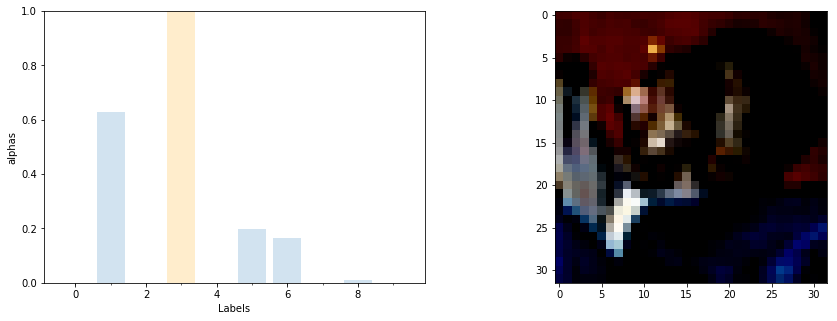

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.7369e+00, 4.7488e+06, 3.2273e+03, 2.9209e+01, 1.2627e+01, 1.4879e+06,
        1.2387e+06, 4.3803e+00, 7.3438e+04, 7.1661e-03])
compare pred, true:  tensor([1]) tensor([3])
out:  tensor([8])


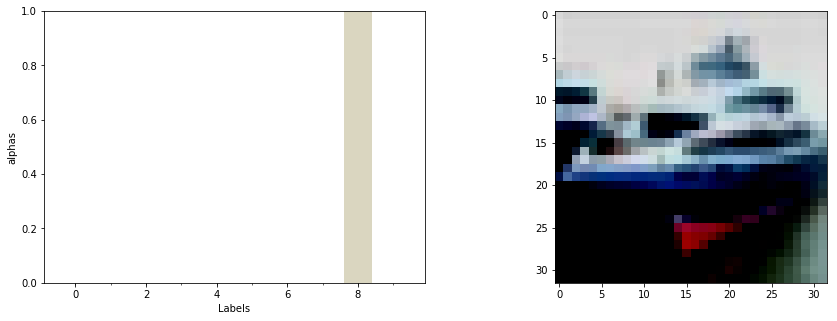

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([3.4907e+23, 1.4443e+21, 6.8290e+14, 5.3321e+14, 7.9171e-04, 7.3650e-04,
        4.2645e+12, 8.3194e-04, 1.0478e+27, 4.0620e+09])
compare pred, true:  tensor([8]) tensor([8])
out:  tensor([8])


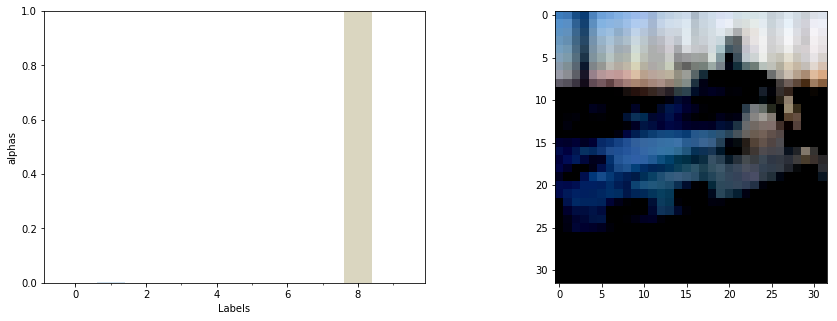

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.4370e+10, 8.9708e+11, 3.8566e+01, 4.4962e+01, 1.5234e-03, 1.7012e-03,
        4.5477e-01, 1.0297e+01, 6.2375e+14, 2.8202e+11])
compare pred, true:  tensor([8]) tensor([8])
out:  tensor([0])


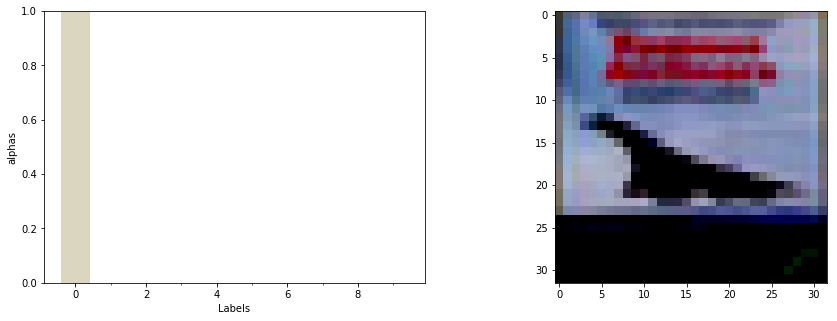

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([6.6902e+23, 2.2811e+12, 2.6323e+01, 3.0008e+13, 2.8953e+01, 6.8736e-04,
        9.8808e+05, 3.2505e+00, 8.9150e+13, 2.3443e+14])
compare pred, true:  tensor([0]) tensor([0])
out:  tensor([4])


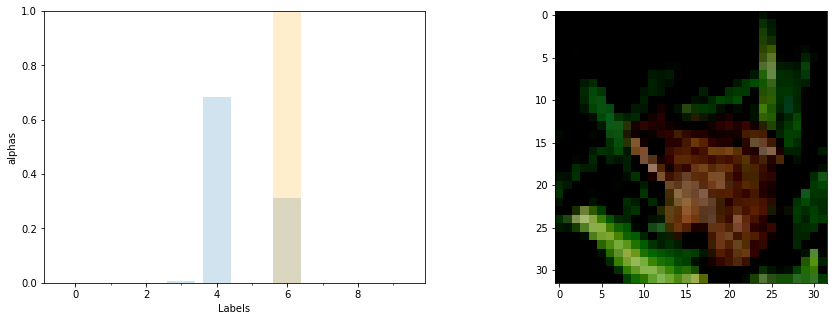

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([3.4596e-03, 1.6859e+02, 3.9525e+09, 4.3367e+11, 4.2790e+13, 1.5232e+03,
        1.9516e+13, 1.4695e-03, 1.5628e-01, 8.1130e-03])
compare pred, true:  tensor([4]) tensor([6])
out:  tensor([6])


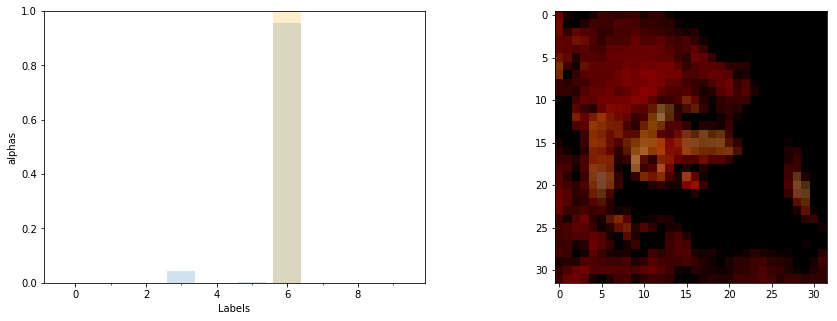

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([9.0092e-03, 6.6233e-03, 4.2627e-02, 1.2797e+03, 1.3837e-02, 6.1567e+01,
        2.9345e+04, 1.2149e+00, 3.2401e-01, 4.1886e-01])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([9])


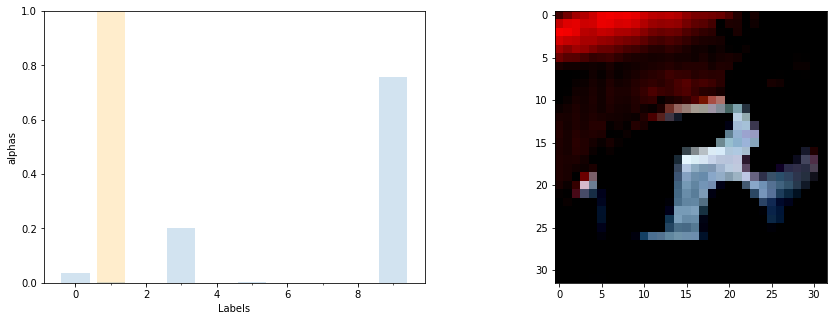

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([6.9496e+03, 2.8422e+02, 1.6373e+01, 3.9235e+04, 3.7523e-02, 7.6373e+02,
        9.3993e-04, 1.4257e-03, 1.0272e-03, 1.4604e+05])
compare pred, true:  tensor([9]) tensor([1])
out:  tensor([2])


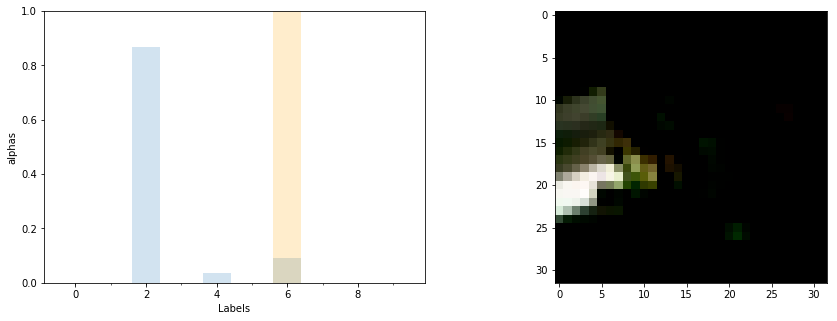

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.7203e+06, 4.6280e-03, 2.2130e+09, 2.2918e+06, 9.6269e+07, 2.1445e+04,
        2.3453e+08, 8.2831e+01, 5.2933e-03, 8.5396e-01])
compare pred, true:  tensor([2]) tensor([6])
out:  tensor([3])


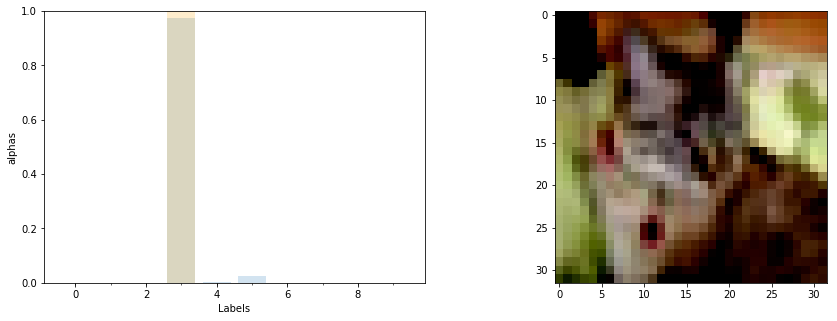

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([2.3957e+04, 8.1944e-03, 4.1393e+07, 2.5204e+11, 3.6615e+08, 6.2586e+09,
        2.7537e+08, 2.4450e+05, 2.7054e-02, 4.8546e+02])
compare pred, true:  tensor([3]) tensor([3])
out:  tensor([6])


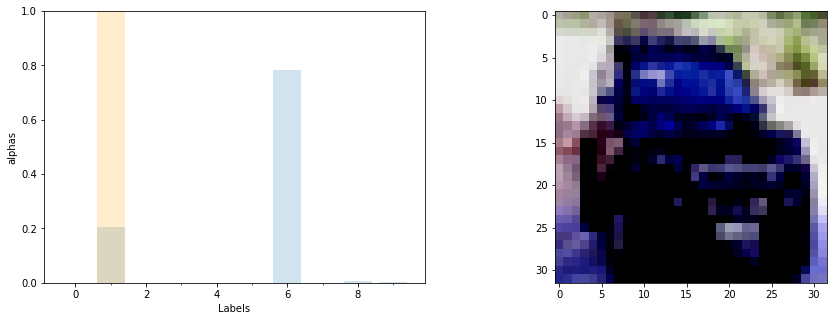

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([6.4166e+19, 2.0642e+28, 3.6890e+10, 1.8856e+10, 6.9740e+08, 1.0843e+03,
        7.8400e+28, 2.8916e-03, 4.9595e+26, 3.7391e+26])
compare pred, true:  tensor([6]) tensor([1])
out:  tensor([0])


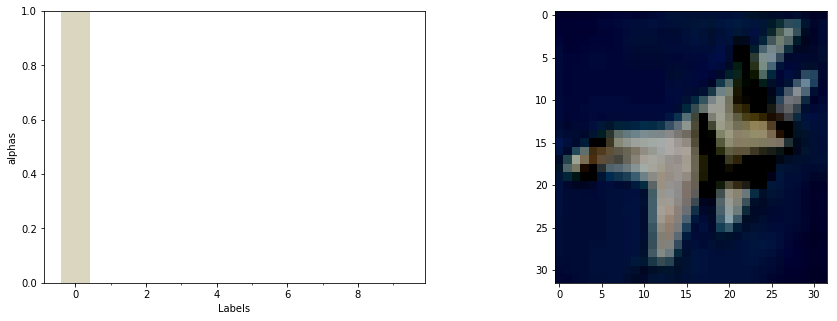

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([5.1816e+29, 7.3291e-03, 2.7888e+25, 4.5341e+22, 1.4904e+24, 1.1709e+20,
        1.6660e+11, 1.1916e+13, 7.7398e+22, 6.1570e+13])
compare pred, true:  tensor([0]) tensor([0])
out:  tensor([9])


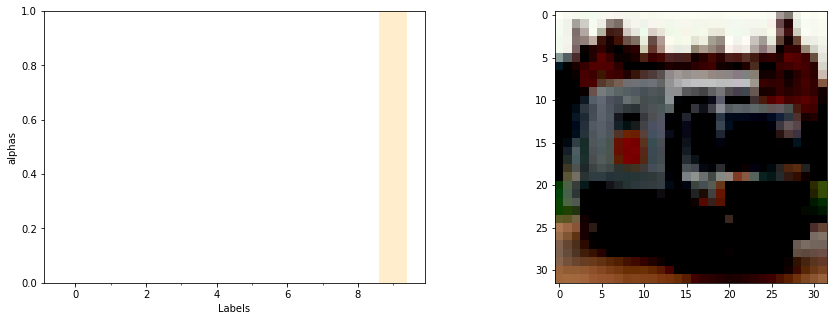

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([8.8489e+12, 5.4010e+22, 1.6563e+00, 3.7019e+04, 1.4132e+00, 1.9407e-04,
        2.0219e+01, 1.9544e-04, 8.4307e+20,        inf])
compare pred, true:  tensor([9]) tensor([9])
NAN or inf!
out:  tensor([5])


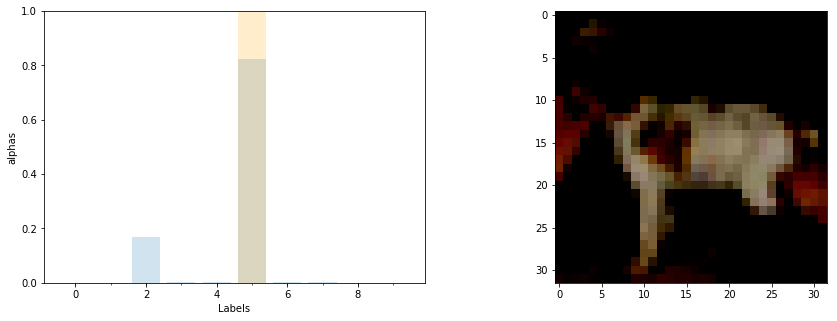

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.3519e-01, 7.8423e-03, 2.3905e+08, 2.3168e+06, 2.7245e+06, 1.1824e+09,
        2.2084e+06, 4.4741e+06, 4.0102e+01, 4.8368e+03])
compare pred, true:  tensor([5]) tensor([5])
out:  tensor([7])


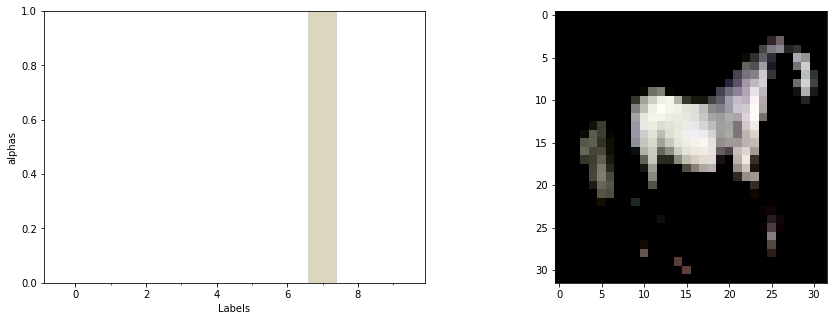

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([2.4449e-03, 2.6237e+01, 1.4764e+10, 1.1830e+09, 4.9621e+22, 1.8117e+18,
        9.3036e+01, 4.1443e+29, 1.6391e-03, 5.4059e-02])
compare pred, true:  tensor([7]) tensor([7])
out:  tensor([9])


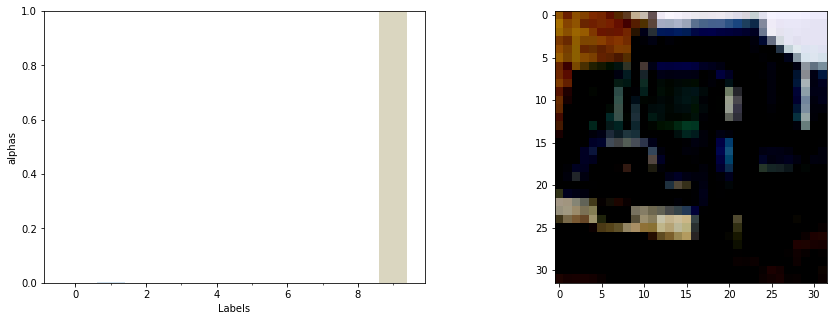

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.4325e+04, 2.7821e+16, 5.8863e+03, 4.3957e+02, 1.0600e-03, 1.4858e-02,
        3.1829e+08, 1.8303e-01, 1.0182e+14, 1.1164e+19])
compare pred, true:  tensor([9]) tensor([9])
out:  tensor([8])


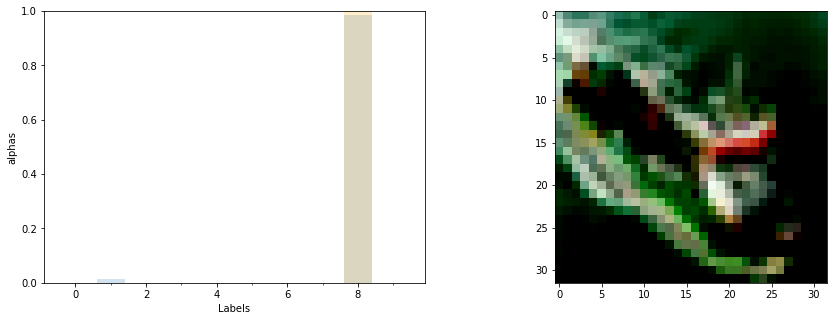

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([2.8154e+10, 1.6259e+18, 2.7878e+11, 5.5189e+08, 4.3973e+12, 8.1029e+08,
        5.2705e+16, 5.7489e-03, 1.2683e+20, 1.7310e+10])
compare pred, true:  tensor([8]) tensor([8])
out:  tensor([3])


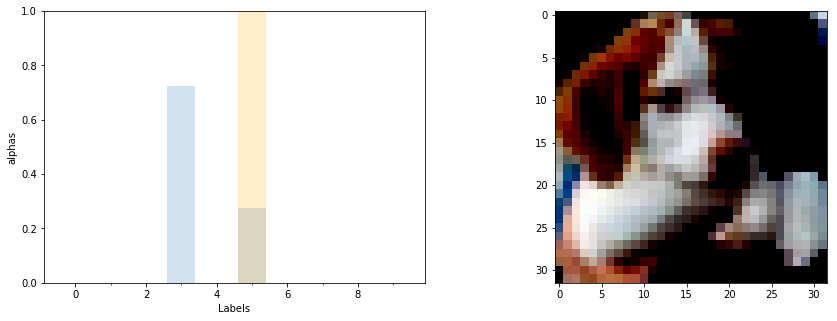

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([8.7084e-04, 1.9623e+01, 3.3854e+02, 7.6589e+08, 1.2816e+04, 2.8920e+08,
        1.2115e+04, 2.2728e+04, 3.0860e+00, 1.7908e-01])
compare pred, true:  tensor([3]) tensor([5])
out:  tensor([3])


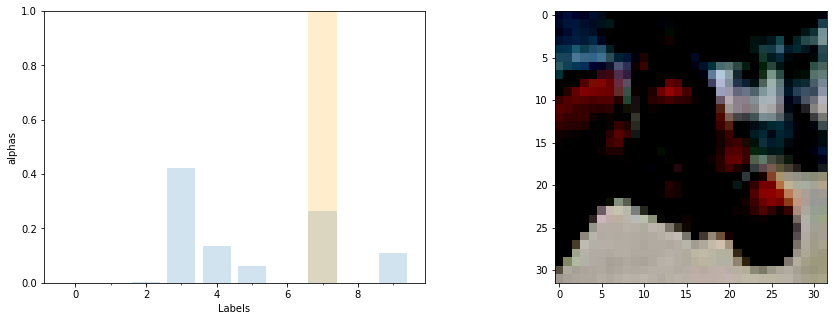

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.9896e+02, 6.0270e-03, 1.6266e+04, 2.3649e+06, 7.6123e+05, 3.3506e+05,
        1.7016e+01, 1.4830e+06, 2.4486e+03, 6.1964e+05])
compare pred, true:  tensor([3]) tensor([7])
out:  tensor([8])


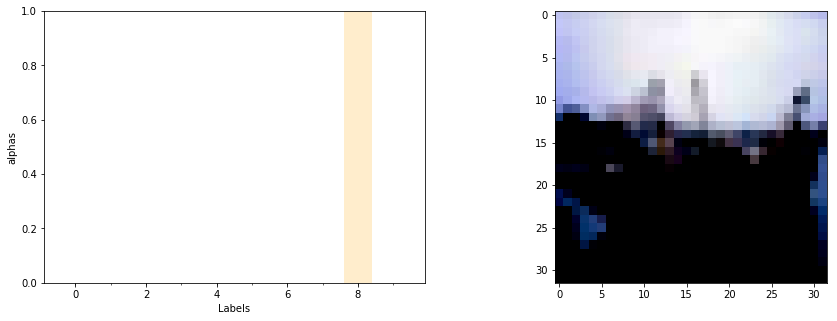

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([5.2695e+32,        inf, 5.7197e+20, 6.6740e+24, 1.7052e+11, 2.4053e+08,
        4.9911e+20, 8.5089e-04,        inf,        inf])
compare pred, true:  tensor([9]) tensor([8])
NAN or inf!
out:  tensor([6])


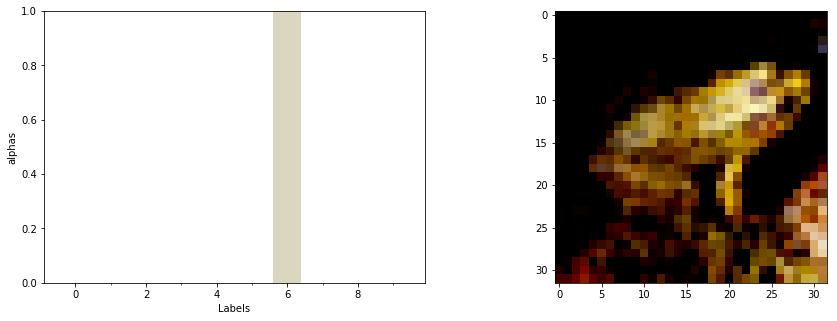

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([3.3958e-03, 7.9688e+08, 2.1705e+11, 5.0244e+10, 4.5848e+11, 4.0049e+11,
        4.1873e+17, 1.4017e+04, 5.1693e-03, 2.9680e+04])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([7])


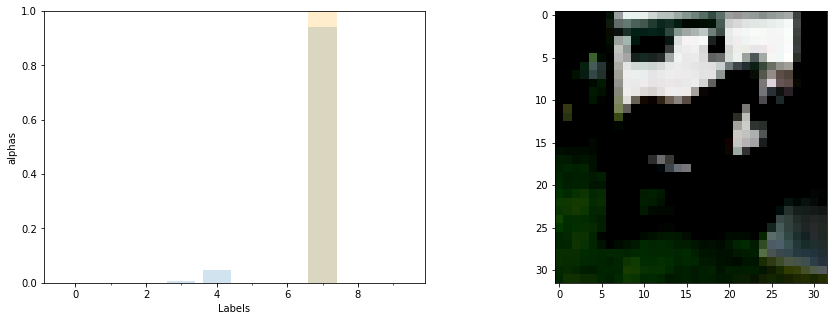

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([4.5098e+01, 2.4862e-03, 2.0930e+03, 1.8270e+07, 1.0563e+08, 8.4153e+03,
        2.2160e+00, 2.0458e+09, 5.0839e-03, 2.2288e-02])
compare pred, true:  tensor([7]) tensor([7])
out:  tensor([0])


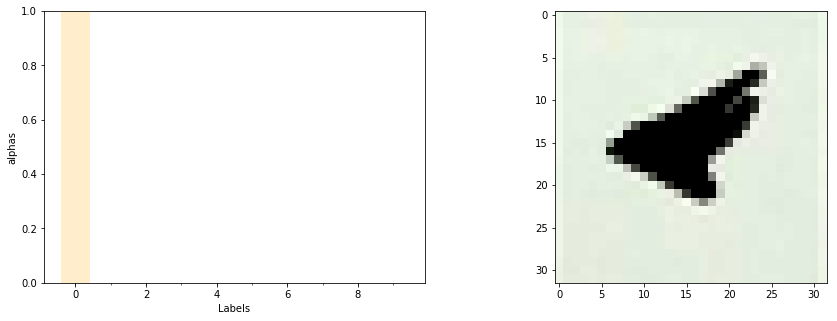

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([inf, nan, inf, inf, inf, inf, inf, inf, inf, inf])
compare pred, true:  tensor([1]) tensor([0])
NAN or inf!
out:  tensor([2])


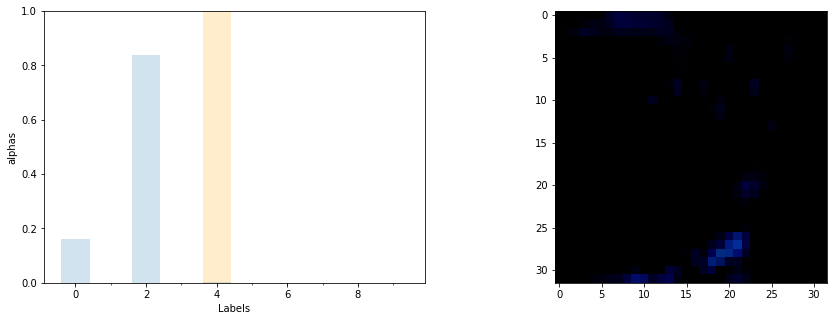

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.5270e+26, 9.2099e-03, 7.9946e+26, 1.7942e+17, 2.9168e+24, 2.0707e+14,
        3.7982e+20, 4.3016e+03, 1.1244e+15, 8.7359e-02])
compare pred, true:  tensor([2]) tensor([4])
out:  tensor([9])


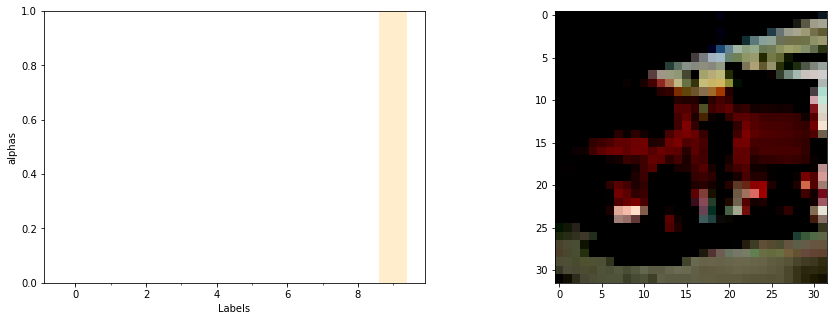

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([       inf,        inf, 2.7724e+17, 9.8017e+03, 2.3865e-04, 3.5681e+10,
        1.7372e+20, 7.4957e+00, 7.8133e+27,        inf])
compare pred, true:  tensor([9]) tensor([9])
NAN or inf!
out:  tensor([4])


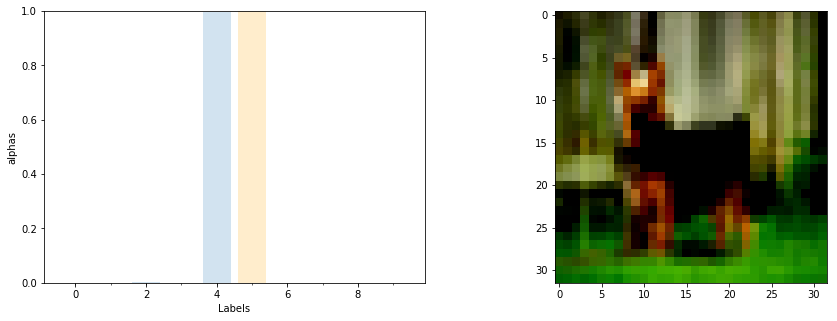

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.4250e+01, 1.2670e-02, 1.0012e+15, 1.6080e+08, 3.3567e+17, 4.3701e+13,
        3.1878e+07, 1.7078e+13, 3.2519e+01, 1.1652e-01])
compare pred, true:  tensor([4]) tensor([5])
out:  tensor([4])


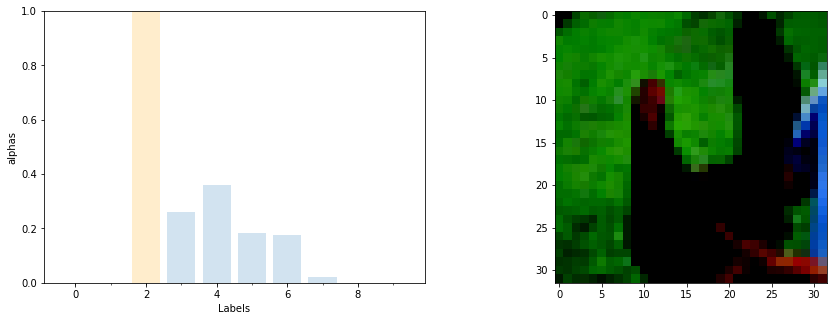

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([7.5376e-03, 7.3685e-02, 5.9465e-01, 2.1964e+02, 3.0390e+02, 1.5467e+02,
        1.4756e+02, 1.8848e+01, 1.4991e-02, 1.9946e-02])
compare pred, true:  tensor([4]) tensor([2])
out:  tensor([4])


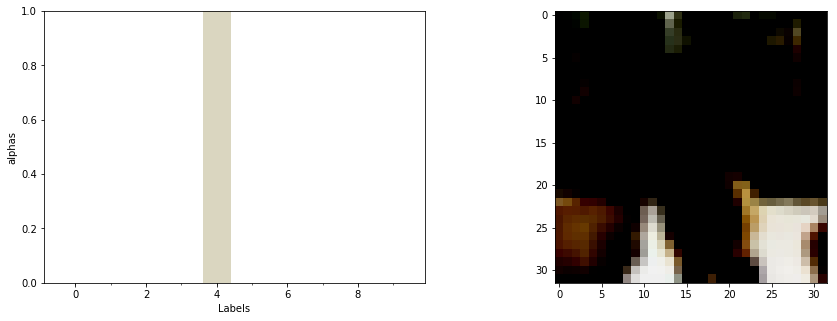

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([5.3598e+13, 6.9711e-03, 4.8062e+21, 1.5046e+20, 8.8226e+28, 4.7951e+19,
        2.0103e+20, 3.8851e+23, 5.5493e+09, 3.9239e+05])
compare pred, true:  tensor([4]) tensor([4])
out:  tensor([0])


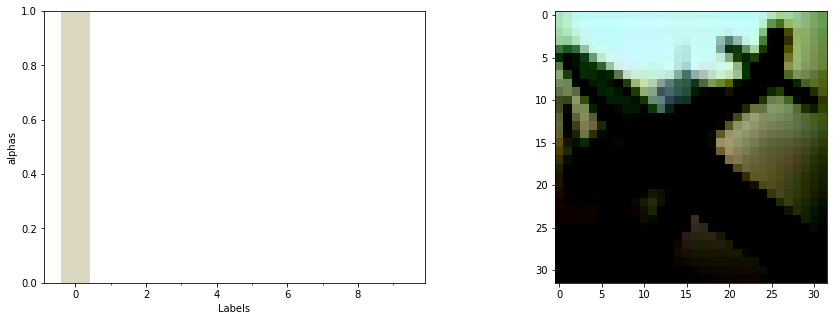

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([2.1433e+20, 3.1350e-03, 2.9600e+13, 9.6880e+10, 3.6125e+14, 1.4122e+10,
        1.0665e+13, 1.1638e+06, 9.2142e+04, 5.9573e+06])
compare pred, true:  tensor([0]) tensor([0])
out:  tensor([1])


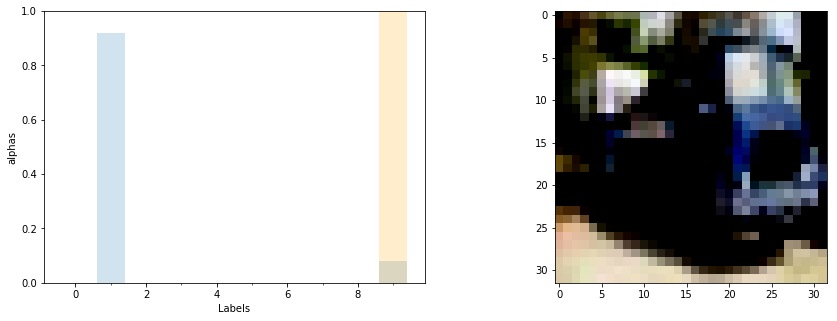

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([2.7061e-03, 3.4116e+09, 6.3236e-04, 3.8170e+01, 7.3311e-04, 9.6575e-04,
        4.1856e-02, 5.0664e+00, 1.2818e+00, 2.9572e+08])
compare pred, true:  tensor([1]) tensor([9])
out:  tensor([6])


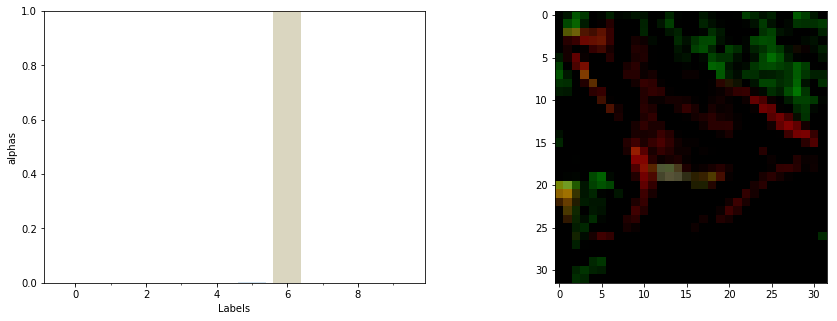

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.3769e+06, 7.5777e-03, 1.3929e+09, 1.7276e+08, 6.0201e+10, 1.3290e+11,
        6.4621e+13, 5.7659e+07, 4.7390e-03, 1.9778e+00])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([6])


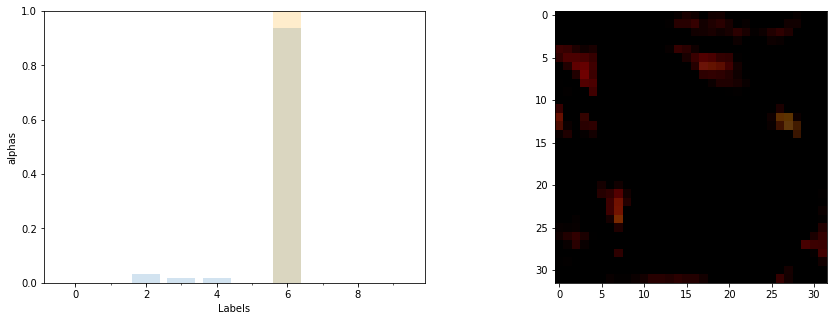

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([6.8161e-03, 1.4279e-02, 8.7097e+04, 4.6137e+04, 4.5414e+04, 1.7562e+02,
        2.6557e+06, 3.3266e+01, 1.1619e-02, 1.1825e-02])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([4])


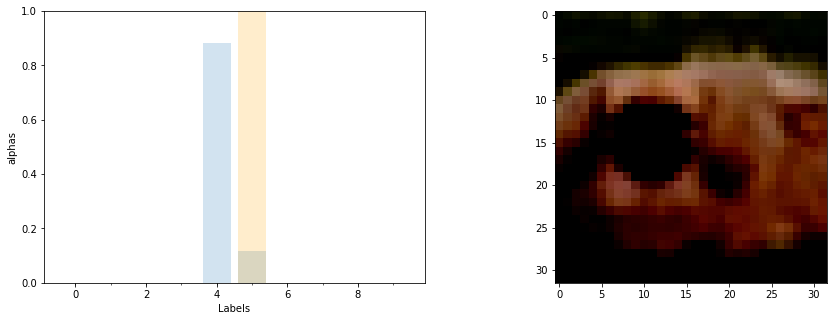

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([9.5774e+00, 1.9752e-03, 2.0922e+17, 1.1960e+17, 2.1508e+20, 2.8629e+19,
        2.2035e+14, 2.5309e+06, 2.6342e+07, 1.7186e+01])
compare pred, true:  tensor([4]) tensor([5])
out:  tensor([2])


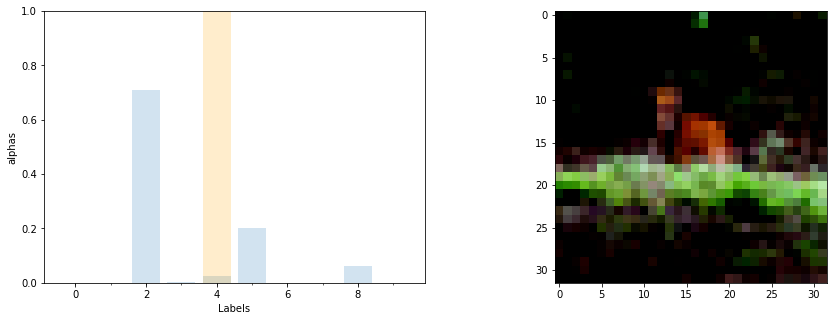

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([2.0876e+01, 2.2778e-02, 5.3683e+07, 1.1042e+05, 1.9987e+06, 1.5329e+07,
        3.0582e+02, 3.1823e+04, 4.7092e+06, 2.9195e+00])
compare pred, true:  tensor([2]) tensor([4])
out:  tensor([5])


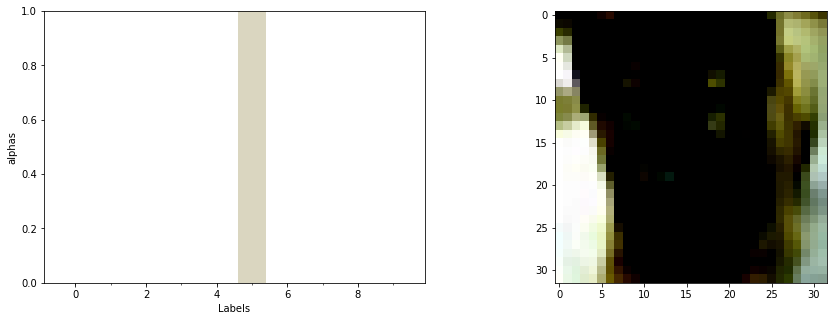

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.5768e-01, 1.1073e-01, 2.3367e+09, 6.7602e+10, 6.8745e+05, 1.1922e+14,
        1.5318e+10, 9.7673e+01, 2.7096e-03, 3.1630e-03])
compare pred, true:  tensor([5]) tensor([5])
out:  tensor([9])


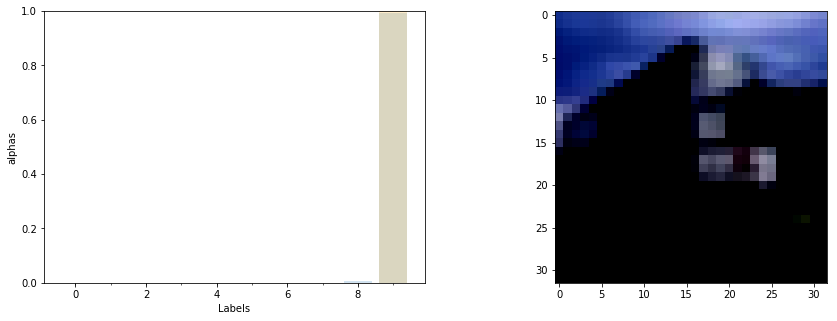

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([3.4359e+16, 3.7493e+13, 1.2782e+12, 8.8282e+11, 8.7524e+10, 1.2485e+14,
        1.2439e-03, 2.1665e+07, 6.8038e+20, 9.0941e+22])
compare pred, true:  tensor([9]) tensor([9])
out:  tensor([9])


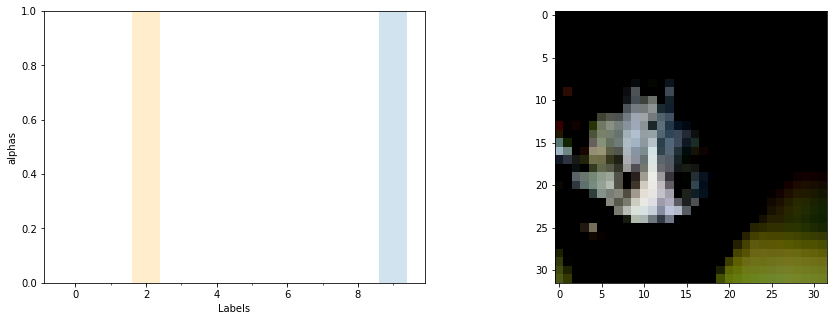

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([3.0351e+05, 2.1003e+01, 1.3034e+06, 5.2691e+03, 1.7460e-03, 3.5069e+07,
        6.4885e+04, 3.1606e-03, 6.4884e+05, 1.7626e+11])
compare pred, true:  tensor([9]) tensor([2])
out:  tensor([4])


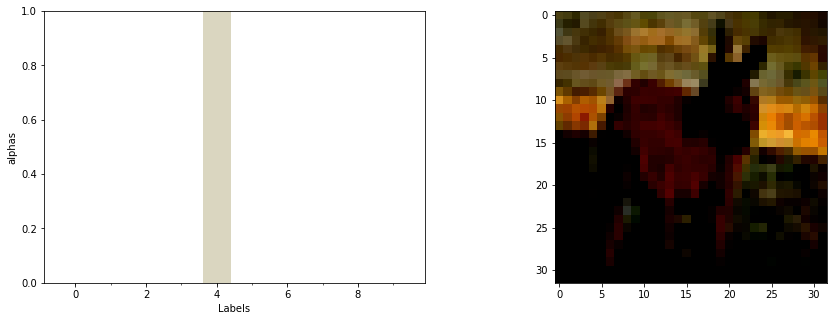

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.0264e+09, 2.3752e-03, 8.3520e+19, 8.2729e+16, 5.1384e+26, 1.3654e+21,
        1.6635e+14, 9.6762e+22, 1.3855e+00, 3.3885e+02])
compare pred, true:  tensor([4]) tensor([4])
out:  tensor([1])


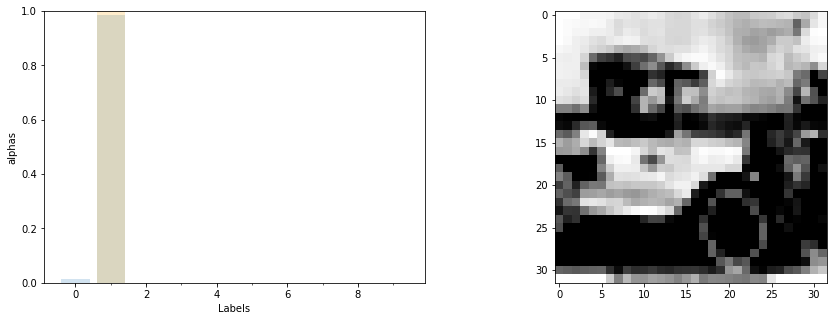

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([7.7989e+12, 5.2035e+14, 1.3854e+07, 4.4470e-02, 2.1293e+03, 7.1049e-02,
        8.3456e-01, 2.2335e-03, 8.6441e+08, 7.2511e+05])
compare pred, true:  tensor([1]) tensor([1])
out:  tensor([9])


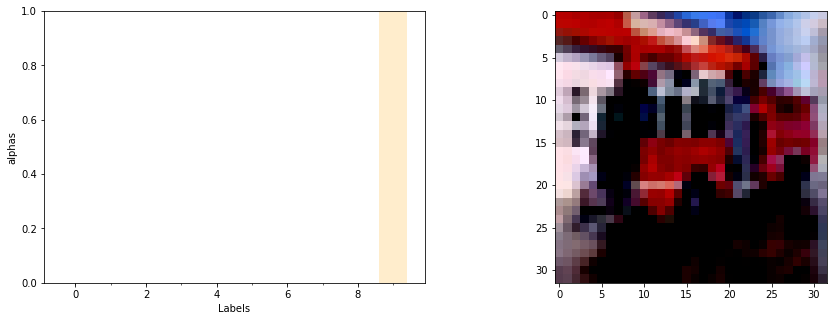

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([3.6740e+20, 4.7580e+25, 4.8502e+05, 2.8804e+02, 1.1373e+02, 1.8606e+12,
        2.3103e+11, 8.0793e-04, 2.1386e+21,        inf])
compare pred, true:  tensor([9]) tensor([9])
NAN or inf!
out:  tensor([5])


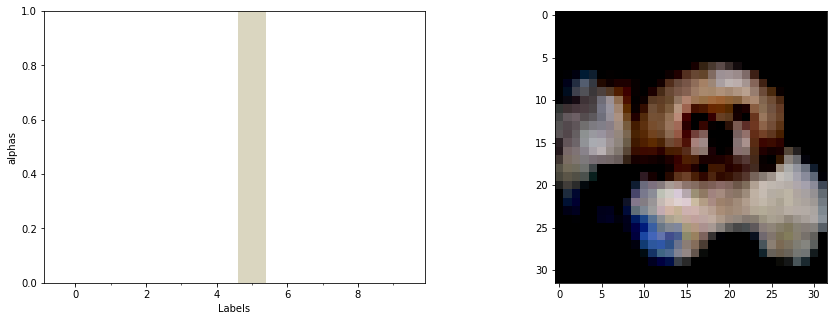

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.3698e-03, 1.8748e-03, 4.4316e-02, 8.8747e+00, 1.2739e+00, 8.2344e+07,
        1.6213e+03, 6.3944e-01, 4.7974e-03, 6.1966e-03])
compare pred, true:  tensor([5]) tensor([5])
out:  tensor([4])


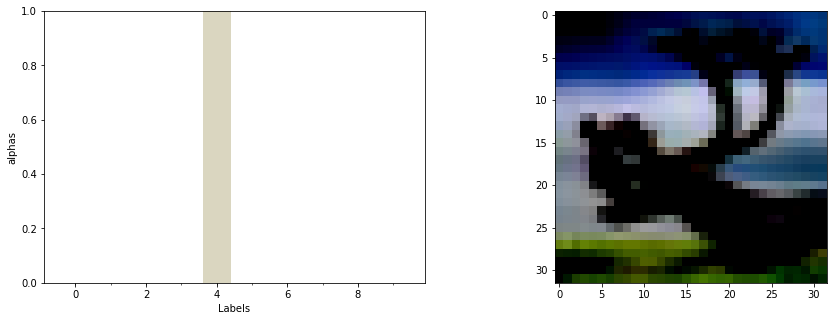

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([2.3626e+15, 3.7804e+00, 3.3436e+11, 3.5358e+07, 3.8323e+22, 2.0185e-01,
        6.0563e+01, 1.0340e-03, 1.4189e+09, 9.1923e+08])
compare pred, true:  tensor([4]) tensor([4])
out:  tensor([6])


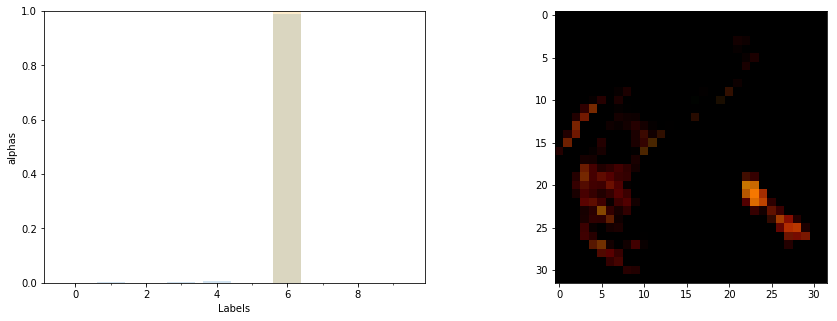

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.0342e+01, 6.6836e+04, 3.2733e+02, 5.7747e+04, 1.7682e+05, 1.0842e+00,
        2.9979e+07, 1.5686e+00, 1.0265e-02, 6.2340e+01])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([2])


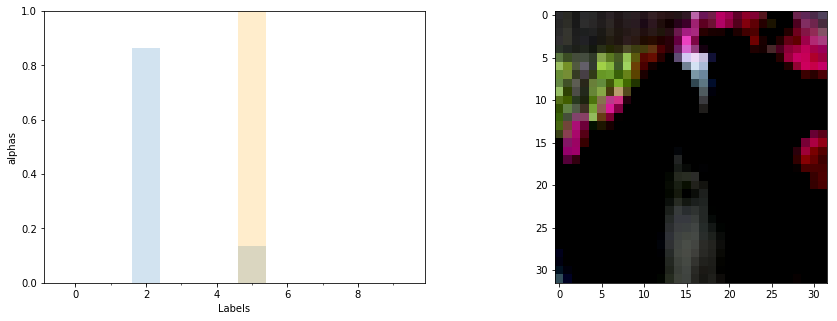

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([3.4560e+10, 1.3777e+01, 5.5230e+21, 9.4299e+14, 3.4364e+09, 8.6757e+20,
        3.1099e-04, 1.7832e+09, 7.1688e-03, 7.9693e+07])
compare pred, true:  tensor([2]) tensor([5])
out:  tensor([6])


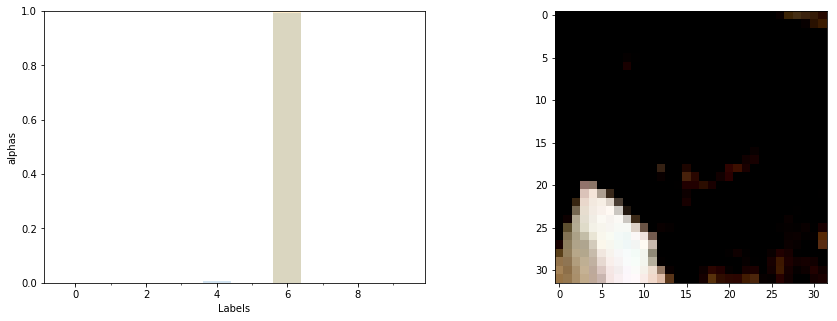

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.1795e-03, 2.7206e+05, 3.4151e+15, 3.7876e+12, 1.5236e+18, 6.1922e+06,
        2.1304e+20, 6.2595e+08, 7.7632e+02, 1.9850e-03])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([0])


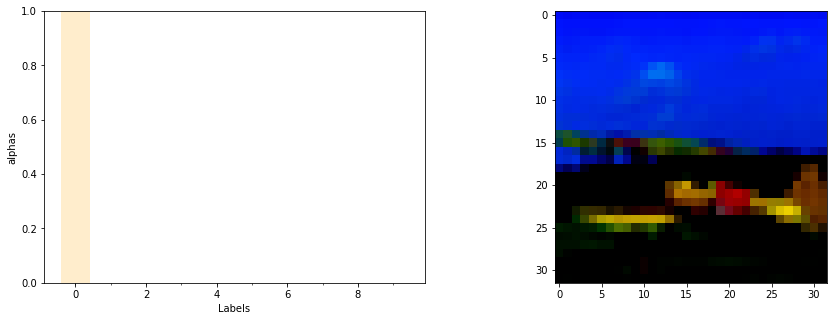

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([       inf, 3.7674e+34, 3.0826e+34, 8.3196e+15, 1.8382e+32, 2.3384e+24,
        9.3922e+20, 7.3757e-04,        inf,        inf])
compare pred, true:  tensor([9]) tensor([0])
NAN or inf!
out:  tensor([9])


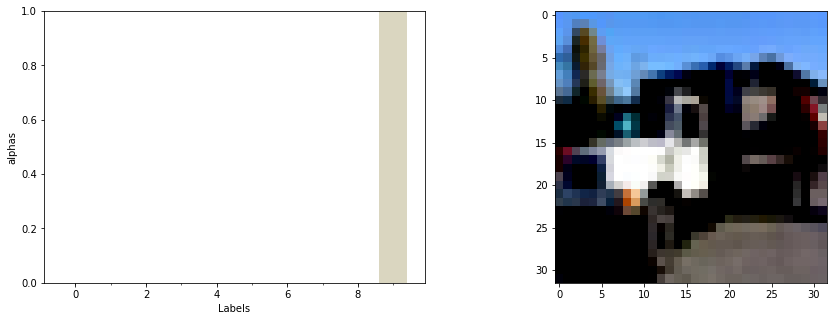

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.8559e+21, 6.2141e+12, 7.5825e+02, 5.1328e+04, 7.3547e-01, 1.0245e-01,
        7.9986e+00, 6.3677e-04, 7.0281e+06, 4.3819e+26])
compare pred, true:  tensor([9]) tensor([9])
out:  tensor([5])


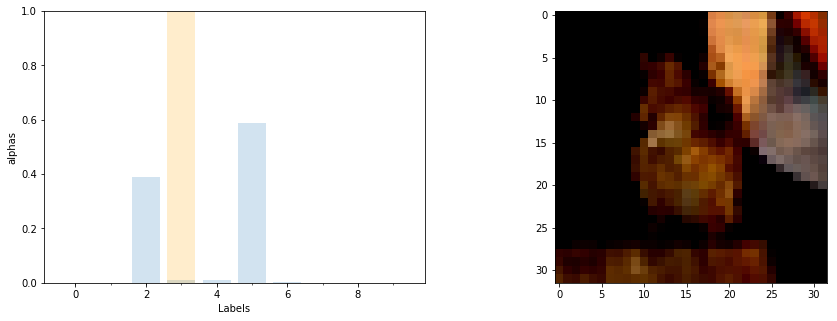

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([9.8301e+01, 6.2301e-03, 2.3232e+08, 6.0069e+06, 6.8264e+06, 3.5226e+08,
        9.5444e+05, 9.0780e+03, 6.2461e-03, 2.1641e+01])
compare pred, true:  tensor([5]) tensor([3])
out:  tensor([2])


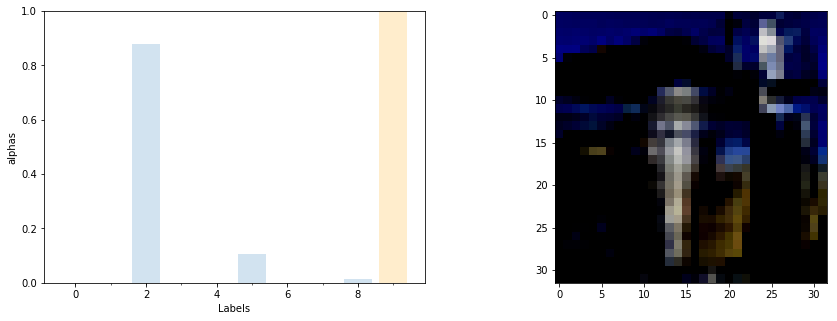

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([3.0239e-03, 1.3877e-03, 4.1757e+02, 2.3977e-01, 1.3945e-01, 5.0090e+01,
        2.9357e-03, 1.7016e-03, 6.2639e+00, 3.3061e-01])
compare pred, true:  tensor([2]) tensor([9])
out:  tensor([4])


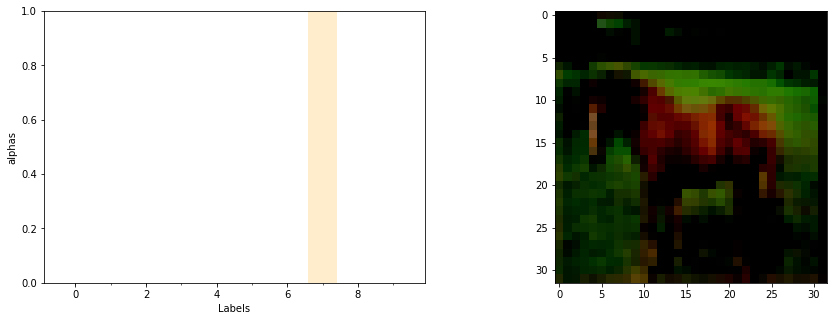

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([3.4298e+08, 4.6861e-03, 1.6189e+23, 2.0275e+24,        inf,        inf,
        3.6142e+14,        inf, 7.9104e+07, 3.3720e+04])
compare pred, true:  tensor([7]) tensor([7])
NAN or inf!
out:  tensor([2])


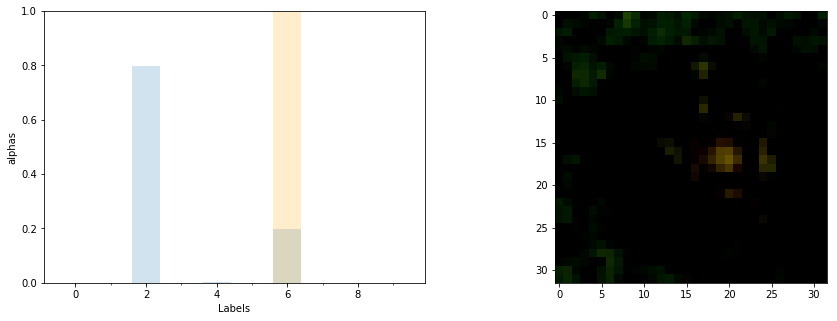

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([4.3099e+13, 9.9980e+07, 2.8484e+25, 3.1323e+22, 9.2036e+22, 1.2374e+14,
        7.1177e+24, 1.9231e+14, 6.4342e+03, 8.1935e-03])
compare pred, true:  tensor([2]) tensor([6])
out:  tensor([9])


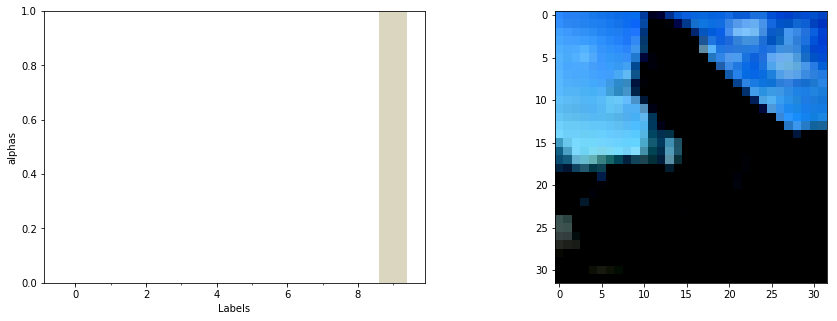

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([6.1432e-01, 3.7681e-03, 4.5834e+02, 1.0126e-02, 6.9419e-02, 8.0441e-01,
        1.5929e-01, 1.4861e-03, 5.0255e-03, 2.0035e+08])
compare pred, true:  tensor([9]) tensor([9])
out:  tensor([0])


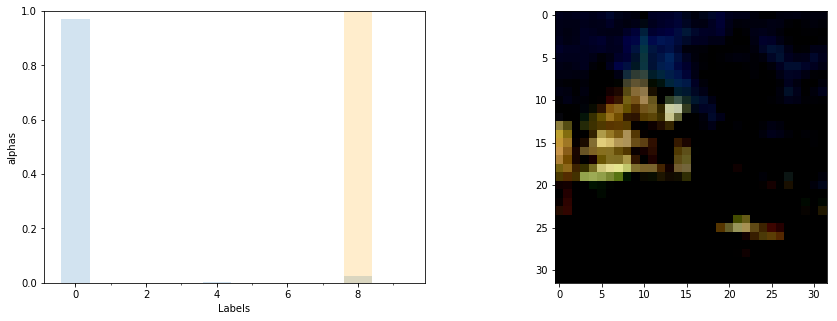

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([7.2601e+05, 7.1922e-02, 4.4599e+01, 2.6438e+00, 2.1633e+03, 4.2982e-03,
        7.4774e-02, 5.5345e-03, 1.8612e+04, 6.3885e+01])
compare pred, true:  tensor([0]) tensor([8])
out:  tensor([6])


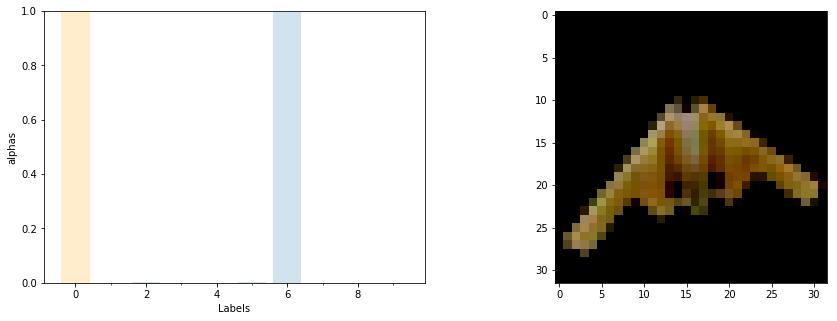

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([7.2463e-03, 9.2739e-03, 6.8264e+03, 6.1440e+01, 9.7172e-02, 5.0897e+03,
        2.7462e+06, 8.3693e+01, 5.4999e-02, 1.1016e-02])
compare pred, true:  tensor([6]) tensor([0])
out:  tensor([6])


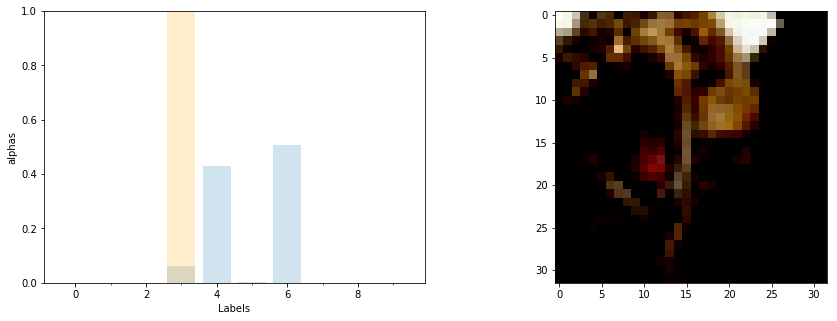

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.3078e-02, 9.9814e+01, 2.7798e+01, 2.1942e+05, 1.5187e+06, 7.2296e+03,
        1.7988e+06, 9.2192e+02, 2.0435e-02, 2.8810e-02])
compare pred, true:  tensor([6]) tensor([3])
out:  tensor([8])


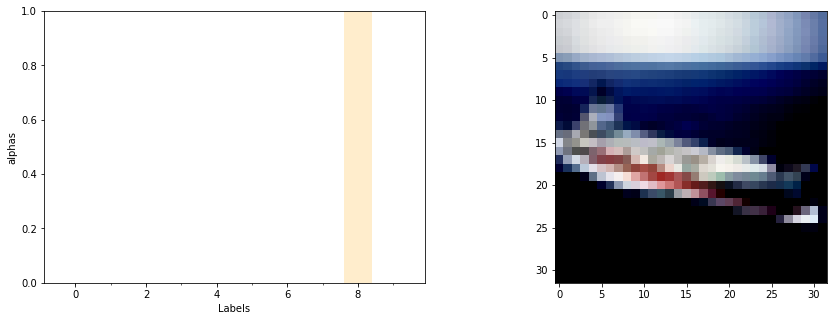

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([inf, inf, inf, inf, inf, inf, nan, nan, inf, inf])
compare pred, true:  tensor([6]) tensor([8])
NAN or inf!
out:  tensor([8])


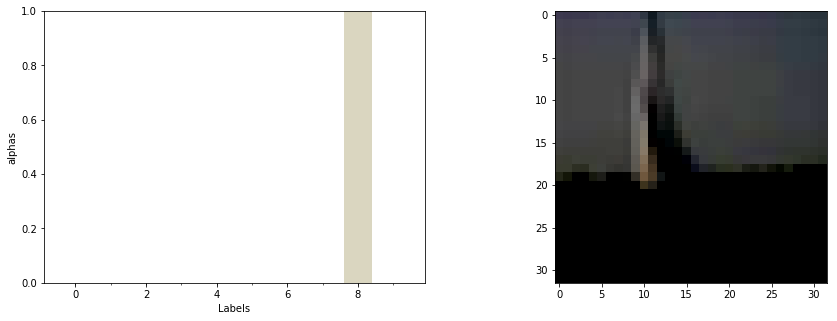

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([2.1071e+08, 1.6767e-02, 1.5210e+04, 1.7940e+07, 1.9360e+03, 1.4164e+07,
        9.8392e+02, 1.4504e-02, 5.2766e+11, 2.3022e+05])
compare pred, true:  tensor([8]) tensor([8])
out:  tensor([7])


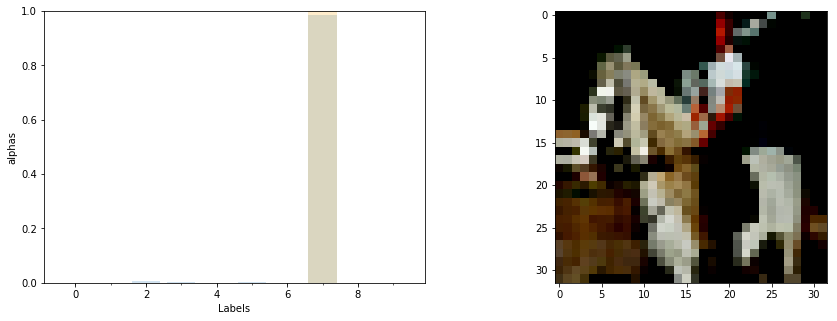

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([5.0679e+12, 3.2535e-03, 1.1112e+15, 8.1270e+14, 5.4248e+13, 2.5679e+14,
        4.6203e+06, 1.6814e+17, 1.9202e+04, 1.6993e+13])
compare pred, true:  tensor([7]) tensor([7])
out:  tensor([5])


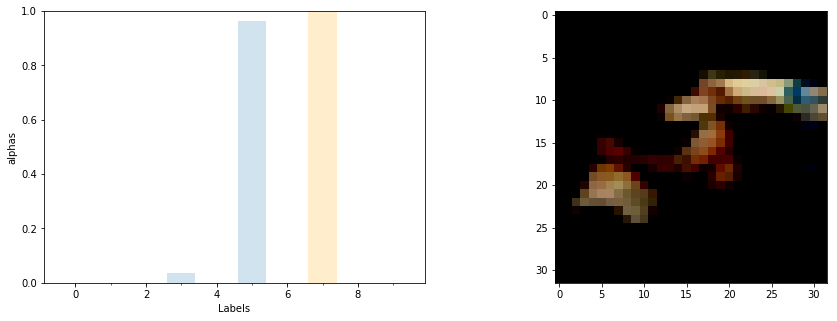

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([2.4846e-03, 8.6176e-01, 1.7738e+00, 3.2576e+03, 3.3241e+01, 8.6860e+04,
        2.5244e+01, 8.1223e+00, 8.4024e+00, 8.3833e-03])
compare pred, true:  tensor([5]) tensor([7])
out:  tensor([5])


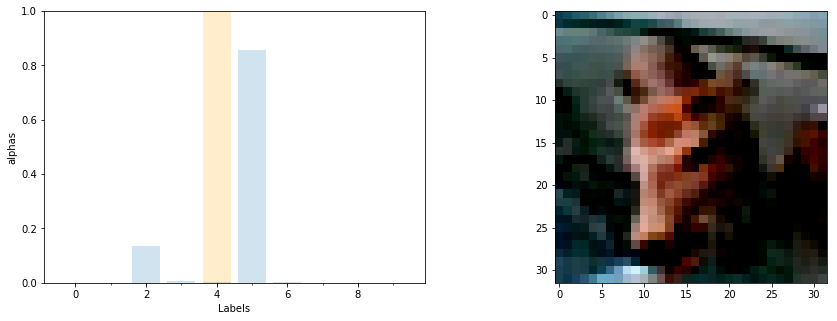

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([4.4504e+09, 1.6508e-02, 4.3812e+20, 1.6456e+19, 4.8528e+18, 2.7586e+21,
        4.1133e+18, 8.6902e+08, 7.8441e+17, 6.9307e+04])
compare pred, true:  tensor([5]) tensor([4])
out:  tensor([3])


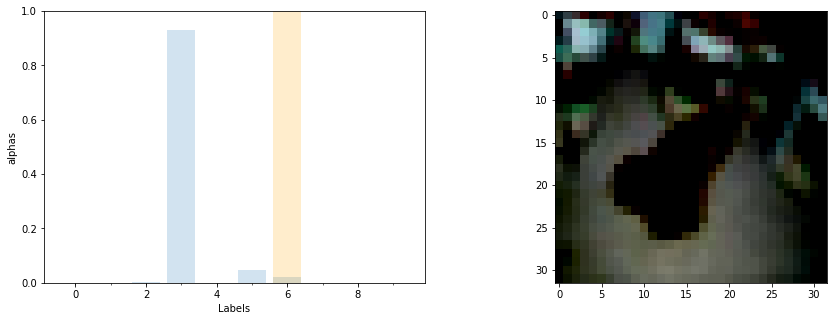

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([7.0373e-03, 4.2672e-03, 7.6306e+03, 4.2099e+06, 3.2133e+03, 2.1728e+05,
        9.0989e+04, 1.1118e+03, 5.1310e-02, 1.1755e-01])
compare pred, true:  tensor([3]) tensor([6])
out:  tensor([7])


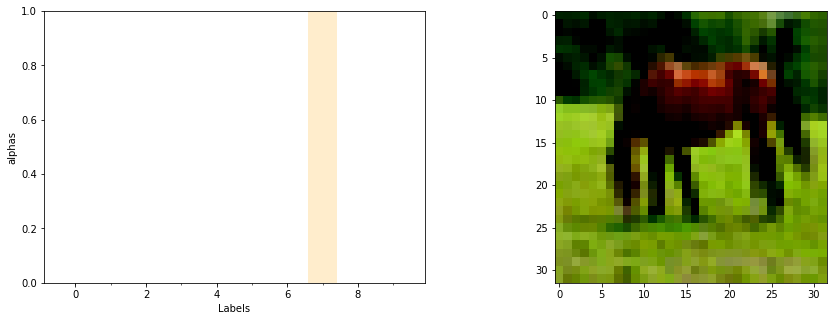

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.7350e-03, 1.5362e-02, 3.3629e+09, 4.9208e+07, 1.0572e+35, 3.2993e+17,
        1.7565e+03,        inf, 2.2508e+00, 1.9298e+05])
compare pred, true:  tensor([7]) tensor([7])
NAN or inf!
out:  tensor([5])


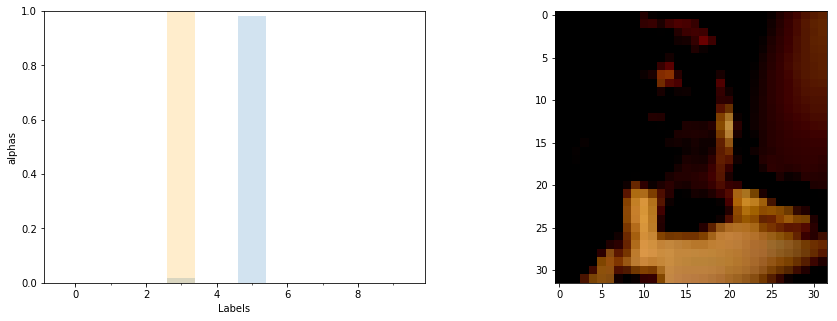

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([3.4602e+03, 2.7729e-03, 2.1006e+10, 7.9954e+14, 2.6626e+10, 4.6490e+16,
        2.7695e+11, 2.5438e+11, 2.6508e-02, 2.0563e+03])
compare pred, true:  tensor([5]) tensor([3])
out:  tensor([6])


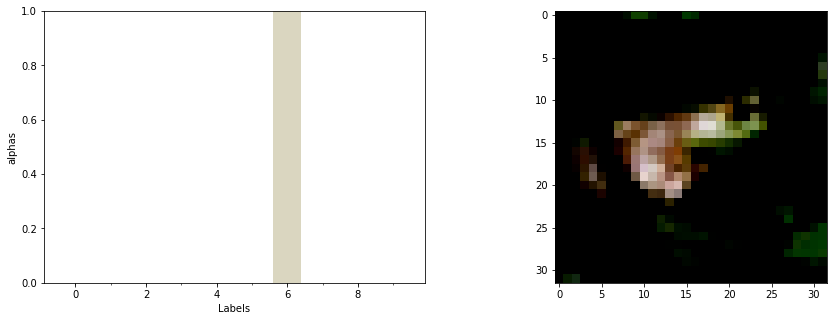

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([7.1159e-03, 4.8451e+01, 1.9014e+02, 1.0650e+01, 1.0229e+04, 8.6447e+02,
        7.7515e+07, 1.1201e+01, 1.4481e-01, 4.2178e+01])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([1])


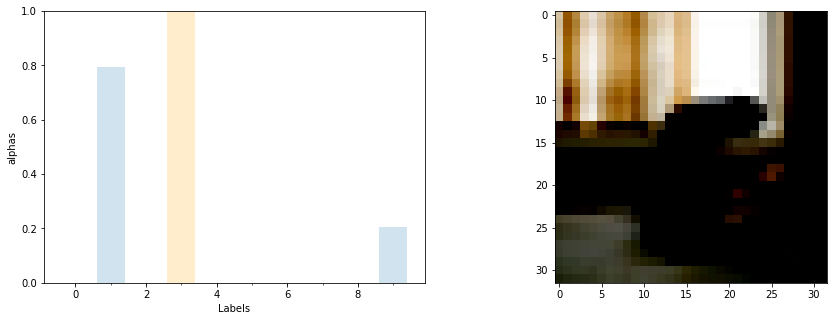

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.3926e-01, 1.0611e+06, 3.7850e+01, 1.2057e-01, 3.6391e-02, 4.2794e-04,
        6.8528e-03, 4.7803e-04, 6.5957e-01, 2.7411e+05])
compare pred, true:  tensor([1]) tensor([3])
out:  tensor([6])


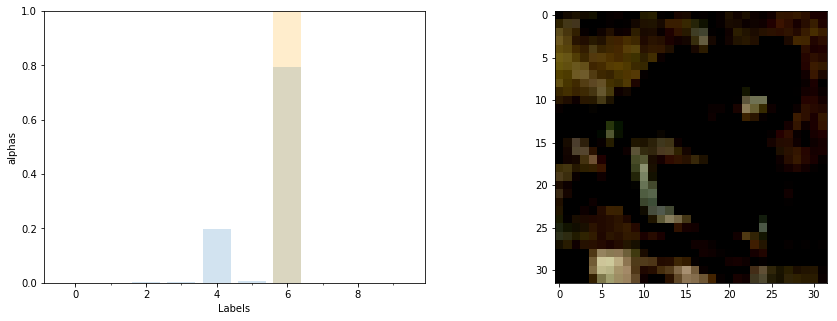

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([7.5380e-03, 3.4472e-01, 9.9429e+03, 1.1196e+04, 1.3474e+06, 3.5513e+04,
        5.4239e+06, 4.3400e-01, 3.3855e+01, 3.9133e+00])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([2])


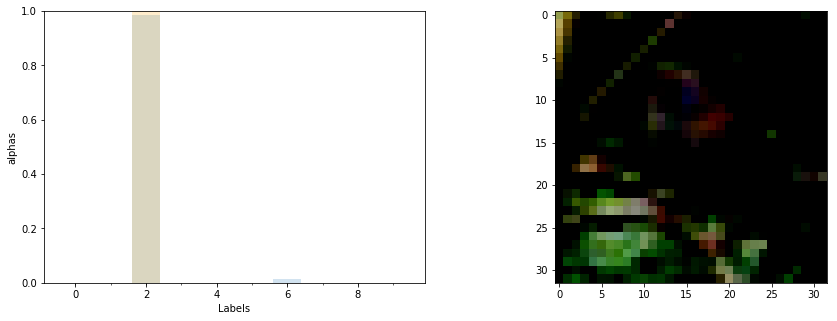

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([2.0281e+01, 2.5334e-03, 3.3584e+11, 1.3493e+04, 8.8525e+05, 1.7771e+03,
        4.8702e+09, 3.4316e+04, 4.2921e-03, 1.6703e-01])
compare pred, true:  tensor([2]) tensor([2])
out:  tensor([0])


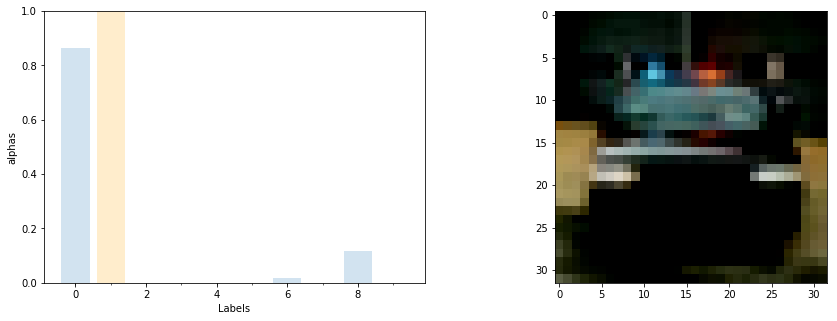

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([6.3996e+24, 5.1845e+21, 4.5830e+15, 1.3762e+16, 2.2168e+17, 1.7381e+04,
        1.2730e+23, 1.5206e-03, 8.6791e+23, 1.3353e+18])
compare pred, true:  tensor([0]) tensor([1])
out:  tensor([0])


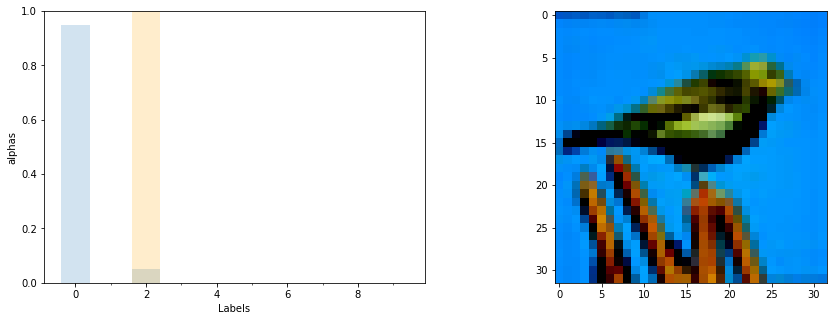

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.3539e+34, 1.3306e+20, 7.4325e+32, 3.6662e+07, 1.5719e+06, 4.9018e+08,
        6.6092e+19, 1.7608e-03, 5.3258e+30, 1.3590e+15])
compare pred, true:  tensor([0]) tensor([2])
out:  tensor([3])


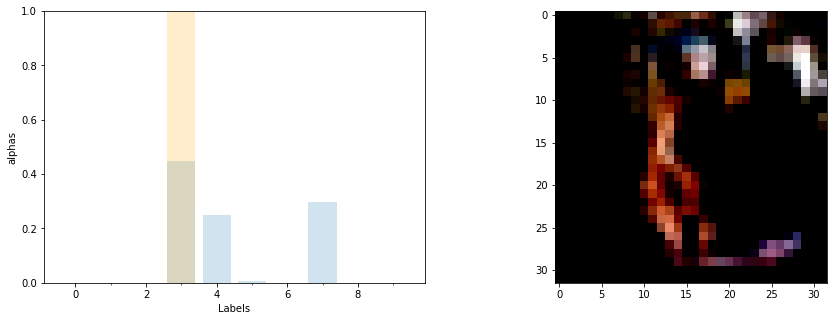

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.2175e-02, 1.9111e-02, 5.3674e+00, 8.4440e+03, 4.6972e+03, 1.0383e+02,
        5.4876e+00, 5.6510e+03, 7.1796e-02, 3.0835e-01])
compare pred, true:  tensor([3]) tensor([3])
out:  tensor([9])


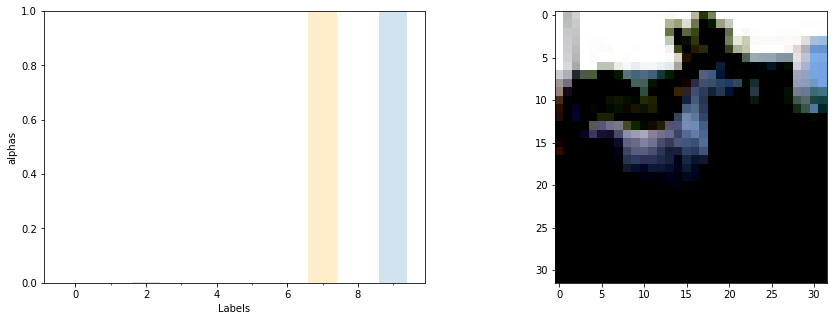

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([4.3212e+08, 3.8533e+02, 2.7492e+10, 3.5678e+00, 8.4097e-02, 1.1725e+02,
        1.7048e-03, 7.6249e+00, 7.2728e+02, 1.9713e+13])
compare pred, true:  tensor([9]) tensor([7])
out:  tensor([2])


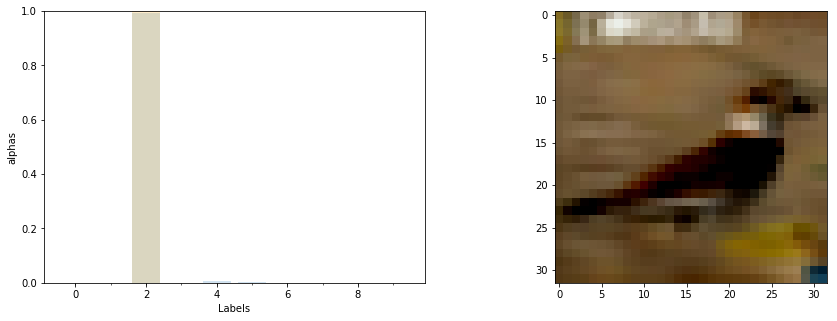

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.7319e+03, 1.6471e-02, 1.1694e+07, 1.6499e+01, 8.1705e+04, 2.3805e+04,
        1.9609e+01, 3.3949e-02, 7.7158e+02, 1.9350e-02])
compare pred, true:  tensor([2]) tensor([2])
out:  tensor([6])


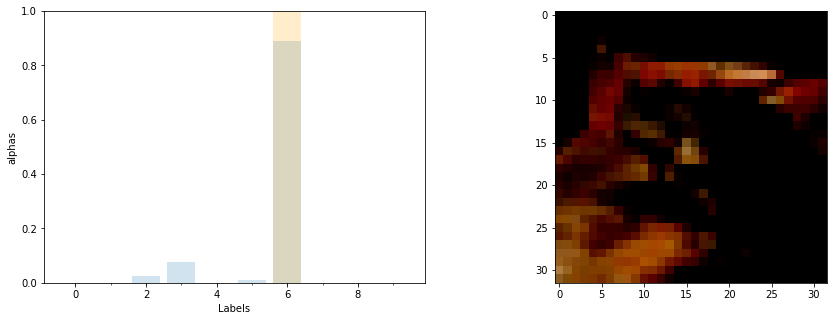

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.0334e-03, 4.3174e+02, 3.0892e+12, 9.1885e+12, 3.1348e+05, 1.2783e+12,
        1.0942e+14, 8.7230e+06, 1.7733e-03, 1.3413e-03])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([8])


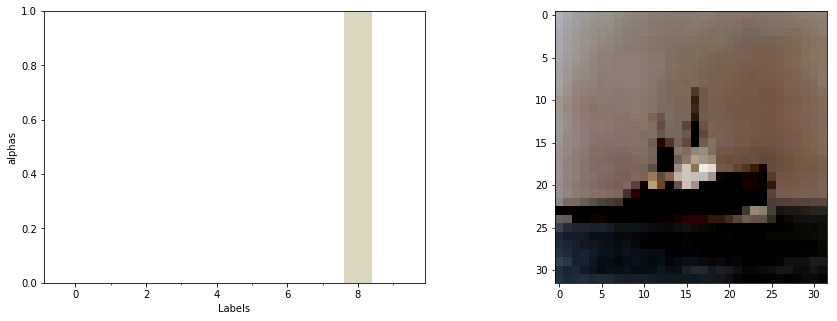

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([8.6570e+14, 1.2028e-03, 3.6905e+09, 2.7227e+05, 1.8933e+08, 4.8885e+04,
        1.4388e+00, 6.1985e-02, 1.2061e+26, 9.3206e+07])
compare pred, true:  tensor([8]) tensor([8])
out:  tensor([8])


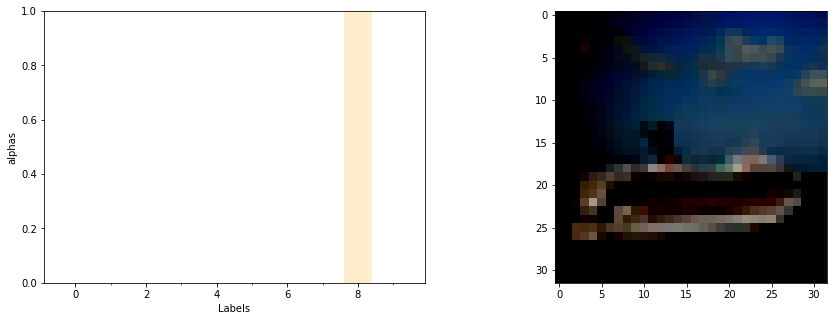

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([3.6086e+34,        inf, 1.9913e+17,        inf, 2.7284e+08, 8.7962e+06,
        7.4920e+29, 8.9154e-04,        inf, 1.1068e+24])
compare pred, true:  tensor([8]) tensor([8])
NAN or inf!
out:  tensor([9])


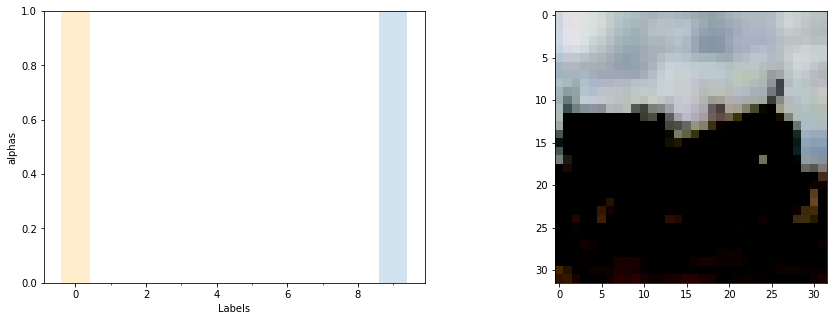

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([4.2961e+02, 2.1665e-01, 5.8005e-01, 4.7019e-01, 1.1981e-03, 1.0968e-03,
        1.6658e-03, 1.1303e+00, 7.3558e-02, 2.2425e+06])
compare pred, true:  tensor([9]) tensor([0])
out:  tensor([2])


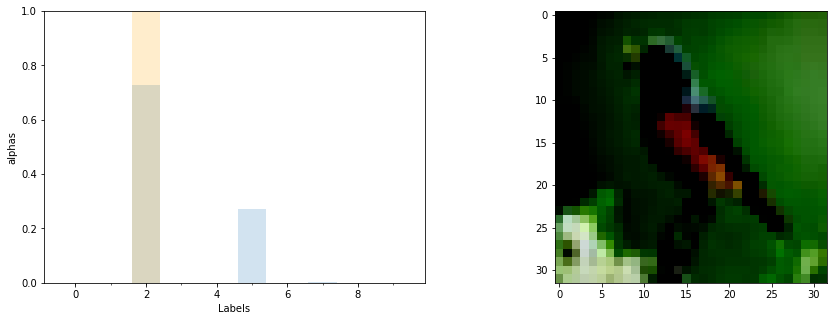

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([6.1304e+01, 7.8190e-03, 4.6064e+14, 3.9837e+10, 3.6345e+10, 1.7168e+14,
        4.2487e+09, 1.1574e+12, 4.0670e+04, 5.7157e+09])
compare pred, true:  tensor([2]) tensor([2])
out:  tensor([0])


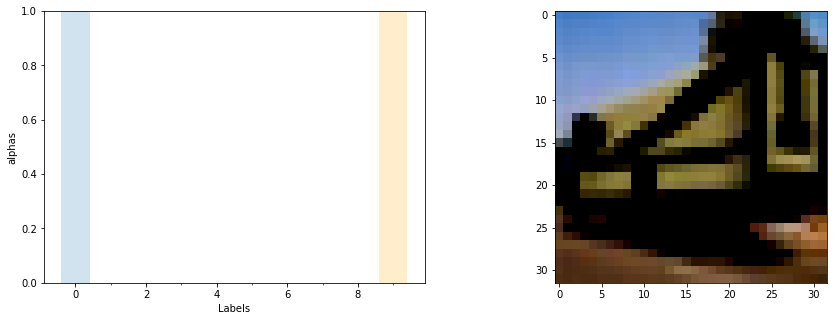

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([2.3755e+09, 3.5518e+04, 4.8920e+05, 1.6285e+02, 5.8702e+03, 3.9729e+00,
        1.1535e-03, 7.4800e+02, 5.5627e-01, 5.3349e-02])
compare pred, true:  tensor([0]) tensor([9])
out:  tensor([3])


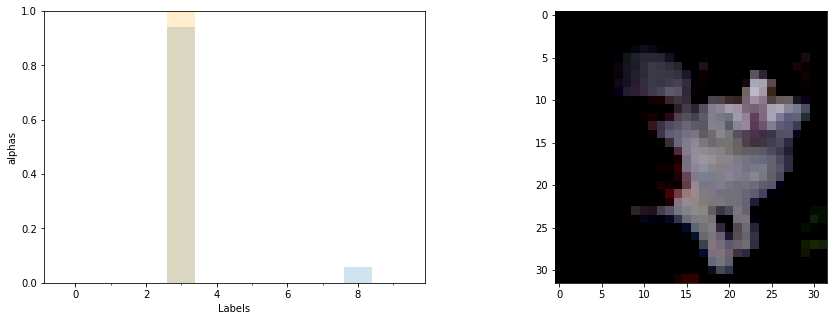

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([7.4375e+01, 1.6791e+00, 4.5345e-01, 3.4716e+10, 1.9475e+02, 4.9573e+06,
        2.6765e+05, 9.5987e-01, 2.1777e+09, 2.1193e-03])
compare pred, true:  tensor([3]) tensor([3])
out:  tensor([5])


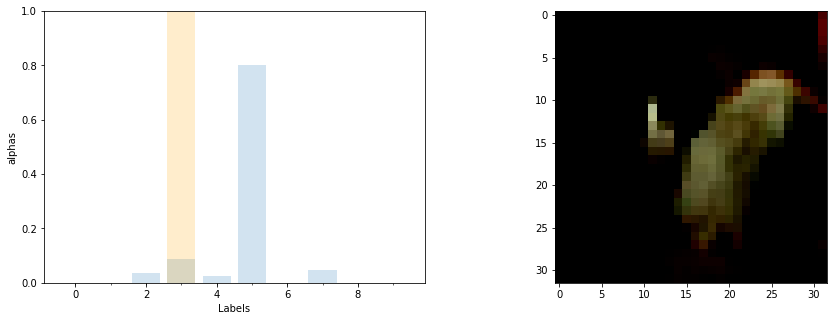

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([5.5893e+09, 1.9526e-03, 7.5395e+13, 1.8488e+14, 5.5350e+13, 1.6792e+15,
        4.0323e+01, 9.8421e+13, 3.5985e+06, 9.2473e+00])
compare pred, true:  tensor([5]) tensor([3])
out:  tensor([8])


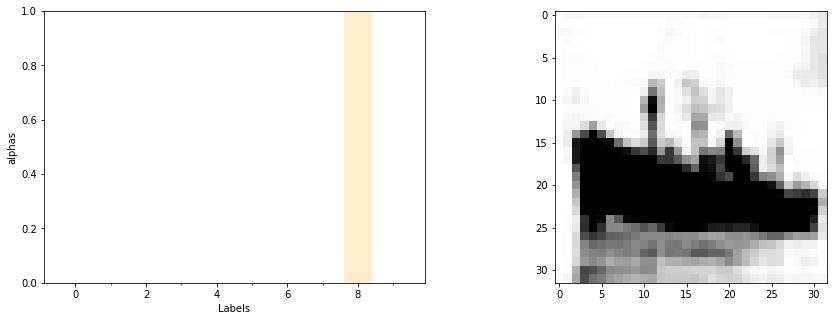

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([2.7203e+26,        inf, 7.6727e+20, 2.8163e+33, 4.8374e+29, 2.0365e+24,
        6.9947e+21, 8.5256e-04,        inf, 1.6158e+28])
compare pred, true:  tensor([8]) tensor([8])
NAN or inf!
out:  tensor([8])


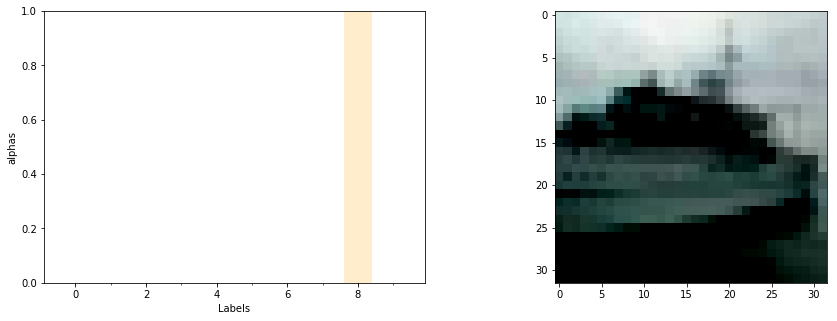

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.4964e+31, 1.3300e+17, 7.8656e+14, 4.3061e+10, 6.7079e-04, 3.8713e+00,
        3.5351e+06, 7.6494e-04,        inf, 1.9746e+27])
compare pred, true:  tensor([8]) tensor([8])
NAN or inf!
out:  tensor([1])


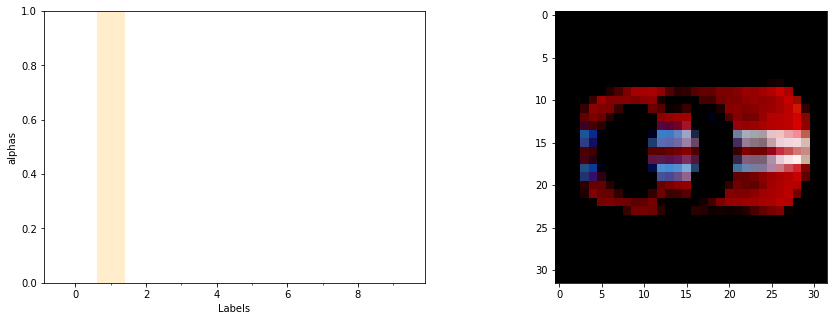

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.0335e+19,        inf, 6.0164e+19, 1.9307e+09, 1.1277e+11, 2.1729e+17,
        2.6334e+24, 1.2217e-04, 2.9182e+23,        inf])
compare pred, true:  tensor([9]) tensor([1])
NAN or inf!
out:  tensor([1])


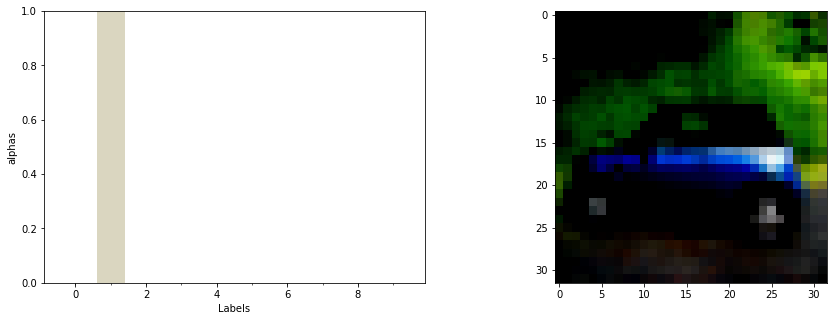

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([2.6990e+09, 4.4126e+27, 3.8666e+09, 2.1982e+16, 3.3877e-04, 2.6061e-04,
        4.0031e+14, 4.1701e+07, 1.4125e+09, 5.5083e+12])
compare pred, true:  tensor([1]) tensor([1])
out:  tensor([7])


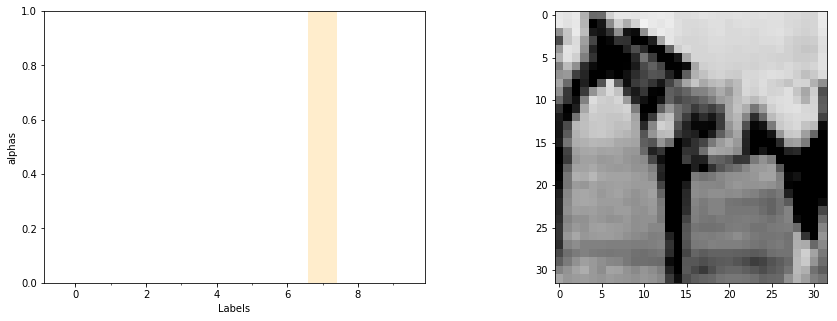

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.8457e+20, 2.6870e-03, 6.6848e+23, 1.3420e+21, 2.3899e+30, 1.1093e+29,
        7.6911e+04,        inf, 1.5033e+16, 1.2480e+01])
compare pred, true:  tensor([7]) tensor([7])
NAN or inf!
out:  tensor([5])


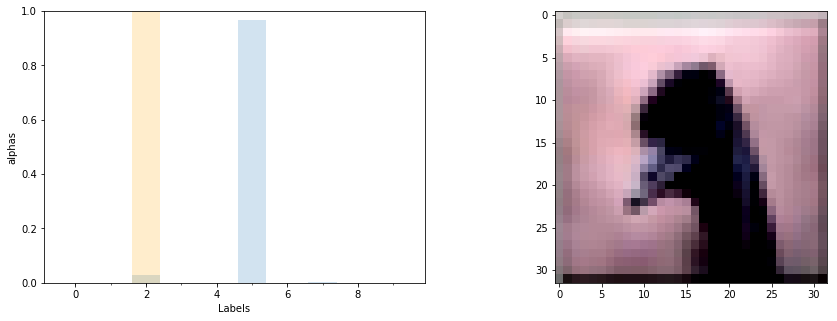

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.9740e+15, 6.6235e-03, 6.4038e+23, 9.8678e+20, 1.0646e+19, 2.0469e+25,
        3.4484e+14, 4.6982e+22, 2.2216e+12, 3.9449e+14])
compare pred, true:  tensor([5]) tensor([2])
out:  tensor([7])


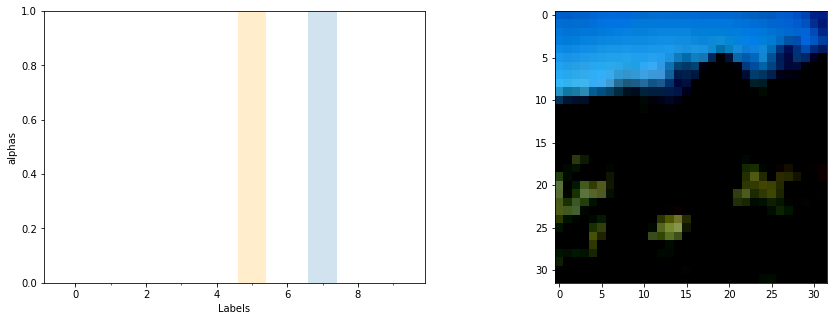

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([9.9428e-01, 1.8078e-02, 6.9475e+13, 7.3999e+04, 1.6014e+12, 8.4677e+10,
        1.3932e-03, 2.0434e+17, 2.6640e-02, 8.1027e+08])
compare pred, true:  tensor([7]) tensor([5])
out:  tensor([4])


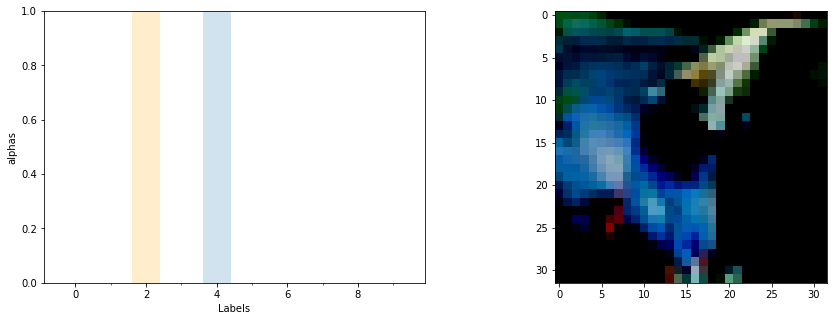

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([4.7978e-03, 4.0652e-03, 1.2044e+00, 2.6150e+00, 2.0682e+06, 1.1380e+03,
        2.2195e-03, 1.7550e+02, 2.0845e+01, 1.2035e-02])
compare pred, true:  tensor([4]) tensor([2])
out:  tensor([3])


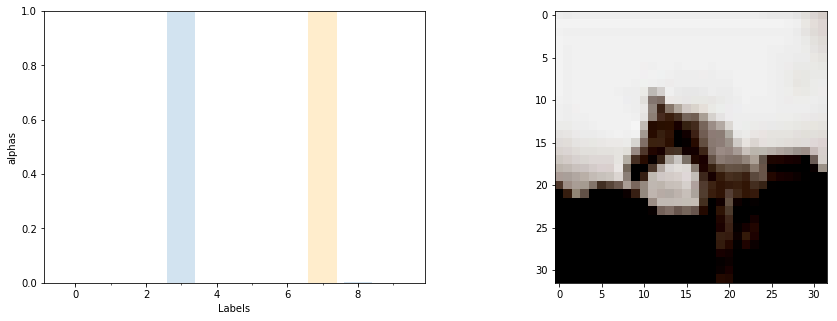

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.5568e+09, 3.5709e-03, 8.9141e+09, 1.0916e+14, 2.4771e+10, 6.2251e+06,
        3.9674e+04, 4.7828e+07, 2.1647e+11, 7.5066e+07])
compare pred, true:  tensor([3]) tensor([7])
out:  tensor([8])


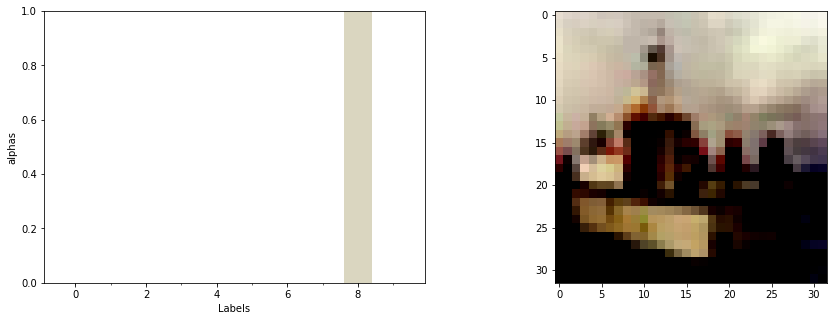

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([7.6527e+07, 5.8230e+03, 1.3128e+01, 1.0146e+00, 4.5264e-02, 2.9621e+01,
        1.5632e-03, 8.2404e-04, 1.0387e+15, 3.6362e+09])
compare pred, true:  tensor([8]) tensor([8])
out:  tensor([9])


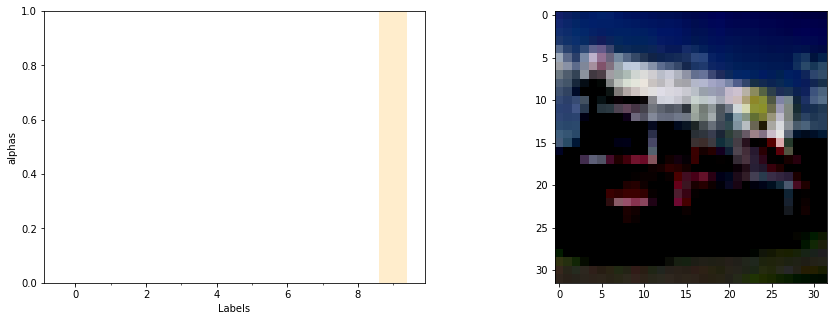

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf])
compare pred, true:  tensor([9]) tensor([9])
NAN or inf!
out:  tensor([0])


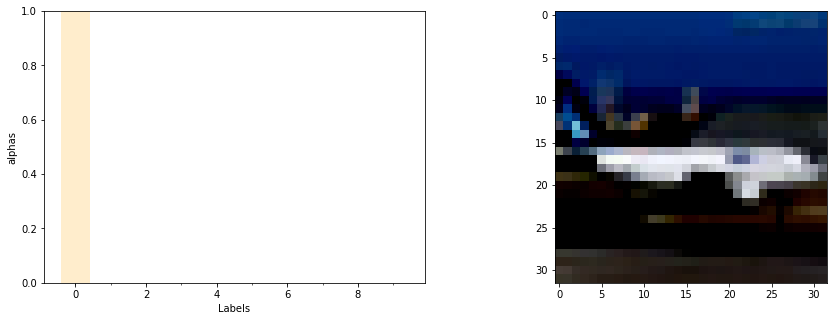

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([       inf, 2.4791e+24, 2.9879e+07, 5.5977e+01, 7.5217e+15, 4.7260e-04,
        3.2458e-03, 3.7386e-04, 1.7298e+28, 3.0604e+20])
compare pred, true:  tensor([0]) tensor([0])
NAN or inf!
out:  tensor([2])


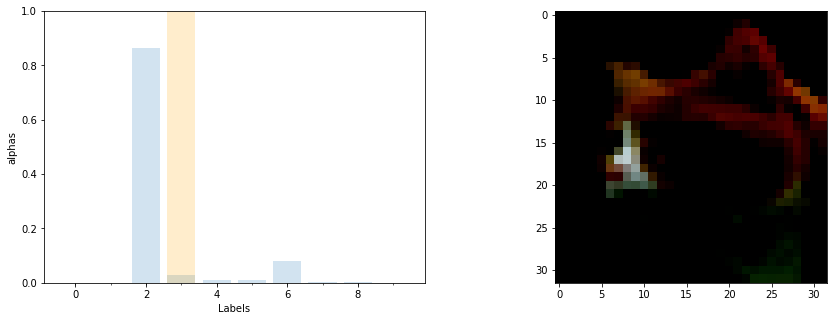

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.2016e-02, 2.7747e-02, 5.0273e+03, 1.6152e+02, 5.5438e+01, 6.5701e+01,
        4.5866e+02, 1.4666e+01, 2.7064e+01, 4.7498e+00])
compare pred, true:  tensor([2]) tensor([3])
out:  tensor([8])


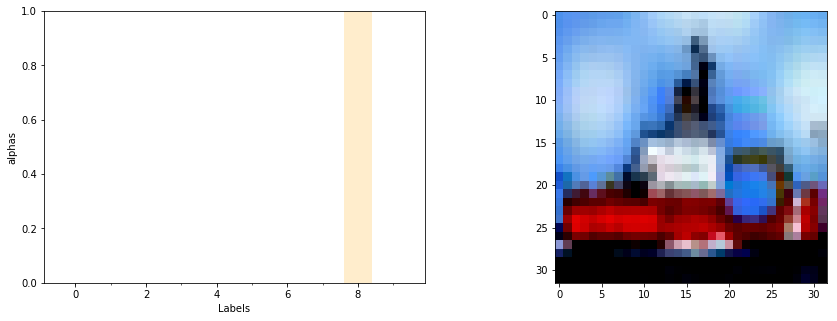

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, nan, inf, inf])
compare pred, true:  tensor([7]) tensor([8])
NAN or inf!
out:  tensor([6])


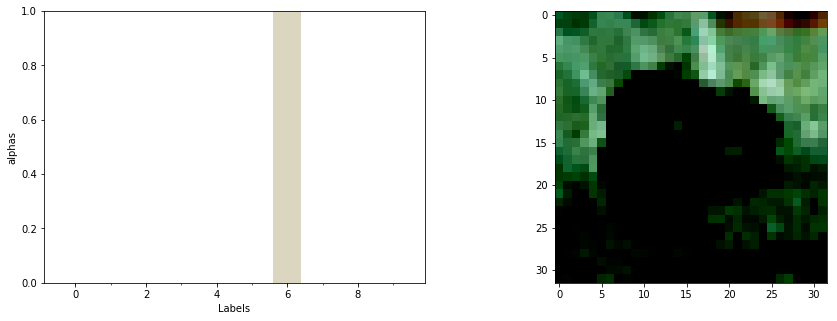

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.8647e+13, 1.0953e+12, 5.1776e+17, 8.8317e+20, 2.7779e+05, 2.4343e+11,
        1.6015e+31, 3.0902e-03, 2.2281e+08, 4.8067e+13])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([4])


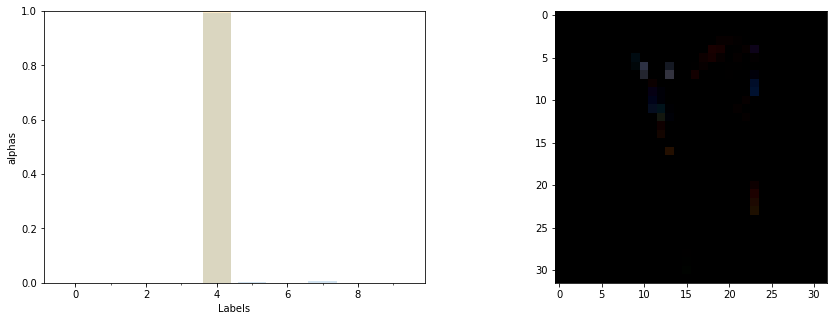

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([1.5738e+01, 8.2856e-03, 1.1012e+02, 4.7865e-01, 1.6398e+06, 5.6023e+03,
        5.7575e-02, 8.4971e+03, 5.1001e-03, 6.3584e-03])
compare pred, true:  tensor([4]) tensor([4])
out:  tensor([6])


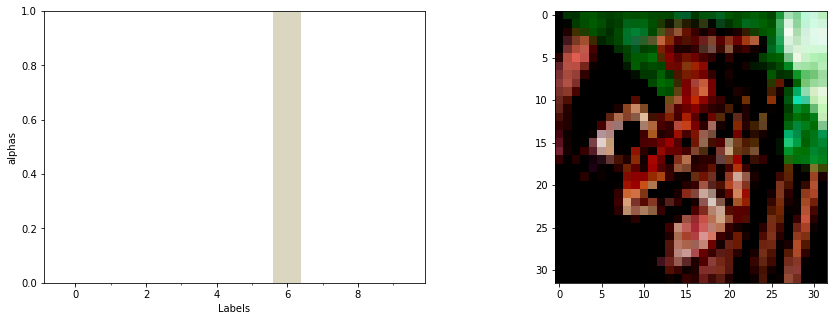

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([7.6786e-02, 2.8488e-01, 4.9505e+02, 8.6740e+00, 4.0765e+01, 1.8151e-01,
        4.3982e+07, 2.0050e-03, 2.3317e-02, 4.5355e-03])
compare pred, true:  tensor([6]) tensor([6])
out:  tensor([6])


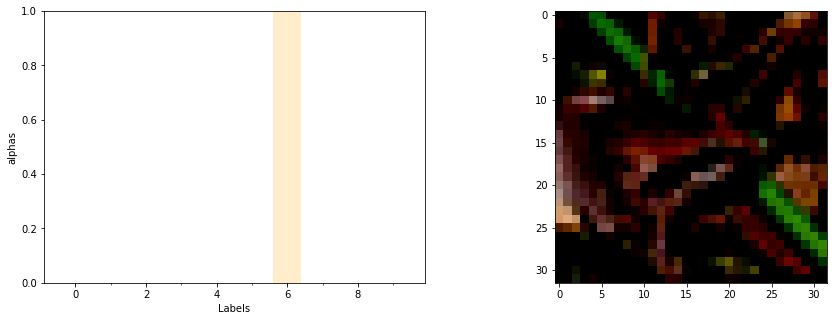

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([6.2218e+07, 3.5345e+13, 1.4099e+34, 5.4004e+26, 8.5488e+26, 1.0271e+12,
               inf, 2.7650e+10, 9.2598e+01, 2.8423e-03])
compare pred, true:  tensor([6]) tensor([6])
NAN or inf!
out:  tensor([0])


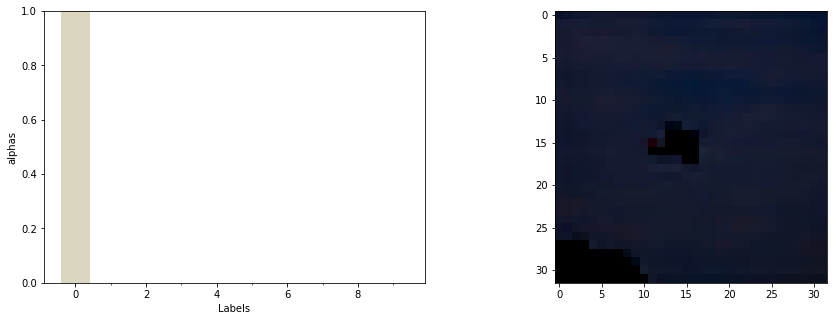

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([6.7886e+18, 3.4835e-01, 1.1725e+11, 7.8199e+04, 2.1991e+12, 3.9048e+08,
        3.5109e+08, 4.3211e-03, 2.9848e+12, 2.5459e+03])
compare pred, true:  tensor([0]) tensor([0])
out:  tensor([0])


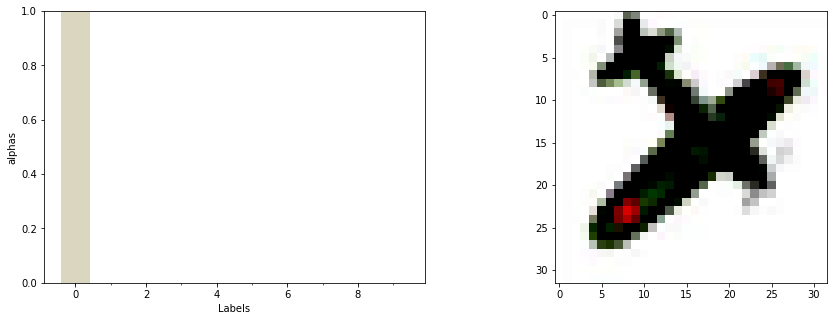

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


alphas:  tensor([3.0988e+28, 7.9813e-04, 6.5230e+04, 1.4354e+14, 1.8324e+10, 6.3716e+10,
        2.7056e+13, 7.3033e+11, 5.4347e-04, 1.8381e+02])
compare pred, true:  tensor([0]) tensor([0])
out:  tensor([0])


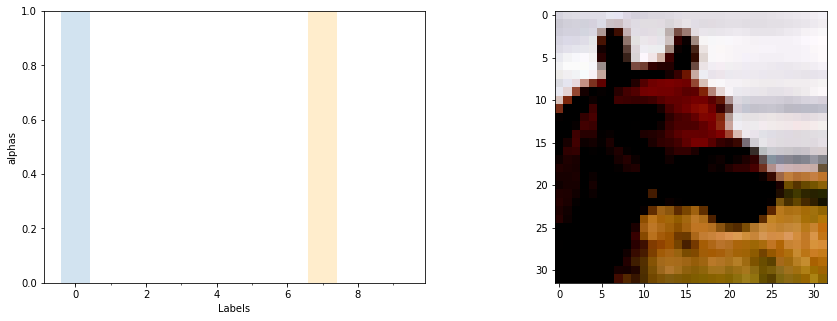

alphas:  tensor([1.7093e+13, 1.2487e+02, 5.8054e+08, 2.2537e+02, 9.2631e+09, 5.7554e+06,
        3.0997e+08, 1.6877e+08, 1.9848e-03, 6.5799e+08])
compare pred, true:  tensor([0]) tensor([7])
non_nan or inf:  82


(0.5365853658536586, 0.61)

In [243]:
CIFAR10_net = LPADirNN_CIFAR()
print("loading model from: {}".format(CIFAR10_HESS_PATH))
CIFAR10_net.load_state_dict(torch.load(CIFAR10_HESS_PATH))
CIFAR10_net.eval()
evaluate_CIFAR10(model=CIFAR10_net, 
               mus_w_mean=mus_w_mean_CIFAR10,
               mus_b_mean=mus_b_mean_CIFAR10,
               sigmas_w_mean=sigmas_w_mean_CIFAR10,
               sigmas_b_mean=sigmas_b_mean_CIFAR10,
               show=True,
               test_size=99)

In [244]:
CIFAR10_net = LPADirNN_CIFAR()
print("loading model from: {}".format(CIFAR10_HESS_PATH))
CIFAR10_net.load_state_dict(torch.load(CIFAR10_HESS_PATH))
CIFAR10_net.eval()
evaluate_CIFAR100(model=CIFAR10_model,
               mus_w_mean=mus_w_mean_CIFAR10,
               mus_b_mean=mus_b_mean_CIFAR10,
               sigmas_w_mean=sigmas_w_mean_CIFAR10,
               sigmas_b_mean=sigmas_b_mean_CIFAR10,
               show=False,
               test_size=99)

loading model from: models/CIFAR10_hess_model.pth
out:  tensor([5])
alphas:  tensor([2.3474e+05, 5.5554e-03, 2.4264e+04, 2.2288e+02, 3.3768e+02, 1.4174e+05,
        1.4792e-02, 2.2209e+05, 2.0234e+02, 1.1478e+03])
compare pred, true:  tensor([0]) tensor([49])
out:  tensor([3])
alphas:  tensor([3.4932e-02, 2.1122e-02, 2.5420e+04, 5.6439e+08, 2.3753e+08, 2.4428e+04,
        1.7304e+08, 2.5325e-02, 1.5911e-02, 1.8618e-02])
compare pred, true:  tensor([3]) tensor([33])
out:  tensor([8])
alphas:  tensor([2.3112e+08, 2.7055e-02, 3.4689e+09, 4.3077e+07, 2.6599e+09, 3.2081e+09,
        5.5573e+06, 1.0562e+07, 6.0647e+11, 1.2784e+05])
compare pred, true:  tensor([8]) tensor([72])
out:  tensor([6])
alphas:  tensor([4.6797e+04, 5.2082e+03, 8.9021e+01, 1.8380e+05, 1.7966e+01, 3.3021e+03,
        2.5764e+07, 1.0732e+01, 4.6974e-03, 9.8027e+03])
compare pred, true:  tensor([6]) tensor([51])
out:  tensor([0])
alphas:  tensor([1.1624e+20, 5.6922e+13, 1.0723e+17, 2.7426e+13, 2.7553e+04, 3.2313e+11,
   

/home/marius/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


alphas:  tensor([3.1634e-02, 1.4338e-02, 1.5571e+03, 5.8643e+05, 5.7271e+01, 5.6864e+06,
        1.1052e+04, 2.1474e+02, 2.4833e+03, 5.8581e+01])
compare pred, true:  tensor([5]) tensor([53])
out:  tensor([6])
alphas:  tensor([2.5957e-03, 9.9004e-04, 2.7786e+02, 1.9112e+04, 2.6956e-04, 1.2304e+05,
        9.7474e+15, 4.2918e+01, 1.0067e-01, 6.1868e-02])
compare pred, true:  tensor([6]) tensor([70])
out:  tensor([0])
alphas:  tensor([       inf, 1.0828e-03, 1.0627e+19, 1.8914e+08, 1.9298e+08, 2.1803e+01,
        2.2180e+18, 4.1628e-04, 6.7008e+24, 1.5143e+05])
compare pred, true:  tensor([0]) tensor([49])
NAN or inf!
out:  tensor([7])
alphas:  tensor([1.0253e+08, 1.4018e+05, 4.0398e+01, 1.2689e+11, 7.8534e+14, 7.3342e+06,
        1.9451e+00, 6.5681e+20, 1.2432e-03, 2.0024e+06])
compare pred, true:  tensor([7]) tensor([75])
out:  tensor([9])
alphas:  tensor([5.7520e-01, 1.5222e-02, 1.1452e+04, 2.1877e+00, 8.7814e+01, 2.6909e+00,
        1.9146e-01, 7.6104e-03, 2.1994e-01, 1.5397e+05])
co

out:  tensor([0])
alphas:  tensor([5.0124e+11, 8.1497e-03, 1.7087e+09, 5.0616e+03, 1.1739e+04, 2.5248e+07,
        1.6894e+02, 4.7983e+04, 1.1014e+11, 5.9899e+00])
compare pred, true:  tensor([0]) tensor([69])
out:  tensor([3])
alphas:  tensor([3.6511e+14, 1.9920e-03, 1.5774e+15, 9.4814e+22, 8.5897e+13, 6.5690e+20,
        2.1608e+16, 3.6638e+05, 1.7458e+04, 2.9460e+04])
compare pred, true:  tensor([3]) tensor([77])
out:  tensor([6])
alphas:  tensor([1.6387e+19, 1.8625e-02, 1.5421e+25, 5.0261e+22, 1.1567e+24, 8.7303e+12,
        6.5743e+29, 2.9348e+08, 7.3769e+13, 1.5770e-02])
compare pred, true:  tensor([6]) tensor([27])
out:  tensor([5])
alphas:  tensor([2.7549e-03, 2.1849e-03, 2.3115e+08, 4.9691e+04, 4.4135e+12, 6.9369e+14,
        3.0816e+01, 3.6634e+14, 8.8572e+08, 2.8062e+14])
compare pred, true:  tensor([5]) tensor([15])
out:  tensor([6])
alphas:  tensor([1.8740e+01, 8.2727e-03, 1.6918e+04, 6.5001e+04, 6.3477e+09, 2.6073e+06,
        4.8154e+12, 1.2963e+06, 1.4330e-02, 1.2209e+0

(0.0, 0.0)

# CIFAR 100

In [295]:
STEP_SIZE_TRAIN_CIFAR100 = 5 * 10e-6
BATCH_SIZE_CIFAR100 = 128
MAX_ITER_CIFAR100 = 70
TEST_BATCH_SIZE_CIFAR100 = 1
HESS_BATCH_SIZE_CIFAR100 = 128
STEP_SIZE_HESS_CIFAR100 = 1 * 10e-8

In [317]:
# make a new network for cifar10 and 100

class LPADirNN_CIFAR100(torch.nn.Module):
    def __init__(self, num_classes=100):
        
        super(LPADirNN_CIFAR100, self).__init__()
        
        self.c1 = torch.nn.Conv2d(3, 20, 5, 1)
        self.relu1 = torch.nn.ReLU()
        self.maxpool2d1 = torch.nn.MaxPool2d(2,2)
        self.c2 = torch.nn.Conv2d(20, 50, 3, 1)
        self.relu2 = torch.nn.ReLU()
        self.maxpool2d2 = torch.nn.MaxPool2d(2,2)
        self.c3 = torch.nn.Conv2d(50, 100, 3, 1)
        self.relu3 = torch.nn.ReLU()
        self.maxpool2d3 = torch.nn.MaxPool2d(2,2)
        self.flatten = Flatten()
        self.l1 = torch.nn.Linear(3 * 3 * 100, 500)
        self.relu3 = torch.nn.ReLU()
        self.l2 = torch.nn.Linear(500, num_classes)
        
    def forward(self, x, phi=False):
        
        x = self.c1(x)
        x = self.relu1(x)
        x = self.maxpool2d1(x)
        x = self.c2(x)
        x = self.relu2(x)
        x = self.maxpool2d2(x)
        x = self.c3(x)
        x = self.relu3(x)
        x = self.maxpool2d3(x)
        x = self.flatten(x)
        x = self.l1(x)
        x = self.relu3(x)
        if phi:
            return(x)
        else:
            x = self.l2(x)
            return(x)

In [318]:
trainset = torchvision.datasets.CIFAR100(root='./cifar100', train=True,
                                        download=True, transform=transform)

train_size = int(0.8 * len(trainset))
val_size = len(trainset) - train_size
CIFAR100_train_dataset, CIFAR100_val_dataset = torch.utils.data.random_split(trainset, [train_size, val_size])

Files already downloaded and verified


In [319]:
transform = torchvision.transforms.Compose(
    [torchvision.transforms.ToTensor(),
     torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])


CIFAR100_train_loader = torch.utils.data.DataLoader(CIFAR100_train_dataset, batch_size=BATCH_SIZE_CIFAR100,
                                          shuffle=True)

CIFAR100_val_loader = torch.utils.data.DataLoader(CIFAR100_val_dataset, batch_size=BATCH_SIZE_CIFAR100,
                                          shuffle=True)

testset = torchvision.datasets.CIFAR100(root='./cifar100', train=False,
                                       download=True, transform=transform)
CIFAR100_test_loader = torch.utils.data.DataLoader(testset, batch_size=TEST_BATCH_SIZE,
                                         shuffle=False)

CIFAR100_classes = [
    'apple', 'aquarium_fish', 'baby', 'bear', 'beaver', 'bed', 'bee', 'beetle', 
    'bicycle', 'bottle', 'bowl', 'boy', 'bridge', 'bus', 'butterfly', 'camel', 
    'can', 'castle', 'caterpillar', 'cattle', 'chair', 'chimpanzee', 'clock', 
    'cloud', 'cockroach', 'couch', 'crab', 'crocodile', 'cup', 'dinosaur', 
    'dolphin', 'elephant', 'flatfish', 'forest', 'fox', 'girl', 'hamster', 
    'house', 'kangaroo', 'keyboard', 'lamp', 'lawn_mower', 'leopard', 'lion',
    'lizard', 'lobster', 'man', 'maple_tree', 'motorcycle', 'mountain', 'mouse',
    'mushroom', 'oak_tree', 'orange', 'orchid', 'otter', 'palm_tree', 'pear',
    'pickup_truck', 'pine_tree', 'plain', 'plate', 'poppy', 'porcupine',
    'possum', 'rabbit', 'raccoon', 'ray', 'road', 'rocket', 'rose',
    'sea', 'seal', 'shark', 'shrew', 'skunk', 'skyscraper', 'snail', 'snake',
    'spider', 'squirrel', 'streetcar', 'sunflower', 'sweet_pepper', 'table',
    'tank', 'telephone', 'television', 'tiger', 'tractor', 'train', 'trout',
    'tulip', 'turtle', 'wardrobe', 'whale', 'willow_tree', 'wolf', 'woman',
    'worm'
]

Files already downloaded and verified


In [320]:
CIFAR100_model = LPADirNN_CIFAR100(num_classes=100)
loss_function = torch.nn.CrossEntropyLoss()       

CIFAR100_train_optimizer = torch.optim.Adam(CIFAR100_model.parameters(), lr=STEP_SIZE_TRAIN_CIFAR100)

In [321]:
CIFAR100_PATH = "models/CIFAR100_model.pth"
current_best_mva = 0

for iter in range(MAX_ITER_CIFAR100):
    train_acc = []
    for batch_idx, (x, y) in enumerate(CIFAR100_train_loader):
        max_len = int(np.ceil(len(CIFAR100_train_loader.dataset)/BATCH_SIZE_CIFAR100*0.8))
        output = CIFAR100_model(x, phi=False)

        accuracy = get_accuracy(output, y)
        train_acc.append(accuracy)

        #with backpack(DiagGGNMC()):
        #    loss = loss_function(output, y)
        #    loss.backward()
        #    mnist_optimizer.step()
        
        loss = loss_function(output, y)
        loss.backward()
        CIFAR100_train_optimizer.step()

        print(
            "Iteration {}; {}/{} \t".format(iter, batch_idx, max_len) +
            "Minibatch Loss %.3f  " % (loss) +
            "Accuracy %.0f" % (accuracy * 100) + "%"
        )
        
    val_acc = []
    for batch_idx, (x, y) in enumerate(CIFAR100_val_loader):
        max_len = int(np.ceil(len(CIFAR100_train_loader.dataset)/BATCH_SIZE_CIFAR100*0.2))
        output = CIFAR100_model(x, phi=False)

        accuracy = get_accuracy(output, y)
        val_acc.append(accuracy)
        print("Iteration {}; {}/{} \t".format(iter, batch_idx, max_len) + 
              "Validation accuracy: {:.03f}".format(accuracy))

    mva = np.mean(val_acc)
    mta = np.mean(train_acc)
    print("mean train acc: ", mta)
    print("mean val acc: ", mva)
    
    
    if mva > current_best_mva:
        current_best_mva = mva
        print("saving model at: {}".format(CIFAR100_PATH))
        torch.save(CIFAR100_model.state_dict(), CIFAR100_PATH)



RuntimeError: size mismatch, m1: [128 x 400], m2: [900 x 500] at /opt/conda/conda-bld/pytorch_1565272271120/work/aten/src/TH/generic/THTensorMath.cpp:752

In [280]:
CIFAR100_model = LPADirNN_CIFAR(num_classes=100)
print("loading model from: {}".format(CIFAR100_PATH))
CIFAR100_model.load_state_dict(torch.load(CIFAR100_PATH))


CIFAR100_hess_optimizer = DiagGGNOptimizer(
    CIFAR100_model.parameters(), 
    step_size=STEP_SIZE_HESS_CIFAR100, 
    damping=DAMPING
)

CIFAR100_HESS_PATH = "models/CIFAR100_Hess_model.pth"
mus_w_mean_CIFAR100, mus_b_mean_CIFAR100, sigmas_w_mean_CIFAR100, sigmas_b_mean_CIFAR100 = get_second_order_infos(model=CIFAR100_model, 
                                                                                                     data_loader=CIFAR100_train_loader,
                                                                                                     optimizer=CIFAR100_hess_optimizer,
                                                                                                     num_classes=100,
                                                                                                     batch_size=HESS_BATCH_SIZE_CIFAR100,
                                                                                                     save_path=CIFAR100_HESS_PATH)

loading model from: models/CIFAR100_model.pth
get the second order information for the trained model
0/391 batches 	 acc: 0.890625
1/391 batches 	 acc: 0.937500
2/391 batches 	 acc: 0.906250
3/391 batches 	 acc: 0.953125
4/391 batches 	 acc: 0.953125
5/391 batches 	 acc: 0.937500
6/391 batches 	 acc: 0.976562
7/391 batches 	 acc: 0.937500
8/391 batches 	 acc: 0.960938
9/391 batches 	 acc: 0.882812
10/391 batches 	 acc: 0.937500
11/391 batches 	 acc: 0.937500
12/391 batches 	 acc: 0.929688
13/391 batches 	 acc: 0.945312
14/391 batches 	 acc: 0.960938
15/391 batches 	 acc: 0.937500
16/391 batches 	 acc: 0.960938
17/391 batches 	 acc: 0.984375
18/391 batches 	 acc: 0.898438
19/391 batches 	 acc: 0.945312
20/391 batches 	 acc: 0.945312
21/391 batches 	 acc: 0.921875
22/391 batches 	 acc: 0.929688
23/391 batches 	 acc: 0.921875
24/391 batches 	 acc: 0.953125
25/391 batches 	 acc: 0.937500
26/391 batches 	 acc: 0.921875
27/391 batches 	 acc: 0.906250
28/391 batches 	 acc: 0.945312
29/391 bat

257/391 batches 	 acc: 0.937500
258/391 batches 	 acc: 0.921875
259/391 batches 	 acc: 0.945312
260/391 batches 	 acc: 0.945312
261/391 batches 	 acc: 0.953125
262/391 batches 	 acc: 0.890625
263/391 batches 	 acc: 0.945312
264/391 batches 	 acc: 0.937500
265/391 batches 	 acc: 0.953125
266/391 batches 	 acc: 0.953125
267/391 batches 	 acc: 0.921875
268/391 batches 	 acc: 0.984375
269/391 batches 	 acc: 0.929688
270/391 batches 	 acc: 0.929688
271/391 batches 	 acc: 0.953125
272/391 batches 	 acc: 0.937500
273/391 batches 	 acc: 0.960938
274/391 batches 	 acc: 0.976562
275/391 batches 	 acc: 0.953125
276/391 batches 	 acc: 0.945312
277/391 batches 	 acc: 0.921875
278/391 batches 	 acc: 0.929688
279/391 batches 	 acc: 0.953125
280/391 batches 	 acc: 0.968750
281/391 batches 	 acc: 0.953125
282/391 batches 	 acc: 0.968750
283/391 batches 	 acc: 0.929688
284/391 batches 	 acc: 0.906250
285/391 batches 	 acc: 0.960938
286/391 batches 	 acc: 0.960938
287/391 batches 	 acc: 0.945312
288/391 

loading model from: models/CIFAR100_model.pth
out:  tensor([13])
torch.Size([100])


/home/marius/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


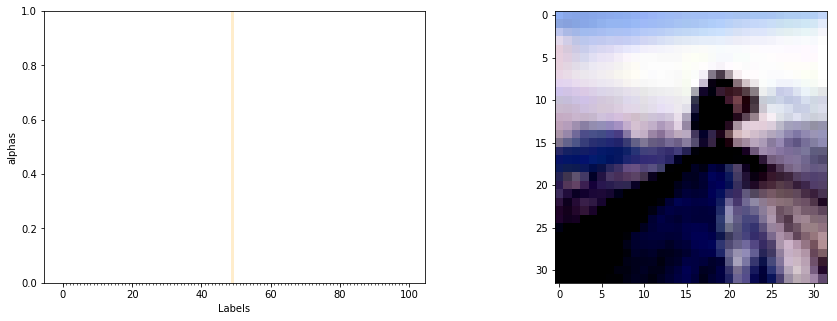

alphas:  tensor([1.0341e+12, 5.4859e+12, 4.0981e+32, 6.2096e+24, 2.9538e+22, 1.1186e+25,
        3.2703e+20, 5.7705e+27, 1.3516e+26, 1.7035e+27, 9.9400e+24, 3.7643e+25,
        1.5519e+32,        inf, 1.8194e+19, 1.6656e+23, 2.1420e+20, 2.6958e+29,
        4.6923e+25, 3.1904e+18, 8.2559e+30, 5.9033e+22, 1.8764e+24, 6.4369e+26,
        4.0251e+16, 2.9688e+31, 9.3463e+18, 2.2875e+24, 7.6321e+20, 6.5164e+27,
        9.0123e+34, 9.5313e+13, 3.3707e+32, 6.1602e+20, 2.3931e+23, 4.0894e+29,
        6.8401e+23, 9.6185e+29, 1.1346e+26, 9.2089e+22, 9.7441e+35, 4.1691e+22,
        8.9634e+22, 8.8569e+15, 2.2033e+29, 2.0644e+25, 5.0062e+34, 5.1255e+11,
        2.0418e+17, 1.4275e+24, 8.2186e+26, 2.2037e+13, 1.4620e+10, 2.0943e-02,
        1.0422e+23, 1.3932e+31, 1.3967e+21, 1.5606e+22, 1.0209e+32,        inf,
        1.0593e+21, 9.4068e+23, 1.0467e+20, 1.6527e+16, 2.8685e+17, 6.5840e+30,
        1.4037e+27, 1.3170e+27, 2.4675e+21, 1.3978e+25, 1.5251e+16,        inf,
               inf, 2.7577e+24,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


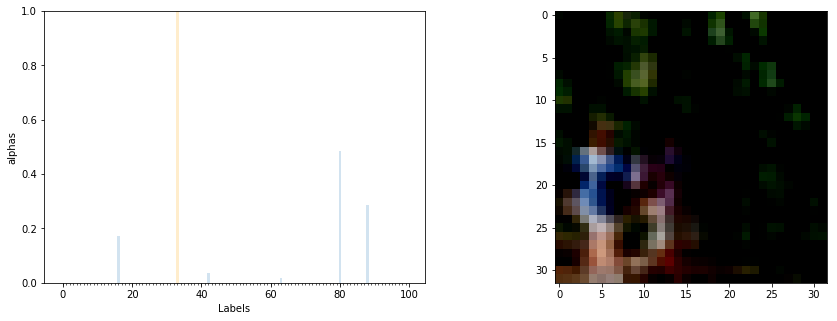

alphas:  tensor([3.5805e+04, 8.1770e+06, 2.7731e+11, 5.6193e+10, 2.7101e+10, 3.3613e+06,
        2.5060e+15, 4.4647e+08, 1.6413e+15, 1.8129e+11, 1.2448e+04, 8.8749e+13,
        1.1832e+10, 1.4222e+05, 3.2128e+04, 3.4435e+07, 2.4905e+18, 2.1536e+07,
        2.1202e+11, 2.0269e+09, 1.2579e-01, 9.1564e+03, 7.0990e+11, 2.3102e+09,
        4.2917e+02, 1.1211e+12, 1.1465e+06, 4.5548e+13, 4.6286e+12, 1.5857e+13,
        4.5711e+04, 3.4739e+13, 7.5140e+07, 8.8300e+09, 5.4613e+14, 7.9100e+09,
        5.7600e+11, 3.8546e+11, 8.1214e+13, 2.6539e+10, 3.7585e+07, 1.9578e+05,
        5.0651e+17, 1.4571e+15, 3.2406e+12, 1.1521e+11, 6.0883e+12, 6.0634e+06,
        2.3060e+10, 1.0141e+03, 6.2126e+15, 2.8665e+08, 6.0233e+00, 6.9418e-02,
        2.6898e+07, 1.3623e+09, 1.6143e+11, 1.0289e+06, 2.5649e-01, 2.0889e+11,
        1.0617e-01, 2.3250e-01, 1.6957e-01, 2.6776e+17, 7.9017e+10, 3.3296e+12,
        1.4324e+14, 2.9858e+09, 1.7649e+13, 1.1766e+07, 2.6316e+05, 6.7228e-01,
        5.8884e+10, 7.5386e+04,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100])


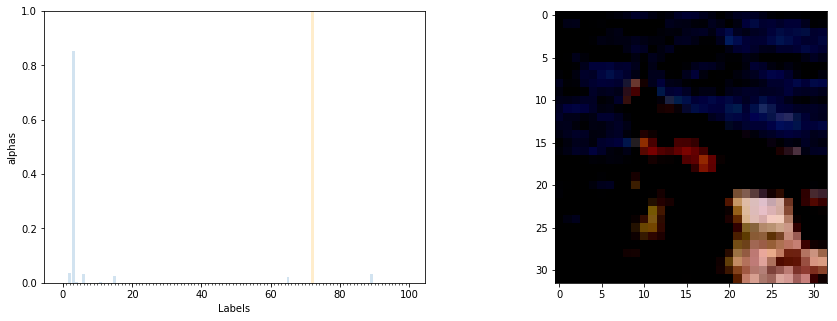

alphas:  tensor([5.8075e-02, 2.2329e+16, 2.2371e+27, 5.3519e+28, 8.4074e+25, 1.3735e+08,
        1.9633e+27, 1.0231e+17, 3.0210e+14, 4.0469e+16, 1.4788e+10, 1.1259e+26,
        2.1071e+19, 2.9080e+19, 2.0692e+17, 1.5716e+27, 4.3676e+18, 1.3172e+13,
        1.2187e+21, 3.1721e+23, 2.2872e+23, 8.9930e+03, 6.9994e+15, 4.2999e+16,
        4.9337e+20, 1.3021e+10, 3.4547e+21, 1.0685e+20, 2.4344e+03, 3.0497e+16,
        2.2655e+18, 2.1281e+17, 7.3292e+13, 1.6871e+10, 2.6428e+15, 1.9019e+16,
        4.7363e+00, 1.6301e+16, 8.2761e+19, 1.4089e+11, 2.1133e+18, 6.4390e+10,
        2.5790e+16, 2.4415e+08, 3.7870e+21, 5.1856e+17, 6.7123e+17, 5.6245e+24,
        1.6995e+23, 2.3533e+15, 8.2628e+14, 2.0301e+20, 4.4451e+15, 1.1391e+05,
        1.8706e+13, 2.8241e+22, 2.1708e+24, 1.2467e+21, 1.2062e+23, 1.6279e+20,
        1.5496e-02, 3.9091e+06, 2.3529e+21, 5.1426e+02, 4.2754e+11, 1.3204e+27,
        6.6800e+12, 1.9820e+14, 4.4665e+04, 7.5458e+21, 2.8397e+23, 2.8926e+05,
        8.8700e+12, 1.1092e+25,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


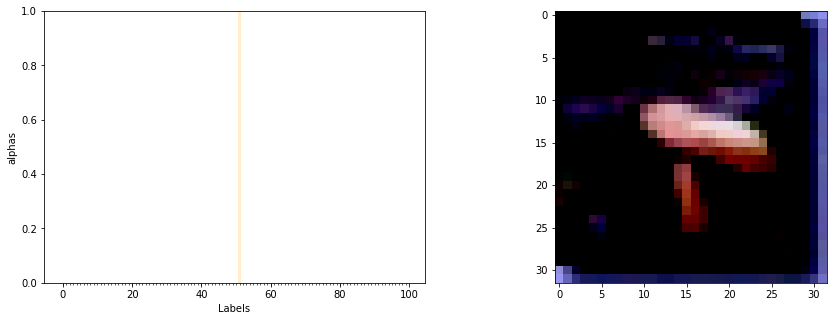

alphas:  tensor([2.0269e+16, 4.0645e+16, 3.9917e+19, 1.2097e+31, 4.2559e+26, 3.1780e+18,
        1.1374e+12, 1.8866e+22, 1.3733e+23, 2.2081e+24, 5.4603e+29, 2.1321e+25,
        1.0612e+26,        inf, 3.8597e+07, 3.1755e+30, 2.7358e+23, 5.3139e+18,
        1.6807e+14, 6.0374e+28, 1.2210e+17, 1.5512e+21, 7.6948e+30, 2.9176e+19,
        1.6563e+17, 1.0502e+28, 1.7471e+30, 5.8133e+22, 1.8927e+18, 2.0703e+23,
        4.1217e+17, 1.1662e+14, 8.3762e+21, 5.5213e+29, 3.8408e+24, 8.5741e+15,
        5.6688e+15, 2.4950e+31, 1.0772e+23, 1.1897e+23, 6.4431e+27, 9.3254e+15,
        6.6242e+16, 4.3001e+14, 7.1704e+28, 8.5156e+30, 1.3454e+28, 3.1461e+11,
        1.3538e+29, 2.0957e+20, 2.3251e+19, 8.8607e+30, 2.0478e-02, 1.3013e+12,
        4.3678e+20, 2.3616e+32, 1.4162e+27, 1.1631e+26, 6.8964e+33, 3.5274e+32,
        2.9687e+18, 1.2800e+21, 7.2643e+06, 2.7300e+17, 2.5365e+29, 1.9466e+28,
        3.6695e+35, 6.3375e+19, 9.3760e+10, 3.2279e+20, 1.4345e+17, 1.8432e+23,
        6.4135e+30, 1.0367e+21,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


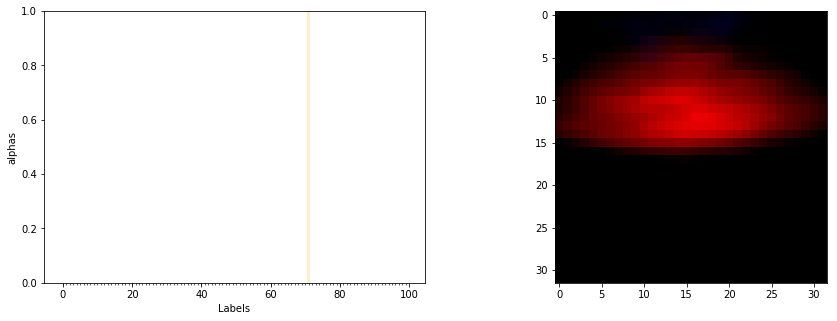

alphas:  tensor([       inf,        inf, 4.2797e+16, 7.8429e+26, 2.9848e+21, 1.4503e+26,
        3.0109e+07, 6.0880e+22, 6.7068e+19, 2.2653e+17,        inf, 1.7469e+24,
        1.8890e+23, 3.4235e+18, 1.1368e+08, 4.0878e+31, 6.6718e+24,        inf,
        1.1304e+36, 6.3201e+25, 4.1342e+16, 4.1261e-01, 7.1753e+31,        inf,
        1.9753e+07,        inf, 4.5625e+22, 1.1777e+13, 2.5493e+28, 7.8448e+16,
        5.9721e+06, 3.1579e+35, 1.7696e+26, 3.6147e+35, 5.0643e+24, 3.4367e+05,
        2.6530e+35, 1.8078e+18, 4.5723e+17, 2.3073e+20, 6.3239e+29, 1.6141e+12,
        1.1361e+27, 2.8785e+17, 3.2832e+14, 9.3094e+30, 2.0908e+14,        inf,
        9.2178e+11,        inf, 2.3672e+16, 8.5309e+23, 1.0685e+18, 8.5518e+16,
        1.5755e+23, 1.9793e+09, 1.0190e+12, 1.0316e+25, 1.8778e+22, 5.3517e+17,
        5.6263e+35, 4.4464e+18,        inf, 6.0483e+12, 6.6366e-01, 3.9967e+31,
        2.4023e-02, 1.4032e+28, 5.0088e+27, 2.7721e+25, 1.6475e+28,        inf,
        1.5598e+22, 1.2846e+11,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


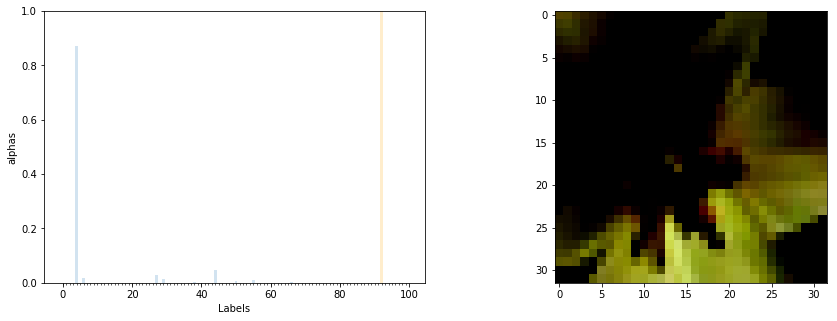

alphas:  tensor([1.0468e+01, 1.1915e+17, 8.7040e+16, 1.1079e+19, 1.8176e+27, 9.0943e+15,
        3.4030e+25, 5.2834e+21, 2.5314e+22, 1.1988e+09, 1.8950e+08, 6.9184e+17,
        2.0886e+17, 2.6661e+09, 8.9949e+16, 1.2402e+21, 8.6341e+10, 4.7842e+04,
        1.6137e+21, 2.9803e+17, 1.8318e+10, 1.6178e+15, 9.0788e+07, 1.6505e+16,
        3.2036e+23, 6.4582e+13, 1.5520e+19, 5.8386e+25, 3.5505e+15, 2.6945e+25,
        2.7189e+14, 1.0106e+21, 1.3422e+15, 1.4825e+14, 1.8868e+24, 2.6322e+18,
        6.8796e+17, 4.3124e+13, 8.8765e+24, 1.8851e+09, 1.3427e+14, 1.2566e+15,
        2.6424e+19, 4.1326e+22, 9.5051e+25, 4.7028e+20, 2.8527e+15, 3.3931e+08,
        1.4803e+09, 6.3830e-02, 1.6160e+25, 1.5366e+15, 1.2087e+04, 2.4574e-02,
        5.0104e+15, 1.9793e+25, 5.3158e+14, 9.4322e+11, 1.3303e+03, 4.9201e+07,
        9.2966e-02, 2.5094e+08, 1.2023e+04, 4.3420e+17, 4.2937e+22, 2.1528e+23,
        4.8639e+24, 1.4964e+24, 2.3236e+06, 3.5274e+15, 5.2820e+10, 9.7304e-02,
        3.9885e+19, 6.5682e+20,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


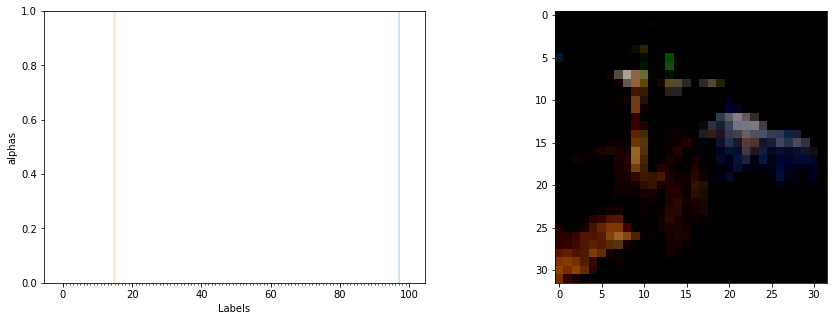

alphas:  tensor([9.7621e+04, 6.0773e+10, 2.1145e+13, 2.0667e+21, 7.9810e+20, 1.9862e+19,
        1.5185e+09, 1.4826e+16, 4.4076e+23, 1.9041e+15, 1.8522e+15, 5.6944e+12,
        2.5060e+21, 2.7236e+10, 1.1972e+13, 7.9364e+20, 9.1604e+12, 1.7323e+11,
        4.2824e+13, 5.3721e+21, 3.6707e+06, 1.0520e+05, 1.2268e+17, 2.1701e+19,
        6.3824e+06, 1.7081e+14, 2.0208e+25, 4.8762e+23, 2.3961e+22, 3.9068e+10,
        1.0541e+13, 7.7566e+15, 2.1654e+18, 3.5963e+18, 1.3115e+21, 3.2528e+09,
        1.1449e+11, 5.3804e+06, 1.5993e+17, 3.6157e+17, 7.8701e+18, 1.4777e+11,
        1.3215e+18, 2.6012e+18, 7.6194e+21, 6.8731e+12, 1.8332e+15, 2.9242e+02,
        5.0383e+09, 2.8690e+03, 1.9432e+14, 1.1665e+21, 3.7691e-02, 4.6662e-02,
        9.3538e+11, 1.9110e+18, 1.9548e+15, 9.8598e+06, 2.8425e+05, 1.0096e+16,
        5.0106e+05, 2.6557e+13, 4.8160e+00, 1.9272e+16, 7.1309e+21, 3.4070e+18,
        1.1552e+23, 1.7356e+22, 4.1509e+23, 6.9797e+06, 1.0888e+07, 2.6074e+08,
        2.0688e+16, 1.7862e+11,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


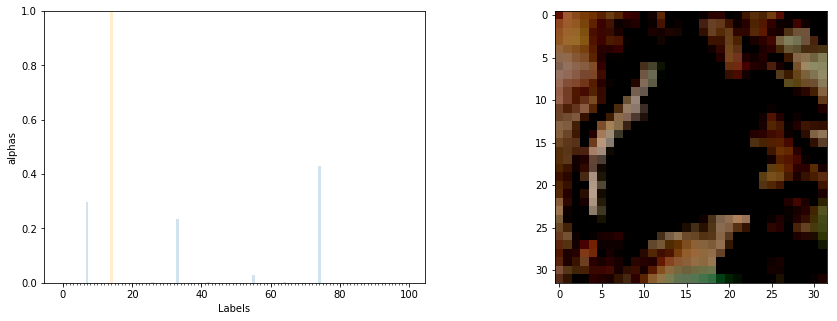

alphas:  tensor([4.7072e-02, 1.1687e+12, 6.3991e+24, 9.8252e+27, 1.2606e+30, 2.4094e+24,
        2.1541e+17, 1.9257e+35, 1.7972e+19, 2.8150e+17, 3.6936e+18, 1.1025e+21,
        2.5431e+26, 1.5182e+27, 2.0099e+30, 3.4938e+21, 1.2989e+10, 5.0597e+13,
        2.2703e+26, 3.7514e+21, 1.5186e+19, 5.0374e+26, 8.0318e+25, 5.1689e+20,
        9.3710e+18, 1.8333e+25, 1.0051e+33, 3.7606e+21, 7.5699e+15, 2.1894e+21,
        2.5424e+22, 4.5403e+18, 2.5237e+25, 1.5341e+35, 1.0530e+25, 1.4553e+22,
        4.4851e+22, 1.1679e+23, 4.9252e+25, 1.1173e+25, 5.5605e+12, 9.6144e+25,
        3.1052e+33, 1.8502e+28, 1.1881e+27, 3.4047e+28, 7.0259e+19, 2.8802e+19,
        2.9555e+23, 1.0429e+15, 9.0043e+26, 1.4013e+12, 3.6430e+18, 1.0519e+02,
        3.0793e+08, 1.8397e+34, 9.3548e+11, 5.7374e+22, 1.8908e+21, 9.6140e+28,
        2.3560e-02, 2.6759e+28, 1.1127e+00, 4.8189e+31, 1.0530e+33, 1.3418e+26,
        1.0197e+22, 1.6415e+29, 1.0066e+14, 2.4215e+13, 4.4836e+11, 1.1637e+19,
        4.1320e+29, 1.5867e+18,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


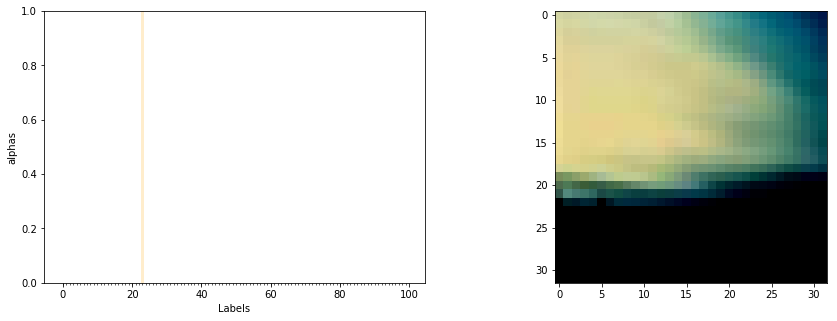

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([75]) tensor([23])
NAN or inf!
out:  tensor([83])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


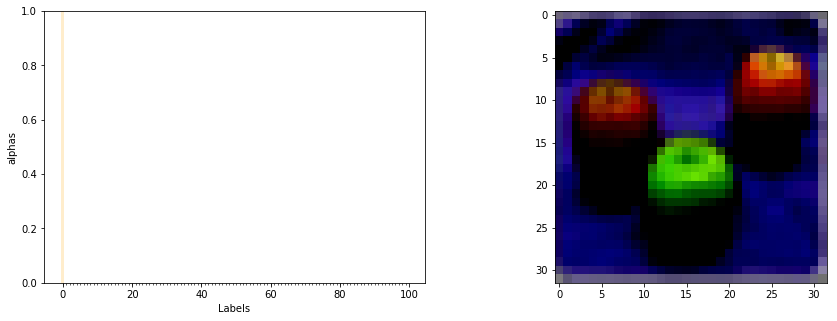

alphas:  tensor([1.1929e+27,        inf, 4.2454e+22, 1.1343e+29, 8.1728e+18, 2.8788e+23,
        1.4403e+21, 3.3019e+31, 1.6858e+18, 2.7284e+24, 1.2198e+28, 3.9745e+21,
        2.3476e+20, 6.8481e+30, 5.0660e+21, 3.6130e+19, 1.6885e+35, 5.3169e+25,
        5.1571e+27, 1.5709e+24, 3.1162e+14, 2.0628e+02, 1.4906e+06, 1.2127e+09,
        7.4117e+26, 8.7656e+29, 4.8728e+23, 3.1404e+23, 8.5348e+13, 4.4449e+26,
        4.5525e+11, 2.0898e+12, 6.1325e+34, 1.7322e+07, 1.5491e+23, 2.9501e+10,
        6.2504e+19, 9.3247e+15, 3.3367e+18, 2.2288e+18, 7.6961e+15, 7.5655e+30,
        9.8070e+10, 1.0966e+15, 1.3710e+26, 4.1621e+34, 1.0144e+20, 2.1694e+24,
        6.6430e+21, 1.3183e+19,        inf, 2.2683e+23, 3.4912e+08, 2.6057e+21,
        4.9080e+25, 2.4687e+17, 1.4333e-02, 1.6975e+28, 2.9503e+35, 3.8346e+02,
        6.5162e+08, 2.1347e+18,        inf, 7.5935e+05, 4.1435e+24, 1.0139e+04,
        1.1149e-02, 1.9636e+07, 1.0618e-02, 3.7123e+18,        inf, 9.7885e+21,
        5.0676e+16, 1.2601e+11,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


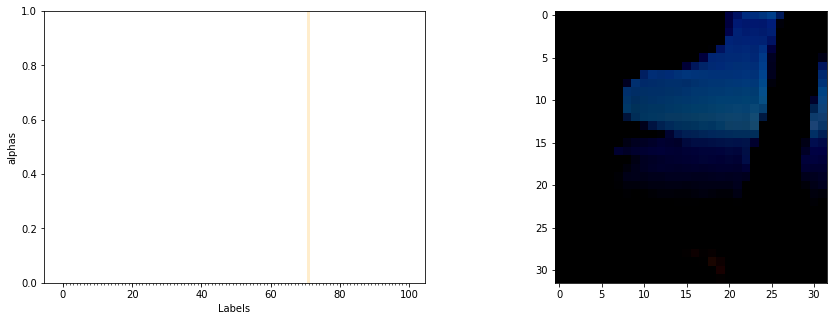

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([53]) tensor([71])
NAN or inf!
out:  tensor([18])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


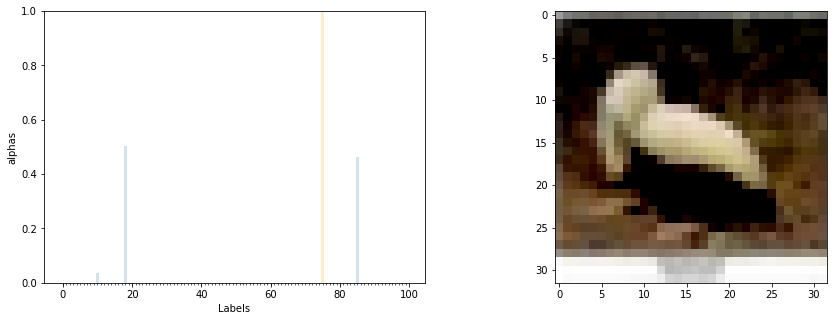

alphas:  tensor([1.2211e+02, 3.9150e+15, 1.5341e+21, 1.0738e+25, 5.7869e+11, 4.1623e+22,
        1.2460e+15, 8.8650e+18, 1.4293e+06, 2.3185e+30, 2.1187e+34, 2.9336e+12,
        1.0409e+10, 5.9617e+13, 2.2640e+17, 3.1191e+13, 1.1880e+17, 3.6488e-02,
        3.0073e+35, 1.9004e+22, 1.4352e+24, 1.2848e-02, 6.7955e+19, 2.7273e+10,
        7.6143e+21, 7.4366e+27, 4.6242e+23, 5.1583e+20, 2.3725e+13, 3.0935e+11,
        1.7648e+18, 3.2353e+01, 5.5951e+29, 7.3644e+10, 8.5835e+25, 4.2531e+19,
        8.5141e+18, 9.2634e+22, 1.4844e+21, 1.4952e+26, 9.5832e+24, 1.8209e+20,
        3.6656e+14, 1.6454e+10, 2.6191e+25, 6.0314e+22, 1.0205e+15, 1.3437e+14,
        4.5075e-02, 1.9417e+10, 8.8863e+23, 3.2824e+19, 2.8264e+02, 1.4084e-02,
        6.6455e+22, 2.6791e+28, 1.9565e+15, 8.1267e+21, 1.2726e+14, 9.7081e+16,
        9.3291e+08, 2.4032e+27, 5.8174e+00, 6.5853e+22, 2.1535e+13, 5.3270e+20,
        6.5159e+15, 1.5931e+32, 2.6814e+00, 4.3800e+22, 2.1004e+14, 1.0875e+00,
        1.9387e+30, 5.0166e+28,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


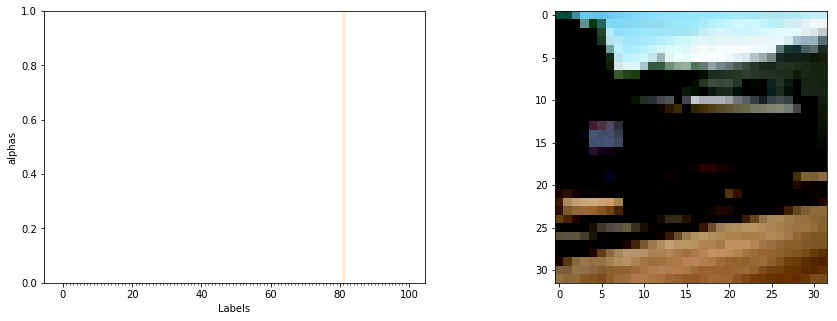

alphas:  tensor([5.7152e+01, 8.5092e+25, 1.3942e+08, 2.2555e+18, 1.7190e+26, 8.3384e+26,
        6.4429e+21, 3.3866e+27, 2.6205e+34, 4.9107e+21, 3.0816e+28, 1.2164e+14,
        1.6062e+30, 1.1889e+36, 3.3402e+25, 4.2742e+16, 1.3390e+35, 4.6230e+14,
               inf, 1.5994e+31, 6.4948e+12, 1.9805e-02, 6.2754e+15, 1.8220e+15,
        3.0173e+22, 3.0011e+29, 1.5032e+30, 1.8603e+19, 8.3374e+20, 1.1049e+21,
        3.1589e+10, 1.1851e+20, 1.5495e+19,        inf, 7.1972e+25, 4.1478e+06,
        2.1252e+02, 4.9560e+33, 8.3012e+24, 1.9233e+25, 4.0030e+16, 2.8525e+29,
        4.0282e+15, 8.0527e+01, 3.9184e+12, 1.1719e+25, 2.8518e+10, 3.9638e+12,
        6.4256e+31, 3.8691e+12, 3.2473e+08, 6.7302e+20, 1.5157e+08, 1.5271e-02,
        8.6732e+03, 1.8598e+16, 1.1554e+10, 8.6797e+18,        inf, 9.7693e+22,
        3.3775e+06, 4.8916e+14, 1.1059e+00, 5.8278e+07, 2.0020e+11, 5.2890e+24,
        2.3972e+03, 4.7649e+18, 4.6161e+16, 1.5169e+23, 7.9457e+04, 5.3161e+26,
        3.1417e+32, 1.9673e+22,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


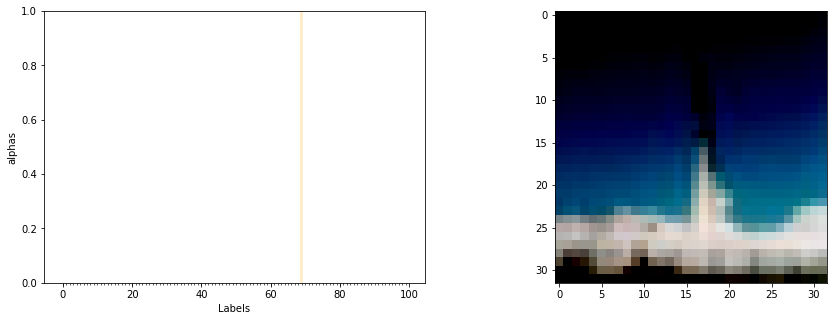

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([99]) tensor([69])
NAN or inf!
out:  tensor([40])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


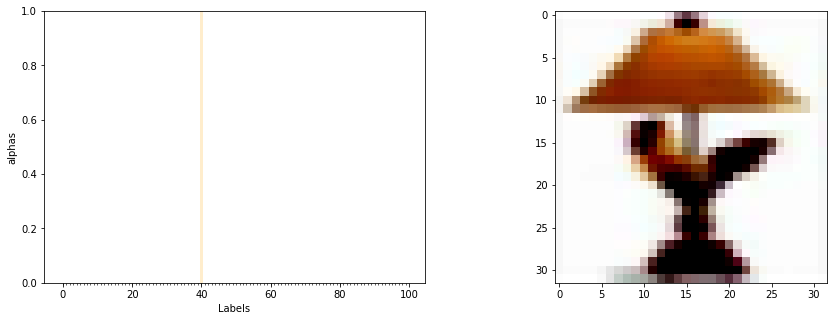

alphas:  tensor([3.3820e+23, 5.8402e+14, 4.3287e+31, 6.4843e+29, 1.1954e+33, 1.9430e+33,
        6.6686e+20, 3.5309e+25, 7.2524e+18,        inf, 5.2022e+34,        inf,
        4.4122e+31, 2.6756e+26, 4.8327e+17,        inf,        inf, 1.6795e+17,
        4.9100e+13, 1.6285e+29,        inf, 3.1089e-02,        inf, 1.3908e+13,
        6.6963e+30,        inf, 7.4212e+27, 1.2200e+21,        inf,        inf,
        2.8173e+19, 2.4629e+11, 4.1692e+35, 1.0053e+21, 2.0151e+17,        inf,
        5.6427e+27, 1.9729e+31, 2.0559e+28, 2.8144e+16,        inf, 2.6731e+07,
               inf, 2.5896e+19, 3.3982e+33,        inf,        inf, 1.4080e+32,
        1.7931e+09, 5.0270e+17, 1.9611e+31,        inf, 2.1587e+10, 7.2288e+07,
        9.2962e+29,        inf, 2.0544e+31, 1.8866e+18, 1.0657e+06, 1.8257e+04,
        8.0145e-02, 3.8572e+33, 1.9398e+30, 6.2665e+28, 2.3216e+18, 1.2532e+25,
        1.7621e+29, 5.5232e+17, 1.6843e-02, 1.0976e+23, 1.0306e+33, 8.7924e+17,
        3.8323e+20, 3.5119e+21,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


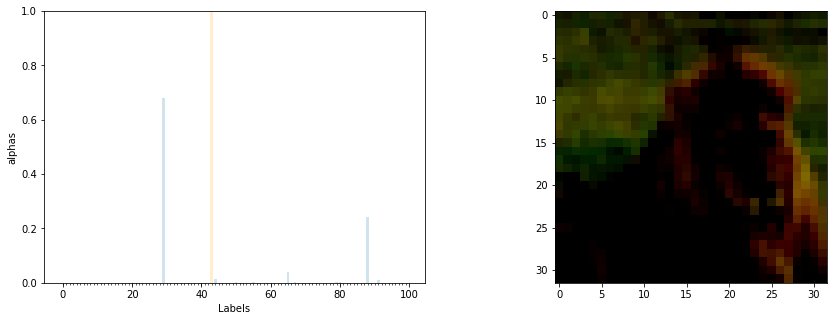

alphas:  tensor([4.4917e+03, 1.1709e+05, 3.3103e+03, 1.6375e+04, 5.2243e+07, 1.5844e+04,
        2.5963e+03, 5.9479e+04, 2.8934e+07, 2.6734e+07, 4.3940e+03, 5.8455e+06,
        4.8630e+04, 3.2640e+07, 4.6138e-01, 7.8727e+03, 4.1938e+05, 7.7242e-01,
        4.2908e+05, 1.2234e+06, 2.6931e-01, 6.6385e+01, 3.8809e+03, 1.6991e-01,
        1.3106e+04, 2.7369e+06, 8.0976e+02, 7.8784e+07, 6.4751e+03, 2.4045e+11,
        1.6118e+03, 1.2930e+03, 4.0873e+06, 3.5541e+02, 1.2214e+07, 2.9105e+06,
        4.4593e+06, 4.4859e+03, 3.9329e+05, 8.3814e-01, 1.1583e+02, 8.6409e-02,
        5.9691e+07, 5.0548e+05, 4.6258e+09, 7.2093e+05, 5.2902e+06, 2.2127e+07,
        6.9913e+04, 5.5788e+03, 5.0271e+08, 1.1169e+08, 2.8721e+04, 7.8467e+01,
        3.3884e+03, 7.0428e+08, 8.2212e+06, 7.3821e+06, 3.1268e+00, 1.1854e+07,
        8.0412e-02, 2.7469e+02, 8.2600e+00, 1.2947e+08, 1.2315e+04, 1.4447e+10,
        3.6304e+03, 1.1299e+09, 6.3521e+01, 1.2425e+03, 9.1219e+01, 9.1179e-02,
        1.3412e+06, 1.8309e+03,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


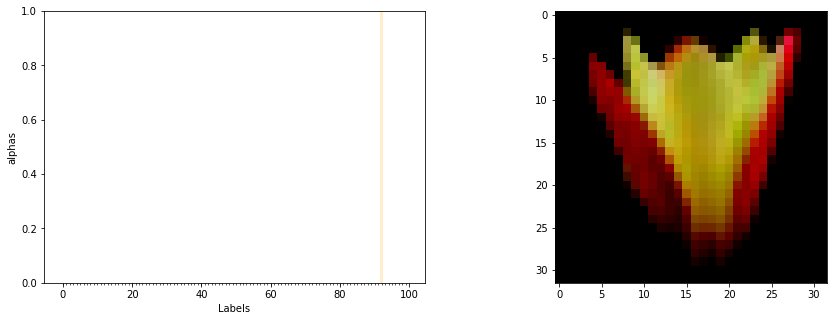

alphas:  tensor([       inf,        inf, 1.6722e+23, 7.1582e+32, 2.2150e+22, 5.2815e+16,
        8.1193e+05, 6.2488e+21, 2.3293e+00, 1.9908e+30, 7.4513e+35, 1.2199e+26,
        9.2233e+15, 5.4192e+04, 7.0904e+26, 2.0141e+22, 2.6473e+31, 1.2782e+28,
               inf, 7.9026e+26, 2.4161e+14, 9.1065e-03, 4.1091e+25, 1.3092e+28,
        8.3549e+19,        inf, 4.7953e+23, 1.6457e+07, 3.6298e+30, 3.5368e+16,
        2.0823e+17, 1.2759e+16, 2.4878e+30, 3.9393e+31, 3.3317e+27, 4.0546e+15,
        5.4479e+29, 6.9769e+14, 4.6229e+07, 3.6357e+06, 2.8877e+19, 7.3723e+20,
        7.8527e+16, 1.0649e+19, 1.1036e+20, 1.9420e+24, 4.1330e+19, 1.6916e+10,
        6.3453e+10, 1.2120e+13, 5.9430e+32, 7.6176e+31, 1.7138e-02,        inf,
        4.8774e+29, 1.1295e+28, 2.0257e+07,        inf, 2.6331e+03, 5.6608e+16,
        2.4060e+11, 3.2711e+26, 4.2103e+35, 5.6816e+14, 1.2416e+12, 1.9016e+25,
        7.4867e+04,        inf, 8.7319e+13, 1.1964e+12,        inf, 3.0923e+26,
        1.8900e+31, 4.3282e+12,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


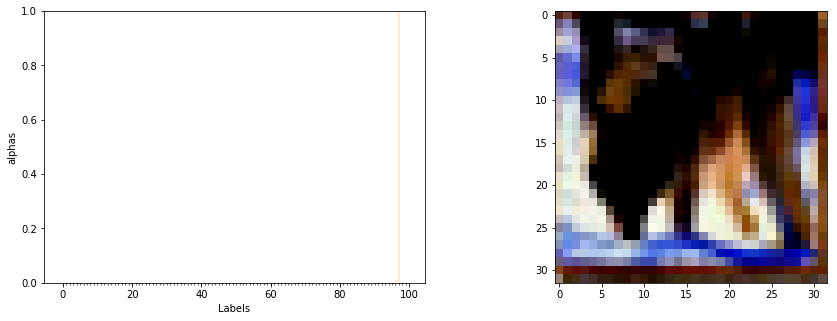

alphas:  tensor([2.8846e+22, 2.0751e+24,        inf, 1.1252e+26, 8.3501e+25, 2.8712e+13,
        1.4680e+27, 2.2083e+31, 8.1802e+23, 9.4861e+16, 4.1769e+28,        inf,
        3.5766e+16, 6.5022e+22, 7.6776e+22, 4.6746e+16, 5.0046e+31, 5.4871e+10,
        8.4867e+24, 5.1376e+16, 4.4088e+22, 8.2734e+26, 1.3078e+25, 9.2409e+21,
        1.0934e+25, 1.5586e+21, 8.7571e+31, 3.8285e+29, 3.9068e+17, 4.7920e+35,
        4.9646e+26, 1.3949e+23, 9.5903e+22, 8.6205e+27, 8.8374e+31, 2.0378e+29,
               inf, 5.3848e+35,        inf, 2.2668e+27, 7.3788e+16, 1.3902e+13,
        2.8517e+30, 3.7346e+33, 5.0121e+27, 6.0630e+23, 6.0623e+22, 3.7913e+06,
        3.9705e+07, 1.5011e+24, 1.1190e+34, 6.4088e+34, 8.7378e+02, 1.2654e+01,
        1.2156e+10, 1.2406e+33, 6.0817e+20, 7.6207e+25, 2.3403e+17, 8.7387e+22,
        1.4757e-02, 9.4229e+21, 8.7986e+14, 1.6235e+30, 2.1623e+31, 1.1825e+28,
               inf,        inf, 1.6140e+03, 6.4139e+24, 6.8571e+17, 1.6254e-01,
               inf, 8.4557e+24,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


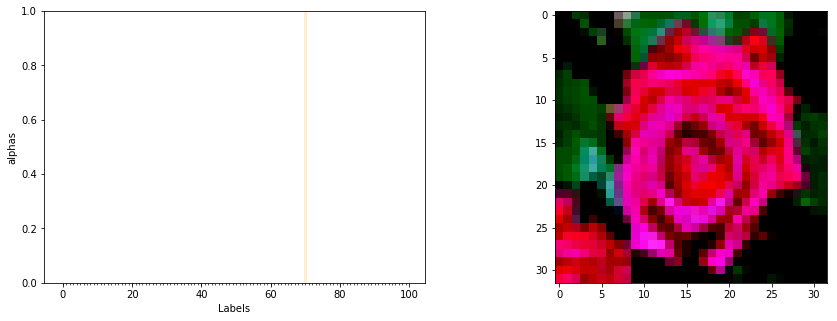

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        nan, inf, inf, inf, inf, inf, nan, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, nan, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan, inf, nan, inf, inf, inf,
        inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, nan, inf, inf, inf, inf, inf, inf, nan,
        inf, nan, inf, inf])
compare pred, true:  tensor([24]) tensor([70])
NAN or inf!
out:  tensor([70])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


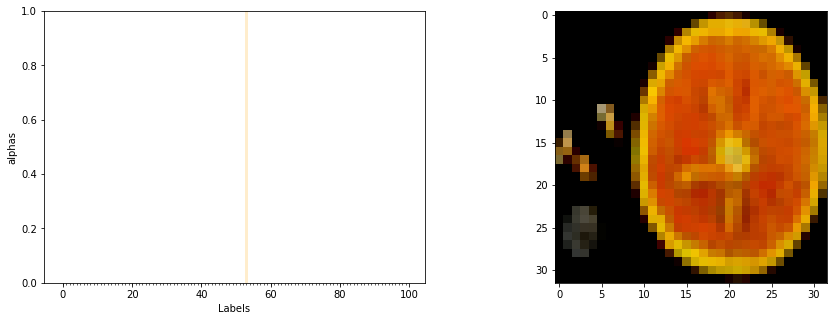

alphas:  tensor([2.7133e+32, 8.6294e+34, 1.2985e+29, 9.3240e+27, 5.4563e+21, 3.7989e+24,
        3.3402e+26, 4.8712e+32, 3.8019e+14, 1.2997e+33, 2.4509e+35, 1.5992e+23,
        1.8621e+19, 2.4662e+21, 1.6786e+32, 9.7977e+11, 2.4030e+30, 1.2113e+22,
        8.6166e+27, 9.7708e+26, 3.7912e+25, 2.4000e+10, 5.5289e+20, 1.3315e+26,
        6.8298e+28, 4.3569e+18, 3.4118e+35, 2.7465e+10, 2.9206e+24, 9.2872e+20,
        5.7730e+05, 3.0064e+14, 7.4974e+27, 4.5319e+31, 3.4361e+18, 1.6000e+28,
        1.2911e+28, 4.7068e+19, 8.9530e+21, 2.7981e+21, 2.9708e+29, 4.9752e+26,
        1.1152e+26, 2.6620e+23, 8.4747e+26, 3.4086e+29, 1.0874e+23, 3.1173e+18,
        7.8711e+16, 5.9988e+16, 6.9507e+26,        inf, 1.5867e+00,        inf,
        1.2963e+32, 7.8780e+19, 2.6180e+11,        inf, 4.7651e+09, 3.1459e+13,
        4.5472e+17, 6.7783e+30,        inf, 6.7010e+17, 5.9330e+16, 8.1289e+17,
        1.7522e+00, 1.5300e+30, 1.2641e+09, 4.6023e+07,        inf, 5.7892e+23,
        7.3833e+23, 6.4241e+22,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


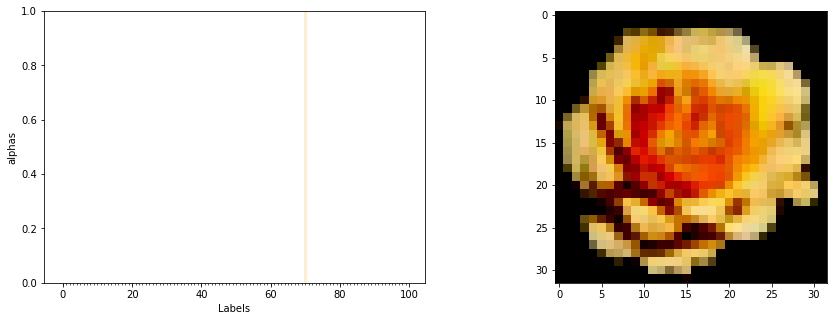

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, inf,
        inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan,
        inf, inf, inf, inf])
compare pred, true:  tensor([68]) tensor([70])
NAN or inf!
out:  tensor([49])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


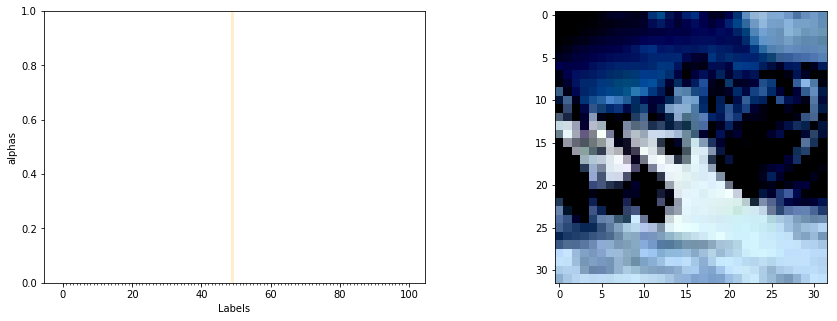

alphas:  tensor([nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([0]) tensor([49])
NAN or inf!
out:  tensor([48])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


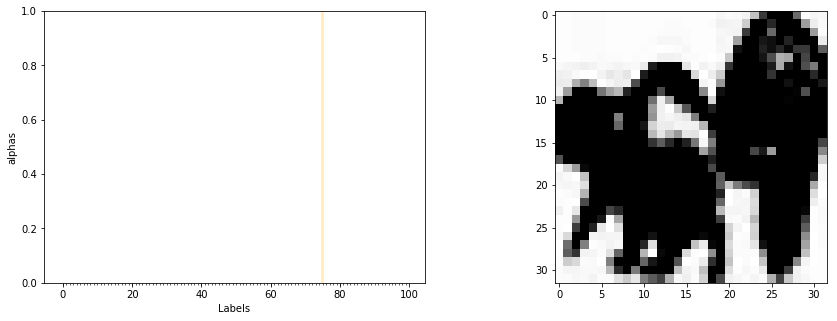

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([60]) tensor([75])
NAN or inf!
out:  tensor([96])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


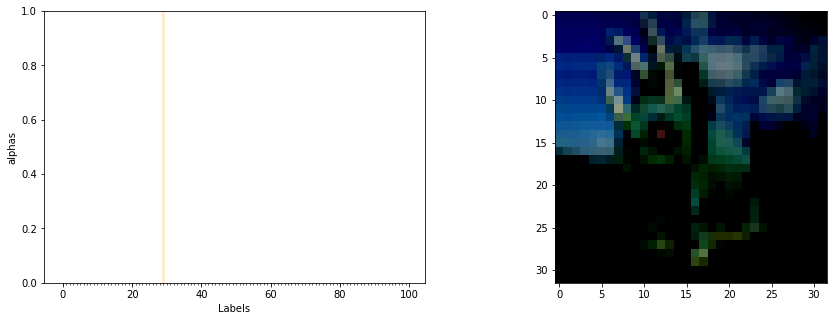

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([53]) tensor([29])
NAN or inf!
out:  tensor([46])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100])


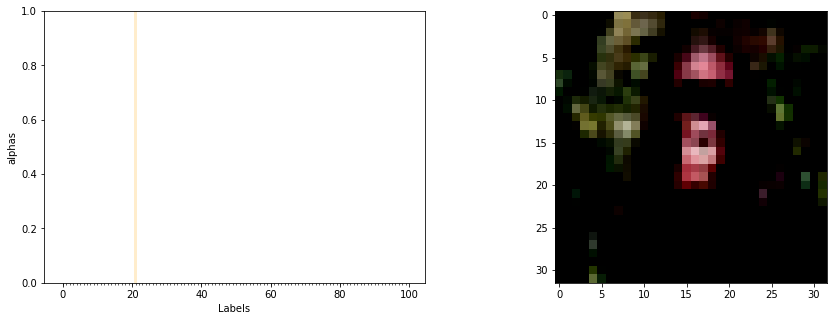

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([52]) tensor([21])
NAN or inf!
out:  tensor([13])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


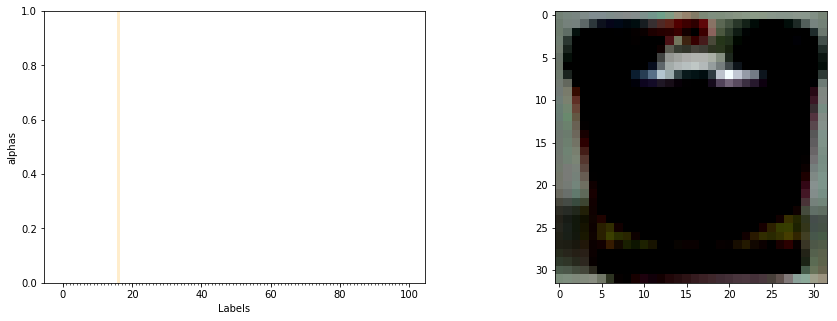

alphas:  tensor([       inf, 2.7126e+28, 1.0381e+20, 7.1400e+19, 5.4030e+19, 6.4711e+33,
        6.9971e+20, 8.0260e+35, 1.1266e+14, 8.8526e+23,        inf, 5.1532e+31,
        1.8821e+24,        inf, 6.3036e+26, 2.2223e+22,        inf, 6.4031e+26,
        2.8894e+29, 3.6380e+29, 1.0950e+31, 7.9418e+20,        inf, 2.2075e+08,
        1.0312e+23,        inf, 1.3092e+33, 1.1889e+27,        inf, 5.0274e+16,
        3.5224e+04, 1.2417e+22, 2.2826e+29, 6.9580e+28, 1.3734e+17, 8.6727e+21,
        8.0928e+15,        inf, 1.4804e+23, 1.6550e+18, 2.6543e+31, 2.1322e+34,
        1.7790e+11, 4.5785e+15, 1.1937e+25, 1.6863e+30, 1.5344e+29, 2.0287e+18,
        5.3729e+24, 6.9116e+10, 9.8467e+06, 5.5374e+23, 1.5158e+03, 2.0905e+13,
        7.8390e+22, 4.6435e+21, 2.4454e-02, 2.5525e+17, 8.3247e+30, 1.8271e+10,
        1.6700e+08, 2.5575e+28, 1.3557e+24, 1.5706e+01, 9.4009e+04, 1.2213e+28,
        7.7851e+07, 6.6928e+24, 1.0689e+18, 1.0806e+15, 3.8776e+29, 1.5647e+13,
        1.2216e+18, 1.7509e+17,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


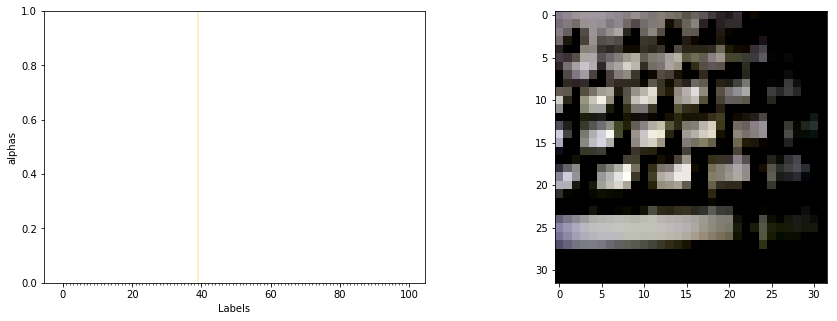

alphas:  tensor([1.3910e-02, 1.9421e+26, 2.7906e+31, 1.0887e+19, 2.2718e+19, 6.6845e+31,
        3.3964e+15, 7.3037e+14,        inf, 6.0908e+32, 2.6883e+29, 2.1127e+17,
               inf, 9.5246e+35, 1.3533e+27, 3.0334e+05, 5.0413e+35, 1.7616e+16,
        2.6205e+21, 2.9434e+25,        inf, 6.9660e+09, 1.3492e+32, 1.8779e+21,
        4.9249e+07, 4.1529e+25, 1.1240e+28, 2.9864e+16, 2.3260e+06, 6.6890e+32,
        4.5059e+26, 5.0992e+11, 1.7162e+28,        inf, 2.6050e+20, 1.4596e+34,
        3.5828e+27,        inf,        inf,        inf, 2.6962e+24, 6.6176e+29,
        2.2449e+35, 6.4766e+10, 4.0920e+24, 1.2324e+13, 2.3649e+29, 4.2972e+23,
        6.7542e+31,        inf, 1.6643e+19,        inf, 1.0069e+00, 1.6315e-02,
        1.2887e+30, 6.3818e+31, 3.3319e+25, 3.5083e+21, 1.5624e+29,        inf,
        9.3206e+13, 3.3332e+25, 8.5198e+24, 1.4232e+21, 4.1999e+24, 1.4225e+22,
        6.0634e+23, 1.2624e+24, 1.5976e-02, 1.8823e+16, 2.0886e+29, 9.7708e+24,
        1.6897e+29, 4.4729e+20,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


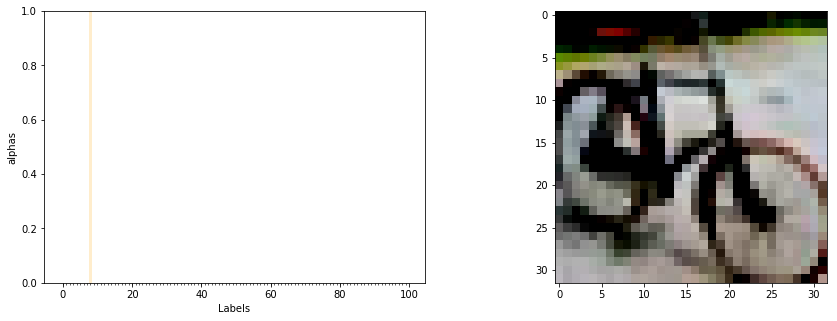

alphas:  tensor([6.8466e+15, 6.4582e+24, 4.4764e+30, 5.3279e+29, 9.0477e+21, 5.4704e+14,
        4.7050e+27, 4.4234e+31,        inf, 1.1286e+31, 4.0138e+32, 7.0552e+27,
        7.3506e+20, 5.0667e+25, 2.3814e+21,        inf, 6.0871e+29, 2.9818e+11,
        3.8200e+30,        inf, 2.3341e+21, 2.8845e+04, 1.4972e+31, 6.3624e+13,
        4.6795e+26, 7.4788e+22,        inf, 2.6403e+34, 1.6021e+12,        inf,
        6.0506e+18, 8.6933e+25, 1.6144e+26, 4.9432e+31, 6.4222e+35, 2.0380e+23,
        3.8923e+25, 1.3121e+32, 1.1111e+36, 1.5118e+30, 1.8405e+25, 9.8397e+31,
               inf, 8.9840e+13,        inf,        inf, 1.0187e+27, 2.0421e+30,
               inf, 4.1247e+20, 4.9014e+30, 2.4290e+34, 1.2295e-02, 2.3645e+14,
               inf,        inf,        inf, 1.3813e+32, 2.5176e+17, 4.7304e+24,
        7.7705e+20,        inf, 9.4932e+15, 2.4012e+27, 1.3126e+29, 2.3682e+33,
               inf, 1.6394e+32, 6.7320e+02, 2.5826e+20, 1.2777e+35, 1.8983e+07,
               inf, 7.2121e+26,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


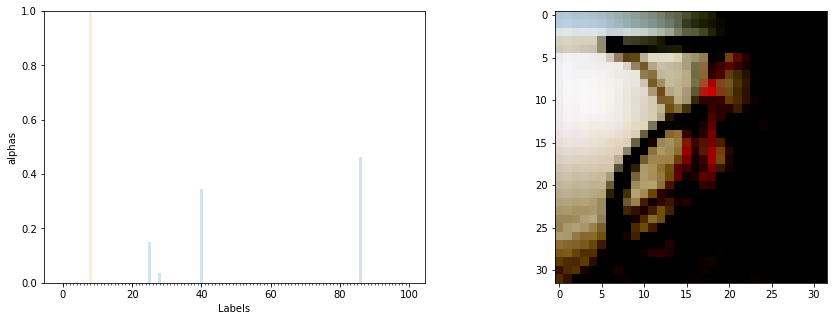

alphas:  tensor([7.6723e+04, 8.7151e+14, 1.8185e+19, 1.5320e+17, 1.4701e+22, 3.9473e+16,
        2.0627e+12, 4.5762e+12, 1.4989e+16, 1.1938e+10, 1.3931e+12, 4.8529e+18,
        1.4448e+20, 5.9867e+12, 2.7488e+14, 2.6861e+20, 2.8103e+15, 7.7321e+13,
        2.4488e+15, 9.9244e+17, 7.0799e+11, 7.6153e+15, 6.7078e+16, 1.3804e+09,
        9.5542e+19, 5.0270e+23, 1.2122e+17, 2.8001e+20, 1.1716e+23, 7.4422e+17,
        1.9428e+14, 1.7569e+18, 1.3130e+21, 1.1278e+16, 7.8136e+13, 3.6580e+21,
        2.0666e+13, 7.5814e+17, 2.6394e+11, 1.6809e+20, 1.1592e+24, 9.1322e+18,
        2.1296e+18, 1.4390e+13, 9.2771e+12, 4.8797e+16, 2.7228e+20, 1.5054e+07,
        2.3523e+10, 3.6035e+07, 9.0854e+11, 1.5578e+13, 3.0094e-02, 1.4258e+01,
        1.7297e+07, 4.8995e+19, 7.9278e+10, 1.8375e+09, 5.5258e+05, 7.0571e+07,
        2.1968e-02, 8.2912e+10, 2.4176e+09, 6.9950e+13, 3.6177e+09, 4.4797e+18,
        4.9652e+12, 5.1865e+12, 8.1250e+03, 2.2623e+15, 3.8435e+18, 8.5920e+04,
        5.2565e+19, 6.1332e+15,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


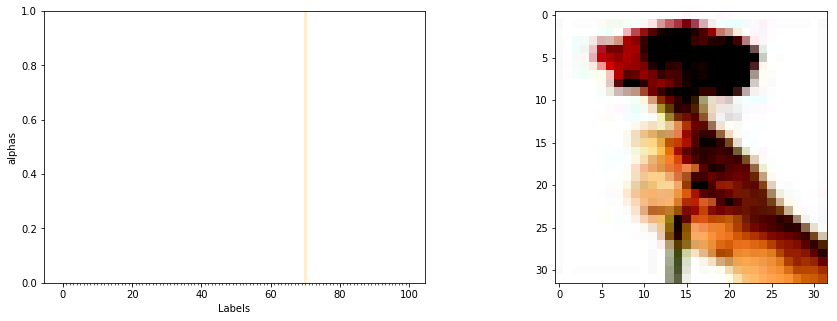

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, nan, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([52]) tensor([70])
NAN or inf!
out:  tensor([20])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


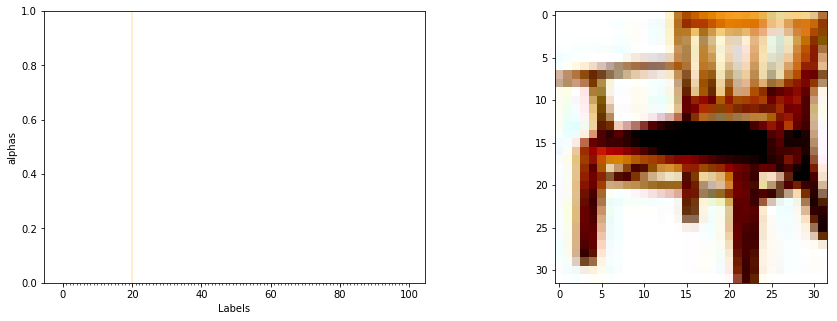

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, nan, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, nan,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([49]) tensor([20])
NAN or inf!
out:  tensor([10])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


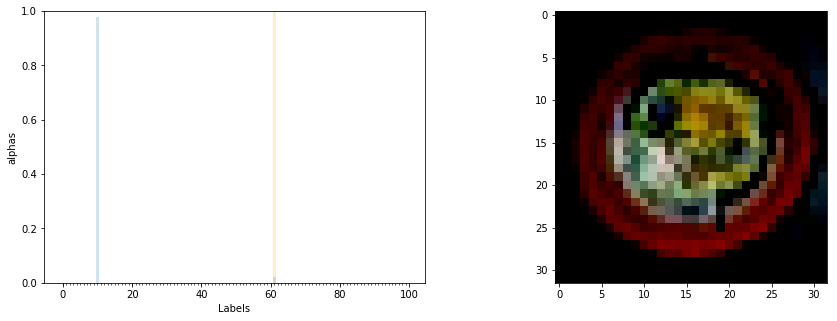

alphas:  tensor([4.6032e+13, 1.4817e+24, 1.7509e+15, 3.9486e+20, 5.1223e+13, 1.0092e+22,
        7.9819e+05, 5.4528e+21, 1.9931e+00, 2.7415e+10, 4.4509e+35, 1.9633e+14,
        4.4005e+19, 9.0737e+21, 2.3595e+16, 4.0440e+12, 3.5613e+26, 5.5373e-02,
        2.2133e+12, 1.3350e+09, 5.8188e+08, 2.4152e+04, 2.0894e+29, 1.5924e+10,
        2.0800e+07, 2.4182e+21, 1.5371e+27, 1.9409e+10, 1.5346e+14, 2.0436e+11,
        1.2973e+05, 2.8330e+03, 1.5982e+24, 4.1175e+13, 6.6859e+05, 6.8037e+20,
        1.9617e+15, 5.2216e+11, 2.3019e+09, 1.6972e+14, 5.0307e+18, 3.4103e+14,
        5.7677e+04, 3.8355e+07, 1.3329e+17, 8.5934e+18, 7.6715e+17, 6.5141e+03,
        2.5673e+10, 2.8624e+06, 2.0635e+21, 2.5540e+08, 1.8668e-02, 1.7087e+12,
        1.6030e+08, 2.8911e+15, 1.0077e+10, 8.0812e+15, 5.5882e+17, 3.3253e+03,
        1.4702e+07, 1.0386e+34, 5.7307e+20, 9.6590e+12, 3.0179e+21, 1.3095e+12,
        2.2171e+08, 1.2626e+20, 3.4890e-02, 3.2053e+02, 1.1379e+18, 1.7767e+10,
        4.0897e+05, 4.5669e+13,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100])


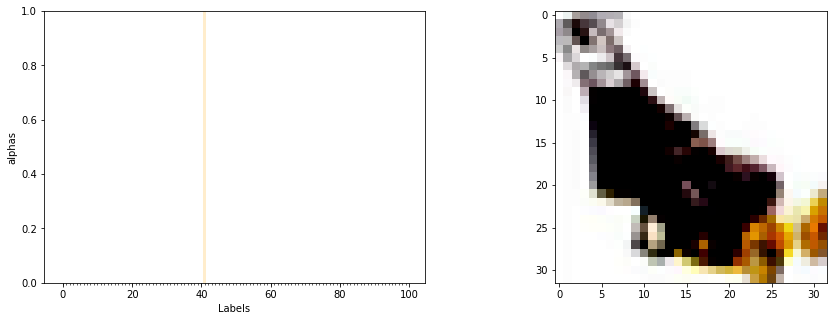

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([99]) tensor([41])
NAN or inf!
out:  tensor([67])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


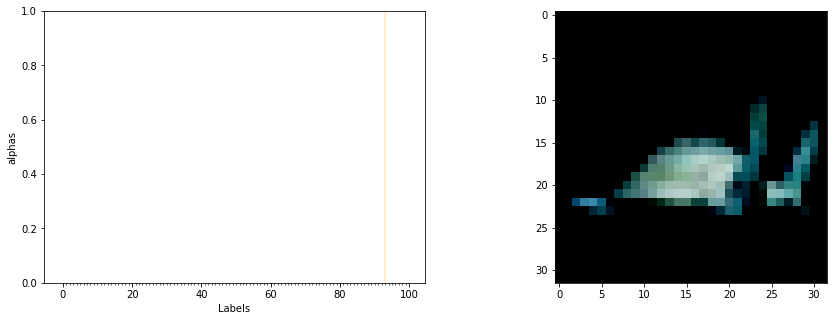

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([99]) tensor([93])
NAN or inf!
out:  tensor([56])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


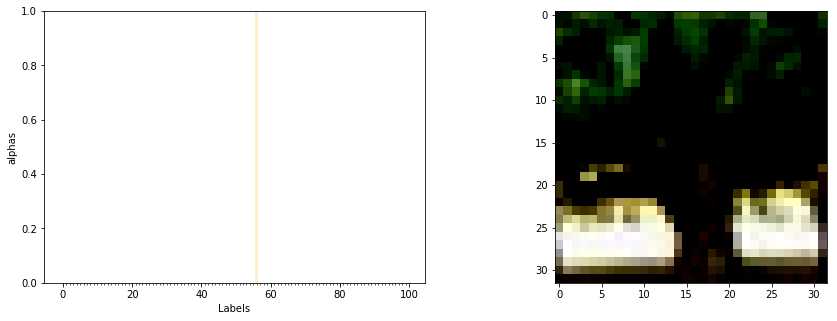

alphas:  tensor([4.0068e+14, 7.5773e+13, 1.0106e+12, 1.3879e+21, 7.7567e+20, 2.7852e+17,
        5.8730e+26, 8.2792e+22, 3.3934e+25, 5.0437e+33, 2.7164e+18, 3.7298e+16,
        3.3324e+32, 2.6879e+25, 1.1607e+27, 8.2429e+20, 3.6200e+22, 8.8689e-02,
        5.2552e+22, 9.1024e+20, 2.8673e+13, 2.7351e+17, 7.0272e+03, 2.4861e+15,
        7.1548e+01, 3.2356e+20, 8.3927e+15, 4.2394e+22, 3.3470e+11, 5.2056e+32,
        1.6381e+15, 5.4066e+21, 3.1000e+24, 7.9732e+28, 2.0667e+32, 4.3769e+20,
        7.4705e+19, 1.5628e+21, 8.2090e+18, 5.1867e+16, 4.1929e+19, 1.8546e+23,
        1.9626e+24, 9.5719e+10, 1.0859e+26, 1.2842e+29, 1.9754e+23, 1.1028e+31,
        9.7950e+08, 1.1933e+01, 4.7667e+25,        inf, 4.5035e+28, 3.4199e+00,
        3.2463e+16, 1.2962e+26,        inf, 7.7248e+29, 6.3885e+08, 1.3209e+30,
        3.6882e+01, 3.4733e+18, 7.4017e-03, 8.6109e+27, 5.9000e+25, 7.0883e+33,
        7.1320e+29, 6.9440e+26, 4.0186e+07, 2.0869e+25, 3.4861e+29, 1.7117e-02,
        4.8652e+19, 1.0260e+18,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100])


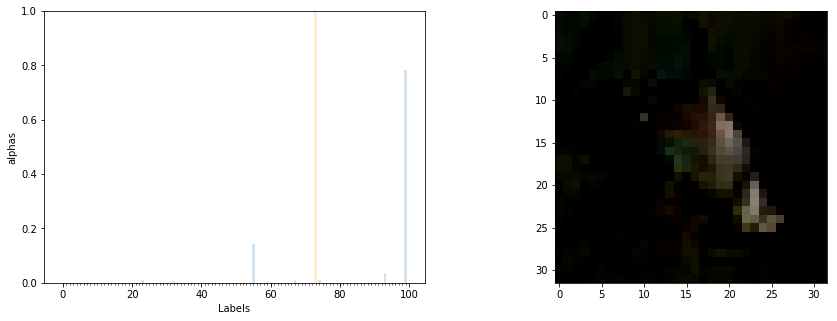

alphas:  tensor([5.1684e+07, 3.7591e+15, 1.6372e+26, 8.3615e+18, 8.9270e+20, 1.6176e+25,
        1.6381e+14, 5.9324e+22, 2.0271e+21, 1.0338e+23, 1.5383e+20, 3.3722e+21,
        8.4071e+22, 5.3551e+20, 7.2388e+15, 8.0622e+17, 2.4709e+21, 3.9246e+20,
        1.7141e+25, 2.8415e+16, 4.3250e+19, 9.7072e+13, 5.8744e+23, 6.1739e+28,
        2.4960e+22, 3.2704e+27, 7.5916e+25, 5.7681e+27, 1.6962e+18, 7.4106e+17,
        8.9650e+26, 3.8106e+21, 4.1253e+28, 1.0694e+28, 1.6271e+19, 2.0617e+23,
        8.8279e+17, 6.6034e+20, 2.4237e+23, 6.8467e+24, 1.0933e+17, 1.5221e+20,
        2.6979e+20, 4.8354e+22, 1.0586e+23, 4.3666e+19, 8.8542e+19, 2.2565e+12,
        3.0906e+14, 1.3643e+16, 1.9934e+26, 4.6043e+24, 1.1556e+11, 1.0069e-01,
        1.7083e+14, 1.0325e+30, 7.5749e+23, 6.0456e+19, 9.0746e+09, 9.4093e+27,
        9.8649e+11, 2.6984e+26, 6.4938e+07, 2.4394e+20, 1.8516e+20, 1.2357e+23,
        9.0158e+16, 6.1736e+28, 1.5317e+18, 8.4529e+19, 6.4933e+19, 2.9511e+11,
        5.5539e+25, 6.4786e+21,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


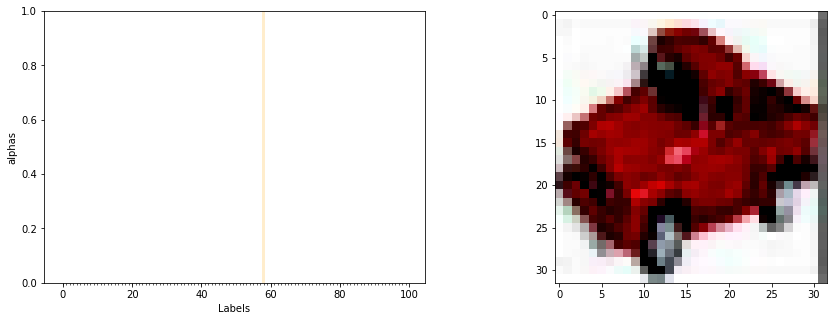

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([68]) tensor([58])
NAN or inf!
out:  tensor([35])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


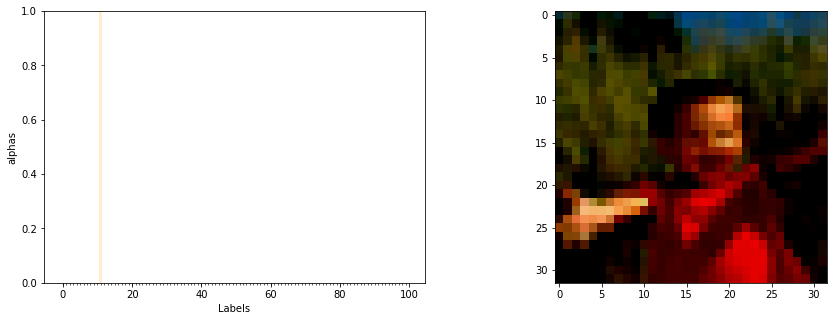

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([52]) tensor([11])
NAN or inf!
out:  tensor([5])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


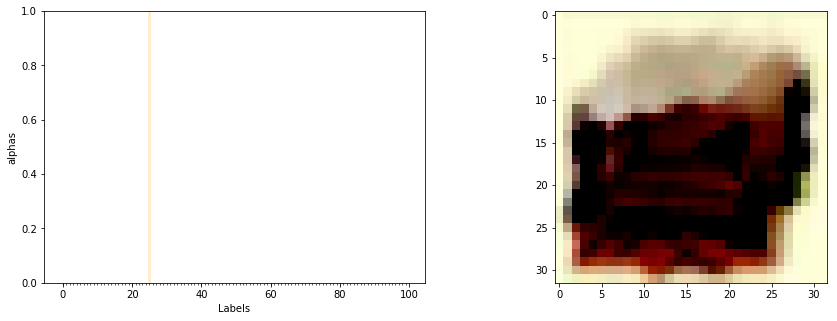

alphas:  tensor([4.5475e+24, 4.3541e+28,        inf, 2.5742e+27, 5.3859e+32,        inf,
        9.1236e+30, 8.2039e+31, 1.7001e+18,        inf,        inf,        inf,
        1.0465e+35, 1.6391e+31,        inf, 6.2046e+29,        inf, 9.6086e+23,
               inf, 1.1204e+36,        inf, 7.7114e+16,        inf, 1.3162e+11,
               inf,        inf,        inf, 8.6931e+30, 1.1474e+31, 6.7518e+28,
        5.2004e+17, 1.3648e+18, 1.7129e+29, 1.1337e+29, 1.2925e+25, 1.3381e+35,
        4.3644e+18,        inf, 9.0031e+31, 4.9461e+30, 6.3870e+23,        inf,
        8.4694e+15, 6.0277e+18,        inf,        inf, 5.4637e+32, 1.4786e+19,
        5.0720e+18, 2.4742e+09, 1.3373e+32, 1.4681e+29, 8.6165e+06, 3.7201e+15,
        9.0603e+16, 4.7129e+34, 1.9631e-02, 1.0731e+28, 1.0319e+35, 8.8513e+16,
        4.9223e+10,        inf, 4.9048e+31, 1.2310e+30, 6.1851e+26,        inf,
        1.6685e+31, 2.6817e+31, 2.6937e+03, 2.0071e+11, 7.7828e+32, 2.9104e+06,
        6.6646e+32, 1.3037e+23,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


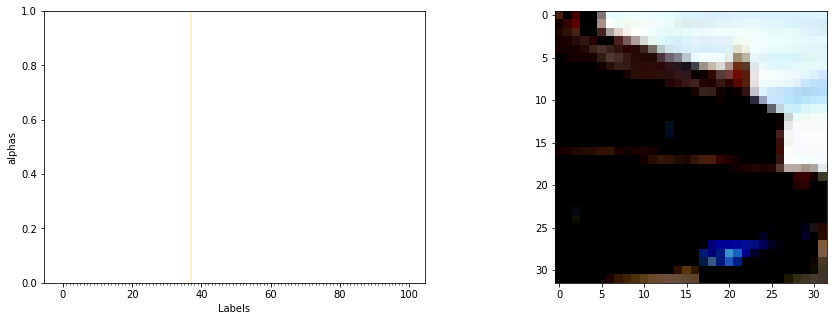

alphas:  tensor([1.3017e+12, 7.0731e+21, 6.9369e+15, 8.4658e+24, 3.0124e+33, 1.0278e+30,
        1.2195e+04, 2.4858e+23,        inf, 1.2480e+27, 2.7144e+20, 4.1211e+31,
        1.7775e+29,        inf, 9.3183e+07, 1.5306e+24, 3.5513e+23,        inf,
        3.9933e+20,        inf, 5.0707e+25, 1.1015e+23, 1.6728e+31, 5.9465e+18,
        4.2359e+07,        inf, 2.9738e+15, 3.0124e+16, 6.0752e+03, 2.5006e+25,
        1.1013e+17, 7.7661e+30, 2.1829e+20, 1.3516e+34, 3.9436e+35, 4.4017e+21,
        1.1648e+18,        inf, 4.7100e+20, 2.6356e+24, 5.3444e+15,        inf,
        9.8795e+26, 2.2332e+10, 1.9651e+08, 2.6352e+20, 1.6602e+17, 5.7949e+29,
        1.1200e+32, 5.6517e+23, 1.3298e+21, 2.2874e+27, 5.4970e+19, 1.9599e-02,
        8.5061e+15, 1.2020e+17, 2.6186e+24, 7.0458e+21, 7.3769e+33, 7.4680e+31,
        1.0950e+23, 1.3659e-01, 1.3949e+12, 2.3931e+09, 1.8405e+17, 8.3293e+27,
        1.9896e+18, 4.6523e+11, 1.1430e+18, 1.0651e+17, 3.0291e+16, 8.0840e+17,
        7.9878e+20, 2.1973e+08,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


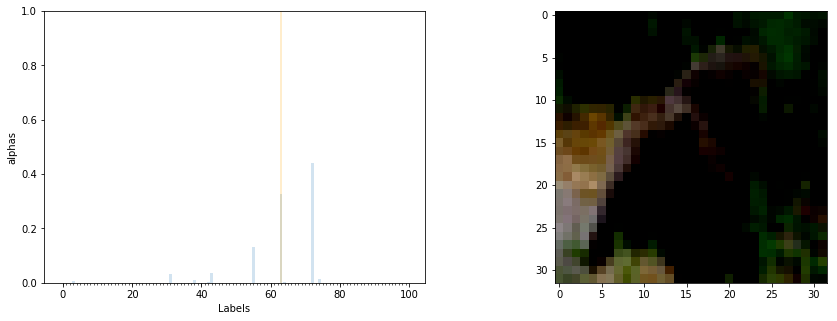

alphas:  tensor([3.7879e+04, 3.8649e+13, 3.4814e+08, 5.5941e+19, 6.9419e+17, 4.9753e+08,
        4.8279e+13, 2.5910e+12, 1.6290e+09, 2.4645e+05, 7.2009e+05, 2.5325e+09,
        5.5010e+09, 1.3772e+07, 6.5327e+08, 1.6733e+16, 7.6714e+07, 6.3536e+12,
        4.7508e+13, 7.3900e+16, 2.4127e+05, 1.4840e+14, 2.2482e+10, 4.7965e+11,
        3.5833e+11, 3.6551e+11, 7.1326e+13, 1.6956e+15, 6.3572e+10, 4.5373e+16,
        1.6112e+13, 3.5723e+20, 2.4393e+15, 5.3881e+08, 4.5812e+13, 3.5376e+08,
        3.6956e+15, 2.5785e+16, 1.2452e+20, 4.4761e+15, 2.8109e+08, 4.9558e+09,
        1.4655e+19, 4.0403e+20, 2.2892e+15, 1.4695e+13, 2.5498e+13, 1.2918e-01,
        3.6862e+10, 2.3790e+07, 6.8838e+14, 2.2339e+07, 2.3603e-02, 7.0744e-02,
        1.3568e+08, 1.4495e+21, 8.9196e+07, 8.6683e+05, 3.6857e+01, 6.8934e+09,
        1.3953e-01, 2.0900e+05, 8.0165e+01, 3.6019e+21, 3.0367e+19, 6.7080e+14,
        9.1654e+18, 1.3112e+16, 2.4296e+02, 8.6310e+04, 2.0557e+06, 9.7559e+01,
        4.8540e+21, 2.2191e+12,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


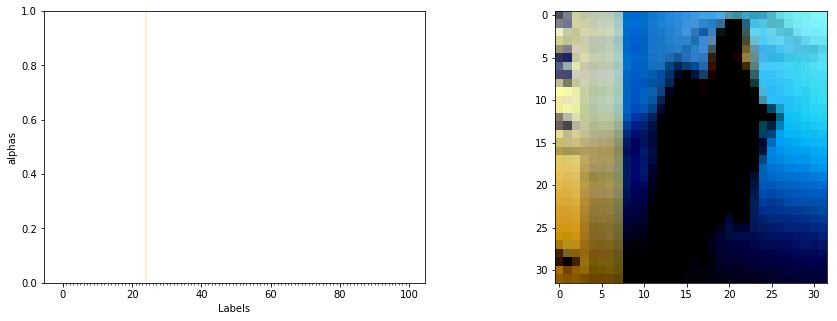

alphas:  tensor([5.5735e+17, 8.6570e+11, 4.5343e+22,        inf,        inf, 2.1256e+12,
        7.1745e+27, 1.1185e+31, 2.2569e+25,        inf, 7.5937e+29, 8.5139e+32,
               inf, 2.6344e+18, 5.3112e+28, 3.5958e+26,        inf, 5.6638e+21,
               inf, 7.2243e+30, 2.6970e+10, 2.6673e+22, 5.5739e+28, 3.4816e+23,
               inf, 7.8516e+20, 1.3925e+17, 1.1045e+26, 3.8792e+31, 1.5848e+23,
        6.3502e+34, 1.1414e+34, 7.6822e+31, 1.2131e+22, 2.0633e+30, 4.7406e+30,
        1.0319e+18, 2.0357e+22, 6.4632e+32, 3.5637e+10, 8.6384e+22, 1.1266e+08,
        2.6276e+31, 3.9929e+17, 2.5074e+34, 1.2116e+31, 8.0219e+31, 2.4828e+10,
        3.7486e+14, 5.4209e+22,        inf, 1.8114e+11, 5.6676e+09, 1.5040e-02,
        1.1037e+06,        inf, 2.3852e+32, 3.0432e+24, 1.1366e+01, 3.0488e+26,
        2.4212e-02, 7.1567e+11, 1.3717e+18, 9.8346e+26, 4.7525e+25, 3.5628e+34,
        2.8897e+20, 1.8190e+24, 5.8913e+25, 4.1395e+31, 2.9088e+21, 2.3171e+13,
               inf, 1.4445e+35,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


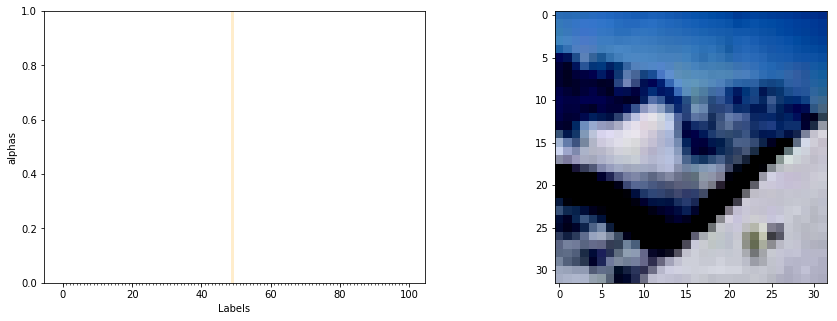

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([99]) tensor([49])
NAN or inf!
out:  tensor([30])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


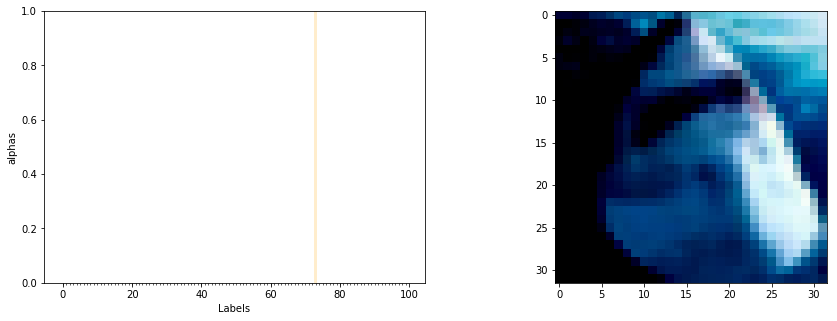

alphas:  tensor([7.7896e+04, 6.3853e+25, 1.5233e+14, 1.3497e+19, 1.9319e+29,        inf,
        2.7832e+02, 5.5050e+18, 1.3363e+14, 9.0262e+18,        inf, 9.0897e+30,
        6.2813e+35, 1.5400e+21, 4.8647e+23,        inf, 3.4873e+33, 6.7222e+23,
        7.9917e+32, 5.4496e+24, 4.7207e+17, 8.7739e+21, 1.2911e+32,        inf,
        1.5186e+21, 1.9853e+14, 1.5486e+32, 5.6138e+27,        inf, 3.2330e+28,
               inf, 1.6131e+22,        inf,        inf, 2.5732e+31, 8.4545e+27,
        1.1295e+19, 1.8175e+28, 3.6731e+24, 2.6896e+33,        inf, 4.2056e-02,
        2.1017e+24, 7.5229e+07, 2.3074e+32, 1.8911e+34, 3.6628e+17, 1.1565e+16,
        3.7045e+03,        inf, 1.8037e+25, 1.2316e+22, 1.0793e+19, 1.6247e-02,
               inf,        inf, 1.2149e+27, 4.1334e+31, 9.5317e+06,        inf,
        1.1408e+32, 8.3446e+25, 1.4527e+15, 1.0366e+30, 2.5642e+29, 7.1234e+34,
               inf,        inf, 1.6979e+28,        inf, 2.2127e+15, 9.2336e+29,
        9.0041e+33,        inf,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


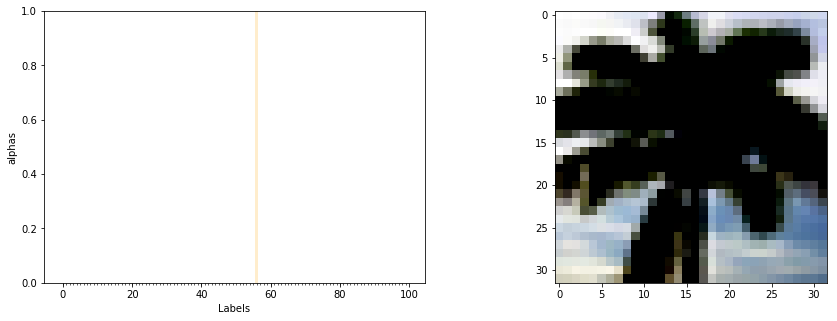

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([99]) tensor([56])
NAN or inf!
out:  tensor([22])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


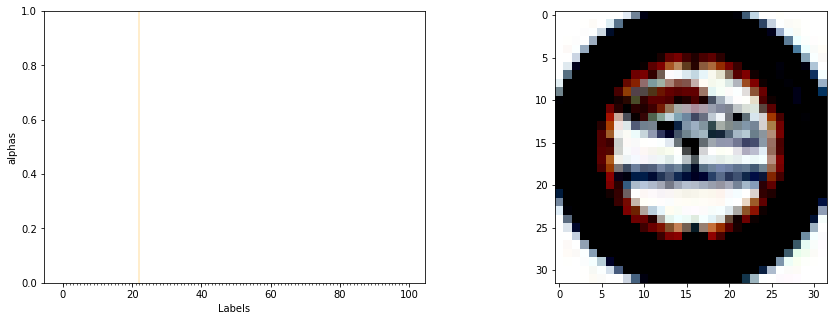

alphas:  tensor([inf, inf, inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan,
        inf, inf, inf, inf, nan, inf, inf, inf, nan, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, inf,
        inf, inf, inf, nan, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        nan, inf, inf, inf])
compare pred, true:  tensor([6]) tensor([22])
NAN or inf!
out:  tensor([92])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


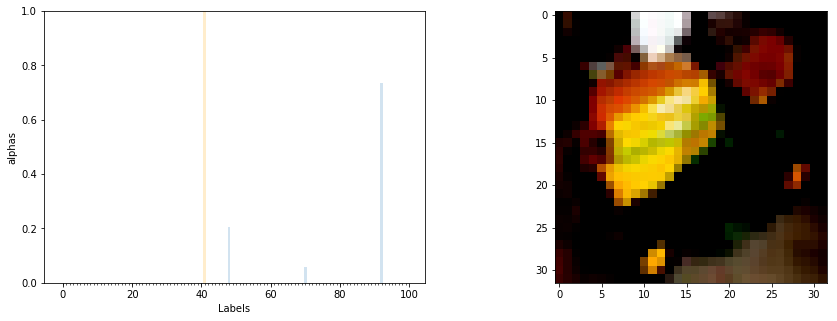

alphas:  tensor([6.9231e+12, 7.2471e+15, 6.6612e+16, 2.4407e+14, 1.4043e+04, 6.9331e+13,
        8.5013e+12, 4.7847e+17, 5.8724e+11, 4.9269e+13, 7.7265e+15, 1.0835e+11,
        1.3153e+09, 8.8253e+15, 4.5402e+17, 5.4171e+10, 6.8155e+14, 5.5753e+08,
        1.6169e+14, 8.9262e+09, 2.5982e+05, 3.4026e+03, 4.5067e+06, 4.6982e+04,
        2.2262e+15, 7.4048e+17, 4.7855e+13, 2.5822e+10, 8.2930e+10, 9.4522e+10,
        6.7242e+16, 2.5044e+06, 5.1889e+13, 2.4599e+10, 1.0876e+14, 4.8282e+05,
        3.5243e+07, 9.0523e+11, 2.6104e+15, 1.6865e+12, 2.3402e+11, 1.2225e+21,
        1.2501e+12, 1.4656e+12, 6.4094e+15, 1.1795e+18, 1.8986e+13, 1.0174e+07,
        2.9053e+25, 3.0524e+06, 4.3137e+10, 1.4483e+16, 3.2797e-02, 2.5066e+21,
        3.6685e+04, 1.2071e+10, 3.5511e+09, 6.5291e+17, 4.1669e+20, 4.1802e+04,
        2.9641e+09, 5.2211e+07, 3.0084e+22, 2.3023e+02, 1.6286e+07, 2.9066e+10,
        6.8531e-02, 6.1369e+07, 1.7553e+06, 5.1090e+12, 8.3174e+24, 1.1290e+14,
        3.8979e+12, 1.2851e+06,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


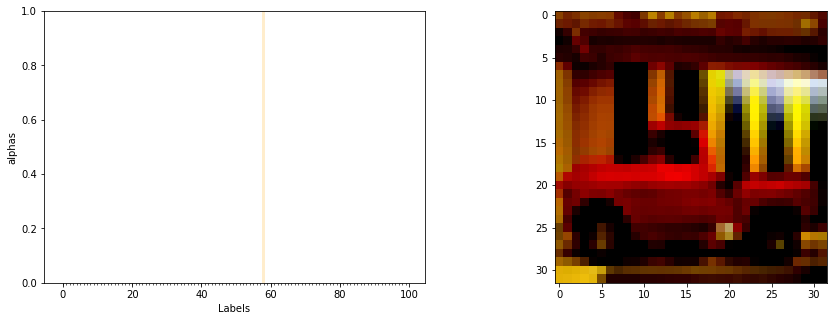

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([60]) tensor([58])
NAN or inf!
out:  tensor([3])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


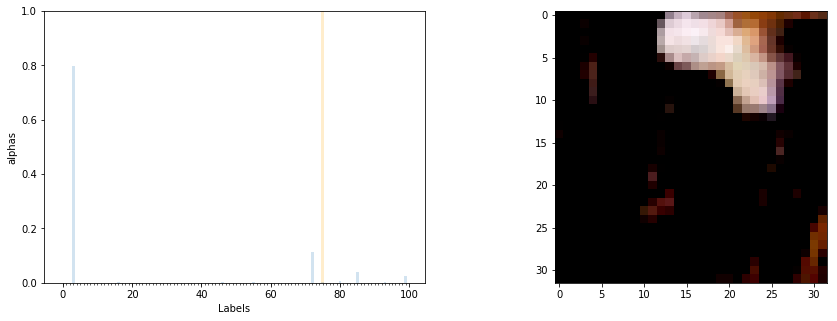

alphas:  tensor([9.5908e-01, 2.9748e+16, 2.2136e+20, 1.2662e+27, 5.0108e+18, 4.5576e+14,
        1.6319e+18, 3.0756e+16, 1.1702e+15, 5.2997e+13, 3.3148e+18, 5.1437e+20,
        1.1776e+14, 1.0024e+21, 1.8138e+20, 1.4317e+14, 5.0574e+24, 6.7236e+10,
        2.0384e+23, 2.1512e+21, 1.4032e+13, 1.1585e+23, 1.5294e+24, 2.3615e+17,
        2.1114e+13, 5.5857e+17, 3.0487e+15, 1.3023e+18, 2.6446e+13, 3.2657e+18,
        5.3178e+19, 2.5047e+17, 1.2812e+19, 1.5716e+19, 3.0324e+14, 6.4140e+13,
        5.7101e+09, 1.4095e+22, 1.5197e+24, 1.2475e+23, 1.0906e+18, 3.3126e+18,
        1.9532e+16, 5.6826e+16, 1.7372e+21, 4.1862e+20, 5.0451e+24, 6.8568e+04,
        3.7636e+16, 1.2549e+12, 7.1831e+17, 6.9925e+18, 6.5238e+03, 5.1334e-02,
        3.3503e+13, 1.8727e+24, 1.2255e+09, 1.0865e+18, 3.0280e+19, 2.0737e+21,
        2.5944e-02, 2.8612e+07, 2.4042e+04, 1.0965e+23, 9.6824e+21, 1.6486e+17,
        4.7866e+18, 1.2110e+17, 3.8501e+11, 1.1320e+11, 1.7971e+07, 4.3858e-02,
        1.8042e+26, 1.2958e+16,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


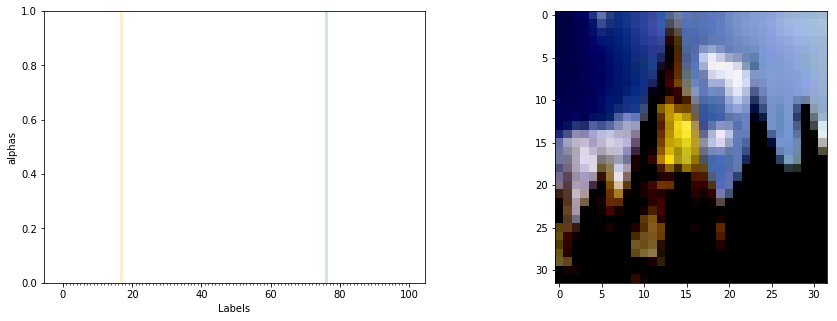

alphas:  tensor([2.0505e+03, 6.2309e+02, 7.1609e+17, 2.9432e+07, 9.0435e+02, 1.3689e+07,
        1.1141e+10, 9.7646e+00, 1.9304e+12, 9.5250e+20, 1.1131e-02, 4.9909e+17,
        1.5364e+09, 6.5040e+05, 1.2127e+13, 9.2419e+15, 4.1424e+07, 3.7695e+17,
        8.9918e+13, 5.0399e+04, 1.6397e+08, 6.8389e+00, 1.4050e-01, 1.1479e-02,
        7.6803e+07, 1.0610e+03, 2.6813e-02, 8.9038e+04, 1.0203e-02, 1.1400e+15,
        3.7696e+07, 3.3556e+02, 6.3409e+10, 1.0318e+05, 7.0798e+04, 8.3032e+14,
        1.0135e+08, 1.6617e+08, 5.9354e+09, 1.3395e+06, 9.1047e+13, 1.8357e+11,
        2.6553e+04, 2.8199e+14, 4.9292e+02, 2.6253e+10, 1.7026e+14, 8.9015e+08,
        6.2231e+06, 1.9532e+01, 5.8624e+05, 5.2474e+17, 3.1779e-02, 2.5887e-02,
        7.4562e+16, 1.2584e+09, 5.7566e+06, 3.5788e+18, 1.8544e+10, 3.6326e+14,
        6.7251e-03, 1.0190e-01, 6.5632e+14, 1.8140e+00, 5.9728e-02, 3.7424e+13,
        9.8218e-03, 3.8906e+01, 5.2729e+08, 1.9868e+18, 3.5098e+16, 3.8065e+00,
        1.3354e+05, 9.0174e-03,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


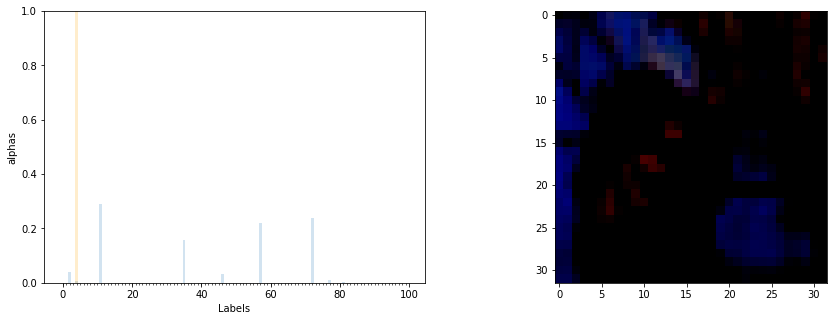

alphas:  tensor([5.0655e+27, 1.6933e+18, 2.1021e+33, 1.7899e+27, 3.8199e+32, 2.7943e+21,
        4.8571e+18, 5.1018e+20, 2.8235e+25, 1.1011e+28, 1.1460e+18, 1.5040e+34,
        2.2685e+26, 1.4576e+22, 1.0314e+24, 3.3514e+23, 4.4222e+27, 1.2497e+19,
        2.6547e+27, 1.8962e+27, 5.4782e+04, 2.8827e+31, 9.0791e+19, 2.5495e+18,
        1.5827e+25, 2.3155e+21, 4.9530e+27, 3.0197e+30, 4.2153e+24, 4.3787e+27,
        3.7331e+16, 2.0841e+23, 4.2212e+27, 1.2169e+26, 6.1418e+25, 8.1723e+33,
        3.5646e+25, 8.0889e+18, 4.7710e+29, 1.4822e+22, 1.0127e+23, 3.7562e+24,
        8.7645e+13, 3.1533e+14, 1.0975e+25, 1.0379e+27, 1.7280e+33, 5.7998e+02,
        2.0666e+15, 4.9978e+17, 4.1917e+26, 3.8520e+21, 5.0271e-02, 1.4865e+17,
        1.3489e+28, 2.9481e+28, 5.9660e+12, 1.1462e+34, 1.8354e+15, 8.5971e+16,
        1.7453e-02, 1.2851e+21, 6.8710e+19, 6.4743e+21, 1.6615e+30, 8.5902e+26,
        7.5183e+25, 2.6176e+27, 4.0932e+21, 1.8792e+16, 8.0298e+19, 2.1063e+10,
        1.2324e+34, 6.0851e+20,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


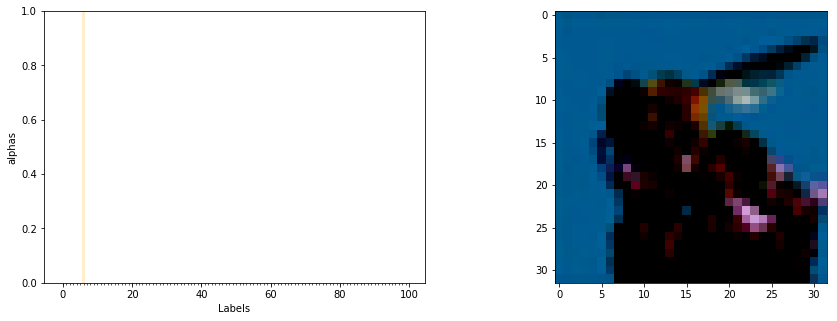

alphas:  tensor([8.2183e+10, 2.7109e+14, 6.5433e+34, 1.3262e+32, 1.7467e+32, 1.2122e+14,
               inf, 1.7145e+25, 7.5760e+31, 8.7381e+26, 2.2170e+29, 2.7500e+29,
        1.5877e+24, 1.0837e+28, 2.0316e+28,        inf, 3.1885e+27, 2.1641e+34,
        1.0782e+33, 3.6031e+22, 1.9629e+28, 2.9247e+19, 6.2496e+29, 5.5583e+05,
        7.3497e+22, 5.6809e+17,        inf, 2.0860e+29, 1.1936e+28,        inf,
        1.5138e+26, 1.0805e+19, 1.6799e+27, 1.3213e+19, 1.3294e+33, 1.2044e+32,
        8.1568e+23, 5.4494e+22, 8.4001e+31, 1.0146e+15, 4.8027e+34, 7.6711e+18,
               inf, 4.8539e+27, 1.2193e+31, 1.6885e+35, 2.6195e+32, 3.8368e+19,
        1.1885e+17, 9.9905e+14, 2.2567e+29, 1.3196e+31, 1.7654e+13, 1.7040e+08,
        3.7938e+21, 2.7975e+34, 4.7720e+30, 1.5098e+24, 1.0664e+13, 8.1666e+26,
        1.5247e-02, 4.6897e+27, 1.4859e+23, 4.9747e+23, 4.9604e+26, 3.3583e+32,
               inf, 3.7669e+24, 4.3333e+15, 7.3055e+22, 1.6819e+21, 2.7024e+01,
        2.1195e+31, 6.4112e+18,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


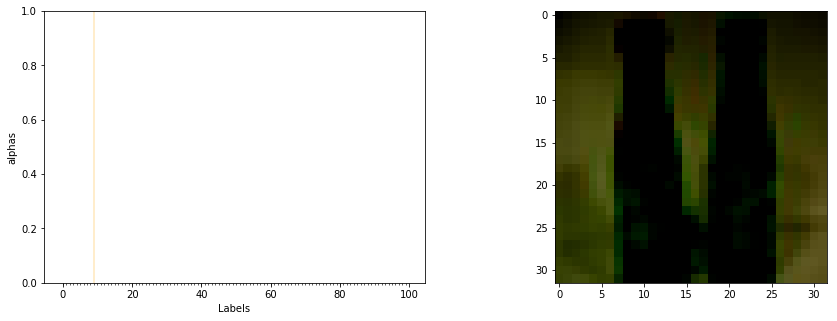

alphas:  tensor([1.3806e+19, 1.9004e+22, 3.6348e+11, 1.8952e+22, 1.6746e+16, 6.7992e+15,
        7.1546e+22, 3.6036e+25, 4.9624e+25,        inf, 2.4763e+24, 4.6917e+18,
        8.9055e+23, 4.5906e+04, 3.4240e+09, 2.9097e+12, 2.7919e+27, 6.8900e+24,
        6.3920e+33, 6.2843e+19, 5.9085e+06, 1.3560e+10, 1.2070e+21, 3.6400e+17,
        1.1217e+10, 7.5571e+20, 2.7101e+10, 8.3574e+12, 8.3509e+26, 1.9975e+22,
        2.6905e+10, 1.1237e+18, 2.3333e+13, 7.5242e+24, 3.9670e+22, 2.7723e+25,
        1.4400e+17, 4.9634e+07, 9.3627e+18, 1.6622e+25, 5.3844e+28, 9.9257e+17,
        5.4981e+21, 8.4558e+18, 1.1669e+28, 1.9299e+20, 1.1905e+26, 6.4953e+13,
        2.8434e+04, 3.4485e+02, 8.3376e+23, 3.7247e+21, 9.0853e+14, 2.5421e+09,
        2.0223e+21, 8.3431e+17, 3.3634e+20, 6.6869e+28, 2.0867e-02, 8.7485e+20,
        3.7462e+06, 3.0267e+31, 2.4731e+13, 2.6057e+15, 1.7987e+13, 3.1188e+20,
        4.2406e+12, 2.2765e+16, 7.7162e+09, 6.9268e+26, 1.6630e+12, 2.0716e-02,
        3.7073e+13, 1.5295e+07,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


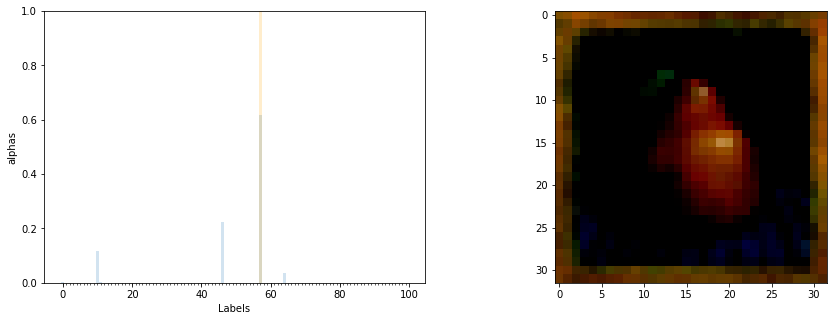

alphas:  tensor([7.1614e+31, 9.6718e+23, 1.6779e+30, 1.8903e+14, 1.5767e+23, 9.2074e+19,
        2.3302e+15, 3.9132e+19, 8.4421e+09, 2.7627e+29, 3.3603e+33, 5.0349e+31,
        7.3546e+10, 5.6635e+17, 4.1912e+14, 1.5470e+14, 1.0536e+23, 4.3123e+02,
        7.3218e+16, 1.7470e+10, 2.8980e+07, 1.7818e+22, 1.5920e+25, 2.0187e+18,
        6.9193e+17, 4.5601e+20, 1.9085e+24, 7.7787e+13, 2.0433e+21, 1.0765e+23,
        7.1507e+08, 3.2106e+15, 8.9776e+24, 2.0661e+07, 1.0461e+18, 8.7877e+30,
        1.0003e+31, 1.8867e+12, 3.3388e+20, 2.5807e+18, 1.6482e+23, 1.7173e+09,
        2.1262e+10, 5.3547e+17, 2.9398e+23, 1.4990e+25, 6.3546e+33, 8.0481e+02,
        3.3309e+14, 1.1589e+14, 2.9752e+24, 5.0508e+16, 5.6628e+01, 2.0827e+22,
        4.4198e+11, 1.5955e+16, 2.2625e+06, 1.7511e+34, 2.8545e+02, 2.2858e+09,
        3.4748e-02, 7.3355e+25, 5.0286e+12, 8.9046e+12, 9.8097e+32, 2.3043e+17,
        7.3468e+25, 3.2608e+25, 1.5139e+14, 6.0514e+14, 9.2352e+21, 1.3376e+11,
        3.6773e+13, 1.3622e+08,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100])


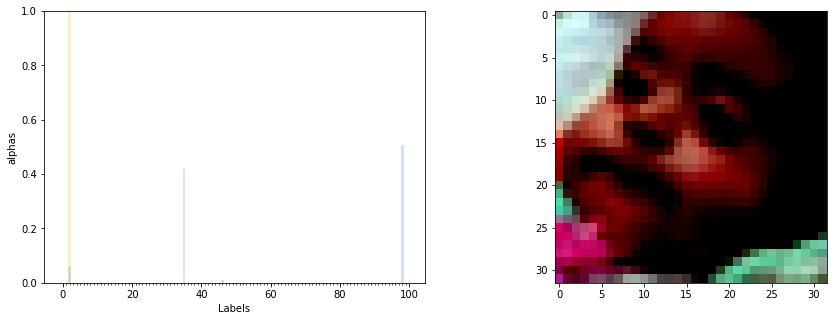

alphas:  tensor([1.8890e+20, 2.6407e+15, 4.2830e+26, 1.9773e+10, 2.2411e+16, 5.8540e+13,
        1.8227e+08, 2.0980e+12, 9.0315e+07, 4.5839e+11, 1.3673e+19, 8.7512e+24,
        4.3402e+14, 5.3756e+10, 1.2368e+11, 5.8866e+07, 1.2492e+19, 2.4937e+07,
        5.1496e+13, 5.7821e+06, 7.5184e+05, 5.7484e+19, 3.7640e+12, 1.2729e+13,
        8.8892e+17, 2.6884e+16, 1.7501e+17, 1.3095e+16, 5.4126e+12, 7.5380e+11,
        3.9115e+11, 1.2840e+16, 2.6180e+20, 4.1997e+15, 7.1711e+10, 2.9895e+27,
        1.8663e+18, 4.9218e+10, 1.6203e+12, 4.8108e+13, 6.0206e+16, 3.8801e+07,
        9.2112e+10, 9.8062e+12, 1.7243e+12, 5.6408e+20, 6.1866e+25, 7.3873e+06,
        1.5408e+01, 9.8449e+08, 3.3529e+18, 1.7153e+21, 2.0125e+00, 1.1880e+14,
        3.9700e+11, 1.0360e+14, 6.9619e+11, 1.2884e+16, 2.5812e+10, 3.1184e+14,
        9.3195e-02, 3.8637e+22, 7.7944e+08, 6.2076e+20, 4.0809e+17, 3.6199e+14,
        9.0799e+08, 3.7674e+14, 1.3364e+03, 1.7425e+07, 7.2999e+18, 1.4648e+07,
        3.2668e+15, 3.2274e+06,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


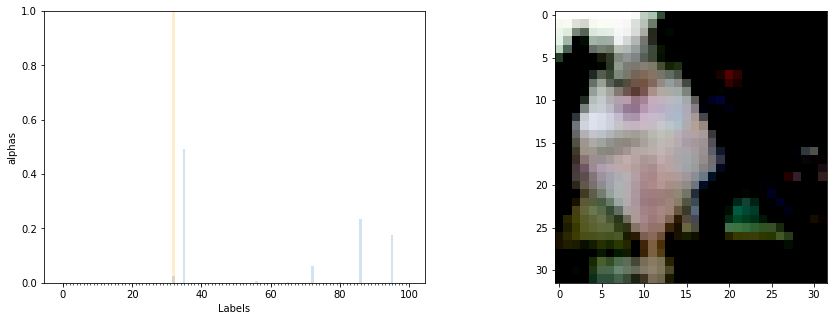

alphas:  tensor([4.0590e-02, 3.5287e+18, 5.8533e+26, 9.5735e+16, 7.7743e+13, 6.5746e+26,
        5.3644e+04, 1.4951e+21, 6.9623e+14, 8.8789e+19, 1.3465e+14, 2.6603e+20,
        1.3618e+25, 1.7348e+19, 4.0355e+24, 7.3968e+24, 8.6207e+17, 3.9754e+14,
        6.6505e+21, 7.8101e+23, 7.3383e+18, 1.3095e+18, 2.1708e+22, 2.6738e+22,
        3.0154e+17, 1.7515e+23, 1.9877e+22, 4.6569e+20, 1.3502e+15, 2.3754e+25,
        1.0822e+19, 4.5437e+09, 9.5693e+28, 5.1985e+17, 8.5650e+19, 1.9184e+30,
        8.4316e+24, 6.3393e+21, 4.6605e+21, 3.4502e+20, 4.9051e+24, 6.3871e+09,
        2.6011e+09, 5.5780e+15, 2.0091e+24, 3.0137e+18, 5.5420e+18, 3.3152e+11,
        3.0487e+17, 1.4014e+17, 3.0958e+26, 5.0387e+14, 9.9867e+05, 4.1445e-02,
        7.2312e+22, 6.4800e+17, 3.1621e+28, 1.2949e+23, 1.4239e+11, 9.4315e+12,
        1.0323e+11, 9.5034e+21, 1.2017e+10, 1.6983e+10, 4.0747e+17, 6.0071e+27,
        3.8988e+14, 1.3528e+23, 2.1759e+16, 2.4761e+18, 2.5338e+14, 3.1989e+20,
        2.3590e+29, 8.4639e+25,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


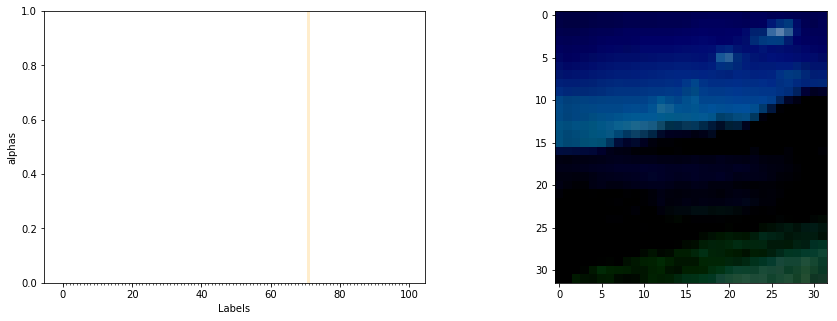

alphas:  tensor([4.3735e-01, 5.6738e+20, 9.9434e+06, 1.1606e+25, 2.3258e+31, 7.8440e+30,
        4.1473e-01, 5.4514e+14, 7.9835e+27, 4.0350e+22, 7.4588e+24, 3.4791e+08,
        9.8594e+27, 1.6076e+25, 1.0074e+09, 1.3662e+18, 1.8683e+21, 1.5615e+25,
        6.5810e+23, 1.2776e+16, 9.9594e+30, 5.6892e+18, 3.7512e+24, 1.3226e+34,
        1.3049e+12, 1.6049e+25, 8.3119e+11, 4.9454e+27, 1.8872e+27, 5.2308e+16,
        8.1767e+28, 1.1830e+15, 1.6658e+20, 1.4311e+35, 7.0847e+19, 1.8822e+04,
        3.2095e+10, 1.8006e+25, 4.3107e+19, 3.8233e+20, 3.9512e+23, 4.0395e+22,
        4.2549e+15, 9.1129e-02, 8.5981e+19, 5.7410e+22, 8.0521e+22, 3.8275e+12,
        3.3700e+11,        inf, 7.7608e+15, 2.1505e+23, 1.7204e+21, 5.1293e-02,
        1.2283e+25, 1.2273e+34, 7.9487e+17, 2.7187e+06, 1.0902e+23, 1.1340e+26,
               inf, 2.0682e+24, 5.1091e+05, 1.9455e+13, 1.5156e+13, 1.0760e+16,
        3.4480e+17, 9.7535e+34, 1.7413e+24, 8.5602e+30, 3.7245e+14,        inf,
        4.9511e+30,        inf,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


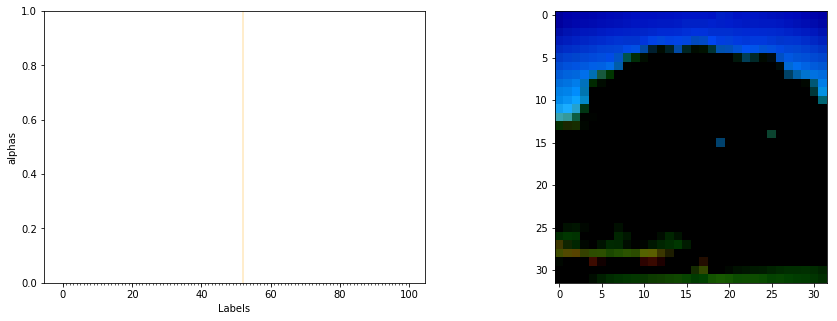

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, nan, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([14]) tensor([52])
NAN or inf!
out:  tensor([21])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


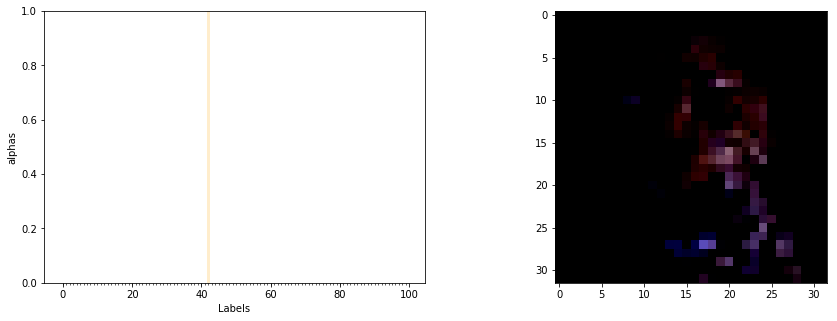

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([52]) tensor([42])
NAN or inf!
out:  tensor([69])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


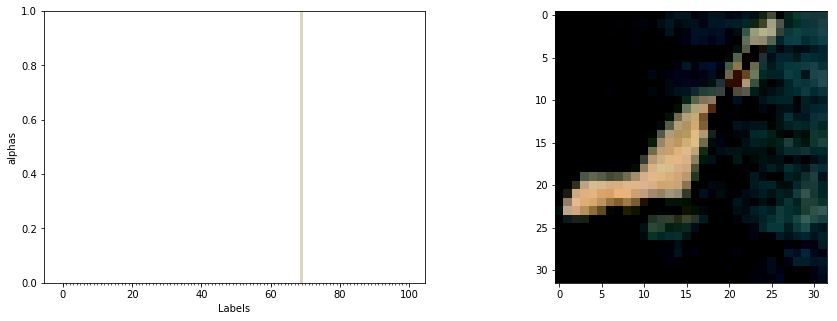

alphas:  tensor([5.8137e-02, 4.4629e-02, 4.9243e+03, 9.0047e+14, 4.3109e+05, 6.6792e+00,
        2.2171e+02, 5.1045e+07, 8.5502e+09, 1.1967e+05, 4.8263e+10, 5.2566e+07,
        1.0702e+11, 4.1350e+10, 8.6178e-01, 2.4666e+09, 3.0508e+06, 3.1876e+04,
        1.1847e+06, 1.8189e+12, 4.4253e+00, 1.0878e+06, 9.2454e+09, 2.3019e+15,
        4.5561e+04, 5.0476e+01, 1.7876e+08, 5.4975e+11, 3.7794e+19, 3.7133e+08,
        1.5270e+15, 4.3746e+07, 1.1492e+11, 4.7081e+08, 1.8585e+04, 8.2674e+11,
        1.6142e+02, 2.2155e+09, 3.2242e+11, 5.1895e+12, 9.8173e+12, 1.6678e+05,
        5.0833e+04, 6.1367e+04, 3.1740e+08, 2.3043e-02, 1.4522e+13, 7.9298e-02,
        1.1597e-01, 4.6507e+19, 1.2212e+04, 3.7405e+13, 4.5740e-02, 7.9730e-02,
        1.0290e+04, 3.5298e+13, 6.3560e+06, 2.3096e+09, 3.8794e-02, 1.8808e+05,
        3.6521e+09, 7.0515e+08, 2.8974e+03, 3.8025e-01, 1.0035e+08, 4.0645e+10,
        2.7885e+05, 8.4999e+12, 1.6394e+09, 5.1607e+26, 2.5326e+07, 1.7815e+09,
        4.6370e+11, 1.9378e+18,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


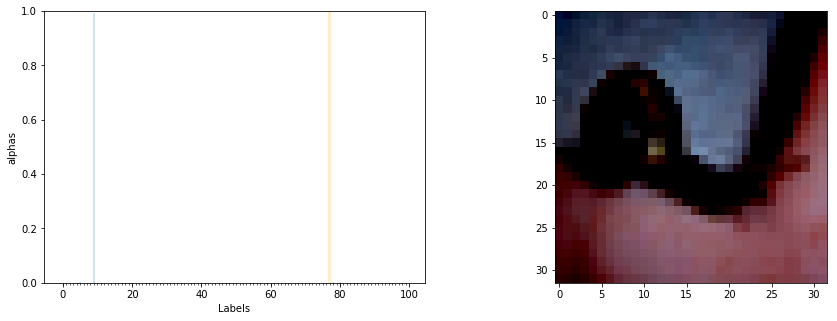

alphas:  tensor([5.0639e+02, 4.3008e+14, 2.2063e+15, 1.0465e+14, 1.0608e+13, 4.5956e+26,
        4.0704e+04, 3.8765e+17, 1.8534e+13, 3.2830e+29, 8.3931e+23, 1.3258e+14,
        8.6834e+14, 3.5081e+16, 1.8148e+25, 8.2297e+19, 5.1085e+25, 3.2189e+15,
        5.2292e+16, 3.7759e+21, 1.2798e+21, 5.3642e+13, 2.2370e+20, 1.5579e+11,
        1.2952e+12, 5.3267e+24, 3.4133e+15, 5.6368e+19, 5.0211e+20, 1.5299e+12,
        3.6466e+24, 2.9024e+06, 6.9855e+20, 1.0222e+18, 4.9237e+09, 2.9078e+16,
        7.4745e+11, 2.6190e+22, 7.1335e+15, 3.4783e+11, 4.2890e+19, 1.2516e+12,
        1.2425e+12, 7.2962e+07, 1.8214e+26, 6.4452e+18, 7.9338e+14, 8.3032e+02,
        5.5774e+07, 1.9818e-02, 2.4607e+21, 3.0964e+18, 2.1834e-02, 1.0216e-01,
        3.1656e+03, 2.1218e+22, 2.6621e+05, 3.7102e+16, 2.0418e+16, 3.9495e+19,
        1.5294e+09, 7.0542e+19, 6.7601e+06, 7.8766e+14, 1.1516e+16, 5.6306e+24,
        1.0117e+17, 2.2303e+18, 8.7331e+11, 3.8066e+18, 1.0773e+12, 1.5721e+09,
        3.5622e+21, 3.2853e+09,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


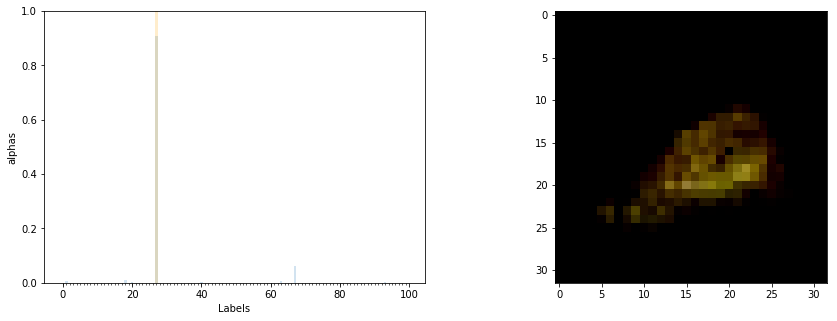

alphas:  tensor([2.3680e-01, 3.1521e+08, 1.5144e+04, 1.0674e-01, 3.3564e+04, 2.2477e+02,
        1.3472e-01, 5.9505e-01, 1.6293e+01, 3.7678e+05, 2.4518e+07, 1.2468e+03,
        3.7722e-01, 1.5582e-01, 7.2522e-01, 2.4905e+01, 4.8218e+03, 4.9210e+02,
        4.3401e+08, 1.2739e-01, 1.1791e+08, 1.4860e-01, 6.0786e+04, 1.5814e+06,
        3.8992e+03, 5.2173e+03, 1.3783e+05, 4.5951e+10, 7.9420e+03, 7.0796e+05,
        6.3330e-01, 7.8052e+03, 1.1396e+06, 1.1366e+06, 1.3322e+02, 5.9322e+00,
        3.2867e+03, 1.5381e+02, 4.0099e+03, 2.9885e+00, 1.4795e+08, 1.3943e-01,
        4.3159e+03, 3.3286e+01, 2.0994e+07, 2.3763e+01, 7.4541e-02, 5.3392e+04,
        5.1714e-01, 1.2541e+07, 1.9833e+05, 4.2315e+07, 8.2215e+00, 1.1440e-01,
        2.2595e+04, 1.6543e+06, 6.7688e+04, 5.3807e+03, 2.7238e-01, 2.4480e+05,
        3.7065e+05, 4.9216e+00, 1.3399e+00, 3.0190e+08, 1.3211e+05, 5.1566e+05,
        1.0837e+02, 3.0748e+09, 2.3425e+04, 6.4137e+03, 4.3548e+06, 3.1814e+03,
        3.3438e+01, 6.3497e+06,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


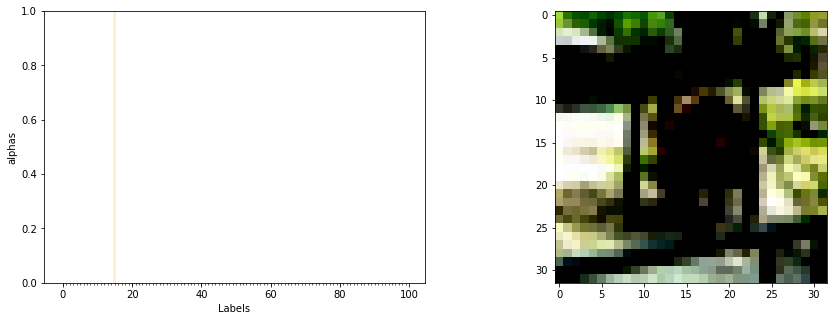

alphas:  tensor([9.9511e+05, 1.8781e+30,        inf, 1.0033e+36, 1.2645e+30, 1.3024e+30,
               inf, 3.7529e+25,        inf, 2.3699e+31, 5.1679e+30, 1.3230e+31,
               inf, 5.0204e+33, 1.6292e+28, 6.1842e+32,        inf, 5.3748e+28,
        1.5702e+27, 2.5135e+35, 3.4904e+31, 1.8980e+27, 3.6094e+23, 5.5601e+19,
        1.8054e+20, 8.8860e+22, 9.2974e+23, 1.8703e+18, 3.6369e+20,        inf,
        2.6637e+29, 3.5610e+35, 6.2202e+27, 6.8560e+30, 5.3388e+31, 6.7762e+28,
        6.3694e+25,        inf,        inf, 5.2085e+26, 5.2016e+32, 8.2555e+24,
               inf, 3.9990e+28, 3.3378e+27, 7.4359e+30, 3.2775e+32, 6.1114e+35,
        1.3562e+32, 6.4442e+34, 2.2796e+28, 6.4172e+20, 4.6510e+28, 1.9113e+14,
        1.6906e+18, 2.5822e+35, 1.0897e+30, 9.2322e+24, 7.2380e+26,        inf,
        2.5628e-02, 2.5764e+27, 9.9369e+24, 1.3262e+23,        inf, 1.0190e+27,
               inf, 8.7443e+18, 3.5448e+21, 1.7907e+29,        inf, 9.5427e+05,
        2.0223e+29, 3.1993e+18,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


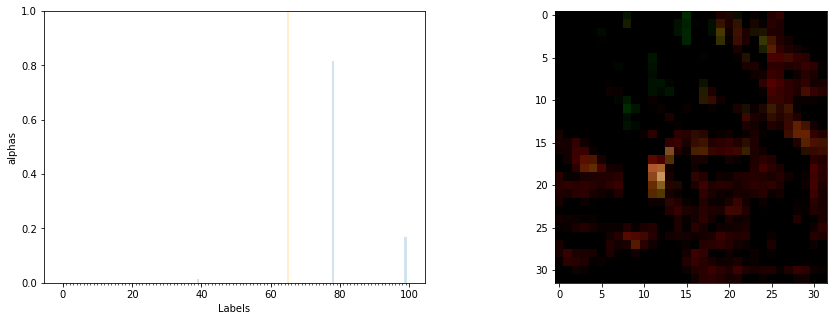

alphas:  tensor([1.5540e-01, 6.8482e+09, 3.2769e+11, 1.5536e+11, 3.0526e+14, 1.1911e+10,
        1.1467e+16, 4.8184e+13, 1.7664e+20, 5.2240e+14, 2.8941e+12, 4.0113e+16,
        6.3093e+14, 1.0001e+11, 1.7964e+12, 1.0548e+10, 8.8929e+14, 1.3520e+10,
        4.8244e+15, 5.5873e+08, 9.8801e+12, 1.1644e-01, 1.8653e+17, 1.5162e+13,
        1.8388e+10, 1.8637e+15, 5.6181e+16, 1.2932e+15, 1.2772e+07, 2.2849e+11,
        1.4344e+04, 9.8348e+08, 5.8862e+16, 8.2929e+18, 3.3460e+14, 1.8674e+07,
        4.2475e+14, 2.2726e+11, 2.3961e+15, 2.8361e+21, 5.2923e+09, 4.9242e+11,
        1.4730e+17, 1.8976e+12, 1.5098e+16, 1.4730e+14, 2.0337e+05, 5.8403e+07,
        7.3051e+15, 3.5235e+04, 9.2615e+15, 1.2536e+13, 2.9794e+05, 1.1779e+03,
        8.5353e+08, 2.1699e+14, 2.2178e+15, 7.3078e+08, 1.2369e+04, 4.1459e+13,
        1.5166e+02, 1.1504e+16, 2.8102e+04, 1.1367e+16, 1.6895e+18, 4.7728e+19,
        2.7867e+16, 1.2094e+17, 4.6160e+02, 4.5799e+07, 1.1847e+09, 1.9900e-01,
        4.6708e+06, 1.4304e+10,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


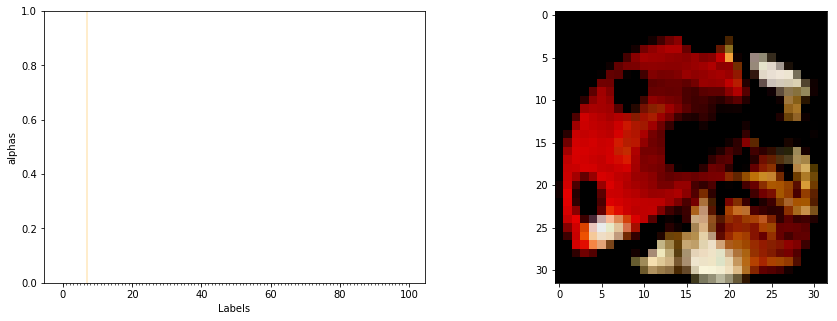

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([68]) tensor([7])
NAN or inf!
out:  tensor([26])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


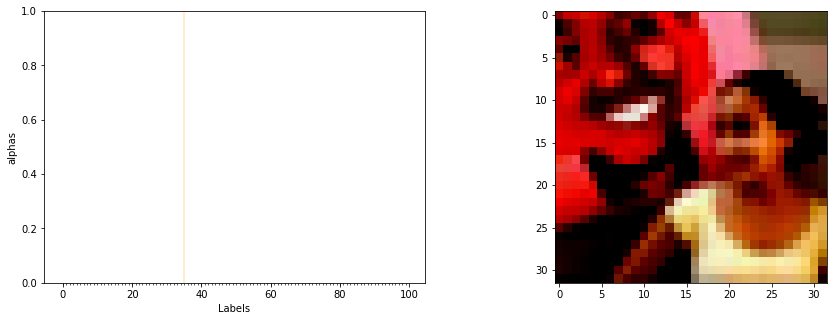

alphas:  tensor([5.8326e+26, 4.5112e+27,        inf,        inf, 2.1133e+29, 3.3541e+26,
        8.8177e+30,        inf,        inf, 3.7120e+31, 8.7400e+27,        inf,
        1.3023e+19, 5.5216e+32, 2.0822e+26, 1.2372e+31, 2.5266e+28, 4.1600e+31,
        7.0558e+25, 8.9961e+26, 5.3420e+20, 1.0815e+28, 6.6282e+26, 4.1679e+23,
        1.3612e+26, 3.9728e+22,        inf, 5.1211e+33, 4.2990e+12, 3.2723e+35,
        3.4970e+19, 7.4943e+19, 8.8386e+34, 1.5871e+31, 1.3641e+27, 1.6381e+30,
        8.4518e+35,        inf, 1.8348e+33,        inf, 9.6667e+26, 2.2983e+34,
        6.0001e+23, 8.5968e+34, 1.2622e+35,        inf, 9.4797e+28, 3.3927e+26,
        2.3483e+36, 5.5475e+25, 1.4587e+32,        inf, 9.5560e-03, 6.7650e+23,
        1.8779e+26, 2.0687e+27, 2.9775e+18, 9.1852e+27, 4.9875e+28, 1.0783e+24,
        8.1028e+11, 7.1566e+13, 4.5382e+29, 6.4158e+25, 5.9189e+30, 7.9780e+34,
        1.0032e+35, 9.9796e+22, 2.1881e-02, 4.8096e+30, 9.9480e+29, 1.2974e+12,
        1.4043e+29, 3.3753e+19,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


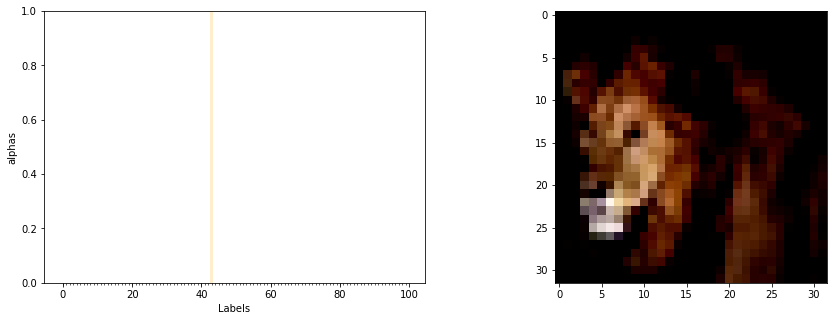

alphas:  tensor([1.1661e+26, 1.0734e+21, 1.6863e+34, 2.2084e+33,        inf, 6.0900e+27,
        1.0480e+32, 4.5957e+32, 3.5040e+30, 3.9382e+25, 1.5129e+27, 1.2455e+34,
        1.7742e+15, 1.3768e+24, 6.2532e+23, 4.9384e+31, 6.7739e+27, 7.9233e+21,
        4.9134e+27, 2.9943e+32, 1.0954e+16, 5.9173e+21, 1.8269e+31, 8.8214e+29,
        1.1586e+36, 8.5476e+29,        inf, 6.7595e+29, 1.7306e+31, 1.8327e+33,
        1.0450e+24, 4.7393e+30, 1.0221e+30, 4.5105e+28, 4.3564e+30,        inf,
               inf, 2.1312e+28, 3.2843e+35, 1.7685e+36, 1.5961e+33, 9.0440e+17,
               inf, 8.9960e+30,        inf,        inf,        inf, 1.0311e+26,
        1.4370e+11, 1.6424e+18,        inf, 3.4331e+32, 2.1622e-02, 1.1951e+17,
        1.3119e+30, 1.5844e+29, 1.2230e+25, 2.6076e+23, 1.4776e+07, 1.7130e+28,
        3.5906e+05, 8.6334e+27, 2.1151e+26, 2.4928e+32, 2.5736e+28, 3.6307e+34,
        3.4176e+35, 3.2919e+26, 2.1913e+18, 6.4697e+24, 5.4643e+29, 2.7310e+08,
        4.2290e+29, 1.0101e+32,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


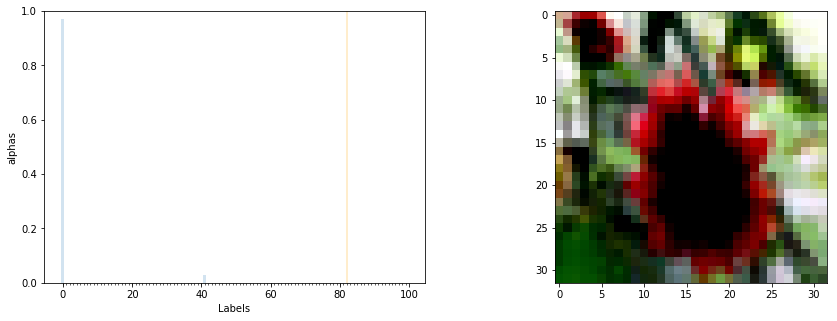

alphas:  tensor([9.7045e+31, 8.8204e+14, 4.9963e+13, 2.3827e+15, 4.2389e+18, 8.3156e+12,
        1.2555e+23, 2.7403e+23, 3.5742e-02, 1.2544e+11, 1.5741e+20, 1.4199e+19,
        8.9559e+11, 8.3426e+17, 3.6543e+25, 1.0233e+03, 7.4492e+20, 8.5043e+02,
        3.1779e+21, 2.4512e+21, 1.7361e-02, 1.7649e+17, 7.4541e+17, 9.9883e+03,
        1.6375e+09, 6.5149e+27, 3.0835e+21, 1.1920e+08, 2.8766e+18, 1.3477e+16,
        1.5212e-02, 1.9045e+15, 3.0078e+21, 1.8149e+18, 3.9669e+25, 1.3702e+15,
        4.0121e+18, 1.2181e+12, 5.3204e+22, 8.4803e+06, 1.3910e+19, 2.7220e+30,
        1.3423e+05, 6.4567e+03, 9.4657e+22, 5.4179e+26, 2.5121e+09, 5.3629e+19,
        2.9671e+01, 3.5875e-01, 1.4048e+18, 1.2999e+19, 1.2451e-02, 1.4223e+14,
        2.9606e+23, 3.3714e+13, 2.5600e-01, 2.9408e+18, 8.4321e+07, 2.6039e+11,
        4.7340e-02, 3.9741e+07, 3.0920e+27, 1.0115e+07, 7.6497e+08, 6.7464e+19,
        9.2856e+03, 7.4857e+05, 1.5023e+02, 1.7124e+03, 1.0347e+22, 9.2778e+01,
        6.4221e+17, 7.0821e+11,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


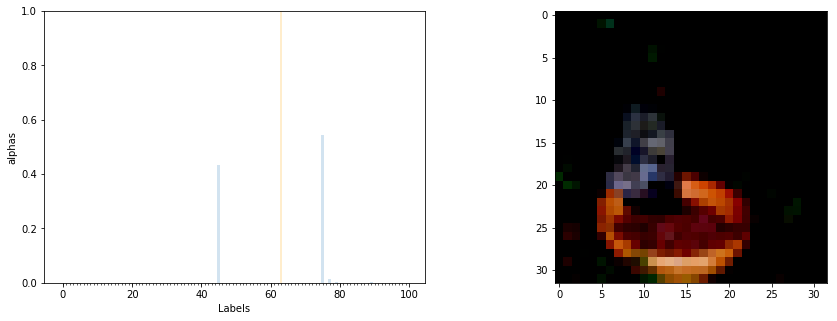

alphas:  tensor([1.1879e+02, 1.0682e+02, 4.2075e+08, 2.4186e+06, 1.2493e+05, 4.5475e-02,
        1.9191e+10, 1.6028e+12, 7.6160e+07, 7.7345e+09, 3.3860e+03, 1.1485e+02,
        7.9600e+04, 1.5222e+01, 9.3064e+11, 6.2698e+09, 2.3602e+03, 1.7618e+06,
        2.5022e+10, 1.4295e+02, 2.1711e+01, 2.0580e-01, 1.4526e+11, 2.4093e+10,
        7.5923e+10, 1.7796e+07, 1.4300e+11, 1.3981e+11, 3.9270e+03, 7.4246e+04,
        1.1197e+00, 1.3818e-02, 1.2331e+03, 1.0069e+10, 1.6874e+07, 6.4527e+03,
        4.5490e+06, 1.1608e+06, 7.6801e+00, 2.4813e-02, 1.0864e+07, 5.9279e+08,
        2.7608e+04, 2.4069e+08, 1.1260e+11, 5.4619e+15, 7.2068e+01, 2.1815e-02,
        3.2456e+00, 7.6184e-01, 2.5683e+12, 1.3745e+04, 5.2964e-02, 2.4458e-02,
        7.1327e+11, 5.9174e+09, 1.9324e+06, 1.2726e+07, 5.2181e+04, 3.6041e+09,
        1.8352e-02, 9.9521e+06, 1.1528e+04, 2.3704e+12, 2.4849e+06, 2.8997e+10,
        2.9985e+08, 6.0351e+10, 8.4576e-01, 4.6175e+06, 3.7305e+07, 1.1533e+00,
        2.2248e+05, 2.4593e+08,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


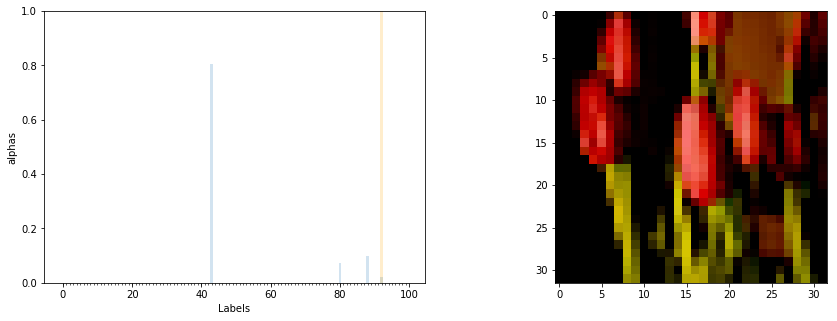

alphas:  tensor([1.0509e+09, 2.9481e+01, 6.6115e+11, 2.4452e+17, 1.3040e+14, 6.3793e+11,
        1.7150e+17, 4.4949e+11, 8.9300e+14, 9.8697e+15, 1.3071e+19, 2.1100e+13,
        1.1564e+03, 1.4525e+07, 1.1380e+17, 2.6432e+11, 3.9029e+23, 2.1080e+16,
        6.8518e+12, 5.1324e+11, 4.2277e-02, 1.2521e+09, 1.4865e+16, 7.7588e+02,
        7.5022e+14, 2.6504e+05, 4.5976e+14, 1.4727e+05, 1.0297e+05, 4.3092e+17,
        6.1921e+03, 1.0241e+15, 1.3469e+14, 5.2623e+14, 4.8299e+17, 9.6792e+10,
        1.7543e+14, 1.0810e+22, 3.5637e+16, 6.9131e+23, 2.1648e+14, 9.3060e+00,
        3.5167e+16, 2.4726e+27, 1.8391e+11, 7.4393e+06, 1.1961e+14, 1.7284e+13,
        5.6791e+08, 8.7160e+00, 4.5574e+16, 1.9228e+23, 1.7721e-02, 2.8371e+16,
        4.7448e+08, 1.5839e+10, 4.1131e+15, 8.8201e+17, 3.3807e-02, 6.5672e+06,
        4.4082e-02, 3.1383e+10, 2.1110e+05, 2.7896e+16, 6.1301e+06, 7.5352e+16,
        1.2416e+13, 3.3567e+05, 4.9821e-02, 7.3114e+03, 9.9604e+16, 3.3080e+00,
        2.4715e+17, 1.6911e+16,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


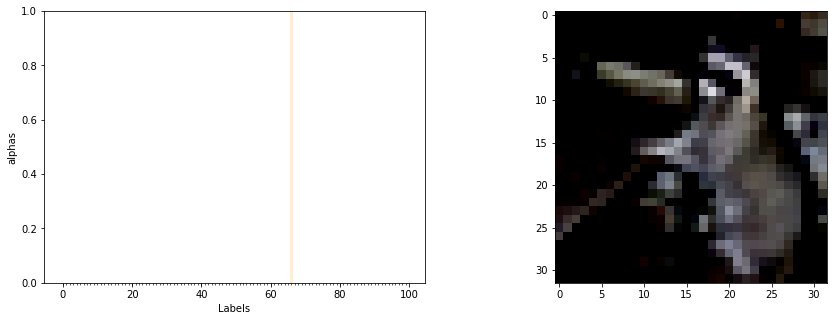

alphas:  tensor([7.5307e+20, 8.6104e+23, 6.1087e+33, 7.6238e+24, 2.9025e+23, 1.0307e+27,
        2.8482e+27, 6.7649e+23, 1.9956e+30, 3.8945e+27, 9.4972e+26, 4.6494e+30,
        3.7527e+27, 1.1920e+25, 3.4183e+19, 1.4704e+21, 5.3712e+32, 8.2118e+17,
        1.9801e+30,        inf, 4.0337e+27, 1.4420e+15, 4.2427e+32, 1.3547e+21,
        8.8441e+13, 5.1678e+29, 7.4955e+28, 4.4252e+35, 3.4367e+33, 2.9333e+32,
        6.9843e+18, 5.4353e+25, 1.8363e+22, 5.2351e+31, 4.6404e+26, 1.3283e+33,
        6.5308e+21, 8.9223e+20, 4.4283e+35,        inf, 3.8293e+31, 5.4759e+30,
        1.0240e+36, 1.1175e+21,        inf, 1.7147e+27, 5.1070e+35, 5.2229e+15,
               inf, 1.3965e+15, 5.0313e+29, 4.6427e+32, 4.5989e-02, 1.5217e+09,
        1.6592e+36, 1.3055e+26, 2.4787e+19, 1.1349e+24, 4.7147e+23, 2.3594e+33,
        1.6937e+11, 7.3681e+28, 7.2455e+20, 2.7289e+30, 4.9915e+23, 2.8506e+28,
        9.0075e+33, 1.0155e+27, 2.9110e+25, 9.9238e+24, 6.9498e+26, 1.7306e+19,
        3.5972e+29, 2.7654e+24,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


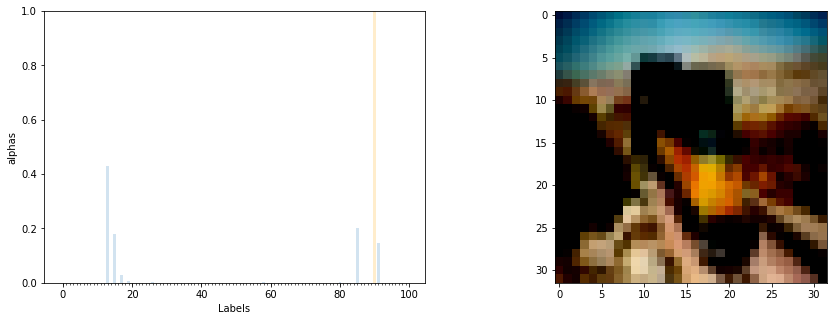

alphas:  tensor([2.2024e+04, 2.9619e+05, 2.5240e+08, 2.6036e+10, 1.3292e+08, 1.2906e+11,
        1.9557e+07, 2.6376e+04, 3.8349e+10, 1.0836e+08, 1.6236e+15, 2.6716e+09,
        1.8047e+16, 8.5662e+19, 2.1305e+12, 3.5530e+19, 1.6131e+07, 5.4252e+18,
        1.5319e+05, 1.2744e+18, 2.5987e+06, 1.7166e+01, 3.9874e+05, 6.3058e+02,
        1.8289e+01, 1.4820e+05, 2.6022e+17, 5.8585e+10, 3.5195e+07, 5.4516e+15,
        7.4333e+06, 3.4058e+12, 9.9440e+10, 1.1318e+16, 2.6319e+08, 1.1568e+10,
        2.4146e+01, 7.4049e+07, 3.7942e+15, 2.1145e+00, 2.5497e+06, 8.0073e+12,
        1.1830e+08, 9.1211e+06, 1.3382e+06, 1.0427e+16, 1.7221e+12, 2.6979e+06,
        1.6058e+14, 3.8319e+07, 6.1379e+04, 8.9044e+12, 1.4337e+06, 2.0683e+03,
        8.1622e+02, 1.9233e+03, 3.7147e+05, 2.5825e+11, 7.5773e+17, 7.5119e+10,
        3.7304e+00, 3.0070e+05, 8.7129e-01, 5.6965e+04, 3.7360e+13, 1.7862e+10,
        1.1287e+03, 6.3943e+07, 4.0721e+07, 1.9476e+02, 1.5596e+01, 1.2023e+02,
        2.4912e+15, 5.7584e+03,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


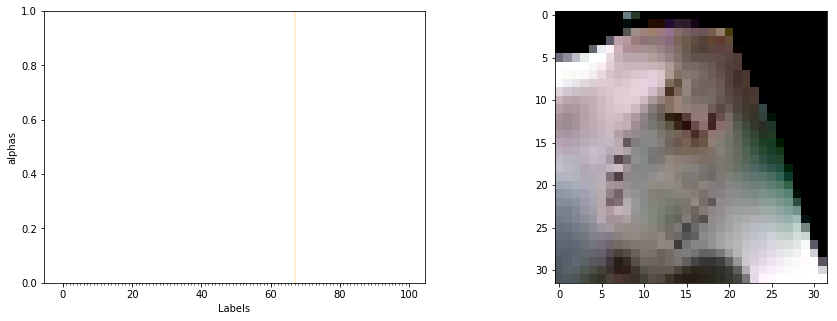

alphas:  tensor([2.7645e+10, 5.7133e+24,        inf,        inf, 7.3393e+28, 1.3606e+28,
        6.8143e+26, 6.7272e+17, 3.3437e+12, 5.2144e+33, 2.2475e+31, 7.3180e+35,
        1.2297e+19, 5.7583e+17, 3.0534e+25, 2.7245e+14, 9.1303e+35, 4.8405e+15,
        4.7054e+25, 1.0253e+25, 3.1404e+25, 2.3392e+12, 3.6269e+30,        inf,
        1.5759e+28, 1.5420e+35, 5.8584e+26, 3.3037e+28,        inf, 2.2007e+19,
        1.9886e+32, 2.2280e+26, 7.6306e+33, 6.1495e+25, 8.1516e+32, 1.0943e+27,
        1.2134e+33, 1.6590e+25, 3.6753e+24, 1.2542e+31, 6.4920e+24, 7.9196e+14,
        1.0173e+19, 7.7820e+20, 4.5848e+31, 6.7217e+29, 1.4249e+31, 1.4511e+18,
        3.7507e-02, 3.8420e+27, 3.7588e+33, 2.9029e+27, 2.3666e-02, 2.9988e+05,
        3.4349e+28, 1.6226e+29, 1.8681e+20, 2.0311e+21, 1.1919e+09, 2.8025e+24,
        5.7170e+05, 5.8532e+31, 1.9503e+25, 6.7109e+25, 3.4591e+13,        inf,
        6.6993e+30,        inf, 2.1521e+22, 1.2786e+22, 5.2818e+25, 7.5636e+23,
        3.6455e+33, 5.8468e+33,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


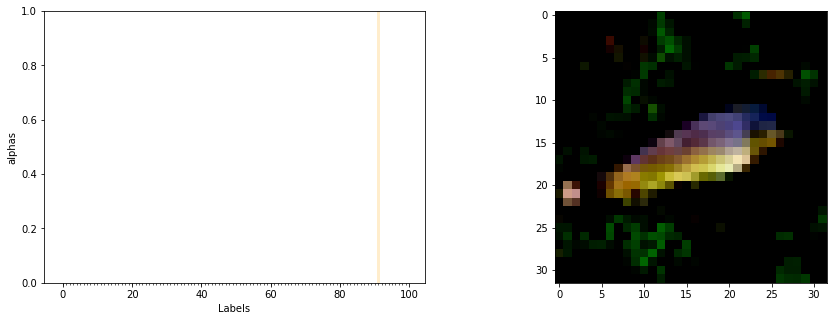

alphas:  tensor([1.5614e-01, 1.7950e+20, 3.4412e+33, 1.1167e+21, 9.5527e+22, 6.7658e+31,
        9.2345e+16, 2.7243e+19, 2.1446e+17, 1.0228e+25, 1.9173e+22, 1.4486e+20,
        8.8909e+25, 2.6751e+29, 7.2948e+24, 1.2291e+14, 2.7058e+16, 1.4939e+09,
        9.5698e+26, 1.9092e+27, 7.1231e+24, 8.6589e+19, 4.0667e+17, 2.0912e+14,
        2.9756e+12, 1.6420e+18, 3.7242e+31, 2.3720e+20, 2.8628e+18, 1.0508e+26,
        2.5841e+28, 6.1032e+09, 1.0219e+23, 2.2029e+33, 1.3919e+18, 2.2661e+26,
        4.4604e+21, 1.6404e+34, 8.1888e+27, 3.2976e+23, 2.6505e+18, 4.7300e+26,
        4.2633e+25, 2.4995e+14, 5.2467e+30, 1.0379e+29, 1.7389e+07, 6.2087e+20,
        1.0482e+21, 1.1125e+16, 1.8396e+32, 1.4876e+30, 1.8113e+02, 4.5404e+12,
        4.1754e+20, 1.2346e+31, 3.2454e+20, 9.1541e+26, 8.9465e+26, 2.1739e+29,
        1.6310e+06, 4.9589e+19, 7.5503e+14, 2.0259e+25, 1.2179e+28, 3.1714e+25,
        1.3626e+25, 1.4456e+25, 1.7244e+09, 3.9840e+15, 5.0928e+16, 1.0066e+14,
        3.1406e+31, 2.7591e+26,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


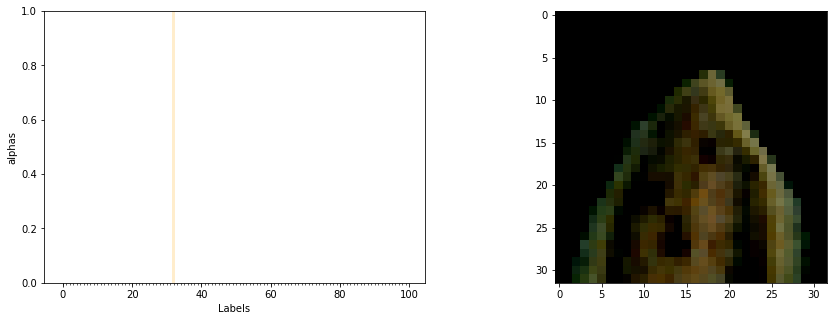

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, nan, inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([53]) tensor([32])
NAN or inf!
out:  tensor([13])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


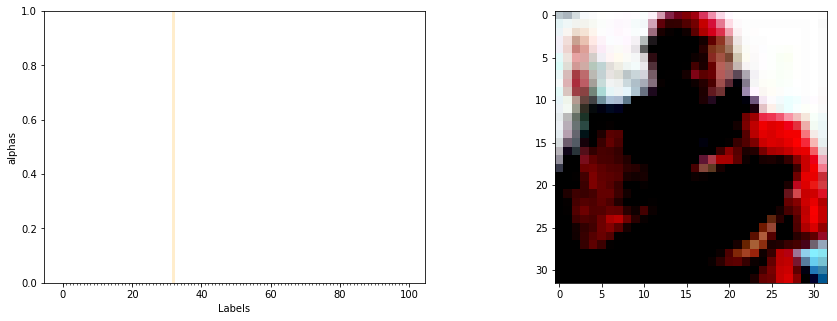

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([68]) tensor([32])
NAN or inf!
out:  tensor([82])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


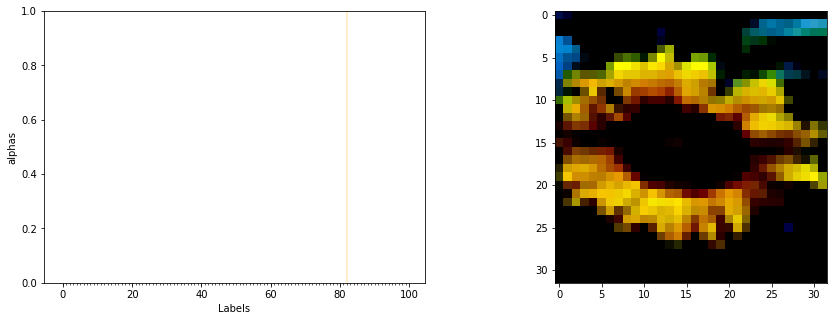

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([99]) tensor([82])
NAN or inf!
out:  tensor([10])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


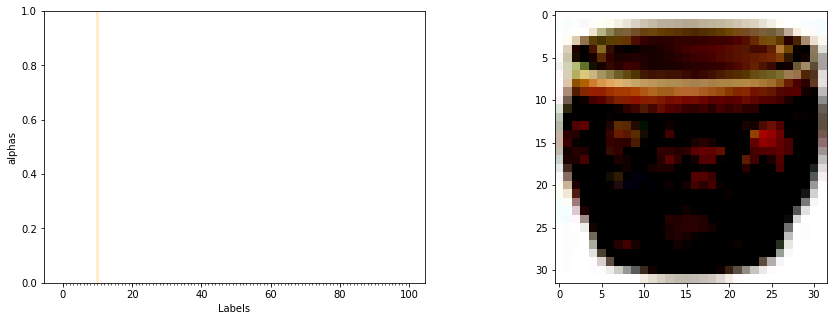

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([68]) tensor([10])
NAN or inf!
out:  tensor([77])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


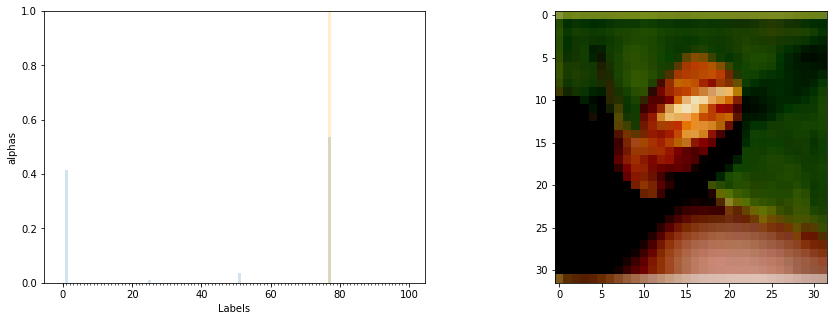

alphas:  tensor([6.0269e+19, 7.5055e+28, 1.6554e+19, 1.4165e+15, 4.6908e+16, 1.7278e+22,
        7.9535e+16, 1.6667e+19, 2.9210e+16, 3.7176e+17, 1.9360e+26, 8.4981e+24,
        2.1359e+12, 1.5092e+17, 6.9053e+17, 1.4843e+12, 1.5815e+25, 3.1557e+02,
        6.6206e+15, 3.7751e+16, 2.5179e+17, 5.1201e+09, 1.6654e+15, 1.4930e+09,
        1.4022e+12, 1.6793e+27, 3.8236e+18, 2.0298e+17, 1.2058e+25, 7.4584e+15,
        1.5955e+16, 3.9849e+13, 1.9985e+19, 2.4574e+20, 9.9682e+22, 2.8168e+16,
        5.2092e+25, 7.5727e+17, 1.2538e+19, 2.9822e+17, 1.5074e+11, 1.3814e+07,
        1.2712e+11, 2.8368e+15, 1.4084e+20, 1.6029e+21, 5.3545e+23, 2.1941e+09,
        1.0035e+02, 2.8749e+07, 1.6095e+14, 6.5093e+27, 2.7980e-02, 1.4732e+15,
        7.0098e+15, 3.3886e+23, 1.0073e+19, 5.5569e+16, 8.3340e+19, 6.5607e+08,
        4.5894e+00, 1.2436e+18, 2.4266e+13, 6.6601e+22, 5.8143e+18, 8.7169e+24,
        4.8815e+12, 8.5219e+21, 2.2697e+11, 2.4633e+13, 5.1100e+18, 2.9236e+13,
        5.7703e+20, 9.8919e+12,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


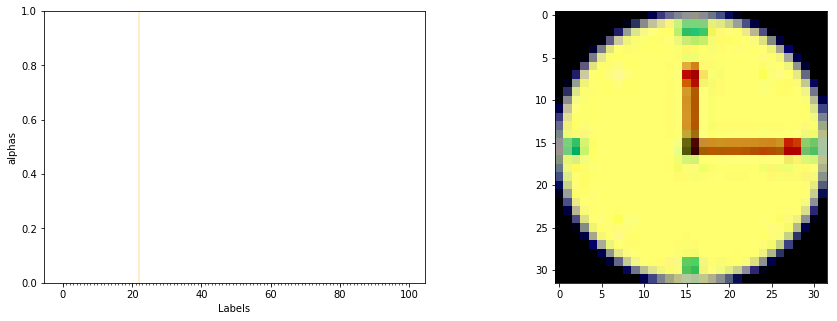

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([52]) tensor([22])
NAN or inf!
out:  tensor([71])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


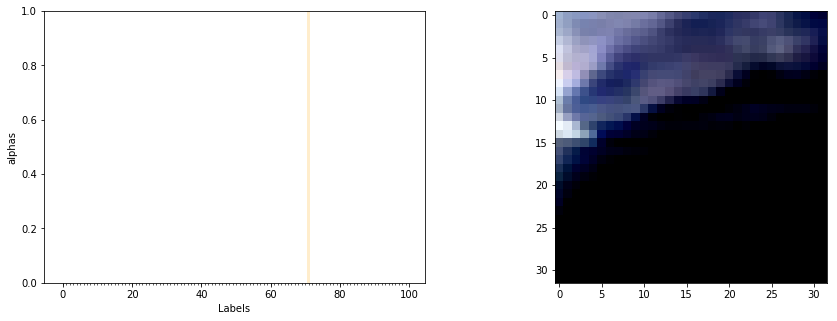

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([53]) tensor([71])
NAN or inf!
out:  tensor([10])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


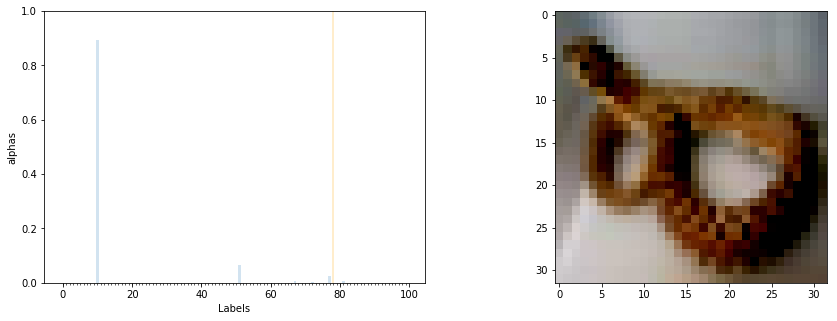

alphas:  tensor([2.6616e+14, 1.3949e+19, 8.7389e+24, 8.5689e+25, 3.1088e+22, 3.1635e+26,
        1.1314e+15, 4.4776e+26, 2.5908e+17, 7.0023e+20, 2.4902e+31, 1.4517e+18,
        1.5635e+14, 4.1042e+16, 7.8154e+22, 3.1998e+21, 1.3042e+19, 3.3859e+07,
        9.7204e+19, 1.2732e+16, 2.8656e+13, 2.0609e+04, 2.1637e+23, 2.7762e+18,
        6.5753e+19, 1.3022e+21, 1.8407e+23, 1.0809e+21, 3.5807e+21, 5.0212e+15,
        1.8942e+14, 2.0309e+12, 1.8378e+26, 1.6554e+26, 1.9690e+23, 1.1967e+19,
        3.0618e+26, 2.0445e+20, 1.6132e+19, 5.3597e+20, 3.8462e+13, 7.8217e+27,
        1.3055e+11, 1.7654e+13, 1.2729e+25, 9.3185e+24, 1.7879e+20, 1.2226e+07,
        5.3192e-02, 6.8960e+09, 9.4249e+21, 1.7832e+30, 2.2383e-02, 4.4485e+08,
        6.0075e+21, 1.6806e+21, 5.7510e+15, 2.6524e+20, 1.0338e+11, 7.9319e+13,
        1.4188e+08, 2.4795e+28, 8.3575e+08, 8.8753e+19, 1.3225e+21, 7.5998e+23,
        7.2846e+22, 1.6585e+29, 1.0151e+09, 5.5255e+18, 3.2151e+18, 1.2454e+05,
        4.0049e+28, 1.4239e+11,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


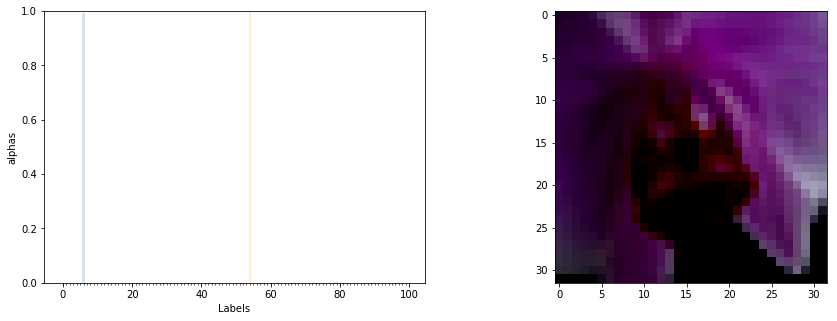

alphas:  tensor([3.4991e+16, 1.8560e+05, 7.4126e+09, 1.5538e+12, 4.5940e+17, 1.3610e+15,
        1.3696e+30, 2.4551e+23, 1.3793e+01, 3.6683e+14, 1.7578e+23, 8.6606e+15,
        4.0426e+13, 5.0078e+06, 1.1586e+17, 1.1198e+09, 1.7945e+20, 9.5887e+05,
        4.7473e+13, 1.2518e+07, 5.1627e+04, 1.4258e+09, 2.0196e+22, 2.1873e+14,
        2.8587e+12, 2.6420e+16, 9.4619e+12, 7.8568e+13, 1.8080e+15, 4.9907e+03,
        1.5950e+03, 5.6233e+16, 5.4764e+08, 1.0864e+13, 1.7100e+09, 1.7730e+12,
        3.1194e+08, 7.4334e+15, 4.2625e+07, 9.2774e+14, 2.2156e+19, 1.1014e+16,
        1.2315e+07, 1.5183e+04, 1.0837e+17, 3.6789e+23, 7.0293e+02, 5.1116e+22,
        3.4213e-02, 1.0387e+16, 4.5236e+19, 1.3800e+12, 1.6214e-01, 1.0878e+08,
        4.2157e+24, 1.8324e+16, 5.6189e-01, 1.6510e+09, 1.2562e+00, 6.7106e+14,
        8.7737e+15, 5.6935e+16, 6.4768e+27, 9.3925e+14, 7.8813e+10, 5.4491e+23,
        1.2781e+11, 1.7401e+19, 3.2489e+06, 5.8383e+18, 8.7447e+24, 1.4705e+08,
        7.8320e+09, 8.2184e+06,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


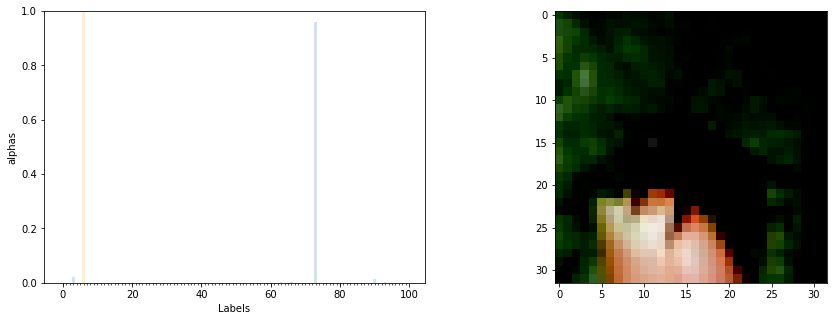

alphas:  tensor([1.1723e+02, 2.0978e+20, 2.8585e+28, 1.3717e+33, 2.7130e+27, 9.9570e+07,
        1.4007e+23, 1.0270e+30, 2.3950e+22, 8.6962e+13, 1.8512e+12, 3.9575e+19,
        2.2098e+24, 1.1010e+13, 7.5287e+30, 2.3074e+21, 4.0691e+21, 6.2169e+08,
        3.1040e+27, 1.0451e+22, 2.9140e+03, 8.8046e+21, 2.9890e+06, 1.4057e+20,
        6.7344e+21, 4.6203e+13, 1.1445e+17, 3.9983e+31, 9.9231e+15, 1.6610e+21,
        1.5823e+24, 2.9708e+18, 4.8480e+15, 3.2517e+25, 7.1980e+21, 1.5509e+13,
        4.3482e+13, 1.3561e+18, 2.2180e+22, 1.7504e+16, 9.4931e+09, 5.4881e+28,
        4.5169e+19, 2.5507e+25, 6.0032e+29, 8.7371e+25, 1.0123e+28, 1.1477e+24,
        1.7601e+23, 1.5738e-02, 2.0561e+25, 6.4854e+14, 7.0385e+17, 8.5694e+00,
        4.9310e+23, 1.6341e+28, 6.3129e+30, 3.4307e+19, 1.4661e+14, 1.0921e+09,
        2.5107e-02, 4.6328e+05, 5.6750e+00, 2.6106e+32, 3.7150e+26, 1.0291e+25,
        2.1401e+32, 3.4882e+26, 1.2233e+09, 2.9651e+28, 1.5403e+16, 2.1099e-02,
        1.9812e+18, 6.6966e+34,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


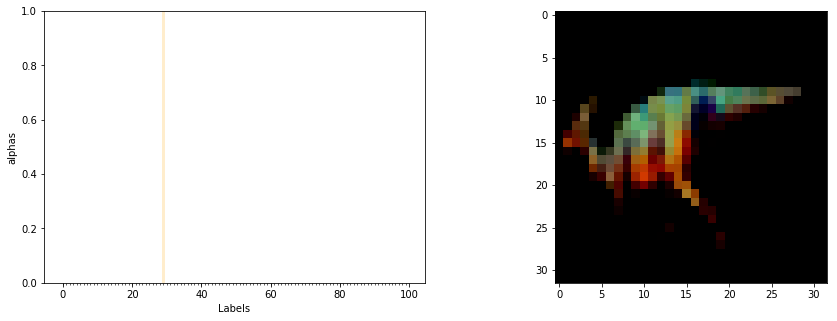

alphas:  tensor([1.0022e+21, 1.2047e+36, 2.0136e+23, 1.0446e+27, 5.5481e+28, 1.1374e+18,
        8.3127e+29, 3.1082e+24, 4.5603e+28, 5.8331e+10, 1.3961e+26, 2.4513e+27,
        6.4361e+29, 9.7604e+23, 5.6943e+04, 1.3968e+33, 9.3810e+14, 2.1841e+20,
        4.5404e+24, 6.8894e+27, 7.5339e+18, 4.9180e+21, 2.8876e+25, 6.3625e+16,
        2.0326e+11, 6.7383e+15, 2.5752e+25, 9.9544e+27, 1.1996e+26,        inf,
        4.3457e+23, 1.5148e+25, 4.6456e+18, 4.3263e+21, 2.5886e+22, 7.2441e+17,
        1.6848e+22, 3.5823e+17, 4.4338e+30, 5.1196e+17, 2.5071e+23, 3.0630e+25,
        5.9188e+25, 9.7747e+21, 8.5737e+28, 1.8905e+25, 3.6475e+32, 3.2457e+11,
        3.5144e+24, 6.2197e+22, 3.9631e+29, 2.1628e+34, 1.4343e-02, 1.1562e+07,
        2.1276e+26, 1.3375e+33, 9.2784e+19, 3.7874e+19, 3.6705e+20, 8.2242e+12,
        8.2432e+12, 6.3982e+15, 1.1021e+19, 5.1577e+10, 1.3813e+26, 9.3982e+22,
        5.1237e+23, 1.0730e+20, 4.7715e+13, 2.9017e+25, 1.1351e+27, 3.0026e+28,
        9.3092e+31, 1.4155e+27,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


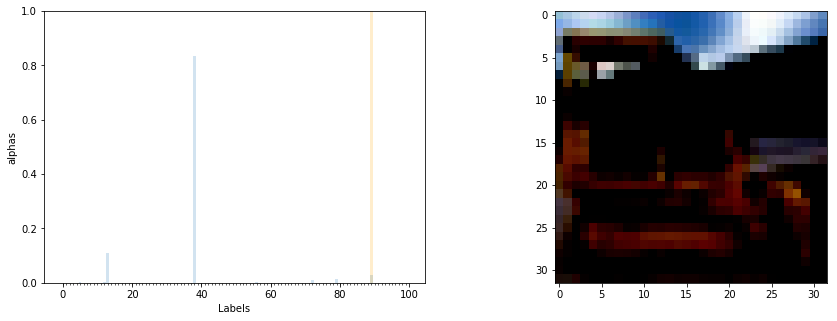

alphas:  tensor([4.3169e+03, 3.7313e-02, 1.0390e+13, 1.6397e+06, 8.9860e+07, 2.0639e+24,
        9.5278e+03, 2.0535e+03, 7.5743e+13, 2.0038e+08, 6.1586e+06, 1.5570e+05,
        2.3727e+24, 1.3832e+26, 1.4072e+12, 4.9385e+17, 3.3404e+15, 6.2976e+13,
        3.3613e+10, 6.0653e+20, 1.6071e+10, 1.0884e+00, 3.5287e+13, 5.7553e+07,
        1.0559e+07, 5.6946e+23, 1.9140e+09, 1.1723e+11, 9.6218e+08, 2.4180e+18,
        3.0529e+05, 9.6265e+18, 9.6766e+17, 6.4253e+21, 1.4474e+15, 1.4592e+12,
        5.7835e+06, 1.9727e+22, 1.0580e+27, 2.5351e+12, 4.7553e+07, 6.6790e+12,
        2.1271e+14, 7.2708e+09, 2.6074e+16, 5.4299e+12, 1.7008e+18, 9.5751e+01,
        5.7274e+20, 5.8874e+17, 1.3344e+14, 6.5033e+10, 1.1449e+16, 2.2704e-02,
        2.3484e+00, 3.9637e+19, 1.4853e+24, 6.9122e+04, 4.1865e+13, 8.7852e+07,
        7.0427e+20, 2.0161e-02, 6.4091e+01, 1.2224e-02, 3.9042e+14, 4.0792e+03,
        6.9988e+02, 1.1568e+07, 4.3133e+14, 4.2754e+16, 1.1266e+06, 1.7766e+16,
        1.4282e+25, 2.0612e+09,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


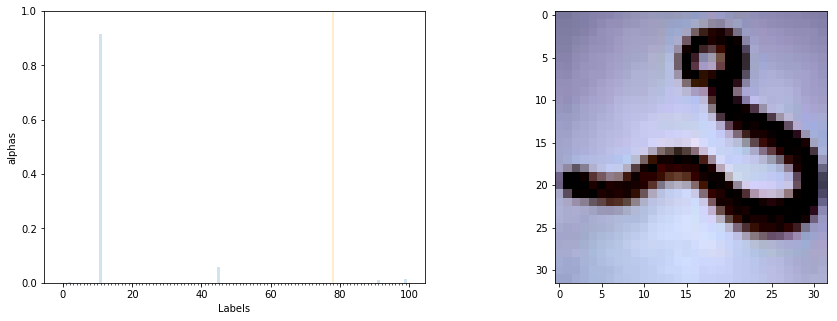

alphas:  tensor([3.2877e+11, 1.8013e+06, 2.5709e+29, 1.8870e+05, 1.6004e+20, 3.2249e+19,
        9.7304e+13, 1.7320e+24, 1.4387e+25, 8.7335e+17, 2.6051e+11, 8.2957e+31,
        7.1133e+06, 1.6175e+18, 2.2782e+00, 1.4434e+02, 3.2209e+09, 1.1326e+04,
        2.5718e+17, 3.8833e+09, 4.6198e+19, 9.3808e+00, 1.4505e+18, 3.6814e+14,
        7.3546e+27, 2.1720e+18, 1.5467e+19, 1.8870e+18, 4.0557e+11, 1.4674e+27,
        2.8370e+20, 7.9406e-03, 2.7586e+17, 7.2308e+14, 8.3550e+22, 1.1377e+28,
        4.0115e+17, 2.2677e+10, 1.7743e+23, 3.0209e+22, 5.4975e+17, 5.1356e+06,
        2.8172e+10, 7.4876e+05, 8.0599e+25, 5.2980e+30, 2.7236e+25, 8.4376e+08,
        5.7682e+18, 9.2551e+03, 7.2320e+25, 4.3920e+14, 1.6791e-02, 1.0121e+06,
        9.4172e+22, 5.1268e+22, 3.3254e+21, 6.1937e+16, 3.6351e+13, 8.2868e+06,
        4.1667e+05, 9.2787e+17, 3.6645e+06, 4.5690e+05, 2.4691e+09, 1.5733e+18,
        2.4355e+22, 1.0521e+16, 1.2781e-02, 3.1507e+14, 5.3997e+03, 8.6638e+04,
        2.0967e+19, 2.5919e+13,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100])


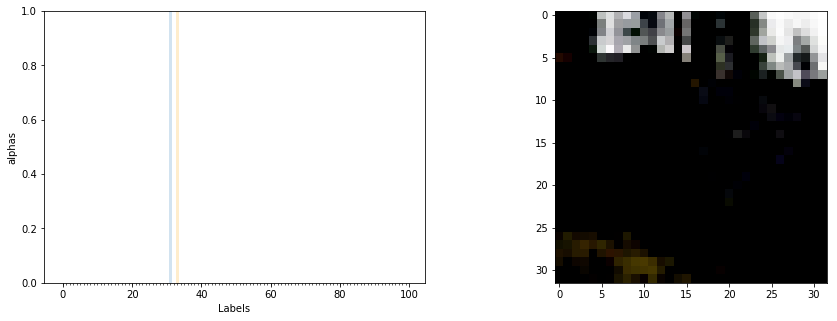

alphas:  tensor([9.1041e-02, 1.5408e+12, 5.8494e+16, 3.3389e+21, 3.4644e+14, 4.3753e+15,
        1.4873e+17, 1.2678e+14, 4.4949e+21, 1.3141e+16, 2.1889e+09, 1.8738e+13,
        2.7292e+21, 1.3176e+19, 6.8146e+10, 1.4030e+16, 4.5747e+14, 5.2804e+18,
        8.4747e+13, 2.5203e+21, 1.0920e+11, 1.5669e+16, 5.2816e+13, 2.1291e+16,
        1.0005e+09, 6.0437e+14, 6.8767e+14, 6.9454e+18, 1.4425e+14, 2.0749e+24,
        1.3626e+13, 6.6154e+28, 3.6380e+12, 5.7152e+22, 4.3150e+11, 4.5984e+09,
        1.6959e+08, 1.2995e+21, 9.8019e+21, 1.0463e+16, 5.5086e+15, 2.6884e+12,
        3.3503e+18, 3.5251e+07, 3.1770e+09, 1.1660e+16, 8.1911e+08, 9.4572e+20,
        6.3465e+11, 4.8239e+16, 1.7907e+15, 6.0388e+10, 1.5298e+18, 1.8506e-01,
        2.5571e+02, 2.4460e+18, 1.7636e+23, 2.6325e+08, 1.6280e+19, 5.7302e+22,
        2.6309e+01, 2.2890e+10, 1.1101e-01, 1.0137e+15, 6.6354e+17, 8.2675e+18,
        2.0102e+17, 1.6693e+16, 4.3014e+15, 1.8099e+10, 2.3417e+08, 1.3860e+02,
        5.1000e+20, 2.2785e+15,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


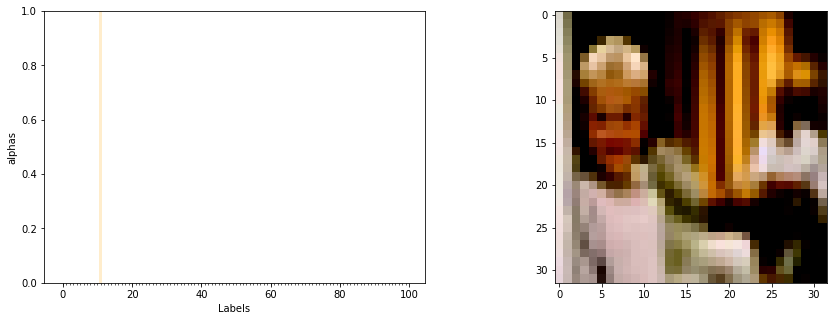

alphas:  tensor([1.3004e+26, 9.5123e+23, 1.2114e+26, 5.3757e+20, 1.1548e+27, 4.9203e+33,
        3.0371e+16, 4.5887e+20, 8.9349e+23, 8.2315e+35, 6.8161e+18, 2.3727e+34,
        1.1356e+15, 4.8387e+12, 4.5169e+35, 1.1672e+17, 3.0335e+33, 1.5499e+12,
        2.5201e+32, 1.1134e+18,        inf, 6.0339e+07, 2.8775e+18, 6.6547e+14,
        8.2991e+14,        inf, 3.5361e+22, 7.0932e+19, 3.6473e+22, 4.3406e+21,
        4.7675e+06, 1.7781e+15, 6.8953e+28, 3.7970e+29, 2.8996e+33, 4.0243e+26,
        3.7805e+29, 3.9311e+27, 3.5707e+30, 2.3899e+35, 8.0646e+22, 7.7110e+16,
        8.5633e+16, 1.7260e+21, 5.4336e+30, 1.1041e+34, 2.2905e+28, 3.6811e+13,
        1.5003e+01, 1.4908e-02, 1.1360e+26, 2.6659e+30, 8.6278e-01, 1.1621e+16,
        2.1754e+34, 2.1571e+28, 1.1914e+14, 1.7482e+35, 2.2636e+06, 6.4492e+16,
        1.4140e-02, 1.8096e+26, 1.1470e+24, 2.2093e+16, 1.5036e+20,        inf,
        2.1297e+17, 6.1669e+17, 1.6054e-02, 6.5134e+14, 1.1786e+33, 5.5297e-01,
        2.3445e+21, 1.7254e+05,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


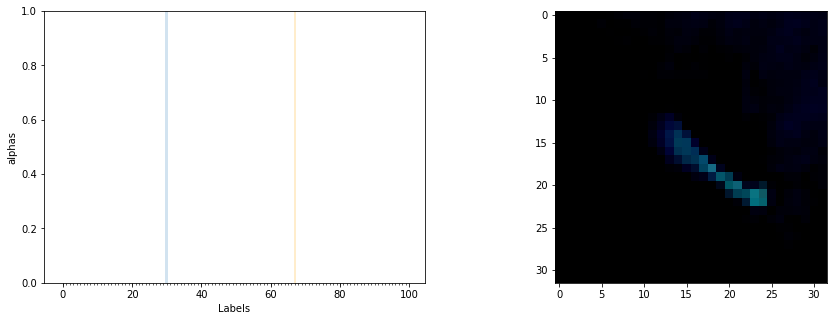

alphas:  tensor([2.5645e-01, 3.4256e+22, 1.1004e+06, 4.7488e+14, 1.2789e+25, 2.1702e+16,
        1.4226e+06, 5.9266e+19, 4.3868e+18, 2.2799e+25, 9.0105e+20, 2.6562e+17,
        4.2826e+12, 6.5348e+11, 6.7088e+03, 3.0300e+21, 1.0921e+14, 6.6401e+13,
        7.5269e+18, 1.3523e+14, 1.2283e+19, 2.3004e+19, 6.0984e+13, 1.7250e+26,
        2.8853e+12, 1.3810e+08, 7.6007e+24, 1.2787e+19, 2.5758e+21, 1.1618e+20,
        5.5069e+33, 2.0257e+16, 4.2587e+23, 2.3916e+16, 4.6900e+12, 4.3006e+07,
        3.6189e+06, 1.5442e+04, 1.4818e+22, 5.7613e+18, 2.6954e+23, 1.6718e+04,
        7.9141e+10, 4.2844e-02, 3.7708e+25, 1.7665e+22, 1.4892e+15, 3.9058e+14,
        1.8348e+16, 5.0412e+18, 1.0262e+15, 1.0938e+18, 2.1009e+02, 7.0778e-02,
        4.7770e+21, 1.7535e+21, 1.8586e+10, 4.8254e+14, 1.0385e+08, 1.8369e+13,
        8.5981e+13, 1.4980e+14, 3.0967e-02, 2.0659e+12, 1.2301e+21, 2.6528e+09,
        1.5653e+14, 8.7765e+22, 4.0357e+11, 4.2406e+21, 5.8431e+07, 8.4275e+20,
        2.3170e+22, 1.2626e+29,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([100])


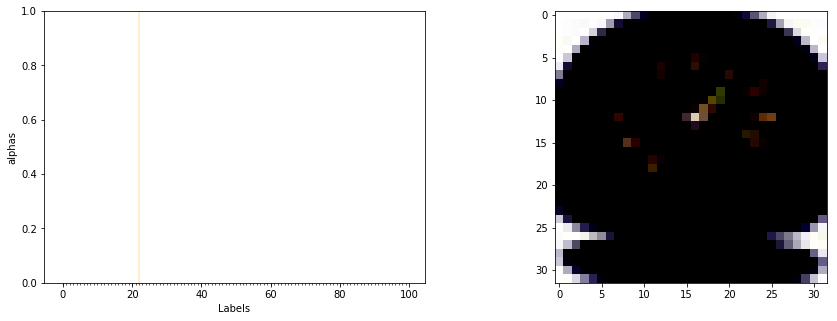

alphas:  tensor([8.5677e+11, 7.1226e+27, 1.0946e+21, 2.6208e+24,        inf, 2.5191e+29,
        6.8441e+23, 5.6257e+27, 2.6725e+29, 3.6156e+31, 8.1236e+33, 7.1209e+31,
        1.0341e+23, 1.2897e+22, 1.9507e+13, 2.6010e+23, 3.7311e+26, 1.1536e+25,
        4.0193e+32, 3.7545e+20, 4.9746e+20, 4.5137e+32, 8.5206e+34, 1.4961e+29,
        5.7066e+14, 1.1645e+32, 6.4413e+27, 5.1030e+22, 1.1352e+32, 3.1496e+25,
        1.2435e+28, 5.3054e+29, 5.7292e+24, 3.5325e+25, 3.0533e+19, 4.1439e+35,
        6.5061e+26, 3.3023e+17, 1.4435e+29, 2.1535e+33, 9.2891e+30, 6.6008e+17,
        2.3055e+29, 4.5219e+12, 7.7107e+28, 9.6589e+29, 4.8730e+32, 2.8278e+30,
        4.3734e+19, 7.1131e+23, 5.3734e+30, 2.0466e+17, 1.1832e+13, 3.1197e-02,
        1.1840e+17, 2.9653e+25, 1.7914e+19, 1.2482e+13, 3.7199e+14, 5.9347e+33,
        5.5899e+18, 8.6761e+32, 3.8961e+14, 4.8577e+18, 7.5320e+24, 1.5380e+17,
        5.0984e+26, 1.5273e+36, 2.6928e+23, 6.1415e+28, 2.0644e+20, 8.7208e+26,
        7.3430e+27, 1.0812e+27,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


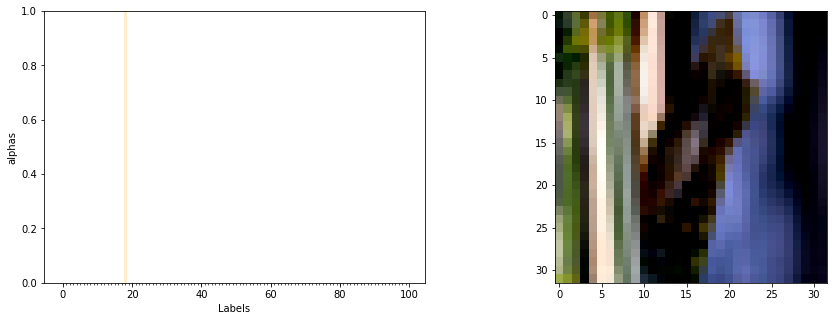

alphas:  tensor([1.4159e+24, 6.9509e+19, 1.5622e+34, 9.6030e+31, 3.4921e+30, 3.3473e+34,
        2.6186e+36, 6.0974e+29, 7.0967e+29,        inf, 1.2269e+27,        inf,
        2.9698e+25, 2.1269e+26,        inf, 1.0570e+35, 1.1832e+36, 9.2476e+28,
               inf, 2.1508e+29, 7.1862e+31, 1.0941e+27,        inf, 1.2912e+33,
               inf, 1.4238e+23, 1.0560e+35, 3.3321e+35, 1.7739e+32, 1.8055e+32,
        7.5593e+29, 2.7482e+26, 3.2751e+34, 7.3062e+28, 1.0831e+34,        inf,
        5.4193e+32, 1.9453e+31,        inf,        inf, 2.0967e+29, 5.7660e+21,
        1.9016e+21,        inf,        inf, 5.5529e+28, 1.1393e+36, 2.4133e+13,
        2.7214e+12, 1.7311e+17, 1.4750e+35,        inf, 2.7459e-02, 3.0991e+17,
        1.5592e+32,        inf, 1.6462e+19, 8.4143e+34, 2.1068e+03, 2.6119e+24,
        8.5252e+11,        inf, 1.9116e+25, 1.6668e+26,        inf,        inf,
        2.2930e+32,        inf, 4.2023e+16,        inf, 7.4926e+28, 2.1157e+05,
               inf, 3.5820e+30,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


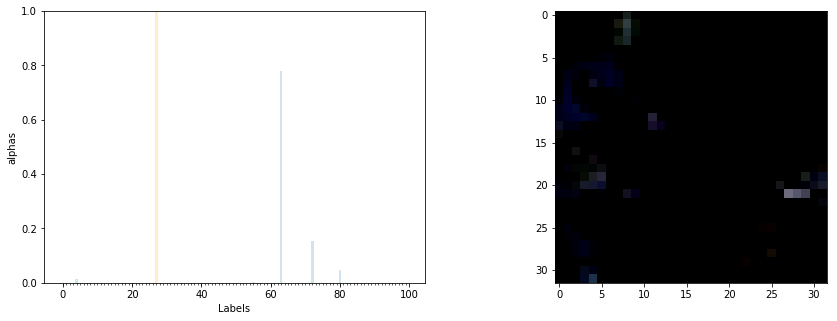

alphas:  tensor([1.0255e-01, 1.4697e+13, 8.0002e+15, 3.6445e+19, 2.4933e+24, 8.4364e+04,
        1.8743e+19, 4.9934e+16, 1.1590e+10, 3.5337e+12, 8.2807e+11, 3.9662e+12,
        2.0310e+15, 1.6905e+13, 3.7483e+15, 2.1507e+14, 1.7768e+12, 2.3982e+11,
        8.7695e+15, 2.3578e+15, 2.1519e+05, 1.6312e+17, 1.7284e+16, 9.4546e+09,
        2.0551e+13, 1.8984e+16, 9.1098e+14, 7.6854e+19, 1.6392e+02, 9.7769e+17,
        1.4432e+17, 5.2625e+15, 5.8032e+15, 5.9656e+11, 1.6238e+15, 8.6661e+09,
        1.8790e+00, 1.6046e+14, 4.8039e+15, 1.4976e+13, 1.1707e+19, 2.1957e+16,
        3.5877e+21, 4.8386e+09, 1.2304e+18, 4.0619e+19, 6.6481e+16, 3.3895e+08,
        3.9647e+15, 1.6735e+09, 1.3027e+17, 2.6202e+04, 5.4612e+09, 8.3503e-02,
        1.4782e-01, 6.0445e+23, 9.8356e+07, 5.5558e+20, 4.9451e+16, 1.4648e+14,
        2.8047e-02, 1.8491e+11, 6.2094e-02, 1.2497e+26, 1.2461e+21, 2.5718e+17,
        6.5400e+11, 3.3288e+18, 7.0976e+00, 6.8938e+14, 1.0344e+13, 1.5831e+00,
        2.4553e+25, 8.5077e+12,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


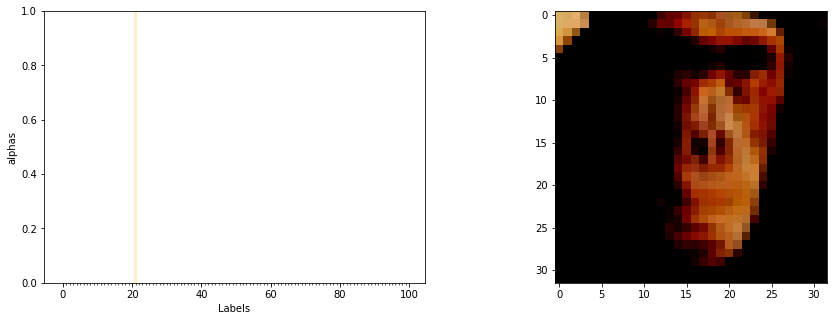

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([52]) tensor([21])
NAN or inf!
out:  tensor([13])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


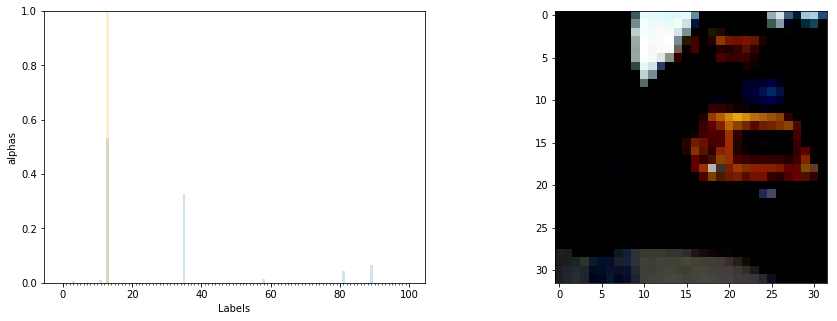

alphas:  tensor([1.3827e+11, 7.6694e+23, 4.4026e+29, 3.2851e+31, 1.5867e+28, 4.4416e+23,
        2.3949e+27, 8.1956e+16, 5.0548e+22, 1.7850e+22, 1.5664e+22, 4.8586e+31,
        2.2357e+25, 3.0239e+33, 3.7536e+24, 3.8845e+21, 5.7498e+25, 4.3706e+10,
        4.3262e+21, 7.9507e+27, 2.0723e+21, 6.9352e+21, 5.8820e+24, 5.5922e+19,
        1.9958e+16, 2.0123e+19, 1.1836e+26, 1.4603e+25, 5.0461e+24, 3.9741e+23,
        1.0642e+19, 1.2303e+20, 1.3694e+23, 1.7403e+19, 3.8385e+24, 1.8583e+33,
        5.8454e+09, 2.2139e+24, 4.2850e+23, 1.1473e+19, 1.8251e+24, 2.8265e+22,
        1.9428e+15, 1.6210e+21, 2.6536e+30, 1.9814e+22, 8.8940e+21, 5.9097e+03,
        1.7460e+31, 1.0189e+19, 3.9426e+18, 2.8247e+21, 1.4108e+02, 1.6173e+23,
        4.6462e+14, 2.7625e+23, 6.9836e+14, 2.4613e+21, 7.0262e+31, 2.2053e+15,
        3.7071e+06, 2.2938e+18, 1.5400e+21, 1.0580e+10, 1.8152e+20, 5.4075e+21,
        4.4412e+25, 8.8670e+18, 4.5490e+10, 1.7146e+20, 2.4930e+07, 8.8181e+16,
        7.5126e+25, 1.8004e+26,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


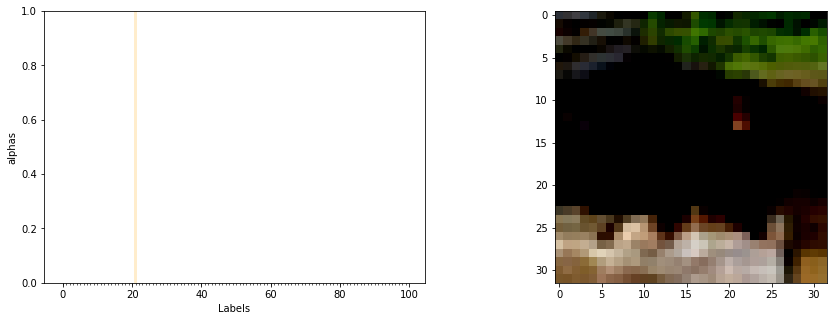

alphas:  tensor([4.1032e+08, 7.8996e+26, 1.4012e+29,        inf, 5.5205e+35, 5.0432e+19,
        1.1415e+25, 1.3146e+28, 3.6339e+33, 2.7749e+21, 1.0793e+31, 7.5132e+24,
        4.8245e+28, 2.8344e+23, 1.9718e+23, 1.7150e+30, 7.0238e+24, 5.1223e+20,
        1.7429e+29,        inf, 1.4592e+16,        inf, 5.4696e+24, 1.5687e+27,
        1.8360e+27, 1.3827e+28, 9.9207e+29, 2.3177e+31, 8.3269e+22, 1.4164e+25,
        2.8145e+29, 1.6056e+31, 3.6430e+28, 8.8090e+27, 1.0562e+27, 1.7426e+28,
        8.2599e+27, 1.8455e+29, 8.3304e+23, 2.4595e+22, 2.3770e+28, 1.9712e+26,
        8.1308e+30, 1.5321e+24, 1.3773e+26, 1.5643e+30, 1.3246e+28, 2.1409e+18,
        4.7389e+18, 2.0676e+15, 1.0696e+35, 7.7388e+17, 2.4596e+10, 3.4032e-02,
        1.9929e+08, 5.3656e+32, 5.5673e+26, 8.1439e+24, 2.0374e+24, 2.2467e+28,
        1.7471e+12, 1.1519e+18, 2.2831e+13, 1.9046e+31, 3.9993e+33,        inf,
        1.4922e+33, 6.9775e+27, 4.5602e+19, 1.4668e+24, 3.2724e+16, 1.4740e+13,
        9.1377e+33, 4.2011e+24,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


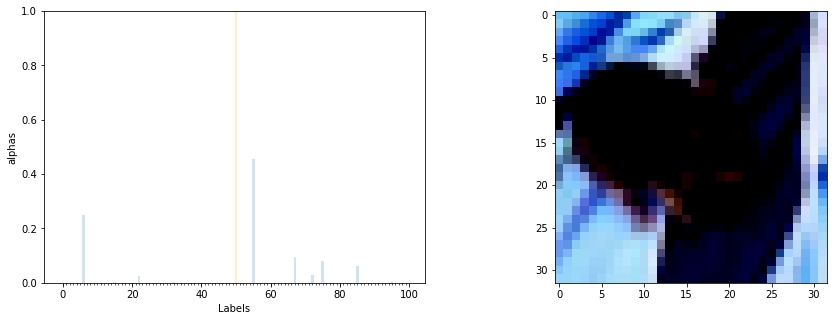

alphas:  tensor([2.1297e+11, 4.0988e+05, 1.7124e+14, 3.5140e+11, 4.1846e+09, 5.4857e+12,
        1.0424e+17, 6.4979e+12, 2.1672e+08, 1.8253e+08, 1.3076e+10, 1.0014e+08,
        2.8587e+08, 1.2723e+05, 1.8294e+10, 5.7974e+14, 1.8207e+10, 2.3391e+00,
        7.7567e+05, 4.1945e+08, 6.1928e+09, 1.7104e+01, 9.7071e+15, 5.4419e+00,
        8.5378e+08, 1.5962e+11, 1.1101e+09, 3.2934e+11, 1.8237e+12, 8.9141e+08,
        8.0673e+12, 6.1635e+04, 1.4044e+15, 6.9088e+09, 2.3830e+11, 1.1315e+04,
        8.6481e+09, 6.5917e+12, 2.8888e+10, 6.2885e+13, 2.3396e+14, 7.4951e+09,
        3.3930e+11, 4.6219e-02, 1.0821e+08, 2.1756e+09, 2.5050e+06, 1.5820e+04,
        3.8401e-02, 4.6583e+06, 4.6571e+09, 1.1307e+08, 2.6154e+03, 6.2742e+04,
        1.5857e+06, 1.9015e+17, 2.2546e+07, 1.5797e+07, 1.0207e+10, 1.4570e+04,
        2.1254e-02, 2.3272e+11, 5.6635e+01, 4.2373e+11, 3.8256e+11, 3.3789e+11,
        1.3847e+13, 3.9694e+16, 3.7968e+02, 3.2190e+05, 8.5192e+09, 2.1752e-02,
        1.2379e+16, 8.2985e+08,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


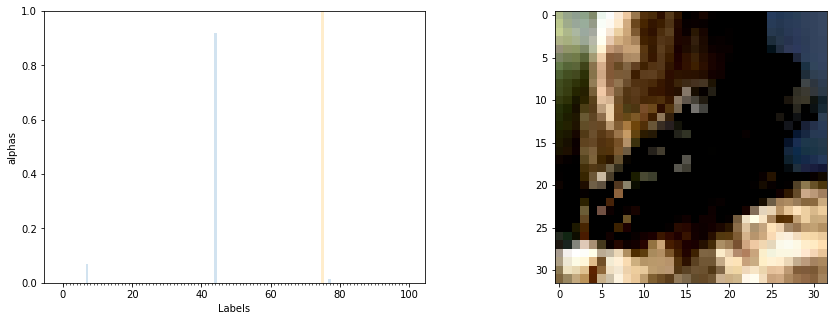

alphas:  tensor([2.1722e+04, 3.9943e+08, 4.8304e+18, 3.9633e+16, 4.0041e+13, 5.3753e+03,
        2.3712e+25, 1.0311e+32, 1.7134e+24, 6.6138e+25, 1.6109e+18, 2.3596e+15,
        5.7035e+07, 5.2803e+10, 8.7054e+23, 5.8923e+13, 1.5005e+21, 3.6870e-02,
        7.1038e+24, 8.1600e+11, 5.0772e+08, 2.6633e+16, 1.9526e+13, 9.1203e+04,
        4.9032e+23, 1.7496e+13, 2.2693e+27, 1.0678e+17, 1.3748e+14, 5.0289e+20,
        2.1226e+10, 2.5103e+09, 1.7622e+18, 4.4526e+15, 3.2292e+20, 1.4841e+10,
        8.6464e+11, 4.3989e+13, 2.7976e+16, 9.8378e+18, 9.5518e+15, 8.3417e+28,
        1.9416e+17, 5.1295e+09, 1.4068e+33, 1.3077e+23, 6.1027e+13, 3.6156e+14,
        1.8354e+18, 1.0412e+06, 6.4093e+29, 1.7076e+12, 5.7999e+00, 1.5034e-01,
        5.2087e+16, 1.3818e+18, 3.4239e+20, 8.7304e+19, 5.5103e+02, 3.9471e+25,
        3.3955e-02, 1.2819e+12, 3.8982e+04, 7.9917e+29, 2.0576e+23, 3.4040e+25,
        6.5845e+25, 1.1425e+27, 9.3680e+01, 4.0516e+05, 6.7985e+19, 6.5646e+04,
        1.0327e+18, 2.4996e+23,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


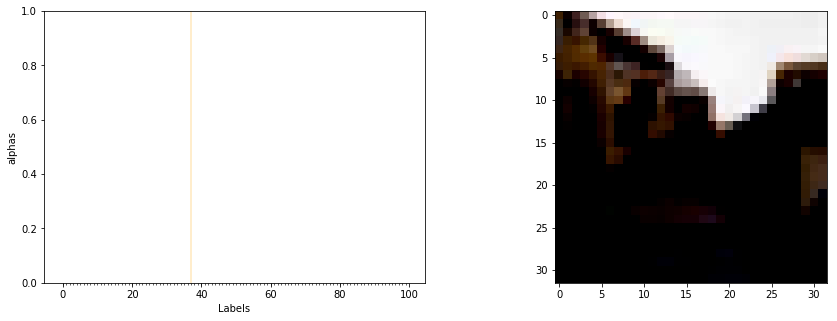

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([99]) tensor([37])
NAN or inf!
out:  tensor([32])
torch.Size([100])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


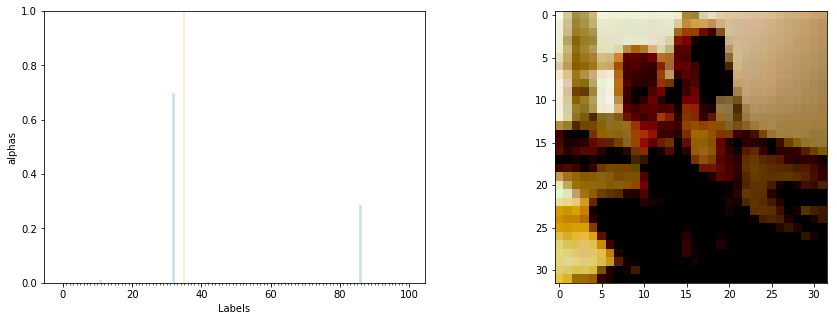

alphas:  tensor([6.8297e+13, 9.3805e+12, 5.5157e+22, 9.3738e+17, 1.0895e+22, 9.2594e+11,
        4.2131e+11, 1.9579e+07, 5.0313e+17, 1.8795e+22, 7.5023e+14, 1.8610e+25,
        5.9145e+12, 1.6339e+14, 3.1008e+14, 5.2284e+21, 1.5515e+12, 5.1977e+15,
        1.2356e+12, 4.3611e+13, 1.6893e+19, 1.2684e+12, 1.9897e+16, 1.1722e+09,
        3.8520e+10, 2.8508e+21, 5.3410e+14, 3.3136e+20, 1.3753e+17, 2.2814e+14,
        3.5532e+14, 9.8664e+09, 1.4067e+27, 1.8863e+19, 1.8103e+14, 1.9703e+21,
        4.2885e+19, 4.3997e+13, 1.4803e+19, 1.7722e+20, 5.3643e+20, 9.3649e+09,
        2.8899e+24, 1.6464e+24, 1.3015e+16, 7.4559e+18, 1.4310e+22, 7.9421e+06,
        3.3698e+08, 2.1689e+12, 8.1961e+08, 6.9946e+17, 9.7805e-03, 5.1428e+10,
        4.5056e+10, 1.4226e+18, 7.9581e+11, 2.4575e+15, 2.4499e+11, 7.3949e+08,
        1.1692e-02, 7.6073e+12, 5.4932e+07, 5.7881e+12, 3.6362e+24, 1.6768e+21,
        1.7548e+17, 5.1129e+11, 1.5796e-02, 1.4944e+13, 9.4773e+10, 2.6152e+05,
        5.4638e+20, 4.0517e+07,

(0.1282051282051282, 0.28)

In [283]:
CIFAR100_net = LPADirNN_CIFAR(num_classes = 100)
print("loading model from: {}".format(CIFAR100_PATH))
CIFAR100_net.load_state_dict(torch.load(CIFAR100_PATH))
CIFAR100_net.eval()
evaluate_CIFAR100(model=CIFAR100_net, 
               mus_w_mean=mus_w_mean_CIFAR100,
               mus_b_mean=mus_b_mean_CIFAR100,
               sigmas_w_mean=sigmas_w_mean_CIFAR100,
               sigmas_b_mean=sigmas_b_mean_CIFAR100,
               show=True,
               test_size=99)

In [284]:
CIFAR100_net = LPADirNN_CIFAR(num_classes = 100)
print("loading model from: {}".format(CIFAR100_HESS_PATH))
CIFAR100_net.load_state_dict(torch.load(CIFAR100_PATH))
CIFAR100_net.eval()
evaluate_CIFAR10(model=CIFAR100_net, 
               mus_w_mean=mus_w_mean_CIFAR100,
               mus_b_mean=mus_b_mean_CIFAR100,
               sigmas_w_mean=sigmas_w_mean_CIFAR100,
               sigmas_b_mean=sigmas_b_mean_CIFAR100,
               show=False,
               test_size=99)

loading model from: models/CIFAR100_Hess_model.pth
out:  tensor([80])
alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([52]) tensor([3])
NAN or inf!
out:  tensor([90])
alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, nan, 

/home/marius/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


alphas:  tensor([5.7547e+12, 1.9667e+13, 2.5860e+09, 4.3096e+08, 2.1427e+13, 1.8328e+13,
        4.2548e+17, 6.9595e+06, 2.1978e+12, 1.3770e+16, 9.7131e+16, 6.2713e+14,
        2.7801e+16, 6.1473e+02, 2.1068e+18, 1.5650e+14, 4.8168e+11, 2.3665e+12,
        4.7866e+18, 2.3897e+17, 9.4794e+03, 2.0845e+01, 1.1641e+13, 1.7208e+06,
        7.3169e+11, 3.3847e+16, 9.1219e+09, 1.6954e+18, 7.3389e+12, 1.1910e+10,
        3.3663e+04, 1.6407e+14, 1.8485e+14, 2.8099e+19, 4.6764e+11, 9.0009e+18,
        9.0506e+20, 2.1477e+12, 3.3640e+23, 7.7852e+11, 3.4571e+10, 3.1501e+08,
        5.5712e+15, 4.8770e+10, 2.6317e+13, 2.2298e+15, 2.5145e+11, 1.7836e+08,
        3.2138e-01, 3.3704e+13, 1.1057e+21, 1.2441e+13, 1.9369e-01, 9.6670e+00,
        1.7072e+07, 1.1671e+09, 1.9738e+25, 5.6072e+11, 2.8434e-02, 3.1418e+21,
        7.3328e-02, 1.3261e+16, 2.2929e+08, 5.7673e+14, 2.2035e+19, 1.0982e+27,
        1.7181e+17, 5.1511e+15, 1.9682e+22, 1.0437e+06, 2.5477e+15, 1.0889e-01,
        2.3835e+10, 5.2269e+07,

alphas:  tensor([1.5763e-02, 2.0828e+25,        inf, 1.6811e+24, 2.1187e+19,        inf,
        4.3441e+15, 5.0818e+20,        inf, 2.1908e+35, 9.1880e+23,        inf,
        2.1395e+33,        inf, 2.9983e+11, 2.8389e+21, 2.9970e+34, 1.0631e+32,
        7.7502e+28, 1.7586e+32, 3.7254e+28, 1.2708e+18, 1.3015e+20, 4.7089e+26,
        3.7420e+09,        inf, 7.4808e+17, 1.5217e+26, 1.9893e+30, 1.4166e+25,
        1.6003e+24, 7.1909e+28, 1.1663e+32, 4.2663e+30, 1.3071e+21, 3.7176e+31,
        6.6170e+09,        inf,        inf, 2.3179e+25, 3.9855e+13, 3.1271e+19,
        9.5895e+28, 7.9290e+22, 1.4915e+25, 7.7560e+23, 1.9472e+33, 1.9756e+23,
        9.0735e+29, 1.3644e+28, 5.1067e+17, 2.9606e+14, 2.9914e+12, 1.3545e-02,
        7.1157e+12, 2.9936e+16, 2.5213e+16, 1.0594e+08,        inf, 8.9489e+33,
        1.9458e+05, 8.9572e+19, 1.1704e+18, 1.7817e+15, 8.7579e+17, 2.1171e+21,
        3.3802e+12, 1.3055e+19, 4.2277e+19, 1.8262e+28, 1.5361e+14, 2.6596e+24,
        1.0641e+22, 2.5121e+17,

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([53]) tensor([0])
NAN or inf!
out:  tensor([95])
alphas:  tensor([2.9874e+02, 8.4084e+24, 2.8539e+10, 4.2765e+18, 3.0690e+31, 3.5791e+22,
        4.5639e+18, 6.9175e+18, 4.5237e+26, 1.5706e+26, 2.2866e+19, 9.7427e+12,
        2.6567e+23, 6.6014e+18, 6.9847e+14, 5.0760e+25, 4.0445e+24, 4.6206e+19,
        1.7513e+25, 1.8031e+14, 2.0405e+16, 6.5674e+19, 1.2337e+14, 7.4588e+22,
        1.3715e+22, 9.5039e+27, 8.4448e+28, 

out:  tensor([58])
alphas:  tensor([3.1647e-02, 8.1739e+23, 5.6602e+25, 2.3058e+33, 4.2139e+24, 6.1006e+23,
        2.2079e+26, 3.8393e+27, 3.8229e+24, 4.6402e+09, 4.4685e+27, 6.5213e+27,
        1.6723e+19, 3.7696e+35, 2.9523e+20, 2.7878e+24, 2.5890e+25, 5.3967e+09,
        1.4648e+16, 4.1341e+33, 9.3497e+07, 7.5029e+27, 2.8203e+18, 2.6941e+16,
        4.5566e+15, 6.3893e+28, 7.3980e+27, 4.4383e+25, 1.0241e+26, 1.7143e+28,
        7.5604e+07, 1.5023e+19, 9.9504e+27, 7.4326e+15, 1.9493e+17, 2.9325e+25,
        9.8378e+08, 3.8128e+27, 1.3504e+21, 1.7042e+26, 5.9681e+22, 2.3526e+21,
        2.0153e+16, 1.5014e+19, 1.7436e+26, 5.2843e+25, 1.8903e+26, 1.6138e+01,
        1.8431e+27, 1.0635e+11, 2.4649e+24, 4.1069e+11, 3.0659e+05, 2.5750e-02,
        7.4557e+03, 3.0777e+27, 4.7390e+12, 1.5581e+18,        inf, 6.1126e+24,
        8.9442e+02, 3.1740e+14, 2.4248e+17, 7.1662e+22, 8.0717e+33, 3.2211e+24,
        2.3595e+21, 3.5633e+13, 8.3506e+03, 7.6991e+15, 4.7292e+13, 1.1664e-02,
        3.62

compare pred, true:  tensor([53]) tensor([1])
NAN or inf!
out:  tensor([48])
alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([68]) tensor([9])
NAN or inf!
out:  tensor([30])
alphas:  tensor([2.4576e+14, 1.1137e+15, 1.1361e+25, 1.7904e+22, 1.3400e+22, 1.0530e+11,
        3.1527e+23, 8.6840e+15, 9.1993e+13, 2.0569e+15, 1.1726e+22, 5.1573e+23,
        1.2691e+14, 4.2808e+15, 2.3498e+12, 1.0562e+21, 2.6890e+18, 1.2446e+11,
        3.6663e+16, 6.4793e+16, 6.7561e+06, 1.0

alphas:  tensor([1.4722e+06, 1.3764e+20, 1.0542e+28, 4.2051e+16, 2.4506e+14, 9.7346e+30,
        3.3905e+03, 2.2324e+30, 2.3567e+16, 2.0222e+32,        inf, 8.4030e+22,
        1.5936e+30,        inf, 1.4112e+10, 8.1927e+14, 3.0907e+30, 1.3129e+16,
        2.9457e+16, 1.7922e+26, 1.5591e+24, 1.6330e+27, 8.3896e+27, 3.4391e+16,
        5.9800e+14, 2.9569e+32, 6.2807e+23, 4.7632e+32, 1.9802e+31, 1.4170e+21,
        9.1364e+28, 1.3556e+15, 4.2664e+30, 3.5119e+21, 5.1952e+17,        inf,
        3.0756e+20, 1.5940e+34, 2.4776e+29, 1.3086e+27, 7.4346e+29, 1.7246e+15,
        5.9045e+07, 1.3918e-01, 2.2349e+29, 1.1177e+15, 4.8390e+22, 1.4583e+01,
        1.0061e+17, 2.7400e+19, 1.7013e+12, 1.5433e+11, 2.7688e-02, 1.8279e-02,
        9.3366e+13, 1.1622e+18, 2.9083e+04, 2.6556e+16, 1.4361e+34, 1.8132e+18,
        1.0538e+10, 9.8178e+24, 6.8734e+09, 3.1440e+19, 1.3136e+35, 4.3891e+24,
        1.8231e+28, 1.0821e+28, 5.9843e+14, 6.1098e+20, 1.4755e+10, 7.5297e+34,
        2.1257e+31, 5.5063e+34,

alphas:  tensor([nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([0]) tensor([8])
NAN or inf!
out:  tensor([95])
alphas:  tensor([9.7588e+08, 2.0071e+25, 9.1493e+24, 1.6584e+23, 3.2248e+24, 1.0610e+24,
        4.5014e+18, 3.0669e+19, 1.5614e+21, 5.2160e+28, 3.7356e+22, 1.2024e+25,
        2.4798e+29, 2.9966e+24, 5.1713e+31, 4.5834e+22, 1.6753e+20, 2.9035e+31,
        2.6888e+21, 8.9145e+23, 1.1340e+25, 8.9612e+14, 1.6947e+18, 6.4810e+28,
        4.5207e+16, 1.6608e+25, 4.3190e+25, 3

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([99]) tensor([3])
NAN or inf!
out:  tensor([78])
alphas:  tensor([1.4712e-01, 1.9093e+14, 6.9673e+19, 9.1755e+24, 1.9939e+30, 1.7921e+18,
        6.6768e+13, 1.5302e+26, 4.2511e+19, 6.8842e+15, 7.2605e+21, 2.1940e+18,
        6.3428e+21, 2.6989e+17, 1.3674e+14, 3.0144e+26, 1.7377e+21, 3.7134e+08,
        1.5811e+18, 5.7390e+24, 9.6464e+07, 5.6670e+20, 2.6588e+29, 4.7129e+07,
        2.5981e+22, 3.1202e+19, 7.0925e+18, 

alphas:  tensor([1.7003e+04, 1.1904e+21, 3.9792e+32, 2.6872e+32, 1.3078e+24, 5.0199e+27,
        3.2268e+10, 4.1808e+31, 6.7441e+30, 6.4133e+33, 1.8876e+34, 1.7588e+33,
               inf, 1.8701e+20, 1.4693e+31, 1.9658e+29, 4.6064e+28, 1.4060e+18,
        1.2732e+34, 1.9052e+35, 6.0029e+33, 1.0293e+04, 4.5834e+32, 8.9877e+18,
               inf,        inf,        inf, 2.3788e+31,        inf, 2.1573e+31,
        1.5739e+23, 2.8268e+19, 5.1034e+23, 5.0247e+27, 1.9835e+29, 2.3297e+21,
        4.5192e+20, 1.8994e+29, 7.4465e+33, 1.7644e+21, 5.6260e+34,        inf,
        5.2663e+31, 1.5209e+24,        inf, 4.5228e+30, 1.5512e+21, 2.7240e+11,
               inf, 4.9551e+19, 2.1769e+32, 5.2853e+24, 7.3268e-03, 2.3555e+01,
        6.6914e+31,        inf, 2.2942e+02, 2.7349e+32, 1.2708e+22, 3.6873e+08,
        1.6411e+25, 5.5566e+34, 1.8457e+11, 1.8676e+18, 1.6144e+24, 1.7728e+32,
        4.0331e+14, 2.2479e+25, 9.4317e+19,        inf, 4.8067e+32, 4.4797e+32,
               inf, 1.6432e+29,

alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, nan, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, nan, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf])
compare pred, true:  tensor([52]) tensor([1])
NAN or inf!
out:  tensor([58])
alphas:  tensor([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
        inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, 

alphas:  tensor([2.2905e+02, 2.6209e+08,        inf, 6.8890e+29, 2.1503e+10,        inf,
        8.7100e+09, 9.5943e+35,        inf,        inf, 2.9001e+18,        inf,
               inf,        inf, 6.7307e+13, 1.8636e+26, 2.1040e+26, 8.6085e+33,
        1.4284e+16, 1.6448e+28, 1.1170e+35, 5.0624e+21,        inf,        inf,
        5.5047e+35,        inf, 2.8166e+32, 4.8914e+32, 3.0348e+17,        inf,
        2.2431e+24, 3.8935e+06, 1.6704e+32, 1.2678e+26, 1.2935e+23,        inf,
        2.7878e+02, 1.1642e+33, 2.4321e+26,        inf, 2.4841e+35,        inf,
        4.9401e+09, 1.0731e-02, 3.9561e+26, 6.1083e+29,        inf, 4.9315e+13,
        9.2483e+16, 3.9573e+30, 1.4539e+20, 5.9612e+17, 1.8843e+16, 6.1339e+14,
               inf, 3.1786e+23, 2.1160e+23,        inf, 5.2306e+35, 4.6386e+29,
        1.5163e+22, 5.8653e+30, 2.2572e+15, 9.4449e+11, 4.6892e+22, 2.1230e+24,
        1.3198e+20, 8.6075e+19, 3.6706e+17,        inf, 1.0085e+06,        inf,
        5.2907e+35, 9.1844e+21,

(0.0, 0.01)

In [323]:
# just rip the code of densenet on pytorch
import re
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.checkpoint as cp
from collections import OrderedDict
from torchvision.models.utils import load_state_dict_from_url


__all__ = ['DenseNet', 'densenet121', 'densenet169', 'densenet201', 'densenet161']

model_urls = {
    'densenet121': 'https://download.pytorch.org/models/densenet121-a639ec97.pth',
    'densenet169': 'https://download.pytorch.org/models/densenet169-b2777c0a.pth',
    'densenet201': 'https://download.pytorch.org/models/densenet201-c1103571.pth',
    'densenet161': 'https://download.pytorch.org/models/densenet161-8d451a50.pth',
}


def _bn_function_factory(norm, relu, conv):
    def bn_function(*inputs):
        concated_features = torch.cat(inputs, 1)
        bottleneck_output = conv(relu(norm(concated_features)))
        return bottleneck_output

    return bn_function


class _DenseLayer(nn.Sequential):
    def __init__(self, num_input_features, growth_rate, bn_size, drop_rate, memory_efficient=False):
        super(_DenseLayer, self).__init__()
        self.add_module('norm1', nn.BatchNorm2d(num_input_features)),
        self.add_module('relu1', nn.ReLU(inplace=True)),
        self.add_module('conv1', nn.Conv2d(num_input_features, bn_size *
                                           growth_rate, kernel_size=1, stride=1,
                                           bias=False)),
        self.add_module('norm2', nn.BatchNorm2d(bn_size * growth_rate)),
        self.add_module('relu2', nn.ReLU(inplace=True)),
        self.add_module('conv2', nn.Conv2d(bn_size * growth_rate, growth_rate,
                                           kernel_size=3, stride=1, padding=1,
                                           bias=False)),
        self.drop_rate = drop_rate
        self.memory_efficient = memory_efficient

    def forward(self, *prev_features):
        bn_function = _bn_function_factory(self.norm1, self.relu1, self.conv1)
        if self.memory_efficient and any(prev_feature.requires_grad for prev_feature in prev_features):
            bottleneck_output = cp.checkpoint(bn_function, *prev_features)
        else:
            bottleneck_output = bn_function(*prev_features)
        new_features = self.conv2(self.relu2(self.norm2(bottleneck_output)))
        if self.drop_rate > 0:
            new_features = F.dropout(new_features, p=self.drop_rate,
                                     training=self.training)
        return new_features


class _DenseBlock(nn.Module):
    def __init__(self, num_layers, num_input_features, bn_size, growth_rate, drop_rate, memory_efficient=False):
        super(_DenseBlock, self).__init__()
        for i in range(num_layers):
            layer = _DenseLayer(
                num_input_features + i * growth_rate,
                growth_rate=growth_rate,
                bn_size=bn_size,
                drop_rate=drop_rate,
                memory_efficient=memory_efficient,
            )
            self.add_module('denselayer%d' % (i + 1), layer)

    def forward(self, init_features):
        features = [init_features]
        for name, layer in self.named_children():
            new_features = layer(*features)
            features.append(new_features)
        return torch.cat(features, 1)


class _Transition(nn.Sequential):
    def __init__(self, num_input_features, num_output_features):
        super(_Transition, self).__init__()
        self.add_module('norm', nn.BatchNorm2d(num_input_features))
        self.add_module('relu', nn.ReLU(inplace=True))
        self.add_module('conv', nn.Conv2d(num_input_features, num_output_features,
                                          kernel_size=1, stride=1, bias=False))
        self.add_module('pool', nn.AvgPool2d(kernel_size=2, stride=2))


class DenseNet(nn.Module):
    r"""Densenet-BC model class, based on
    `"Densely Connected Convolutional Networks" <https://arxiv.org/pdf/1608.06993.pdf>`_

    Args:
        growth_rate (int) - how many filters to add each layer (`k` in paper)
        block_config (list of 4 ints) - how many layers in each pooling block
        num_init_features (int) - the number of filters to learn in the first convolution layer
        bn_size (int) - multiplicative factor for number of bottle neck layers
          (i.e. bn_size * k features in the bottleneck layer)
        drop_rate (float) - dropout rate after each dense layer
        num_classes (int) - number of classification classes
        memory_efficient (bool) - If True, uses checkpointing. Much more memory efficient,
          but slower. Default: *False*. See `"paper" <https://arxiv.org/pdf/1707.06990.pdf>`_
    """

    def __init__(self, growth_rate=32, block_config=(6, 12, 24, 16),
                 num_init_features=64, bn_size=4, drop_rate=0, num_classes=1000, memory_efficient=False):

        super(DenseNet, self).__init__()

        # First convolution
        self.features = nn.Sequential(OrderedDict([
            ('conv0', nn.Conv2d(3, num_init_features, kernel_size=7, stride=2,
                                padding=3, bias=False)),
            ('norm0', nn.BatchNorm2d(num_init_features)),
            ('relu0', nn.ReLU(inplace=True)),
            ('pool0', nn.MaxPool2d(kernel_size=3, stride=2, padding=1)),
        ]))

        # Each denseblock
        num_features = num_init_features
        for i, num_layers in enumerate(block_config):
            block = _DenseBlock(
                num_layers=num_layers,
                num_input_features=num_features,
                bn_size=bn_size,
                growth_rate=growth_rate,
                drop_rate=drop_rate,
                memory_efficient=memory_efficient
            )
            self.features.add_module('denseblock%d' % (i + 1), block)
            num_features = num_features + num_layers * growth_rate
            if i != len(block_config) - 1:
                trans = _Transition(num_input_features=num_features,
                                    num_output_features=num_features // 2)
                self.features.add_module('transition%d' % (i + 1), trans)
                num_features = num_features // 2

        # Final batch norm
        self.features.add_module('norm5', nn.BatchNorm2d(num_features))

        # Linear layer
        self.classifier = nn.Linear(num_features, num_classes)

        # Official init from torch repo.
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.constant_(m.bias, 0)

    def forward(self, x, phi=False):  #added phi
        features = self.features(x)
        out = F.relu(features, inplace=True)
        out = F.adaptive_avg_pool2d(out, (1, 1))
        out = torch.flatten(out, 1)
        if phi:              #changed
            return(out)      #changed
        else:               #changed
            out = self.classifier(out)     #changed
            return out            #changed


def _load_state_dict(model, model_url, progress):
    # '.'s are no longer allowed in module names, but previous _DenseLayer
    # has keys 'norm.1', 'relu.1', 'conv.1', 'norm.2', 'relu.2', 'conv.2'.
    # They are also in the checkpoints in model_urls. This pattern is used
    # to find such keys.
    pattern = re.compile(
        r'^(.*denselayer\d+\.(?:norm|relu|conv))\.((?:[12])\.(?:weight|bias|running_mean|running_var))$')

    state_dict = load_state_dict_from_url(model_url, progress=progress)
    for key in list(state_dict.keys()):
        res = pattern.match(key)
        if res:
            new_key = res.group(1) + res.group(2)
            state_dict[new_key] = state_dict[key]
            del state_dict[key]
    model.load_state_dict(state_dict)


def _densenet(arch, growth_rate, block_config, num_init_features, pretrained, progress,
              **kwargs):
    model = DenseNet(growth_rate, block_config, num_init_features, **kwargs)
    if pretrained:
        _load_state_dict(model, model_urls[arch], progress)
    return model


def densenet121(pretrained=False, progress=True, **kwargs):
    r"""Densenet-121 model from
    `"Densely Connected Convolutional Networks" <https://arxiv.org/pdf/1608.06993.pdf>`_

    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
        progress (bool): If True, displays a progress bar of the download to stderr
        memory_efficient (bool) - If True, uses checkpointing. Much more memory efficient,
          but slower. Default: *False*. See `"paper" <https://arxiv.org/pdf/1707.06990.pdf>`_
    """
    return _densenet('densenet121', 32, (6, 12, 24, 16), 64, pretrained, progress,
                     **kwargs)



def densenet161(pretrained=False, progress=True, **kwargs):
    r"""Densenet-161 model from
    `"Densely Connected Convolutional Networks" <https://arxiv.org/pdf/1608.06993.pdf>`_

    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
        progress (bool): If True, displays a progress bar of the download to stderr
        memory_efficient (bool) - If True, uses checkpointing. Much more memory efficient,
          but slower. Default: *False*. See `"paper" <https://arxiv.org/pdf/1707.06990.pdf>`_
    """
    return _densenet('densenet161', 48, (6, 12, 36, 24), 96, pretrained, progress,
                     **kwargs)



def densenet169(pretrained=False, progress=True, **kwargs):
    r"""Densenet-169 model from
    `"Densely Connected Convolutional Networks" <https://arxiv.org/pdf/1608.06993.pdf>`_

    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
        progress (bool): If True, displays a progress bar of the download to stderr
        memory_efficient (bool) - If True, uses checkpointing. Much more memory efficient,
          but slower. Default: *False*. See `"paper" <https://arxiv.org/pdf/1707.06990.pdf>`_
    """
    return _densenet('densenet169', 32, (6, 12, 32, 32), 64, pretrained, progress,
                     **kwargs)



def densenet201(pretrained=False, progress=True, **kwargs):
    r"""Densenet-201 model from
    `"Densely Connected Convolutional Networks" <https://arxiv.org/pdf/1608.06993.pdf>`_

    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
        progress (bool): If True, displays a progress bar of the download to stderr
        memory_efficient (bool) - If True, uses checkpointing. Much more memory efficient,
          but slower. Default: *False*. See `"paper" <https://arxiv.org/pdf/1707.06990.pdf>`_
    """
    return _densenet('densenet201', 32, (6, 12, 48, 32), 64, pretrained, progress,
                     **kwargs)

In [334]:
STEP_SIZE_TRAIN_CIFAR100_DN = 1 * 10e-6
BATCH_SIZE_CIFAR100_DN = 128
MAX_ITER_CIFAR100_DN = 70
TEST_BATCH_SIZE_CIFAR100_DN = 1
HESS_BATCH_SIZE_CIFAR100_DN = 128
STEP_SIZE_HESS_CIFAR100_DN = 1 * 10e-8

In [335]:
CIFAR100_model_DN = densenet121(pretrained=True)
loss_function = torch.nn.CrossEntropyLoss()       

CIFAR100_DN_train_optimizer = torch.optim.Adam(CIFAR100_model_DN.parameters(), lr=STEP_SIZE_TRAIN_CIFAR100_DN)

In [ ]:
CIFAR100_DN_PATH = "models/CIFAR100_DN_model.pth"
current_best_mva = 0

for iter in range(MAX_ITER_CIFAR100_DN):
    train_acc = []
    for batch_idx, (x, y) in enumerate(CIFAR100_train_loader):
        max_len = int(np.ceil(len(CIFAR100_train_loader.dataset)/BATCH_SIZE_CIFAR100_DN))
        output = CIFAR100_model_DN(x, phi=False)

        accuracy = get_accuracy(output, y)
        train_acc.append(accuracy)

        #with backpack(DiagGGNMC()):
        #    loss = loss_function(output, y)
        #    loss.backward()
        #    mnist_optimizer.step()
        
        loss = loss_function(output, y)
        loss.backward()
        CIFAR100_DN_train_optimizer.step()

        print(
            "Iteration {}; {}/{} \t".format(iter, batch_idx, max_len) +
            "Minibatch Loss %.3f  " % (loss) +
            "Accuracy %.0f" % (accuracy * 100) + "%"
        )
        
    val_acc = []
    for batch_idx, (x, y) in enumerate(CIFAR100_val_loader):
        max_len = int(np.ceil(len(CIFAR100_val_loader.dataset)/BATCH_SIZE_CIFAR100_DN))
        output = CIFAR100_model_DN(x, phi=False)

        accuracy = get_accuracy(output, y)
        val_acc.append(accuracy)
        print("Iteration {}; {}/{} \t".format(iter, batch_idx, max_len) + 
              "Validation accuracy: {:.03f}".format(accuracy))

    mva = np.mean(val_acc)
    mta = np.mean(train_acc)
    print("mean train acc: ", mta)
    print("mean val acc: ", mva)
    
    
    if mva > current_best_mva:
        current_best_mva = mva
        print("saving model at: {}".format(CIFAR100_DN_PATH))
        torch.save(CIFAR100_model_DN.state_dict(), CIFAR100_DN_PATH)



Iteration 0; 0/250 	Minibatch Loss 12.464  Accuracy 0%
Iteration 0; 1/250 	Minibatch Loss 11.773  Accuracy 0%
Iteration 0; 2/250 	Minibatch Loss 12.418  Accuracy 1%
Iteration 0; 3/250 	Minibatch Loss 12.949  Accuracy 1%
Iteration 0; 4/250 	Minibatch Loss 12.323  Accuracy 0%
Iteration 0; 5/250 	Minibatch Loss 12.695  Accuracy 1%
Iteration 0; 6/250 	Minibatch Loss 12.878  Accuracy 0%
Iteration 0; 7/250 	Minibatch Loss 12.091  Accuracy 0%
Iteration 0; 8/250 	Minibatch Loss 13.024  Accuracy 0%
Iteration 0; 9/250 	Minibatch Loss 12.398  Accuracy 0%
Iteration 0; 10/250 	Minibatch Loss 12.490  Accuracy 0%
Iteration 0; 11/250 	Minibatch Loss 12.245  Accuracy 0%
Iteration 0; 12/250 	Minibatch Loss 11.845  Accuracy 0%
Iteration 0; 13/250 	Minibatch Loss 11.620  Accuracy 0%
Iteration 0; 14/250 	Minibatch Loss 11.453  Accuracy 0%
Iteration 0; 15/250 	Minibatch Loss 12.170  Accuracy 0%
Iteration 0; 16/250 	Minibatch Loss 11.368  Accuracy 0%
Iteration 0; 17/250 	Minibatch Loss 11.163  Accuracy 0%
It

Iteration 0; 148/250 	Minibatch Loss 5.819  Accuracy 3%
Iteration 0; 149/250 	Minibatch Loss 5.715  Accuracy 6%
Iteration 0; 150/250 	Minibatch Loss 5.649  Accuracy 5%
Iteration 0; 151/250 	Minibatch Loss 6.302  Accuracy 0%
Iteration 0; 152/250 	Minibatch Loss 6.012  Accuracy 1%
Iteration 0; 153/250 	Minibatch Loss 6.191  Accuracy 2%
Iteration 0; 154/250 	Minibatch Loss 5.863  Accuracy 5%
Iteration 0; 155/250 	Minibatch Loss 5.776  Accuracy 4%
Iteration 0; 156/250 	Minibatch Loss 6.261  Accuracy 1%
Iteration 0; 157/250 	Minibatch Loss 6.077  Accuracy 4%
Iteration 0; 158/250 	Minibatch Loss 5.719  Accuracy 4%
Iteration 0; 159/250 	Minibatch Loss 6.293  Accuracy 1%
Iteration 0; 160/250 	Minibatch Loss 5.786  Accuracy 2%
Iteration 0; 161/250 	Minibatch Loss 5.925  Accuracy 8%
Iteration 0; 162/250 	Minibatch Loss 6.098  Accuracy 2%
Iteration 0; 163/250 	Minibatch Loss 6.030  Accuracy 1%
Iteration 0; 164/250 	Minibatch Loss 5.798  Accuracy 4%
Iteration 0; 165/250 	Minibatch Loss 5.907  Accu

Iteration 0; 295/250 	Minibatch Loss 4.783  Accuracy 2%
Iteration 0; 296/250 	Minibatch Loss 4.779  Accuracy 3%
Iteration 0; 297/250 	Minibatch Loss 4.724  Accuracy 5%
Iteration 0; 298/250 	Minibatch Loss 5.105  Accuracy 3%
Iteration 0; 299/250 	Minibatch Loss 4.868  Accuracy 5%
Iteration 0; 300/250 	Minibatch Loss 5.215  Accuracy 4%
Iteration 0; 301/250 	Minibatch Loss 5.115  Accuracy 1%
Iteration 0; 302/250 	Minibatch Loss 4.854  Accuracy 7%
Iteration 0; 303/250 	Minibatch Loss 5.010  Accuracy 4%
Iteration 0; 304/250 	Minibatch Loss 5.096  Accuracy 3%
Iteration 0; 305/250 	Minibatch Loss 4.830  Accuracy 3%
Iteration 0; 306/250 	Minibatch Loss 5.183  Accuracy 2%
Iteration 0; 307/250 	Minibatch Loss 5.300  Accuracy 3%
Iteration 0; 308/250 	Minibatch Loss 4.933  Accuracy 2%
Iteration 0; 309/250 	Minibatch Loss 4.892  Accuracy 3%
Iteration 0; 310/250 	Minibatch Loss 4.837  Accuracy 3%
Iteration 0; 311/250 	Minibatch Loss 4.690  Accuracy 7%
Iteration 0; 312/250 	Minibatch Loss 4.650  Accu

Iteration 1; 62/250 	Minibatch Loss 4.576  Accuracy 8%
Iteration 1; 63/250 	Minibatch Loss 4.531  Accuracy 2%
Iteration 1; 64/250 	Minibatch Loss 4.861  Accuracy 3%
Iteration 1; 65/250 	Minibatch Loss 4.655  Accuracy 2%
Iteration 1; 66/250 	Minibatch Loss 4.754  Accuracy 5%
Iteration 1; 67/250 	Minibatch Loss 4.667  Accuracy 4%
Iteration 1; 68/250 	Minibatch Loss 4.531  Accuracy 5%
Iteration 1; 69/250 	Minibatch Loss 4.825  Accuracy 8%
Iteration 1; 70/250 	Minibatch Loss 4.670  Accuracy 6%
Iteration 1; 71/250 	Minibatch Loss 4.694  Accuracy 3%
Iteration 1; 72/250 	Minibatch Loss 4.876  Accuracy 4%
Iteration 1; 73/250 	Minibatch Loss 4.542  Accuracy 4%
Iteration 1; 74/250 	Minibatch Loss 4.537  Accuracy 5%
Iteration 1; 75/250 	Minibatch Loss 4.648  Accuracy 5%
Iteration 1; 76/250 	Minibatch Loss 4.576  Accuracy 4%
Iteration 1; 77/250 	Minibatch Loss 5.239  Accuracy 1%
Iteration 1; 78/250 	Minibatch Loss 4.722  Accuracy 3%
Iteration 1; 79/250 	Minibatch Loss 4.650  Accuracy 5%
Iteration 

Iteration 1; 209/250 	Minibatch Loss 4.549  Accuracy 2%
Iteration 1; 210/250 	Minibatch Loss 4.575  Accuracy 5%
Iteration 1; 211/250 	Minibatch Loss 4.397  Accuracy 8%
Iteration 1; 212/250 	Minibatch Loss 4.619  Accuracy 2%
Iteration 1; 213/250 	Minibatch Loss 4.555  Accuracy 3%
Iteration 1; 214/250 	Minibatch Loss 4.364  Accuracy 5%
Iteration 1; 215/250 	Minibatch Loss 4.428  Accuracy 5%
Iteration 1; 216/250 	Minibatch Loss 4.330  Accuracy 9%
Iteration 1; 217/250 	Minibatch Loss 4.494  Accuracy 3%
Iteration 1; 218/250 	Minibatch Loss 4.678  Accuracy 4%
Iteration 1; 219/250 	Minibatch Loss 4.333  Accuracy 6%
Iteration 1; 220/250 	Minibatch Loss 4.409  Accuracy 6%
Iteration 1; 221/250 	Minibatch Loss 4.439  Accuracy 7%
Iteration 1; 222/250 	Minibatch Loss 4.714  Accuracy 6%
Iteration 1; 223/250 	Minibatch Loss 4.405  Accuracy 8%
Iteration 1; 224/250 	Minibatch Loss 4.391  Accuracy 6%
Iteration 1; 225/250 	Minibatch Loss 4.444  Accuracy 5%
Iteration 1; 226/250 	Minibatch Loss 4.519  Accu

Iteration 1; 51/63 	Validation accuracy: 0.039
Iteration 1; 52/63 	Validation accuracy: 0.047
Iteration 1; 53/63 	Validation accuracy: 0.055
Iteration 1; 54/63 	Validation accuracy: 0.094
Iteration 1; 55/63 	Validation accuracy: 0.039
Iteration 1; 56/63 	Validation accuracy: 0.047
Iteration 1; 57/63 	Validation accuracy: 0.086
Iteration 1; 58/63 	Validation accuracy: 0.062
Iteration 1; 59/63 	Validation accuracy: 0.023
Iteration 1; 60/63 	Validation accuracy: 0.062
Iteration 1; 61/63 	Validation accuracy: 0.094
Iteration 1; 62/63 	Validation accuracy: 0.047
Iteration 1; 63/63 	Validation accuracy: 0.070
Iteration 1; 64/63 	Validation accuracy: 0.086
Iteration 1; 65/63 	Validation accuracy: 0.102
Iteration 1; 66/63 	Validation accuracy: 0.047
Iteration 1; 67/63 	Validation accuracy: 0.047
Iteration 1; 68/63 	Validation accuracy: 0.047
Iteration 1; 69/63 	Validation accuracy: 0.047
Iteration 1; 70/63 	Validation accuracy: 0.055
Iteration 1; 71/63 	Validation accuracy: 0.023
Iteration 1; 

Iteration 2; 123/250 	Minibatch Loss 4.379  Accuracy 6%
Iteration 2; 124/250 	Minibatch Loss 4.315  Accuracy 9%
Iteration 2; 125/250 	Minibatch Loss 4.371  Accuracy 9%
Iteration 2; 126/250 	Minibatch Loss 4.274  Accuracy 8%
Iteration 2; 127/250 	Minibatch Loss 4.351  Accuracy 4%
Iteration 2; 128/250 	Minibatch Loss 4.316  Accuracy 7%
Iteration 2; 129/250 	Minibatch Loss 4.327  Accuracy 4%
Iteration 2; 130/250 	Minibatch Loss 4.492  Accuracy 8%
Iteration 2; 131/250 	Minibatch Loss 4.513  Accuracy 5%
Iteration 2; 132/250 	Minibatch Loss 4.288  Accuracy 6%
Iteration 2; 133/250 	Minibatch Loss 4.252  Accuracy 7%
Iteration 2; 134/250 	Minibatch Loss 4.320  Accuracy 4%
Iteration 2; 135/250 	Minibatch Loss 4.363  Accuracy 5%
Iteration 2; 136/250 	Minibatch Loss 4.380  Accuracy 9%
Iteration 2; 137/250 	Minibatch Loss 4.461  Accuracy 4%
Iteration 2; 138/250 	Minibatch Loss 4.312  Accuracy 9%
Iteration 2; 139/250 	Minibatch Loss 4.212  Accuracy 5%
Iteration 2; 140/250 	Minibatch Loss 4.733  Accu

Iteration 2; 270/250 	Minibatch Loss 4.376  Accuracy 4%
Iteration 2; 271/250 	Minibatch Loss 4.291  Accuracy 6%
Iteration 2; 272/250 	Minibatch Loss 4.303  Accuracy 4%
Iteration 2; 273/250 	Minibatch Loss 4.288  Accuracy 5%
Iteration 2; 274/250 	Minibatch Loss 4.314  Accuracy 7%
Iteration 2; 275/250 	Minibatch Loss 4.204  Accuracy 8%
Iteration 2; 276/250 	Minibatch Loss 4.155  Accuracy 11%
Iteration 2; 277/250 	Minibatch Loss 4.463  Accuracy 6%
Iteration 2; 278/250 	Minibatch Loss 4.290  Accuracy 5%
Iteration 2; 279/250 	Minibatch Loss 4.241  Accuracy 7%
Iteration 2; 280/250 	Minibatch Loss 4.077  Accuracy 8%
Iteration 2; 281/250 	Minibatch Loss 4.243  Accuracy 7%
Iteration 2; 282/250 	Minibatch Loss 4.133  Accuracy 11%
Iteration 2; 283/250 	Minibatch Loss 4.185  Accuracy 5%
Iteration 2; 284/250 	Minibatch Loss 4.006  Accuracy 9%
Iteration 2; 285/250 	Minibatch Loss 4.116  Accuracy 8%
Iteration 2; 286/250 	Minibatch Loss 4.532  Accuracy 5%
Iteration 2; 287/250 	Minibatch Loss 4.248  Ac

Iteration 3; 36/250 	Minibatch Loss 4.096  Accuracy 8%
Iteration 3; 37/250 	Minibatch Loss 4.323  Accuracy 6%
Iteration 3; 38/250 	Minibatch Loss 4.310  Accuracy 12%
Iteration 3; 39/250 	Minibatch Loss 4.176  Accuracy 5%
Iteration 3; 40/250 	Minibatch Loss 4.068  Accuracy 5%
Iteration 3; 41/250 	Minibatch Loss 4.209  Accuracy 8%
Iteration 3; 42/250 	Minibatch Loss 4.249  Accuracy 5%
Iteration 3; 43/250 	Minibatch Loss 4.114  Accuracy 12%
Iteration 3; 44/250 	Minibatch Loss 3.991  Accuracy 8%
Iteration 3; 45/250 	Minibatch Loss 4.267  Accuracy 6%
Iteration 3; 46/250 	Minibatch Loss 4.173  Accuracy 7%
Iteration 3; 47/250 	Minibatch Loss 4.191  Accuracy 6%
Iteration 3; 48/250 	Minibatch Loss 4.201  Accuracy 9%
Iteration 3; 49/250 	Minibatch Loss 4.111  Accuracy 6%
Iteration 3; 50/250 	Minibatch Loss 4.141  Accuracy 7%
Iteration 3; 51/250 	Minibatch Loss 4.268  Accuracy 9%
Iteration 3; 52/250 	Minibatch Loss 4.360  Accuracy 5%
Iteration 3; 53/250 	Minibatch Loss 4.243  Accuracy 6%
Iteratio

Iteration 3; 183/250 	Minibatch Loss 3.964  Accuracy 12%
Iteration 3; 184/250 	Minibatch Loss 4.098  Accuracy 11%
Iteration 3; 185/250 	Minibatch Loss 4.048  Accuracy 9%
Iteration 3; 186/250 	Minibatch Loss 4.157  Accuracy 5%
Iteration 3; 187/250 	Minibatch Loss 4.054  Accuracy 7%
Iteration 3; 188/250 	Minibatch Loss 3.972  Accuracy 13%
Iteration 3; 189/250 	Minibatch Loss 4.187  Accuracy 5%
Iteration 3; 190/250 	Minibatch Loss 4.017  Accuracy 12%
Iteration 3; 191/250 	Minibatch Loss 4.173  Accuracy 8%
Iteration 3; 192/250 	Minibatch Loss 4.046  Accuracy 12%
Iteration 3; 193/250 	Minibatch Loss 4.043  Accuracy 7%
Iteration 3; 194/250 	Minibatch Loss 4.167  Accuracy 9%
Iteration 3; 195/250 	Minibatch Loss 4.064  Accuracy 9%
Iteration 3; 196/250 	Minibatch Loss 4.086  Accuracy 6%
Iteration 3; 197/250 	Minibatch Loss 4.031  Accuracy 8%
Iteration 3; 198/250 	Minibatch Loss 4.054  Accuracy 9%
Iteration 3; 199/250 	Minibatch Loss 4.127  Accuracy 8%
Iteration 3; 200/250 	Minibatch Loss 4.114 

Iteration 3; 19/63 	Validation accuracy: 0.102
Iteration 3; 20/63 	Validation accuracy: 0.102
Iteration 3; 21/63 	Validation accuracy: 0.078
Iteration 3; 22/63 	Validation accuracy: 0.117
Iteration 3; 23/63 	Validation accuracy: 0.078
Iteration 3; 24/63 	Validation accuracy: 0.086
Iteration 3; 25/63 	Validation accuracy: 0.109
Iteration 3; 26/63 	Validation accuracy: 0.094
Iteration 3; 27/63 	Validation accuracy: 0.086
Iteration 3; 28/63 	Validation accuracy: 0.125
Iteration 3; 29/63 	Validation accuracy: 0.094
Iteration 3; 30/63 	Validation accuracy: 0.117
Iteration 3; 31/63 	Validation accuracy: 0.086
Iteration 3; 32/63 	Validation accuracy: 0.148
Iteration 3; 33/63 	Validation accuracy: 0.078
Iteration 3; 34/63 	Validation accuracy: 0.102
Iteration 3; 35/63 	Validation accuracy: 0.102
Iteration 3; 36/63 	Validation accuracy: 0.102
Iteration 3; 37/63 	Validation accuracy: 0.094
Iteration 3; 38/63 	Validation accuracy: 0.125
Iteration 3; 39/63 	Validation accuracy: 0.078
Iteration 3; 

Iteration 4; 95/250 	Minibatch Loss 3.949  Accuracy 12%
Iteration 4; 96/250 	Minibatch Loss 3.864  Accuracy 9%
Iteration 4; 97/250 	Minibatch Loss 4.041  Accuracy 8%
Iteration 4; 98/250 	Minibatch Loss 3.982  Accuracy 6%
Iteration 4; 99/250 	Minibatch Loss 3.916  Accuracy 9%
Iteration 4; 100/250 	Minibatch Loss 4.043  Accuracy 12%
Iteration 4; 101/250 	Minibatch Loss 3.930  Accuracy 11%
Iteration 4; 102/250 	Minibatch Loss 3.907  Accuracy 9%
Iteration 4; 103/250 	Minibatch Loss 4.137  Accuracy 9%
Iteration 4; 104/250 	Minibatch Loss 3.881  Accuracy 10%
Iteration 4; 105/250 	Minibatch Loss 3.778  Accuracy 12%
Iteration 4; 106/250 	Minibatch Loss 4.134  Accuracy 8%
Iteration 4; 107/250 	Minibatch Loss 4.001  Accuracy 8%
Iteration 4; 108/250 	Minibatch Loss 3.944  Accuracy 10%
Iteration 4; 109/250 	Minibatch Loss 3.933  Accuracy 12%
Iteration 4; 110/250 	Minibatch Loss 4.058  Accuracy 12%
Iteration 4; 111/250 	Minibatch Loss 4.042  Accuracy 9%
Iteration 4; 112/250 	Minibatch Loss 3.800  A

Iteration 4; 240/250 	Minibatch Loss 3.812  Accuracy 13%
Iteration 4; 241/250 	Minibatch Loss 3.969  Accuracy 9%
Iteration 4; 242/250 	Minibatch Loss 3.793  Accuracy 12%
Iteration 4; 243/250 	Minibatch Loss 3.775  Accuracy 15%
Iteration 4; 244/250 	Minibatch Loss 3.883  Accuracy 15%
Iteration 4; 245/250 	Minibatch Loss 3.890  Accuracy 10%
Iteration 4; 246/250 	Minibatch Loss 3.810  Accuracy 12%
Iteration 4; 247/250 	Minibatch Loss 3.712  Accuracy 20%
Iteration 4; 248/250 	Minibatch Loss 3.862  Accuracy 14%
Iteration 4; 249/250 	Minibatch Loss 4.047  Accuracy 13%
Iteration 4; 250/250 	Minibatch Loss 3.815  Accuracy 15%
Iteration 4; 251/250 	Minibatch Loss 3.935  Accuracy 11%
Iteration 4; 252/250 	Minibatch Loss 3.865  Accuracy 14%
Iteration 4; 253/250 	Minibatch Loss 4.037  Accuracy 7%
Iteration 4; 254/250 	Minibatch Loss 3.816  Accuracy 16%
Iteration 4; 255/250 	Minibatch Loss 4.268  Accuracy 11%
Iteration 4; 256/250 	Minibatch Loss 3.935  Accuracy 14%
Iteration 4; 257/250 	Minibatch L

Iteration 5; 5/250 	Minibatch Loss 3.784  Accuracy 14%
Iteration 5; 6/250 	Minibatch Loss 3.858  Accuracy 10%
Iteration 5; 7/250 	Minibatch Loss 3.798  Accuracy 16%
Iteration 5; 8/250 	Minibatch Loss 3.765  Accuracy 11%
Iteration 5; 9/250 	Minibatch Loss 3.828  Accuracy 17%
Iteration 5; 10/250 	Minibatch Loss 3.668  Accuracy 15%
Iteration 5; 11/250 	Minibatch Loss 3.711  Accuracy 14%
Iteration 5; 12/250 	Minibatch Loss 3.694  Accuracy 20%
Iteration 5; 13/250 	Minibatch Loss 3.771  Accuracy 14%
Iteration 5; 14/250 	Minibatch Loss 3.756  Accuracy 12%
Iteration 5; 15/250 	Minibatch Loss 3.819  Accuracy 16%
Iteration 5; 16/250 	Minibatch Loss 3.687  Accuracy 18%
Iteration 5; 17/250 	Minibatch Loss 3.928  Accuracy 11%
Iteration 5; 18/250 	Minibatch Loss 3.722  Accuracy 13%
Iteration 5; 19/250 	Minibatch Loss 3.770  Accuracy 12%
Iteration 5; 20/250 	Minibatch Loss 3.784  Accuracy 16%
Iteration 5; 21/250 	Minibatch Loss 4.174  Accuracy 12%
Iteration 5; 22/250 	Minibatch Loss 3.732  Accuracy 1

Iteration 5; 151/250 	Minibatch Loss 3.732  Accuracy 16%
Iteration 5; 152/250 	Minibatch Loss 3.678  Accuracy 15%
Iteration 5; 153/250 	Minibatch Loss 3.797  Accuracy 14%
Iteration 5; 154/250 	Minibatch Loss 3.674  Accuracy 17%
Iteration 5; 155/250 	Minibatch Loss 3.629  Accuracy 14%
Iteration 5; 156/250 	Minibatch Loss 3.623  Accuracy 16%
Iteration 5; 157/250 	Minibatch Loss 3.924  Accuracy 15%
Iteration 5; 158/250 	Minibatch Loss 3.837  Accuracy 12%
Iteration 5; 159/250 	Minibatch Loss 3.648  Accuracy 13%
Iteration 5; 160/250 	Minibatch Loss 3.723  Accuracy 17%
Iteration 5; 161/250 	Minibatch Loss 3.798  Accuracy 10%
Iteration 5; 162/250 	Minibatch Loss 3.666  Accuracy 19%
Iteration 5; 163/250 	Minibatch Loss 3.860  Accuracy 9%
Iteration 5; 164/250 	Minibatch Loss 3.763  Accuracy 16%
Iteration 5; 165/250 	Minibatch Loss 3.781  Accuracy 11%
Iteration 5; 166/250 	Minibatch Loss 3.976  Accuracy 11%
Iteration 5; 167/250 	Minibatch Loss 3.619  Accuracy 17%
Iteration 5; 168/250 	Minibatch 

Iteration 5; 295/250 	Minibatch Loss 3.519  Accuracy 22%
Iteration 5; 296/250 	Minibatch Loss 3.628  Accuracy 16%
Iteration 5; 297/250 	Minibatch Loss 3.487  Accuracy 17%
Iteration 5; 298/250 	Minibatch Loss 3.538  Accuracy 20%
Iteration 5; 299/250 	Minibatch Loss 3.445  Accuracy 20%
Iteration 5; 300/250 	Minibatch Loss 3.582  Accuracy 21%
Iteration 5; 301/250 	Minibatch Loss 3.776  Accuracy 16%
Iteration 5; 302/250 	Minibatch Loss 3.707  Accuracy 14%
Iteration 5; 303/250 	Minibatch Loss 3.410  Accuracy 20%
Iteration 5; 304/250 	Minibatch Loss 3.774  Accuracy 14%
Iteration 5; 305/250 	Minibatch Loss 3.790  Accuracy 11%
Iteration 5; 306/250 	Minibatch Loss 3.844  Accuracy 12%
Iteration 5; 307/250 	Minibatch Loss 3.766  Accuracy 18%
Iteration 5; 308/250 	Minibatch Loss 3.601  Accuracy 16%
Iteration 5; 309/250 	Minibatch Loss 4.006  Accuracy 7%
Iteration 5; 310/250 	Minibatch Loss 3.659  Accuracy 16%
Iteration 5; 311/250 	Minibatch Loss 3.627  Accuracy 18%
Iteration 5; 312/250 	Minibatch 

Iteration 6; 60/250 	Minibatch Loss 3.580  Accuracy 16%
Iteration 6; 61/250 	Minibatch Loss 3.509  Accuracy 19%
Iteration 6; 62/250 	Minibatch Loss 3.747  Accuracy 12%
Iteration 6; 63/250 	Minibatch Loss 3.426  Accuracy 16%
Iteration 6; 64/250 	Minibatch Loss 3.589  Accuracy 16%
Iteration 6; 65/250 	Minibatch Loss 3.569  Accuracy 16%
Iteration 6; 66/250 	Minibatch Loss 3.331  Accuracy 20%
Iteration 6; 67/250 	Minibatch Loss 3.800  Accuracy 14%
Iteration 6; 68/250 	Minibatch Loss 3.507  Accuracy 18%
Iteration 6; 69/250 	Minibatch Loss 3.511  Accuracy 14%
Iteration 6; 70/250 	Minibatch Loss 3.727  Accuracy 13%
Iteration 6; 71/250 	Minibatch Loss 3.349  Accuracy 27%
Iteration 6; 72/250 	Minibatch Loss 3.644  Accuracy 12%
Iteration 6; 73/250 	Minibatch Loss 3.720  Accuracy 17%
Iteration 6; 74/250 	Minibatch Loss 3.670  Accuracy 11%
Iteration 6; 75/250 	Minibatch Loss 3.719  Accuracy 16%
Iteration 6; 76/250 	Minibatch Loss 3.586  Accuracy 18%
Iteration 6; 77/250 	Minibatch Loss 3.527  Accur

Iteration 6; 205/250 	Minibatch Loss 3.562  Accuracy 19%
Iteration 6; 206/250 	Minibatch Loss 3.517  Accuracy 17%
Iteration 6; 207/250 	Minibatch Loss 3.443  Accuracy 18%
Iteration 6; 208/250 	Minibatch Loss 3.419  Accuracy 17%
Iteration 6; 209/250 	Minibatch Loss 3.445  Accuracy 16%
Iteration 6; 210/250 	Minibatch Loss 3.544  Accuracy 15%
Iteration 6; 211/250 	Minibatch Loss 3.542  Accuracy 16%
Iteration 6; 212/250 	Minibatch Loss 3.328  Accuracy 26%
Iteration 6; 213/250 	Minibatch Loss 3.314  Accuracy 20%
Iteration 6; 214/250 	Minibatch Loss 3.428  Accuracy 20%
Iteration 6; 215/250 	Minibatch Loss 3.566  Accuracy 16%
Iteration 6; 216/250 	Minibatch Loss 3.382  Accuracy 19%
Iteration 6; 217/250 	Minibatch Loss 3.545  Accuracy 20%
Iteration 6; 218/250 	Minibatch Loss 3.603  Accuracy 15%
Iteration 6; 219/250 	Minibatch Loss 3.251  Accuracy 16%
Iteration 6; 220/250 	Minibatch Loss 3.444  Accuracy 18%
Iteration 6; 221/250 	Minibatch Loss 3.744  Accuracy 13%
Iteration 6; 222/250 	Minibatch

Iteration 6; 44/63 	Validation accuracy: 0.195
Iteration 6; 45/63 	Validation accuracy: 0.156
Iteration 6; 46/63 	Validation accuracy: 0.172
Iteration 6; 47/63 	Validation accuracy: 0.203
Iteration 6; 48/63 	Validation accuracy: 0.188
Iteration 6; 49/63 	Validation accuracy: 0.188
Iteration 6; 50/63 	Validation accuracy: 0.125
Iteration 6; 51/63 	Validation accuracy: 0.242
Iteration 6; 52/63 	Validation accuracy: 0.234
Iteration 6; 53/63 	Validation accuracy: 0.227
Iteration 6; 54/63 	Validation accuracy: 0.180
Iteration 6; 55/63 	Validation accuracy: 0.172
Iteration 6; 56/63 	Validation accuracy: 0.203
Iteration 6; 57/63 	Validation accuracy: 0.234
Iteration 6; 58/63 	Validation accuracy: 0.172
Iteration 6; 59/63 	Validation accuracy: 0.188
Iteration 6; 60/63 	Validation accuracy: 0.180
Iteration 6; 61/63 	Validation accuracy: 0.203
Iteration 6; 62/63 	Validation accuracy: 0.273
Iteration 6; 63/63 	Validation accuracy: 0.156
Iteration 6; 64/63 	Validation accuracy: 0.180
Iteration 6; 

Iteration 7; 115/250 	Minibatch Loss 3.273  Accuracy 23%
Iteration 7; 116/250 	Minibatch Loss 3.211  Accuracy 26%
Iteration 7; 117/250 	Minibatch Loss 3.219  Accuracy 21%
Iteration 7; 118/250 	Minibatch Loss 3.200  Accuracy 22%
Iteration 7; 119/250 	Minibatch Loss 3.176  Accuracy 27%
Iteration 7; 120/250 	Minibatch Loss 3.272  Accuracy 23%
Iteration 7; 121/250 	Minibatch Loss 3.221  Accuracy 23%
Iteration 7; 122/250 	Minibatch Loss 3.196  Accuracy 25%
Iteration 7; 123/250 	Minibatch Loss 3.240  Accuracy 21%
Iteration 7; 124/250 	Minibatch Loss 3.243  Accuracy 27%
Iteration 7; 125/250 	Minibatch Loss 3.265  Accuracy 21%
Iteration 7; 126/250 	Minibatch Loss 3.334  Accuracy 20%
Iteration 7; 127/250 	Minibatch Loss 3.622  Accuracy 15%
Iteration 7; 128/250 	Minibatch Loss 3.487  Accuracy 15%
Iteration 7; 129/250 	Minibatch Loss 2.978  Accuracy 28%
Iteration 7; 130/250 	Minibatch Loss 3.475  Accuracy 18%
Iteration 7; 131/250 	Minibatch Loss 3.524  Accuracy 20%
Iteration 7; 132/250 	Minibatch

Iteration 7; 259/250 	Minibatch Loss 3.156  Accuracy 23%
Iteration 7; 260/250 	Minibatch Loss 3.231  Accuracy 22%
Iteration 7; 261/250 	Minibatch Loss 3.421  Accuracy 20%
Iteration 7; 262/250 	Minibatch Loss 3.227  Accuracy 18%
Iteration 7; 263/250 	Minibatch Loss 3.278  Accuracy 20%
Iteration 7; 264/250 	Minibatch Loss 3.189  Accuracy 24%
Iteration 7; 265/250 	Minibatch Loss 3.152  Accuracy 23%
Iteration 7; 266/250 	Minibatch Loss 3.252  Accuracy 25%
Iteration 7; 267/250 	Minibatch Loss 3.239  Accuracy 21%
Iteration 7; 268/250 	Minibatch Loss 3.165  Accuracy 32%
Iteration 7; 269/250 	Minibatch Loss 3.254  Accuracy 23%
Iteration 7; 270/250 	Minibatch Loss 3.156  Accuracy 26%
Iteration 7; 271/250 	Minibatch Loss 3.332  Accuracy 20%
Iteration 7; 272/250 	Minibatch Loss 3.264  Accuracy 24%
Iteration 7; 273/250 	Minibatch Loss 3.259  Accuracy 20%
Iteration 7; 274/250 	Minibatch Loss 3.186  Accuracy 23%
Iteration 7; 275/250 	Minibatch Loss 3.186  Accuracy 20%
Iteration 7; 276/250 	Minibatch

Iteration 8; 24/250 	Minibatch Loss 3.403  Accuracy 23%
Iteration 8; 25/250 	Minibatch Loss 3.080  Accuracy 19%
Iteration 8; 26/250 	Minibatch Loss 3.120  Accuracy 23%
Iteration 8; 27/250 	Minibatch Loss 3.114  Accuracy 23%
Iteration 8; 28/250 	Minibatch Loss 3.068  Accuracy 24%
Iteration 8; 29/250 	Minibatch Loss 3.287  Accuracy 20%
Iteration 8; 30/250 	Minibatch Loss 3.245  Accuracy 25%
Iteration 8; 31/250 	Minibatch Loss 3.205  Accuracy 20%
Iteration 8; 32/250 	Minibatch Loss 3.030  Accuracy 29%
Iteration 8; 33/250 	Minibatch Loss 2.948  Accuracy 22%
Iteration 8; 34/250 	Minibatch Loss 3.259  Accuracy 21%
Iteration 8; 35/250 	Minibatch Loss 3.207  Accuracy 21%
Iteration 8; 36/250 	Minibatch Loss 3.167  Accuracy 19%
Iteration 8; 37/250 	Minibatch Loss 3.224  Accuracy 27%
Iteration 8; 38/250 	Minibatch Loss 3.220  Accuracy 16%
Iteration 8; 39/250 	Minibatch Loss 3.026  Accuracy 26%
Iteration 8; 40/250 	Minibatch Loss 3.172  Accuracy 22%
Iteration 8; 41/250 	Minibatch Loss 3.138  Accur

Iteration 8; 170/250 	Minibatch Loss 2.976  Accuracy 25%
Iteration 8; 171/250 	Minibatch Loss 2.996  Accuracy 21%
Iteration 8; 172/250 	Minibatch Loss 3.244  Accuracy 21%
Iteration 8; 173/250 	Minibatch Loss 3.012  Accuracy 28%
Iteration 8; 174/250 	Minibatch Loss 3.006  Accuracy 24%
Iteration 8; 175/250 	Minibatch Loss 3.129  Accuracy 25%
Iteration 8; 176/250 	Minibatch Loss 2.905  Accuracy 25%
Iteration 8; 177/250 	Minibatch Loss 3.038  Accuracy 23%
Iteration 8; 178/250 	Minibatch Loss 2.971  Accuracy 23%
Iteration 8; 179/250 	Minibatch Loss 2.910  Accuracy 26%
Iteration 8; 180/250 	Minibatch Loss 3.287  Accuracy 17%
Iteration 8; 181/250 	Minibatch Loss 3.054  Accuracy 30%
Iteration 8; 182/250 	Minibatch Loss 3.017  Accuracy 25%
Iteration 8; 183/250 	Minibatch Loss 3.209  Accuracy 20%
Iteration 8; 184/250 	Minibatch Loss 2.950  Accuracy 27%
Iteration 8; 185/250 	Minibatch Loss 2.970  Accuracy 30%
Iteration 8; 186/250 	Minibatch Loss 3.063  Accuracy 30%
Iteration 8; 187/250 	Minibatch

Iteration 8; 1/63 	Validation accuracy: 0.312
Iteration 8; 2/63 	Validation accuracy: 0.227
Iteration 8; 3/63 	Validation accuracy: 0.234
Iteration 8; 4/63 	Validation accuracy: 0.281
Iteration 8; 5/63 	Validation accuracy: 0.203
Iteration 8; 6/63 	Validation accuracy: 0.203
Iteration 8; 7/63 	Validation accuracy: 0.242
Iteration 8; 8/63 	Validation accuracy: 0.219
Iteration 8; 9/63 	Validation accuracy: 0.312
Iteration 8; 10/63 	Validation accuracy: 0.266
Iteration 8; 11/63 	Validation accuracy: 0.273
Iteration 8; 12/63 	Validation accuracy: 0.234
Iteration 8; 13/63 	Validation accuracy: 0.227
Iteration 8; 14/63 	Validation accuracy: 0.180
Iteration 8; 15/63 	Validation accuracy: 0.250
Iteration 8; 16/63 	Validation accuracy: 0.234
Iteration 8; 17/63 	Validation accuracy: 0.234
Iteration 8; 18/63 	Validation accuracy: 0.188
Iteration 8; 19/63 	Validation accuracy: 0.156
Iteration 8; 20/63 	Validation accuracy: 0.281
Iteration 8; 21/63 	Validation accuracy: 0.234
Iteration 8; 22/63 	Va

Iteration 9; 80/250 	Minibatch Loss 2.969  Accuracy 24%
Iteration 9; 81/250 	Minibatch Loss 2.911  Accuracy 28%
Iteration 9; 82/250 	Minibatch Loss 2.991  Accuracy 22%
Iteration 9; 83/250 	Minibatch Loss 3.101  Accuracy 21%
Iteration 9; 84/250 	Minibatch Loss 2.851  Accuracy 27%
Iteration 9; 85/250 	Minibatch Loss 2.903  Accuracy 32%
Iteration 9; 86/250 	Minibatch Loss 3.048  Accuracy 26%
Iteration 9; 87/250 	Minibatch Loss 3.009  Accuracy 27%
Iteration 9; 88/250 	Minibatch Loss 2.833  Accuracy 32%
Iteration 9; 89/250 	Minibatch Loss 2.883  Accuracy 26%
Iteration 9; 90/250 	Minibatch Loss 2.732  Accuracy 28%
Iteration 9; 91/250 	Minibatch Loss 2.935  Accuracy 34%
Iteration 9; 92/250 	Minibatch Loss 2.941  Accuracy 27%
Iteration 9; 93/250 	Minibatch Loss 2.795  Accuracy 34%
Iteration 9; 94/250 	Minibatch Loss 3.009  Accuracy 22%
Iteration 9; 95/250 	Minibatch Loss 3.107  Accuracy 23%
Iteration 9; 96/250 	Minibatch Loss 3.095  Accuracy 23%
Iteration 9; 97/250 	Minibatch Loss 2.995  Accur

Iteration 9; 225/250 	Minibatch Loss 2.831  Accuracy 28%
Iteration 9; 226/250 	Minibatch Loss 2.751  Accuracy 28%
Iteration 9; 227/250 	Minibatch Loss 2.781  Accuracy 29%
Iteration 9; 228/250 	Minibatch Loss 2.976  Accuracy 25%
Iteration 9; 229/250 	Minibatch Loss 2.893  Accuracy 30%
Iteration 9; 230/250 	Minibatch Loss 3.172  Accuracy 20%
Iteration 9; 231/250 	Minibatch Loss 2.799  Accuracy 34%
Iteration 9; 232/250 	Minibatch Loss 2.794  Accuracy 28%
Iteration 9; 233/250 	Minibatch Loss 2.874  Accuracy 27%
Iteration 9; 234/250 	Minibatch Loss 2.843  Accuracy 26%
Iteration 9; 235/250 	Minibatch Loss 2.875  Accuracy 28%
Iteration 9; 236/250 	Minibatch Loss 2.970  Accuracy 23%
Iteration 9; 237/250 	Minibatch Loss 2.926  Accuracy 28%
Iteration 9; 238/250 	Minibatch Loss 2.731  Accuracy 30%
Iteration 9; 239/250 	Minibatch Loss 2.748  Accuracy 28%
Iteration 9; 240/250 	Minibatch Loss 2.914  Accuracy 24%
Iteration 9; 241/250 	Minibatch Loss 2.750  Accuracy 30%
Iteration 9; 242/250 	Minibatch

Iteration 9; 68/63 	Validation accuracy: 0.250
Iteration 9; 69/63 	Validation accuracy: 0.258
Iteration 9; 70/63 	Validation accuracy: 0.266
Iteration 9; 71/63 	Validation accuracy: 0.203
Iteration 9; 72/63 	Validation accuracy: 0.188
Iteration 9; 73/63 	Validation accuracy: 0.266
Iteration 9; 74/63 	Validation accuracy: 0.289
Iteration 9; 75/63 	Validation accuracy: 0.266
Iteration 9; 76/63 	Validation accuracy: 0.312
Iteration 9; 77/63 	Validation accuracy: 0.281
Iteration 9; 78/63 	Validation accuracy: 0.000
mean train acc:  0.2692442092651757
mean val acc:  0.26305379746835444
saving model at: models/CIFAR100_DN_model.pth
Iteration 10; 0/250 	Minibatch Loss 2.968  Accuracy 24%
Iteration 10; 1/250 	Minibatch Loss 2.861  Accuracy 27%
Iteration 10; 2/250 	Minibatch Loss 2.843  Accuracy 30%
Iteration 10; 3/250 	Minibatch Loss 2.870  Accuracy 28%
Iteration 10; 4/250 	Minibatch Loss 2.650  Accuracy 37%
Iteration 10; 5/250 	Minibatch Loss 3.028  Accuracy 27%
Iteration 10; 6/250 	Minibatch

Iteration 10; 133/250 	Minibatch Loss 2.995  Accuracy 22%
Iteration 10; 134/250 	Minibatch Loss 2.631  Accuracy 30%
Iteration 10; 135/250 	Minibatch Loss 2.629  Accuracy 34%
Iteration 10; 136/250 	Minibatch Loss 2.615  Accuracy 35%
Iteration 10; 137/250 	Minibatch Loss 2.855  Accuracy 29%
Iteration 10; 138/250 	Minibatch Loss 2.754  Accuracy 30%
Iteration 10; 139/250 	Minibatch Loss 2.913  Accuracy 21%
Iteration 10; 140/250 	Minibatch Loss 3.049  Accuracy 21%
Iteration 10; 141/250 	Minibatch Loss 3.006  Accuracy 28%
Iteration 10; 142/250 	Minibatch Loss 2.655  Accuracy 32%
Iteration 10; 143/250 	Minibatch Loss 2.730  Accuracy 33%
Iteration 10; 144/250 	Minibatch Loss 2.586  Accuracy 34%
Iteration 10; 145/250 	Minibatch Loss 2.601  Accuracy 33%
Iteration 10; 146/250 	Minibatch Loss 3.038  Accuracy 23%
Iteration 10; 147/250 	Minibatch Loss 2.742  Accuracy 28%
Iteration 10; 148/250 	Minibatch Loss 2.686  Accuracy 34%
Iteration 10; 149/250 	Minibatch Loss 2.818  Accuracy 23%
Iteration 10; 

Iteration 10; 275/250 	Minibatch Loss 2.783  Accuracy 34%
Iteration 10; 276/250 	Minibatch Loss 2.757  Accuracy 25%
Iteration 10; 277/250 	Minibatch Loss 2.657  Accuracy 32%
Iteration 10; 278/250 	Minibatch Loss 2.889  Accuracy 30%
Iteration 10; 279/250 	Minibatch Loss 2.441  Accuracy 38%
Iteration 10; 280/250 	Minibatch Loss 2.582  Accuracy 33%
Iteration 10; 281/250 	Minibatch Loss 2.587  Accuracy 33%
Iteration 10; 282/250 	Minibatch Loss 2.628  Accuracy 31%
Iteration 10; 283/250 	Minibatch Loss 2.807  Accuracy 27%
Iteration 10; 284/250 	Minibatch Loss 2.529  Accuracy 34%
Iteration 10; 285/250 	Minibatch Loss 2.837  Accuracy 24%
Iteration 10; 286/250 	Minibatch Loss 2.692  Accuracy 34%
Iteration 10; 287/250 	Minibatch Loss 2.760  Accuracy 29%
Iteration 10; 288/250 	Minibatch Loss 2.708  Accuracy 27%
Iteration 10; 289/250 	Minibatch Loss 2.653  Accuracy 37%
Iteration 10; 290/250 	Minibatch Loss 2.902  Accuracy 21%
Iteration 10; 291/250 	Minibatch Loss 2.412  Accuracy 34%
Iteration 10; 

Iteration 11; 37/250 	Minibatch Loss 2.600  Accuracy 29%
Iteration 11; 38/250 	Minibatch Loss 2.691  Accuracy 34%
Iteration 11; 39/250 	Minibatch Loss 2.601  Accuracy 29%
Iteration 11; 40/250 	Minibatch Loss 2.606  Accuracy 30%
Iteration 11; 41/250 	Minibatch Loss 2.469  Accuracy 38%
Iteration 11; 42/250 	Minibatch Loss 2.653  Accuracy 38%
Iteration 11; 43/250 	Minibatch Loss 2.573  Accuracy 27%
Iteration 11; 44/250 	Minibatch Loss 2.369  Accuracy 39%
Iteration 11; 45/250 	Minibatch Loss 2.603  Accuracy 34%
Iteration 11; 46/250 	Minibatch Loss 2.977  Accuracy 25%
Iteration 11; 47/250 	Minibatch Loss 2.636  Accuracy 27%
Iteration 11; 48/250 	Minibatch Loss 2.473  Accuracy 35%
Iteration 11; 49/250 	Minibatch Loss 2.674  Accuracy 32%
Iteration 11; 50/250 	Minibatch Loss 2.627  Accuracy 27%
Iteration 11; 51/250 	Minibatch Loss 2.607  Accuracy 33%
Iteration 11; 52/250 	Minibatch Loss 2.513  Accuracy 27%
Iteration 11; 53/250 	Minibatch Loss 2.632  Accuracy 30%
Iteration 11; 54/250 	Minibatch

Iteration 11; 180/250 	Minibatch Loss 2.473  Accuracy 39%
Iteration 11; 181/250 	Minibatch Loss 2.776  Accuracy 29%
Iteration 11; 182/250 	Minibatch Loss 2.705  Accuracy 26%
Iteration 11; 183/250 	Minibatch Loss 2.379  Accuracy 35%
Iteration 11; 184/250 	Minibatch Loss 2.452  Accuracy 31%
Iteration 11; 185/250 	Minibatch Loss 2.574  Accuracy 37%
Iteration 11; 186/250 	Minibatch Loss 2.651  Accuracy 29%
Iteration 11; 187/250 	Minibatch Loss 2.665  Accuracy 23%
Iteration 11; 188/250 	Minibatch Loss 2.619  Accuracy 33%
Iteration 11; 189/250 	Minibatch Loss 2.629  Accuracy 30%
Iteration 11; 190/250 	Minibatch Loss 2.610  Accuracy 30%
Iteration 11; 191/250 	Minibatch Loss 2.552  Accuracy 34%
Iteration 11; 192/250 	Minibatch Loss 2.793  Accuracy 29%
Iteration 11; 193/250 	Minibatch Loss 2.545  Accuracy 34%
Iteration 11; 194/250 	Minibatch Loss 2.456  Accuracy 39%
Iteration 11; 195/250 	Minibatch Loss 2.531  Accuracy 35%
Iteration 11; 196/250 	Minibatch Loss 2.615  Accuracy 27%
Iteration 11; 

Iteration 11; 11/63 	Validation accuracy: 0.234
Iteration 11; 12/63 	Validation accuracy: 0.312
Iteration 11; 13/63 	Validation accuracy: 0.250
Iteration 11; 14/63 	Validation accuracy: 0.336
Iteration 11; 15/63 	Validation accuracy: 0.406
Iteration 11; 16/63 	Validation accuracy: 0.336
Iteration 11; 17/63 	Validation accuracy: 0.273
Iteration 11; 18/63 	Validation accuracy: 0.258
Iteration 11; 19/63 	Validation accuracy: 0.281
Iteration 11; 20/63 	Validation accuracy: 0.312
Iteration 11; 21/63 	Validation accuracy: 0.320
Iteration 11; 22/63 	Validation accuracy: 0.289
Iteration 11; 23/63 	Validation accuracy: 0.273
Iteration 11; 24/63 	Validation accuracy: 0.320
Iteration 11; 25/63 	Validation accuracy: 0.312
Iteration 11; 26/63 	Validation accuracy: 0.281
Iteration 11; 27/63 	Validation accuracy: 0.273
Iteration 11; 28/63 	Validation accuracy: 0.305
Iteration 11; 29/63 	Validation accuracy: 0.305
Iteration 11; 30/63 	Validation accuracy: 0.305
Iteration 11; 31/63 	Validation accuracy

Iteration 12; 85/250 	Minibatch Loss 2.560  Accuracy 35%
Iteration 12; 86/250 	Minibatch Loss 2.755  Accuracy 35%
Iteration 12; 87/250 	Minibatch Loss 2.391  Accuracy 38%
Iteration 12; 88/250 	Minibatch Loss 2.653  Accuracy 30%
Iteration 12; 89/250 	Minibatch Loss 2.472  Accuracy 30%
Iteration 12; 90/250 	Minibatch Loss 2.511  Accuracy 33%
Iteration 12; 91/250 	Minibatch Loss 2.451  Accuracy 38%
Iteration 12; 92/250 	Minibatch Loss 2.584  Accuracy 30%
Iteration 12; 93/250 	Minibatch Loss 2.760  Accuracy 31%
Iteration 12; 94/250 	Minibatch Loss 2.325  Accuracy 30%
Iteration 12; 95/250 	Minibatch Loss 2.309  Accuracy 41%
Iteration 12; 96/250 	Minibatch Loss 2.285  Accuracy 38%
Iteration 12; 97/250 	Minibatch Loss 2.296  Accuracy 41%
Iteration 12; 98/250 	Minibatch Loss 2.490  Accuracy 33%
Iteration 12; 99/250 	Minibatch Loss 2.447  Accuracy 39%
Iteration 12; 100/250 	Minibatch Loss 2.757  Accuracy 29%
Iteration 12; 101/250 	Minibatch Loss 2.513  Accuracy 38%
Iteration 12; 102/250 	Miniba

Iteration 12; 227/250 	Minibatch Loss 2.679  Accuracy 30%
Iteration 12; 228/250 	Minibatch Loss 2.341  Accuracy 38%
Iteration 12; 229/250 	Minibatch Loss 2.460  Accuracy 35%
Iteration 12; 230/250 	Minibatch Loss 2.372  Accuracy 41%
Iteration 12; 231/250 	Minibatch Loss 2.482  Accuracy 35%
Iteration 12; 232/250 	Minibatch Loss 2.405  Accuracy 34%
Iteration 12; 233/250 	Minibatch Loss 2.344  Accuracy 35%
Iteration 12; 234/250 	Minibatch Loss 2.021  Accuracy 45%
Iteration 12; 235/250 	Minibatch Loss 2.546  Accuracy 40%
Iteration 12; 236/250 	Minibatch Loss 2.166  Accuracy 41%
Iteration 12; 237/250 	Minibatch Loss 2.482  Accuracy 26%
Iteration 12; 238/250 	Minibatch Loss 2.489  Accuracy 30%
Iteration 12; 239/250 	Minibatch Loss 2.587  Accuracy 36%
Iteration 12; 240/250 	Minibatch Loss 2.428  Accuracy 31%
Iteration 12; 241/250 	Minibatch Loss 2.238  Accuracy 39%
Iteration 12; 242/250 	Minibatch Loss 2.263  Accuracy 41%
Iteration 12; 243/250 	Minibatch Loss 2.529  Accuracy 32%
Iteration 12; 

Iteration 12; 67/63 	Validation accuracy: 0.328
Iteration 12; 68/63 	Validation accuracy: 0.289
Iteration 12; 69/63 	Validation accuracy: 0.312
Iteration 12; 70/63 	Validation accuracy: 0.336
Iteration 12; 71/63 	Validation accuracy: 0.328
Iteration 12; 72/63 	Validation accuracy: 0.297
Iteration 12; 73/63 	Validation accuracy: 0.312
Iteration 12; 74/63 	Validation accuracy: 0.320
Iteration 12; 75/63 	Validation accuracy: 0.312
Iteration 12; 76/63 	Validation accuracy: 0.312
Iteration 12; 77/63 	Validation accuracy: 0.398
Iteration 12; 78/63 	Validation accuracy: 0.125
mean train acc:  0.3539087460063898
mean val acc:  0.32070806962025317
saving model at: models/CIFAR100_DN_model.pth
Iteration 13; 0/250 	Minibatch Loss 2.236  Accuracy 41%
Iteration 13; 1/250 	Minibatch Loss 2.637  Accuracy 30%
Iteration 13; 2/250 	Minibatch Loss 2.449  Accuracy 41%
Iteration 13; 3/250 	Minibatch Loss 2.243  Accuracy 40%
Iteration 13; 4/250 	Minibatch Loss 2.835  Accuracy 30%
Iteration 13; 5/250 	Miniba

Iteration 13; 132/250 	Minibatch Loss 2.338  Accuracy 38%
Iteration 13; 133/250 	Minibatch Loss 2.616  Accuracy 34%
Iteration 13; 134/250 	Minibatch Loss 2.360  Accuracy 37%
Iteration 13; 135/250 	Minibatch Loss 2.446  Accuracy 38%
Iteration 13; 136/250 	Minibatch Loss 2.366  Accuracy 38%
Iteration 13; 137/250 	Minibatch Loss 2.578  Accuracy 36%
Iteration 13; 138/250 	Minibatch Loss 2.407  Accuracy 38%
Iteration 13; 139/250 	Minibatch Loss 2.344  Accuracy 35%
Iteration 13; 140/250 	Minibatch Loss 2.226  Accuracy 43%
Iteration 13; 141/250 	Minibatch Loss 2.190  Accuracy 41%
Iteration 13; 142/250 	Minibatch Loss 2.549  Accuracy 36%
Iteration 13; 143/250 	Minibatch Loss 2.210  Accuracy 34%
Iteration 13; 144/250 	Minibatch Loss 2.322  Accuracy 39%
Iteration 13; 145/250 	Minibatch Loss 2.324  Accuracy 41%
Iteration 13; 146/250 	Minibatch Loss 2.378  Accuracy 37%
Iteration 13; 147/250 	Minibatch Loss 2.275  Accuracy 38%
Iteration 13; 148/250 	Minibatch Loss 2.424  Accuracy 34%
Iteration 13; 

Iteration 13; 274/250 	Minibatch Loss 2.371  Accuracy 34%
Iteration 13; 275/250 	Minibatch Loss 2.198  Accuracy 39%
Iteration 13; 276/250 	Minibatch Loss 2.083  Accuracy 43%
Iteration 13; 277/250 	Minibatch Loss 2.181  Accuracy 41%
Iteration 13; 278/250 	Minibatch Loss 2.516  Accuracy 34%
Iteration 13; 279/250 	Minibatch Loss 2.165  Accuracy 40%
Iteration 13; 280/250 	Minibatch Loss 2.364  Accuracy 36%
Iteration 13; 281/250 	Minibatch Loss 2.156  Accuracy 41%
Iteration 13; 282/250 	Minibatch Loss 2.407  Accuracy 37%
Iteration 13; 283/250 	Minibatch Loss 2.268  Accuracy 45%
Iteration 13; 284/250 	Minibatch Loss 2.200  Accuracy 42%
Iteration 13; 285/250 	Minibatch Loss 2.398  Accuracy 35%
Iteration 13; 286/250 	Minibatch Loss 2.226  Accuracy 37%
Iteration 13; 287/250 	Minibatch Loss 2.240  Accuracy 35%
Iteration 13; 288/250 	Minibatch Loss 2.587  Accuracy 39%
Iteration 13; 289/250 	Minibatch Loss 2.146  Accuracy 41%
Iteration 13; 290/250 	Minibatch Loss 2.453  Accuracy 38%
Iteration 13; 

Iteration 14; 36/250 	Minibatch Loss 2.234  Accuracy 34%
Iteration 14; 37/250 	Minibatch Loss 2.378  Accuracy 38%
Iteration 14; 38/250 	Minibatch Loss 2.376  Accuracy 34%
Iteration 14; 39/250 	Minibatch Loss 2.476  Accuracy 34%
Iteration 14; 40/250 	Minibatch Loss 2.256  Accuracy 40%
Iteration 14; 41/250 	Minibatch Loss 2.581  Accuracy 36%
Iteration 14; 42/250 	Minibatch Loss 2.150  Accuracy 40%
Iteration 14; 43/250 	Minibatch Loss 2.358  Accuracy 41%
Iteration 14; 44/250 	Minibatch Loss 2.114  Accuracy 38%
Iteration 14; 45/250 	Minibatch Loss 2.254  Accuracy 37%
Iteration 14; 46/250 	Minibatch Loss 2.293  Accuracy 38%
Iteration 14; 47/250 	Minibatch Loss 2.263  Accuracy 39%
Iteration 14; 48/250 	Minibatch Loss 2.064  Accuracy 48%
Iteration 14; 49/250 	Minibatch Loss 2.144  Accuracy 40%
Iteration 14; 50/250 	Minibatch Loss 2.369  Accuracy 38%
Iteration 14; 51/250 	Minibatch Loss 2.280  Accuracy 42%
Iteration 14; 52/250 	Minibatch Loss 2.249  Accuracy 40%
Iteration 14; 53/250 	Minibatch

Iteration 14; 179/250 	Minibatch Loss 2.128  Accuracy 37%
Iteration 14; 180/250 	Minibatch Loss 2.020  Accuracy 48%
Iteration 14; 181/250 	Minibatch Loss 2.186  Accuracy 38%
Iteration 14; 182/250 	Minibatch Loss 2.157  Accuracy 45%
Iteration 14; 183/250 	Minibatch Loss 2.349  Accuracy 38%
Iteration 14; 184/250 	Minibatch Loss 2.374  Accuracy 35%
Iteration 14; 185/250 	Minibatch Loss 2.237  Accuracy 38%
Iteration 14; 186/250 	Minibatch Loss 2.215  Accuracy 39%
Iteration 14; 187/250 	Minibatch Loss 2.268  Accuracy 34%
Iteration 14; 188/250 	Minibatch Loss 2.195  Accuracy 44%
Iteration 14; 189/250 	Minibatch Loss 2.214  Accuracy 38%
Iteration 14; 190/250 	Minibatch Loss 2.252  Accuracy 41%
Iteration 14; 191/250 	Minibatch Loss 2.033  Accuracy 47%
Iteration 14; 192/250 	Minibatch Loss 2.078  Accuracy 42%
Iteration 14; 193/250 	Minibatch Loss 2.317  Accuracy 34%
Iteration 14; 194/250 	Minibatch Loss 2.328  Accuracy 40%
Iteration 14; 195/250 	Minibatch Loss 2.212  Accuracy 42%
Iteration 14; 

Iteration 14; 9/63 	Validation accuracy: 0.367
Iteration 14; 10/63 	Validation accuracy: 0.406
Iteration 14; 11/63 	Validation accuracy: 0.344
Iteration 14; 12/63 	Validation accuracy: 0.375
Iteration 14; 13/63 	Validation accuracy: 0.359
Iteration 14; 14/63 	Validation accuracy: 0.352
Iteration 14; 15/63 	Validation accuracy: 0.469
Iteration 14; 16/63 	Validation accuracy: 0.367
Iteration 14; 17/63 	Validation accuracy: 0.352
Iteration 14; 18/63 	Validation accuracy: 0.328
Iteration 14; 19/63 	Validation accuracy: 0.297
Iteration 14; 20/63 	Validation accuracy: 0.352
Iteration 14; 21/63 	Validation accuracy: 0.367
Iteration 14; 22/63 	Validation accuracy: 0.398
Iteration 14; 23/63 	Validation accuracy: 0.383
Iteration 14; 24/63 	Validation accuracy: 0.398
Iteration 14; 25/63 	Validation accuracy: 0.414
Iteration 14; 26/63 	Validation accuracy: 0.344
Iteration 14; 27/63 	Validation accuracy: 0.398
Iteration 14; 28/63 	Validation accuracy: 0.445
Iteration 14; 29/63 	Validation accuracy:

Iteration 15; 83/250 	Minibatch Loss 2.081  Accuracy 43%
Iteration 15; 84/250 	Minibatch Loss 2.173  Accuracy 40%
Iteration 15; 85/250 	Minibatch Loss 2.091  Accuracy 41%
Iteration 15; 86/250 	Minibatch Loss 2.232  Accuracy 38%
Iteration 15; 87/250 	Minibatch Loss 2.176  Accuracy 44%
Iteration 15; 88/250 	Minibatch Loss 2.328  Accuracy 38%
Iteration 15; 89/250 	Minibatch Loss 1.943  Accuracy 47%
Iteration 15; 90/250 	Minibatch Loss 1.773  Accuracy 53%
Iteration 15; 91/250 	Minibatch Loss 2.235  Accuracy 34%
Iteration 15; 92/250 	Minibatch Loss 2.101  Accuracy 44%
Iteration 15; 93/250 	Minibatch Loss 2.202  Accuracy 45%
Iteration 15; 94/250 	Minibatch Loss 2.304  Accuracy 41%
Iteration 15; 95/250 	Minibatch Loss 2.211  Accuracy 42%
Iteration 15; 96/250 	Minibatch Loss 2.094  Accuracy 45%
Iteration 15; 97/250 	Minibatch Loss 2.152  Accuracy 46%
Iteration 15; 98/250 	Minibatch Loss 2.068  Accuracy 46%
Iteration 15; 99/250 	Minibatch Loss 2.028  Accuracy 45%
Iteration 15; 100/250 	Minibatc

Iteration 15; 225/250 	Minibatch Loss 2.305  Accuracy 45%
Iteration 15; 226/250 	Minibatch Loss 1.926  Accuracy 48%
Iteration 15; 227/250 	Minibatch Loss 1.974  Accuracy 45%
Iteration 15; 228/250 	Minibatch Loss 2.093  Accuracy 46%
Iteration 15; 229/250 	Minibatch Loss 2.050  Accuracy 47%
Iteration 15; 230/250 	Minibatch Loss 2.276  Accuracy 34%
Iteration 15; 231/250 	Minibatch Loss 2.315  Accuracy 38%
Iteration 15; 232/250 	Minibatch Loss 2.126  Accuracy 45%
Iteration 15; 233/250 	Minibatch Loss 2.123  Accuracy 45%
Iteration 15; 234/250 	Minibatch Loss 2.094  Accuracy 49%
Iteration 15; 235/250 	Minibatch Loss 2.029  Accuracy 46%
Iteration 15; 236/250 	Minibatch Loss 2.073  Accuracy 44%
Iteration 15; 237/250 	Minibatch Loss 2.016  Accuracy 47%
Iteration 15; 238/250 	Minibatch Loss 2.073  Accuracy 48%
Iteration 15; 239/250 	Minibatch Loss 1.956  Accuracy 42%
Iteration 15; 240/250 	Minibatch Loss 1.817  Accuracy 54%
Iteration 15; 241/250 	Minibatch Loss 1.988  Accuracy 40%
Iteration 15; 

Iteration 15; 65/63 	Validation accuracy: 0.414
Iteration 15; 66/63 	Validation accuracy: 0.383
Iteration 15; 67/63 	Validation accuracy: 0.391
Iteration 15; 68/63 	Validation accuracy: 0.297
Iteration 15; 69/63 	Validation accuracy: 0.352
Iteration 15; 70/63 	Validation accuracy: 0.375
Iteration 15; 71/63 	Validation accuracy: 0.383
Iteration 15; 72/63 	Validation accuracy: 0.414
Iteration 15; 73/63 	Validation accuracy: 0.461
Iteration 15; 74/63 	Validation accuracy: 0.344
Iteration 15; 75/63 	Validation accuracy: 0.266
Iteration 15; 76/63 	Validation accuracy: 0.445
Iteration 15; 77/63 	Validation accuracy: 0.375
Iteration 15; 78/63 	Validation accuracy: 0.125
mean train acc:  0.4262430111821086
mean val acc:  0.375
saving model at: models/CIFAR100_DN_model.pth
Iteration 16; 0/250 	Minibatch Loss 2.136  Accuracy 41%
Iteration 16; 1/250 	Minibatch Loss 1.967  Accuracy 47%
Iteration 16; 2/250 	Minibatch Loss 2.230  Accuracy 38%
Iteration 16; 3/250 	Minibatch Loss 2.188  Accuracy 47%
I

Iteration 16; 130/250 	Minibatch Loss 2.055  Accuracy 41%
Iteration 16; 131/250 	Minibatch Loss 1.980  Accuracy 44%
Iteration 16; 132/250 	Minibatch Loss 1.771  Accuracy 49%
Iteration 16; 133/250 	Minibatch Loss 1.996  Accuracy 40%
Iteration 16; 134/250 	Minibatch Loss 2.007  Accuracy 42%
Iteration 16; 135/250 	Minibatch Loss 1.832  Accuracy 49%
Iteration 16; 136/250 	Minibatch Loss 2.309  Accuracy 40%
Iteration 16; 137/250 	Minibatch Loss 2.190  Accuracy 41%
Iteration 16; 138/250 	Minibatch Loss 2.052  Accuracy 46%
Iteration 16; 139/250 	Minibatch Loss 2.040  Accuracy 51%
Iteration 16; 140/250 	Minibatch Loss 1.841  Accuracy 48%
Iteration 16; 141/250 	Minibatch Loss 1.776  Accuracy 51%
Iteration 16; 142/250 	Minibatch Loss 2.079  Accuracy 41%
Iteration 16; 143/250 	Minibatch Loss 2.316  Accuracy 36%
Iteration 16; 144/250 	Minibatch Loss 2.225  Accuracy 35%
Iteration 16; 145/250 	Minibatch Loss 1.982  Accuracy 46%
Iteration 16; 146/250 	Minibatch Loss 1.908  Accuracy 45%
Iteration 16; 

Iteration 16; 272/250 	Minibatch Loss 1.997  Accuracy 45%
Iteration 16; 273/250 	Minibatch Loss 1.837  Accuracy 46%
Iteration 16; 274/250 	Minibatch Loss 2.279  Accuracy 44%
Iteration 16; 275/250 	Minibatch Loss 1.887  Accuracy 52%
Iteration 16; 276/250 	Minibatch Loss 1.676  Accuracy 50%
Iteration 16; 277/250 	Minibatch Loss 2.172  Accuracy 44%
Iteration 16; 278/250 	Minibatch Loss 2.062  Accuracy 41%
Iteration 16; 279/250 	Minibatch Loss 2.091  Accuracy 45%
Iteration 16; 280/250 	Minibatch Loss 1.756  Accuracy 52%
Iteration 16; 281/250 	Minibatch Loss 2.165  Accuracy 41%
Iteration 16; 282/250 	Minibatch Loss 1.789  Accuracy 52%
Iteration 16; 283/250 	Minibatch Loss 1.865  Accuracy 41%
Iteration 16; 284/250 	Minibatch Loss 1.998  Accuracy 44%
Iteration 16; 285/250 	Minibatch Loss 1.946  Accuracy 45%
Iteration 16; 286/250 	Minibatch Loss 1.794  Accuracy 43%
Iteration 16; 287/250 	Minibatch Loss 1.881  Accuracy 46%
Iteration 16; 288/250 	Minibatch Loss 1.776  Accuracy 46%
Iteration 16; 

Iteration 17; 34/250 	Minibatch Loss 2.049  Accuracy 49%
Iteration 17; 35/250 	Minibatch Loss 1.893  Accuracy 50%
Iteration 17; 36/250 	Minibatch Loss 1.885  Accuracy 47%
Iteration 17; 37/250 	Minibatch Loss 1.817  Accuracy 48%
Iteration 17; 38/250 	Minibatch Loss 1.994  Accuracy 52%
Iteration 17; 39/250 	Minibatch Loss 1.804  Accuracy 49%
Iteration 17; 40/250 	Minibatch Loss 1.790  Accuracy 52%
Iteration 17; 41/250 	Minibatch Loss 1.910  Accuracy 45%
Iteration 17; 42/250 	Minibatch Loss 1.934  Accuracy 48%
Iteration 17; 43/250 	Minibatch Loss 2.097  Accuracy 45%
Iteration 17; 44/250 	Minibatch Loss 1.773  Accuracy 50%
Iteration 17; 45/250 	Minibatch Loss 1.968  Accuracy 46%
Iteration 17; 46/250 	Minibatch Loss 1.844  Accuracy 43%
Iteration 17; 47/250 	Minibatch Loss 1.860  Accuracy 46%
Iteration 17; 48/250 	Minibatch Loss 1.832  Accuracy 51%
Iteration 17; 49/250 	Minibatch Loss 2.162  Accuracy 36%
Iteration 17; 50/250 	Minibatch Loss 1.678  Accuracy 48%
Iteration 17; 51/250 	Minibatch

Iteration 17; 177/250 	Minibatch Loss 1.740  Accuracy 48%
Iteration 17; 178/250 	Minibatch Loss 1.739  Accuracy 48%
Iteration 17; 179/250 	Minibatch Loss 1.776  Accuracy 48%
Iteration 17; 180/250 	Minibatch Loss 2.019  Accuracy 47%
Iteration 17; 181/250 	Minibatch Loss 1.725  Accuracy 46%
Iteration 17; 182/250 	Minibatch Loss 2.040  Accuracy 41%
Iteration 17; 183/250 	Minibatch Loss 2.054  Accuracy 48%
Iteration 17; 184/250 	Minibatch Loss 2.047  Accuracy 46%
Iteration 17; 185/250 	Minibatch Loss 1.858  Accuracy 47%
Iteration 17; 186/250 	Minibatch Loss 1.914  Accuracy 46%
Iteration 17; 187/250 	Minibatch Loss 1.852  Accuracy 48%
Iteration 17; 188/250 	Minibatch Loss 2.057  Accuracy 45%
Iteration 17; 189/250 	Minibatch Loss 2.085  Accuracy 45%
Iteration 17; 190/250 	Minibatch Loss 1.856  Accuracy 53%
Iteration 17; 191/250 	Minibatch Loss 1.919  Accuracy 47%
Iteration 17; 192/250 	Minibatch Loss 1.783  Accuracy 53%
Iteration 17; 193/250 	Minibatch Loss 2.021  Accuracy 41%
Iteration 17; 

Iteration 17; 7/63 	Validation accuracy: 0.336
Iteration 17; 8/63 	Validation accuracy: 0.469
Iteration 17; 9/63 	Validation accuracy: 0.359
Iteration 17; 10/63 	Validation accuracy: 0.406
Iteration 17; 11/63 	Validation accuracy: 0.336
Iteration 17; 12/63 	Validation accuracy: 0.469
Iteration 17; 13/63 	Validation accuracy: 0.469
Iteration 17; 14/63 	Validation accuracy: 0.445
Iteration 17; 15/63 	Validation accuracy: 0.375
Iteration 17; 16/63 	Validation accuracy: 0.445
Iteration 17; 17/63 	Validation accuracy: 0.398
Iteration 17; 18/63 	Validation accuracy: 0.375
Iteration 17; 19/63 	Validation accuracy: 0.336
Iteration 17; 20/63 	Validation accuracy: 0.477
Iteration 17; 21/63 	Validation accuracy: 0.391
Iteration 17; 22/63 	Validation accuracy: 0.453
Iteration 17; 23/63 	Validation accuracy: 0.352
Iteration 17; 24/63 	Validation accuracy: 0.391
Iteration 17; 25/63 	Validation accuracy: 0.375
Iteration 17; 26/63 	Validation accuracy: 0.461
Iteration 17; 27/63 	Validation accuracy: 0

Iteration 18; 82/250 	Minibatch Loss 1.908  Accuracy 46%
Iteration 18; 83/250 	Minibatch Loss 2.032  Accuracy 45%
Iteration 18; 84/250 	Minibatch Loss 1.775  Accuracy 51%
Iteration 18; 85/250 	Minibatch Loss 2.047  Accuracy 46%
Iteration 18; 86/250 	Minibatch Loss 1.727  Accuracy 55%
Iteration 18; 87/250 	Minibatch Loss 1.828  Accuracy 52%
Iteration 18; 88/250 	Minibatch Loss 2.106  Accuracy 41%
Iteration 18; 89/250 	Minibatch Loss 1.842  Accuracy 43%
Iteration 18; 90/250 	Minibatch Loss 1.531  Accuracy 49%
Iteration 18; 91/250 	Minibatch Loss 1.838  Accuracy 44%
Iteration 18; 92/250 	Minibatch Loss 1.450  Accuracy 58%
Iteration 18; 93/250 	Minibatch Loss 1.876  Accuracy 46%
Iteration 18; 94/250 	Minibatch Loss 1.741  Accuracy 52%
Iteration 18; 95/250 	Minibatch Loss 1.907  Accuracy 45%
Iteration 18; 96/250 	Minibatch Loss 1.800  Accuracy 49%
Iteration 18; 97/250 	Minibatch Loss 2.085  Accuracy 43%
Iteration 18; 98/250 	Minibatch Loss 1.690  Accuracy 49%
Iteration 18; 99/250 	Minibatch

Iteration 18; 224/250 	Minibatch Loss 1.699  Accuracy 50%
Iteration 18; 225/250 	Minibatch Loss 1.846  Accuracy 52%
Iteration 18; 226/250 	Minibatch Loss 1.600  Accuracy 56%
Iteration 18; 227/250 	Minibatch Loss 1.769  Accuracy 53%
Iteration 18; 228/250 	Minibatch Loss 1.783  Accuracy 47%
Iteration 18; 229/250 	Minibatch Loss 2.037  Accuracy 42%
Iteration 18; 230/250 	Minibatch Loss 1.650  Accuracy 51%
Iteration 18; 231/250 	Minibatch Loss 1.589  Accuracy 48%
Iteration 18; 232/250 	Minibatch Loss 1.594  Accuracy 55%
Iteration 18; 233/250 	Minibatch Loss 1.717  Accuracy 49%
Iteration 18; 234/250 	Minibatch Loss 1.737  Accuracy 48%
Iteration 18; 235/250 	Minibatch Loss 1.916  Accuracy 45%
Iteration 18; 236/250 	Minibatch Loss 2.072  Accuracy 48%
Iteration 18; 237/250 	Minibatch Loss 1.545  Accuracy 57%
Iteration 18; 238/250 	Minibatch Loss 1.909  Accuracy 50%
Iteration 18; 239/250 	Minibatch Loss 1.783  Accuracy 50%
Iteration 18; 240/250 	Minibatch Loss 1.697  Accuracy 55%
Iteration 18; 

Iteration 18; 64/63 	Validation accuracy: 0.391
Iteration 18; 65/63 	Validation accuracy: 0.484
Iteration 18; 66/63 	Validation accuracy: 0.469
Iteration 18; 67/63 	Validation accuracy: 0.414
Iteration 18; 68/63 	Validation accuracy: 0.445
Iteration 18; 69/63 	Validation accuracy: 0.461
Iteration 18; 70/63 	Validation accuracy: 0.500
Iteration 18; 71/63 	Validation accuracy: 0.414
Iteration 18; 72/63 	Validation accuracy: 0.430
Iteration 18; 73/63 	Validation accuracy: 0.406
Iteration 18; 74/63 	Validation accuracy: 0.414
Iteration 18; 75/63 	Validation accuracy: 0.367
Iteration 18; 76/63 	Validation accuracy: 0.406
Iteration 18; 77/63 	Validation accuracy: 0.359
Iteration 18; 78/63 	Validation accuracy: 0.500
mean train acc:  0.495357428115016
mean val acc:  0.41673259493670883
saving model at: models/CIFAR100_DN_model.pth
Iteration 19; 0/250 	Minibatch Loss 1.837  Accuracy 50%
Iteration 19; 1/250 	Minibatch Loss 1.716  Accuracy 48%
Iteration 19; 2/250 	Minibatch Loss 1.991  Accuracy 

Iteration 19; 129/250 	Minibatch Loss 1.632  Accuracy 54%
Iteration 19; 130/250 	Minibatch Loss 1.932  Accuracy 46%
Iteration 19; 131/250 	Minibatch Loss 1.833  Accuracy 49%
Iteration 19; 132/250 	Minibatch Loss 1.506  Accuracy 59%
Iteration 19; 133/250 	Minibatch Loss 1.965  Accuracy 52%
Iteration 19; 134/250 	Minibatch Loss 1.733  Accuracy 45%
Iteration 19; 135/250 	Minibatch Loss 1.540  Accuracy 58%
Iteration 19; 136/250 	Minibatch Loss 1.774  Accuracy 48%
Iteration 19; 137/250 	Minibatch Loss 1.672  Accuracy 55%
Iteration 19; 138/250 	Minibatch Loss 1.998  Accuracy 50%
Iteration 19; 139/250 	Minibatch Loss 1.777  Accuracy 52%
Iteration 19; 140/250 	Minibatch Loss 1.648  Accuracy 52%
Iteration 19; 141/250 	Minibatch Loss 1.523  Accuracy 52%
Iteration 19; 142/250 	Minibatch Loss 1.779  Accuracy 55%
Iteration 19; 143/250 	Minibatch Loss 1.582  Accuracy 58%
Iteration 19; 144/250 	Minibatch Loss 1.549  Accuracy 54%
Iteration 19; 145/250 	Minibatch Loss 1.546  Accuracy 59%
Iteration 19; 

Iteration 19; 271/250 	Minibatch Loss 1.424  Accuracy 59%
Iteration 19; 272/250 	Minibatch Loss 1.732  Accuracy 53%
Iteration 19; 273/250 	Minibatch Loss 1.846  Accuracy 51%
Iteration 19; 274/250 	Minibatch Loss 1.723  Accuracy 52%
Iteration 19; 275/250 	Minibatch Loss 1.736  Accuracy 50%
Iteration 19; 276/250 	Minibatch Loss 1.514  Accuracy 55%
Iteration 19; 277/250 	Minibatch Loss 1.823  Accuracy 48%
Iteration 19; 278/250 	Minibatch Loss 1.773  Accuracy 48%
Iteration 19; 279/250 	Minibatch Loss 1.674  Accuracy 50%
Iteration 19; 280/250 	Minibatch Loss 1.913  Accuracy 52%
Iteration 19; 281/250 	Minibatch Loss 1.609  Accuracy 53%
Iteration 19; 282/250 	Minibatch Loss 1.719  Accuracy 54%
Iteration 19; 283/250 	Minibatch Loss 1.742  Accuracy 55%
Iteration 19; 284/250 	Minibatch Loss 1.622  Accuracy 55%
Iteration 19; 285/250 	Minibatch Loss 1.610  Accuracy 52%
Iteration 19; 286/250 	Minibatch Loss 1.873  Accuracy 40%
Iteration 19; 287/250 	Minibatch Loss 1.722  Accuracy 53%
Iteration 19; 

Iteration 20; 33/250 	Minibatch Loss 1.661  Accuracy 51%
Iteration 20; 34/250 	Minibatch Loss 1.538  Accuracy 57%
Iteration 20; 35/250 	Minibatch Loss 1.837  Accuracy 44%
Iteration 20; 36/250 	Minibatch Loss 1.645  Accuracy 52%
Iteration 20; 37/250 	Minibatch Loss 1.462  Accuracy 63%
Iteration 20; 38/250 	Minibatch Loss 1.768  Accuracy 47%
Iteration 20; 39/250 	Minibatch Loss 1.693  Accuracy 52%
Iteration 20; 40/250 	Minibatch Loss 1.599  Accuracy 51%
Iteration 20; 41/250 	Minibatch Loss 1.751  Accuracy 48%
Iteration 20; 42/250 	Minibatch Loss 1.690  Accuracy 53%
Iteration 20; 43/250 	Minibatch Loss 1.713  Accuracy 50%
Iteration 20; 44/250 	Minibatch Loss 1.627  Accuracy 45%
Iteration 20; 45/250 	Minibatch Loss 1.514  Accuracy 55%
Iteration 20; 46/250 	Minibatch Loss 1.725  Accuracy 53%
Iteration 20; 47/250 	Minibatch Loss 1.693  Accuracy 55%
Iteration 20; 48/250 	Minibatch Loss 1.452  Accuracy 52%
Iteration 20; 49/250 	Minibatch Loss 1.978  Accuracy 46%
Iteration 20; 50/250 	Minibatch

Iteration 20; 176/250 	Minibatch Loss 1.748  Accuracy 51%
Iteration 20; 177/250 	Minibatch Loss 1.942  Accuracy 46%
Iteration 20; 178/250 	Minibatch Loss 1.328  Accuracy 58%
Iteration 20; 179/250 	Minibatch Loss 1.633  Accuracy 57%
Iteration 20; 180/250 	Minibatch Loss 1.972  Accuracy 46%
Iteration 20; 181/250 	Minibatch Loss 1.544  Accuracy 52%
Iteration 20; 182/250 	Minibatch Loss 1.662  Accuracy 52%
Iteration 20; 183/250 	Minibatch Loss 1.774  Accuracy 54%
Iteration 20; 184/250 	Minibatch Loss 1.611  Accuracy 55%
Iteration 20; 185/250 	Minibatch Loss 1.465  Accuracy 53%
Iteration 20; 186/250 	Minibatch Loss 1.535  Accuracy 54%
Iteration 20; 187/250 	Minibatch Loss 1.429  Accuracy 57%
Iteration 20; 188/250 	Minibatch Loss 1.532  Accuracy 59%
Iteration 20; 189/250 	Minibatch Loss 1.668  Accuracy 48%
Iteration 20; 190/250 	Minibatch Loss 1.495  Accuracy 58%
Iteration 20; 191/250 	Minibatch Loss 1.443  Accuracy 59%
Iteration 20; 192/250 	Minibatch Loss 1.827  Accuracy 47%
Iteration 20; 

Iteration 20; 6/63 	Validation accuracy: 0.438
Iteration 20; 7/63 	Validation accuracy: 0.516
Iteration 20; 8/63 	Validation accuracy: 0.461
Iteration 20; 9/63 	Validation accuracy: 0.461
Iteration 20; 10/63 	Validation accuracy: 0.453
Iteration 20; 11/63 	Validation accuracy: 0.398
Iteration 20; 12/63 	Validation accuracy: 0.406
Iteration 20; 13/63 	Validation accuracy: 0.406
Iteration 20; 14/63 	Validation accuracy: 0.422
Iteration 20; 15/63 	Validation accuracy: 0.430
Iteration 20; 16/63 	Validation accuracy: 0.391
Iteration 20; 17/63 	Validation accuracy: 0.477
Iteration 20; 18/63 	Validation accuracy: 0.438
Iteration 20; 19/63 	Validation accuracy: 0.391
Iteration 20; 20/63 	Validation accuracy: 0.414
Iteration 20; 21/63 	Validation accuracy: 0.414
Iteration 20; 22/63 	Validation accuracy: 0.375
Iteration 20; 23/63 	Validation accuracy: 0.391
Iteration 20; 24/63 	Validation accuracy: 0.445
Iteration 20; 25/63 	Validation accuracy: 0.383
Iteration 20; 26/63 	Validation accuracy: 0.

Iteration 21; 81/250 	Minibatch Loss 1.724  Accuracy 48%
Iteration 21; 82/250 	Minibatch Loss 1.542  Accuracy 46%
Iteration 21; 83/250 	Minibatch Loss 1.310  Accuracy 59%
Iteration 21; 84/250 	Minibatch Loss 1.433  Accuracy 61%
Iteration 21; 85/250 	Minibatch Loss 1.623  Accuracy 54%
Iteration 21; 86/250 	Minibatch Loss 1.765  Accuracy 44%
Iteration 21; 87/250 	Minibatch Loss 1.504  Accuracy 61%
Iteration 21; 88/250 	Minibatch Loss 1.516  Accuracy 51%
Iteration 21; 89/250 	Minibatch Loss 1.447  Accuracy 54%
Iteration 21; 90/250 	Minibatch Loss 1.480  Accuracy 58%
Iteration 21; 91/250 	Minibatch Loss 1.457  Accuracy 59%
Iteration 21; 92/250 	Minibatch Loss 1.393  Accuracy 62%
Iteration 21; 93/250 	Minibatch Loss 1.603  Accuracy 54%
Iteration 21; 94/250 	Minibatch Loss 1.411  Accuracy 56%
Iteration 21; 95/250 	Minibatch Loss 1.612  Accuracy 51%
Iteration 21; 96/250 	Minibatch Loss 1.387  Accuracy 59%
Iteration 21; 97/250 	Minibatch Loss 1.644  Accuracy 51%
Iteration 21; 98/250 	Minibatch

Iteration 21; 223/250 	Minibatch Loss 1.668  Accuracy 53%
Iteration 21; 224/250 	Minibatch Loss 1.471  Accuracy 53%
Iteration 21; 225/250 	Minibatch Loss 1.582  Accuracy 56%
Iteration 21; 226/250 	Minibatch Loss 1.458  Accuracy 55%
Iteration 21; 227/250 	Minibatch Loss 1.556  Accuracy 57%
Iteration 21; 228/250 	Minibatch Loss 1.554  Accuracy 56%
Iteration 21; 229/250 	Minibatch Loss 1.464  Accuracy 59%
Iteration 21; 230/250 	Minibatch Loss 1.603  Accuracy 59%
Iteration 21; 231/250 	Minibatch Loss 1.438  Accuracy 58%
Iteration 21; 232/250 	Minibatch Loss 1.478  Accuracy 62%
Iteration 21; 233/250 	Minibatch Loss 1.622  Accuracy 59%
Iteration 21; 234/250 	Minibatch Loss 1.390  Accuracy 54%
Iteration 21; 235/250 	Minibatch Loss 1.473  Accuracy 57%
Iteration 21; 236/250 	Minibatch Loss 1.492  Accuracy 59%
Iteration 21; 237/250 	Minibatch Loss 1.677  Accuracy 50%
Iteration 21; 238/250 	Minibatch Loss 1.468  Accuracy 55%
Iteration 21; 239/250 	Minibatch Loss 1.549  Accuracy 59%
Iteration 21; 

Iteration 21; 63/63 	Validation accuracy: 0.461
Iteration 21; 64/63 	Validation accuracy: 0.414
Iteration 21; 65/63 	Validation accuracy: 0.461
Iteration 21; 66/63 	Validation accuracy: 0.438
Iteration 21; 67/63 	Validation accuracy: 0.414
Iteration 21; 68/63 	Validation accuracy: 0.391
Iteration 21; 69/63 	Validation accuracy: 0.469
Iteration 21; 70/63 	Validation accuracy: 0.438
Iteration 21; 71/63 	Validation accuracy: 0.422
Iteration 21; 72/63 	Validation accuracy: 0.469
Iteration 21; 73/63 	Validation accuracy: 0.438
Iteration 21; 74/63 	Validation accuracy: 0.461
Iteration 21; 75/63 	Validation accuracy: 0.438
Iteration 21; 76/63 	Validation accuracy: 0.477
Iteration 21; 77/63 	Validation accuracy: 0.469
Iteration 21; 78/63 	Validation accuracy: 0.312
mean train acc:  0.5531649361022364
mean val acc:  0.43364319620253167
saving model at: models/CIFAR100_DN_model.pth
Iteration 22; 0/250 	Minibatch Loss 1.258  Accuracy 66%
Iteration 22; 1/250 	Minibatch Loss 1.836  Accuracy 48%
Ite

Iteration 22; 128/250 	Minibatch Loss 1.612  Accuracy 55%
Iteration 22; 129/250 	Minibatch Loss 1.441  Accuracy 58%
Iteration 22; 130/250 	Minibatch Loss 1.369  Accuracy 63%
Iteration 22; 131/250 	Minibatch Loss 1.448  Accuracy 58%
Iteration 22; 132/250 	Minibatch Loss 1.659  Accuracy 58%
Iteration 22; 133/250 	Minibatch Loss 1.423  Accuracy 56%
Iteration 22; 134/250 	Minibatch Loss 1.361  Accuracy 60%
Iteration 22; 135/250 	Minibatch Loss 1.245  Accuracy 66%
Iteration 22; 136/250 	Minibatch Loss 1.701  Accuracy 51%
Iteration 22; 137/250 	Minibatch Loss 1.520  Accuracy 61%
Iteration 22; 138/250 	Minibatch Loss 1.486  Accuracy 57%
Iteration 22; 139/250 	Minibatch Loss 1.481  Accuracy 59%
Iteration 22; 140/250 	Minibatch Loss 1.487  Accuracy 57%
Iteration 22; 141/250 	Minibatch Loss 1.433  Accuracy 62%
Iteration 22; 142/250 	Minibatch Loss 1.559  Accuracy 52%
Iteration 22; 143/250 	Minibatch Loss 1.388  Accuracy 58%
Iteration 22; 144/250 	Minibatch Loss 1.861  Accuracy 53%
Iteration 22; 

Iteration 22; 270/250 	Minibatch Loss 1.472  Accuracy 54%
Iteration 22; 271/250 	Minibatch Loss 1.459  Accuracy 54%
Iteration 22; 272/250 	Minibatch Loss 1.184  Accuracy 60%
Iteration 22; 273/250 	Minibatch Loss 1.252  Accuracy 69%
Iteration 22; 274/250 	Minibatch Loss 1.495  Accuracy 57%
Iteration 22; 275/250 	Minibatch Loss 1.423  Accuracy 58%
Iteration 22; 276/250 	Minibatch Loss 1.463  Accuracy 57%
Iteration 22; 277/250 	Minibatch Loss 1.253  Accuracy 62%
Iteration 22; 278/250 	Minibatch Loss 1.745  Accuracy 47%
Iteration 22; 279/250 	Minibatch Loss 1.507  Accuracy 54%
Iteration 22; 280/250 	Minibatch Loss 1.727  Accuracy 57%
Iteration 22; 281/250 	Minibatch Loss 1.542  Accuracy 58%
Iteration 22; 282/250 	Minibatch Loss 1.650  Accuracy 54%
Iteration 22; 283/250 	Minibatch Loss 1.360  Accuracy 57%
Iteration 22; 284/250 	Minibatch Loss 1.290  Accuracy 56%
Iteration 22; 285/250 	Minibatch Loss 1.525  Accuracy 58%
Iteration 22; 286/250 	Minibatch Loss 1.578  Accuracy 57%
Iteration 22; 

Iteration 23; 32/250 	Minibatch Loss 1.308  Accuracy 56%
Iteration 23; 33/250 	Minibatch Loss 1.442  Accuracy 56%
Iteration 23; 34/250 	Minibatch Loss 1.496  Accuracy 52%
Iteration 23; 35/250 	Minibatch Loss 1.555  Accuracy 52%
Iteration 23; 36/250 	Minibatch Loss 1.367  Accuracy 65%
Iteration 23; 37/250 	Minibatch Loss 1.434  Accuracy 58%
Iteration 23; 38/250 	Minibatch Loss 1.320  Accuracy 55%
Iteration 23; 39/250 	Minibatch Loss 1.348  Accuracy 58%
Iteration 23; 40/250 	Minibatch Loss 1.549  Accuracy 54%
Iteration 23; 41/250 	Minibatch Loss 1.549  Accuracy 52%
Iteration 23; 42/250 	Minibatch Loss 1.349  Accuracy 63%
Iteration 23; 43/250 	Minibatch Loss 1.607  Accuracy 51%
Iteration 23; 44/250 	Minibatch Loss 1.375  Accuracy 60%
Iteration 23; 45/250 	Minibatch Loss 1.151  Accuracy 65%
Iteration 23; 46/250 	Minibatch Loss 1.473  Accuracy 59%
Iteration 23; 47/250 	Minibatch Loss 1.608  Accuracy 54%
Iteration 23; 48/250 	Minibatch Loss 1.410  Accuracy 58%
Iteration 23; 49/250 	Minibatch

Iteration 23; 175/250 	Minibatch Loss 1.478  Accuracy 59%
Iteration 23; 176/250 	Minibatch Loss 1.461  Accuracy 56%
Iteration 23; 177/250 	Minibatch Loss 1.384  Accuracy 68%
Iteration 23; 178/250 	Minibatch Loss 1.456  Accuracy 59%
Iteration 23; 179/250 	Minibatch Loss 1.366  Accuracy 60%
Iteration 23; 180/250 	Minibatch Loss 1.341  Accuracy 60%
Iteration 23; 181/250 	Minibatch Loss 1.420  Accuracy 66%
Iteration 23; 182/250 	Minibatch Loss 1.559  Accuracy 53%
Iteration 23; 183/250 	Minibatch Loss 1.609  Accuracy 54%
Iteration 23; 184/250 	Minibatch Loss 1.590  Accuracy 55%
Iteration 23; 185/250 	Minibatch Loss 1.104  Accuracy 67%
Iteration 23; 186/250 	Minibatch Loss 1.548  Accuracy 59%
Iteration 23; 187/250 	Minibatch Loss 1.249  Accuracy 65%
Iteration 23; 188/250 	Minibatch Loss 1.486  Accuracy 57%
Iteration 23; 189/250 	Minibatch Loss 1.171  Accuracy 61%
Iteration 23; 190/250 	Minibatch Loss 1.583  Accuracy 53%
Iteration 23; 191/250 	Minibatch Loss 1.229  Accuracy 66%
Iteration 23; 

Iteration 23; 5/63 	Validation accuracy: 0.398
Iteration 23; 6/63 	Validation accuracy: 0.430
Iteration 23; 7/63 	Validation accuracy: 0.391
Iteration 23; 8/63 	Validation accuracy: 0.398
Iteration 23; 9/63 	Validation accuracy: 0.531
Iteration 23; 10/63 	Validation accuracy: 0.445
Iteration 23; 11/63 	Validation accuracy: 0.461
Iteration 23; 12/63 	Validation accuracy: 0.508
Iteration 23; 13/63 	Validation accuracy: 0.438
Iteration 23; 14/63 	Validation accuracy: 0.461
Iteration 23; 15/63 	Validation accuracy: 0.414
Iteration 23; 16/63 	Validation accuracy: 0.609
Iteration 23; 17/63 	Validation accuracy: 0.484
Iteration 23; 18/63 	Validation accuracy: 0.477
Iteration 23; 19/63 	Validation accuracy: 0.453
Iteration 23; 20/63 	Validation accuracy: 0.453
Iteration 23; 21/63 	Validation accuracy: 0.453
Iteration 23; 22/63 	Validation accuracy: 0.438
Iteration 23; 23/63 	Validation accuracy: 0.445
Iteration 23; 24/63 	Validation accuracy: 0.484
Iteration 23; 25/63 	Validation accuracy: 0.4

Iteration 24; 80/250 	Minibatch Loss 1.199  Accuracy 59%
Iteration 24; 81/250 	Minibatch Loss 1.193  Accuracy 60%
Iteration 24; 82/250 	Minibatch Loss 1.228  Accuracy 67%
Iteration 24; 83/250 	Minibatch Loss 1.315  Accuracy 59%
Iteration 24; 84/250 	Minibatch Loss 1.447  Accuracy 59%
Iteration 24; 85/250 	Minibatch Loss 1.699  Accuracy 49%
Iteration 24; 86/250 	Minibatch Loss 1.440  Accuracy 57%
Iteration 24; 87/250 	Minibatch Loss 1.197  Accuracy 64%
Iteration 24; 88/250 	Minibatch Loss 1.335  Accuracy 63%
Iteration 24; 89/250 	Minibatch Loss 1.274  Accuracy 58%
Iteration 24; 90/250 	Minibatch Loss 1.222  Accuracy 64%
Iteration 24; 91/250 	Minibatch Loss 1.360  Accuracy 59%
Iteration 24; 92/250 	Minibatch Loss 1.324  Accuracy 62%
Iteration 24; 93/250 	Minibatch Loss 1.288  Accuracy 61%
Iteration 24; 94/250 	Minibatch Loss 1.304  Accuracy 66%
Iteration 24; 95/250 	Minibatch Loss 1.372  Accuracy 59%
Iteration 24; 96/250 	Minibatch Loss 1.318  Accuracy 58%
Iteration 24; 97/250 	Minibatch

Iteration 24; 222/250 	Minibatch Loss 1.302  Accuracy 59%
Iteration 24; 223/250 	Minibatch Loss 1.368  Accuracy 59%
Iteration 24; 224/250 	Minibatch Loss 1.359  Accuracy 59%
Iteration 24; 225/250 	Minibatch Loss 1.431  Accuracy 62%
Iteration 24; 226/250 	Minibatch Loss 1.199  Accuracy 65%
Iteration 24; 227/250 	Minibatch Loss 1.429  Accuracy 57%
Iteration 24; 228/250 	Minibatch Loss 1.150  Accuracy 63%
Iteration 24; 229/250 	Minibatch Loss 1.552  Accuracy 55%
Iteration 24; 230/250 	Minibatch Loss 1.269  Accuracy 62%
Iteration 24; 231/250 	Minibatch Loss 1.366  Accuracy 62%
Iteration 24; 232/250 	Minibatch Loss 1.373  Accuracy 66%
Iteration 24; 233/250 	Minibatch Loss 1.599  Accuracy 61%
Iteration 24; 234/250 	Minibatch Loss 1.393  Accuracy 64%
Iteration 24; 235/250 	Minibatch Loss 1.143  Accuracy 70%
Iteration 24; 236/250 	Minibatch Loss 1.334  Accuracy 63%
Iteration 24; 237/250 	Minibatch Loss 1.182  Accuracy 70%
Iteration 24; 238/250 	Minibatch Loss 1.410  Accuracy 58%
Iteration 24; 

Iteration 24; 61/63 	Validation accuracy: 0.492
Iteration 24; 62/63 	Validation accuracy: 0.453
Iteration 24; 63/63 	Validation accuracy: 0.461
Iteration 24; 64/63 	Validation accuracy: 0.453
Iteration 24; 65/63 	Validation accuracy: 0.422
Iteration 24; 66/63 	Validation accuracy: 0.453
Iteration 24; 67/63 	Validation accuracy: 0.469
Iteration 24; 68/63 	Validation accuracy: 0.375
Iteration 24; 69/63 	Validation accuracy: 0.461
Iteration 24; 70/63 	Validation accuracy: 0.414
Iteration 24; 71/63 	Validation accuracy: 0.477
Iteration 24; 72/63 	Validation accuracy: 0.484
Iteration 24; 73/63 	Validation accuracy: 0.414
Iteration 24; 74/63 	Validation accuracy: 0.453
Iteration 24; 75/63 	Validation accuracy: 0.422
Iteration 24; 76/63 	Validation accuracy: 0.477
Iteration 24; 77/63 	Validation accuracy: 0.469
Iteration 24; 78/63 	Validation accuracy: 0.500
mean train acc:  0.607902356230032
mean val acc:  0.4516416139240506
saving model at: models/CIFAR100_DN_model.pth
Iteration 25; 0/250 	

Iteration 25; 127/250 	Minibatch Loss 1.079  Accuracy 64%
Iteration 25; 128/250 	Minibatch Loss 1.275  Accuracy 66%
Iteration 25; 129/250 	Minibatch Loss 1.049  Accuracy 70%
Iteration 25; 130/250 	Minibatch Loss 0.988  Accuracy 70%
Iteration 25; 131/250 	Minibatch Loss 1.219  Accuracy 61%
Iteration 25; 132/250 	Minibatch Loss 1.250  Accuracy 63%
Iteration 25; 133/250 	Minibatch Loss 1.121  Accuracy 65%
Iteration 25; 134/250 	Minibatch Loss 1.231  Accuracy 64%
Iteration 25; 135/250 	Minibatch Loss 1.367  Accuracy 52%
Iteration 25; 136/250 	Minibatch Loss 1.256  Accuracy 62%
Iteration 25; 137/250 	Minibatch Loss 1.333  Accuracy 61%
Iteration 25; 138/250 	Minibatch Loss 1.421  Accuracy 65%
Iteration 25; 139/250 	Minibatch Loss 1.365  Accuracy 63%
Iteration 25; 140/250 	Minibatch Loss 1.304  Accuracy 59%
Iteration 25; 141/250 	Minibatch Loss 1.356  Accuracy 61%
Iteration 25; 142/250 	Minibatch Loss 1.298  Accuracy 65%
Iteration 25; 143/250 	Minibatch Loss 1.389  Accuracy 58%
Iteration 25; 

Iteration 25; 269/250 	Minibatch Loss 1.350  Accuracy 59%
Iteration 25; 270/250 	Minibatch Loss 1.121  Accuracy 64%
Iteration 25; 271/250 	Minibatch Loss 1.363  Accuracy 61%
Iteration 25; 272/250 	Minibatch Loss 1.377  Accuracy 61%
Iteration 25; 273/250 	Minibatch Loss 1.290  Accuracy 61%
Iteration 25; 274/250 	Minibatch Loss 1.475  Accuracy 60%
Iteration 25; 275/250 	Minibatch Loss 1.408  Accuracy 60%
Iteration 25; 276/250 	Minibatch Loss 1.343  Accuracy 62%
Iteration 25; 277/250 	Minibatch Loss 1.597  Accuracy 56%
Iteration 25; 278/250 	Minibatch Loss 1.230  Accuracy 67%
Iteration 25; 279/250 	Minibatch Loss 1.385  Accuracy 64%
Iteration 25; 280/250 	Minibatch Loss 1.158  Accuracy 67%
Iteration 25; 281/250 	Minibatch Loss 1.167  Accuracy 60%
Iteration 25; 282/250 	Minibatch Loss 1.320  Accuracy 58%
Iteration 25; 283/250 	Minibatch Loss 1.077  Accuracy 66%
Iteration 25; 284/250 	Minibatch Loss 1.310  Accuracy 60%
Iteration 25; 285/250 	Minibatch Loss 1.389  Accuracy 55%
Iteration 25; 

Iteration 26; 31/250 	Minibatch Loss 1.231  Accuracy 62%
Iteration 26; 32/250 	Minibatch Loss 1.167  Accuracy 67%
Iteration 26; 33/250 	Minibatch Loss 1.175  Accuracy 67%
Iteration 26; 34/250 	Minibatch Loss 1.317  Accuracy 65%
Iteration 26; 35/250 	Minibatch Loss 1.122  Accuracy 70%
Iteration 26; 36/250 	Minibatch Loss 1.233  Accuracy 68%
Iteration 26; 37/250 	Minibatch Loss 1.108  Accuracy 68%
Iteration 26; 38/250 	Minibatch Loss 1.204  Accuracy 62%
Iteration 26; 39/250 	Minibatch Loss 1.001  Accuracy 72%
Iteration 26; 40/250 	Minibatch Loss 1.221  Accuracy 62%
Iteration 26; 41/250 	Minibatch Loss 1.325  Accuracy 67%
Iteration 26; 42/250 	Minibatch Loss 1.347  Accuracy 63%
Iteration 26; 43/250 	Minibatch Loss 1.145  Accuracy 66%
Iteration 26; 44/250 	Minibatch Loss 1.145  Accuracy 65%
Iteration 26; 45/250 	Minibatch Loss 1.242  Accuracy 63%
Iteration 26; 46/250 	Minibatch Loss 1.486  Accuracy 59%
Iteration 26; 47/250 	Minibatch Loss 1.260  Accuracy 64%
Iteration 26; 48/250 	Minibatch

Iteration 26; 174/250 	Minibatch Loss 1.048  Accuracy 65%
Iteration 26; 175/250 	Minibatch Loss 1.155  Accuracy 67%
Iteration 26; 176/250 	Minibatch Loss 1.031  Accuracy 69%
Iteration 26; 177/250 	Minibatch Loss 1.070  Accuracy 66%
Iteration 26; 178/250 	Minibatch Loss 1.098  Accuracy 64%
Iteration 26; 179/250 	Minibatch Loss 1.253  Accuracy 63%
Iteration 26; 180/250 	Minibatch Loss 1.057  Accuracy 69%
Iteration 26; 181/250 	Minibatch Loss 1.125  Accuracy 66%
Iteration 26; 182/250 	Minibatch Loss 1.101  Accuracy 64%
Iteration 26; 183/250 	Minibatch Loss 1.212  Accuracy 65%
Iteration 26; 184/250 	Minibatch Loss 0.965  Accuracy 67%
Iteration 26; 185/250 	Minibatch Loss 1.280  Accuracy 59%
Iteration 26; 186/250 	Minibatch Loss 1.050  Accuracy 69%
Iteration 26; 187/250 	Minibatch Loss 1.007  Accuracy 71%
Iteration 26; 188/250 	Minibatch Loss 1.401  Accuracy 59%
Iteration 26; 189/250 	Minibatch Loss 1.244  Accuracy 62%
Iteration 26; 190/250 	Minibatch Loss 1.310  Accuracy 64%
Iteration 26; 

Iteration 26; 3/63 	Validation accuracy: 0.477
Iteration 26; 4/63 	Validation accuracy: 0.406
Iteration 26; 5/63 	Validation accuracy: 0.508
Iteration 26; 6/63 	Validation accuracy: 0.438
Iteration 26; 7/63 	Validation accuracy: 0.422
Iteration 26; 8/63 	Validation accuracy: 0.500
Iteration 26; 9/63 	Validation accuracy: 0.430
Iteration 26; 10/63 	Validation accuracy: 0.438
Iteration 26; 11/63 	Validation accuracy: 0.539
Iteration 26; 12/63 	Validation accuracy: 0.445
Iteration 26; 13/63 	Validation accuracy: 0.445
Iteration 26; 14/63 	Validation accuracy: 0.492
Iteration 26; 15/63 	Validation accuracy: 0.508
Iteration 26; 16/63 	Validation accuracy: 0.453
Iteration 26; 17/63 	Validation accuracy: 0.445
Iteration 26; 18/63 	Validation accuracy: 0.422
Iteration 26; 19/63 	Validation accuracy: 0.477
Iteration 26; 20/63 	Validation accuracy: 0.328
Iteration 26; 21/63 	Validation accuracy: 0.477
Iteration 26; 22/63 	Validation accuracy: 0.375
Iteration 26; 23/63 	Validation accuracy: 0.516

Iteration 27; 78/250 	Minibatch Loss 1.114  Accuracy 66%
Iteration 27; 79/250 	Minibatch Loss 1.000  Accuracy 70%
Iteration 27; 80/250 	Minibatch Loss 1.052  Accuracy 66%
Iteration 27; 81/250 	Minibatch Loss 0.986  Accuracy 71%
Iteration 27; 82/250 	Minibatch Loss 1.098  Accuracy 66%
Iteration 27; 83/250 	Minibatch Loss 0.996  Accuracy 66%
Iteration 27; 84/250 	Minibatch Loss 1.200  Accuracy 65%
Iteration 27; 85/250 	Minibatch Loss 1.014  Accuracy 70%
Iteration 27; 86/250 	Minibatch Loss 0.854  Accuracy 75%
Iteration 27; 87/250 	Minibatch Loss 1.082  Accuracy 70%
Iteration 27; 88/250 	Minibatch Loss 1.013  Accuracy 70%
Iteration 27; 89/250 	Minibatch Loss 1.191  Accuracy 65%
Iteration 27; 90/250 	Minibatch Loss 1.175  Accuracy 68%
Iteration 27; 91/250 	Minibatch Loss 1.150  Accuracy 66%
Iteration 27; 92/250 	Minibatch Loss 1.216  Accuracy 64%
Iteration 27; 93/250 	Minibatch Loss 1.172  Accuracy 58%
Iteration 27; 94/250 	Minibatch Loss 1.174  Accuracy 62%
Iteration 27; 95/250 	Minibatch

Iteration 27; 220/250 	Minibatch Loss 1.104  Accuracy 69%
Iteration 27; 221/250 	Minibatch Loss 1.188  Accuracy 66%
Iteration 27; 222/250 	Minibatch Loss 1.315  Accuracy 59%
Iteration 27; 223/250 	Minibatch Loss 1.052  Accuracy 70%
Iteration 27; 224/250 	Minibatch Loss 1.170  Accuracy 66%
Iteration 27; 225/250 	Minibatch Loss 1.155  Accuracy 64%
Iteration 27; 226/250 	Minibatch Loss 1.282  Accuracy 66%
Iteration 27; 227/250 	Minibatch Loss 1.136  Accuracy 66%
Iteration 27; 228/250 	Minibatch Loss 1.139  Accuracy 69%
Iteration 27; 229/250 	Minibatch Loss 1.056  Accuracy 66%
Iteration 27; 230/250 	Minibatch Loss 1.192  Accuracy 66%
Iteration 27; 231/250 	Minibatch Loss 0.938  Accuracy 72%
Iteration 27; 232/250 	Minibatch Loss 1.002  Accuracy 68%
Iteration 27; 233/250 	Minibatch Loss 1.297  Accuracy 58%
Iteration 27; 234/250 	Minibatch Loss 0.968  Accuracy 70%
Iteration 27; 235/250 	Minibatch Loss 1.183  Accuracy 66%
Iteration 27; 236/250 	Minibatch Loss 1.218  Accuracy 58%
Iteration 27; 

Iteration 27; 59/63 	Validation accuracy: 0.453
Iteration 27; 60/63 	Validation accuracy: 0.469
Iteration 27; 61/63 	Validation accuracy: 0.406
Iteration 27; 62/63 	Validation accuracy: 0.422
Iteration 27; 63/63 	Validation accuracy: 0.422
Iteration 27; 64/63 	Validation accuracy: 0.461
Iteration 27; 65/63 	Validation accuracy: 0.359
Iteration 27; 66/63 	Validation accuracy: 0.461
Iteration 27; 67/63 	Validation accuracy: 0.461
Iteration 27; 68/63 	Validation accuracy: 0.492
Iteration 27; 69/63 	Validation accuracy: 0.500
Iteration 27; 70/63 	Validation accuracy: 0.477
Iteration 27; 71/63 	Validation accuracy: 0.438
Iteration 27; 72/63 	Validation accuracy: 0.484
Iteration 27; 73/63 	Validation accuracy: 0.484
Iteration 27; 74/63 	Validation accuracy: 0.516
Iteration 27; 75/63 	Validation accuracy: 0.422
Iteration 27; 76/63 	Validation accuracy: 0.469
Iteration 27; 77/63 	Validation accuracy: 0.453
Iteration 27; 78/63 	Validation accuracy: 0.500
mean train acc:  0.6625648961661342
mean

Iteration 28; 125/250 	Minibatch Loss 0.882  Accuracy 70%
Iteration 28; 126/250 	Minibatch Loss 1.108  Accuracy 68%
Iteration 28; 127/250 	Minibatch Loss 0.951  Accuracy 71%
Iteration 28; 128/250 	Minibatch Loss 1.170  Accuracy 65%
Iteration 28; 129/250 	Minibatch Loss 1.368  Accuracy 53%
Iteration 28; 130/250 	Minibatch Loss 0.936  Accuracy 67%
Iteration 28; 131/250 	Minibatch Loss 1.212  Accuracy 72%
Iteration 28; 132/250 	Minibatch Loss 1.054  Accuracy 66%
Iteration 28; 133/250 	Minibatch Loss 1.067  Accuracy 72%
Iteration 28; 134/250 	Minibatch Loss 1.042  Accuracy 69%
Iteration 28; 135/250 	Minibatch Loss 1.136  Accuracy 66%
Iteration 28; 136/250 	Minibatch Loss 1.036  Accuracy 72%
Iteration 28; 137/250 	Minibatch Loss 0.963  Accuracy 68%
Iteration 28; 138/250 	Minibatch Loss 1.138  Accuracy 62%
Iteration 28; 139/250 	Minibatch Loss 0.892  Accuracy 71%
Iteration 28; 140/250 	Minibatch Loss 1.023  Accuracy 66%
Iteration 28; 141/250 	Minibatch Loss 1.115  Accuracy 66%
Iteration 28; 

Iteration 28; 267/250 	Minibatch Loss 1.257  Accuracy 65%
Iteration 28; 268/250 	Minibatch Loss 0.910  Accuracy 69%
Iteration 28; 269/250 	Minibatch Loss 1.026  Accuracy 69%
Iteration 28; 270/250 	Minibatch Loss 1.022  Accuracy 70%
Iteration 28; 271/250 	Minibatch Loss 0.890  Accuracy 73%
Iteration 28; 272/250 	Minibatch Loss 1.304  Accuracy 66%
Iteration 28; 273/250 	Minibatch Loss 1.114  Accuracy 66%
Iteration 28; 274/250 	Minibatch Loss 0.971  Accuracy 73%
Iteration 28; 275/250 	Minibatch Loss 1.153  Accuracy 65%
Iteration 28; 276/250 	Minibatch Loss 0.939  Accuracy 77%
Iteration 28; 277/250 	Minibatch Loss 0.957  Accuracy 71%
Iteration 28; 278/250 	Minibatch Loss 1.063  Accuracy 67%
Iteration 28; 279/250 	Minibatch Loss 1.236  Accuracy 63%
Iteration 28; 280/250 	Minibatch Loss 1.131  Accuracy 69%
Iteration 28; 281/250 	Minibatch Loss 0.882  Accuracy 69%
Iteration 28; 282/250 	Minibatch Loss 1.036  Accuracy 69%
Iteration 28; 283/250 	Minibatch Loss 0.999  Accuracy 71%
Iteration 28; 

Iteration 29; 29/250 	Minibatch Loss 1.093  Accuracy 68%
Iteration 29; 30/250 	Minibatch Loss 0.727  Accuracy 78%
Iteration 29; 31/250 	Minibatch Loss 0.998  Accuracy 70%
Iteration 29; 32/250 	Minibatch Loss 1.102  Accuracy 65%
Iteration 29; 33/250 	Minibatch Loss 1.019  Accuracy 70%
Iteration 29; 34/250 	Minibatch Loss 0.993  Accuracy 69%
Iteration 29; 35/250 	Minibatch Loss 1.080  Accuracy 64%
Iteration 29; 36/250 	Minibatch Loss 1.165  Accuracy 62%
Iteration 29; 37/250 	Minibatch Loss 1.218  Accuracy 62%
Iteration 29; 38/250 	Minibatch Loss 0.914  Accuracy 71%
Iteration 29; 39/250 	Minibatch Loss 1.042  Accuracy 63%
Iteration 29; 40/250 	Minibatch Loss 1.076  Accuracy 70%
Iteration 29; 41/250 	Minibatch Loss 1.051  Accuracy 64%
Iteration 29; 42/250 	Minibatch Loss 0.937  Accuracy 69%
Iteration 29; 43/250 	Minibatch Loss 1.043  Accuracy 69%
Iteration 29; 44/250 	Minibatch Loss 1.323  Accuracy 60%
Iteration 29; 45/250 	Minibatch Loss 1.020  Accuracy 70%
Iteration 29; 46/250 	Minibatch